In [1]:
!pip install pdfplumber tiktoken openai chromaDB sentence-transformers -q

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
s3fs 2023.3.0 requires fsspec==2023.3.0, but you have fsspec 2024.6.1 which is incompatible.
spacy 3.7.4 requires typer<0.10.0,>=0.3.0, but you have typer 0.12.3 which is incompatible.
weasel 0.3.4 requires typer<0.10.0,>=0.3.0, but you have typer 0.12.3 which is incompatible.


In [2]:
# Importing necessary libraries
import tiktoken  # Assuming this is a custom library for tokenization
import openai  # OpenAI library for accessing GPT models
import chromadb  # ChromaDB library for database operations
from pathlib import Path  # For handling file paths
import pandas as pd  # Pandas for data manipulation
from operator import itemgetter  # For sorting dictionaries
import json  # For working with JSON data
from sklearn.feature_extraction.text import TfidfVectorizer  # TF-IDF vectorizer
from sklearn.metrics.pairwise import cosine_similarity  # Cosine similarity calculation
from nltk.corpus import stopwords  # Stopwords for text processing
from nltk.tokenize import word_tokenize  # Tokenization
import string  # String manipulation functions
from PIL import Image  # Image processing library
import requests  # For making HTTP requests
from io import BytesIO  # For handling binary data
import matplotlib.pyplot as plt  # Matplotlib for visualization
from matplotlib import table  # Table visualization in Matplotlib
import os  # Operating system utilities
import matplotlib.image as mpimg

# Import the CrossEncoder library from sentence_transformers
from sentence_transformers import CrossEncoder, util
# Importing required functions and classes from ChromaDB
from chromadb.utils.embedding_functions import OpenAIEmbeddingFunction

/Users/nishitgoyal/python/anaconda3/lib/python3.11/site-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


### Data Ingestion

In [4]:

# Read the Fashion Dataset CSV file into a Pandas DataFrame
fashion_data = pd.read_csv("/Fashion Dataset v2.csv")

# Display the first few rows of the DataFrame to verify the data has been loaded correctly
fashion_data.head()

,p_id,name,products,price,colour,brand,img,ratingCount,avg_rating,description,p_attributes
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,http://assets.myntassets.com/assets/images/170...,4522.0,4.418399,Black printed Kurta with Palazzos with dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,http://assets.myntassets.com/assets/images/165...,1081.0,4.119334,Orange solid Kurta with Palazzos with dupatta<...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,http://assets.myntassets.com/assets/images/163...,1752.0,4.161530,Navy blue embroidered Kurta with Trousers with...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,http://assets.myntassets.com/assets/images/147...,4113.0,4.088986,Red printed kurta with trouser and dupatta<br>...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
4,11056154,AHIKA Women Black & Green Printed Straight Kurta,Kurta,1350.0,Black,AHIKA,http://assets.myntassets.com/assets/images/110...,21274.0,3.978377,"Black and green printed straight kurta, has a ...","{'Body Shape ID': '424', 'Body or Garment Size..."


### Reading Images

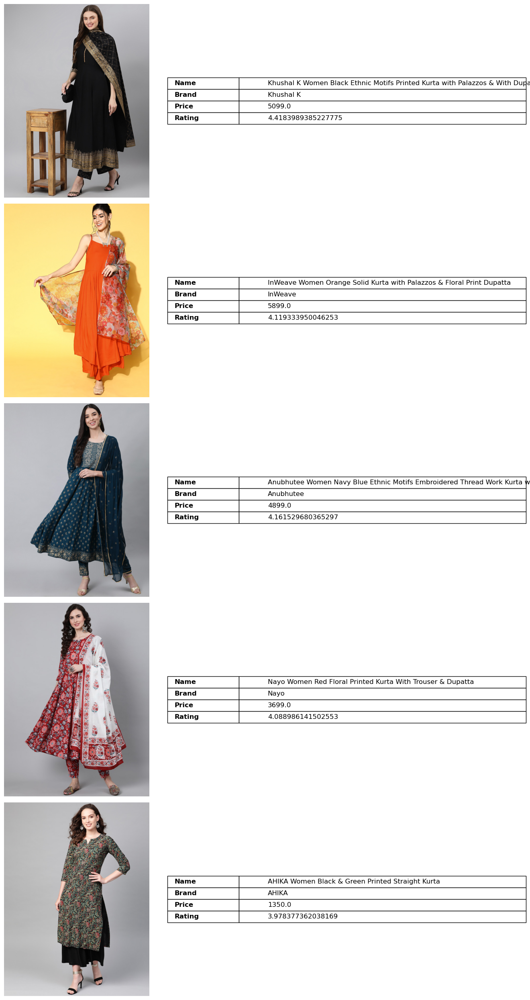

In [8]:
images_folder_path = '/images'

# Define a function to display images with mini tables
def display_images_with_info(df, images_folder_path, num_images=5):
    # Create subplots to display images and mini tables
    fig, axes = plt.subplots(num_images, 2, figsize=(15, num_images * 5))

    # Iterate over each row in the DataFrame and display the image with mini table
    for i, (idx, row) in enumerate(df.head(num_images).iterrows()):
        # Construct the path to the image file
        image_path = os.path.join(images_folder_path, str(row['p_id']) + '.jpg')

        # Check if the image file exists
        if os.path.exists(image_path):
            # Open the image file
            img = Image.open(image_path)

            # Display the image
            axes[i, 0].imshow(img)
            axes[i, 0].axis('off')

            # Create a mini table with information from the DataFrame
            table_data = [['Name', row['name']],
                          ['Brand', row['brand']],
                          ['Price', row['price']],
                          ['Rating', row['avg_rating']]]

            axes[i, 1].axis('off')
            mini_table = axes[i, 1].table(cellText=table_data, loc='center', cellLoc='left', colWidths=[0.2, 0.8])

            # Format the mini table
            for cell in mini_table.get_celld().values():
                if cell.get_text().get_text() in ['Name', 'Brand', 'Price', 'Rating']:
                    cell.get_text().set_fontweight('bold')
                cell.get_text().set_fontsize(12)

            # Set font size explicitly for all cells
            mini_table.auto_set_font_size(False)
            mini_table.set_fontsize(12)
            mini_table.scale(1.2, 1.2)  # Adjust the scaling factor as needed
        else:
            print(f"Image not found for p_id: {row['p_id']}")

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

# Display images with mini tables for the first 5 images
display_images_with_info(fashion_data, images_folder_path, num_images=5)


In [9]:
# Print the columns of the fashion_data DataFrame
print(fashion_data.columns)

Index(['p_id', 'name', 'products', 'price', 'colour', 'brand', 'img',
       'ratingCount', 'avg_rating', 'description', 'p_attributes'],
      dtype='object')


In [10]:
print(fashion_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14214 entries, 0 to 14213
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   p_id          14214 non-null  int64  
 1   name          14214 non-null  object 
 2   products      14214 non-null  object 
 3   price         14214 non-null  float64
 4   colour        14214 non-null  object 
 5   brand         14214 non-null  object 
 6   img           14214 non-null  object 
 7   ratingCount   6530 non-null   float64
 8   avg_rating    6530 non-null   float64
 9   description   14214 non-null  object 
 10  p_attributes  14214 non-null  object 
dtypes: float64(3), int64(1), object(7)
memory usage: 1.2+ MB
None


### Dataset Chunking

In [ ]:
In this analysis, we have decided not to implement dataset chunking. Our dataset is well-structured, with each data point organized in its respective rows and columns. Chunking, which involves breaking down large datasets into smaller, more manageable pieces, is typically necessary when dealing with massive datasets or when specific parameters like time, categories, or other criteria need to be considered for processing.

Given the current manageable size of our dataset and the time constraints, we have chosen to forgo chunking. Although chunking can be beneficial for efficiently handling large volumes of data, it is not necessary for our analysis at this time, considering the scope and scale of our dataset.

If our dataset grows or our analysis requirements change, we may revisit the idea of chunking to optimize our data processing. For now, we will proceed with the complete dataset, utilizing its existing structure to derive insights and conduct our analyses.

### Generate and Store Embeddings using OpenAI and ChromaDB

In [ ]:
### Embedding Layer

In [16]:

# Set the API key for OpenAI
api_key = os.getenv("OPENAI_API_KEY")

# Define the path for storing ChromaDB collections
chroma_data_path = '/ChromaDB_Data'

# Initialize the ChromaDB client with the specified data path
client = chromadb.PersistentClient(path=chroma_data_path)

# Set up the embedding function using the OpenAI embedding model
model = "text-embedding-ada-002"
embedding_function = OpenAIEmbeddingFunction(api_key=api_key, model_name=model)

# Load the fashion dataset from the CSV file
file_path = '/Fashion Dataset v2.csv'
fashion_data = pd.read_csv(file_path)

# Convert the data to a dictionary format with metadata
fashion_data['metadata'] = fashion_data.apply(
    lambda x: {
        'Product_id': x['p_id'],  # Unique identifier for the product
        'Name': x['name'],  # Product name
        'Product_type': x['products'],  # Type or category of the product
        'Price_INR': x['price'],  # Price of the product in Indian Rupees
        'Colour': x['colour'],  # Color of the product
        'Brand': x['brand'],  # Brand of the product
        'RatingCount': x['ratingCount'],  # Number of ratings received
        'Rating': x['avg_rating'],  # Average rating of the product
        'Description': x['description'],  # Description of the product
        'Product_attributes': x['p_attributes']  # Additional attributes of the product
    }, axis=1
)

# Function to extract text for embedding
def extract_text(metadata):
    """
    Extracts text content from the metadata dictionary for embedding.

    Args:
    metadata (dict): Dictionary containing metadata information.

    Returns:
    str: Text content extracted from the metadata.
    """
    text_content = ""
    if "Description" in metadata and metadata["Description"]:
        text_content += metadata["Description"]  # Add product description
    if "name" in metadata:
        text_content += " " + metadata["name"]  # Add product name
    if not text_content:
        text_content = "No description available."
    return text_content.strip()  # Strip leading and trailing whitespace

# Extract text for embedding from each row of metadata
documents = [extract_text(row['metadata']) for _, row in fashion_data.iterrows()]

# Get or create a ChromaDB collection for fashion products
fashion_collection = client.get_or_create_collection(name='Fashion_Products', embedding_function=embedding_function)

# Add the data to the ChromaDB collection
for idx, (p_id, metadata) in enumerate(zip(fashion_data['p_id'], fashion_data['metadata'])):
    print(f"Processing document with p_id={p_id}")
    print(f"Document text: {documents[idx]}")
    fashion_collection.add(
        documents=[documents[idx]],  # Text content of the document
        ids=[str(p_id)],  # Unique identifier of the document
        metadatas=[metadata]  # Metadata associated with the document
    )

print("Data added to ChromaDB collection!")

Processing document with p_id=17048614
Document text: Black printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Dupatta Length 2.43 meters Width:&nbsp;88 cm<br>The model (height 5'8) is wearing a size S100% Rayon<br>Machine wash


Add of existing embedding ID: 17048614
Insert of existing embedding ID: 17048614


Processing document with p_id=16524740
Document text: Orange solid Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>A-line shape</li><li>Regular style</li><li>Square neck, sleeveless shoulder straps</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Elasticated waistband</li><li>Zip closure</li></ul><b>Dupatta Design:</b><ul><li>Floral Printed</li></ul>Kurta Fabric: Viscose rayon<br>Bottom Fabric:&nbsp;Viscose rayon<br>Dupatta Fabric: Organza<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16524740
Insert of existing embedding ID: 16524740


Processing document with p_id=16331376
Document text: Navy blue embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter no sleeves </li> <li> Thread work detail </li> <li> Above knee length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Viscose rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16331376
Insert of existing embedding ID: 16331376


Processing document with p_id=14709966
Document text: Red printed kurta with trouser and dupatta<br><b>Kurta design:</b><ul><li>Printed kurta</li><li>Anarkali design</li><li>Round neck</li><li>Three-quarter sleeves</li><li>Flared hem</li><li>Calf length</li></ul><b>Trouser design:</b><ul><li>Printed trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta design:</b><ul><li>White and red printed dupatta</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Cotton Blend <br> Hand washDupatta length: 2 metres (approx.) <br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14709966
Insert of existing embedding ID: 14709966


Processing document with p_id=11056154
Document text: Black and green printed straight kurta, has a nitched round neck, three-quarter sleeves, straight hem, side slitsMaterial: Cotton<br> Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11056154
Insert of existing embedding ID: 11056154


Processing document with p_id=18704418
Document text: <ul> <li> Colour: red </li> <li> Solid woven design </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> Anarkali shape with pleated style </li> <li> Thread work detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular georgette </li> </ul><br> The model (height 5'8) is wearing a size S<p>Georgette</p>


Add of existing embedding ID: 18704418
Insert of existing embedding ID: 18704418


Processing document with p_id=14046594
Document text: Stately and versatile, this kurta set will be your top choice. Its eye-catching printed kurta comes with snug printed palazzos and a gorgeous printed dupatta for added appeal. <br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Pleated style</li><li>Keyhole neck, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>2 pockets</li></ul><b>Dupatta Design</b><br>Printed dupatta<br>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14046594
Insert of existing embedding ID: 14046594


Processing document with p_id=14951330
Document text: When in doubt, rock this simple yet stylish kurta set at any traditional function. It comes with an elegant printed kurta and snug printed palazzos for comfort.&nbsp;<ul><li>Kurta:</li><li>Classy beige tone</li><li>Attractive round neck</li><li>Long regular sleeves</li><li>Calf length</li><li>Poly crepe, machine wash</li><li>Palazzos:</li><li>Printed palazzos</li><li>Partially elasticated waist</li><li>Poly crepe, machine wash</li><li>Tassels border</li><li>Printed pattern</li><li>Net, machine wash</li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Top fabric:  Poly Crepe <br> Bottom fabric:  Poly Crepe <br> Dupatta fabric:  Net <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14951330
Insert of existing embedding ID: 14951330


Processing document with p_id=13791594
Document text: Yellow and white printed kurta with palazzos<br> Yellow and white straight knee length kurta, has a round neck, three-quarter sleeves, side slits<br>Yellow and white Printed palazzos, has partially elasticated waistbandThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Add of existing embedding ID: 13791594
Insert of existing embedding ID: 13791594


Processing document with p_id=17048604
Document text: Green &amp; pink printed kurta with palazzos &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular&nbsp; style</li><li>Round neck, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with pink solid dupatta</li></ul>Dupatta: 2.4 x 0.8 meters<br>The model (height 5'8) is wearing a size STop: 100% Cotton<br>Bottom: 100% Cotton<br>Dupatta: Silk Chiffon<br>Machine wash


Add of existing embedding ID: 17048604
Insert of existing embedding ID: 17048604


Processing document with p_id=10356859
Document text: This set includes: Kurta and Trousers<br><br>A smart piece with a floral trend signature, the contemporary styling components ups the exclusivity of this set. The shades of taffy pink beautifully contrasts with the luxe blue floral motifs, while the structured silhouette gives it a casual edge. Design, comfort and a smart overall look, this set is elegance personified!<ul><li><b>Kurta:</b><br>All over floral print, hook and eye keyhole neck, short sleeves, calf length with tapered slits, smart styling with side pocket</li><li><b>Trousers:</b><br>Variegated grainy stripes in crop-cut with elastic&nbsp;back, slip-on styling, 2 pockets</li><li>Pure cotton, Machine-wash</li><li>The model (height 5'8") is wearing a size S</li></ul>


Add of existing embedding ID: 10356859
Insert of existing embedding ID: 10356859


Processing document with p_id=12413214
Document text: Mustard yellow floral yoke embroidered straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Dry Clean


Add of existing embedding ID: 12413214
Insert of existing embedding ID: 12413214


Processing document with p_id=16600750
Document text: Teal yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> A-line shape </li> <li> Panelled style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Poly silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S<br>Dupatta length 2.25 mtr Width 0.7 mtrKurta: Poly Silk<br>Bottom:&nbsp;Poly Silk<br>Dupatta: Art Silk<br>Hand wash


Add of existing embedding ID: 16600750
Insert of existing embedding ID: 16600750


Processing document with p_id=9867983
Document text: Navy blue printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter roll-up sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 9867983
Insert of existing embedding ID: 9867983


Processing document with p_id=14399798
Document text: Peach-coloured yoke design kurta with palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Solid trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Two pockets</li></ul><b>Dupatta</b><ul><li>Solid dupatta</li></ul>Top fabric: 100% Viscose Rayon<br>Bottom fabric: 100% Viscose Rayon<br>Dupatta fabric: Poly Chiffon<br>Hand washThe model (height 58) is wearing a size S


Add of existing embedding ID: 14399798
Insert of existing embedding ID: 14399798


Processing document with p_id=18372852
Document text: Maroon yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size STop fabric: Silk Blend<br>Bottom fabric: Silk Blend<br>Dupatta fabric: Silk Chiffon<br>Dry clean


Add of existing embedding ID: 18372852
Insert of existing embedding ID: 18372852


Processing document with p_id=15241816
Document text: <ul><li>Colour: yellow and peach coloured</li><li>Floral screen printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Gotta patti detail</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton <br> Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15241816
Insert of existing embedding ID: 15241816


Processing document with p_id=10808284
Document text: Make a statement with this green kurta that embodies the beauty of simple style. This straight kurta with pastel floral print all-over accents keyhole neck that makes for an ideal piece for both day and night<br>&nbsp;<ul><li>Colour: Green with white floral accents</li><li>keyhole neck&nbsp;</li><li>3/Q roll-up sleeves</li><li>straight silhouette&nbsp;with a firm drape</li><li>Knee length</li><li>Cotton, Machine-wash</li><li>The model (height 5'8") is wearing a size S</li></ul>The model (height 5'8") is wearing a size S


Add of existing embedding ID: 10808284
Insert of existing embedding ID: 10808284


Processing document with p_id=14376546
Document text: <ul><li>Colour: black and orange</li><li>Bandhani printed</li><li>Mandarin collar</li><li>Button closure</li><li>Sleeveless, no sleeves</li><li>A-line shape with regular style</li><li>Calf length with flared hem</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Add of existing embedding ID: 14376546
Insert of existing embedding ID: 14376546


Processing document with p_id=19240164
Document text: <ul> <li> Colour: navy blue </li> <li> Floral embroidered </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Add of existing embedding ID: 19240164
Insert of existing embedding ID: 19240164


Processing document with p_id=15055304
Document text: Blue embroidered Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric embroidered </li> <li> A-line shape </li> <li> Panelled style </li> <li> Round neck,  long regular sleeves </li> <li> 2 pockets </li> <li> Floor length with flared hem </li> <li> Poly georgette machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Solid Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Poly Georgette <br> Bottom fabric:  Silk Blend <br> Dupatta fabric:  Net <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15055304
Insert of existing embedding ID: 15055304


Processing document with p_id=14649544
Document text: Blue printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta design: </b><ul><li>Printed dupatta</li><li>Solid border</li></ul>Top fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Viscose Rayon <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14649544
Insert of existing embedding ID: 14649544


Processing document with p_id=17581924
Document text: Sea green yoke design Top with Skirt with dupatta <br> <br> <b> Top design:  </b> <ul> <li> Floral yoke design </li> <li> A-line shape </li> <li> Pleated style </li> <li> V-neck,  short flared sleeves </li> <li> Na pockets </li> <li> Above knee length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Printed Skirt </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S<p>Machine Wash as per Tag</p>


Add of existing embedding ID: 17581924
Insert of existing embedding ID: 17581924


Processing document with p_id=13810898
Document text: Blue and green printed kurta with palazzos and dupatta<br>Blue and green straight calf length kurta, has a mandarin collar, three-quarter sleeves, side slits<br>Green solid palazzos, has partially elasticated waistband, slip-on closure<br>Blue and green printed dupatta, has printed borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-wash


Add of existing embedding ID: 13810898
Insert of existing embedding ID: 13810898


Processing document with p_id=15150620
Document text: Pink embroidered Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Tree-quarter regular sleeves</li><li>Sequinned detail</li><li>Calf length&nbsp;</li><li>Straight hem</li><li>Side details</li><li>Viscose rayon knitted and woven fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Embroidered dupattaTop fabric: Viscose Silk<br>Bottom fabric: Viscose Silk<br>Dupatta fabric: Organza<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15150620
Insert of existing embedding ID: 15150620


Processing document with p_id=19240246
Document text: Teal solid Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral solid </li> <li> Anarkali shape </li> <li> Panelled style </li> <li> Round neck,  long regular sleeves </li> <li> Floor length with flared hem </li> <li> Art silk knitted fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Self design Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>DRY CLEAN ONLY</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19240246
Insert of existing embedding ID: 19240246


Processing document with p_id=12766966
Document text: Red, orange and pink bandhani printed anarkali kurta with gotta patti detailing, has a round neck, three-quarter sleeves, and flared hemMaterial: Viscose Rayon<br>  Dry CleanThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12766966
Insert of existing embedding ID: 12766966


Processing document with p_id=14023594
Document text: Maroon printed kurta with palazzos and dupatta<br> Maroon A-line calf length kurta, has a V-neck, three-quarter sleeves, front slit<br>Maroon  printed palazzos, has partially elasticated waistband, slip-on closure<br>Maroon printed dupatta, has taping borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine-wash


Add of existing embedding ID: 14023594
Insert of existing embedding ID: 14023594


Processing document with p_id=14346084
Document text: Pink and white Floral Screen Print A-Line Pure Cotton Kurta Set With Dupatta<br><br><b>Kurti design: </b><ul><li>Floral printed</li><li>A-line design</li><li>Regular&nbsp;style</li><li>Round neck, three-quarter regular sleeve</li><li>Calf length with flared hem</li><li>Machine weave regular</li></ul><br><b>Trousers design: </b><ul><li>Printed</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with a Dupatta</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Cotton Blend <br> Machine washDupatta length: 2.25 metre (approx.)<br>The model (height 58) is wearing a size S


Add of existing embedding ID: 14346084
Insert of existing embedding ID: 14346084


Processing document with p_id=18829920
Document text: Lime green embroidered Top with Sharara with dupatta <br> <br> <b> Top design:  </b> <ul> <li> Geometric embroidered </li> <li> A-line shape </li> <li> Layered style </li> <li> Boat neck,  sleeveless no sleeves </li> <li> Na pockets thread work detail </li> <li> Above knee length with straight hem </li> <li> Poly georgette knitted fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Embroidered Sharara </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul><p>50 %Polyster And 50 % cottton georgette</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18829920
Insert of existing embedding ID: 18829920


Processing document with p_id=11459658
Document text: This set includes: Kurta, Trousers and Dupatta<br><br>The robust flowy silhouette of this piece stands out on its own, as does the ethnic floral patterning all over. Crafted with precision, the intricate stencilling techniques and gotta lace panelling has given this kurta set a sharp edged finishing. If daily comfort with a design marvel is what you're looking for in your ethnic wear, then you've stumbled upon the right thing here!<ul><li><b>Kurta:</b><br>Mulberry screen printed ethnic floral pattern all-over with gotta lace, boat neck, 3/4th sleeves, mid calf-length with flared hem</li><li><b>Trousers:</b><br>Blushed tone in clean crop-cut, semi-elasticated waistline with slip-on styling</li><li><b>Dupatta:</b><br>Ethnic screen print with striped and solid alternate bordering</li><li>Pure cotton, hand-wash</li><li>The model (height 5'8") is wearing a size S</li></ul>


Add of existing embedding ID: 11459658
Insert of existing embedding ID: 11459658


Processing document with p_id=16522612
Document text: Pink embroidered Kurta with Skirt with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Embroidered Skirt </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size SSilk blend<br>Dry clean only


Add of existing embedding ID: 16522612
Insert of existing embedding ID: 16522612


Processing document with p_id=15150642
Document text: Teal blue &amp; Pink yoke design Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Solid yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Art silk knitted and woven fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>1 pockets</li></ul>Top fabric:  Art Silk <br> Bottom fabric:  Art Silk <br> Dupatta fabric:  Organza <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15150642
Insert of existing embedding ID: 15150642


Processing document with p_id=16875218
Document text: <ul> <li> Colour: maroon and grey </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular polyester </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine-wash


Add of existing embedding ID: 16875218
Insert of existing embedding ID: 16875218


Processing document with p_id=10808290
Document text: Green and Mustard yellow printed straight kurta, has a keyhole neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Add of existing embedding ID: 10808290
Insert of existing embedding ID: 10808290


Processing document with p_id=12246214
Document text: Maroon and gold printed kurti with sharara and dupatta<br>Maroon and gold straight knee length kurti, has a round neck, sleeveless, side slits<br>Maroon and gold printed sharara, has partially elasticated waistband, slip-on closure<br>Maroon and gold printed dupatta, has taping borderKurta fabric: poly georgette<br>Bottom fabric: poly georgette<br>Dupatta fabric: poly georgette<br>Machine-washThe model (height 5'8") is wearing a size S<br>Dupatta Length - 2.25 m<br>Dupatta Width - 0.52 m


Add of existing embedding ID: 12246214
Insert of existing embedding ID: 12246214


Processing document with p_id=9438657
Document text: Black and mustard yellow solid kurta with trousers and dupatta<br>Black solid straight calf length kurta, has a boat neck, three-quarter sleeves, side slits<br>Black solid solid trousers, has elasticated waistband, slip-on closure<br>Black and mustard yellow printed dupatta, has tassels borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 9438657
Insert of existing embedding ID: 9438657


Processing document with p_id=16331336
Document text: Teal printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Empire style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Above knee length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16331336
Insert of existing embedding ID: 16331336


Processing document with p_id=7763575
Document text: Red Floral Print&nbsp;A-line kurta, has a round neck, short sleeves, flared hem, has gathers along the waistThe model (height 5'8") is wearing a size S100% viscose<br>Hand-wash


Add of existing embedding ID: 7763575
Insert of existing embedding ID: 7763575


Processing document with p_id=19357994
Document text: <ul> <li> Colour: pink </li> <li> Ethnic motifs woven design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with tiered style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SRayon<br>Hand wash


Add of existing embedding ID: 19357994
Insert of existing embedding ID: 19357994


Processing document with p_id=18957838
Document text: Fluorescent green embroidered Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Anarkali shape </li> <li> Pleated style </li> <li> Keyhole neck,  three-quarter flared sleeves </li> <li> Na pockets </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Printed Churidar </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul>Pure cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18957838
Insert of existing embedding ID: 18957838


Processing document with p_id=18425500
Document text: <ul><li>Colour: pink</li><li>Ethnic motifs solid</li><li>V-neck</li><li>Three-quarter, flared sleeves</li><li>Anarkali shape with pleated style</li><li>Ankle length with flared hem</li><li>Machine weave regular viscose rayon</li></ul><p>Dry Clean</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18425500
Insert of existing embedding ID: 18425500


Processing document with p_id=14925332
Document text: <ul> <li> Colour: mustard yellow and red </li> <li> Geometric printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14925332
Insert of existing embedding ID: 14925332


Processing document with p_id=18811288
Document text: Teal embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Drawstring closure </li> </ul>Top &amp; Bottom: Silk blend<br>Dupatta: Poly chiffon<br>Dry clean only<br>Size worn by the model: 36<br>Chest: 30"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'9"<br>


Add of existing embedding ID: 18811288
Insert of existing embedding ID: 18811288


Processing document with p_id=15646472
Document text: <ul> <li> Colour: red </li> <li> Bandhani printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15646472
Insert of existing embedding ID: 15646472


Processing document with p_id=18503778
Document text: Pink embroidered Kurti with Sharara with dupatta<br><br><b>Kurti design: </b><ul><li>Floral embroidered</li><li>A-line shape</li><li>Layered style</li><li>Keyhole neck, three quarter regular sleeves</li><li>Na pockets gotta patti detail</li><li>Above knee length with curved hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Self design Sharara</li><li>Elasticated waistband</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Add of existing embedding ID: 18503778
Insert of existing embedding ID: 18503778


Processing document with p_id=15561680
Document text: Navy blue &amp; grey printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Navy blue &amp; gold coloured</li><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Mirror work detail</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Grey bottom Embroidered Palazzos</li><li>Partially Elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: Viscose Rayon 100%<br>Bottom fabric: Viscose Rayon 100%<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15561680
Insert of existing embedding ID: 15561680


Processing document with p_id=16857670
Document text: Lavender printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 2 pockets </li> <li> Calf length with flared hem </li> <li> Pure cotton knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Pure Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16857670
Insert of existing embedding ID: 16857670


Processing document with p_id=13437328
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the breezy tiered silhouette and printed pattern, this straight kurta will become your go-to outfit. Top it off with these&nbsp;checked salwar and comfortable flats<br><br><b>FEATURES<br><br>KURTA</b><ul><li>has a mandarin neck</li><li>button closure</li><li>three-quarter puffed sleeves</li><li>curved hem</li><li>side slits</li></ul><b>PALAZZOS</b><ul><li>has partially elasticated waistband</li><li>slip-on closure</li><li>one pocket</li></ul>The model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Add of existing embedding ID: 13437328
Insert of existing embedding ID: 13437328


Processing document with p_id=19181470
Document text: Green striped Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric striped </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless regular sleeves </li> <li> Na pockets </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Kurta - Cotton, Bottom - Cotton, Dupatta - Mul</p>


Add of existing embedding ID: 19181470
Insert of existing embedding ID: 19181470


Processing document with p_id=12105006
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting this summer-ready kurta set, this kurta set beautifully captures your edgy aesthetic. With an ethnic print, and straight hem, this Sangria kurta is one you'll be eager to show off at college, resorts, or anywhere else your heart desires.<br>Pink &amp;gold coloured floral print Kurta with Trousers<br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Knee length with flared&nbsp;hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Part

Add of existing embedding ID: 12105006
Insert of existing embedding ID: 12105006


Processing document with p_id=17487194
Document text: Our 3-piece beige woven design silk suit set features a straight-fit floral embroidery kurta with a V-neckline and three-quarter sleeves, straight pants with a partially elasticated waistband and roomy pockets, and a chiffon dupatta in a solid tone. Adorned with complementing fabric-trim detailing, Gota Patti accents on the yoke and sleeves, and delicate tassel details on the dupatta, this elegant style is ideal for festive occasions.<br>Size worn by the model: S<br>Chest: 32''<br>Waist: 28"<br>Hips: 33''<br>Height: 5'7"<br>Silk blend&nbsp;<br>Dupatta fabric:&nbsp;Chiffon&nbsp;<br>Machine Wash


Add of existing embedding ID: 17487194
Insert of existing embedding ID: 17487194


Processing document with p_id=11636314
Document text: Blue and Off-white printed anarkali kurta, has a keyhole neck, three-quarter sleeves, attached lining and flared hem93% Cotton and 7% linen<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11636314
Insert of existing embedding ID: 11636314


Processing document with p_id=16706794
Document text: Look stylish when you step out wearing this smart and versatile kurta set. Tailored with an attractive sweetheart neck and sleeveless design, this kurta set is a must-have.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Stunning magenta tone</li><li></li><li>Charming sweetheart neck </li><li></li><li>Sleeveless </li><li></li><li>Calf length </li></ul><b>Trend Alert</b><br>Vintage and whimsical, the I-spy lace flaunts the idea of love and uses delicate lace details or trims in borders of the yoke or hem. It even refers to ensembles made from lace coupled with other intricate detailing, like frills, scallop edges, halter neck, and so on.Top Fabric:Net<br>Bottom Fabric:Net<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16706794
Insert of existing embedding ID: 16706794


Processing document with p_id=17140538
Document text: Pink embroidered Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali&nbsp; shape</li><li>Empire style</li><li>Round neck, sleeveless no sleeves</li><li>Knee length with flared hem</li><li>Pure cotton knitted fabric</li></ul><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta:</b><ul><li>Printed dupatta</li><li>Solid border</li></ul>Dupatta: 2.2 x 1.2 meters<br>The model (height 5'8) is wearing a size SPure Cotton<br>Machine Wash


Add of existing embedding ID: 17140538
Insert of existing embedding ID: 17140538


Processing document with p_id=14224616
Document text: <ul> <li> Colour: pink and gold-toned </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Gotta patti detail </li> <li> Calf length with flared hem </li> <li> Knitted regular cotton </li> </ul>60'S COTTON<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14224616
Insert of existing embedding ID: 14224616


Processing document with p_id=19145056
Document text: Red embroidered Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid embroidered </li> <li> A-line shape </li> <li> Pleated style </li> <li> Mandarin collar,  sleeveless regular sleeves </li> <li> Na pockets </li> <li> Floor length with high-low hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Printed Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SKurta - Cotton<br>Pant - Cotton<br>Dupatta - Chiffon


Add of existing embedding ID: 19145056
Insert of existing embedding ID: 19145056


Processing document with p_id=15508918
Document text: Yellow yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Organza <br> Dry clean


Add of existing embedding ID: 15508918
Insert of existing embedding ID: 15508918


Processing document with p_id=17197472
Document text: Purple embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 1 pockets sequinned detail </li> <li> Calf length with straight hem </li> <li> Silk chiffon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric: Silk chiffon<br>Bottom fabric: Silk chiffon<br>Dupatta fabric: Silk chiffon<br>Machine wash


Add of existing embedding ID: 17197472
Insert of existing embedding ID: 17197472


Processing document with p_id=13238316
Document text: <ul><li>Purple and white&nbsp;</li><li>striped</li><li>straight shape with short sleeves</li><li>round neck</li><li>knee length</li><li>straight hem</li><li>regular style</li><li>machine weave cotton&nbsp;</li></ul>cotton <br> machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13238316
Insert of existing embedding ID: 13238316


Processing document with p_id=3077373
Document text: White solid straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, multiple slits<br>Manufacturing Info:&nbsp;Zurick collection<br>Country of Origin: IndiaCotton <br> Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 3077373
Insert of existing embedding ID: 3077373


Processing document with p_id=18859760
Document text: Black solid Kurti with Trousers<br><br><b>Kurti design: </b><ul><li>Floral solid</li><li>Pathani shape</li><li>Pleated style</li><li>Shirt collar, three-quarter roll-up sleeves</li><li>1 pockets</li><li>Calf length with curved hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li></ul><p>Hand Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18859760
Insert of existing embedding ID: 18859760


Processing document with p_id=16919764
Document text: Mustard yellow embroidered Kurti with Sharara<br><br><b>Kurti design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Angrakha style</li><li>V-neck, short flared sleeves</li><li>1 pockets</li><li>Above knee length with flared hem</li><li>Viscose rayon knitted and woven fabric</li></ul><br><b>Sharara design: </b><ul><li>Solid Sharara</li><li>Elasticated waistband</li><li>Zip closure</li></ul>Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16919764
Insert of existing embedding ID: 16919764


Processing document with p_id=16941854
Document text: Lavender printed Kurti with Sharara with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Panelled style </li> <li> Round neck,  sleeveless no sleeves </li> <li> Gotta patti detail </li> <li> Above knee length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> <li> Hook and eye closure </li> </ul>The model (height 5'8) is wearing a size STop Fabric:Pure Cotton ,Bottom Fabric:pure cotton ,Dupatta Fabric:Poly Chiffon<br>Machine Wash


Add of existing embedding ID: 16941854
Insert of existing embedding ID: 16941854


Processing document with p_id=15889764
Document text: <ul><li>Colour: green and white</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave&nbsp;</li></ul>Polycotton<br>Machine-wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15889764
Insert of existing embedding ID: 15889764


Processing document with p_id=8529019
Document text: This mustard straight kurta is crafted in cotton, features round neck with marigold print all-over<ul><li>Accents&nbsp;thread work on yoke, three-quarter sleeves</li><li>Straight&nbsp;silhouette</li><li>Calf length</li><li>Cotton, hand-wash</li><li>The model (height 5'8") is wearing a size S</li></ul>


Add of existing embedding ID: 8529019
Insert of existing embedding ID: 8529019


Processing document with p_id=17132180
Document text: Black checked Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Checked </li> <li> Straight shape </li> <li> Regular style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size SCotton<br>machine wash


Add of existing embedding ID: 17132180
Insert of existing embedding ID: 17132180


Processing document with p_id=14967448
Document text: Green printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Panelled style</li><li>Round neck, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta design:</b><ul><li>Printed</li><li>Taping border</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14967448
Insert of existing embedding ID: 14967448


Processing document with p_id=14224394
Document text: <p>Women Mustard &amp; Gold Printed Straight Kurta With Plazzo  &amp; Dupatta</p>The model (height 5'8") is wearing a size S<p>Hand Wash</p>


Add of existing embedding ID: 14224394
Insert of existing embedding ID: 14224394


Processing document with p_id=7156696
Document text: White and navy blue printed anarkali kurta, has a scoop neck, three-quarter sleeves, flared hemThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Add of existing embedding ID: 7156696
Insert of existing embedding ID: 7156696


Processing document with p_id=17193226
Document text: Teal printed Kurti with Sharara<br><br><b>Kurti design: </b><ul><li>Abstract printed</li><li>Anarkali shape</li><li>Regular style</li><li>Round neck, sleeveless no sleeves</li><li>Knee length with flared hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17193226
Insert of existing embedding ID: 17193226


Processing document with p_id=14949672
Document text: Pink printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Machine washDupatta Length: 2m<br>The model (height 5'8) is wearing a size S<br>


Add of existing embedding ID: 14949672
Insert of existing embedding ID: 14949672


Processing document with p_id=9370965
Document text: Pink printed straight kurta, has a keyhole neck, three-quarter sleeves, straight hem, side slits100% cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 9370965
Insert of existing embedding ID: 9370965


Processing document with p_id=11434632
Document text: Red embroidered kurta with trousers and dupatta<br> Red straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Red  solid trousers, has partially elasticated waistband, slip-on closure<br>Red solid dupatta, has taping borderThe model (height 5'8") is wearing a size SKurta fabric: silk blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: organza<br>Dry-clean


Add of existing embedding ID: 11434632
Insert of existing embedding ID: 11434632


Processing document with p_id=13962368
Document text: Flaunt your graceful feminine silhouette in this elegant kurta ket. For a touch of ethnic panache, this set's gorgeous printed kurta and solid palazzos come with a beautiful solid palazzos. <br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Sequinned detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>2 pockets&nbsp;</li><li>Slip-on closure</li><li>Comes with a dupatta</li></ul><b>Trend Alert</b><br>A trend that is going to last forever, white romance is effortless and elegant. It is a regal combination of white with understated tones of silver and bronze, and is characterized by graceful frills, ruffles, and tiering. This sophisticated style is the right choice for breezy summer occasion

Add of existing embedding ID: 13962368
Insert of existing embedding ID: 13962368


Processing document with p_id=13932904
Document text: <ul><li>Colour: blue and white</li><li>Geometric screen printed with striped detail</li><li>Shoulder straps</li><li>Straight shape with regular style</li><li>Knee length with straight hem</li><li>Machine weave regular cotton</li><li>Side slits</li></ul>Cotton kantha<br>Machine washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13932904
Insert of existing embedding ID: 13932904


Processing document with p_id=18198270
Document text: <ul><li>Colour: mustard yellow and pink</li><li>Floral print</li><li>U-neck</li><li>Sleeveless</li><li>Straight shape with side slits</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>100% cotton<br>Hand-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18198270
Insert of existing embedding ID: 18198270


Processing document with p_id=17104862
Document text: Charcoal grey printed Top with Palazzos<br><br><b>Top design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Pleated style</li><li>Round neck, sleeveless</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 17104862
Insert of existing embedding ID: 17104862


Processing document with p_id=19240240
Document text: <ul> <li> Colour: maroon </li> <li> Striped solid </li> <li> Boat neck </li> <li> Long,  flared sleeves </li> <li> Straight shape with high slit style </li> <li> Thread work detail </li> <li> Calf length with high-low hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Add of existing embedding ID: 19240240
Insert of existing embedding ID: 19240240


Processing document with p_id=15150344
Document text: Lavender &amp; White printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Voile <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15150344
Insert of existing embedding ID: 15150344


Processing document with p_id=18165350
Document text: Pink embroidered Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>1 pockets</li></ul>Dupatta Lenght : 2.3m, Dupatta Width : 85 cm<br><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>Cotton Blend<br>Organza&nbsp;<br>Machine Wash<br>


Add of existing embedding ID: 18165350
Insert of existing embedding ID: 18165350


Processing document with p_id=12307502
Document text: Pink self design kurta with trousers<br>Pink straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Pink Solid trousers, has elasticated waistband<br>Pink solid Dupatta with Tasselled borderDupatta:<br>Length: 2 m<br>Width: 1.14 m<br>The model (height 5'8") is wearing a size SKurta fabric: viscose rayon<br>Bottom fabric: viscose rayon<br>Dupatta fabric: silk chiffon<br>Hand-wash


Add of existing embedding ID: 12307502
Insert of existing embedding ID: 12307502


Processing document with p_id=19261926
Document text: Blue printed Trousers  <li> Elasticated waistband </li> <li> Drawstring closure </li><p>Seperate gentle hand wash with mild detergent in cold water &amp; dry inside out in shadow</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19261926
Insert of existing embedding ID: 19261926


Processing document with p_id=16287098
Document text: <ul> <li> Colour: navy blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16287098
Insert of existing embedding ID: 16287098


Processing document with p_id=18963536
Document text: <ul> <li> Colour: green </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon<br>Hand wash<br>The model (height 5'8) is wearing a size M


Add of existing embedding ID: 18963536
Insert of existing embedding ID: 18963536


Processing document with p_id=15390174
Document text: Blue printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Dry clean


Add of existing embedding ID: 15390174
Insert of existing embedding ID: 15390174


Processing document with p_id=11197978
Document text: Lime Green and Blue printed A-line kurta, has a round neck, three-quarter sleeves, and flared hem<br>This kurta can also be styled as a dressMaterial: 100% cotton &nbsp;&nbsp;<br>Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11197978
Insert of existing embedding ID: 11197978


Processing document with p_id=10648236
Document text: Green striped straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SViscose Rayon<br>Hand-wash


Add of existing embedding ID: 10648236
Insert of existing embedding ID: 10648236


Processing document with p_id=17447636
Document text: Green printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Anarkali shape</li><li>Panelled style</li><li>Round neck, three-quarter flared sleeves</li><li>Gotta patti detail</li><li>Floor length with flared hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta:</b><ul><li>Printed dupatta</li><li>Printed border</li></ul>The model (height 5'8) is wearing a size S100% Rayon<br>Machine Wash


Add of existing embedding ID: 17447636
Insert of existing embedding ID: 17447636


Processing document with p_id=17487138
Document text: Our 3-piece dark green printed suit set, crafted in soft rayon fabric features a straight-fit kurta with a round neckline and three-quarter sleeves, a floral print flowy skirt with a partially elasticated waistband, and a complementing dupatta in a solid tone. Adorned with delicate fabric-trim detailing and Gota Patti accents, this elegant style is ideal for intimate gatherings.Top fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dupatta Fabric: Poly chiffon<br>Machine Wash<br>Size worn by the model: S<br>Chest: 32''<br>Waist: 28"<br>Hips: 33''<br>Height: 5'7"<br>


Add of existing embedding ID: 17487138
Insert of existing embedding ID: 17487138


Processing document with p_id=16707970
Document text: Embrace sartorial elegance with this modish kurta set. Including a square neck and three-quarter bell sleeves, this kurta set will enhance your look.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Gorgeous green shade</li><li></li><li>Beautiful square neck </li><li></li><li>Three-quarter bell sleeves</li><li></li><li>Above knee </li></ul><b>Trend Alert</b><br>Ethnic motifs can be small and intricate or bold and large patterns that are designed on fabrics. They are widely worn by people of distinct cultures to make a statement and represent their background. Often designed in vivid colours and shapes, motifs are inspired by nature, different cultures, and religions as well.<p>100% Rayon</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16707970
Insert of existing embedding ID: 16707970


Processing document with p_id=14121926
Document text: Purple solid Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 87% Viscose Rayon, 13%&nbsp;Polyester<br>Bottom fabric: 87% Viscose Rayon, 13%&nbsp;Polyester<br>Dupatta fabric: 91% Polyester, 9% Metallic fibre<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14121926
Insert of existing embedding ID: 14121926


Processing document with p_id=17952212
Document text: Mustard yellow and golden printed Kurta with Palazzos and dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Tie-up neck</li><li>Three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Side slits</li><li>Poly chanderi machine weave fabric</li><li>An attached lining</li></ul><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Drawstring closure</li></ul><b>Dupatta design</b><ul><li>Solid dupatta</li><li>Tassellled border</li></ul>Kurta fabric: 100% polyester<br>Kurta lining: 100% cotton<br>Bottom fabric: 100% cotton<br>Dupatta fabric: Poly chiffon<br>Dry-clean<br>Size worn by the model: 32<br>Chest: 33.5"<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Add of existing embedding ID: 17952212
Insert of existing embedding ID: 17952212


Processing document with p_id=18184744
Document text: <ul> <li> Colour: red and gold-toned </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Hand wash cold wash</p><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Add of existing embedding ID: 18184744
Insert of existing embedding ID: 18184744


Processing document with p_id=13572242
Document text: Green and blue printed kurta with trousers<br>Green and blue printed straight calf length kurta with embroidered and sequinned detail, has a round neck, three-quarter sleeves, straight hem, side slits<br>Green and blue printed trousers, has partially elasticated waistband, drawstring closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Viscose Rayon<br>Hand-wash


Add of existing embedding ID: 13572242
Insert of existing embedding ID: 13572242


Processing document with p_id=15921898
Document text: Pink embroidered Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  sleeveless shoulder straps </li> <li> Gotta patti detail </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Pure Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15921898
Insert of existing embedding ID: 15921898


Processing document with p_id=13647622
Document text: <ul> <li> Colour:  pink &amp; white </li> <li> Three-quarter sleeves regular sleeves </li> <li> V-neck </li> <li> Ankle length </li> <li> Flared hem </li><li> A-line shape with angrakha style </li> <li> Machine weave regular cotton </li> <b> <br> <br> <br> <b></b></b></ul>cotton <br> hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13647622
Insert of existing embedding ID: 13647622


Processing document with p_id=15098616
Document text: <ul><li>Colour: burgundy and golden</li><li>Ethnic motifs yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular polyester</li></ul>Polyester <br> Dry clean<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15098616
Insert of existing embedding ID: 15098616


Processing document with p_id=18887472
Document text: <ul> <li> Colour: cream-coloured and blue </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with panelled style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Pure Cotton<br>Hand-wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5"<br>


Add of existing embedding ID: 18887472
Insert of existing embedding ID: 18887472


Processing document with p_id=19222130
Document text: Maroon printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> 1 pockets </li> <li> Calf length with straight hem </li> <li> Art silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>Art silk<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19222130
Insert of existing embedding ID: 19222130


Processing document with p_id=19048738
Document text: Copper-toned solid Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design solid </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Self design Trousers </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul>Material : Kurti - Silk&nbsp;<br>Pants - Silk&nbsp;<br>Lining - Cotton&nbsp;<br>Dupatta - Organza<br>Dry cleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19048738
Insert of existing embedding ID: 19048738


Processing document with p_id=9369411
Document text: Black and white striped straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, side slits, half button placketCotton<br> Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 9369411
Insert of existing embedding ID: 9369411


Processing document with p_id=17320642
Document text: Navy blue printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Regular style</li><li>Boat neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with dupatta</li></ul>Kurta fabric: Pure Cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Cotton blend<br>Hand WashDupatta length: 2.4 meters width: 1.01 meter (approx)<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17320642
Insert of existing embedding ID: 17320642


Processing document with p_id=9861565
Document text: Orange, pink and white printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsPolyester crepe<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 9861565
Insert of existing embedding ID: 9861565


Processing document with p_id=15054430
Document text: Green printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> <li> With mask </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> <li> Comes with a with mask </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Poly Chiffon <br> Hand wash


Add of existing embedding ID: 15054430
Insert of existing embedding ID: 15054430


Processing document with p_id=19236572
Document text: <ul> <li> Colour: black </li> <li> Ethnic motifs woven design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with high-low hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Add of existing embedding ID: 19236572
Insert of existing embedding ID: 19236572


Processing document with p_id=16186448
Document text: <p>Inddus Women Wine Self Design Anarkali Kurta with Printed Organza Dupatta and Embellished Belt</p>Top:Chiffon,<br>Inner:Shantun,<br>Dupatta:Organza,<br>Embellished Belt,<br>Dry Clean


Add of existing embedding ID: 16186448
Insert of existing embedding ID: 16186448


Processing document with p_id=14323728
Document text: Black yoke design Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Yoke design</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck</li><li>Three-quarter regular sleeves</li><li>Calf length&nbsp;</li><li>Straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Comes with a printed dupattaThe model (height 5'8) is wearing a size STop fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Cotton Blend <br> Dry clean


Add of existing embedding ID: 14323728
Insert of existing embedding ID: 14323728


Processing document with p_id=18778410
Document text: <ul> <li> Colour: multicoloured and nirvana </li> <li> Chevron printed </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> A-line shape with layered style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Cotton</p>


Add of existing embedding ID: 18778410
Insert of existing embedding ID: 18778410


Processing document with p_id=18200184
Document text: Peach-coloured printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta fabric: 100% Cotton<br>Bottom Fabric: 100% Cotton<br>Dupatta Fabric : Voile<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18200184
Insert of existing embedding ID: 18200184


Processing document with p_id=17487160
Document text: Blue and white printed Kurti with Trousers<br><br><b>Kurti design: </b><ul><li>Geometric printed</li><li>Kaftan shape</li><li>Pleated style</li><li>Band collar, three-quarter flared sleeves</li><li>Above knee length with asymmetric hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>2 pockets</li><li>Slip-on closure</li></ul><br>Size worn by the model: S<br>Chest: 32''<br>Waist: 28"<br>Hips: 33''<br>Height: 5'7"<br>Cotton&nbsp;<br>Machine Wash


Add of existing embedding ID: 17487160
Insert of existing embedding ID: 17487160


Processing document with p_id=18952254
Document text: <ul> <li> Colour: pink </li> <li> Ethnic motifs embroidered </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular georgette </li> </ul><br> The model (height 5'8) is wearing a size SPure georgette<br>Light Hand Wash


Add of existing embedding ID: 18952254
Insert of existing embedding ID: 18952254


Processing document with p_id=16190840
Document text: White printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Pleated style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 16190840
Insert of existing embedding ID: 16190840


Processing document with p_id=15508896
Document text: Green yoke design Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Band collar,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Poly Chiffon <br> Dry cleanThe model (height 5'8) is wearing a size S<br>Dupatta length : 2.3 M,Width : 0.85 cm


Add of existing embedding ID: 15508896
Insert of existing embedding ID: 15508896


Processing document with p_id=14904336
Document text: <ul> <li> Colour: purple and off white </li> <li> Leheriya striped </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14904336
Insert of existing embedding ID: 14904336


Processing document with p_id=17449666
Document text: <ul> <li> Colour: mauve and white </li> <li> Bandhani printed </li> <li> Tie-up neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with pleated style </li> <li> Gotta patti detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><p>100% Cotton</p><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'11"<br>


Add of existing embedding ID: 17449666
Insert of existing embedding ID: 17449666


Processing document with p_id=16884160
Document text: Blue solid Kurta with Patiala &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Abstract printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Knee length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Patiala design: </b><ul><li>Printed Patiala</li><li>Slip-on closure</li></ul><b>Dupatta:</b><ul><li>Abstract printed&nbsp;</li><li>Printed border</li></ul>Dupatta Size : 2 Meter , Sleeves Length : 17 Inches<br>The model (height 5'8) is wearing a size SFabric : Top - Cotton<br>Bottom - Cotton&nbsp;<br>Dupatta -Cotton


Add of existing embedding ID: 16884160
Insert of existing embedding ID: 16884160


Processing document with p_id=18686196
Document text: Beige printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Na pockets </li> <li> Above knee length with curved hem </li> <li> Chanderi cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Gentle Wash Or Dry Clean Only</p>


Add of existing embedding ID: 18686196
Insert of existing embedding ID: 18686196


Processing document with p_id=12134668
Document text: Black printed kurta with trousers<br>Black printed straight calf length kurta, has a round neck, three-quarter sleeves, button closure, straight hem, side slits<br>Black Solid trousers, has partially elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-wash


Add of existing embedding ID: 12134668
Insert of existing embedding ID: 12134668


Processing document with p_id=16891228
Document text: Pink solid Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Regular style</li><li>V-neck, short regular sleeves</li><li>2 pockets gotta patti detail</li><li>Floor length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta:</b><ul><li>Solid dupatta</li><li>Taping border</li></ul>Pure Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16891228
Insert of existing embedding ID: 16891228


Processing document with p_id=18200178
Document text: Blue printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Drawstring closure </li> </ul>Top fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta fabric: Pure Cotton&nbsp;<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18200178
Insert of existing embedding ID: 18200178


Processing document with p_id=13091082
Document text: Pink and white printed kurta with palazzos and dupatta<br>Pink and white straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Pink and white printed palazzos, has elasticated waistband, slip-on closure<br>Pink solid dupatta, has tassels borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-wash


Add of existing embedding ID: 13091082
Insert of existing embedding ID: 13091082


Processing document with p_id=17241826
Document text: <ul><li>Colour: black</li><li>Geometric</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton<br>Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17241826
Insert of existing embedding ID: 17241826


Processing document with p_id=15055286
Document text: Blue solid Kurta with Palazzos and dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Sequinned detail and mirror-work</li><li>Knee length with straight hem</li><li>Poly georgette machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Embroidered Palazzos with mirror-work</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>2 pockets</li></ul><b>Dupatta design</b><ul><li>Solid dupatta with sequins</li></ul>Top fabric:  Poly Georgette <br> Bottom fabric:  Poly Georgette <br> Dupatta fabric:  Net <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15055286
Insert of existing embedding ID: 15055286


Processing document with p_id=15054566
Document text: Black printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Anarkali shape </li> <li> Panelled style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> <li> With mask </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> <li> Comes with a with mask </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Hand wash


Add of existing embedding ID: 15054566
Insert of existing embedding ID: 15054566


Processing document with p_id=19324668
Document text: <ul><li>Colour: pink</li><li>Embellished design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with panelled style</li><li>Thread work detail</li><li>Calf length with flared hem</li><li>Knitted and woven regular viscose rayon</li></ul><br> The model (height 5'8) is wearing a size SRayon<br>hand wash


Add of existing embedding ID: 19324668
Insert of existing embedding ID: 19324668


Processing document with p_id=14523618
Document text: Blue self design Kurti with Trousers with dupatta with dupatta <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs self design </li> <li> A-line shape </li> <li> Panelled style </li> <li> V-neck,  short flared sleeve </li> <li> Calf length with flared hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> <li> Comes with a  </li> </ul>Dupatta length: 2 metres (approx.) <br> The model (height 58) is wearing a size STop fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Cotton Blend <br> Dry clean


Add of existing embedding ID: 14523618
Insert of existing embedding ID: 14523618


Processing document with p_id=15535316
Document text: Teal embroidered Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Colourblocked embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Pure silk<br>Dry CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15535316
Insert of existing embedding ID: 15535316


Processing document with p_id=10343559
Document text: Blue and white printed kurta with palazzos<br>Blue and white bandhani printed A-line calf length kurta with gotta patti and panelled detail, has a tie-up neck, three-quarter sleeves, flared hem<br>Blue and white printed palazzos, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Add of existing embedding ID: 10343559
Insert of existing embedding ID: 10343559


Processing document with p_id=14949676
Document text: Mustard yellow yoke design Kurti with Dhoti Pants <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> A-line shape </li> <li> Pleated style </li> <li> Round neck,  long regular sleeves </li> <li> Gotta patti detail </li> <li> Above knee length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Dhoti Pants design:  </b> <ul> <li> Printed Dhoti Pants </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Viscose Rayon <br> Bottom fabric:  Cotton Blend <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14949676
Insert of existing embedding ID: 14949676


Processing document with p_id=18933466
Document text: Green solid Kurta with Skirt with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Anarkali shape </li> <li> High slit style </li> <li> V-neck,  short regular sleeves </li> <li> Na pockets </li> <li> Floor length with flared hem </li> <li> Poly georgette machine weave fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Self design Skirt </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Machine-wash</p>


Add of existing embedding ID: 18933466
Insert of existing embedding ID: 18933466


Processing document with p_id=16505390
Document text: <ul><li>Colour: blue</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular&nbsp;sleeves</li><li>Anarkali shape with empire style</li><li>Sequinned detail</li><li>Ankle length with flared hem</li><li>Machine weave regular viscose rayon</li></ul><p>Ready to wear</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16505390
Insert of existing embedding ID: 16505390


Processing document with p_id=14208496
Document text: This ravishing kurta set will make for a great addition to your ethnic wear closet. This set's printed kurta and printed dupatta with solid border enhance your allure, while the printed kurta offer a flattering fit. <br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Two pockets</li></ul><b>Dupatta design</b><br>Printed dupattaTop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Dry cleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14208496
Insert of existing embedding ID: 14208496


Processing document with p_id=11023922
Document text: Purple and gold-toned embroidered kurta with trousers<br>Purple and gold-toned A-line calf length kurta, has a round neck, three-quarter sleeves, flared hem<br>Purple solid trousers has a partially elasticated waistband, slip on closure<br>Purple solid dupatta, has laced borderThe model (height 5'8") is wearing a size SKurta fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Dupatta fabric: 100% Polyester<br>Machine-wash


Add of existing embedding ID: 11023922
Insert of existing embedding ID: 11023922


Processing document with p_id=14046632
Document text: Look charming and elegant when you wear this kurta set. Including a gorgeous printed kurta, this set is also accompanied by snug printed sharara and an attractive printed dupatta with taped border. <br> White straight above knee kurta, has a round neck, three-quarter sleeves, side slits<br>White  printed sharara, has partially elasticated waistband, slip-on closure<br>White printed dupatta, has taping borderDupatta Length: 2.5 m<br>Dupatta Width: 1.1 m<br>The model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine-wash


Add of existing embedding ID: 14046632
Insert of existing embedding ID: 14046632


Processing document with p_id=14925534
Document text: <ul> <li> Colour: green and white </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14925534
Insert of existing embedding ID: 14925534


Processing document with p_id=19265068
Document text: Magenta printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SKurta/Bottom-Pure Cotton<br>Dupatta-Poly Chiffon<br>First dry clean then separate gentle handwash with mild detergent in cold water &amp; dry in shadow


Add of existing embedding ID: 19265068
Insert of existing embedding ID: 19265068


Processing document with p_id=15798294
Document text: Pink embroidered Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Silk Chiffon <br> Dry cleanThe model (height 5'8) is wearing a size S<br>Dupatta length : 2.3 M,Width : 0.85 cm


Add of existing embedding ID: 15798294
Insert of existing embedding ID: 15798294


Processing document with p_id=17193238
Document text: Green printed Kurta with Sharara<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>V-neck, sleeveless, shoulder straps</li><li>Gotta patti detail</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Machine wash


Add of existing embedding ID: 17193238
Insert of existing embedding ID: 17193238


Processing document with p_id=13523706
Document text: <ul><li>Colour: black</li><li>three-quarter bell sleeves.&nbsp; mandarin collar, calf length straight hem shape with regular style machine weave cotton</li></ul>cotton<br>hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13523706
Insert of existing embedding ID: 13523706


Processing document with p_id=15271046
Document text: Pink and white print Kurta with Trousers and dupatta<br><br><b>Kurta design: </b><ul><li>Bandhani printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets gotta patti detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Drawstring closure</li><li>Comes with a dupatta</li></ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Hand wash


Add of existing embedding ID: 15271046
Insert of existing embedding ID: 15271046


Processing document with p_id=17487034
Document text: Our 3-piece blue printed cotton suit set features a straight-fit floral print kurta with a round neckline and three-quarter sleeves, straight pants with a partially elasticated waistband and roomy pockets, and a dupatta in a complementing print. Elevated with delicate fabric and lace-trim detailing, this smart style is perfect for work and beyond.<br>Size worn by the model: S<br>Chest: 32''<br>Waist: 28"<br>Hips: 33''<br>Height: 5'7"<br><p>Gentle Machine Wash</p>


Add of existing embedding ID: 17487034
Insert of existing embedding ID: 17487034


Processing document with p_id=18720202
Document text: <ul> <li> Colour: purple </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with empire style </li> <li> Mirror work detail </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Rayon</p>


Add of existing embedding ID: 18720202
Insert of existing embedding ID: 18720202


Processing document with p_id=15335772
Document text: Yellow striped Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Solid striped </li> <li> Straight shape </li> <li> Regular style </li> <li> Tie-up neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15335772
Insert of existing embedding ID: 15335772


Processing document with p_id=13771272
Document text: Green printed kurta with trousers and dupatta<br> Green A-line above knee kurta, has a keyhole neck, three-quarter sleeves, side slits<br>Green  printed trousers, has elasticated waistband, slip-on closure<br>Green printed dupatta, has printed borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-wash


Add of existing embedding ID: 13771272
Insert of existing embedding ID: 13771272


Processing document with p_id=12122358
Document text: Black and teal yoke design kurta with palazzos and dupatta<br>Black and teal straight calf length kurta, has a round neck, three-quarter sleeves, side slits, straight hem<br>Black solid palazzos, has partially elasticated waistband, slip-on closure, one pocket<br>Teal blue and golden self design dupatta, has tassels borderThe model (height 5'8") is wearing a size SKurta fabric: polyester<br>Bottom fabric: polyester<br>Dupatta fabric: art silk<br>Dry-clean


Add of existing embedding ID: 12122358
Insert of existing embedding ID: 12122358


Processing document with p_id=19041030
Document text: Purple solid Kurti with Trousers <br> <br> <b> Kurti design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Poly crepe machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Dry clean only</p>


Add of existing embedding ID: 19041030
Insert of existing embedding ID: 19041030


Processing document with p_id=2322792
Document text: Blue and white printed Straight kurta, has a round neck, sleeveless, flared hem, side slitsThe model (height 5'8") is wearing a size S100% cotton<br>Hand-wash


Add of existing embedding ID: 2322792
Insert of existing embedding ID: 2322792


Processing document with p_id=7334039
Document text: White and pink printed A-line kurta, has a round neck, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size SViscose Rayon<br>Machine-wash


Add of existing embedding ID: 7334039
Insert of existing embedding ID: 7334039


Processing document with p_id=17408530
Document text: <ul> <li> Colour: navy blue and red </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17408530
Insert of existing embedding ID: 17408530


Processing document with p_id=14854802
Document text: <ul> <li> Colour: navy blue and red </li> <li> Floral yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Add of existing embedding ID: 14854802
Insert of existing embedding ID: 14854802


Processing document with p_id=16907860
Document text: <ul><li>Colour: peach pink</li><li>Ethnic motifs print</li><li>Round neck</li><li>Three-quarter, flared sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Has lace detail around cuffs and yoke</li><li>Machine weave regular cotton</li></ul>The model (height 5'8) is wearing a size SPure Cotton<br>Gentle machine wash


Add of existing embedding ID: 16907860
Insert of existing embedding ID: 16907860


Processing document with p_id=18847276
Document text: Blue embroidered Kurti with Palazzos with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Floral embroidered </li> <li> Anarkali shape </li> <li> Pleated style </li> <li> Boat neck,  short flared sleeves </li> <li> Floor length with flared hem </li> <li> Poly georgette knitted fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Drawstring closure </li> </ul><p>Dry clean</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18847276
Insert of existing embedding ID: 18847276


Processing document with p_id=14036824
Document text: Grey and white printed kurta with palazzos and dupatta<br>Grey and white printed straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Grey and white printed palazzos, has elasticated waistband, slip-on closure<br>Grey and white printed dupatta, has printed borderThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta fabric: Pure Cotton<br>Hand-wash


Add of existing embedding ID: 14036824
Insert of existing embedding ID: 14036824


Processing document with p_id=13940072
Document text: <ul><li>Colour: green and</li><li>Geometric printed</li><li>Mandarin collar</li><li>Three-quarter sleeves, regular sleeves</li><li>A-line shape with regular style</li><li>Ankle length with flared hem</li><li>Machine weave regular viscose rayon</li><br><br><br><br><br><br>&nbsp;</ul>The model (height 5'8) is wearing a size S100% rayon<br>Machine wash


Add of existing embedding ID: 13940072
Insert of existing embedding ID: 13940072


Processing document with p_id=3084524
Document text: Red and golden printed A-line kurta with slits, has a tie-up neck, three-quarter sleeves with tie-ups, flared hem, no slitsThe model (height 5'8") is wearing a size SViscose Rayon<br> Hand-wash


Add of existing embedding ID: 3084524
Insert of existing embedding ID: 3084524


Processing document with p_id=12873874
Document text: Pink and white printed kurta with trousers<br>Pink and white printed straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Pink and white printed trousers, drawstring closure, one pocket<br>Pink and white printed dupattaKurta fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Voile<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12873874
Insert of existing embedding ID: 12873874


Processing document with p_id=18929144
Document text: Purple solid Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Add of existing embedding ID: 18929144
Insert of existing embedding ID: 18929144


Processing document with p_id=16926908
Document text: <ul> <li> Colour: black </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose<br>First wash Machine Wash then handwash


Add of existing embedding ID: 16926908
Insert of existing embedding ID: 16926908


Processing document with p_id=17766280
Document text: Mustard yellow printed Kurta with Sharara and dupatta<br><br><b>Kurta design: </b><ul><li>Bandhani printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, sleeveless</li><li>Above knee length with flared hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Partially elasticated waistband</li><li>Concealed zip closure</li></ul><b>Dupatta Design</b><ul><li>Printed dupatta</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>Top Fabric: 100% viscose<br>Bottom&nbsp;Fabric: 100% viscose<br>Dupatta Fabric: 100% cotton<br>Machine-wash


Add of existing embedding ID: 17766280
Insert of existing embedding ID: 17766280


Processing document with p_id=13727098
Document text: <ul><li>Colour: black</li><li>three-quarter sleeves</li><li>roll-up</li><li>round neck</li><li>calf length</li><li>straight hem</li><li>straight shape with regular style</li><li>machine weave</li><li>viscose rayon</li></ul>The model (height 5'8) is wearing a size S100% Viscose<br>hand wash


Add of existing embedding ID: 13727098
Insert of existing embedding ID: 13727098


Processing document with p_id=18753060
Document text: <ul> <li> Colour: blue and aquifer </li> <li> Solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>100% Viscose</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18753060
Insert of existing embedding ID: 18753060


Processing document with p_id=14023484
Document text: <ul><li>Colour: lime green and</li><li>Floral printed</li><li>Round neck</li><li>Three-quarter sleeves, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li><br><br><br><br><br><br><br>&nbsp;</ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14023484
Insert of existing embedding ID: 14023484


Processing document with p_id=17923636
Document text: Teal green printed Kurta with Salwar<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Regular style</li><li>Mandarin collar, short regular sleeves</li><li>Knee length with asymmetric hem</li><li>Polyester machine weave fabric</li></ul><br><b>Salwar design: </b><ul><li>Printed Salwar</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul><br>Size worn by the model: 32<br>Chest: 32"<br>Waist: 26"<br>Hips: 38"<br>Height: 5'9"<br>Kurta Fabric:&nbsp; 100% Polyester<br>Bottom Fabric: 100% Polyester<br>Hand wash


Add of existing embedding ID: 17923636
Insert of existing embedding ID: 17923636


Processing document with p_id=6613532
Document text: Navy Blue yoke design straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsCotton<br> Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 6613532
Insert of existing embedding ID: 6613532


Processing document with p_id=19043664
Document text: <ul> <li> Colour: peach-coloured </li> <li> Embellished yoke design </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with high slit style </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul>Viscose Rayon<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19043664
Insert of existing embedding ID: 19043664


Processing document with p_id=13652412
Document text: Brown embroidered kurta with sharara<br>Brown anarkali above knee kurta, has a round neck, three-quarter sleeves, flared hem<br>Brown printed sharara, drawstring closure<br>Brown solid dupatta with taped borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Dry-cleanThe model (height 5'8") is wearing a size S<br>Length: 2.3 m<br>Width: 1 m


Add of existing embedding ID: 13652412
Insert of existing embedding ID: 13652412


Processing document with p_id=17606426
Document text: Pink yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> A-line shape </li> <li> Regular style </li> <li> Tie-up neck,  three-quarter regular sleeves </li> <li> Beads and stones detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop Fabric:Silk Blend ,Bottom Fabric:Silk Blend ,Dupatta Fabric:Net<br>Dry clean


Add of existing embedding ID: 17606426
Insert of existing embedding ID: 17606426


Processing document with p_id=17411096
Document text: <ul><li>Colour: blue and maroon</li><li>Paisley printed</li><li>Round neck with v-slit</li><li>Three-quarter, regular sleeves</li><li>A-line shape with panelled style</li><li>Mirror work detail</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Add of existing embedding ID: 17411096
Insert of existing embedding ID: 17411096


Processing document with p_id=15427372
Document text: Blue self design Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Checked self design </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> </ul>The model (height 5'8) is wearing a size STop fabric: 52% Polyester &amp; 48% Cotton<br>Bottom fabric:&nbsp;52% Polyester &amp; 48% Cotton<br>Machine wash


Add of existing embedding ID: 15427372
Insert of existing embedding ID: 15427372


Processing document with p_id=16931152
Document text: <ul> <li> Colour: white </li> <li> Geometric woven design </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SFabric Name : Cotton Flax, Fabric Composition : 88% Cotton 12 % Flax,<br>Machine Wash


Add of existing embedding ID: 16931152
Insert of existing embedding ID: 16931152


Processing document with p_id=14925594
Document text: <ul> <li> Colour: purple and white </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14925594
Insert of existing embedding ID: 14925594


Processing document with p_id=16505402
Document text: <ul> <li> Colour: pink </li> <li> Bandhani printed </li> <li> Round neck </li> <li> Sleeveless,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Ready to wear</p>


Add of existing embedding ID: 16505402
Insert of existing embedding ID: 16505402


Processing document with p_id=15639862
Document text: <ul><li>Colour: yellow &amp; off white</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Sleeveless</li><li>A-line&nbsp;shape with regular&nbsp;style</li><li>Ankle length with flared hem</li><li>Machine weave regular cotton</li></ul><b>Jacket:</b><ul><li>Yellow long open front jacket</li><li>Ethnic motifs printed</li><li>Long sleeves</li><li>Tie-up closure</li></ul>Cotton &amp; Polyester<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15639862
Insert of existing embedding ID: 15639862


Processing document with p_id=19129450
Document text: Navy blue solid Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs solid </li> <li> Anarkali shape </li> <li> Panelled style </li> <li> V-neck,  short puffed sleeves </li> <li> Na pockets gotta patti detail </li> <li> Floor length with flared hem </li> <li> Viscose rayon knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Viscose rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19129450
Insert of existing embedding ID: 19129450


Processing document with p_id=11530828
Document text: Beige and pink screen printed straight kurta, has a round neck, sleeveless, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Add of existing embedding ID: 11530828
Insert of existing embedding ID: 11530828


Processing document with p_id=18859188
Document text: <ul> <li> Colour: beige </li> <li> Embellished solid </li> <li> Keyhole neck </li> <li> Three-quarter,  flared sleeves </li> <li> A-line shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Material: Cotton; Machine Wash</p>


Add of existing embedding ID: 18859188
Insert of existing embedding ID: 18859188


Processing document with p_id=15026486
Document text: Green and golden printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Threadwork detail</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>Top fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dupatta fabric: Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15026486
Insert of existing embedding ID: 15026486


Processing document with p_id=10513948
Document text: Mustard yellow and brown screen printed straight kurta with mirror and embroidered detail, has a round neck, three-quarter sleeves, straight hem, and side slitsViscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 10513948
Insert of existing embedding ID: 10513948


Processing document with p_id=15090310
Document text: <ul><li>Colour: green and yellow, red</li><li>Floral yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15090310
Insert of existing embedding ID: 15090310


Processing document with p_id=9252969
Document text: Pink printed straight kurta, has a round neck, sleeveless, straight hem, side slitsThe model (height 5'8") is wearing a size S100% cotton<br>Machine-wash


Add of existing embedding ID: 9252969
Insert of existing embedding ID: 9252969


Processing document with p_id=14346054
Document text: <ul><li>Colour: navy blue&nbsp;</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14346054
Insert of existing embedding ID: 14346054


Processing document with p_id=10317841
Document text: Mustard yellow and grey yoke design kurta with palazzos and dupatta<br>Mustard yellow yoke design straight calf length kurta with embroidered detail, has a notched round neck, three-quarter sleeves, side slits<br>Mustard yellow solid palazzos, has partially elasticated waistband, slip-on closure, two pockets<br>Grey printed net dupatta, has taping border with tasselled detailThe model (height 5'8") is wearing a size SKurta fabric: muslin<br>Bottom fabric: muslin&nbsp;<br>Dupatta fabric: net<br>Hand-wash


Add of existing embedding ID: 10317841
Insert of existing embedding ID: 10317841


Processing document with p_id=18929148
Document text: Turquoise blue solid Kurti with Dhoti Pants with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric solid </li> <li> A-line shape </li> <li> Pleated style </li> <li> Round neck,  short regular sleeves </li> <li> Na pockets </li> <li> Above knee length with flared hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Dhoti Pants design:  </b> <ul> <li> Printed Dhoti Pants </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Polyester Machine wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18929148
Insert of existing embedding ID: 18929148


Processing document with p_id=14848486
Document text: Yellow printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Striped printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Velvet <br> Hand wash


Add of existing embedding ID: 14848486
Insert of existing embedding ID: 14848486


Processing document with p_id=19324666
Document text: <ul> <li> Colour: red </li> <li> Ethnic motifs solid </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>hand wash


Add of existing embedding ID: 19324666
Insert of existing embedding ID: 19324666


Processing document with p_id=15177320
Document text: <b>About the Brand</b><br>An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection</b><br><b>Rozana:&nbsp;</b>Everyday ethnic wear that balances comfort and style.<br><br><b>Product Design Details</b><ul><li>Colour: Pink</li><li>Ethnic motifs printed</li><li>Sleeveless, shoulder straps</li><li>A-line shape with pleated style</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li></ul>Cotton <br> Hand washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 15177320
Insert of existing embedding ID: 15177320


Processing document with p_id=13415752
Document text: <ul><li>Colour: Red</li><li>Three-quarter sleeves regular</li><li>Mandarin collar</li><li>Calf length</li><li>Flared hem</li><li>A-line shape with style</li><li>Machine weave viscose rayon</li><br><br><br>&nbsp;</ul>The model (height 5'8) is wearing a size SViscose Rayon ,<br>Hand Wash


Add of existing embedding ID: 13415752
Insert of existing embedding ID: 13415752


Processing document with p_id=11113624
Document text: Beige, green and blue printed kurta with palazzos<br>Beige, green and blue printed straight calf length kurta, has a mandarin collar, short sleeves, button closure, straight hem, multiple slits<br>Beige, green and blue Printed palazzos, has partially elasticated waistband, slip-on closure and two pocketsTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11113624
Insert of existing embedding ID: 11113624


Processing document with p_id=19240202
Document text: <ul> <li> Colour: maroon </li> <li> Solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul>Viscose Rayon<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19240202
Insert of existing embedding ID: 19240202


Processing document with p_id=18198284
Document text: <ul><li>Colour: navy blue and white</li><li>Ethnic motifs printed</li><li>Boat neck</li><li>Short, regular sleeves</li><li>Straight shape with regular style</li><li>Side tassels</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li><li>Comes with dupatta</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Hand wash


Add of existing embedding ID: 18198284
Insert of existing embedding ID: 18198284


Processing document with p_id=18704432
Document text: <ul> <li> Colour: rust </li> <li> Geometric printed </li> <li> Boat neck </li> <li> Three-quarter,  no sleeves </li> <li> A-line shape with regular style </li> <li> Gotta patti detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Viscose Blend</p>


Add of existing embedding ID: 18704432
Insert of existing embedding ID: 18704432


Processing document with p_id=19066150
Document text: <ul> <li> Colour: white and blue </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br>The model (height 5'8) is wearing a size MKurta Material:Rayon<br>Machine wash


Add of existing embedding ID: 19066150
Insert of existing embedding ID: 19066150


Processing document with p_id=18130248
Document text: <ul><li>Colour: white</li><li>Geometric embroidered</li><li>Round neck</li><li>Sleeveless, no sleeves</li><li>Kaftan shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular polyester</li></ul><br> The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Add of existing embedding ID: 18130248
Insert of existing embedding ID: 18130248


Processing document with p_id=13932856
Document text: White and pink printed kurta with palazzos<br>White and pink printed straight calf length kurta, has a V-neck, three-quarter sleeves, straight hem, side slits<br>White and pink Printed palazzos, has partially elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Add of existing embedding ID: 13932856
Insert of existing embedding ID: 13932856


Processing document with p_id=14531374
Document text: Teal self design Kurta with Trousers with dupatta with dupatta <br> <b> Kurta design:  </b> <ul> <li> Checked self design </li> <li> A-line shape </li> <li> Panelled style </li> <li> V-neck,  sleeveless no sleeves </li> <li> Calf length with flared hem </li> <li> Art silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Self design Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> <li> Comes with a  </li> </ul>Dupatta length: 2 metres (approx.) <br> The model (height 58) is wearing a size STop fabric:  Art Silk <br> Bottom fabric:  Art Silk <br> Dupatta fabric:  Silk Blend <br> Machine wash


Add of existing embedding ID: 14531374
Insert of existing embedding ID: 14531374


Processing document with p_id=16362840
Document text: Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>Jashn: </b>This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br>Off white solid Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Knee length with straight hem</li><li>Pure cotton knitted and woven fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Regular fit<br>The model (height 5'8) is 

Add of existing embedding ID: 16362840
Insert of existing embedding ID: 16362840


Processing document with p_id=10935118
Document text: This set includes: Kurta and Palazzos&nbsp;<br><br>Soft to the touch and flowy in silhouette, this set defines comfort fashion in ethnic wear! With geometric criss-cross pattern all over the kurta and spaced ethnic motifs on the palazzos, this piece has an unique symmetry in its design elements. Accentuated with silver gotta lacing and soothing colour tones, this is perfect summer daywear piece.<ul><li><b>Kurta:</b><br>Geometric criss-cross screen print with gotta lace, round neck, 3/4th sleeves, mid-calf length fall. Side slits with tasselled tie-up&nbsp;&nbsp;</li><li><b>Palazzos:</b><br>Ethnic screen print pleated in wide silhouette, elasticated waistline, 1 pocket</li><li>Viscose rayon, hand-wash</li><li>The model (height 5'8") is wearing a size S</li></ul>


Add of existing embedding ID: 10935118
Insert of existing embedding ID: 10935118


Processing document with p_id=16907804
Document text: <ul> <li> Colour: blue </li> <li> Paisley yoke design </li> <li> Sweetheart neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with panelled style </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SRayon<br>Gentle Machine Wash


Add of existing embedding ID: 16907804
Insert of existing embedding ID: 16907804


Processing document with p_id=13895534
Document text: Purple solid kurta with trousers<br>Purple A-line calf length kurta, has a round neck, three-quarter sleeves, flared hem<br>Purple solid trousers, slip-on closure<br>Purple solid dupatta with ruffled borderKurta fabric: silk blend<br>Bottom fabric: silk blend<br>Dupatta fabric: net<br>Dry-cleanThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13895534
Insert of existing embedding ID: 13895534


Processing document with p_id=13596472
Document text: Off-White and green printed kurta with palazzos<br> Off-White and green straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Off-White and green  Printed palazzos, has elasticated waistband, drawstring closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13596472
Insert of existing embedding ID: 13596472


Processing document with p_id=12135222
Document text: Rust and Beige printed straight kurta, has a mandarin collar, sleeveless, straight hem, and multiple slitsThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Add of existing embedding ID: 12135222
Insert of existing embedding ID: 12135222


Processing document with p_id=14482494
Document text: <ul><li>Colour: brown&nbsp;</li><li>Ethnic motifs woven design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton <br> Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14482494
Insert of existing embedding ID: 14482494


Processing document with p_id=18874642
Document text: <ul> <li> Colour: white </li> <li> Ethnic motifs solid </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> Anarkali shape with panelled style </li> <li> Thread work detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>wash as per tag</p>


Add of existing embedding ID: 18874642
Insert of existing embedding ID: 18874642


Processing document with p_id=17445574
Document text: <ul> <li> Colour: blue </li> <li> Floral embroidered </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with panelled style </li> <li> Thread work detail </li> <li> Ankle length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>Machine wash


Add of existing embedding ID: 17445574
Insert of existing embedding ID: 17445574


Processing document with p_id=17455814
Document text: Mustard yellow printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter bell sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 17455814
Insert of existing embedding ID: 17455814


Processing document with p_id=17263086
Document text: White &amp; Green Floral Printed Pure Cotton Kurta With Patiala &amp; Dupatta<br><br><b>Kurta design: </b><ul><li>White &amp; Green Floral Printed&nbsp;Kurta</li><li>A-line shape</li><li>Regular style</li><li>Round-neck, three-quarter regular sleeves</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Patiala design: </b><ul><li>White &amp; Green Floral Printed Patiala</li><li>Elasticated waistband</li><li>Zip closure</li><li>Comes with a printed dupatta</li></ul>The model (height 5'8) is wearing a size SKurta fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta fabric: Pure Cotton<br>Hand Wash


Add of existing embedding ID: 17263086
Insert of existing embedding ID: 17263086


Processing document with p_id=18686204
Document text: Blue embroidered Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless regular sleeves </li> <li> Na pockets </li> <li> Knee length with flared hem </li> <li> Chanderi cotton machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Solid Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Gentle Wash Or Dry Clean Only</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18686204
Insert of existing embedding ID: 18686204


Processing document with p_id=13237590
Document text: Pink solid Kurta with Trousers &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>Band collar, long no sleeves</li><li>1 pockets</li><li>Calf length with straight hem</li><li>Polyester machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Dupatta fabric: Cotton Blend<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13237590
Insert of existing embedding ID: 13237590


Processing document with p_id=7344664
Document text: Pink and grey printed anarkali kurta, has a mandarin collar, three-quarter sleeves, flared hem, attached liningChanderi Silk<br> Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 7344664
Insert of existing embedding ID: 7344664


Processing document with p_id=19207138
Document text: Blue printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter flared sleeves </li> <li> Na pockets </li> <li> Floor length with flared hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Add of existing embedding ID: 19207138
Insert of existing embedding ID: 19207138


Processing document with p_id=17090142
Document text: Pink solid Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  short regular sleeves </li> <li> Knee length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 35"<br>Height: 5'7"<br>Top fabric: 85% Viscose, 15% Polyester<br>Bottom fabric:&nbsp;85% Viscose, 15% Polyester<br>Hand wash


Add of existing embedding ID: 17090142
Insert of existing embedding ID: 17090142


Processing document with p_id=14602198
Document text: Blue self design Kurta with Palazzos with dupatta&nbsp;<br><b>Kurta design: </b><ul><li>Woven design self design</li><li>A-line shape</li><li>Layered style</li><li>Round neck, three-quarter regular sleeves</li><li>Floor length with flared hem</li><li>Chanderi silk knitted and woven fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>Dupatta length: 2 metres (approx.) <br> The model (height 5'8) is wearing a size STop fabric:  Chanderi Silk <br> Bottom fabric:  Pure Silk <br> Dupatta fabric:  Pure Silk <br> Machine wash


Add of existing embedding ID: 14602198
Insert of existing embedding ID: 14602198


Processing document with p_id=13238184
Document text: <ul><li>Colour: White and pink</li><li>Ethnic motifs print</li><li>Mandarin collar</li><li>Button closure</li><li>Three-quarter regular sleeves</li><li>Straight shape with panelled style</li><li>Knee-length with a straight hem</li><li>2 pockets with&nbsp;Thread work detail</li></ul><b>&nbsp;</b>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13238184
Insert of existing embedding ID: 13238184


Processing document with p_id=16362740
Document text: Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>Jashn: </b>This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br>&nbsp;<ul><li>Colour: yellow and gold-toned</li><li>Striped</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with angrakha style</li><li>Zari detail</li><li>Calf length with flared hem</li><li>Knitted and woven regular viscose rayon</li></ul>Regular fit<br>The model (height 5'8) is wearing a size S85% Viscose rayon, 15% Nylon<br>Machine wash


Add of existing embedding ID: 16362740
Insert of existing embedding ID: 16362740


Processing document with p_id=9861569
Document text: Pink and white printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsPolyester crepe<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 9861569
Insert of existing embedding ID: 9861569


Processing document with p_id=13905666
Document text: <ul><li>Colour: blue and yellow</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Three-quarter</li><li>Straight shape with regular style</li><li>Calf length&nbsp;</li><li>Straight hem</li><li>Machine weave regular cotton</li></ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13905666
Insert of existing embedding ID: 13905666


Processing document with p_id=7372858
Document text: Maroon and beige printed straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, side slits100% Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 7372858
Insert of existing embedding ID: 7372858


Processing document with p_id=6630426
Document text: Green printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size S100% viscose Rayon<br>Machine-wash


Add of existing embedding ID: 6630426
Insert of existing embedding ID: 6630426


Processing document with p_id=17102460
Document text: Cream-coloured and black striped Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Solid striped</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Polyester machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Polyester <br> Bottom fabric:  Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17102460
Insert of existing embedding ID: 17102460


Processing document with p_id=19040404
Document text: Pink embroidered Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Solid embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Poly chanderi machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Gentle Wash Or Dry Clean Only</p>


Add of existing embedding ID: 19040404
Insert of existing embedding ID: 19040404


Processing document with p_id=12663796
Document text: Pink printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>High slit style</li><li>Round neck, short regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton knitted and woven fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>1 pocket</li></ul>The model (height 5'8) is wearing a size 3XLTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Add of existing embedding ID: 12663796
Insert of existing embedding ID: 12663796


Processing document with p_id=15863332
Document text: <ul> <li> Colour: pink </li> <li> Striped woven design </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Viscose Machine wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15863332
Insert of existing embedding ID: 15863332


Processing document with p_id=13078430
Document text: Black and Golden printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slits80% Viscose Rayon and 20% polyester<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13078430
Insert of existing embedding ID: 13078430


Processing document with p_id=19049798
Document text: Black printed Kurti with Dhoti Pants with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Striped printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Dhoti Pants design:  </b> <ul> <li> Printed Dhoti Pants </li> <li> Slip-on closure </li> </ul>Viscose Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19049798
Insert of existing embedding ID: 19049798


Processing document with p_id=15212276
Document text: <ul> <li> Colour: rust and beige </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SPure Cotton<br>Hand wash


Add of existing embedding ID: 15212276
Insert of existing embedding ID: 15212276


Processing document with p_id=15388170
Document text: <ul> <li> Colour: green and white </li> <li> Ethnic motifs printed </li> <li> Scoop neck </li> <li> Short,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon <br> Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15388170
Insert of existing embedding ID: 15388170


Processing document with p_id=15883506
Document text: Pink striped Top with Palazzos&nbsp;&amp; Jacket<br><b>Top design: </b><ul><li>Striped</li><li>A-line shape</li><li>Layered style</li><li>Square neck, three-quarter shoulder straps</li><li>Calf length with flared hem</li><li>Viscose rayon machine weave fabric</li><li>Jacket</li></ul><br><b>Palazzos design: </b><ul><li>Striped Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with a printed jacket</li></ul>Viscose Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15883506
Insert of existing embedding ID: 15883506


Processing document with p_id=18288422
Document text: <ul><li>Colour: off white and peach-coloured</li><li>Floral printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Anarkali shape with panelled style</li><li>Ankle length with flared hem</li><li>Machine weave regular chanderi silk</li><li>Dupatta included</li></ul>Chanderi silk<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18288422
Insert of existing embedding ID: 18288422


Processing document with p_id=18952266
Document text: <ul> <li> Colour: burgundy </li> <li> Ethnic motifs embroidered </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Chikankari detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular georgette </li> </ul>Pure Georgette<br>Light Hand Wash<br>The model (height 5'8) is wearing a size M


Add of existing embedding ID: 18952266
Insert of existing embedding ID: 18952266


Processing document with p_id=16362760
Document text: <b>About the Brand</b>:<br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the collection</b>:<br><b>Jashn</b>: This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br>Navy blue printed Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Sequinned detail</li><li>Calf length with straight hem</li><li>Polyester machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elast

Add of existing embedding ID: 16362760
Insert of existing embedding ID: 16362760


Processing document with p_id=13681780
Document text: Green and white self design kurta with trousers<br>Green and white straight calf length kurta, has a boat neck, three-quarter sleeves, straight hem, side slits<br>White Solid trousers, has elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Art Silk<br>Bottom fabric: Art Silk<br>Hand-wash


Add of existing embedding ID: 13681780
Insert of existing embedding ID: 13681780


Processing document with p_id=12530322
Document text: Off-White and Red printed straight kurta with gotta patti, has a mandarin collar, three-quarter sleeves, button closure, straight hem, and side slitsMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12530322
Insert of existing embedding ID: 12530322


Processing document with p_id=17761364
Document text: Red self design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Textured self design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Zari detail </li> <li> Calf length with straight hem </li> <li> Art silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Self design Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top Fabric: Art Silk&nbsp;<br>Bottom Fabric: Art Silk<br>Dupatta Fabric: Jute silk<br>Dry Clean<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Add of existing embedding ID: 17761364
Insert of existing embedding ID: 17761364


Processing document with p_id=14602270
Document text: Grey self design Kurta with Skirt with dupatta&nbsp;<br><b>Kurta design: </b><ul><li>Woven design self design</li><li>Straight shape</li><li>Regular style</li><li>Sweetheart neck, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Above knee length with flared hem</li><li>Chanderi silk knitted and woven fabric</li></ul><br><b>Skirt design: </b><ul><li>Printed Skirt</li><li>Partially elasticated waistband</li><li>Drawstring closure</li></ul>Top fabric:  Chanderi Silk <br> Bottom fabric:  Pure Silk <br> Dupatta fabric:  Pure Silk <br> Machine washDupatta length: 2 metres (approx.) <br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14602270
Insert of existing embedding ID: 14602270


Processing document with p_id=14884798
Document text: Navy blue embroidered Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 14884798
Insert of existing embedding ID: 14884798


Processing document with p_id=19043646
Document text: <ul> <li> Colour: brown </li> <li> Solid embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Hand Wash<br>Viscose rayon<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19043646
Insert of existing embedding ID: 19043646


Processing document with p_id=13290414
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the breezy silhouette and cheerful ethnic pattern, this kurta will become your go-to outfit. Top it off with classic pants to get an elegant look&nbsp;<br><br><b>FEATURES&nbsp;<br>Kurta</b><ul><li>V- Neck</li><li>Three quarter sleeves&nbsp;</li><li>High Low flounce hem</li><li>1 pocket</li><li>Regular style&nbsp;</li></ul><b>Trousers</b><ul><li>Partially elasticated waistband</li></ul>The model (height 5'8") is wearing a size SRayon<br>Machine Wash


Add of existing embedding ID: 13290414
Insert of existing embedding ID: 13290414


Processing document with p_id=18916982
Document text: <ul> <li> Colour: purple </li> <li> Abstract woven design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>hand wash<br>Wash Separately and Medium to High iron


Add of existing embedding ID: 18916982
Insert of existing embedding ID: 18916982


Processing document with p_id=15268838
Document text: <ul> <li> Colour: maroon and beige </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with curved hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15268838
Insert of existing embedding ID: 15268838


Processing document with p_id=16498918
Document text: <ul> <li> Colour: turquoise blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Anarkali shape with pleated style </li> <li> Beads and stones detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Material : Cotton, Wash Care : Hand Wash</p>


Add of existing embedding ID: 16498918
Insert of existing embedding ID: 16498918


Processing document with p_id=19181492
Document text: Yellow printed Top with Palazzos with dupatta <br> <br> <b> Top design:  </b> <ul> <li> Solid printed </li> <li> A-line shape </li> <li> High slit style </li> <li> Round neck,  sleeveless no sleeves </li> <li> Na pockets </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Kurta - Cotton, Bottom - Cotton, Dupatta - Chiffon</p>


Add of existing embedding ID: 19181492
Insert of existing embedding ID: 19181492


Processing document with p_id=14925418
Document text: Maroon printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>Straight shape</li><li>Regular style</li><li>Notched round neck</li><li>Three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Add of existing embedding ID: 14925418
Insert of existing embedding ID: 14925418


Processing document with p_id=14924962
Document text: Maroon striped Kurta with Palazzos and Dupatta<br><br><b>Kurta design: </b><ul><li>Striped</li><li>Straight shape</li><li>Regular style</li><li>Round neck, sleeveless regular sleeves</li><li>Knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size 4XLTop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Cotton Blend <br> Hand wash


Add of existing embedding ID: 14924962
Insert of existing embedding ID: 14924962


Processing document with p_id=15889762
Document text: <ul><li>Colour: yellow</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave&nbsp;</li></ul>Polycotton<br>Machine-wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15889762
Insert of existing embedding ID: 15889762


Processing document with p_id=13238030
Document text: <ul><li>Colour: mustard and</li><li>Solid</li><li>V-neck</li><li>Three-quarter sleeves, puff sleeves</li><li>A-line shape with regular style</li><li>Calf length with high-low hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13238030
Insert of existing embedding ID: 13238030


Processing document with p_id=19324656
Document text: <ul> <li> Colour: pink </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular cotton silk </li> </ul>Muslin Silk<br>Dry Clean<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19324656
Insert of existing embedding ID: 19324656


Processing document with p_id=15980500
Document text: Mustard yellow embroidered Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Abstract embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Embroidered Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><br>Cotton Blend<br>Dry CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15980500
Insert of existing embedding ID: 15980500


Processing document with p_id=18788070
Document text: Cream-coloured striped Kurti with Palazzos <br> <br> <b> Kurti design:  </b> <ul> <li> Striped </li> <li> A-line shape </li> <li> Layered style </li> <li> Keyhole neck,  sleeveless no sleeves </li> <li> Na pockets </li> <li> Above knee length with high-low hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Viscose Rayon Machine wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18788070
Insert of existing embedding ID: 18788070


Processing document with p_id=17088842
Document text: White embroidered Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Floral embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Sequinned detail</li><li>Calf length with straight hem</li><li>Viscose nylonmachine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:&nbsp;85% viscose 15% nylon<br>Bottom fabric: 85% viscose 15% nylon<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17088842
Insert of existing embedding ID: 17088842


Processing document with p_id=9365713
Document text: Beige and black printed kurta with palazzos<br>Beige and black printed straight calf length kurta, has a mandarin collar with button placket, three-quarter sleeves, straight hem, multiple slits<br>Beige and black printed palazzos, has an elasticated waistband with slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 9365713
Insert of existing embedding ID: 9365713


Processing document with p_id=17090254
Document text: Maroon solid Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> 2 pockets </li> <li> Above knee length with curved hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Machine wash


Add of existing embedding ID: 17090254
Insert of existing embedding ID: 17090254


Processing document with p_id=12768526
Document text: White yoke design Kurta with Sharara <br> <br> <b> Kurta design:  </b> <ul> <li> Striped yoke design </li> <li> Straight shape </li> <li> Panelled style </li> <li> Keyhole neck,  three-quarter roll-up sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton knitted and woven fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 12768526
Insert of existing embedding ID: 12768526


Processing document with p_id=18127942
Document text: <ul> <li> Colour: white </li> <li> Floral embroidered </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with panelled style </li> <li> Sequinned detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Add of existing embedding ID: 18127942
Insert of existing embedding ID: 18127942


Processing document with p_id=16362862
Document text: Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>Rozana:&nbsp;</b>Everyday wear with a contemporary ethnic touch. Easy, contemporary silhouettes with a hint of detailing to transcend your daily wardrobe essentials. The collection celebrates a mix of prints and solids with attention to details inspired from the regal architecture of the Palace<br>&nbsp;<ul><li>Colour: sea green and pink</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Knitted and woven regular polyester</li></ul>Regular fit<br>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Add of existing embedding ID: 16362862
Insert of existing embedding ID: 16362862


Processing document with p_id=16629336
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright colours and cheerful patterns, this kurta set will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><br><br>Orange and off-white printed Kurti with Salwar<br><br><b>Kurti design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Pleated style</li><li>V-neck, short regular sleeves</li><li>2 pockets</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Salwar design: </b><ul><li>Printed Salwar</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash<br

Add of existing embedding ID: 16629336
Insert of existing embedding ID: 16629336


Processing document with p_id=15520698
Document text: <ul> <li> Colour: navy blue </li> <li> Floral yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Dry clean<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15520698
Insert of existing embedding ID: 15520698


Processing document with p_id=19043914
Document text: Green self design Kurti with Salwar <br> <br> <b> Kurti design:  </b> <ul> <li> Floral self design </li> <li> A-line shape </li> <li> Panelled style </li> <li> Round neck,  three-quarter flared sleeves </li> <li> Above knee length with asymmetric hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Salwar design:  </b> <ul> <li> Solid Salwar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Add of existing embedding ID: 19043914
Insert of existing embedding ID: 19043914


Processing document with p_id=17417200
Document text: <ul><li>Colour: red and white</li><li>Bandhani printed</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with angrakha style</li><li>Tie-up detail</li><li>Gotta patti detail</li><li>Ankle length with flared hem</li><li>Machine weave regular cotton</li></ul>Cotton, Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'7"<br>


Add of existing embedding ID: 17417200
Insert of existing embedding ID: 17417200


Processing document with p_id=16858486
Document text: Red striped Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid striped </li> <li> Straight shape </li> <li> Panelled style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Striped Trousers </li> <li> Elasticated waistband </li> <li> Hook and eye closure </li> </ul>Pure Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16858486
Insert of existing embedding ID: 16858486


Processing document with p_id=17089644
Document text: Get ready to be showered with compliments when you don this stylish kurta set. Designed with an appealing V-neck and three-quarter regular sleeves, this kurta set is sure to become your favourite in no time.&nbsp;<ul><li></li><li>Kurta:</li><li> Pink shade</li><li>Lovely V-neck</li><li>Three-quarter regular sleeves</li><li>Calf length </li><li>Cotton blend, dry clean</li><li>Palazzos:</li><li>Striped palazzos</li><li>Elasticated waist</li><li>Cotton blend, dry clean</li><li>Dupatta:</li><li>Solid border</li><li>Solid pattern</li><li>Organza, Dry clean</li></ul><b>Trend Alert</b><br>Often accentuated with contrast-coloured finishes comprising sequins, thread or metallic embroidery, scalloped edges are beautiful details that can be placed on sleeves, hemlines, shoulder straps, etc. to enhance the ensemble. They can be featured on floral, embellished, polka dots, embroidered, and other prints and patterns to lend a classy look.<br>Size

Add of existing embedding ID: 17089644
Insert of existing embedding ID: 17089644


Processing document with p_id=10317793
Document text: Pink and green printed kurta with trousers<br>Pink and green printed straight calf length kurta with panelled and schiffli embroidered detail, has a notched round neck, three-quarter sleeves, straight hem, side slits<br>Pink solid trousers, has partially elasticated waistband with slip-on closure, two pocketsThe model (height 5'8") is wearing a size STop fabric: Chanderi Silk<br>Bottom fabric: Chanderi Silk<br>Hand-wash


Add of existing embedding ID: 10317793
Insert of existing embedding ID: 10317793


Processing document with p_id=18966566
Document text: <ul> <li> Colour: beige </li> <li> Embellished </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Beads and stones detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular chanderi silk </li> </ul><br> The model (height 5'8) is wearing a size SChanderi Silk<br>Machine Wash


Add of existing embedding ID: 18966566
Insert of existing embedding ID: 18966566


Processing document with p_id=18551726
Document text: Lime green solid Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Boat neck,  long regular sleeves </li> <li> Gotta patti detail </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Hook and eye closure </li> </ul>The model (height 5'8) is wearing a size SCotton Wash Care<br>Dry Clean


Add of existing embedding ID: 18551726
Insert of existing embedding ID: 18551726


Processing document with p_id=15582352
Document text: <ul> <li> Colour: pink </li> <li> Solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Add of existing embedding ID: 15582352
Insert of existing embedding ID: 15582352


Processing document with p_id=15258422
Document text: Pick this chic kurta set and stand out anywhere you go. The alluring round neck and three-quarter regular sleeves of this kurta set make it a must-have.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Gorgeous green shade</li><li></li><li>Attractive round neck</li><li></li><li>Three-quarter regular sleeves</li><li></li><li>Cotton blend, dry clean</li><li></li><li>Calf length</li><li></li><li>Trousers:</li></ul><b>Trend Alert</b><br>This length falls anywhere between your knees and ankles, giving you greater coverage. Styles that are calf length exude a sophisticated and formal air.Top fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Poly Chiffon <br> Dry cleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15258422
Insert of existing embedding ID: 15258422


Processing document with p_id=18325296
Document text: Navy blue yoke design Kurta with Trousers and dupatta<br><br><b>Kurta design: </b><ul><li>Floral yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta design:</b><ul><li>Dyed dupatta</li></ul>Top Fabric: Cotton Blend<br>Bottom&nbsp;Fabric: Cotton Blend<br>Dupatta Fabric: Organza<br>Dry clean onlyThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18325296
Insert of existing embedding ID: 18325296


Processing document with p_id=13770728
Document text: Blue and white printed kurta with palazzos and dupatta<br>Blue and white ethnic motif print straight calf length kurta, has a notched round neck, three-quarter sleeves, side slits<br>Blue and white printed palazzos, has elasticated waistband, slip-on closure, 2 pockets<br>Blue and white printed dupatta, has solid border <br>This product does not come with a mask. The mask on the model is only for styling purpose.The model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine-wash


Add of existing embedding ID: 13770728
Insert of existing embedding ID: 13770728


Processing document with p_id=14925506
Document text: Purple printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, sleeveless</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size S<ul><li>Top fabric: 100% Cotton</li><li>Bottom fabric: 100% Cotton</li><li>Machine wash cold</li><li>Wash with like colours only</li><li>Do not bleach</li><li>Tumble dry low</li><li>Medium iron with steam</li></ul>


Add of existing embedding ID: 14925506
Insert of existing embedding ID: 14925506


Processing document with p_id=11636386
Document text: Green, Blue and pink floral printed anarkali kurta with panelled detail, has a round neck, three-quarter sleeves, flared hem, front slit and button closureThe model (height 5'8") is wearing a size S100% Rayon<br>Machine Wash


Add of existing embedding ID: 11636386
Insert of existing embedding ID: 11636386


Processing document with p_id=17049104
Document text: Turquoise blue printed Kurti with Trousers <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Shirt collar,  three-quarter regular sleeves </li> <li> Above knee length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Hand wash


Add of existing embedding ID: 17049104
Insert of existing embedding ID: 17049104


Processing document with p_id=16101270
Document text: Red printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Comes with dupatta, has taping border</li></ul>Dupatta Length:: 2.25 meters Width: 1.0 meters<br>The model (height 5'8) is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine Wash


Add of existing embedding ID: 16101270
Insert of existing embedding ID: 16101270


Processing document with p_id=7177279
Document text: <ul><li>Colour: Black and golden</li><li>Ethnic foil print</li><li>Round collar</li><li>Three-quarter sleeves&nbsp;</li><li>Thread work and sequinned detail</li><li>A-line design</li><li>Tie-up detail</li><li>Flared hem</li><li>Ankle length</li><li>Pleated</li></ul>The model (height 5'8") is wearing a size S100% Viscose Rayon<br>Hand-wash


Add of existing embedding ID: 7177279
Insert of existing embedding ID: 7177279


Processing document with p_id=18848596
Document text: <ul> <li> Colour: cream-coloured </li> <li> Geometric printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with panelled style </li> <li> Sequinned detail </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular satin </li> </ul><br> The model (height 5'8) is wearing a size S<p>Satin</p>


Add of existing embedding ID: 18848596
Insert of existing embedding ID: 18848596


Processing document with p_id=11862392
Document text: Brown printed A-line kurta, has a round neck, three-quarter sleeves, and asymmetric hemThe model (height 5'8") is wearing a size SMaterial: 100% Polyester<br>Machine Wash


Add of existing embedding ID: 11862392
Insert of existing embedding ID: 11862392


Processing document with p_id=13932854
Document text: Yellow and off-white solid kurta with sharara<br>Yellow solid straight above knee kurta, has shoulder straps, straight hem, side slits<br>Yellow and off-white Printed sharara, has elasticated waistband, slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13932854
Insert of existing embedding ID: 13932854


Processing document with p_id=19040588
Document text: Peach-coloured solid Top with Sharara with dupatta <br> <br> <b> Top design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Poly chanderi machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top Fabric: Poly Chanderi<br>Bottom Fabric: Pure Cotton<br>Gentle Wash Or Dry Clean OnlyThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19040588
Insert of existing embedding ID: 19040588


Processing document with p_id=2467322
Document text: Navy Blue and mustard printed anarkali kurta, has a round neck, three-quarter sleeves, flared hem, front slitCotton<br> Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 2467322
Insert of existing embedding ID: 2467322


Processing document with p_id=16877614
Document text: <ul> <li> Colour: multicoloured and bracken </li> <li> Ethnic motifs printed </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with panelled style </li> <li> Chikankari detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Add of existing embedding ID: 16877614
Insert of existing embedding ID: 16877614


Processing document with p_id=18985344
Document text: White printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with dupatta</li></ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18985344
Insert of existing embedding ID: 18985344


Processing document with p_id=12711000
Document text: Pink embroidered kurta with palazzos and dupatta<br> Pink straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Pink  solid palazzos, has elasticated waistband, slip-on closure<br>Pink solid dupatta, has taping borderKurta fabric: chanderi cotton<br>Bottom fabric: cotton blend<br>Dupatta fabric: net<br>Dry-cleanThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12711000
Insert of existing embedding ID: 12711000


Processing document with p_id=16190866
Document text: <ul> <li> Colour: blue and white </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Add of existing embedding ID: 16190866
Insert of existing embedding ID: 16190866


Processing document with p_id=11074238
Document text: Pink and White printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsMaterial: Cotton<br> Hand WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11074238
Insert of existing embedding ID: 11074238


Processing document with p_id=17923630
Document text: Orange printed Kurta with Trousers and dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with curved hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Drawstring closure</li></ul>Top fabric: 100% viscose<br>Bottom fabric: 100% viscose<br>Hand-wash<br>Size worn by the model: 32<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Add of existing embedding ID: 17923630
Insert of existing embedding ID: 17923630


Processing document with p_id=16629682
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting the ethnic print, this sea green, coral orange and white kurta set has an edgy aesthetic look. With round neck, three-quarter sleeves, and striking comfy trousers, this Sangria kurta set is one you'll be eager to show off at functions, or anywhere else your heart desires.<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>2 pockets</li><li>Calf length with flared hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Churidar</li><li>Partially e

Add of existing embedding ID: 16629682
Insert of existing embedding ID: 16629682


Processing document with p_id=12705418
Document text: Navy Blue and Red printed straight kurta, has a keyhole neck, sleeveless, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Hand Wash


Add of existing embedding ID: 12705418
Insert of existing embedding ID: 12705418


Processing document with p_id=17104804
Document text: Mustard yellow printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Striped printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter flared sleeves </li> <li> Calf length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17104804
Insert of existing embedding ID: 17104804


Processing document with p_id=19050086
Document text: Maroon printed Kurti with Sharara with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Above knee length with flared hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Slip-on closure </li> </ul>100% Rayon<br><br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19050086
Insert of existing embedding ID: 19050086


Processing document with p_id=16312324
Document text: <b>About Ode By House Of Pataudi:&nbsp;</b>An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection<br>Rozana</b>-&nbsp;Everyday ethnic wear that balances comfort and style.<br><br><b>Product Details</b><br>Orange printed Kurti with Dhoti Pants<br><br><b>Kurti design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Empire style</li><li>Round neck, three-quarter regular sleeves</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Dhoti Pants design: </b><ul><li>Solid Dhoti Pants</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>To

Add of existing embedding ID: 16312324
Insert of existing embedding ID: 16312324


Processing document with p_id=14080326
Document text: <ul><li>Colour: black and golden</li><li>Geometric yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Knee length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14080326
Insert of existing embedding ID: 14080326


Processing document with p_id=16493984
Document text: <ul> <li> Colour: white </li> <li> Solid </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash


Add of existing embedding ID: 16493984
Insert of existing embedding ID: 16493984


Processing document with p_id=18261878
Document text: Blue printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric: Viscose rayon<br>Bottom fabric: Viscose rayon<br>Dupatta fabric: Poly georgette<br>Machine wash


Add of existing embedding ID: 18261878
Insert of existing embedding ID: 18261878


Processing document with p_id=17455868
Document text: Navy blue and yellow printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, sleeveless no sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: 100% Cotton<br>Bottom fabric: 100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'7"<br>


Add of existing embedding ID: 17455868
Insert of existing embedding ID: 17455868


Processing document with p_id=16931578
Document text: <ul> <li> Colour: yellow and green </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with pleated style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>100% Viscose rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>


Add of existing embedding ID: 16931578
Insert of existing embedding ID: 16931578


Processing document with p_id=12831164
Document text: Yellow and Black printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Add of existing embedding ID: 12831164
Insert of existing embedding ID: 12831164


Processing document with p_id=14325492
Document text: Grey embroidered Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Embroidered</li><li>A-line shape</li><li>Regular style</li><li>Mandarin collar, three-quarter regular sleeves</li><li>2 pockets thread work detail</li><li>Knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14325492
Insert of existing embedding ID: 14325492


Processing document with p_id=11935530
Document text: Black, pink and yellow chikankari hand embroidered straight kurta, has a notched round neck, three-quarter sleeves, straight hem, and side slits<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Material: Cotton<br>  Hand WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11935530
Insert of existing embedding ID: 11935530


Processing document with p_id=19040558
Document text: Green self design Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs self design </li> <li> A-line shape </li> <li> Angrakha style </li> <li> Keyhole neck,  sleeveless no sleeves </li> <li> Na pockets </li> <li> Floor length with high-low hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Solid Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Gentle Wash Or Dry Clean Only</p>


Add of existing embedding ID: 19040558
Insert of existing embedding ID: 19040558


Processing document with p_id=15258052
Document text: Burgundy embroidered Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs embroidered</li><li>Anarkali shape</li><li>Empire style</li><li>V-neck</li><li>Three-quarter regular sleeves</li><li>Sequinned detail</li><li>Above knee length with flared hem</li><li>Poly georgette machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Embroidered Sharara</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Poly Georgette <br> Bottom fabric:  Poly Georgette <br> Dupatta fabric:  Net <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15258052
Insert of existing embedding ID: 15258052


Processing document with p_id=17102450
Document text: Dark Green printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Chevron printed</li><li>Straight shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><br>Size worn by the model: S<br>Chest: 35"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'8''<br>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 17102450
Insert of existing embedding ID: 17102450


Processing document with p_id=19240252
Document text: Teal solid Kurti with Palazzos with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Floral solid </li> <li> Anarkali shape </li> <li> Empire style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Floor length with flared hem </li> <li> Art silk knitted fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SART SILK<br>DRY CLEAN ONLY


Add of existing embedding ID: 19240252
Insert of existing embedding ID: 19240252


Processing document with p_id=8033765
Document text: Off-White and golden printed anarkali kurta, has a mandarin collar with half button placket, three-quarter sleeves, flared hemThe model (height 5'8") is wearing a size SViscose Rayon<br>Hand-wash


Add of existing embedding ID: 8033765
Insert of existing embedding ID: 8033765


Processing document with p_id=16629332
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright colours and cheerful patterns, this kurta set will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><br><br>Green and white printed Kurti with Salwar<br><br><b>Kurti design: </b><ul><li>Floral&nbsp;printed</li><li>A-line shape</li><li>Pleated style</li><li>V-neck, short&nbsp;regular sleeves</li><li>Gotta patti detail</li><li>Above knee length with flared hem</li><li>Polyester machine weave fabric</li></ul><br><b>Salwar design: </b><ul><li>Printed Salwar</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33

Add of existing embedding ID: 16629332
Insert of existing embedding ID: 16629332


Processing document with p_id=14122516
Document text: <ul><li>Colour: teal blue</li><li>Geometric yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Mirror work detail</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>60% viscose rayon, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14122516
Insert of existing embedding ID: 14122516


Processing document with p_id=16931552
Document text: Green embroidered Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Zip closure </li> </ul><br>Size worn by the model: S<br>Chest: 33"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8"<br>Top fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Hand wash


Add of existing embedding ID: 16931552
Insert of existing embedding ID: 16931552


Processing document with p_id=18244250
Document text: <ul> <li> Colour: white </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  roll-up sleeves </li> <li> A-line shape with pleated style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SFabric Composition : 100% Viscose | Wash Care : Machine Wash |


Add of existing embedding ID: 18244250
Insert of existing embedding ID: 18244250


Processing document with p_id=18966572
Document text: <ul> <li> Colour: purple </li> <li> Geometric embroidered </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Knitted regular chanderi silk </li> </ul><br> The model (height 5'8) is wearing a size SChanderi Silk<br>Machine Wash


Add of existing embedding ID: 18966572
Insert of existing embedding ID: 18966572


Processing document with p_id=18331160
Document text: <ul> <li> Colour: multicoloured </li> <li> Geometric printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul>Regular Fit<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'10"<br>100% Cotton<br>Machine wash


Add of existing embedding ID: 18331160
Insert of existing embedding ID: 18331160


Processing document with p_id=17317792
Document text: <ul> <li> Colour: black and brown </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17317792
Insert of existing embedding ID: 17317792


Processing document with p_id=19198414
Document text: <ul> <li> Colour: navy blue </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with panelled style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19198414
Insert of existing embedding ID: 19198414


Processing document with p_id=18565060
Document text: <ul> <li> Colour: black </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with panelled style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>Gentle Machine Wash


Add of existing embedding ID: 18565060
Insert of existing embedding ID: 18565060


Processing document with p_id=13237514
Document text: Red and blue yoke design kurta with dhoti pants<br>Red and blue pleated yoke kurta A-line above kneewith mirror work, has a round neck, three quarter sleeves, flared hem<br>Red solid dhoti pants, has elasticated waistband with slip-on closureTop fabric: Viscose Rayon<br>Bottom fabric: 100% Viscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13237514
Insert of existing embedding ID: 13237514


Processing document with p_id=19040436
Document text: Pink solid Kurta with Trousers with dupatta<br><br><b>Kurti design: </b><ul><li>Floral solid</li><li>Anarkali shape</li><li>Layered style</li><li>Round neck, long regular sleeves</li><li>Na pockets</li><li>Knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size SPure cotton<br>Gentle Wash Or Dry Clean Only


Add of existing embedding ID: 19040436
Insert of existing embedding ID: 19040436


Processing document with p_id=16505498
Document text: Beige and red printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Boat neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop:Pure Cotton<br>Bottom: Pure Cotton<br>Machine wash


Add of existing embedding ID: 16505498
Insert of existing embedding ID: 16505498


Processing document with p_id=15326614
Document text: <b>About the brand:&nbsp;</b>An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection<br>Rozana-&nbsp;</b>Everyday ethnic wear that balances comfort and style.<ul><li>Colour: maroon</li><li>Solid</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size S85%Cotton and 15%Flex<br>Machine wash


Add of existing embedding ID: 15326614
Insert of existing embedding ID: 15326614


Processing document with p_id=14989762
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This beautiful and trendy coloured kurta set will become your go-to outfit for any festivity or occasion. Top it off with a pair of classic comfortable flats for a complete look<br><br><b>Kurta design: </b><ul><li>Yoke design</li><li>Straight shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>2 pockets&nbsp;</li><li>Calf length with straight hem</li><li>Polyester machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Polyester <br> Bottom fabric:  Polyester <br> Hand 

Add of existing embedding ID: 14989762
Insert of existing embedding ID: 14989762


Processing document with p_id=15098594
Document text: <ul><li>Colour: teal green and golden</li><li>Ethnic motifs yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular polyester</li></ul>Polyester <br> Dry clean<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15098594
Insert of existing embedding ID: 15098594


Processing document with p_id=13527954
Document text: Grey and Yellow striped straight kurta, has a band collar, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Add of existing embedding ID: 13527954
Insert of existing embedding ID: 13527954


Processing document with p_id=15437606
Document text: <ul> <li> Colour: beige </li> <li> Striped checked </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with panelled style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Add of existing embedding ID: 15437606
Insert of existing embedding ID: 15437606


Processing document with p_id=19145018
Document text: Maroon embroidered Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Checked embroidered </li> <li> Anarkali shape </li> <li> Empire style </li> <li> V-neck,  sleeveless no sleeves </li> <li> Na pockets </li> <li> Floor length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Kurta - Cotton, Pant - Cotton, Dupatta - Kota Doria</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19145018
Insert of existing embedding ID: 19145018


Processing document with p_id=17487126
Document text: Our 3-piece pink floral print cotton suit set features a sleeveless straight-fit floral print kurta with a strappy round neckline, flared sharara pants with a partially elasticated waistband and a complementing dupatta in a floral print. This refreshing style is ideal for casual outings.Cotton&nbsp;<br>Machine WashSize worn by the model: S<br>Chest: 31"<br>Waist: 24"<br>Hips: 38''<br>Height: 5'8"


Add of existing embedding ID: 17487126
Insert of existing embedding ID: 17487126


Processing document with p_id=18331088
Document text: <ul><li>Colour: rust brown and gold-toned</li><li>Floral printed</li><li>Boat neck</li><li>Sleeveless, no sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Hand wash


Add of existing embedding ID: 18331088
Insert of existing embedding ID: 18331088


Processing document with p_id=18444142
Document text: Enhance your ethnic wear with this fashionable kurta. Boasting beautiful three-quarter regular sleeves and a smart curved hemline, this piece will uplift your attire.&nbsp;<ul><li>Classic white tone</li><li>Three-quarter regular sleeves</li><li>Curved hemline</li><li>Calf length</li><li>Cotton, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.Fabric : Cotton<br>Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18444142
Insert of existing embedding ID: 18444142


Processing document with p_id=13027828
Document text: Blue and pink printed kurta with palazzos<br>Blue and pink printed straight calf length kurta with gotta patti detail, has a mandarin collar, three-quarter sleeves, straight hem, side slits<br>Blue and pink printed palazzos, has elasticated waistband, drawstring closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-wash


Add of existing embedding ID: 13027828
Insert of existing embedding ID: 13027828


Processing document with p_id=19240230
Document text: <ul> <li> Colour: violet </li> <li> Solid </li> <li> Boat neck </li> <li> Long,  puff sleeves </li> <li> Straight shape with regular style </li> <li> Beads and stones detail </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SHand Wash<br>Viscose rayon


Add of existing embedding ID: 19240230
Insert of existing embedding ID: 19240230


Processing document with p_id=17761366
Document text: Red self design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid self design </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  sleeveless shoulder straps </li> <li> Zari detail </li> <li> Calf length with straight hem </li> <li> Art silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top Fabric: Art Silk<br>Bottom Fabric: Art Silk<br>Dupatta Fabric: Art Silk<br>Dry Clean<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Add of existing embedding ID: 17761366
Insert of existing embedding ID: 17761366


Processing document with p_id=14194636
Document text: <ul><li>Colour: grey and red</li><li>Floral printed</li><li>Round neck</li><li>Three-quarter sleeves, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li><br><br><br><br><br>&nbsp;</ul>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Add of existing embedding ID: 14194636
Insert of existing embedding ID: 14194636


Processing document with p_id=18782340
Document text: <ul> <li> Colour: brown </li> <li> Striped solid </li> <li> Shirt collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with high slit style </li> <li> Zari detail </li> <li> Ankle length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>COTTON</p>


Add of existing embedding ID: 18782340
Insert of existing embedding ID: 18782340


Processing document with p_id=17455812
Document text: Blue and yellow printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, sleeveless no sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: 100% Cotton<br>Bottom fabric: 100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Add of existing embedding ID: 17455812
Insert of existing embedding ID: 17455812


Processing document with p_id=16379558
Document text: <ul><li>Colour: burgundy</li><li>Ethnic motifs yoke design</li><li>V-neck</li><li>Three-quarter, regular&nbsp;sleeves</li><li>A-line shape with empire style</li><li>Thread work detail</li><li>Calf length with flared hem</li><li>Machine weave regular viscose rayon</li></ul>Premium Lurex Rayon<br>Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16379558
Insert of existing embedding ID: 16379558


Processing document with p_id=18244498
Document text: <ul> <li> Colour: pink </li> <li> Geometric striped </li> <li> Keyhole neck </li> <li> Three-quarter,  flared sleeves </li> <li> Straight shape with panelled style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon <br> Dry clean<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18244498
Insert of existing embedding ID: 18244498


Processing document with p_id=15121436
Document text: <ul> <li> Colour: lime green and off white </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  flared sleeves </li> <li> Kaftan shape with regular style </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>Polyester , Polyester <br> Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15121436
Insert of existing embedding ID: 15121436


Processing document with p_id=16872388
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Be stylish and comfortable in this kurta set from Sangria featuring straight kurta with vertical stripes, keyhole neckline. Put on a pair of flats for a cool verve.<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Striped</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, sleeveless no sleeves</li><li>1 pockets thread work detail</li><li>Knee length with straight hem</li><li>Polyester machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Self design Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: 57% polyester, 43% cotton

Add of existing embedding ID: 16872388
Insert of existing embedding ID: 16872388


Processing document with p_id=19171640
Document text: Off white printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 2 pockets </li> <li> Calf length with straight hem </li> <li> Pure cotton knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SMaterial: Pure Cotton<br>Machine Wash


Add of existing embedding ID: 19171640
Insert of existing embedding ID: 19171640


Processing document with p_id=17090738
Document text: <ul> <li> Colour: pink </li> <li> Woven design woven design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with pleated style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Hand wash<br>Size worn by the model: S<br>Chest: 29"<br>Height: 5'6"<br>


Add of existing embedding ID: 17090738
Insert of existing embedding ID: 17090738


Processing document with p_id=17291316
Document text: Grey yoke design Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Art silk machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta fabric: Art silk<br>Bottom fabric: Art silk<br>Hand-wash<br>Size worn by the model: S<br>Chest: 31.5"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Add of existing embedding ID: 17291316
Insert of existing embedding ID: 17291316


Processing document with p_id=8255313
Document text: Black and orange printed kurta with palazzos<br>Black and orange straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Black and orange printed palazzos, drawstring closure<br>&nbsp;The model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Machine-wash


Add of existing embedding ID: 8255313
Insert of existing embedding ID: 8255313


Processing document with p_id=16334264
Document text: <ul> <li> Colour: yellow </li> <li> Abstract printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>Polyester<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16334264
Insert of existing embedding ID: 16334264


Processing document with p_id=19240492
Document text: <ul> <li> Colour: blue </li> <li> Solid yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SVISCOSE RAYON<br>MACHINE WASH


Add of existing embedding ID: 19240492
Insert of existing embedding ID: 19240492


Processing document with p_id=17291326
Document text: Charcoal grey with a tinge of green and golden printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Poly crepe machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><br>Size worn by the model: S<br>Chest: 31.5''<br>Waist: 26''<br>Hips: 37''<br>Height: 5'7''<br>Poly crepe<br>Hand wash


Add of existing embedding ID: 17291326
Insert of existing embedding ID: 17291326


Processing document with p_id=17104772
Document text: Sea green printed Top with Trousers<br><br><b>Top design: </b><ul><li>Bandhani printed</li><li>A-line shape</li><li>Pleated style</li><li>Round neck, sleeveless</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid cropped palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17104772
Insert of existing embedding ID: 17104772


Processing document with p_id=13831796
Document text: <ul><li>Colour: pink and white</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Regular sleeves</li><li>Straight shape with regular regular</li><li>Knee length with straight hem</li><li>Machine weave regular viscose rayon</li><br><br><br><br><br><br><br>&nbsp;</ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13831796
Insert of existing embedding ID: 13831796


Processing document with p_id=17251482
Document text: <ul><li>Colour: white and blue</li><li>dyed</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with curved hem</li><li>Machine weave regular cotton</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Cotton<br>Hand-wash


Add of existing embedding ID: 17251482
Insert of existing embedding ID: 17251482


Processing document with p_id=16585600
Document text: Red printed Kurta with Salwar <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  long regular sleeves </li> <li> Above knee length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Salwar design:  </b> <ul> <li> Printed Salwar </li> <li> Slip-on closure </li> </ul>Pure Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16585600
Insert of existing embedding ID: 16585600


Processing document with p_id=18765612
Document text: Green printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> 2 pockets </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18765612
Insert of existing embedding ID: 18765612


Processing document with p_id=17514330
Document text: <ul><li>Colour:&nbsp;blue and white</li><li>Abstract printed</li><li>Mandarin collar</li><li>Short, roll-up sleeves</li><li>Anarkali shape with empire style</li><li>Knee length with flared hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size SCotton<br>Machine wash


Add of existing embedding ID: 17514330
Insert of existing embedding ID: 17514330


Processing document with p_id=17417186
Document text: A beautiful combination of comfort and style, this kurta set will make for a worthy addition to your closet. Tailored with an attractive V-neck and short flared sleeves, this kurta set is a must-have.&nbsp;<ul><li></li><li>Kurta:</li><li>Mustard tone</li><li>Beautiful V-neck</li>Short flared sleeves<li>Above knee length</li><li>Pure cotton, machine wash</li><li>Palazzos:</li><li>Printed palazzos</li><li>Partially elasticated waist</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>WFH co-ords are comfy apparel in attractive hues and charming prints, like floral, porcelain blooms, quirky prints, polka dots, garden artist, ombre, and so on. WFH co-ords focus on interesting details, including structural necklines, hems, sleeves, which offer comfort while lending stye. They can be clubbed with other outerwear for a distinct look.Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash<br>Size worn by the

Add of existing embedding ID: 17417186
Insert of existing embedding ID: 17417186


Processing document with p_id=18144182
Document text: Off white embroidered Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>Viscose rayon<br>Dupatta: Silk chiffon<br>Machine WashThe model (height 5'8) is wearing a size S<br>Dupatta Length 2.10 Mtr.


Add of existing embedding ID: 18144182
Insert of existing embedding ID: 18144182


Processing document with p_id=14769234
Document text: About Brand:<br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br>About Collection:<br><br>Rozana: Everyday wear with a contemporary ethnic touch. Easy, contemporary silhouettes with a hint of detailing to transcend your daily wardrobe essentials. The collection celebrates a mix of prints and solids with attention to details inspired from the regal architecture of the Palace<ul><li>Colour: peach-coloured and gold-toned</li><li>Floral embroidered</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular polyester</li></ul>100%Polyester<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14769234
Insert of existing embedding ID: 14769234


Processing document with p_id=14663998
Document text: Black printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 14663998
Insert of existing embedding ID: 14663998


Processing document with p_id=15326588
Document text: <b>About the brand:&nbsp;</b>An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection<br>Rozana-&nbsp;</b>Everyday ethnic wear that balances comfort and style.<ul><li>Colour: blue</li><li>Solid</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>85%Cotton and 15%Flex<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15326588
Insert of existing embedding ID: 15326588


Processing document with p_id=17140156
Document text: Green solid Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless no sleeves </li> <li> Calf length with flared hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17140156
Insert of existing embedding ID: 17140156


Processing document with p_id=16955850
Document text: <ul> <li> Colour: blue and pink </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16955850
Insert of existing embedding ID: 16955850


Processing document with p_id=15980558
Document text: Pink printed Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Zari detail </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<br>Cotton Blend<br>Dry Clean


Add of existing embedding ID: 15980558
Insert of existing embedding ID: 15980558


Processing document with p_id=18704534
Document text: <ul> <li> Colour: blue </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  flared sleeves </li> <li> Straight shape with layered style </li> <li> Beads and stones detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Viscose Blend</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18704534
Insert of existing embedding ID: 18704534


Processing document with p_id=17317790
Document text: <ul> <li> Colour: blue </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Add of existing embedding ID: 17317790
Insert of existing embedding ID: 17317790


Processing document with p_id=16874564
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting the subtle floral print, this yellow and white kurta set beautifully captures your edgy aesthetic. With an elegant round neck, three-quarter sleeves, and striking comfy trousers, this Sangria kurta set is one you'll be eager to show off at functions, or anywhere else your heart desires.<br><br><b>FEATURES</b><br><br><b>Kurta&nbsp;</b><ul><li>Floral printed</li><li>Straight design</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Side slits</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><b>Trousers</b><ul><li>Solid</li><li

Add of existing embedding ID: 16874564
Insert of existing embedding ID: 16874564


Processing document with p_id=17765672
Document text: <ul><li>Colour: yellow and white</li><li>Solid</li><li>Floral embroidery on the sleeves</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with pleated style</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'9"<br>


Add of existing embedding ID: 17765672
Insert of existing embedding ID: 17765672


Processing document with p_id=18963528
Document text: <ul> <li> Colour: green and silver-toned </li> <li> Woven design woven design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular silk </li> </ul><br>The model (height 5'8) is wearing a size LSilk<br>Hand Wash


Add of existing embedding ID: 18963528
Insert of existing embedding ID: 18963528


Processing document with p_id=16305390
Document text: <ul> <li> Colour: assorted </li> <li> Geometric printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>100% Viscose Rayon<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16305390
Insert of existing embedding ID: 16305390


Processing document with p_id=18533904
Document text: <ul> <li> Colour: black and white </li> <li> Bandhani printed </li> <li> Halter neck </li> <li> Sleeveless,  no sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Add of existing embedding ID: 18533904
Insert of existing embedding ID: 18533904


Processing document with p_id=18103376
Document text: Magenta printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Tie-up neck,  long regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18103376
Insert of existing embedding ID: 18103376


Processing document with p_id=9702305
Document text: Blue and white printed straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size SViscose Rayon<br>Machine-wash


Add of existing embedding ID: 9702305
Insert of existing embedding ID: 9702305


Processing document with p_id=17100808
Document text: <ul> <li> Colour: pink and yellow </li> <li> Checked </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Add of existing embedding ID: 17100808
Insert of existing embedding ID: 17100808


Processing document with p_id=18917062
Document text: <ul><li>Colour: navy blue</li><li>Floral printed</li><li>Round neck</li><li>Three-quarter, regular&nbsp;sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Pure Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18917062
Insert of existing embedding ID: 18917062


Processing document with p_id=11642362
Document text: Green embroidered kurta with trousers<br> Green anarkali calf length kurta, has a round neck, three-quarter sleeves, flared hem<br> Green solid trousers, slip-on closureThe model (height 5'8") is wearing a size STop fabric: 60% Polyester, 40% Cotton<br>Bottom fabric: 60% Polyester, 40% Cottonr<br>Machine-wash


Add of existing embedding ID: 11642362
Insert of existing embedding ID: 11642362


Processing document with p_id=14989470
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting the subtle print Gotta Patti kurta with trousers, beautifully captures your edgy aesthetic. With an elegant round neck, three-quarter sleeves, and striking comfy trousers, this Sangria kurta set is one you'll be eager to show off at functions, or anywhere else your heart desires.<br><br><b>Kurta design: </b><ul><li>Ethnic Printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Gotta patti detail, tie-up at the back</li><li>Calf length with straight hem</li><li>1 pocket</li><li>Polyester machine weave fabric</li></ul><b>Trousers design: </b>

Add of existing embedding ID: 14989470
Insert of existing embedding ID: 14989470


Processing document with p_id=19145038
Document text: Solid Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Geometric solid</li><li>A-line shape</li><li>Regular style</li><li>Round neck, short regular sleeves</li><li>Na pockets</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size S<p>Kurta - Cotton, Pant - Cotton, Dupatta - Chanderi</p>


Add of existing embedding ID: 19145038
Insert of existing embedding ID: 19145038


Processing document with p_id=18137354
Document text: <ul> <li> Colour: pink </li> <li> Ethnic motifs yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with high-low hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Cotton <br> Machine wash


Add of existing embedding ID: 18137354
Insert of existing embedding ID: 18137354


Processing document with p_id=13905672
Document text: <ul> <li> Colour:  blue and off white </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Add of existing embedding ID: 13905672
Insert of existing embedding ID: 13905672


Processing document with p_id=19045526
Document text: Maroon yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top Fabric : Silk Blend , Bottom : Silk Blend , Dupatta :Silk Blend<br>Hand Wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Add of existing embedding ID: 19045526
Insert of existing embedding ID: 19045526


Processing document with p_id=18844550
Document text: <ul> <li> Colour: black </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Fabric:Rayon<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18844550
Insert of existing embedding ID: 18844550


Processing document with p_id=14884574
Document text: Purple printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>100% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14884574
Insert of existing embedding ID: 14884574


Processing document with p_id=14976268
Document text: <ul> <li> Colour: red </li> <li> Bandhani printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Zari detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S100% Cotton<br>Dry clean


Add of existing embedding ID: 14976268
Insert of existing embedding ID: 14976268


Processing document with p_id=16874062
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Indulge yourself in some pastel romance with this kurta set Sangria which is blue in colour. This round neck kurta is a fusion-inspired delight, thanks to its palazzos. Pair it with with gold bangles and statement earrings for a resort-chic look.<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, short regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  P

Add of existing embedding ID: 16874062
Insert of existing embedding ID: 16874062


Processing document with p_id=16614230
Document text: Grey yoke design Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><ul><li>Mirror work on yoke</li><li>A-line shape</li><li>Layered style</li><li>Round neck</li><li>Sleeveless</li><li>Above knee length with flared hem</li><li>Poly georgette machine weave fabric</li><li>An attached lining</li></ul><b>Sharara design: </b><ul><li>Solid Sharara</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>An attached lining</li></ul><b>Dupatta design:</b><ul><li>Embroidered detail dupatta</li></ul>Kurta fabric: Poly Georgette<br>Bottom fabric: Poly Georgette<br>Dupatta fabric: Poly Georgette<br>Dry-CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16614230
Insert of existing embedding ID: 16614230


Processing document with p_id=15889778
Document text: <ul> <li> Colour: blue and white </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>100% viscose<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15889778
Insert of existing embedding ID: 15889778


Processing document with p_id=18998686
Document text: <ul> <li> Colour: blue </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Machine Wash<br><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18998686
Insert of existing embedding ID: 18998686


Processing document with p_id=13995752
Document text: Red printed Kurta with Palazzos<br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13995752
Insert of existing embedding ID: 13995752


Processing document with p_id=15931696
Document text: Black solid Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Checked solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon knitted and woven fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top: Viscose rayon<br>Bottom: Viscose rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15931696
Insert of existing embedding ID: 15931696


Processing document with p_id=9744447
Document text: Blue printed Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Poly Chiffon <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 9744447
Insert of existing embedding ID: 9744447


Processing document with p_id=13921184
Document text: Ideal for warm weather dressing, this kurta ensures panache and comfort both. Crafted with an alluring ethnic motif, a classy round neck, and three-quarter sleeves, the piece lends a splendid look.&nbsp;<ul><li>Lovely green and pink hue</li><li>Lovely ethnic motifs kurta</li><li>Simple round neck</li><li>Three-quarter flared sleeves</li><li>Modal, dry clean</li></ul><b>Trend Alert</b><br>Soft, light, and soothing, pastels always make a comeback in the spring and summer seasons. Encompassing a palette of hues including delicate pinks, pale lilac, cool blues, and mint tints, pastels exude a fresh, youthful vibe.Modal <br> Dry clean<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 13921184
Insert of existing embedding ID: 13921184


Processing document with p_id=15749840
Document text: <ul><li>Colour: maroon &amp; beige&nbsp;</li><li>Ethnic motif woven design</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>A-line shape with regular style</li><li>Calf length with straight hem</li><li>Button closure</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size S60% Viscose , 40% Cotton<br>Machine wash


Add of existing embedding ID: 15749840
Insert of existing embedding ID: 15749840


Processing document with p_id=18331408
Document text: <ul><li>Colour: maroon and off white</li><li>Printed</li><li>Round neck</li><li>Sleeveless</li><li>A-line shape with pleated style</li><li>Above knee with asymmetric hem</li><li>Machine weave regular cotton</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Add of existing embedding ID: 18331408
Insert of existing embedding ID: 18331408


Processing document with p_id=18952272
Document text: <ul> <li> Colour: magenta </li> <li> Floral embroidered </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular georgette </li> </ul><br> The model (height 5'8) is wearing a size SPure Georgette<br>Hand Wash


Add of existing embedding ID: 18952272
Insert of existing embedding ID: 18952272


Processing document with p_id=16927170
Document text: <ul> <li> Colour: black and silver-toned </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul>100% cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16927170
Insert of existing embedding ID: 16927170


Processing document with p_id=17096098
Document text: Pink solid Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Checked Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17096098
Insert of existing embedding ID: 17096098


Processing document with p_id=14708328
Document text: <ul><li>Colour: pink and gold-toned</li><li>Floral yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>100% rayon<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14708328
Insert of existing embedding ID: 14708328


Processing document with p_id=15616828
Document text: <ul><li>Colour: white</li><li>Solid</li><li>Mandarin collar</li><li>Long, regular sleeves</li><li>Anarkali shape with panelled style</li><li>Ankle length with flared hem</li><li>Knitted regular cotton</li><li>Comes with a dupatta</li></ul>Cotton <br> Machine washDupatta Length: 2 meter (approx)<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15616828
Insert of existing embedding ID: 15616828


Processing document with p_id=17171720
Document text: Magenta embroidered Kurta with palazzo with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs embroidered</li><li>A-line shape</li><li>Layered style</li><li>Round neck, sleeveless flared sleeves</li><li>Gotta patti detail</li><li>Above knee length with curved hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzo design: </b><ul><li>Embellished&nbsp;Salwar</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta:</b><ul><li>Embellished dupatta</li><li>Embellished border</li></ul>Pure Cotton<br>Machine wash as per tagDupatta Length :- 2 meters<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17171720
Insert of existing embedding ID: 17171720


Processing document with p_id=15582372
Document text: <ul><li>Colour: blue and white</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>100% Viscose rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Add of existing embedding ID: 15582372
Insert of existing embedding ID: 15582372


Processing document with p_id=12539406
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colours, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Purple and silver yoke design a-line kurta set. This kurta set has all your favourite details! By simply styling it with a pair of flats you're good to go. Minimal, breathable, and modest at the same time.Off white, grey, and yellow floral print straight kurta, has a boat neck with tie-up details, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Add of existing embedding ID: 12539406
Insert of existing embedding ID: 12539406


Processing document with p_id=15344676
Document text: Red printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Empire style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Poly Chiffon <br> Dry clean


Add of existing embedding ID: 15344676
Insert of existing embedding ID: 15344676


Processing document with p_id=18966582
Document text: <ul><li>Colour: maroon</li><li>Floral embroidered</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Anarkali shape with regular style</li><li>Sequins detail</li><li>Calf length with flared hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18966582
Insert of existing embedding ID: 18966582


Processing document with p_id=13543508
Document text: <ul><li>Colour: lime green</li><li>Geometric woven design</li><li>Round neck</li><li>Three-quarter&nbsp;regular sleeves</li><li>Straight shape&nbsp;</li><li>Regular style</li><li>Sequinned detail</li><li>Knee length&nbsp;</li><li>Straight hem</li><li>Side slits</li><li>Machine weave regular polyester</li></ul>100% Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13543508
Insert of existing embedding ID: 13543508


Processing document with p_id=16844758
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors and patterns. The brand has a modern take on traditional Indian motifs and designs with wide range of offerings<br><br><b>PRODUCT DESCRIPTION</b><br>This kurta is a perfect mix of casual and ethnic. You can dress it down with a pair of sandals and statement jewelry that will give a picture-perfect look<br><br><b>Features</b><ul><li>Colour: red and black</li><li>Chevron printed</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>2 pockets</li><li>Machine weave regular cotton</li></ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16844758
Insert of existing embedding ID: 16844758


Processing document with p_id=15440290
Document text: Green printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Knee length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size S100% Viscose<br>Machine wash


Add of existing embedding ID: 15440290
Insert of existing embedding ID: 15440290


Processing document with p_id=17197464
Document text: Teal green and golden embroidered kurti with sharara &amp; dupatta<br><br><b>Kurti design: </b><ul><li>Geometric embroidered</li><li>A-line shape</li><li>Regular style</li><li>Round neck, sleeveless no sleeves</li><li>sequinned detail</li><li>Above knee length with straight hem</li><li>Silk georgette machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Solid Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with teal green solid dupatta</li></ul>Dupatta:<br>The model (height 5'8) is wearing a size SGeorgette blend<br>Machine wash


Add of existing embedding ID: 17197464
Insert of existing embedding ID: 17197464


Processing document with p_id=19040524
Document text: Green printed Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Poly chanderi machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Solid Churidar </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul><p>Gentle Wash Or Dry Clean Only</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19040524
Insert of existing embedding ID: 19040524


Processing document with p_id=15119222
Document text: <ul> <li> Colour: red </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with pleated style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul>Viscose rayon <br> Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15119222
Insert of existing embedding ID: 15119222


Processing document with p_id=19294004
Document text: Green embroidered Kurta with Pyjamas with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Pyjamas design:  </b> <ul> <li> Printed Pyjamas </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size SViscose rayon<br>Machine Wash


Add of existing embedding ID: 19294004
Insert of existing embedding ID: 19294004


Processing document with p_id=15561682
Document text: Pink &amp; grey yoke design Kurta with Palazzos &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Pink Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Silk blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Grey &amp; pink Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Comes with grey &amp; pink printed dupatta, has printed border</li></ul>Dupatta:<br>The model (height 5'8) is wearing a size S<br>Dupatta length: 2.1 metres<br>Dupatta width: 1 metreTop fabric:  Silk Blend <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 15561682
Insert of existing embedding ID: 15561682


Processing document with p_id=16310880
Document text: Black yoke design Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> A-line shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Dry Clean</p>Dupatta Length: 2 m (approx)<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16310880
Insert of existing embedding ID: 16310880


Processing document with p_id=17171716
Document text: Blue printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Woven design printed</li><li>A-line shape</li><li>Regular style</li><li>Keyhole neck, three-quarter regular sleeves</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Zip closure</li><li>comes with the dupatta</li></ul>Dupatta Length :- 2 mtr<br>The model (height 5'8) is wearing a size SPure cotton<br>Machine wash as per tag


Add of existing embedding ID: 17171716
Insert of existing embedding ID: 17171716


Processing document with p_id=19016206
Document text: <ul> <li> Colour: black and white </li> <li> Striped </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with empire style </li> <li> Calf length with straight hem </li> <li> Machine weave dobby cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>Machine Cold Wash.


Add of existing embedding ID: 19016206
Insert of existing embedding ID: 19016206


Processing document with p_id=10777548
Document text: Navy Blue and Off-white checked straight kurta, has a round neck, sleeveless, straight hem, and side slits100% Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 10777548
Insert of existing embedding ID: 10777548


Processing document with p_id=15440310
Document text: Blue and white printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Drawstring closure</li><li>2 pockets</li></ul>100% viscose<br>Bottom fabric:&nbsp;100% viscose<br>Dupatta fabric: cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15440310
Insert of existing embedding ID: 15440310


Processing document with p_id=17445358
Document text: Purple printed Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><br>Geometric printed<br>Straight shape<br>Regular style<br>Shoulder straps, sleeveless no sleeves<br>Above knee length with curved hem<br>Viscose rayon machine weave fabric<p><br><b>Sharara design: </b></p>Solid Sharara<br>Elasticated waistband<br>Zip closureThe model (height 5'8) is wearing a size SViscose Rayon<br>Machine wash


Add of existing embedding ID: 17445358
Insert of existing embedding ID: 17445358


Processing document with p_id=14925544
Document text: <ul> <li> Colour: pink and white </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14925544
Insert of existing embedding ID: 14925544


Processing document with p_id=19231370
Document text: Purple embroidered Kurti with Sharara with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  sleeveless no sleeves </li> <li> Above knee length with flared hem </li> <li> Poly georgette knitted fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19231370
Insert of existing embedding ID: 19231370


Processing document with p_id=18964098
Document text: <ul> <li> Colour: turquoise blue </li> <li> Geometric printed </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Add of existing embedding ID: 18964098
Insert of existing embedding ID: 18964098


Processing document with p_id=15054568
Document text: Black woven design Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design woven design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul>Top fabric:  Silk Blend <br> Bottom fabric:  Satin <br> Dupatta fabric:  Cotton Blend <br> Dry cleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15054568
Insert of existing embedding ID: 15054568


Processing document with p_id=7572969
Document text: Red and orange self design kurta with palazzos<br>Red and orange a-line ankle length kurta, has a mandarin collar, long sleeves, flared hem, front slit<br>Red and orange solid palazzos, drawstring closureThe model (height 5'8") is wearing a size STop fabric: Cotton Blend<br>Bottom fabric: Cotton Blend<br>Dry-clean


Add of existing embedding ID: 7572969
Insert of existing embedding ID: 7572969


Processing document with p_id=14497102
Document text: White embroidered Kurta with Salwar with dupatta with dupatta <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Anarkali shape </li> <li> Layered style </li> <li> V-neck,  sleeveless flared sleeve </li> <li> Above knee length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Salwar design:  </b> <ul> <li> Printed Salwar </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> <li> Comes with a  </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Poly Chiffon <br> Dry cleanDupatta length: 2 metres (approx.) <br> The model (height 58) is wearing a size S


Add of existing embedding ID: 14497102
Insert of existing embedding ID: 14497102


Processing document with p_id=15095732
Document text: <ul> <li> Colour: orange and off white </li> <li> Bandhani printed </li> <li> Tie-up neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15095732
Insert of existing embedding ID: 15095732


Processing document with p_id=11202318
Document text: Blue and gold-toned printed kurta with palazzos<br> Blue and gold-toned straight calf length kurta, has a round neck, sleeveless, straight hem, side slits<br>Blue and gold-toned  Printed palazzos, has partially elasticated waistband, slip-on closureTop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11202318
Insert of existing embedding ID: 11202318


Processing document with p_id=19240558
Document text: <ul> <li> Colour: rust </li> <li> Striped woven design </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Zari detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCOTTON<br>Machine Wash


Add of existing embedding ID: 19240558
Insert of existing embedding ID: 19240558


Processing document with p_id=11369528
Document text: Blue and Black printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsMaterial: Viscose rayon (Liva)<br>Hand WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11369528
Insert of existing embedding ID: 11369528


Processing document with p_id=13747928
Document text: Pink printed kurta with palazzos and dupatta<br> Pink straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Pink  printed palazzos, has partially elasticated waistband, drawstring closure<br>Pink printed dupatta, has printed borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: poly chiffon<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13747928
Insert of existing embedding ID: 13747928


Processing document with p_id=15987966
Document text: Grey and gold-toned embroidered Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Geometric embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Comes with printed border, taping border</li></ul>Top: Pure Cotton<br>Bottom: Pure Cotton<br>Dupatta: Pure Cotton<br>Hand washDupatta Length: 2.25 metres<br>Dupatta width: 1 metres<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15987966
Insert of existing embedding ID: 15987966


Processing document with p_id=16857572
Document text: Our 3-piece black printed cotton suit set features a floral print straight-fit kurta with a notched neckline and Gota Patti accents on the yoke and sleeves, flared palazzo pants with a partially elasticated waistband and roomy pockets, and a complementing dupatta. A perfect pick for celebratory evenings.Pure Cotton<br>Gentle Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16857572
Insert of existing embedding ID: 16857572


Processing document with p_id=13250072
Document text: Navy Blue yoke design kurta with trousers and dupatta<br>Navy Blue A-line floor length kurta, has a boat neck, three-quarter sleeves, front slit<br>Navy Blue solid trousers, has partially elasticated waistband, zip closure<br>Blue printed dupatta, has tassels borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: art silk<br>Hand-washDupatta Length : 2.5 mtr Dupatta Width : 0.7 mtr<br>The model (height 5'8") is wearing a size S


Add of existing embedding ID: 13250072
Insert of existing embedding ID: 13250072


Processing document with p_id=15639890
Document text: Green and white printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, three-quarter flared sleeves</li><li>Calf length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with a dupatta</li></ul>Top fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Cotton Blend <br> Machine washDupatta Length: 1.87 metres<br>Dupatta width: 91 cm<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15639890
Insert of existing embedding ID: 15639890


Processing document with p_id=7760039
Document text: White and blue printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size S100% polyester<br>Machine-wash


Add of existing embedding ID: 7760039
Insert of existing embedding ID: 7760039


Processing document with p_id=15227066
Document text: Grey and white khari print Kurta with Trousers and dupatta<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>A-line shape</li><li>Panelled style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Calf length with flared hem</li><li>Cotton blend machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Comes with a white and red floral print dupatta with tasselled borderThe model (height 5'8) is wearing a size STop fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Cotton Blend <br> Dry clean


Add of existing embedding ID: 15227066
Insert of existing embedding ID: 15227066


Processing document with p_id=17624890
Document text: Blue printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Mirror work detail </li> <li> Calf length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>100% Cotton, Regular Hand Wash or Machine Wash</p>


Add of existing embedding ID: 17624890
Insert of existing embedding ID: 17624890


Processing document with p_id=19240524
Document text: <ul> <li> Colour: olive green </li> <li> Geometric printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Above knee with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul>VISCOSE RAYON<br>ACHINE WASH<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19240524
Insert of existing embedding ID: 19240524


Processing document with p_id=12415142
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors and patterns. The brand has a modern take on traditional Indian motifs and designs with wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the breezy silhouette and a simplistic traditional pattern, this kurta set will become your go-to outfit. Matched with the solid pair of perfect fit trousers this kurta set will set you apart!<br><br><b>FEATURES<br>Kurta</b><ul><li>Mandarin collar</li><li>Straight kurta</li><li>Side slits</li><li>Three-quarter regular sleeves</li><li>side pocket</li><li>Straight hem</li></ul><b>Trousers</b><ul><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta</b><ul><li>Solid crinkled dupatta</li><li>Gotta patti border</li></ul>Kurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupat

Add of existing embedding ID: 12415142
Insert of existing embedding ID: 12415142


Processing document with p_id=17716122
Document text: Add a touch of style to your ethnic wear closet with this smart and fashionable kurta set. The alluring square neck and sleeveless design of this kurta set make it a must-have.&nbsp;<ul><li></li><li>Kurta:</li><li> Burgundy shade</li><li>Square neck </li>Sleeveless<li>Above knee length</li><li>Poly-crepe, hand wash</li><li>Sharara:</li><li>Solid sharara</li><li>Partially elasticated waist</li><li>Poly-crepe, hand wash</li><li>Dupatta:</li><li>Tassels border</li><li>Printed pattern</li><li>Net, hand wash</li></ul><b>Trend Alert</b><br>Contemporary sets that are put together with uber-chic fusion crop tops, eye-catching ethnic jackets, jumpsuits, and stylised bottoms including well-tailored skirts. They are designed using alluring prints and patterns, like polka dots, garden artist, Nu Boheme, candy stripes, quirky prints, etc.<p>Hand Wash</p><br>Size worn by the model: S<br>Chest: 30.5''<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8''<br

Add of existing embedding ID: 17716122
Insert of existing embedding ID: 17716122


Processing document with p_id=15031506
Document text: <ul><li>Colour: white and yellow, pink</li><li>Floral printed</li><li>Keyhole neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Knee length with straight hem</li><li>Machine weave regular cotton</li></ul>Pure Cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15031506
Insert of existing embedding ID: 15031506


Processing document with p_id=13905652
Document text: <ul> <li> Colour:  pink and off white </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Add of existing embedding ID: 13905652
Insert of existing embedding ID: 13905652


Processing document with p_id=16316954
Document text: <ul><li>Colour: blue and gold</li><li>Ethnic motifs yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular chanderi silk</li></ul>Chanderi silk&nbsp;<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16316954
Insert of existing embedding ID: 16316954


Processing document with p_id=13769396
Document text: <ul><li>Colour: grey and golden</li><li>Ethnic motifs printed</li><li>V-neck</li><li>Short flared sleeves</li><li>Kaftan shape&nbsp;</li><li>Regular style</li><li>Calf length&nbsp;</li><li>Flared hem</li><li>Machine weave</li><br><br><br><br><br><br>&nbsp;</ul>Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13769396
Insert of existing embedding ID: 13769396


Processing document with p_id=19325284
Document text: <ul> <li> Colour: pink </li> <li> Ethnic motifs printed </li> <li> Shirt collar </li> <li> Short,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Fabric :- Pure Cotton<br>Wash Care :- Machine Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19325284
Insert of existing embedding ID: 19325284


Processing document with p_id=18165316
Document text: Peach-coloured embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Dupatta Lenght : 2.3m, Dupatta Width : 85 cm<br><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>Cotton Blend<br>Organza&nbsp;<br>Hand Wash


Add of existing embedding ID: 18165316
Insert of existing embedding ID: 18165316


Processing document with p_id=17318800
Document text: <ul><li>Colour: orange</li><li>Bandhani&nbsp;motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Add of existing embedding ID: 17318800
Insert of existing embedding ID: 17318800


Processing document with p_id=14854744
Document text: <ul> <li> Colour: yellow </li> <li> Ethnic motifs printed </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14854744
Insert of existing embedding ID: 14854744


Processing document with p_id=18852140
Document text: Maroon printed Kurti with Trousers <br> <br> <b> Kurti design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter flared sleeves </li> <li> 1 pockets </li> <li> Calf length with asymmetric hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Wash Separately and Medium to High iron</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18852140
Insert of existing embedding ID: 18852140


Processing document with p_id=18987256
Document text: <ul> <li> Colour: olive green </li> <li> Solid </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Material:Cotton<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18987256
Insert of existing embedding ID: 18987256


Processing document with p_id=13258020
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Pink solid kurta, round neck, soft fabric and convenient pockets --this kurta has all your favorite details! By teaming wedge heels and golden silver with this lovely set, you've created a charming look in nearly no time at all. Bravo!<br><br><b>Kurta</b><ul><li>Colour: pink</li><li>Solid</li><li>Round neck</li><li>regular sleeves</li><li>straight shape with&nbsp;regular</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li><li>Comes with ethnic jacket</li></ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13258020
Insert of existing embedding ID: 13258020


Processing document with p_id=16848726
Document text: <ul> <li> Colour: pink </li> <li> Woven design printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul><br> The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Add of existing embedding ID: 16848726
Insert of existing embedding ID: 16848726


Processing document with p_id=10335143
Document text: White self design kurta with palazzos<br> White A-line calf length kurta, has a V-neck, three-quarter sleeves, curved hem<br> White self design palazzos, slip-on closureThe model (height 5'8") is wearing a size STop fabric:100% Cotton<br>Bottom fabric:100% Cotton<br>Hand-wash


Add of existing embedding ID: 10335143
Insert of existing embedding ID: 10335143


Processing document with p_id=15904812
Document text: Maroon embroidered Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Hook and eye closure </li> </ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Add of existing embedding ID: 15904812
Insert of existing embedding ID: 15904812


Processing document with p_id=18915120
Document text: <ul><li>Colour: brown</li><li>Solid</li><li>Round Neck&nbsp;</li><li>Short, roll Up Sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size SCotton<br>Machine Wash


Add of existing embedding ID: 18915120
Insert of existing embedding ID: 18915120


Processing document with p_id=13238592
Document text: <ul><li>Colour: Coral orange and white</li><li>Floral print</li><li>Stylised square neck</li><li>Three-quarter regular sleeves</li><li>A-line shape with panelled and tiered&nbsp;design styling</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li><li>Gathers, lace and tie-up detail</li></ul>The model (height 5'8) is wearing a size S100% cotton<br>Hand wash


Add of existing embedding ID: 13238592
Insert of existing embedding ID: 13238592


Processing document with p_id=15126504
Document text: <ul> <li> Colour: grey </li> <li> Solid </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with curved hem </li> <li> Machine weave regular dupion silk </li> </ul><br> The model (height 5'8) is wearing a size SDupion silk <br> Dry clean


Add of existing embedding ID: 15126504
Insert of existing embedding ID: 15126504


Processing document with p_id=2528692
Document text: Black solid straight kurta with crochet detail, has a round neck, short sleeves, button closure, straight hem, side slitsCotton <br> Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 2528692
Insert of existing embedding ID: 2528692


Processing document with p_id=16848712
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Take your ethnic wear up a notch with this gorgeous earthy kurta set featuring a V-neckline and gorgeous gotta patti work, with matching flowy palazzos and dupatta, you'll love adding this vintage-inspired set to your spring and summer collection.<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>1 pocket</li><li>gotta patti detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Elast

Add of existing embedding ID: 16848712
Insert of existing embedding ID: 16848712


Processing document with p_id=15980054
Document text: Red embroidered Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Zari detail </li> <li> Above knee length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Embroidered Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Silk Blend<br>Dry CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15980054
Insert of existing embedding ID: 15980054


Processing document with p_id=13913182
Document text: <ul><li>Colour: off white and brown</li><li>Striped</li><li>Mandarin collar</li><li>Three-quarter sleeves, regular</li><li>A-line shape with pleated style</li><li>Above knee with flared hem</li><li>Machine weave regular cotton</li></ul>Cotton and flex blend<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13913182
Insert of existing embedding ID: 13913182


Processing document with p_id=18966584
Document text: <ul> <li> Colour: maroon </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular chanderi silk </li> </ul>Chanderi Silk<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18966584
Insert of existing embedding ID: 18966584


Processing document with p_id=13392426
Document text: Lime Green printed kurta with churidar and dupatta<br>Lime Green straight calf length kurta, has a round neck, three-quarter sleeves, multiple slits<br>Blue solid churidar, has partially elasticated waistband, drawstring closure<br>Blue self design dupatta, has taping borderThe model (height 5'8") is wearing a size SKurta fabric: viscose rayon<br>Bottom fabric: viscose rayon<br>Dupatta fabric: viscose rayon<br>Hand-wash


Add of existing embedding ID: 13392426
Insert of existing embedding ID: 13392426


Processing document with p_id=14913800
Document text: Peach-coloured and grey hand block printed Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>2 pockets</li><li>Slip-on closure</li></ul><b>Dupatta design:</b><ul><li>White and grey printed dupatta</li><li>Printed border</li></ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Voile <br> Hand wash


Add of existing embedding ID: 14913800
Insert of existing embedding ID: 14913800


Processing document with p_id=16331364
Document text: Red printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Empire style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Add of existing embedding ID: 16331364
Insert of existing embedding ID: 16331364


Processing document with p_id=18951682
Document text: Pink yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Top Fabric :Pure Cotton , Bottom: Viscose Rayon , Dupatta: Silk Chiffon, Dry Clean</p>


Add of existing embedding ID: 18951682
Insert of existing embedding ID: 18951682


Processing document with p_id=13956290
Document text: Peach-Coloured yoke design kurta with palazzos<br>Peach-Coloured anarkali calf length kurta, has a keyhole neck, three-quarter sleeves, flared hem, side slits<br>Peach-Coloured solid palazzos, has partially elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Machine-wash


Add of existing embedding ID: 13956290
Insert of existing embedding ID: 13956290


Processing document with p_id=13905624
Document text: Green printed Kurta with Trousers<br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Boat neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washDupatta length: 2 metres (approx.) <br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 13905624
Insert of existing embedding ID: 13905624


Processing document with p_id=8529053
Document text: Maroon and golden printed Anarkali kurta with embroidered and sequinned detail, has a round neck, short sleeves, flared hemViscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 8529053
Insert of existing embedding ID: 8529053


Processing document with p_id=13259360
Document text: Blue embroidered kurta with trousers<br> Blue straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Blue Embroidered trousers, has elasticated waistbandDupatta: 2 x 1 meters (length xwidth)<br>The model (height 5'8") is wearing a size SKurta fabric: viscose rayon<br>Bottom fabric: viscose rayon<br>Dupatta fabric: silk chiffon<br>Hand-wash


Add of existing embedding ID: 13259360
Insert of existing embedding ID: 13259360


Processing document with p_id=15794640
Document text: An absolute go-to for special occasions, this kurta set will make for a great addition to your closet. It comes with an eye-catching round neck and comfortable three-quarter regular sleeves.<ul><li></li><li>Kurta:</li> Maroon colour Round neckThree-quarter regular sleevesCalf length</ul><b>Trend Alert</b><br>Woven using silk and linen, velvet is a rich fabric that originated in the East and is now used across the world. Although it's a heavier fabric, it is durable and easy to clean and maintain. Featuring a soft side and a textured one, velvet lends a luxurious look to any garment.<p>Dry Clean</p>The model (height 5'8) is wearing a size S<br>Dupatta Length : 2.3 M, Width : 0.85 cm


Add of existing embedding ID: 15794640
Insert of existing embedding ID: 15794640


Processing document with p_id=18782350
Document text: <ul> <li> Colour: fuchsia </li> <li> Woven design </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with pleated style </li> <li> Zari detail </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>100% RAYON</p>


Add of existing embedding ID: 18782350
Insert of existing embedding ID: 18782350


Processing document with p_id=10561502
Document text: Green and silver printed A-line kurta with mirror-work, has a mandarin collar, concealed press-button closures, three-quarter sleeves, and flared hemMaterial: Cotton<br> Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 10561502
Insert of existing embedding ID: 10561502


Processing document with p_id=15471926
Document text: <ul> <li> Colour: green </li> <li> Embellished </li> <li> Round neck </li> <li> Three-quarter,  bell sleeves </li> <li> Anarkali shape with tiered style </li> <li> Sequinned detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular georgette </li> </ul><br> The model (height 5'8) is wearing a size SGeorgette <br> Dry clean


Add of existing embedding ID: 15471926
Insert of existing embedding ID: 15471926


Processing document with p_id=14036750
Document text: Black and white printed kurta with palazzos and dupatta<br>Black and white ethnic print straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>White and black printed palazzos, has elasticated waistband, slip-on closure<br>Black and white printed dupatta, has printed borderTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 14036750
Insert of existing embedding ID: 14036750


Processing document with p_id=18325478
Document text: Fuchsia pink yoke design Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter roll-up sleeves</li><li>Zari detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with a dupatta</li></ul>Kurta fabric: Pure Cotton<br>Bottom fabric: Cotton blend<br>Dupatta Fabric: Silk Blend<br>Hand-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18325478
Insert of existing embedding ID: 18325478


Processing document with p_id=18712912
Document text: <ul> <li> Colour: yellow </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with empire style </li> <li> Zari detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><p>WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18712912
Insert of existing embedding ID: 18712912


Processing document with p_id=16773346
Document text: Sea green printed Kurta with Palazzos &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>A-line shape</li><li>Regular style</li><li>Mandarin collar, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Above knee length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Drawstring closure</li></ul>The model (height 5'8) is wearing a size SRayon<br>Hand Wash


Add of existing embedding ID: 16773346
Insert of existing embedding ID: 16773346


Processing document with p_id=11531500
Document text: Navy blue and off-white bandhani print kurta with palazzos<br>Navy blue and off-white bandhani printstraight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Off-white checked palazzos, has elasticated waistband with drawstring closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Pure Cotton<br>Hand-wash


Add of existing embedding ID: 11531500
Insert of existing embedding ID: 11531500


Processing document with p_id=18952260
Document text: <ul> <li> Colour: burgundy </li> <li> Geometric embroidered </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular georgette </li> </ul>Georgette<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18952260
Insert of existing embedding ID: 18952260


Processing document with p_id=12989842
Document text: Navy blue, pink and green printed kurta with palazzos<br>Navy blue, pink and green printed A-line calf length kurta, has a round neck, mock button detail, three-quarter sleeves, straight hem, front slit<br>Pink leheriya printed palazzos, has elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dry-clean


Add of existing embedding ID: 12989842
Insert of existing embedding ID: 12989842


Processing document with p_id=10808348
Document text: Black and grey printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SPoly-crepe<br>Machine-wash


Add of existing embedding ID: 10808348
Insert of existing embedding ID: 10808348


Processing document with p_id=17447640
Document text: White printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>100% Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17447640
Insert of existing embedding ID: 17447640


Processing document with p_id=16490162
Document text: <ul><li>Colour: red</li><li>Ethnic motifs printed</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Anarkali shape with angrakha style</li><li>Gotta patti detail</li><li>Ankle length with flared hem</li><li>Machine weave regular cotton</li><li>This kurta can also be worn as a dress</li></ul>Material : Cotton<br>Wash Care : Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16490162
Insert of existing embedding ID: 16490162


Processing document with p_id=19241696
Document text: Blue printed Kurti with Palazzos<br><br><b>Kurti design: </b><ul><li>Geometric printed</li><li>A-line shape</li><li>V-neck, three-quarter flared sleeves</li><li>Na pockets</li><li>Calf length with curved hem</li><li>Viscose rayon knitted and woven fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Slip-on closure</li></ul>100% RAYON<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19241696
Insert of existing embedding ID: 19241696


Processing document with p_id=15033336
Document text: <ul><li>Colour: navy blue</li><li>Ethnic motifs embroidered</li><li>Round neck</li><li>Long, regular sleeves</li><li>Straight shape with regular style</li><li>Chikankari detail</li><li>Calf length with straight hem</li><li>Machine weave regular georgette</li></ul>" The Exquisite Art of Lucknowi Chikankari " : Zola presents eminently exquisite Lucknowi Chikankari embroidered Kurta in a various color that is straight from Lucknow. In its literal sense, Chikan is embroidery; A heirloom passed through generations of artisans from Lucknow is never out of trend. The Sublime and precise yet intricate hand-stitched combined with lush yet easy-to-carry breathable Cotton fabric makes this Kurta a perfect choice for any occasion.<br>" Style And Comfort " : Those are the bygones where women choose between heavily embroidered garments and comfortable garments. Today, she can determine comfort and style simultaneously in the same product, Thanks 

Add of existing embedding ID: 15033336
Insert of existing embedding ID: 15033336


Processing document with p_id=17923642
Document text: Teal blue and golden printed Kurta with Trousers and dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Mandarin collar, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul><b>Dupatta design</b><ul><li>Solid dupatta</li><li>Taping border</li></ul><br>Size worn by the model: 32<br>Chest: 32"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>Top Fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Voile<br>Hand-wash


Add of existing embedding ID: 17923642
Insert of existing embedding ID: 17923642


Processing document with p_id=10520842
Document text: This set includes: Kurta and Palazzos&nbsp;<br><br>Designed with a traditional approach and crafted in a flowy modern silhouette, ethnic casuals have never looked better! The blend of trianglular symmetry with ethnic motifs all over in artistic Khadi print speaks to the heritage of this classic piece. Add to that the comfort of soft fabrics and its breezy built, summery vibes go hand in hand with this set.<ul><li><b>Kurta:</b><br>Khadi print in ethnic geometry with close stitch embroidery on hook and eye placket, mandarin collar, 3/4th sleeves, mid-calf length with side slits</li><li><b>Palazzos:</b><br>Geometric khadi print with ivory accents, elasticated waistline with drawstring</li><li>Viscose rayon kurta with pure cotton palazzos, hand-wash</li><li>The model (height 5'8") is wearing a size S</li></ul>


Add of existing embedding ID: 10520842
Insert of existing embedding ID: 10520842


Processing document with p_id=15749796
Document text: Pink striped Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Striped </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul>Kurta Fabric: &nbsp; 88% Cotton &amp;&nbsp;12% Flax<br>Bottom Fabric:&nbsp;88% Cotton &amp;&nbsp;12% Flax<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15749796
Insert of existing embedding ID: 15749796


Processing document with p_id=19240178
Document text: <ul> <li> Colour: maroon </li> <li> Striped woven design </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> Straight shape with high slit style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><p>Hand Wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19240178
Insert of existing embedding ID: 19240178


Processing document with p_id=17090710
Document text: <ul><li>Colour: blue</li><li>Woven design&nbsp;</li><li>Schiffli technique</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Knitted and woven regular cotton</li></ul>Regular fit<br>Size worn by the model: S<br>Chest: 35"<br>Height: 5'8''<br>100% Cotton<br>Machine wash


Add of existing embedding ID: 17090710
Insert of existing embedding ID: 17090710


Processing document with p_id=18851408
Document text: Add a touch of style to your ethnic wear closet with this smart and fashionable kurta set. It comes with a round neck and charming calf length for an elevated appeal.&nbsp;<ul><li></li><li>Kurta:</li><li> Burgundy tone</li><li> Round neck </li><li>Sleeveless </li><li>Calf length </li><li>Poly silk, hand wash</li><li>Trousers:</li><li>Solid trousers</li><li>Partially elasticated waist</li><li>Poly silk, hand wash</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 29"<br>Hips: 38"<br>Height: 5'7"<br>Poly Silk<br>Hand Wash


Add of existing embedding ID: 18851408
Insert of existing embedding ID: 18851408


Processing document with p_id=13988888
Document text: <p>Olive Gota Patti Embroidery Kurta With Trouser And Golden Net Dupatta, Round Neckline With V Cut,Gota Lines On Sleeves, Straight Kurta, Straight Hemline, Side Slit, Overall Elasticated Trouser,Golden Sequins Net Dupatta.</p><p>Top Fabric: Silk Blend Bottom Fabric:Silk Blend ,Dupatta Fabric:Silk Blend</p>The model (height 5'8") is wearing a size S


Add of existing embedding ID: 13988888
Insert of existing embedding ID: 13988888


Processing document with p_id=18263032
Document text: Twirl your way into the festive season with this stylish kurta set. This set comprises a lovely round neck and comfy calf length.&nbsp;<ul><li></li><li>Kurta:</li><li> Green shade</li><li>Chic round neck </li><li>Three-quarter regular sleeves</li><li>Calf length </li><li>Pure cotton, machine wash</li><li>Palazzos:</li><li>Striped palazzos</li><li>Elasticated waist</li><li>Pure cotton, machine wash</li></ul>Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18263032
Insert of existing embedding ID: 18263032


Processing document with p_id=19258566
Document text: Green printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Anarkali shape </li> <li> Empire style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Cotton blend knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19258566
Insert of existing embedding ID: 19258566


Processing document with p_id=8348995
Document text: Pink and white (Brand colour: Fuchsia) printed kurta with sharara<br>Pink Solid straight above knee length kurta, has a round neck, three-quarter sleeves, side slits<br>White and Pink printed sharara, has elasticated waistband, drawstring closureThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Hand-wash


Add of existing embedding ID: 8348995
Insert of existing embedding ID: 8348995


Processing document with p_id=13769372
Document text: An essential traditional attire choice, this kurta will make for a great addition to your closet. Crafted with a attractive bandhani print, a classic tie-up neckline, and gotta patti detail, this piece looks appealing.&nbsp;<ul><li>Classic black and white shade</li><li>Beautiful bandhani kurta</li><li>Trendy tie-up neck</li><li>Three-quarter sleeves</li><li>Cotton, hand wash</li></ul><b>Trend Alert</b><br>Lending an artsy-boho vibe, indie prints are a contemporary twist to existing textiles and techniques. Crafted by independent artists and designers, indie prints blend ethnic motifs and patterns with a mix of bold and neutral hues to create a unique, chic look.100% Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13769372
Insert of existing embedding ID: 13769372


Processing document with p_id=14404310
Document text: <ul><li>Colour: blue&nbsp;</li><li>Floral printed</li><li>Mandarin collar</li><li>Three-quarter&nbsp;roll-up sleeves</li><li>A-line shape with regular style</li><li>Calf length with flared hem</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size SViscose rayon <br> Dry clean


Add of existing embedding ID: 14404310
Insert of existing embedding ID: 14404310


Processing document with p_id=12989830
Document text: Maroon and golden printed kurta with palazzos<br>Maroon and golden bandhani print straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Maroon and golden printed palazzos, has an elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dry-clean


Add of existing embedding ID: 12989830
Insert of existing embedding ID: 12989830


Processing document with p_id=16234916
Document text: Fuchsia solid Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 100% Rayon<br>Bottom fabric: 100% Rayon<br>Dupatta fabric: 100% Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16234916
Insert of existing embedding ID: 16234916


Processing document with p_id=13770752
Document text: Blue and white printed kurta with palazzos<br>Blue and white ethnic motif print straight calf length kurta, has a notched round neck, three-quarter sleeves, straight hem, side slits<br>Blue and white Printed palazzos, has elasticated waistband, slip-on closure, 2 pocketsTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13770752
Insert of existing embedding ID: 13770752


Processing document with p_id=15258010
Document text: Green and white embroidered Kurta with Palazzos and dupatta<br><br><b>Kurta design: </b><ul><li>Floral embroidered</li><li>Straight shape</li><li>Regular style</li><li>V-neck</li><li>Three-quarter flared sleeves</li><li>Side slits</li><li>Calf length with straight hem</li><li>Poly georgette machine weave fabric</li><li>An attached lining</li></ul><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>2 pockets</li></ul>Comes with a solid dupatta with lace tapingTop fabric:  Poly Georgette <br> Bottom fabric:  Poly Georgette <br> Dupatta fabric:  Poly Georgette <br> Machine washDupatta length: 2.50 metres<br>Dupatta width: 1.17 metres<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15258010
Insert of existing embedding ID: 15258010


Processing document with p_id=15616184
Document text: <ul> <li> Colour: grey </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Chikankari detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular georgette </li> </ul>Georgette Blend<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15616184
Insert of existing embedding ID: 15616184


Processing document with p_id=17823954
Document text: Beige striped Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Chevron striped </li> <li> A-line shape </li> <li> Pleated style </li> <li> Keyhole neck,  three-quarter flared sleeves </li> <li> Na pockets </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>100% Cotton<br>Gentle Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17823954
Insert of existing embedding ID: 17823954


Processing document with p_id=18539392
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors and patterns. The brand has a modern take on traditional Indian motifs and designs with wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This kurta is a perfect mix of casual and ethnic. You can dress it down with a pair of sandals and statement jewelry that will give a picture-perfect look.&nbsp;<br><br><b>FEATURES</b><ul><li>Colour: teal blue and beige</li><li>Ethnic motifs printed</li><li>Keyhole neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Add of existing embedding ID: 18539392
Insert of existing embedding ID: 18539392


Processing document with p_id=17487012
Document text: Our 3-piece sea green floral print cotton suit set features a straight-fit kurta with a notched neckline, three-quarter flared sleeves and straight palazzo pants with a partially elasticated waistband and roomy pockets, and a complementing dupatta in a floral print. Adorned with delicate fabric and lace-trim detailing, this versatile style is a perfect pick for effortless everyday wear.<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 24"<br>Hips: 38''<br>Height: 5'8"<br>Cotton&nbsp;<br>Machine Wash


Add of existing embedding ID: 17487012
Insert of existing embedding ID: 17487012


Processing document with p_id=15054500
Document text: Red printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15054500
Insert of existing embedding ID: 15054500


Processing document with p_id=13995694
Document text: Teal printed Kurta with Palazzos<br><b>Kurta design: </b><ul><li>Geometric printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 58) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 13995694
Insert of existing embedding ID: 13995694


Processing document with p_id=12436152
Document text: Sea Green and White embroidered A-line kurta with gotta patti detail, has a round neck, three-quarter sleeves, flared hem and an attached liningMaterial: Viscose and metallic blend<br>Lining: Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12436152
Insert of existing embedding ID: 12436152


Processing document with p_id=14890982
Document text: Your search for a modern yet ethnic piece ends with this trendy kurta. Boasting a beautiful flared hemline and a smart three-quarter regular sleeves, this piece will uplift your attire.&nbsp;<ul><li>Bright mustard tone</li><li>Three-quarter regular sleeves</li><li>Flared hemline</li><li>Ankle length</li><li>Georgette, hand wash</li></ul><b>Trend Alert</b><br>With gathered volumes, tiers, pleats, bias drapes, and swaying silhouettes, the swirling volumes trend is a mix of whimsical and playful femininity. It plays with beautiful prints and patterns, such as floral, pastel colour-blocking, embroidered, Nu Noheme, floral all-over print, ombre, rich gold foil print, porcelain blooms, and so on.<br> The model (height 5'8) is wearing a size SGeorgette <br> Hand wash


Add of existing embedding ID: 14890982
Insert of existing embedding ID: 14890982


Processing document with p_id=15427324
Document text: Maroon and Black printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Striped printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Sleeveless</li><li>1 pockets</li><li>Knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>60% Polyester, 40% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15427324
Insert of existing embedding ID: 15427324


Processing document with p_id=16099456
Document text: <ul> <li> Colour: red </li> <li> Ethnic motifs printed </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with pleated style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><p>Cotton Machine wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16099456
Insert of existing embedding ID: 16099456


Processing document with p_id=11611210
Document text: Black solid kurta with sharara and dupatta<br>Black solid straight above knee kurta, has a sweetheart neck, three-quarter sleeves, side slits<br>Black embroidered sharara, has partially elasticated waistband, slip-on closure<br>Black embroidered dupatta, has taping borderThe model (height 5'8") is wearing a size SKurta fabric: poly georgette<br>Bottom fabric: poly georgette<br>Dupatta fabric: net<br>Dry-clean


Add of existing embedding ID: 11611210
Insert of existing embedding ID: 11611210


Processing document with p_id=12663862
Document text: <ul> <li> Colour: pink and white </li> <li> Striped embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>The model (height 5'8") is wearing a size 3XLMaterial: Cotton<br>  Machine Wash


Add of existing embedding ID: 12663862
Insert of existing embedding ID: 12663862


Processing document with p_id=19043916
Document text: <ul><li>Colour: black</li><li>Geometric striped</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>A-line shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19043916
Insert of existing embedding ID: 19043916


Processing document with p_id=13237860
Document text: Navy Blue and white printed kurta with dhoti pants<br>Navy Blue and white straight knee length kurta, has a round neck, sleeveless, curved hem, side slits<br>White Solid dhoti pants, has elasticated waistband, slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13237860
Insert of existing embedding ID: 13237860


Processing document with p_id=19112482
Document text: <ul> <li> Colour: pink and white </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  flared sleeves </li> <li> Anarkali shape with empire style </li> <li> Chikankari detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular georgette </li> </ul>Georgette<br>DRY CLEAN<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19112482
Insert of existing embedding ID: 19112482


Processing document with p_id=17085230
Document text: Pink printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Layered style </li> <li> Round neck,  short regular sleeves </li> <li> Calf length with straight hem </li> <li> Poly crepe machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SPoly crepe&nbsp;<br>Hand wash


Add of existing embedding ID: 17085230
Insert of existing embedding ID: 17085230


Processing document with p_id=16986470
Document text: <ul> <li> Colour: red </li> <li> Ethnic motifs woven design </li> <li> Round neck </li> <li> Sleeveless,  no sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Wash Separately and Medium to High iron</p>


Add of existing embedding ID: 16986470
Insert of existing embedding ID: 16986470


Processing document with p_id=15494618
Document text: Rust printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Regular style </li> <li> V-neck,  sleeveless no sleeves </li> <li> Calf length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dry clean


Add of existing embedding ID: 15494618
Insert of existing embedding ID: 15494618


Processing document with p_id=13791192
Document text: This kurta set consists of a kurta with palazzos and dupatta<br>Maroon, golden and white ethnic motifs foil print straight calf length kurta with sequinned, embellished and mirror work detail, has a round neck, three-quarter sleeves, side slits<br>Maroon, golden and white ethnic motifs foil print palazzos, has an elasticated waistband and a slip-on closure<br>Beige self design dupatta, has tassels borderThe model (height 5'8") is wearing a size SKurta fabric: viscose rayon<br>Bottom fabric: viscose rayon<br>Dupatta fabric: art silk<br>Hand-wash


Add of existing embedding ID: 13791192
Insert of existing embedding ID: 13791192


Processing document with p_id=13905618
Document text: Grey solid Kurta with Palazzos <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> <li> Comes with a  </li> </ul>Dupatta length: 2 metres (approx.) <br> The model (height 58) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 13905618
Insert of existing embedding ID: 13905618


Processing document with p_id=18017946
Document text: <ul> <li> Colour: off white and blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Knee length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Pure Cotton<br>Hand Wash


Add of existing embedding ID: 18017946
Insert of existing embedding ID: 18017946


Processing document with p_id=18782934
Document text: <ul> <li> Colour: maroon </li> <li> Geometric printed </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18782934
Insert of existing embedding ID: 18782934


Processing document with p_id=17945742
Document text: <ul><li>Colour: white</li><li>Ethnic motifs embroidered</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Anarkali shape with regular style</li><li>Chikankari detail</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li><li>Comes with Dupatta&nbsp;</li></ul><br>The model (height 5'8) is wearing a size S<br>Dupatta length : 2.5 metre<br>Width 1.10 metreCotton&nbsp;<br>Machine-Wash


Add of existing embedding ID: 17945742
Insert of existing embedding ID: 17945742


Processing document with p_id=19240508
Document text: <ul> <li> Colour: mustard yellow </li> <li> Solid yoke design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SVISCOSE RAYON<br>MACHINE WASH


Add of existing embedding ID: 19240508
Insert of existing embedding ID: 19240508


Processing document with p_id=9815193
Document text: White and blue printed A-line kurta, has a round neck, sleeveless, flared hemThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Add of existing embedding ID: 9815193
Insert of existing embedding ID: 9815193


Processing document with p_id=9816649
Document text: Red solid kurta with palazzos<br>Red A-line calf length kurta, has a mandarin collar, three-quarter sleeves, flared hem<br>Red solid palazzos, has a drawstring closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Add of existing embedding ID: 9816649
Insert of existing embedding ID: 9816649


Processing document with p_id=15803238
Document text: Yellow printed Kurta with Sharara <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Tie-up neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> </ul><p>100% Rayon</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15803238
Insert of existing embedding ID: 15803238


Processing document with p_id=15203894
Document text: <ul><li>Colour: White&nbsp;chikankari kurta</li><li>Embroidered</li><li>V&nbsp; Neck</li><li>Three-quarter sleeves</li><li>Regular sleeves</li><li>Straight shape with regular style</li><li>Straight hem</li><li>Machine weave</li><li>Disclaimer: The embroidery may vary a little from the image.</li></ul><b>The Exquisite Art of Chikankari: </b>Zola presents eminently exquisite Chikankari Embroidered Kurta in beautiful hues that are straight from Lucknow. In its literal sense, Chikan is embroidery; A heirloom passed through generations of artisans from Lucknow is never out of trend. The Sublime and precise yet intricate hand-stitched combined with lush yet easy-to-carry breathable fabrics makes this Kurta a perfect choice for any occasion.<br><br><b>Style And Comfort:</b> Zola is one of the most well-known and respected brands in the industry. It's been a trusted brand for many women who want to dress up without worrying about comfort. T

Add of existing embedding ID: 15203894
Insert of existing embedding ID: 15203894


Processing document with p_id=16711406
Document text: <ul> <li> Colour: green </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Chikankari detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular georgette </li> </ul>Georgette<br>Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16711406
Insert of existing embedding ID: 16711406


Processing document with p_id=18677080
Document text: <ul> <li> Colour: black </li> <li> Striped </li> <li> Shirt collar </li> <li> Short,  roll-up sleeves </li> <li> Pathani shape with empire style </li> <li> Sequinned detail </li> <li> Ankle length with curved hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Rayon</p><p>Hand Wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18677080
Insert of existing embedding ID: 18677080


Processing document with p_id=13905630
Document text: Black solid Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight design</li><li>Regular style</li><li>Round neck</li><li>Three-quarter&nbsp;sleeves</li><li>Calf length&nbsp;</li><li>Straight hem</li><li>Machine weave regular</li></ul><br><b>Palazzos design: </b><ul><li>Printed</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 58) is wearing a size S


Add of existing embedding ID: 13905630
Insert of existing embedding ID: 13905630


Processing document with p_id=16496044
Document text: <ul><li>Colour: red</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Anarkali shape with panelled style</li><li>Ankle length with flared hem</li><li>Handloom regular viscose rayon</li></ul>100% Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16496044
Insert of existing embedding ID: 16496044


Processing document with p_id=12989804
Document text: Green, maroon and golden Foil Print Front Slit kurta with palazzos<br>Green, maroon and golden Foil Print Front Slit A-line calf length kurta, has a mandarin collar, three-quarter sleeves, flared hem, front slit<br>Maroon and golden Foil Print&nbsp;chevron pattern palazzos, has elasticated waistband, slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dry-cleanThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12989804
Insert of existing embedding ID: 12989804


Processing document with p_id=19240162
Document text: <ul> <li> Colour: black </li> <li> Striped </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with panelled style </li> <li> Knee length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Add of existing embedding ID: 19240162
Insert of existing embedding ID: 19240162


Processing document with p_id=16907670
Document text: Our sea-green straight-fit floral print cotton kurta features a notched neckline with complementing fabric and lace-trim accents on the yoke and cuffs. This comfortable style is ideal for effortless everyday wear.Pure Cotton<br>Gentle machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16907670
Insert of existing embedding ID: 16907670


Processing document with p_id=16817454
Document text: <b>Special Technique/Craft:</b><br>Since Indus Valley civilisation era, Indigo's imperial acceptance has made it a craft in itself whether used in Tie-and-Dye, Shibori or Block prints. The vibrant deep-blue dye is extracted from the plant family, Indigofera tinctoria. It is the oldest natural dye known to mankind. It can be used to dye any kind of natural fiber universally.<br><br><b>Design:</b><ul><li>Colour: blue and white</li><li>Polka dot printed</li><li>Square neck</li><li>Sleeveless, no sleeves</li><li>Straight shape with regular style</li><li>Knee length with straight hem</li><li>Machine weave regular cotton</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted kurta, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven- owing to the handcrafted nature of the product, adding essence to the garment.</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Ch

Add of existing embedding ID: 16817454
Insert of existing embedding ID: 16817454


Processing document with p_id=16502828
Document text: Purple printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> High slit style </li> <li> Shirt collar,  sleeveless no sleeves </li> <li> 2 pockets </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Viscose Rayon</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16502828
Insert of existing embedding ID: 16502828


Processing document with p_id=19029958
Document text: <ul><li>Colour: pink</li><li>Geometric printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Knitted regular viscose rayon</li></ul><br> The model (height 5'8) is wearing a size SHand Wash<br>Viscose rayon


Add of existing embedding ID: 19029958
Insert of existing embedding ID: 19029958


Processing document with p_id=13962300
Document text: Add an elegant touch to your look instantly with this kurta set. Boasting of a floral printed kurta, this set features a solid trouser and is accompanied by a striped dupatta with tassel detailing.&nbsp;<ul><li>Kurta</li><li>Classy off white and yellow hue</li><li>Classic round neck</li><li>Three-quarter sleeves</li><li>Calf length</li><li>Pure cotton, dry clean</li><li>Palazzos</li><li>Solid palazzos</li><li>Partially elasticated waist</li><li>Cotton blend, dry clean</li><li>Dupatta</li><li>Tasselled border</li><li>Organza, dry clean</li></ul><b>Trend Alert</b><br>A trend that is going to last forever, white romance is effortless and elegant. It is a regal combination of white with understated tones of silver and bronze, and is characterized by graceful frills, ruffles, and tiering. This sophisticated style is the right choice for breezy summer occasions.The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom

Add of existing embedding ID: 13962300
Insert of existing embedding ID: 13962300


Processing document with p_id=19140952
Document text: <ul><li>Colour: blue</li><li>Geometric printed</li><li>V-neck</li><li>Three quarter , regular sleeves</li><li>A-line shape with angrakha style</li><li>Gotta patti detail</li><li>Calf length with straight hem</li><li>Knitted and woven khadi cotton</li></ul><br> The model (height 5'8) is wearing a size S<p>Cotton</p>


Add of existing embedding ID: 19140952
Insert of existing embedding ID: 19140952


Processing document with p_id=17424006
Document text: Grey printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Add of existing embedding ID: 17424006
Insert of existing embedding ID: 17424006


Processing document with p_id=18156520
Document text: Turquoise blue yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>hand wash</p>


Add of existing embedding ID: 18156520
Insert of existing embedding ID: 18156520


Processing document with p_id=18964110
Document text: Pink printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Pure cotton knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Cotton , Dupatta : Cotton Mulmul<br>Dry CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18964110
Insert of existing embedding ID: 18964110


Processing document with p_id=16215632
Document text: Peach-coloured, beige and gold foil printed Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><ul><li>Floral foil printed</li><li>Anarkali shape</li><li>Pleated style</li><li>Shoulder straps</li><li>Zari detail</li><li>Above knee length with flared hem</li><li>Art silk machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Foil printed Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta design:</b><ul><li>Gotta patti striped dupatta</li><li>Has taselled border&nbsp;</li></ul>Dupatta length: 2 m<br>Dupatta width: 0.5 m&nbsp;<br>The model (height 5'8) is wearing a size STop fabric: Art silk&nbsp;<br>Bottom fabric: Art silk&nbsp;<br>Dupatta fabric: Tissue<br>Dry Clean


Add of existing embedding ID: 16215632
Insert of existing embedding ID: 16215632


Processing document with p_id=13238450
Document text: <ul><li>Colour: pink and off white</li><li>striped A-Line panelled kurta</li><li>round neck</li><li>Three-quarter sleeves</li><li>Knee length with flared hem</li><li>tie-up at the back</li><br><br><br><br><br><br><br><br>&nbsp;<li>&nbsp;</li></ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13238450
Insert of existing embedding ID: 13238450


Processing document with p_id=15385318
Document text: <ul><li>Colour: pink and teal</li><li>Floral printed</li><li>Keyhole neck</li><li>Three-quarter&nbsp;regular sleeves</li><li>Straight shape&nbsp;</li><li>Panelled style</li><li>Knee length&nbsp;</li><li>Straight hem</li><li>Machine weave regular viscose rayon</li></ul>100% Viscose rayon<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15385318
Insert of existing embedding ID: 15385318


Processing document with p_id=19021648
Document text: <ul> <li> Colour: blue </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton Flax<br>machine wash


Add of existing embedding ID: 19021648
Insert of existing embedding ID: 19021648


Processing document with p_id=10942392
Document text: This set includes: Kurta and Palazzos&nbsp;<br><br>Its the aura of ingenuity with elegance that this festive piece is all about. The tasteful spread of muted gold foil work added with the connotations of classical motifs all over makes it a perfect piece for all your festive fashion needs. The tie-up neckline pulls focus towards the stylised mandarin collar and the effortless fall of the garment highlights the panelled designs uniquely!<ul><li><b>Kurta:</b><br>Ethnic foil print straight fall with panelling, stylised mandarin collar with tie-up front, 3/4th sleeves. Upper -calf length with hip-line side slits</li><li><b>Palazzos:</b><br>High ankle crop palazzos with muted gold patterns, elasticated waistline with drawstring</li><li>Viscose rayon, dry-clean</li><li>The model (height 5'8") is wearing a size S</li></ul><b>Care For Me</b><br>Dry-cleaning recommended<br>Always wash inside-out to preserve colour.<br>Never wring or tumble d

Add of existing embedding ID: 10942392
Insert of existing embedding ID: 10942392


Processing document with p_id=18656648
Document text: <ul> <li> Colour: navy blue </li> <li> Solid </li> <li> Square neck </li> <li> Long,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Machine Wash<br>The model (height 5'8) is wearing a size XL


Add of existing embedding ID: 18656648
Insert of existing embedding ID: 18656648


Processing document with p_id=13427698
Document text: Red embroidered Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  short regular sleeves </li> <li> Sequinned detail </li> <li> Knee length with scalloped hem </li> <li> Net machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Net <br> Bottom fabric:  Net <br> Dupatta fabric:  Net <br> Dry clean


Add of existing embedding ID: 13427698
Insert of existing embedding ID: 13427698


Processing document with p_id=12104560
Document text: Wine-Coloured and golden khari printed kurta with palazzos<br>Wine-Coloured and golden khari printed A-line calf length kurta, has a mandarin collar, three-quarter sleeves, two pockets and flared hem<br>Wine-Coloured and golden khari printed&nbsp;palazzos, zip closureTop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12104560
Insert of existing embedding ID: 12104560


Processing document with p_id=15677672
Document text: Purple printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> 1 pockets gotta patti detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand-wash


Add of existing embedding ID: 15677672
Insert of existing embedding ID: 15677672


Processing document with p_id=16907768
Document text: <ul><li>Colour: blue, rose pink,&nbsp;and green</li><li>Floral print</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Has 1 side pocket</li><li>Machine weave regular cotton</li></ul>Pure Cotton<br>Gentle machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16907768
Insert of existing embedding ID: 16907768


Processing document with p_id=16638578
Document text: Blue solid Kurta with Dhoti Pants with dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Anarkali shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with flared hem</li><li>Poly georgette machine weave fabric</li></ul><br><b>Dhoti Pants design: </b><ul><li>Printed Dhoti Pants</li><li>Drawstring closure</li><li>Comes with a net dupatta, taping border</li></ul>The model (height 5'8) is wearing a size S<br><br>Dupatta:<br>Length: 2.40 m<br>WIdth:&nbsp;0.91 mTop: Poly georgette<br>Bottom: Shantoon<br>Dupatta: Net<br>Machine wash


Add of existing embedding ID: 16638578
Insert of existing embedding ID: 16638578


Processing document with p_id=8350257
Document text: Off-White embroidered straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size S100% viscose<br>Hand-wash


Add of existing embedding ID: 8350257
Insert of existing embedding ID: 8350257


Processing document with p_id=19240232
Document text: <ul><li>Colour: pink</li><li>Geometric woven design</li><li>Band collar&nbsp;</li><li>Long, flared sleeves</li><li>Straight shape with Regular style&nbsp;</li><li>Calf length with curved hem</li><li>Knitted regular viscose rayon</li></ul><br> The model (height 5'8) is wearing a size SHand Wash, Rayon


Add of existing embedding ID: 19240232
Insert of existing embedding ID: 19240232


Processing document with p_id=17923662
Document text: Blue printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul><br>Size worn by the model: 32<br>Chest: 31.5''<br>Waist: 28"<br>Hips: 32''<br>Height: 5'7"<br>Top Fabric: Pure Cotton&nbsp;<br>Bottom Fabric: Pure Cotton&nbsp;<br>Dupatta Fabric: Poly Chiffon<br>Hand wash


Add of existing embedding ID: 17923662
Insert of existing embedding ID: 17923662


Processing document with p_id=14854916
Document text: <ul> <li> Colour: red and navy blue </li> <li> Striped </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>The model (height 5'8) is wearing a size S60% Polyester 40% Cotton<br>Hand wash


Add of existing embedding ID: 14854916
Insert of existing embedding ID: 14854916


Processing document with p_id=17624906
Document text: Green embroidered Kurti with Palazzos with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Solid embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Na pockets chikankari detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>100% Cotton, Regular Hand Wash or Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17624906
Insert of existing embedding ID: 17624906


Processing document with p_id=16988778
Document text: <ul><li>Colour: green</li><li>solid</li><li>Mandarin collar</li><li>Short, regular sleeves</li><li>Anarkali shape with pleated style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li><li>Comes with dupatta</li></ul>Viscose rayon<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16988778
Insert of existing embedding ID: 16988778


Processing document with p_id=14863900
Document text: <ul><li>Colour: navy blue</li><li>Quirky embellished</li><li>Round neck</li><li>Three-quarter, no sleeves</li><li>Anarkali shape with panelled style</li><li>Ankle length with flared hem</li><li>Machine weave regular crepe</li></ul>Crepe <br> Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14863900
Insert of existing embedding ID: 14863900


Processing document with p_id=17423960
Document text: Green printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Abstract printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17423960
Insert of existing embedding ID: 17423960


Processing document with p_id=19240174
Document text: <ul> <li> Colour: green </li> <li> Striped woven design </li> <li> Boat neck </li> <li> Long,  regular sleeves </li> <li> A-line shape with pleated style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><p>Hand Wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19240174
Insert of existing embedding ID: 19240174


Processing document with p_id=18929396
Document text: Pink solid Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Solid</li><li>A-line shape</li><li>Regular style</li><li>Round neck, sleeveless no sleeves</li><li>Thread work detail</li><li>Knee length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with a sea green ethnic motifs printed longline jacket</li></ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash


Add of existing embedding ID: 18929396
Insert of existing embedding ID: 18929396


Processing document with p_id=15650024
Document text: <ul> <li> Colour: purple and silver-toned </li> <li> Ethnic motifs yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>Polyester <br> Dry clean<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15650024
Insert of existing embedding ID: 15650024


Processing document with p_id=16707392
Document text: Green printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Knee length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>1 pockets</li></ul>Kurta: Viscose rayon<br>Trouser: viscose rayon<br>Dupatta:Poly chiffon<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16707392
Insert of existing embedding ID: 16707392


Processing document with p_id=18696938
Document text: <ul> <li> Colour: black </li> <li> Embellished embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Cotton Flax</p>


Add of existing embedding ID: 18696938
Insert of existing embedding ID: 18696938


Processing document with p_id=18198266
Document text: Red printed Kurta with Churidar with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Anarkali shape</li><li>Empire style</li><li>Mandarin collar, three-quarter regular sleeves</li><li>Knee length with flared hem</li><li>Poly chanderi machine weave fabric</li></ul><br><b>Churidar design: </b><ul><li>Solid Churidar</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size SKurta Fabric: Poly Chanderi<br>Bottom Fabric: Pure Cotton&nbsp;<br>Dupatta Fabric:&nbsp;Poly Georgette<br><br>Dry Clean


Add of existing embedding ID: 18198266
Insert of existing embedding ID: 18198266


Processing document with p_id=14925560
Document text: Black solid Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 14925560
Insert of existing embedding ID: 14925560


Processing document with p_id=18390376
Document text: Orange printed Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic Motifs&nbsp;printed</li><li>A-line shape</li><li>Regular style</li><li>Round Neck, three-quarter regular sleeves</li><li>Calf length with staright hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Pure Cotton<br>Regular Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18390376
Insert of existing embedding ID: 18390376


Processing document with p_id=17033700
Document text: Red solid Kurta with Trousers &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Anarkali shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with flared hem</li><li>Viscose rayon knitted and woven fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with pink and red printed dupatta</li></ul>Top: Viscose rayon<br>Bottom: Viscose rayon<br>Dupatta: poly chiffon<br>Machine WashDupatta: 2.2 x 1 meters<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17033700
Insert of existing embedding ID: 17033700


Processing document with p_id=19068150
Document text: <ul> <li> Colour: green </li> <li> Solid </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with panelled style </li> <li> Thread work detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>RAYON</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19068150
Insert of existing embedding ID: 19068150


Processing document with p_id=17090216
Document text: Black solid Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  short regular sleeves </li> <li> Knee length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 35"<br>Height: 5'7"<br>Top fabric: 85% Viscose, 15% Polyester<br>Bottom fabric:&nbsp;85% Viscose, 15% Polyester<br>Hand wash


Add of existing embedding ID: 17090216
Insert of existing embedding ID: 17090216


Processing document with p_id=15798284
Document text: Beige embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Dupatta length: 2 metres (approx)<br>The model (height 5'8) is wearing a size STop fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Organza <br> Dry clean


Add of existing embedding ID: 15798284
Insert of existing embedding ID: 15798284


Processing document with p_id=17811176
Document text: Blue printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Empire style</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Gentle Machine Wash


Add of existing embedding ID: 17811176
Insert of existing embedding ID: 17811176


Processing document with p_id=15388182
Document text: <ul> <li> Colour: green and gold-toned </li> <li> Ethnic motifs embellished </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Add of existing embedding ID: 15388182
Insert of existing embedding ID: 15388182


Processing document with p_id=19140940
Document text: <ul> <li> Colour: maroon </li> <li> Solid embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Above knee with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19140940
Insert of existing embedding ID: 19140940


Processing document with p_id=16991118
Document text: Navy blue woven design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs woven design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Pure cotton knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Regular fit<br>The model (height 5'8) is wearing a size STop fabric: 100% Cotton<br>Bottom fabric: 100% Cotton<br>Dupatta fabric: 100% Cotton<br>Machine wash


Add of existing embedding ID: 16991118
Insert of existing embedding ID: 16991118


Processing document with p_id=9864037
Document text: Red and golden printed A-line kurta, has a mandarin collar, three-quarter sleevs, button closure, flared hemThe model (height 5'8") is wearing a size SCotton<br>Machine wash


Add of existing embedding ID: 9864037
Insert of existing embedding ID: 9864037


Processing document with p_id=19168608
Document text: <ul> <li> Colour: blue </li> <li> Ethnic motifs woven design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with empire style </li> <li> Zari detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><p>Cotton</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19168608
Insert of existing embedding ID: 19168608


Processing document with p_id=15437594
Document text: <ul><li>Colour: turquoise blue</li><li>Geometric printed</li><li>Mandarin collar</li><li>Short, roll-up sleeves</li><li>A-line shape with regular style</li><li>Thread work detail</li><li>Calf length with flared hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15437594
Insert of existing embedding ID: 15437594


Processing document with p_id=16713198
Document text: Embrace yourself with a beautiful smile and an enchanting outfit like this kurta set. This set comprises beautiful three-quarter regular sleeves and matching calf length for a cosy feel.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Beautiful grey tone</li><li></li><li>Gorgeous tie-up neck </li><li></li><li>Three-quarter regular sleeves</li><li></li><li>Calf length </li></ul><b>Trend Alert</b><br>Often accentuated with contrast-coloured finishes comprising sequins, thread or metallic embroidery, scalloped edges are beautiful details that can be placed on sleeves, hemlines, shoulder straps, etc. to enhance the ensemble. They can be featured on floral, embellished, polka dots, embroidered, and other prints and patterns to lend a classy look.<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16713198
Insert of existing embedding ID: 16713198


Processing document with p_id=15458442
Document text: Show off your fashion sense by wearing this gorgeous kurta set. It includes an eye-catching woven design kurta and cosy solid trousers that lend comfort.&nbsp;<ul><li>Kurta:</li><li>Tranquil teal hue</li><li>Gorgeous scoop neck</li><li>sleeveless</li><li>Calf length</li><li>Silk blend, dry clean</li><li>Trousers:</li><li>Solid trousers</li><li>Partially elasticated waist</li><li>Cotton blend, dry clean</li><li>Taping border</li><li>Solid pattern</li><li>Net, dry clean</li></ul><b>Trend Alert</b><br>Velvet is delicate, and lasts longer when dry cleaned; to remove wrinkles, steam the garment<br><br>Pro Tip: Embroidered velvet clothes should be washed inside-out using a gentle machine wash feature, let air-dry. Clothing with Zari embroidery are advised to be be dry cleaned.The model (height 5'8) is wearing a size STop fabric:  Silk Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Net <br> Dry clean


Add of existing embedding ID: 15458442
Insert of existing embedding ID: 15458442


Processing document with p_id=17346372
Document text: <ul><li>Colour: orange</li><li>Embroidered yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li></ul>100% Liva<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17346372
Insert of existing embedding ID: 17346372


Processing document with p_id=18984910
Document text: <ul> <li> Colour: coral </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Material:  Viscose Rayon ;  Machine Wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18984910
Insert of existing embedding ID: 18984910


Processing document with p_id=12130790
Document text: Mustard Yellow and red woven design kurta with trousers<br>Mustard and red straight calf length kurta, has a boat neck, short sleeves, straight hem, side slits<br>Mustard and red Solid trousers, has partially elasticated waistband, slip-on closureTop fabric: Silk Blend<br>Bottom fabric: Cotton Blend<br>Dry-cleanThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12130790
Insert of existing embedding ID: 12130790


Processing document with p_id=16325360
Document text: <ul> <li> Colour: blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with panelled style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>100% Rayon<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16325360
Insert of existing embedding ID: 16325360


Processing document with p_id=13646356
Document text: Blue printed A-line kurta, has a round neck, and straight hemThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>Mahcine wash


Add of existing embedding ID: 13646356
Insert of existing embedding ID: 13646356


Processing document with p_id=18486410
Document text: Navy blue printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Printed </li> <li> A-line shape </li> <li> High slit style </li> <li> Mandarin collar,  three-quarter flared sleeves </li> <li> Na pockets </li> <li> Calf length with flared hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size S<p>Carrera, Machine Wash</p>


Add of existing embedding ID: 18486410
Insert of existing embedding ID: 18486410


Processing document with p_id=13536726
Document text: Yellow and off-white printed kurta with trousers and dupatta<br>Yellow and off-white straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Yellow and off-white printed trousers, has elasticated waistband, slip-on closure<br>Yellow and off-white printed dupatta, has printed borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine-washDupatta Length: 80 cm<br>Dupatta Width: 40 cm<br>The model (height 5'8") is wearing a size S


Add of existing embedding ID: 13536726
Insert of existing embedding ID: 13536726


Processing document with p_id=18782346
Document text: <ul> <li> Colour: blue </li> <li> Paisley solid </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with empire style </li> <li> Beads and stones detail </li> <li> Above knee with asymmetric hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>RAYON SLUB</p>


Add of existing embedding ID: 18782346
Insert of existing embedding ID: 18782346


Processing document with p_id=15956930
Document text: <ul> <li> Colour: navy blue and gold-toned </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular velvet </li> </ul><br> The model (height 5'8) is wearing a size SVelvet<br>Dry clean


Add of existing embedding ID: 15956930
Insert of existing embedding ID: 15956930


Processing document with p_id=19279842
Document text: White yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> A-line shape </li> <li> High slit style </li> <li> Round neck,  short regular sleeves </li> <li> Phulkari detail </li> <li> Calf length with flared hem </li> <li> Pure cotton knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19279842
Insert of existing embedding ID: 19279842


Processing document with p_id=15714504
Document text: Green embroidered Kurti with Sharara with dupatta<br><br><b>Kurti design: </b><ul><li>Ethnic motifs embroidered</li><li>Anarkali shape</li><li>Regular style</li><li>Square neck, sleeveless shoulder straps</li><li>Floor length with straight hem</li><li>Silk blend machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Self design Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with embroidered sequined duapatta, has&nbsp;a fringed border</li></ul>Dupatta length: 2.25 cm width: 0.8 cm<br>The model (height 5'8) is wearing a size STop fabric:  Silk Blend <br> Bottom fabric:  Silk Blend <br> Dupatta fabric:  Silk Chiffon <br> Dry clean


Add of existing embedding ID: 15714504
Insert of existing embedding ID: 15714504


Processing document with p_id=18782922
Document text: <ul> <li> Colour: teal </li> <li> Ethnic motifs printed </li> <li> Shirt collar </li> <li> Three-quarter,  roll-up sleeves </li> <li> A-line shape with panelled style </li> <li> Sequinned detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18782922
Insert of existing embedding ID: 18782922


Processing document with p_id=16159416
Document text: <ul> <li> Colour: yellow and blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul><br> The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Add of existing embedding ID: 16159416
Insert of existing embedding ID: 16159416


Processing document with p_id=5617751
Document text: Navy Blue and silver-toned printed straight kurta, has a scoop neck, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size SCotton and polyester <br> Machine-wash


Add of existing embedding ID: 5617751
Insert of existing embedding ID: 5617751


Processing document with p_id=16072014
Document text: <ul> <li> Colour: lavender </li> <li> Striped </li> <li> Keyhole neck </li> <li> Three-quarter,  roll-up sleeves </li> <li> Straight shape with empire style </li> <li> Thread work detail </li> <li> Calf length with high-low hem </li> <li> Machine weave regular cotton </li> </ul><p>Cotton Slub</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16072014
Insert of existing embedding ID: 16072014


Processing document with p_id=17890144
Document text: This 3-piece blue silk blend plus size suit set from Extra Love by Libas, features a straight-fit kurta with a V-neckline, three-quarter shirt sleeves and an all-over ethnic motifs print. Complemented with straight palazzo pants with a partially elasticated waistband and roomy pockets, and a solid tone woven textured dupatta with delicate tassel detailing on the edges. Adorned with stylish fabric-trim accents, this graceful style is perfect for light festivities.<br>Size worn by the model: 3XL<br>Chest: 44''<br>Waist: 42"<br>Hips: 46"<br>Height: 5'3"<br><br>Kurta Fabric: Silk Blend<br>Bottom Fabric:Silk Blend<br>Dupatta Fabric: Silk Blend<br>Machine wash


Add of existing embedding ID: 17890144
Insert of existing embedding ID: 17890144


Processing document with p_id=6630413
Document text: Navy blue and gold-toned yoke design anarkali kurta, has a round neck, three-quarter sleeves, flared hemThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Add of existing embedding ID: 6630413
Insert of existing embedding ID: 6630413


Processing document with p_id=17487162
Document text: Our 3-piece pink embroidered Chanderi silk blend suit set features a straight-fit kurta with a V-neckline and three-quarter sleeves, straight palazzo pants with a partially elasticated waistband and roomy pockets, and a complementing embroidered dupatta. Adorned with delicate Gota Patti accents and stylish sheer net-fabric detailing on the pants, this elegant style is ideal for light festivities.<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 24"<br>Hips: 38''<br>Height: 5'8"<br>Top: Chanderi Silk&nbsp;<br>Bottom: Silk blend&nbsp;<br>Dupatta:&nbsp;Silk blend&nbsp;<br>Machine Wash


Add of existing embedding ID: 17487162
Insert of existing embedding ID: 17487162


Processing document with p_id=15654150
Document text: Green yoke design Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pocket</li><li>Calf length with straight hem</li><li>Silk blend machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size SSilk Blend<br>Dry Clean


Add of existing embedding ID: 15654150
Insert of existing embedding ID: 15654150


Processing document with p_id=15326040
Document text: <b>About the Brand:</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><b>&nbsp;<br>About the Collection:</b><br><b>Jashn</b>: This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br><b>Design:</b><br>Maroon printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Solid printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Calf length with straight hem</li><li>Polyester knitted fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Drawstring

Add of existing embedding ID: 15326040
Insert of existing embedding ID: 15326040


Processing document with p_id=18984906
Document text: <ul> <li> Colour: black </li> <li> Bandhani printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18984906
Insert of existing embedding ID: 18984906


Processing document with p_id=15172564
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colours, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting this summer-ready kurta set, this set beautifully captures your edgy aesthetic. This Sangria kurta set is one you'll be eager to show off for the perfect look.&nbsp;<br>Rust orange, yellow and teal blue yoke design Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 insert pockets thread work detail</li><li>Calf length with high-low hem</li><li>Full button placket on front and half button placket on back</li><li>Viscose rayon machine weave fabric</li></ul><br><

Add of existing embedding ID: 15172564
Insert of existing embedding ID: 15172564


Processing document with p_id=15054638
Document text: Pink and golden yoke design Kurti with Palazzos and dupatta<br><br><b>Kurti design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Above knee length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul>The model (height 5'8) is wearing a size STop: Cotton Blend<br>Bottom: Pure Cotton<br>Machine Wash


Add of existing embedding ID: 15054638
Insert of existing embedding ID: 15054638


Processing document with p_id=18004272
Document text: <ul> <li> Colour: red and blue </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Long,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Machine Wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Add of existing embedding ID: 18004272
Insert of existing embedding ID: 18004272


Processing document with p_id=12901286
Document text: Blue and white printed kurta with palazzos<br>Blue straight calf length kurta, has a round neck, sleeveless, straight hem, side slits<br>Blue printed palazzos, has partially elasticated waistband, slip-on closure<br>White printed jacketThe model (height 5'8") is wearing a size STop fabric: 100% Cotton<br>Bottom fabric: 100% Cotton<br>Hand-wash


Add of existing embedding ID: 12901286
Insert of existing embedding ID: 12901286


Processing document with p_id=17094652
Document text: <ul> <li> Colour: orange </li> <li> Abstract printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 29"<br>Height: 5'6"<br>100% Cotton<br>Machine wash


Add of existing embedding ID: 17094652
Insert of existing embedding ID: 17094652


Processing document with p_id=15357534
Document text: <ul> <li> Colour: blue and white </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Three-quarter,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton <br> Hand wash


Add of existing embedding ID: 15357534
Insert of existing embedding ID: 15357534


Processing document with p_id=18782896
Document text: <ul> <li> Colour: charcoal </li> <li> Geometric checked </li> <li> Shirt collar </li> <li> Three-quarter,  roll-up sleeves </li> <li> Pathani shape with regular style </li> <li> Thread work detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Cotton</p>


Add of existing embedding ID: 18782896
Insert of existing embedding ID: 18782896


Processing document with p_id=18911862
Document text: <ul> <li> Colour: burgundy </li> <li> Abstract printed </li> <li> Shirt collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with curved hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18911862
Insert of existing embedding ID: 18911862


Processing document with p_id=16272186
Document text: <ul> <li> Colour: white and pink </li> <li> Floral printed </li> <li> V-neck </li> <li> Long,  puff sleeves </li> <li> A-line shape with pleated style </li> <li> Calf length with flared hem </li> <li> Machine weave regular polyester </li> </ul><br>Size worn by the model: S<br>Chest: 32.5''<br>Height: 5'7"<br>100% Polyester<br>Machine wash


Add of existing embedding ID: 16272186
Insert of existing embedding ID: 16272186


Processing document with p_id=15021326
Document text: Grey printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure silk knitted and woven fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Silk <br> Bottom fabric:  Pure Silk <br> Dupatta fabric:  Poly Chiffon <br> Machine washThe model (height 5'8) is wearing a size 3XL


Add of existing embedding ID: 15021326
Insert of existing embedding ID: 15021326


Processing document with p_id=15997048
Document text: <ul> <li> Colour: red </li> <li> Embellished yoke design </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><p>50% Cotton 50% Polyester Machine wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15997048
Insert of existing embedding ID: 15997048


Processing document with p_id=18456682
Document text: <ul> <li> Colour: mustard yellow </li> <li> Solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with curved hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18456682
Insert of existing embedding ID: 18456682


Processing document with p_id=10942386
Document text: This set Includes: Kurta and Palazzo<br><br>Give your evening kurtas a perky twist with this navy A-line kurta with pallazos,&nbsp;featuring an all-over foil print&nbsp;that is versatile to wear to any event<br>&nbsp;<ul><li><b>Kurta:</b><br>Navy blue with gold accents, boat neck. Straigt hem, calf length, 3/4th sleeves</li><li><b>Palazzos:</b><br>White foil print, elasticated back with drawstring, flared hem</li><li>Viscose Rayon, Dry clean</li><li>The model (height 5'8") is wearing a size S</li></ul>


Add of existing embedding ID: 10942386
Insert of existing embedding ID: 10942386


Processing document with p_id=19134328
Document text: <p>Colour: Green &amp; golden<br>Embroidered<br>one shoulder<br>sleeveless<br>Anarkali shape with angrakha style<br>Gotta patti belt<br>Maxi length with flared hem<br>Knitted and woven regular georgette</p><p>Regular Fit<br>The model (height 5'8) is wearing a size XS</p><p>100% Polyester, Hand wash</p>


Add of existing embedding ID: 19134328
Insert of existing embedding ID: 19134328


Processing document with p_id=12834498
Document text: Pink, golden and red printed straight dyed kurta with sequinned work all over, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Hand Wash


Add of existing embedding ID: 12834498
Insert of existing embedding ID: 12834498


Processing document with p_id=19068162
Document text: <ul><li>Colour: rust</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with panelled style</li><li>Sequinned detail</li><li>Knee length with straight hem</li><li>Knitted and woven regular viscose rayon</li></ul><p>RAYON</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19068162
Insert of existing embedding ID: 19068162


Processing document with p_id=19411446
Document text: Red embroidered Kurti with Salwar with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Angrakha style </li> <li> V-neck,  long regular sleeves </li> <li> Na pockets zari detail </li> <li> Above knee length with high-low hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Salwar design:  </b> <ul> <li> Printed Salwar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>100% Rayon:: Poly Chiffon</p>


Add of existing embedding ID: 19411446
Insert of existing embedding ID: 19411446


Processing document with p_id=16312292
Document text: <b>About Ode By House Of Pataudi:&nbsp;</b>An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection<br>Rozana</b>-&nbsp;Everyday ethnic wear that balances comfort and style.<br><br><b>Product Details</b><br><br>Blue printed Kurti with Palazzos<br><br><b>Kurti design: </b><ul><li>Bandhani printed</li><li>A-line shape</li><li>Pleated style</li><li>Square neck, sleeveless shoulder straps</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (he

Add of existing embedding ID: 16312292
Insert of existing embedding ID: 16312292


Processing document with p_id=15578002
Document text: Black solid kurta with trousers<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>Round neck, long regular sleeves</li><li>Knee length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid trousers</li><li>Partially elasticated waistband</li></ul>Top fabric: Cotton blend<br>Bottom fabric: Cotton blend&nbsp;<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15578002
Insert of existing embedding ID: 15578002


Processing document with p_id=16847040
Document text: Maroon embroidered Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Ethnic motifs Chikankari embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Sequinned detail</li><li>Knee length with straight hem</li><li>Poly georgette machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><ul><li>&nbsp;</li></ul>Kurta : Chiffon georgette<br>Bottom:&nbsp; Chiffon georgette<br>Hand-washThe model (height 5'8) is wearing a size M


Add of existing embedding ID: 16847040
Insert of existing embedding ID: 16847040


Processing document with p_id=18696866
Document text: <ul> <li> Colour: maroon </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Zari detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><p>Cotton</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18696866
Insert of existing embedding ID: 18696866


Processing document with p_id=18615962
Document text: Add a touch of sophistication to your everyday style with this mod kurta set. This kurta set is tailored with a classic round neck and attractive three-quarter regular sleeves.&nbsp;<ul><li></li><li>Kurta:</li><li>Deep red shade</li><li>Classic round neck </li><li>Three-quarter regular sleeves</li><li>Knee length </li><li>Pure cotton, dry clean</li><li>Trousers:</li><li>Solid trousers</li><li>Partially elasticated waist</li><li>Pure cotton, dry clean</li><li>Dupatta:</li> <li>Embroidered pattern</li><li>Net, dry clean</li></ul><b>Trend Alert</b><br>Influenced by heritage craft techniques, 3D embellishments, and elevated embroidered motifs in sync with on-trend colours, such as pastels, ethereal embroidery sparks up festive ensembles.Kurta: Cotton&nbsp;<br>Buttom: Cotton&nbsp;<br>Dupatta: Net<br>Dry Clean<br>Size worn by the model: S<br>Chest: 36.5"<br>Waist: 28"<br>Hips: 39"<br>Height: 5'8"<br>


Add of existing embedding ID: 18615962
Insert of existing embedding ID: 18615962


Processing document with p_id=16190856
Document text: <ul> <li> Colour: white and blue </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Add of existing embedding ID: 16190856
Insert of existing embedding ID: 16190856


Processing document with p_id=16915868
Document text: Black printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 1 pockets </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Cotton blend<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16915868
Insert of existing embedding ID: 16915868


Processing document with p_id=18757786
Document text: <ul> <li> Colour: green </li> <li> Geometric woven design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Hand Wash,Machine Wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18757786
Insert of existing embedding ID: 18757786


Processing document with p_id=15636298
Document text: Grey and pink printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Pleated style</li><li>Round neck, long regular sleeves</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with a dupatta</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S<br>Dupatta dimensions: 2.15 m x 1.15 m (length x width)


Add of existing embedding ID: 15636298
Insert of existing embedding ID: 15636298


Processing document with p_id=16505434
Document text: Green printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 1 pockets </li> <li> Above knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop &amp; Bottom Fabric: Pure Cotton


Add of existing embedding ID: 16505434
Insert of existing embedding ID: 16505434


Processing document with p_id=18127962
Document text: <ul><li>Colour: pink</li><li>Geometric printed</li><li>Scoop neck</li><li>Short, regular sleeves</li><li>Anarkali shape with pleated style</li><li>Gotta patti detail</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size S100% Cotton,<br>Hand Wash


Add of existing embedding ID: 18127962
Insert of existing embedding ID: 18127962


Processing document with p_id=19021654
Document text: <ul> <li> Colour: black </li> <li> Floral printed </li> <li> Shirt collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Sequinned detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SRayon<br>Machine wash


Add of existing embedding ID: 19021654
Insert of existing embedding ID: 19021654


Processing document with p_id=8308167
Document text: Grey solid kurta with trousers and dupatta<br>Grey A-line knee length kurta, has a keyhole neck, three-quarter sleeves, side slits<br>Grey solid trousers, has partially elasticated waistband, zip closure<br>Grey brocade dupatta, has tasseled borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: poly chiffon<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 8308167
Insert of existing embedding ID: 8308167


Processing document with p_id=16926668
Document text: Maroon striped Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Striped</li><li>Straight shape</li><li>Regular style</li><li>Notched round neck</li><li>Three-quarter regular sleeves</li><li>Side slits</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Concealed zip closure</li></ul><br>Size worn by the model: S<br>Chest: 24"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>Kurta fabric: 100% cotton<br>Bottom fabric:&nbsp;100% cotton<br>Machine wash


Add of existing embedding ID: 16926668
Insert of existing embedding ID: 16926668


Processing document with p_id=11369616
Document text: Blue and Silver printed straight kurta, has a keyhole neck with button closure, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: 100% cotton<br>Machine Wash


Add of existing embedding ID: 11369616
Insert of existing embedding ID: 11369616


Processing document with p_id=18456692
Document text: <ul> <li> Colour: white and pink </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18456692
Insert of existing embedding ID: 18456692


Processing document with p_id=9285083
Document text: Mustard yellow yoke design kurta with palazzos<br>Mustard yellow yoke design A-line calf length kurta, has a V-neck, three-quarter sleeves, flared hem<br>Mustard yellow solid palazzos, slip-on closureTop fabric: Art Silk<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 9285083
Insert of existing embedding ID: 9285083


Processing document with p_id=19168620
Document text: <ul> <li> Colour: off white </li> <li> Floral printed </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> A-line shape with regular style </li> <li> Sequinned detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19168620
Insert of existing embedding ID: 19168620


Processing document with p_id=16385606
Document text: Teal green embroidered Kurti with Palazzos with dupatta<br><br><b>Kurti design: </b><ul><li>Woven design embroidered</li><li>A-line shape</li><li>Panelled style</li><li>Square neck, sleeveless no sleeves</li><li>Thread work detail</li><li>Above knee length with flared hem</li><li>Silk blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Embroidered Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: Silk blend<br>Bottom fabric: Silk blend<br>Dry clean onlyThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16385606
Insert of existing embedding ID: 16385606


Processing document with p_id=17291320
Document text: Magenta yoke design Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Tie-up neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Poly crepe machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top Fabric: Poly Crepe<br>Bottom Fabric: Poly Crepe<br>Machine-wash<br>Size worn by the model: S<br>31.5"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Add of existing embedding ID: 17291320
Insert of existing embedding ID: 17291320


Processing document with p_id=17093958
Document text: <ul> <li> Colour: blue </li> <li> Solid </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Add of existing embedding ID: 17093958
Insert of existing embedding ID: 17093958


Processing document with p_id=18782898
Document text: <ul> <li> Colour: olive green </li> <li> Ethnic motifs checked </li> <li> Mandarin collar </li> <li> Three-quarter,  roll-up sleeves </li> <li> Pathani shape with regular style </li> <li> Thread work detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><p>Cotton</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18782898
Insert of existing embedding ID: 18782898


Processing document with p_id=17282996
Document text: Yellow&nbsp; and white printed Kurta with Sharara<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter flared sleeves</li><li>Above knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><br>Size worn by the model: S<br>Chest: 31.5''<br>Waist: 28"<br>Hips: 32''<br>Height: 5'8"<br>100% Cotton&nbsp;<br>Machine wash


Add of existing embedding ID: 17282996
Insert of existing embedding ID: 17282996


Processing document with p_id=18696932
Document text: <ul> <li> Colour: orange </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Short,  roll-up sleeves </li> <li> A-line shape with panelled style </li> <li> Thread work detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18696932
Insert of existing embedding ID: 18696932


Processing document with p_id=18008400
Document text: Blue solid Kurti with Churidar with dupatta<br><br><b>Kurti design: </b><ul><li>Ethnic motifs solid</li><li>A-line shape</li><li>Angrakha style</li><li>Round neck, long flared sleeves</li><li>Na pockets</li><li>Floor length with flared hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Churidar design: </b><ul><li>Printed Churidar</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><p>100% Rayon , Dry Clean Only</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18008400
Insert of existing embedding ID: 18008400


Processing document with p_id=16486578
Document text: <ul> <li> Colour: maroon </li> <li> Geometric printed </li> <li> Round neck </li> <li> Three-quarter,  flared sleeves </li> <li> Anarkali shape with layered style </li> <li> Zari detail </li> <li> Ankle length with asymmetric hem </li> <li> Machine weave regular modal </li> </ul><br> The model (height 5'8) is wearing a size SModal Muslin<br>Hand wash


Add of existing embedding ID: 16486578
Insert of existing embedding ID: 16486578


Processing document with p_id=15749898
Document text: <ul><li>Colour: navy blue and white</li><li>Striped, woven design</li><li>Mandarin collar</li><li>Three-quarter, roll-up sleeves&nbsp;</li><li>A-line shape with regular style</li><li>Calf length with curved hem</li><li>Machine weave regular viscose rayon</li></ul>100% Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15749898
Insert of existing embedding ID: 15749898


Processing document with p_id=19145026
Document text: Red printed Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Pleated style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Solid Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta - Cotton, Pant - Cotton, Dupatta - Kota Doria hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19145026
Insert of existing embedding ID: 19145026


Processing document with p_id=16858494
Document text: <ul><li>Colour: green</li><li>Geometric embroidered</li><li>Round&nbsp;neck</li><li>Three-quarter, regular&nbsp;sleeves</li><li>Straight shape with regular&nbsp;style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16858494
Insert of existing embedding ID: 16858494


Processing document with p_id=13462628
Document text: <ul><li>Colour: maroon and teal blue&nbsp;</li><li>Floral printed</li><li>V-neck</li><li>Three-quarter sleeves, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13462628
Insert of existing embedding ID: 13462628


Processing document with p_id=17090160
Document text: Purple solid Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  short regular sleeves </li> <li> Knee length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 85% Viscose, 15% Polyester<br>Bottom fabric:&nbsp;85% Viscose, 15% Polyester<br>Hand wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 35"<br>Height: 5'7"<br>


Add of existing embedding ID: 17090160
Insert of existing embedding ID: 17090160


Processing document with p_id=14036778
Document text: Green and off-white printed kurta with trousers<br>Green and off-white kaftan above knee kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Green and off-white Printed trousers, has elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Add of existing embedding ID: 14036778
Insert of existing embedding ID: 14036778


Processing document with p_id=19029966
Document text: <ul> <li> Colour: maroon and rosewood </li> <li> Quirky yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Add of existing embedding ID: 19029966
Insert of existing embedding ID: 19029966


Processing document with p_id=17014770
Document text: <ul> <li> Colour: blue and off white </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Ankle length with flared hem </li> <li> Knitted regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7.5"<br>100% Cotton<br>Machine wash


Add of existing embedding ID: 17014770
Insert of existing embedding ID: 17014770


Processing document with p_id=13932860
Document text: Pink printed kurta with trousers<br>Pink printed anarkali calf length kurta with tie-up detail, has a round neck, long sleeves, flared hem<br>Pink printed trousers, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Add of existing embedding ID: 13932860
Insert of existing embedding ID: 13932860


Processing document with p_id=18262138
Document text: Look smart and chic anywhere you go donning this gorgeous kurta set. It comes with a well-tailored round neck and alluring above knee length.&nbsp;<ul><li></li><li>Kurta:</li><li> Yellow colour</li><li> Round neck </li><li>Sleeveless </li><li>Above knee length</li><li>Viscose rayon, machine wash</li><li>Trousers:</li><li>Solid trousers</li><li>Elasticated waist</li><li>Viscose rayon, machine wash</li></ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash


Add of existing embedding ID: 18262138
Insert of existing embedding ID: 18262138


Processing document with p_id=18675164
Document text: <ul> <li> Colour: multicoloured and xiketic </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Anarkali shape with empire style </li> <li> Thread work detail </li> <li> Ankle length with flared hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Machine Wash &amp; Hand Wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18675164
Insert of existing embedding ID: 18675164


Processing document with p_id=16816252
Document text: <ul> <li> Colour: orange and pink </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with curved hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>       Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16816252
Insert of existing embedding ID: 16816252


Processing document with p_id=14224016
Document text: Maroon printed Kurta with Pyjamas <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Pyjamas design:  </b> <ul> <li> Solid Pyjamas </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 14224016
Insert of existing embedding ID: 14224016


Processing document with p_id=14860664
Document text: Black checked Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Checked trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size S100% Viscose Rayon&nbsp;<br>Hand wash


Add of existing embedding ID: 14860664
Insert of existing embedding ID: 14860664


Processing document with p_id=15055260
Document text: Green embroidered Kurta with Sharara and dupatta<br><br><b>Kurta design: </b><ul><li>Floral embroidered</li><li>Anarkali shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>Knee length with flared hem</li><li>Poly georgette knitted and woven fabric</li></ul><br><b>Sharara design: </b><ul><li>Solid Sharara</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Poly Georgette <br> Bottom fabric:  Poly Georgette <br> Dupatta fabric:  Poly Georgette <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15055260
Insert of existing embedding ID: 15055260


Processing document with p_id=18987386
Document text: Lavender printed Kurta with Sharara <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Square neck,  sleeveless no sleeves </li> <li> Knee length with flared hem </li> <li> Poly georgette machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Poly Georgette<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18987386
Insert of existing embedding ID: 18987386


Processing document with p_id=13619506
Document text: A stylish piece, this kurta brings together traditional style and a modern look. Crafted with a delightful flared hemline and an alluring three-quarter regular sleeves, it will lend a traditional look.&nbsp;<ul><li>Attractive peach tone</li><li>Three-quarter regular sleeves</li><li>Flared hemline</li><li>Calf length</li><li>Georgette, dry clean</li></ul><b>Trend Alert</b><br>With gathered volumes, tiers, pleats, bias drapes, and swaying silhouettes, the swirling volumes trend is a mix of whimsical and playful femininity. It plays with beautiful prints and patterns, such as floral, pastel colour-blocking, embroidered, Nu Noheme, floral all-over print, ombre, rich gold foil print, porcelain blooms, and so on.georgette blend<br>Dry-cleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13619506
Insert of existing embedding ID: 13619506


Processing document with p_id=17141704
Document text: Teal printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Mirror work detail </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul>Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17141704
Insert of existing embedding ID: 17141704


Processing document with p_id=16354614
Document text: <ul><li>Colour: black</li><li>Geometric woven design</li><li>mandarin collar</li><li>Three-quarter, roll-up sleeves</li><li>A-line shape with panelled style</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size SCotton<br>First Wash With Similar Colors


Add of existing embedding ID: 16354614
Insert of existing embedding ID: 16354614


Processing document with p_id=15388172
Document text: <ul> <li> Colour: pink and white </li> <li> Ethnic motifs printed </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Add of existing embedding ID: 15388172
Insert of existing embedding ID: 15388172


Processing document with p_id=11245166
Document text: Green solid kurta with palazzos<br>Green solid straight calf length kurta with embellished and sequinned detail, has a keyhole neck, three-quarter sleeves, straight hem, side slits<br>Green solid trousers, has partially elasticated waistband, slip-on closureTop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11245166
Insert of existing embedding ID: 11245166


Processing document with p_id=16871772
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting the gorgeous ethnic pattern, this kurta beautifully captures your edgy aesthetic. With a subtle notched ound neck, three-quarter sleeves, this Sangria kurta set is one you'll be eager to show off at functions, resorts, and anywhere else your heart desires.<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated

Add of existing embedding ID: 16871772
Insert of existing embedding ID: 16871772


Processing document with p_id=11369426
Document text: Beige and black printed A-line kurta with beaded detail, has a round neck, three-quarter sleeves, and flared hem<br>Comes with a belt88% cotton, 12% linen<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11369426
Insert of existing embedding ID: 11369426


Processing document with p_id=17957234
Document text: Red and printed Kurta with Salwar<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, short regular sleeves</li><li>Calf length with asymmetric hem</li><li>Polyester machine weave fabric</li></ul><br><b>Salwar design: </b><ul><li>Printed Salwar</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul><br>Size worn by the model: 32<br>Chest: 30"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>Top Fabric: 100% Polyester<br>Bottom Fabric: 100% Polyester<br>Hand wash<br>


Add of existing embedding ID: 17957234
Insert of existing embedding ID: 17957234


Processing document with p_id=18790548
Document text: Yellow printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Hand wash separately in cold water. Do not soak &amp; scrub. Dry in Shade.</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18790548
Insert of existing embedding ID: 18790548


Processing document with p_id=15820432
Document text: Off white embroidered Kurta with Palazzo<br><br><b>Kurta design: </b><ul><li>Geometric embroidered</li><li>A-line shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzo design: </b><ul><li>Printed Trousers</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop : Pure Cotton<br>Bottom: Pure Cotton<br>Machine wash


Add of existing embedding ID: 15820432
Insert of existing embedding ID: 15820432


Processing document with p_id=17279494
Document text: <ul><li>Colour: blue and white</li><li>Striped</li><li>Embroidered</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with panelled style</li><li>Mirror work detail</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>100% Cotton<br>Machine wash


Add of existing embedding ID: 17279494
Insert of existing embedding ID: 17279494


Processing document with p_id=9745297
Document text: Grey and gold-toned yoke design A-line kurta, has a round neck, three-quarter sleeves, flared hemCotton<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 9745297
Insert of existing embedding ID: 9745297


Processing document with p_id=15637758
Document text: <ul><li>Colour: green</li><li>Solid yoke design</li><li>Boat neck</li><li>Three-quarter&nbsp;regular sleeves</li><li>A-line shape with regular style</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size SCotton, Polyester<br>Machine wash


Add of existing embedding ID: 15637758
Insert of existing embedding ID: 15637758


Processing document with p_id=18456672
Document text: <ul> <li> Colour: navy blue </li> <li> Striped </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Sequinned detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>87% Viscose, 13% Silk<br>Dry CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18456672
Insert of existing embedding ID: 18456672


Processing document with p_id=15427276
Document text: Maroon striped Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Striped </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Kantha work detail </li> <li> Knee length with straight hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Striped Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop: 7% Polyester, 23% Cotton<br>Bottom: 72% Polyester, 28% Cotton<br>Machine Wash


Add of existing embedding ID: 15427276
Insert of existing embedding ID: 15427276


Processing document with p_id=17423884
Document text: <ul> <li> Colour: navy blue and yellow </li> <li> Quirky printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>100% Cotton<br>Machine wash


Add of existing embedding ID: 17423884
Insert of existing embedding ID: 17423884


Processing document with p_id=19042696
Document text: Mustard yellow printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Drawstring closure </li> </ul>Top Fabric :100% Cotton<br>Bottom Fabric: Cotton<br>Dupatta Fabric: Voile<br>Machine washThe model (height 5'8) is wearing a size M


Add of existing embedding ID: 19042696
Insert of existing embedding ID: 19042696


Processing document with p_id=17876214
Document text: <ul><li>Colour: turquoise blue</li><li>Dobby woven design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Anarkali shape with panelled style</li><li>Ankle length with flared hem</li><li>Machine weave dobby georgette</li></ul>Georgette<br>Hand-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17876214
Insert of existing embedding ID: 17876214


Processing document with p_id=16931502
Document text: <ul> <li> Colour: blue and yellow </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>100% Rayon&nbsp;<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16931502
Insert of existing embedding ID: 16931502


Processing document with p_id=19007476
Document text: Grey solid Trousers  <li> Elasticated waistband </li> <li> Slip-on closure </li>Kurta - Cotton, Pant - Cotton, Dupatta - mul ,machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19007476
Insert of existing embedding ID: 19007476


Processing document with p_id=13317440
Document text: <ul><li>Colour: Orange,&nbsp;sea green and golden</li><li>three-quarter sleeves</li><li>V-neck</li><li>ankle length</li><li>flared hem</li><li>anarkali shape</li><li>machine weave</li><li>poly crepe</li><li>Comes with a&nbsp;layered jacket</li></ul>The model (height 5'8) is wearing a size SPoly crepe<br>Hand Wash


Add of existing embedding ID: 13317440
Insert of existing embedding ID: 13317440


Processing document with p_id=16312300
Document text: Pink printed Kurti with Patiala <br> <br> <b> Kurti design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Empire style </li> <li> Round neck,  three-quarter puffed sleeves </li> <li> Above knee length with flared hem </li> <li> Pure cotton knitted fabric </li> </ul> <br> <b> Patiala design:  </b> <ul> <li> Solid Patiala </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 100% Pure Cotton<br>Bottom fabric: 100% Pure Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16312300
Insert of existing embedding ID: 16312300


Processing document with p_id=16825614
Document text: Green embroidered Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><ul><li>Chevron embroidered</li><li>A-line shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>Above knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Elasticated waistband</li><li>Drawstring closure</li><li>Comes with dupatta</li></ul>Dupatta length: 2.3 meters<br>The model (height 5'8) is wearing a size SKurta and bottom fabric: 100% Cotton<br>Dupatta fabric: 100% Chiffon<br>Machine Wash


Add of existing embedding ID: 16825614
Insert of existing embedding ID: 16825614


Processing document with p_id=19145050
Document text: Yellow self design Kurta with Patiala with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs self design </li> <li> Straight shape </li> <li> Empire style </li> <li> Mandarin collar,  sleeveless no sleeves </li> <li> Na pockets </li> <li> Above knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Patiala design:  </b> <ul> <li> Solid Patiala </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S<p>Kurta - Cotton, Pant - Cotton, Dupatta - Kota Doria</p>


Add of existing embedding ID: 19145050
Insert of existing embedding ID: 19145050


Processing document with p_id=17231818
Document text: <ul> <li> Colour: pink </li> <li> Embellished yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with high slit style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton&nbsp;<br>Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17231818
Insert of existing embedding ID: 17231818


Processing document with p_id=13975624
Document text: <p>Length 88 width 40(inches)</p><p>Cotton Machine wash</p>The model (height 5'8") is wearing a size S


Add of existing embedding ID: 13975624
Insert of existing embedding ID: 13975624


Processing document with p_id=18960514
Document text: <ul> <li> Colour: off white </li> <li> Solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular chanderi silk </li> </ul><br> The model (height 5'8) is wearing a size SPure Silk<br>Machine Wash


Add of existing embedding ID: 18960514
Insert of existing embedding ID: 18960514


Processing document with p_id=13275048
Document text: Green and white printed kurta with trousers and dupatta<br>Green and white straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>White solid trousers, has elasticated waistband, slip-on closure<br>White and grey striped dupatta, has tassels borderThe model (height 5'8") is wearing a size S<br>Dupatta: 2.25 m x 0.73 m (length x width)Kurta fabric: viscose<br>Bottom fabric: cotton<br>Dupatta fabric: silk blend<br>Dry-clean


Add of existing embedding ID: 13275048
Insert of existing embedding ID: 13275048


Processing document with p_id=12334666
Document text: Peach-coloured and grey yoke design kurta with churidar and dupatta<br>Peach-coloured and grey yoke design anarkali ankle length kurta with embroidered and beaded detail, has a round neck, three-quarter sleeves, flared hem<br>Peach-coloured solid churidar, drawstring closure<br>Peach-coloured and orange printed dupattaThe model (height 5'8") is wearing a size SKurta fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Pure cotton<br>Hand-wash


Add of existing embedding ID: 12334666
Insert of existing embedding ID: 12334666


Processing document with p_id=17090730
Document text: <ul> <li> Colour: pink </li> <li> Striped </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Above knee with straight hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 35"<br>Height: 5'8''<br>Cotton <br> Machine wash


Add of existing embedding ID: 17090730
Insert of existing embedding ID: 17090730


Processing document with p_id=16159036
Document text: Yellow printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Pleated style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul><p>Cotton&amp;Hand wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16159036
Insert of existing embedding ID: 16159036


Processing document with p_id=19029968
Document text: <ul> <li> Colour: green </li> <li> Embellished woven design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><p>Hand Wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19029968
Insert of existing embedding ID: 19029968


Processing document with p_id=16752706
Document text: Opt for this trendy kurta and be creative with how you want to style it. The eye-catching straight hemline and calf-length will add to your ethnic look.&nbsp;<ul><li>White shade</li><li>Sleeveless shoulder straps</li><li>Straight hemline</li><li>Calf length</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16752706
Insert of existing embedding ID: 16752706


Processing document with p_id=17172164
Document text: Pink printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid printed </li> <li> Anarkali shape </li> <li> Pleated style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Pure cotton knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Dry Clean


Add of existing embedding ID: 17172164
Insert of existing embedding ID: 17172164


Processing document with p_id=19040510
Document text: Off white embroidered Kurta with Churidar with dupatta<br><br><b>Kurta design: </b><ul><li>Solid embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Na pockets</li><li>Knee length with straight hem</li><li>Poly chanderi machine weave fabric</li></ul><br><b>Churidar design: </b><ul><li>Solid Churidar</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size SPoly Chanderi<br>Gentle Wash Or Dry Clean Only


Add of existing embedding ID: 19040510
Insert of existing embedding ID: 19040510


Processing document with p_id=13119222
Document text: Black and off-white checked kurta with solid palazzos<br>Black and off-white checked straight knee length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Black solid palazzos, has elasticated waistband, slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13119222
Insert of existing embedding ID: 13119222


Processing document with p_id=19223998
Document text: Yellow yoke design Kurti with Salwar with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Woven design yoke design </li> <li> A-line shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Beads and stones detail </li> <li> Knee length with straight hem </li> <li> Poly chiffon knitted and woven fabric </li> </ul> <br> <b> Salwar design:  </b> <ul> <li> Self design Salwar </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Flat Chiffon, Dupatta : Chiffon</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19223998
Insert of existing embedding ID: 19223998


Processing document with p_id=16492874
Document text: Yellow embroidered Kurta with Churidar <br> <br> <b> Kurta design:  </b> <ul> <li> Checked embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless no sleeves </li> <li> Knee length with straight hem </li> <li> Pure silk machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Solid Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Dry Clean Only.</p>


Add of existing embedding ID: 16492874
Insert of existing embedding ID: 16492874


Processing document with p_id=13404612
Document text: <b>Special Technique/Craft</b>:<br>Ajrakh: The authentic Ajrakh is printed on both sides by a method known as resist printing. This form of printing is done by hand with hand-carved wooden blocks. Several different blocks are used to give the characteristic repeated patterning. Traditional 'Ajrakh' involves various stages of dyeing and resist printing using natural dyes and mordants. Indigo and madder are the primary colours that are used for dyeing. The resist and some colours are printed on the cloth using carved wooden blocks. These blocks are carved with intricate symmetrical patterns so that the same block can be used for both sides of the clot<br><br><b>Design</b>:<ul><li>Region: Rajasthan and Gujarat</li><li>Maroon and black</li><li>Ethnic print A-line Kurta</li><li>Round neck</li><li>Short sleeves</li><li>A-line shape with layered style</li><li>Flared hem</li><li>Tie-up closure</li><li>Ajrakh Hand Block Print</li></ul><b>Dis

Add of existing embedding ID: 13404612
Insert of existing embedding ID: 13404612


Processing document with p_id=19129088
Document text: <ul><li>Colour: green</li><li>Ethnic motifs woven design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Knee length with straight hem</li><li>Knitted and woven regular viscose rayon</li></ul><br> The model (height 5'8) is wearing a size S<p>Fabric Name : Viscose, Fabric Composition : 100% Viscose, Delicate Wash</p>


Add of existing embedding ID: 19129088
Insert of existing embedding ID: 19129088


Processing document with p_id=19240544
Document text: <ul> <li> Colour: green </li> <li> Geometric embroidered </li> <li> Mandarin collar </li> <li> Three-quarter,  flared sleeves </li> <li> Anarkali shape with panelled style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon Flax</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19240544
Insert of existing embedding ID: 19240544


Processing document with p_id=16871908
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This ethnic print mustard yellow and teal blue kurta with round neck,&nbsp;mock button detail and sleeveless design, will become your go-to summer outfit.&nbsp; Top it off with these&nbsp;classic straight solid trousers with slip on closure.<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, sleeveless</li><li>Mock button detail&nbsp;</li><li>1 pocket</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated

Add of existing embedding ID: 16871908
Insert of existing embedding ID: 16871908


Processing document with p_id=13095370
Document text: Burgundy and coral red printed kurta with palazzos and dupatta<br>Burgundy and coral red printed straight calf length kurta with sequinned detail, has a round neck, three-quarter sleeves, side slits<br>Coral red solid palazzos with gotta patti detailing, has an elasticated waistband<br>Burgundy and coral red printed dupatta, has striped borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13095370
Insert of existing embedding ID: 13095370


Processing document with p_id=13446460
Document text: Off-White and Charcoal grey striped straight kurta with printed detail, has a round neck, sleeveless, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Hand Wash


Add of existing embedding ID: 13446460
Insert of existing embedding ID: 13446460


Processing document with p_id=18758678
Document text: Maroon printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  short roll-up sleeves </li> <li> Na pockets </li> <li> Calf length with flared hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Zip closure </li> </ul><p>Carrera, Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18758678
Insert of existing embedding ID: 18758678


Processing document with p_id=19040576
Document text: Mustard yellow yoke design Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Geometric yoke design</li><li>A-line shape</li><li>Regular style</li><li>Round neck,&nbsp;regular sleeves</li><li>pockets</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Cotton<br>Dry CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19040576
Insert of existing embedding ID: 19040576


Processing document with p_id=15987882
Document text: Green &amp; pink printed Kurta with Palazzos &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Comes with pink and green printed dupatta</li></ul>Dupatta Length: 2.25 metres<br>Dupatta width: 1 metres<br>The model (height 5'8) is wearing a size SPure Cotton<br>Hand wash<br>Wash separately&nbsp;<br>Medium to high iron


Add of existing embedding ID: 15987882
Insert of existing embedding ID: 15987882


Processing document with p_id=17101410
Document text: Smart and stylish, this kurta set will make for a gorgeous addition to your ethnic closet. It features a lovely V-neck and well-crafted long regular sleeves for an elevated appeal.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Red tone</li><li></li><li>Lovely V-neck</li><li></li><li>Long regular sleeves</li><li></li><li>Poly-georgette, machine wash</li><li></li><li>Floor length </li><li></li><li>Palazzos:</li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues are blended with flowy silhouettes and ethnic motifs to create fashionable yet comfy ensembles. Featuring exaggerated silhouettes, chic frills, ruffles, floral patterns, exquisite sheer detailing, romantic florals are the epitome of youthful beauty.<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17101410
Insert of existing embedding ID: 17101410


Processing document with p_id=17231838
Document text: <ul> <li> Colour: maroon </li> <li> Ethnic motifs embroidered </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with empire style </li> <li> Thread work detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular art silk </li> </ul>Poly Silk<br>Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17231838
Insert of existing embedding ID: 17231838


Processing document with p_id=18605212
Document text: Maroon embroidered Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Viscose Rayon<br>Dry CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18605212
Insert of existing embedding ID: 18605212


Processing document with p_id=11369410
Document text: Peach-Coloured, off-white and golden glitter print floral embroidery kurta with sequin detail, has a keyhole neck with button closure, three-quarter sleeves, side slitsThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Add of existing embedding ID: 11369410
Insert of existing embedding ID: 11369410


Processing document with p_id=18260976
Document text: Lavender embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta fabric: Silk Blend<br>Bottom fabric: Silk Blend<br>Dupatta fabric: Organza<br>Hand-wash<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 24"<br>Hips: 38"<br>Height: 5'8"<br>


Add of existing embedding ID: 18260976
Insert of existing embedding ID: 18260976


Processing document with p_id=19169116
Document text: <ul> <li> Colour: green </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with panelled style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19169116
Insert of existing embedding ID: 19169116


Processing document with p_id=17631100
Document text: <ul> <li> Colour: maroon </li> <li> Geometric printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose rayon<br>Hand wash


Add of existing embedding ID: 17631100
Insert of existing embedding ID: 17631100


Processing document with p_id=18200238
Document text: Orange embroidered Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Poly chanderi machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> </ul>Kurta: Poly Cotton<br>Bottom: Pure Cotton<br>Dupatta: Poly Chiffon<br>Dry Clean<br>Size worn by the model: 32<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'5"<br>


Add of existing embedding ID: 18200238
Insert of existing embedding ID: 18200238


Processing document with p_id=14224678
Document text: <ul> <li> Colour: navy blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Add of existing embedding ID: 14224678
Insert of existing embedding ID: 14224678


Processing document with p_id=15388226
Document text: <ul> <li> Colour: pink and green </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with high-low hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon <br> Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15388226
Insert of existing embedding ID: 15388226


Processing document with p_id=19169124
Document text: <ul> <li> Colour: pink </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with panelled style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>Machine Wash


Add of existing embedding ID: 19169124
Insert of existing embedding ID: 19169124


Processing document with p_id=17158580
Document text: Blue embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Zari detail </li> <li> Calf length with flared hem </li> <li> Art silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SArt Silk<br>Dry Clean


Add of existing embedding ID: 17158580
Insert of existing embedding ID: 17158580


Processing document with p_id=17061834
Document text: <ul> <li> Colour: pink </li> <li> Floral printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size 3XLViscose rayon<br>Machine wash


Add of existing embedding ID: 17061834
Insert of existing embedding ID: 17061834


Processing document with p_id=18987390
Document text: White printed Kurti with Patiala<br><br><b>Kurti design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Pleated style</li><li>square neck, sleeveless no sleeves</li><li>Knee length with flared hem</li><li>Poly georgette machine weave fabric</li></ul><br><b>Patiala design: </b><ul><li>Printed Patiala</li><li>Elasticated waistband</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S<p>Machine wash /Hand Wash</p>


Add of existing embedding ID: 18987390
Insert of existing embedding ID: 18987390


Processing document with p_id=10942376
Document text: Teal blue and off-white foil print kurta with palazzos<br>Teal blue and golden printed A-line calf length kurta, has a mandarin collar, three-quarter sleeves, flared hem<br>Off-white and golden printed palazzos, drawstring closureTop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 10942376
Insert of existing embedding ID: 10942376


Processing document with p_id=13962360
Document text: Make a sophisticated appearance with this kurta set. Featuring a gorgeous solid yoke-designed kurta matched with a pair of solid trousers makes this set a stunning addition to your appearance.&nbsp;<ul><li>Kurta</li><li>Tranquil off white and yellow tone</li><li>Classic round neck</li><li>Three-quarter sleeves</li><li>Calf length</li><li>Pure cotton, dry clean</li><li>Trousers</li><li>Solid trousers</li><li>Partially elasticated waist</li><li>Cotton blend, dry clean</li><li>Dupatta</li><li>Tasselled border</li><li>Cotton blend, dry clean</li></ul><b>Trend Alert</b><br>A trend that is going to last forever, white romance is effortless and elegant. It is a regal combination of white with understated tones of silver and bronze, and is characterized by graceful frills, ruffles, and tiering. This sophisticated style is the right choice for breezy summer occasions.The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bot

Add of existing embedding ID: 13962360
Insert of existing embedding ID: 13962360


Processing document with p_id=17127038
Document text: Yellow printed Kurti with Sharara with dupatta<br><br><b>Kurti design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Flared style</li><li>Round neck,</li><li>Three-quarter regular sleeves</li><li>Thread work detail</li><li>Above knee length with flared hem</li><li>Voile machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Drawstring closure</li></ul>Material: Voile<br>Care:&nbsp;DRY CLEAN ONLY, COOL IRON ON REVERSE OF GARMENTThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17127038
Insert of existing embedding ID: 17127038


Processing document with p_id=17171650
Document text: White printed Trousers <ul><li> Elasticated waistband </li></ul> <ul><li> Slip-on closure </li></ul>The model (height 5'8) is wearing a size SPure Cotton<br>Machine wash as per tag


Add of existing embedding ID: 17171650
Insert of existing embedding ID: 17171650


Processing document with p_id=19192856
Document text: <ul> <li> Colour: green and red </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular cotton </li> </ul>Hand Wash<br>cotton<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19192856
Insert of existing embedding ID: 19192856


Processing document with p_id=17093788
Document text: <ul> <li> Colour: black </li> <li> Solid </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> Straight shape with empire style </li> <li> Calf length with straight hem </li> <li> Knitted regular cotton </li> </ul>100% Cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17093788
Insert of existing embedding ID: 17093788


Processing document with p_id=9301311
Document text: Pink and off-white printed anarkali kurta, has a round neck, three-quarter sleeves, flared hemThe model (height 5'8") is wearing a size SViscose Rayon<br>Hand-wash


Add of existing embedding ID: 9301311
Insert of existing embedding ID: 9301311


Processing document with p_id=18202160
Document text: Red yoke design Kurti with Trousers <br> <br> <b> Kurti design:  </b> <ul> <li> Yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Wash Care :- Dry Clean</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18202160
Insert of existing embedding ID: 18202160


Processing document with p_id=17350324
Document text: <ul> <li> Colour: burgundy and white </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> A-line shape with empire style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular georgette </li> </ul><p>Top: Georgette, Top Inner: Shantun, Dry Clean</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17350324
Insert of existing embedding ID: 17350324


Processing document with p_id=18784774
Document text: Green solid Kurti with Palazzos <br> <br> <b> Kurti design:  </b> <ul> <li> Solid </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Boat neck,  long regular sleeves </li> <li> Na pockets thread work detail </li> <li> Calf length with flared hem </li> <li> Poly georgette machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>GEORGETTE/ GENTLE WASH</p>


Add of existing embedding ID: 18784774
Insert of existing embedding ID: 18784774


Processing document with p_id=13446308
Document text: Black and grey ethnic printed Kurta with palazzos and dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape with tie-up detail&nbsp;</li><li>Regular style</li><li>Notched round neck</li><li>Three-quarter regular sleeves</li><li>Sequinned detail</li><li>Knee length</li><li>Straight hem</li><li>Side slits&nbsp;</li><li>Polyester machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Printed flared palazzos</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul><b>Dupatta design:&nbsp;</b><ul><li>Printed dupatta</li><li>Solid border&nbsp;</li></ul>Kurta shell: 100% polyester&nbsp;<br>Bottom fabric: 100% polyester&nbsp;<br>Dupatta fabric: Poly chiffon&nbsp;<br>Hand-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13446308
Insert of existing embedding ID: 13446308


Processing document with p_id=7572958
Document text: Mauve solid Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  long regular sleeves </li> <li> Knee length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Cotton Blend <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 7572958
Insert of existing embedding ID: 7572958


Processing document with p_id=16711410
Document text: <ul> <li> Colour: maroon </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Chikankari detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular georgette </li> </ul>Georgette<br>Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16711410
Insert of existing embedding ID: 16711410


Processing document with p_id=17889052
Document text: <ul> <li> Colour: red and mustard yellow </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Patchwork detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Pure Cotton<br>Hand wash


Add of existing embedding ID: 17889052
Insert of existing embedding ID: 17889052


Processing document with p_id=16190778
Document text: Orange printed kurta with trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Anarkali shape</li><li>Empire style</li><li>Round neck, short regular sleeves</li><li>Knee length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Purple solid trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Hand wash


Add of existing embedding ID: 16190778
Insert of existing embedding ID: 16190778


Processing document with p_id=10207167
Document text: Charcoal grey printed A-line kurta, has a round neck, three-quarter sleeves, flared hem<br>Comes with an off-white and golden self-checked layer, has a shirt collar,&nbsp;three-quarter sleeves, straight hemThe model (height 5'8") is wearing a size SKurta: 100% viscose rayon<br>Layer:&nbsp;100% man made fiber&nbsp;<br>Hand-wash


Add of existing embedding ID: 10207167
Insert of existing embedding ID: 10207167


Processing document with p_id=18984894
Document text: <ul> <li> Colour: beige </li> <li> Solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with layered style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Material:  Viscose Rayon  Machine Wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18984894
Insert of existing embedding ID: 18984894


Processing document with p_id=14925648
Document text: Blue and white printed Kurti with Trousers<br><br><b>Kurti design: </b><ul><li>Blue and white tribal printed</li><li>Straight shape</li><li>Pleated style</li><li>Round neck, sleeveless shoulder straps</li><li>Above knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers (culottes) design: </b><ul><li>Blue solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: 100% Cotton<br>Bottom fabric: 100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14925648
Insert of existing embedding ID: 14925648


Processing document with p_id=13001114
Document text: <ul><li>Colour: mustard yellow printed detail kurta</li><li>three-quarter&nbsp;regular&nbsp;sleeves</li><li>keyhole neck</li><li>calf length</li><li>flared hem</li><li>a-line shape with regular style</li><li>machine weave cotton</li></ul>The model (height 5'8) is wearing a size XXLCotton blend<br>Hand wash


Add of existing embedding ID: 13001114
Insert of existing embedding ID: 13001114


Processing document with p_id=19197684
Document text: <ul> <li> Colour: green </li> <li> Geometric woven design </li> <li> Round neck </li> <li> Three-quarter,  roll-up sleeves </li> <li> Straight shape with panelled style </li> <li> Thread work detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><p>Machine Wash &amp; Hand Wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19197684
Insert of existing embedding ID: 19197684


Processing document with p_id=14448166
Document text: Black solid Kurta with Trousers <br> <b> Kurta design:  </b> <ul> <li> Striped solid </li> <li> A-line shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Knee length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> <li> Comes with a  </li> </ul>Dupatta length: 2 metres (approx.) <br> The model (height 58) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 14448166
Insert of existing embedding ID: 14448166


Processing document with p_id=16585626
Document text: White embroidered Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric embroidered </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Calf length with high-low hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Printed Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<br><br>Dupatta:<br>Length: 2.40 m<br>WIdth:&nbsp;0.91 mPure Cotton<br>Hand Wash


Add of existing embedding ID: 16585626
Insert of existing embedding ID: 16585626


Processing document with p_id=15997054
Document text: Yellow embroidered Kurta with Palazzos<br><br><b>Kurti design: </b><ul><li>Floral embroidered</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, sleeveless no sleeves</li><li>Na pockets</li><li>Calf length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S50% Cotton &amp; 50% Polyester<br>Machine wash


Add of existing embedding ID: 15997054
Insert of existing embedding ID: 15997054


Processing document with p_id=18486404
Document text: Turquoise blue printed Kurti with Skirt <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Empire style </li> <li> Boat neck,  sleeveless regular sleeves </li> <li> Na pockets </li> <li> Calf length with curved hem </li> <li> Pure cotton knitted fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Printed Skirt </li> <li> Zip closure </li> </ul><p>Carrera, Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18486404
Insert of existing embedding ID: 18486404


Processing document with p_id=17226584
Document text: Mustard yellow&nbsp;Kurta with Trousers &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>A-Line shape</li><li>Panelled style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight&nbsp;hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta:</b><ul><li>Printed dupatta</li><li>Printed border</li></ul>Dupatta : Length - 86 in&nbsp;<br>Width - 35 in<br>The model (height 5'8) is wearing a size SKurta &amp; bottom: Cotton ,<br>Dupatta : Chanderi<br>Machine Wash


Add of existing embedding ID: 17226584
Insert of existing embedding ID: 17226584


Processing document with p_id=17890136
Document text: This 3-piece white printed plus size suit set from Extra Love by Libas, crafted in sumptuous silk blend fabric features a straight-fit kurta with a notched neckline and three-quarter flared sleeves. Complemented with straight palazzo pants with a partially elasticated waistband and roomy pockets, and a satin dupatta in a multi-colour floral print. Adorned with delicate Gota Patti accents, piping-trim and metallic lace detailing, this graceful style is ideal for light festivities.<br>Size worn by the model: 3XL<br>Chest: 44''<br>Waist: 42"<br>Hips: 46"<br>Height: 5'3"<br><p>Gentle Machine Wash</p>


Add of existing embedding ID: 17890136
Insert of existing embedding ID: 17890136


Processing document with p_id=18812610
Document text: <ul> <li> Colour: sea green and yellow </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon&nbsp;<br>Machine Wash&nbsp;<br><br><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18812610
Insert of existing embedding ID: 18812610


Processing document with p_id=12411656
Document text: Blue and white embroidered kurta with churidar and dupatta<br>Blue and golden embroidered calf length kurta with panelled detail, has a round neck, three-quarter sleeves, flared hem, side slits, hook and eye closures, and attached lining&nbsp;<br>White solid churidar, has an elasticated waistband with drawstring closure<br>White solid dupatta with taping borderThe model (height 5'8") is wearing a size STop fabric: 84% cotton, 16% silk<br>Bottom fabric: Cotton blend<br>Dry clean


Add of existing embedding ID: 12411656
Insert of existing embedding ID: 12411656


Processing document with p_id=15886988
Document text: Blue solid Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Solid&nbsp;</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>2 pockets</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S100% Viscose<br>Machine Wash


Add of existing embedding ID: 15886988
Insert of existing embedding ID: 15886988


Processing document with p_id=19140972
Document text: <ul> <li> Colour: pink </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with curved hem </li> <li> Knitted and woven regular cotton silk </li> </ul>The model (height 5'8) is wearing a size SCotton Silk<br>Machine Wash


Add of existing embedding ID: 19140972
Insert of existing embedding ID: 19140972


Processing document with p_id=16871740
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><ul><li>Red and white kurta</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter&nbsp;regular sleeves</li><li>Straight shape with regular style</li><li>Calf length</li><li>Straight hem</li><li>Machine weave</li></ul>100% Cotton<br>Hand wash<br>Size worn by the model: S<br>Chest: 32.5''<br>Height: 5'7"<br>


Add of existing embedding ID: 16871740
Insert of existing embedding ID: 16871740


Processing document with p_id=13962098
Document text: Pink and white printed kurta with trousers<br>Pink and white straight calf length kurta, has a keyhole neck, three-quarter sleeves, straight hem, side slits<br>White Solid trousers, has partially elasticated waistband, slip-on closureTop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13962098
Insert of existing embedding ID: 13962098


Processing document with p_id=15494670
Document text: Olive and black straight kurta with short sleeves, straight hemline and round neck100% Viscose Rayon<br>Machine-wash


Add of existing embedding ID: 15494670
Insert of existing embedding ID: 15494670


Processing document with p_id=13369436
Document text: Navy Blue and White printed A-line kurta, has a dual button closure beneath mandarin collar, three-quarter sleeves, mock button placket, flared hem, and front slitMaterial: Cotton<br>  Hand WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13369436
Insert of existing embedding ID: 13369436


Processing document with p_id=19068142
Document text: <ul><li>Colour: blue</li><li>Floral printed</li><li>Keyhole neck</li><li>Three-quarter, flared sleeves</li><li>A-line shape with layered style</li><li>Calf length with flared hem</li><li>Knitted and woven regular cotton</li></ul><p>CAMBRIC</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19068142
Insert of existing embedding ID: 19068142


Processing document with p_id=16713256
Document text: Infuse elegant vibes into your wardrobe with this gorgeous kurta set. Presented in three-quarter regular sleeves and calf length, this kurta set will steal the show.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Stylish mustard shade</li><li></li><li>Attractive round neck </li><li></li><li>Three-quarter regular sleeves</li><li></li><li>Calf length </li></ul><b>Trend Alert</b><br>This length falls anywhere between your knees and ankles, giving you greater coverage. Styles that are calf length exude a sophisticated and formal air.Kurta: Liva<br>Palazzo: cotton blend<br>Dupatta: Organza<br>Dry cleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16713256
Insert of existing embedding ID: 16713256


Processing document with p_id=17623808
Document text: <b>About the Brand</b><br>An Ode etched in the Pataudi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the Collection</b><br><b>Rozana</b>: Everyday ethnic wear that balances comfort and style.Grey printed Kurta with Palazzos<br><br>Green and gold-coloured printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Solid printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, sleeveless shoulder straps</li><li>Zari detail</li><li>Above knee length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on clos

Add of existing embedding ID: 17623808
Insert of existing embedding ID: 17623808


Processing document with p_id=16638644
Document text: Black printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric &nbsp;:Pure Cotton&nbsp; &nbsp;<br>Bottom fabric :Pure Cotton<br>WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA


Add of existing embedding ID: 16638644
Insert of existing embedding ID: 16638644


Processing document with p_id=19198408
Document text: <ul> <li> Colour: multicoloured </li> <li> Striped </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with empire style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19198408
Insert of existing embedding ID: 19198408


Processing document with p_id=14951328
Document text: Embrace ethnicity with grace by wearing this modish kurta set. This set comprises of an appealing printed kurta and well-fitting printed palazzos to add to your overall style.&nbsp;<ul><li>Kurta:</li><li>Attractive peach tone</li><li>Attractive round neck</li><li>Long regular sleeves</li><li>Calf length</li><li>Poly crepe, hand wash</li><li>Palazzos:</li><li>Printed palazzos</li><li>Partially elasticated waist</li><li>Poly crepe, hand wash</li><li>Taping border</li><li>Printed pattern</li><li>Poly chiffon, hand wash</li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Top fabric:  Poly Crepe <br> Bottom fabric:  Poly Crepe <br> Dupatta fabric:  Poly Chiffon <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14951328
Insert of existing embedding ID: 14951328


Processing document with p_id=16234870
Document text: <ul> <li> Colour: green and pink </li> <li> Floral printed </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with asymmetric hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S100% rayon<br>Machine wash


Add of existing embedding ID: 16234870
Insert of existing embedding ID: 16234870


Processing document with p_id=19198378
Document text: <ul> <li> Colour: green </li> <li> Solid yoke design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>Hand wash


Add of existing embedding ID: 19198378
Insert of existing embedding ID: 19198378


Processing document with p_id=15098958
Document text: Red printed Kurta with Trousers &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Bandhani printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Silk blend machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>1 pockets</li><li>Drawstring closure</li></ul><b>Dupatta Design:</b><ul><li>Bandhani Printed</li><li>Taped border</li></ul>The model (height 5'8) is wearing a size STop fabric:  Silk Blend <br> Bottom fabric:  Silk Blend <br> Dupatta fabric:  Art Silk <br> Dry clean


Add of existing embedding ID: 15098958
Insert of existing embedding ID: 15098958


Processing document with p_id=16505376
Document text: Black solid Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Boat neck,  short regular sleeves </li> <li> 1 pockets </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop: Pure Cotton<br>Bottom: Pure Cotton<br>Machine wash


Add of existing embedding ID: 16505376
Insert of existing embedding ID: 16505376


Processing document with p_id=16907614
Document text: Our peach solid coloured cotton straight-fit kurta features a notched neckline with handmade fabric buttons on the yoke, three-quarter cuffed shirt-sleeves, and roomy pockets. Ideal for elevated everyday wear.The model (height 5'8) is wearing a size SPure Cotton<br>Gentle machine wash


Add of existing embedding ID: 16907614
Insert of existing embedding ID: 16907614


Processing document with p_id=16984006
Document text: <ul> <li> Colour: pink </li> <li> Ethnic motifs yoke design </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Zari detail </li> <li> Knee length with high-low hem </li> <li> Knitted and woven regular chanderi silk </li> </ul><p>Chanderi Silk, Dupatta : Chanderi</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16984006
Insert of existing embedding ID: 16984006


Processing document with p_id=11530786
Document text: Off-White and Green printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsMaterial: Cotton<br> Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11530786
Insert of existing embedding ID: 11530786


Processing document with p_id=9673749
Document text: Turquoise Blue and gold-toned printed kurta with palazzos<br> Turquoise Blue and gold-toned straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Turquoise Blue and gold-toned  Printed palazzos, has elasticated waistband, slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 9673749
Insert of existing embedding ID: 9673749


Processing document with p_id=14121912
Document text: Dark Green embroidered Kurta with Sharara<br><br><b>Kurta design: </b><ul><li>Ethnic motifs embroidered</li><li>A-line shape</li><li>Pleated style</li><li>Round neck, sleeveless no sleeves</li><li>Mirror work detail</li><li>Knee length with flared hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Embroidered Sharara</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric: 100% Viscose Rayon<br>Bottom fabric: 100% Viscose Rayon<br>Hand wash


Add of existing embedding ID: 14121912
Insert of existing embedding ID: 14121912


Processing document with p_id=19140936
Document text: <ul> <li> Colour: maroon </li> <li> Embellished embroidered </li> <li> Keyhole neck </li> <li> Short,  flared sleeves </li> <li> Straight shape with panelled style </li> <li> Zari detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size SRayon<br>Machine Wash


Add of existing embedding ID: 19140936
Insert of existing embedding ID: 19140936


Processing document with p_id=16123926
Document text: Mauve embroidered Kurta with Skirt with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Printed Skirt </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul>50% Cotton 50% Polyester<br>Machine washThe model (height 5'8) is wearing a size S<br>Dupatta length: 1.8 metres<br>Dupatta width: 0.9 metre


Add of existing embedding ID: 16123926
Insert of existing embedding ID: 16123926


Processing document with p_id=16360978
Document text: <b>Brand Description</b><br><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>Collection Description</b><br><br><b>Jashn</b>: This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br><b>Product Details</b><ul><li>Colour: white and gold-toned</li><li>Solid and gold embelished</li><li>V-neck</li><li>Long, regular sleeves</li><li>Anarkali shape with regular style</li><li>Calf length with flared hem</li><li>Knitted and woven regular cotton</li></ul>Regular fit<br>Size worn by the model: S<br>Chest: 35"<br>Height: 5'7"<br>100% Cotton<br>Machine wash


Add of existing embedding ID: 16360978
Insert of existing embedding ID: 16360978


Processing document with p_id=13248456
Document text: Red and Golden printed A-line kurta with gathered detail, has a tie-up neck, three-quarter sleeves,&nbsp;discreet nursing zips on both the sides&nbsp;for feeding purpose, flared hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Add of existing embedding ID: 13248456
Insert of existing embedding ID: 13248456


Processing document with p_id=17090272
Document text: Dark Green solid Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>V-neck, short regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: 85% Viscose 15% Polyester<br>Bottom fabric: 85% Viscose 15% Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17090272
Insert of existing embedding ID: 17090272


Processing document with p_id=19324632
Document text: <ul> <li> Colour: blue and white </li> <li> Striped yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul>Rayon<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19324632
Insert of existing embedding ID: 19324632


Processing document with p_id=18200182
Document text: Teal blue &amp; beige yoke design Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Striped yoke design</li><li>Anarkali shape</li><li>Empire style</li><li>Round neck, three-quarter regular sleeves</li><li>2 pockets sequinned detail</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>100% Cotton<br>Hand wash<br>Size worn by the model: 32<br>Chest: 30"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'9"


Add of existing embedding ID: 18200182
Insert of existing embedding ID: 18200182


Processing document with p_id=15119204
Document text: <ul> <li> Colour: black </li> <li> Ethnic motifs yoke design </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Mirror work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Add of existing embedding ID: 15119204
Insert of existing embedding ID: 15119204


Processing document with p_id=17581920
Document text: Brown printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Pleated style </li> <li> Scoop neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Striped Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SPure Cotton<br>Machine Wash as per Tag


Add of existing embedding ID: 17581920
Insert of existing embedding ID: 17581920


Processing document with p_id=14224034
Document text: Black printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14224034
Insert of existing embedding ID: 14224034


Processing document with p_id=18526882
Document text: <ul> <li> Colour: yellow and pink </li> <li> Floral printed </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular georgette </li> </ul><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'6"<br><p>Fabric : Georgette</p>


Add of existing embedding ID: 18526882
Insert of existing embedding ID: 18526882


Processing document with p_id=14884580
Document text: Orange yoke design Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine wash


Add of existing embedding ID: 14884580
Insert of existing embedding ID: 14884580


Processing document with p_id=18260582
Document text: <ul><li>Colour: sea green and white</li><li>Bandhani printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Embroidered detail</li><li>Calf length with straight hem</li><li>Machine weave regular georgette</li></ul>Georgette<br>Hand wash&nbsp;<br><br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'8"<br>


Add of existing embedding ID: 18260582
Insert of existing embedding ID: 18260582


Processing document with p_id=15367618
Document text: <ul> <li> Colour: purple and gold-toned </li> <li> Woven design woven design </li> <li> Mandarin collar </li> <li> Short,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular art silk </li> </ul><br> The model (height 5'8) is wearing a size SArt silk <br> Hand wash


Add of existing embedding ID: 15367618
Insert of existing embedding ID: 15367618


Processing document with p_id=18696930
Document text: <ul> <li> Colour: peach-coloured </li> <li> Geometric striped </li> <li> Shirt collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18696930
Insert of existing embedding ID: 18696930


Processing document with p_id=17069058
Document text: Peach-coloured yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 1 pockets </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta &amp; Bottom: Silk Blend<br>Dupatta: Organza<br>Dry Clean<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>


Add of existing embedding ID: 17069058
Insert of existing embedding ID: 17069058


Processing document with p_id=15216150
Document text: Pink embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Mirror work detail </li> <li> Calf length with flared hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Silk Blend <br> Bottom fabric:  Silk Blend <br> Dry cleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15216150
Insert of existing embedding ID: 15216150


Processing document with p_id=19240516
Document text: <ul> <li> Colour: fuchsia </li> <li> Ethnic motifs solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SVISCOSE RAYON<br>MACHINE WASH


Add of existing embedding ID: 19240516
Insert of existing embedding ID: 19240516


Processing document with p_id=16871782
Document text: Blue printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  short regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Add of existing embedding ID: 16871782
Insert of existing embedding ID: 16871782


Processing document with p_id=15980512
Document text: Pink embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta fabric: Silk blend<br>Bottom fabric: Silk blend<br>Dupatta: Silk blend<br>Dry CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15980512
Insert of existing embedding ID: 15980512


Processing document with p_id=15892784
Document text: Mustard yellow and black printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>100% Viscose Rayon<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15892784
Insert of existing embedding ID: 15892784


Processing document with p_id=17889600
Document text: This 3-piece sea green woven design silk blend plus size suit set from Extra Love by Libas, features a straight-fit embroidered kurta with a round neckline and three-quarter sleeves. Complemented with straight pants with a partially elasticated waistband and roomy pockets, and a solid tone sequins dupatta with delicate tassel detailing on the edges. Adorned with stylish fabric-trim and Gota Patti accents, this graceful style is perfect for daytime festivities.Kurta Fabric: Silk Blend<br>Bottom Fabric:Silk Blend<br>Dupatta Fabric: Poly Chiffon<br>Machine wash<br>Size worn by the model: 3XL<br>Chest: 44''<br>Waist: 42"<br>Hips: 46"<br>Height: 5'3"<br>


Add of existing embedding ID: 17889600
Insert of existing embedding ID: 17889600


Processing document with p_id=19240582
Document text: <ul> <li> Colour: green </li> <li> Striped woven design </li> <li> Boat neck </li> <li> Three-quarter,  flared sleeves </li> <li> A-line shape with layered style </li> <li> Sequinned detail </li> <li> Calf length with high-low hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br>The model (height 5'8) is wearing a size SRAYON<br>Machine Wash


Add of existing embedding ID: 19240582
Insert of existing embedding ID: 19240582


Processing document with p_id=15582360
Document text: Pink embroidered Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> A-line shape </li> <li> Pleated style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Above knee length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 100% Viscose Rayon<br>Bottom fabric: 100% Viscose Rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>


Add of existing embedding ID: 15582360
Insert of existing embedding ID: 15582360


Processing document with p_id=15677914
Document text: Maroon printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>2 pockets</li></ul>Disclaimer: This unique fabric has been dyed/ printed using traditional dyeing processes. Some colours may initially transfer when in dry or wet contact with light coloured fabrics or upholstery. This transfer will reduce after a few washes but we recommend that you wash the product separately for the first few washes.The model (height 5'8) is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-wash


Add of existing embedding ID: 15677914
Insert of existing embedding ID: 15677914


Processing document with p_id=15440308
Document text: Pink and grey printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Side slits</li><li>Calf length with straight hem</li><li>Cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Concealed zip closure</li></ul>Top fabric: 100% cotton<br>Bottom fabric: 100% Viscose&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15440308
Insert of existing embedding ID: 15440308


Processing document with p_id=17423996
Document text: <ul> <li> Colour: sea green and white </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17423996
Insert of existing embedding ID: 17423996


Processing document with p_id=17250110
Document text: <ul> <li> Colour: blue </li> <li> Floral printed </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Sequinned detail </li> <li> Knee length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Hand-wash</p>


Add of existing embedding ID: 17250110
Insert of existing embedding ID: 17250110


Processing document with p_id=16926912
Document text: <ul><li>Colour: sea green</li><li>Floral embroidered</li><li>Keyhole neck</li><li>Three-quarter, regular sleeves</li><li>Straigt shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul><br> The model (height 5'8) is wearing a size SMaterial: Viscose rayon<br>Care: First wash Machine Wash then handwash


Add of existing embedding ID: 16926912
Insert of existing embedding ID: 16926912


Processing document with p_id=16871886
Document text: PRODUCT DETAILS&nbsp;<br><b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting the gorgeous ethnic pattern, this kurta beautifully captures your edgy aesthetic. With keyhole neck, three-quarter sleeves, this Sangria kurta set is one you'll be eager to show off at functions, resorts, and anywhere else your heart desires.<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, three-quarter bell sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially e

Add of existing embedding ID: 16871886
Insert of existing embedding ID: 16871886


Processing document with p_id=17350320
Document text: <ul> <li> Colour: navy blue and white </li> <li> Woven design embroidered </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> A-line shape with empire style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular georgette </li> </ul><br> The model (height 5'8) is wearing a size S<p>Top: Georgette, Top Inner: Shantun, Dry Clean</p>


Add of existing embedding ID: 17350320
Insert of existing embedding ID: 17350320


Processing document with p_id=19068208
Document text: Blue woven design Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Quirky woven design </li> <li> A-line shape </li> <li> Pleated style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with flared hem </li> <li> Pure silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Regular Machine Wash</p>


Add of existing embedding ID: 19068208
Insert of existing embedding ID: 19068208


Processing document with p_id=17423936
Document text: Blue printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 17423936
Insert of existing embedding ID: 17423936


Processing document with p_id=16875198
Document text: <ul> <li> Colour: lavender and pink </li> <li> Floral printed </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>100% Polyester<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16875198
Insert of existing embedding ID: 16875198


Processing document with p_id=15207830
Document text: <ul> <li> Colour: burgundy and gold-toned </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular liva </li> </ul><br>The model (height 5'7) is wearing a size 3XLLiva <br> Hand wash


Add of existing embedding ID: 15207830
Insert of existing embedding ID: 15207830


Processing document with p_id=17814842
Document text: White Embroidered Pure Cotton Kurta With Trousers<br><br><b>Kurta design: </b><ul><li>White Embroidered&nbsp;Kurta</li><li>Straight shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton knitted and woven fabric</li></ul><br><b>Trousers design: </b><ul><li>White Solid Trousers</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>Pure Cotton<br>Dry CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17814842
Insert of existing embedding ID: 17814842


Processing document with p_id=2076112
Document text: Mustard yellow floral print A-line kurta, has a round neck, three-quarter sleeves, flared hem, side slitsRayon <br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 2076112
Insert of existing embedding ID: 2076112


Processing document with p_id=17885990
Document text: Rust embroidered Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>Yoke embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Silk blend machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Drawstring closure</li></ul>Top fabric: Silk Blend<br>Bottom fabric: Silk Blend<br>Dry cleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17885990
Insert of existing embedding ID: 17885990


Processing document with p_id=18340308
Document text: Pink printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Striped printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  sleeveless regular sleeves </li> <li> 2 pockets beads and stones detail </li> <li> Above knee length with flared hem </li> <li> Viscose rayon knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Rayon, Dupatta : Dobby Chiffon</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18340308
Insert of existing embedding ID: 18340308


Processing document with p_id=15495570
Document text: Teal printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Silk Blend <br> Bottom fabric:  Silk Blend <br> Dupatta fabric:  Poly Chiffon <br> Dry clean


Add of existing embedding ID: 15495570
Insert of existing embedding ID: 15495570


Processing document with p_id=15838028
Document text: Black kurta and solid Palazzos<ul><li><b>Kurta design: </b></li><li>Solid kurta</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Liva machine weave fabric</li><li><b>Trousers design: </b></li><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size S<p>Dry Clean</p>


Add of existing embedding ID: 15838028
Insert of existing embedding ID: 15838028


Processing document with p_id=16629696
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Take your ethnic wear up a notch with this striking one-shoulder kurta draped in ethnic print featuring two side pockets for keeping all essentials and quriky asymmetric hem, with flowy palazzos, you'll love adding this vintage-inspired set to your spring and summer collection.<br><br><b>FEATURES</b><br><br><b>Kurta design:</b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular style</li><li>One shoulder</li><li>Three-quarter ruched sleeve with tie-up</li><li>Calf length with asymmetric hem</li><li>Rayon machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li

Add of existing embedding ID: 16629696
Insert of existing embedding ID: 16629696


Processing document with p_id=17094636
Document text: <ul> <li> Colour: mustard yellow and white </li> <li> Chevron printed </li> <li> Mandarin collar </li> <li> Short,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul>The model (height 5'8) is wearing a size S100% cotton<br>Machine wash


Add of existing embedding ID: 17094636
Insert of existing embedding ID: 17094636


Processing document with p_id=18325198
Document text: Maroon yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> Anarkali shape </li> <li> Pleated style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Floor length with flared hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Silk blend<br>Dry clean onlyThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18325198
Insert of existing embedding ID: 18325198


Processing document with p_id=17911130
Document text: Burgundy self design Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs self design</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, three-quarter regular sleeves</li><li>1 pockets sequinned detail</li><li>Calf length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Cotton blend<br>Dry Clean<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Add of existing embedding ID: 17911130
Insert of existing embedding ID: 17911130


Processing document with p_id=17084852
Document text: <ul> <li> Colour: peach-coloured </li> <li> Embellished yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with pleated style </li> <li> Mirror work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br>The model (height 5'8) is wearing a size MViscose rayon&nbsp;<br>Machine Wash


Add of existing embedding ID: 17084852
Insert of existing embedding ID: 17084852


Processing document with p_id=17692236
Document text: <ul><li>Colour: yellow and golden</li><li>Ethnic motifs woven design</li><li>Square neck</li><li>Sleeveless, shoulder straps</li><li>Straight shape with regular style</li><li>Zari detail</li><li>Calf length with straight hem</li><li>Machine weave brocade jacquard</li></ul><br> The model (height 5'8) is wearing a size S100% Polyester<br>Hand wash


Add of existing embedding ID: 17692236
Insert of existing embedding ID: 17692236


Processing document with p_id=19224488
Document text: Pink yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Silk Blend<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19224488
Insert of existing embedding ID: 19224488


Processing document with p_id=13905626
Document text: Navy blue solid Kurta with Palazzos <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> <li> Comes with a  </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washDupatta length: 2 metres (approx.) <br> The model (height 58) is wearing a size S


Add of existing embedding ID: 13905626
Insert of existing embedding ID: 13905626


Processing document with p_id=18696872
Document text: <ul> <li> Colour: maroon </li> <li> Ethnic motifs printed </li> <li> Shirt collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18696872
Insert of existing embedding ID: 18696872


Processing document with p_id=11494074
Document text: Maroon embellished straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Art Silk<br> Dry Clean


Add of existing embedding ID: 11494074
Insert of existing embedding ID: 11494074


Processing document with p_id=17090578
Document text: <ul> <li> Colour: maroon </li> <li> Striped embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Thread work detail </li> <li> Above knee with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'6"<br>


Add of existing embedding ID: 17090578
Insert of existing embedding ID: 17090578


Processing document with p_id=18656646
Document text: <ul> <li> Colour: blue </li> <li> Solid </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br>The model (height 5'8) is wearing a size XLViscose Rayon<br>Machine Wash


Add of existing embedding ID: 18656646
Insert of existing embedding ID: 18656646


Processing document with p_id=10426518
Document text: Green and Off-white printed straight kurta, has shoulder straps, straight hem, and side slitsThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Add of existing embedding ID: 10426518
Insert of existing embedding ID: 10426518


Processing document with p_id=19236568
Document text: <ul> <li> Colour: black </li> <li> Geometric woven design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Above knee with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose rayon<br>Hand Wash


Add of existing embedding ID: 19236568
Insert of existing embedding ID: 19236568


Processing document with p_id=18704542
Document text: <ul> <li> Colour: red </li> <li> Geometric printed </li> <li> Boat neck </li> <li> Three-quarter,  roll-up sleeves </li> <li> Straight shape with empire style </li> <li> Sequinned detail </li> <li> Calf length with asymmetric hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Viscose Blend</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18704542
Insert of existing embedding ID: 18704542


Processing document with p_id=17911118
Document text: Rust orange yoke design Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Calf length with straight hem</li><li>Liva machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>Liva<br>Dry Clean


Add of existing embedding ID: 17911118
Insert of existing embedding ID: 17911118


Processing document with p_id=11530792
Document text: Black and Golden printed straight kurta, has a mandarin collar, sleeveless, button closure, straight hem, and multiple slitsMaterial: Cotton<br> Dry CleanThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11530792
Insert of existing embedding ID: 11530792


Processing document with p_id=13381632
Document text: Mustard yellow, pink and green printed kurta with trousers and dupatta<br>Mustard yellow, pink and green printed straight calf length kurta with gotta patti, has a tie-up neck, three-quarter sleeves, side slits<br>Mustard yellow, pink and green printed trousers, has elasticated waistband, slip-on closure, two pockets<br>Mustard yellow and pink dyed dupatta, has tassels borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine-wash


Add of existing embedding ID: 13381632
Insert of existing embedding ID: 13381632


Processing document with p_id=18696924
Document text: <ul> <li> Colour: mustard yellow </li> <li> Striped woven design </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Beads and stones detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Rayon</p>


Add of existing embedding ID: 18696924
Insert of existing embedding ID: 18696924


Processing document with p_id=14663972
Document text: Red printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric: 100% cotton<br>Bottom fabric: 100% cotton<br>Machine wash


Add of existing embedding ID: 14663972
Insert of existing embedding ID: 14663972


Processing document with p_id=15388232
Document text: <ul><li>Colour: green &amp; white&nbsp;</li><li>Embellished</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with regular style</li><li>Calf length with asymmetric hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15388232
Insert of existing embedding ID: 15388232


Processing document with p_id=18704510
Document text: <ul> <li> Colour: green </li> <li> Striped yoke design </li> <li> Round neck </li> <li> Long,  flared sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Poly Viscose</p>


Add of existing embedding ID: 18704510
Insert of existing embedding ID: 18704510


Processing document with p_id=13824672
Document text: Navy Blue and beige printed kurta with palazzos<br>Navy Blue and beige printed straight calf length kurta with thread work, has a round neck, three-quarter sleeves, straight hem, side slits<br>Navy Blue and beige printed palazzos, has an elasticated waistband with drawstring closure<br>Navy Blue and beige Dupatta, has a printed borderKurta fabric: 100% cotton<br>Bottom fabric: 100% cotton<br>Dupatta fabric: 100% cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13824672
Insert of existing embedding ID: 13824672


Processing document with p_id=17232410
Document text: Smart and stylish, this kurta set will make for a gorgeous addition to your ethnic closet. It comes with a well-tailored round neck and an alluring sleeveless design.&nbsp;<ul><li></li><li> Kurta: </li><li>Gorgeous green shade</li><li>Attractive round neck </li><li>Sleeveless </li><li>Above knee length</li><li>Pure cotton, hand wash</li><li>Sharara:</li><li>Printed sharara</li><li>Elasticated waist</li><li>Viscose rayon, hand wash</li></ul><b>Trend Alert</b><br>Print parade is a regal mix of various prints and patterns, such as Nu Boheme, dark florals, and quirky prints along with gorgeous motifs, in beautiful and attractive colours.The model (height 5'8) is wearing a size S<p>Hand Wash Seperately</p>


Add of existing embedding ID: 17232410
Insert of existing embedding ID: 17232410


Processing document with p_id=19202610
Document text: Yellow embroidered Kurti with Sharara with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Floral embroidered </li> <li> A-line shape </li> <li> Empire style </li> <li> V-neck,  three-quarter no sleeves </li> <li> Thread work detail </li> <li> Above knee length with high-low hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Embroidered Sharara </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19202610
Insert of existing embedding ID: 19202610


Processing document with p_id=16472388
Document text: Pink printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size STop fabric: Pure&nbsp; Cotton<br>Bottom fabric: Pure Cotton<br>Hand wash


Add of existing embedding ID: 16472388
Insert of existing embedding ID: 16472388


Processing document with p_id=17069054
Document text: Black yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 1 pockets thread work detail </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>Kurta &amp; Bottom: Cotton Blend<br>Dupatta: Art Silk<br>Dry Clean


Add of existing embedding ID: 17069054
Insert of existing embedding ID: 17069054


Processing document with p_id=18656664
Document text: <ul> <li> Colour: black </li> <li> Solid </li> <li> Square neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br>The model (height 5'8) is wearing a size XLViscose Rayon<br>Machine Wash


Add of existing embedding ID: 18656664
Insert of existing embedding ID: 18656664


Processing document with p_id=17455852
Document text: Green and yellow printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter bell sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric: 100% cotton<br>Bottom fabric: 100% cotton<br>Machine wash


Add of existing embedding ID: 17455852
Insert of existing embedding ID: 17455852


Processing document with p_id=15047458
Document text: <ul> <li> Colour: multicoloured </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon <br> Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15047458
Insert of existing embedding ID: 15047458


Processing document with p_id=15128132
Document text: <ul><li>Colour: lime green</li><li>Floral printed</li><li>Boat neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15128132
Insert of existing embedding ID: 15128132


Processing document with p_id=18644402
Document text: Mauve self design Kurti with Churidar with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric self design </li> <li> Anarkali shape </li> <li> Panelled style </li> <li> V-neck,  short flared sleeves </li> <li> Na pockets thread work detail </li> <li> Floor length with flared hem </li> <li> Poly georgette machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Self design Churidar </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Poly Georgette <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Poly Georgette <br> Dry clean


Add of existing embedding ID: 18644402
Insert of existing embedding ID: 18644402


Processing document with p_id=18686184
Document text: Pink solid Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Checked solid </li> <li> A-line shape </li> <li> Empire style </li> <li> Round neck,  short no sleeves </li> <li> Na pockets </li> <li> Above knee length with flared hem </li> <li> Chanderi cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Self design Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Gentle Wash Or Dry Clean Only</p>


Add of existing embedding ID: 18686184
Insert of existing embedding ID: 18686184


Processing document with p_id=15107688
Document text: <ul> <li> Colour: teal and gold-toned </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton <br> Hand wash


Add of existing embedding ID: 15107688
Insert of existing embedding ID: 15107688


Processing document with p_id=18686138
Document text: Red embroidered Kurti with Skirt with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric embroidered </li> <li> A-line shape </li> <li> Angrakha style </li> <li> Keyhole neck,  short regular sleeves </li> <li> Na pockets </li> <li> Above knee length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Printed Skirt </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul><p>Gentle Wash Or Dry Clean Only</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18686138
Insert of existing embedding ID: 18686138


Processing document with p_id=17894522
Document text: <ul> <li> Colour: navy blue and silver-toned </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% cotton<br>Machine Wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>


Add of existing embedding ID: 17894522
Insert of existing embedding ID: 17894522


Processing document with p_id=15501818
Document text: <ul> <li> Colour: white </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with angrakha style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Knitted regular cotton </li> </ul>Cotton <br> Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15501818
Insert of existing embedding ID: 15501818


Processing document with p_id=12418804
Document text: Maroon and orange yoke design kurta with palazzos and dupatta<br>Maroon and orange straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Maroon solid palazzos, has partially elasticated waistband, slip-on closure<br>Orange and maroon self-striped dupatta has tassels borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: art silk<br>Dry-cleanThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12418804
Insert of existing embedding ID: 12418804


Processing document with p_id=18683366
Document text: Yellow printed Trousers  <li> Partially elasticated waistband </li> <li> Zip closure </li>The model (height 5'8) is wearing a size S<p>MACHINEWASH ONLY</p>


Add of existing embedding ID: 18683366
Insert of existing embedding ID: 18683366


Processing document with p_id=13433674
Document text: Sea Green and white printed kurta with palazzos and dupatta<br>Sea Green and white straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Sea Green and white printed palazzos, has elasticated waistband, slip-on closure<br>Sea Green and white printed dupatta, has printed borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine-wash


Add of existing embedding ID: 13433674
Insert of existing embedding ID: 13433674


Processing document with p_id=17656860
Document text: Turquoise blue printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17656860
Insert of existing embedding ID: 17656860


Processing document with p_id=17096048
Document text: Navy blue printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Striped printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash<br>Size worn by the model: S<br>Chest: 29"<br>Waist: 23"<br>Hips: 35"<br>Height: 5'6"<br>


Add of existing embedding ID: 17096048
Insert of existing embedding ID: 17096048


Processing document with p_id=17535088
Document text: Flaunt your love for traditional Indian wear by opting for this smart and stylish kurta set. It features a charming sweetheart neck and attractive three-quarter puffed sleeves to lend you a distinct vibe.&nbsp;<ul><li></li><li>Kurti:</li><li>Attractive peach tone</li><li>Charming sweetheart neck </li><li>Three-quarter puffed sleeves</li><li>Above knee length</li><li>Poly chiffon, dry clean</li><li>Sharara:</li><li>Printed sharara</li><li>Partially elasticated waist</li><li>Poly chiffon, dry clean</li><li>Dupatta:</li><li>Taping border</li><li>Printed pattern</li><li>Poly Chiffon,dry clean</li></ul><b>Trend Alert</b><br>Draped luxe is a beautiful amalgamation of traditional fabrics, prints, and motifs combined with contemporary details and effects, like fabric twisting, elasticated ruching, etc. They create a beautiful silhouette for formal and party wear occasions. Prints and patterns, such as floral, candy stripes, pastel colour-bl

Add of existing embedding ID: 17535088
Insert of existing embedding ID: 17535088


Processing document with p_id=18696888
Document text: <ul> <li> Colour: purple </li> <li> Floral printed </li> <li> Shirt collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Beads and stones detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18696888
Insert of existing embedding ID: 18696888


Processing document with p_id=18694032
Document text: <ul> <li> Colour: white and maroon </li> <li> Floral printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18694032
Insert of existing embedding ID: 18694032


Processing document with p_id=17445560
Document text: <ul><li>Colour: mint green</li><li>Ethnic motifs yoke embroidered</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular georgette</li></ul>Georgette<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17445560
Insert of existing embedding ID: 17445560


Processing document with p_id=17469654
Document text: <ul> <li> Colour: rust and white </li> <li> Striped </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Above knee with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SRayon<br>Machine wash<br>Follow the wash care label on the garment.<br>Use cold water with mild detergents when handwashing or opt for a delicate setting when machine washing<br>Always wash inside-out to preserve color<br>Never wring or tumble dry. Dry flat on a towel or hang on coat hangers<br>Iron on the reverse side with medium heat


Add of existing embedding ID: 17469654
Insert of existing embedding ID: 17469654


Processing document with p_id=14435756
Document text: <ul><li>Colour: black, white and yellow</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>A-line shape with pleated style</li><li>Calf length with flared hem</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size S100% Viscose rayon<br>Machine wash


Add of existing embedding ID: 14435756
Insert of existing embedding ID: 14435756


Processing document with p_id=17094666
Document text: Red printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Panelled style </li> <li> Tie-up neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><br>Size worn by the model: S<br>Chest: 29"<br>Waist: 23"<br>Hips: 35"<br>Height: 5'6"<br>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 17094666
Insert of existing embedding ID: 17094666


Processing document with p_id=16911600
Document text: <b>Special Technique/Craft:</b><br>Taavi's Winter Festive capsule is inspired by the intricate carved figures in the sacred temple towns of the South and the rich woven heritage of Kanchipuram. These ancestral motifs like the kili (parrot), mayil (peacock), yanai (elephant) and the yali (a mythical amalgam of an elephant, lion and horse), along with&nbsp;Kanchi's ornate woven borders are realised on rich bases with gold and silver khari printing to create treasured pieces out of festive wear classics.<ul><li>Colour: orange and gold-toned</li><li>Floral printed</li><li>Keyhole neck</li><li>Short, regular sleeves</li><li>Straight shape with regular style</li><li>Knee length with straight hem</li><li>Machine weave regular cotton</li></ul>57%Cotton and 47%Polyester<br>Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16911600
Insert of existing embedding ID: 16911600


Processing document with p_id=15405078
Document text: <b>About Ode by House Of Pataudi:</b> An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection<br>Rozana</b>-&nbsp;Everyday ethnic wear that balances comfort and style.<br><br><b>Product Details</b><ul><li>Colour: brown (brick red)</li><li>Ethnic motifs printed</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>100% Viscose rayon<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15405078
Insert of existing embedding ID: 15405078


Processing document with p_id=18704412
Document text: <ul> <li> Colour: blue </li> <li> Floral woven design </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with layered style </li> <li> Gotta patti detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular modal </li> </ul><p>Poly Muslin</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18704412
Insert of existing embedding ID: 18704412


Processing document with p_id=18012126
Document text: Blue printed Kurti with Palazzos <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Angrakha style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Pure cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18012126
Insert of existing embedding ID: 18012126


Processing document with p_id=13716156
Document text: Purple woven design kurta with trousers and dupatta<br> Purple A-line above knee kurta, has a band collar, three-quarter sleeves, side slits<br>Purple  solid trousers, has elasticated waistband, slip-on closure<br>Purple solid dupatta, has solid borderKurta fabric: 100% Polyester<br>Bottom fabric: 100% Cotton<br>Dupatta fabric: Poly Chiffon<br>Machine-washThe model (height 5'8") is wearing a size S<br>Dupatta length: 2.3 m<br>Dupatta width: 1 m


Add of existing embedding ID: 13716156
Insert of existing embedding ID: 13716156


Processing document with p_id=17184434
Document text: Peach-coloured printed Kurti with Trousers with dupatta<br><br><b>Kurti design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Striped Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Pure Cotton<br>Wash Separately and Medium to High ironThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17184434
Insert of existing embedding ID: 17184434


Processing document with p_id=16857658
Document text: Our 3-piece blue printed cotton suit set features a floral print Anarkali kurta with a round neckline and an asymmetrical hemline, straight cigarette pants with a partially elasticated waistband and roomy pockets, and a complementing dupatta in a contrasting print. This refreshing style is a perfect pick for casual brunches.<p>Hand Wash Cold Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16857658
Insert of existing embedding ID: 16857658


Processing document with p_id=18686206
Document text: Red embroidered Kurti with Skirt with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric embroidered </li> <li> A-line shape </li> <li> Angrakha style </li> <li> Keyhole neck,  short flared sleeves </li> <li> Na pockets </li> <li> Above knee length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Printed Skirt </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul><p>Gentle Wash Or Dry Clean Only</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18686206
Insert of existing embedding ID: 18686206


Processing document with p_id=17093944
Document text: <ul><li>Colour: pink</li><li>Solid</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with pleated style</li><li>Calf length with straight hem</li><li>Button closures</li><li>Machine weave regular cotton</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32.5''<br>Height: 5'7"<br>


Add of existing embedding ID: 17093944
Insert of existing embedding ID: 17093944


Processing document with p_id=18815098
Document text: Yellow and whte striped Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><ul><li>Bandhani striped</li><li>Anarkali shape</li><li>Regular style</li><li>Round neck, sleeveless no sleeves</li><li>Gotta patti detail</li><li>Knee length with curved hem</li><li>Pure cotton machine weave fabric</li><li>comes with a dupatta</li></ul><br><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop Fabric : Pure Cotton<br>Bottom Fabric : Pure Cotton<br>Dupatta Fabric : Poly Chiffon<br>Hand Wash


Add of existing embedding ID: 18815098
Insert of existing embedding ID: 18815098


Processing document with p_id=8306319
Document text: Pink solid kurta with trousers<br>Pink straight knee length kurta, has a keyhole neck, three-quarter sleeves, straight hem, side slits<br>Pink solid trousers, zip closure<br>Pink brocade dupattaTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta: Cotton Blend<br><br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 8306319
Insert of existing embedding ID: 8306319


Processing document with p_id=15794634
Document text: Achieve the perfect ethnic look with this elegant kurta set. It is available with an attractive round neck and elegant three-quarter regular sleeves to elevate your appeal.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Gorgeous red tone</li><li></li><li>Attractive round neck</li><li></li><li>Three-quarter regular sleeves</li><li></li><li>Calf length</li></ul><b>Trend Alert</b><br>Woven using silk and linen, velvet is a rich fabric that originated in the East and is now used across the world. Although it's a heavier fabric, it is durable and easy to clean and maintain. Featuring a soft side and a textured one, velvet lends a luxurious look to any garment.<p>Dry Clean</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15794634
Insert of existing embedding ID: 15794634


Processing document with p_id=18686182
Document text: Blue printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless cold-shoulder sleeves </li> <li> Na pockets </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Gentle Wash Or Dry Clean Only</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18686182
Insert of existing embedding ID: 18686182


Processing document with p_id=16334254
Document text: <ul> <li> Colour: rust and white </li> <li> Geometric printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>Polyester<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16334254
Insert of existing embedding ID: 16334254


Processing document with p_id=16920532
Document text: Blue printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Bandhani printed </li> <li> Anarkali shape </li> <li> Empire style </li> <li> V-neck,  three-quarter flared sleeves </li> <li> 1 pockets </li> <li> Calf length with asymmetric hem </li> <li> Viscose rayon knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: Viscose rayon<br>Bottom fabric: Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16920532
Insert of existing embedding ID: 16920532


Processing document with p_id=18686162
Document text: Blue printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless cold-shoulder sleeves </li> <li> Na pockets </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Gentle Wash Or Dry Clean Only</p>


Add of existing embedding ID: 18686162
Insert of existing embedding ID: 18686162


Processing document with p_id=17049116
Document text: Green solid Kurti with Palazzos <br> <br> <b> Kurti design:  </b> <ul> <li> Solid </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless regular sleeves </li> <li> Above knee length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 17049116
Insert of existing embedding ID: 17049116


Processing document with p_id=15033334
Document text: <ul><li>Colour: maroon</li><li>Ethnic motifs embroidered</li><li>Band collar</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Chikankari&nbsp; detail</li><li>Calf length with straight hem</li><li>Machine weave regular georgette</li></ul>" The Exquisite Art of Lucknowi Chikankari " : Zola presents eminently exquisite Lucknowi Chikankari embroidered Kurta in a various color that is straight from Lucknow. In its literal sense, Chikan is embroidery; A heirloom passed through generations of artisans from Lucknow is never out of trend. The Sublime and precise yet intricate hand-stitched combined with lush yet easy-to-carry breathable Cotton fabric makes this Kurta a perfect choice for any occasion.<br>" Style And Comfort " : Those are the bygones where women choose between heavily embroidered garments and comfortable garments. Today, she can determine comfort and style simultaneously in the same pro

Add of existing embedding ID: 15033334
Insert of existing embedding ID: 15033334


Processing document with p_id=19173630
Document text: Teal self design Kurti with Trousers with dupatta<br><br><b>Kurti design: </b><ul><li>Ethnic motifs self design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, sleeveless no sleeves</li><li>Calf length with straight hem</li><li>Silk blend machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Add of existing embedding ID: 19173630
Insert of existing embedding ID: 19173630


Processing document with p_id=16043004
Document text: <ul> <li> Colour: black </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with empire style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Material:100% Viscose Rayon,<br>Gentle Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16043004
Insert of existing embedding ID: 16043004


Processing document with p_id=16362738
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the Collection<br>Jashn:&nbsp;</b>This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br><b>Product Design Details</b><ul><li>Colour: blue and white</li><li>Floral embroidered</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Sequinned detail</li><li>Calf length with straight hem</li><li>Machine weave regular polyester</li></ul>100% Polyester<br>Lining: 100% Cotton&nbsp;<br>Hand wash<br> The model (height 5'8) is we

Add of existing embedding ID: 16362738
Insert of existing embedding ID: 16362738


Processing document with p_id=17469612
Document text: <ul> <li> Colour: maroon </li> <li> Floral embroidered </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with high slit style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul>RAYON<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17469612
Insert of existing embedding ID: 17469612


Processing document with p_id=18724196
Document text: <ul> <li> Colour: pink </li> <li> Solid embroidered </li> <li> Shirt collar </li> <li> Long,  extended sleeves </li> <li> A-line shape with pleated style </li> <li> Chikankari detail </li> <li> Ankle length with asymmetric hem </li> <li> Machine weave regular chanderi silk </li> </ul>Chanderi silk <br> Dry clean<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18724196
Insert of existing embedding ID: 18724196


Processing document with p_id=16629654
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright colours and cheerful patterns, this kurta set will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Angrakha style</li><li>Round neck</li><li>Short regular sleeves</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Striped Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16629654
Insert of existing embedding ID: 16629654


Processing document with p_id=15239200
Document text: Pink printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Voile <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15239200
Insert of existing embedding ID: 15239200


Processing document with p_id=13109820
Document text: Green floral print straight kurta, has a round neck,button closure, three-quarter sleeves, straight hem, two pocketsThe model (height 5'8") is wearing a size XXL100% Cotton<br>Machine Wash


Add of existing embedding ID: 13109820
Insert of existing embedding ID: 13109820


Processing document with p_id=16585584
Document text: <ul> <li> Colour: red </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with curved hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SWash Separately in cold water,do not bleach, dry in shade,medium to hot iron.<br>Cotton<br>Hand Wash


Add of existing embedding ID: 16585584
Insert of existing embedding ID: 16585584


Processing document with p_id=17087384
Document text: <ul> <li> Colour: blue </li> <li> Ethnic motifs yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17087384
Insert of existing embedding ID: 17087384


Processing document with p_id=16844454
Document text: Flawlessly stunning, this kurta is a great pick. This kurta is delicately designed with three-quarter regular sleeves and flared hemline to amplify your look.&nbsp;<ul><li>Elegant magenta hue</li><li>Three-quarter regular sleeves</li><li>Flared hemline</li><li>Calf length</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>With gathered volumes, tiers, pleats, bias drapes, and swaying silhouettes, the swirling volumes trend is a mix of whimsical and playful femininity. It plays with beautiful prints and patterns, such as floral, pastel colour-blocking, embroidered, Nu Noheme, floral all-over print, ombre, rich gold foil print, porcelain blooms, and so on.The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Add of existing embedding ID: 16844454
Insert of existing embedding ID: 16844454


Processing document with p_id=18686268
Document text: Yellow embroidered Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric embroidered </li> <li> A-line shape </li> <li> Empire style </li> <li> V-neck,  short flared sleeves </li> <li> Na pockets </li> <li> Calf length with flared hem </li> <li> Cotton blend knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Slip-on closure </li> </ul><p>Hand Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18686268
Insert of existing embedding ID: 18686268


Processing document with p_id=15509942
Document text: Turquoise blue printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>2 pockets</li><li>Calf length with flared hem</li><li>Cotton blend knitted fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Comes with a embroidered dupatta</li></ul>Dupatta length: 2.30 metres<br>Dupatta width: 1.01 metres<br>The model (height 5'8) is wearing a size STop fabric:  Cotton Blend <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Poly Chiffon <br> Hand wash


Add of existing embedding ID: 15509942
Insert of existing embedding ID: 15509942


Processing document with p_id=13791612
Document text: Red embroidered kurta with palazzos<br> Red straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Red Embroidered palazzos, has elasticated waistbandTop fabric: Chanderi Silk<br>Bottom fabric: Cotton Blend<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13791612
Insert of existing embedding ID: 13791612


Processing document with p_id=16498910
Document text: <ul> <li> Colour: navy blue and red </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Material : Rayon, Wash Care : Hand Wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16498910
Insert of existing embedding ID: 16498910


Processing document with p_id=18686208
Document text: Off white embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  short regular sleeves </li> <li> Na pockets </li> <li> Floor length with straight hem </li> <li> Chanderi cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Gentle Wash Or Dry Clean Only</p>


Add of existing embedding ID: 18686208
Insert of existing embedding ID: 18686208


Processing document with p_id=15006732
Document text: <ul> <li> Colour: black </li> <li> Checked </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with high slit style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton <br> Machine wash


Add of existing embedding ID: 15006732
Insert of existing embedding ID: 15006732


Processing document with p_id=16847032
Document text: Fuchsia Chikankari&nbsp;Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Ethnic motifs embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Sequinned detail</li><li>Knee length with straight hem</li><li>Poly georgette machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Top Fabric: Poly Georgette<br>Bottom Fabric: Poly Georgette<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16847032
Insert of existing embedding ID: 16847032


Processing document with p_id=15012740
Document text: <ul> <li> Colour: purple </li> <li> Floral yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>Polyester <br> Dry clean<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15012740
Insert of existing embedding ID: 15012740


Processing document with p_id=15913434
Document text: Blue printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 2 pockets </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Add of existing embedding ID: 15913434
Insert of existing embedding ID: 15913434


Processing document with p_id=17627698
Document text: <ul><li>Colour: navy blue and golden&nbsp;</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>A-line shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Viscose Rayon&nbsp;<br><br>Machine Wash


Add of existing embedding ID: 17627698
Insert of existing embedding ID: 17627698


Processing document with p_id=10808320
Document text: Pink and Off-white printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SPoly crepe<br>Machine-wash


Add of existing embedding ID: 10808320
Insert of existing embedding ID: 10808320


Processing document with p_id=16110542
Document text: <ul> <li> Colour: mustard yellow and green </li> <li> Bandhani printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br><br>Hand Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16110542
Insert of existing embedding ID: 16110542


Processing document with p_id=16974208
Document text: Black printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Drawstring closure</li><li>comes with the matching dupatta</li></ul>Rayon<br>Machine wash<br>Wash In Cold Water And Dry In ShadeDupatta Length: 2.25 m<br>Dupatta&nbsp;Width: 1.06mtr<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16974208
Insert of existing embedding ID: 16974208


Processing document with p_id=10720544
Document text: Black foil print angrakha anarkali kurta, has a shawl neck, three-quarter sleeves, an attached lining and flared hemThe model (height 5'8") is wearing a size SNet<br>Hand-wash


Add of existing embedding ID: 10720544
Insert of existing embedding ID: 10720544


Processing document with p_id=16882218
Document text: Orange yoke design Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric yoke design </li> <li> Anarkali shape </li> <li> High slit style </li> <li> V-neck,  three-quarter bell sleeves </li> <li> Floor length with flared hem </li> <li> Cotton blend handloom fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Cotton blend<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16882218
Insert of existing embedding ID: 16882218


Processing document with p_id=18683362
Document text: Yellow printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Panelled style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Na pockets </li> <li> Knee length with high-low hem </li> <li> Poly crepe machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S<p>MACHINEWASH ONLY</p>


Add of existing embedding ID: 18683362
Insert of existing embedding ID: 18683362


Processing document with p_id=16271324
Document text: <b>About House Of Pataudi</b>- Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the collection<br>Rozana-&nbsp;</b>Everyday wear with a contemporary ethnic touch. Easy, contemporary silhouettes with a hint of detailing to transcend your daily wardrobe essentials. The collection celebrates a mix of prints and solids with attention to details inspired from the regal architecture of the Palace<br><br><b>Details</b><ul><li>Colour: teal blue</li><li>Stripe embroidered</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Knee length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size S85% Viscose rayon ,

Add of existing embedding ID: 16271324
Insert of existing embedding ID: 16271324


Processing document with p_id=18696862
Document text: <ul> <li> Colour: green </li> <li> Geometric checked </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> A-line shape with regular style </li> <li> Thread work detail </li> <li> Knee length with asymmetric hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Rayon</p>


Add of existing embedding ID: 18696862
Insert of existing embedding ID: 18696862


Processing document with p_id=15677426
Document text: Green embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Poly silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> </ul>The model (height 5'8) is wearing a size S<p>First Wash Dry Clean Thereafter Handwash</p>


Add of existing embedding ID: 15677426
Insert of existing embedding ID: 15677426


Processing document with p_id=18200286
Document text: Multicoloured checked Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Checked</li><li>Straight shape</li><li>Regular style</li><li>Round neck, sleeveless no sleeves</li><li>2 pockets</li><li>Knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Checked&nbsp;Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Pure Cotton&nbsp;<br>Hand Wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Add of existing embedding ID: 18200286
Insert of existing embedding ID: 18200286


Processing document with p_id=15655270
Document text: Cream-coloured printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Poly Chiffon <br> Hand wash


Add of existing embedding ID: 15655270
Insert of existing embedding ID: 15655270


Processing document with p_id=8834371
Document text: Sea green and black printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsPolyester<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 8834371
Insert of existing embedding ID: 8834371


Processing document with p_id=18686412
Document text: <ul> <li> Colour: green </li> <li> Floral embroidered </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Knitted regular chanderi silk </li> </ul>Chanderi Silk<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18686412
Insert of existing embedding ID: 18686412


Processing document with p_id=16872392
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Indulge yourself in romance with this kurta set from Sangria. This keyhole kurta is a ethnic-inspired delight. Pair it with with gold bangles and statement earrings for a resort-chic look.<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Checked printed</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Polyester machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Embroidered Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing 

Add of existing embedding ID: 16872392
Insert of existing embedding ID: 16872392


Processing document with p_id=18688392
Document text: Pick this chic kurta set and stand out anywhere you go. It features a charming shirt collar and attractive short cold-shoulder sleeves to lend you a distinct vibe.&nbsp;<ul><li></li><li>Kurti:</li><li>Deep red colour</li><li> Shirt collar </li><li>Short cold-shoulder sleeves</li><li>Calf length </li><li>Pure cotton, machine wash</li><li>Trousers:</li><li>Printed trousers</li><li>Elasticated waist</li><li>Pure cotton, machine wash</li><li>Dupatta:</li>Taping border<li>Printed pattern</li><li>Pure Cotton, Machine Wash</li><li></li><li></li><li></li></ul><p>Cotton Machine wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18688392
Insert of existing embedding ID: 18688392


Processing document with p_id=13078244
Document text: Blush pink solid straight kurta, has a mandarin collar, button closure, three-quarter sleeves, straight hem, and side slitsMaterial: Liva<br>Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13078244
Insert of existing embedding ID: 13078244


Processing document with p_id=13829152
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the breezy straight silhouette and simple design, this kurta set will become your go-to outfit. By teaming wedge heels and golden jewellery with this lovely set, you've created a charming look in nearly no time at all. Bravo!<br><br><b>FEATURES</b><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>2 pockets</li><li>Tread work detail</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Solid palazzos</li><li>Partially elasticated waistband</li

Add of existing embedding ID: 13829152
Insert of existing embedding ID: 13829152


Processing document with p_id=12728940
Document text: Teal blue and Orange printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Add of existing embedding ID: 12728940
Insert of existing embedding ID: 12728940


Processing document with p_id=15054458
Document text: Green printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Poly chanderi machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Poly Chanderi <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Hand wash


Add of existing embedding ID: 15054458
Insert of existing embedding ID: 15054458


Processing document with p_id=18746246
Document text: Look stylish and elegant when you step out donning this mod kurta set. The round neck and calf length of this kurta set make it a must-have.&nbsp;<ul><li></li><li>Kurta:</li><li> Black hue</li><li> Round neck </li><li>Short bell sleeves</li><li>Calf length </li><li>Poly georgette, machine wash</li><li>Palazzos:</li><li>Solid palazzos</li><li>Elasticated waist</li><li>Poly georgette, machine wash</li><li>Dupatta:</li><li>Taping border</li><li>Solid pattern</li><li>Cotton Blend, Machine Wash</li></ul><b>Trend Alert</b><br>Influenced by heritage craft techniques, 3D embellishments, and elevated embroidered motifs in sync with on-trend colours, such as pastels, ethereal embroidery sparks up festive ensembles.<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 27"<br>Hips: 35"<br>Height: 5'7"<br>Polygeorgette<br>Cold Machine Wash, Wash &amp; Iron Inside out, Do not Tumble Dry, Dry in Shade, Do not iron on print, Do not use Dryer, Wash 

Add of existing embedding ID: 18746246
Insert of existing embedding ID: 18746246


Processing document with p_id=10771546
Document text: Burgundy woven design straight kurta, has a round neck, short sleeves, straight hem, and side slitsPolyester<br>Dry-cleanThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 10771546
Insert of existing embedding ID: 10771546


Processing document with p_id=18837888
Document text: Purple embroidered Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Poly georgette machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>100%&nbsp;Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18837888
Insert of existing embedding ID: 18837888


Processing document with p_id=7819227
Document text: Navy and golden-coloures printed A-line kurta, has a keyhole neck, long sleeves, flared hem<br>Disclaimer: These styles have all over handprint and print placements may varyViscose Rayon<br>Hand WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 7819227
Insert of existing embedding ID: 7819227


Processing document with p_id=15271028
Document text: Olive brown and rust orange printed Kurta with Trousers and dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets sequinned detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Drawstring closure</li><li>Comes with a dupatta</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15271028
Insert of existing embedding ID: 15271028


Processing document with p_id=16022908
Document text: <ul><li>Colour: Magenta</li><li>Floral printed</li><li>Mandarin collar&nbsp;</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Knee length with straight hem</li><li>Machine weave regular cotton</li></ul>Pure Cotton<br><br>Machine wash<br>The model (height 5'8) is wearing a size 3XL


Add of existing embedding ID: 16022908
Insert of existing embedding ID: 16022908


Processing document with p_id=16711398
Document text: <ul> <li> Colour: grey </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Chikankari detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular georgette </li> </ul><br> The model (height 5'8) is wearing a size SGeorgette<br>Hand wash


Add of existing embedding ID: 16711398
Insert of existing embedding ID: 16711398


Processing document with p_id=18884548
Document text: <ul> <li> Colour: blue </li> <li> Geometric printed </li> <li> Keyhole neck </li> <li> Three-quarter,  flared sleeves </li> <li> A-line shape with empire style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><p>Hand wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18884548
Insert of existing embedding ID: 18884548


Processing document with p_id=15110986
Document text: Black printed Kurta with Palazzos &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with flared hem</li><li>Viscose rayon knitted fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta Design:</b><ul><li>Printed dupatta</li><li>Printed border with gotta patti detail</li></ul>Top fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Pure Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15110986
Insert of existing embedding ID: 15110986


Processing document with p_id=16844726
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright colours and cheerful patterns, this kurta set will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><br><br>Pink and blue printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>A-line shape</li><li>Gathered pleated detail</li><li>Mandarin collar, short regular sleeves</li><li>2 pockets</li><li>Knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotto

Add of existing embedding ID: 16844726
Insert of existing embedding ID: 16844726


Processing document with p_id=18696940
Document text: <ul> <li> Colour: red </li> <li> Geometric woven design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Cotton Flax</p>


Add of existing embedding ID: 18696940
Insert of existing embedding ID: 18696940


Processing document with p_id=17090232
Document text: Mustard yellow solid Kurta with Dhoti Pants <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Kaftan shape </li> <li> Regular style </li> <li> Round neck,  short flared sleeves </li> <li> Knee length with high-low hem </li> <li> Viscose rayon knitted and woven fabric </li> </ul> <br> <b> Dhoti Pants design:  </b> <ul> <li> Solid Dhoti Pants </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 100% Viscose Rayon<br>Bottom fabric: 100% Viscose Rayon<br>Machine washRegular fit<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17090232
Insert of existing embedding ID: 17090232


Processing document with p_id=18758688
Document text: Peach-coloured printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 1 pockets </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size S<p>Carrera, Machine Wash</p>


Add of existing embedding ID: 18758688
Insert of existing embedding ID: 18758688


Processing document with p_id=15208206
Document text: <ul> <li> Colour: black </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton <br> Machine wash


Add of existing embedding ID: 15208206
Insert of existing embedding ID: 15208206


Processing document with p_id=18757798
Document text: <ul> <li> Colour: green </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> A-line shape with empire style </li> <li> Sequinned detail </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Hand Wash,Machine Wash</p>


Add of existing embedding ID: 18757798
Insert of existing embedding ID: 18757798


Processing document with p_id=16895994
Document text: Lavender printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Striped Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 100% Pure Cotton<br>Bottom fabric: 100% Pure Cotton<br>Machine wash<br>Size worn by the model: 3XL<br>Chest: 40"<br>Waist: 33.5"<br>Hips: 47"<br>Height: 5'4"<br>


Add of existing embedding ID: 16895994
Insert of existing embedding ID: 16895994


Processing document with p_id=11862408
Document text: Peach-Coloured solid A-line kurta, has a round neck, three-quarter sleeves, and flared hemThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br> Machine Wash


Add of existing embedding ID: 11862408
Insert of existing embedding ID: 11862408


Processing document with p_id=18704450
Document text: <ul> <li> Colour: green </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with empire style </li> <li> Thread work detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular art silk </li> </ul><br> The model (height 5'8) is wearing a size S<p>Poly Silk</p>


Add of existing embedding ID: 18704450
Insert of existing embedding ID: 18704450


Processing document with p_id=18068574
Document text: <ul> <li> Colour: peach-coloured and gold-toned </li> <li> Embellished embroidered </li> <li> Round neck </li> <li> Sleeveless,  no sleeves </li> <li> Anarkali shape with tiered style </li> <li> Mirror work detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Viscose Rayon Machine wash</p>


Add of existing embedding ID: 18068574
Insert of existing embedding ID: 18068574


Processing document with p_id=18790520
Document text: Green Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>A-line shape</li><li>Embroidered&nbsp;</li><li>V neck, three-quarter regular sleeves</li><li>Knee length with high-low hem</li><li>Poly georgette machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Both side seam pocket</li></ul><p>Hand wash separately in cold water. Do not soak &amp; scrub. Dry in Shade.</p>The model (height 5'8) is wearing a size S<br>Kurta Length: 40"<br>Sleeve Length: 17"<br>Plazzo Length: 30"


Add of existing embedding ID: 18790520
Insert of existing embedding ID: 18790520


Processing document with p_id=17096082
Document text: <ul> <li> Colour: mustard yellow </li> <li> Geometric printed </li> <li> Shirt collar </li> <li> Short,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17096082
Insert of existing embedding ID: 17096082


Processing document with p_id=15535314
Document text: Red embroidered Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Pure silk<br>Dry CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15535314
Insert of existing embedding ID: 15535314


Processing document with p_id=16266664
Document text: <b>About House Of Pataudi-</b>&nbsp;Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>Product Details</b><ul><li>Colour: black and white</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>A-line shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16266664
Insert of existing embedding ID: 16266664


Processing document with p_id=17127072
Document text: Red printed Kurta with Salwar<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Pleated style</li><li>V-neck, three-quarter Regular sleeves</li><li>Knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Salwar design: </b><ul><li>Solid Salwar</li><li>Elasticated waistband</li><li>Draw String&nbsp;closure</li></ul>The model (height 5'8) is wearing a size SHand wash


Add of existing embedding ID: 17127072
Insert of existing embedding ID: 17127072


Processing document with p_id=14768686
Document text: <b>About the brand:&nbsp;</b>An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection<br>Rozana-&nbsp;</b>Everyday ethnic wear that balances comfort and style.<ul><li>Colour: Red and&nbsp;green</li><li>Checked</li><li>V-neck</li><li>Three-quarter, roll-up sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Add of existing embedding ID: 14768686
Insert of existing embedding ID: 14768686


Processing document with p_id=18810172
Document text: Navy blue yoke design Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Na pockets thread work detail </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul><p>Kurta fabric: Cotton Blend</p><p>Bottom fabric: Cotton Blend</p><p>Dupatta fabric: Nazmeen</p><p>Hand-wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18810172
Insert of existing embedding ID: 18810172


Processing document with p_id=17281572
Document text: <ul><li>Colour: blue and green&nbsp;</li><li>Striped printed</li><li>Mandarin collar</li><li>Three-quarter, roll-up sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'6"<br>100% cotton<br>Machine wash


Add of existing embedding ID: 17281572
Insert of existing embedding ID: 17281572


Processing document with p_id=17094694
Document text: Pink printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Bandhani printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Button closure</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta design:</b><ul><li>Solid with taping border</li></ul><ul><li>&nbsp;</li></ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Machine wash


Add of existing embedding ID: 17094694
Insert of existing embedding ID: 17094694


Processing document with p_id=19072890
Document text: Mustard yellow printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 2 pockets </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta &amp; Bottom: Silk blend<br>Dupatta: Tissue<br>Gentle machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'9"<br>


Add of existing embedding ID: 19072890
Insert of existing embedding ID: 19072890


Processing document with p_id=18054590
Document text: <ul> <li> Colour: pink </li> <li> Floral solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Fabric Name : Rayon Flax, Fabric Composition : 88% Rayon 12% Flax,<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18054590
Insert of existing embedding ID: 18054590


Processing document with p_id=17349424
Document text: Red solid Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless no sleeves </li> <li> Calf length with flared hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S<br>Viscose Rayon<br>Machine Wash


Add of existing embedding ID: 17349424
Insert of existing embedding ID: 17349424


Processing document with p_id=16161012
Document text: Pink woven design Kurta with Pants with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs woven design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Chanderi cotton machine weave fabric</li></ul><br><b>Pants design: </b><ul><li>Solid Pants</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><p>Top:Chanderi Silk, Inner:Cotton, Bottom:Cotton, Dupatta:Chanderi Cotton, Dry Clean</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16161012
Insert of existing embedding ID: 16161012


Processing document with p_id=18755596
Document text: <ul> <li> Colour: yellow and google chrome yellow </li> <li> Striped </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Handloom regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Add of existing embedding ID: 18755596
Insert of existing embedding ID: 18755596


Processing document with p_id=17122992
Document text: Green printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> 1 pockets </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Cotton<br>Hand WashDupatta Length: 2.40 meters<br>Width: 40"<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17122992
Insert of existing embedding ID: 17122992


Processing document with p_id=17281592
Document text: <ul><li>Colour: red and white</li><li>Quirky print</li><li>Square neck, lace inserts</li><li>Three-quarter, puff sleeves</li><li>A-line shape with regular style</li><li>Calf length with flared hem</li><li>Woven regular cotton</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'8''<br>


Add of existing embedding ID: 17281592
Insert of existing embedding ID: 17281592


Processing document with p_id=17090522
Document text: <ul><li>Colour: mustard yellow</li><li>Shirt collar</li><li>Three-quarter, roll-up sleeves</li><li>Pathani shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul><br> The model (height 5'8) is wearing a size S100% Viscose rayon<br>Machine wash


Add of existing embedding ID: 17090522
Insert of existing embedding ID: 17090522


Processing document with p_id=18787430
Document text: Turquoise blue printed Kurti with Palazzos <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric printed </li> <li> A-line shape </li> <li> Empire style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Na pockets gotta patti detail </li> <li> Calf length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Hook and eye closure </li> </ul><p>Machine Wash or Normal Handwash, Do not Bleach, Dry in Shade.</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18787430
Insert of existing embedding ID: 18787430


Processing document with p_id=14566000
Document text: Pink yoke design Kurta with Trousers<br><b>Kurta design: </b><ul><li>Floral yoke design</li><li>A-line shape</li><li>Pleated style</li><li>V-neck, three-quarter regular sleeves</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Embroidered Trousers</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Hand washDupatta length: 2 metres (approx.) <br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14566000
Insert of existing embedding ID: 14566000


Processing document with p_id=18246588
Document text: Yellow embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Chikankari detail </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SPure cotton<br>Dry Clean


Add of existing embedding ID: 18246588
Insert of existing embedding ID: 18246588


Processing document with p_id=11349574
Document text: Yellow and Golden printed straight kurta, has a round neck, three-quarter sleeves, button closure, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: 100% Viscose Rayon<br>Hand Wash


Add of existing embedding ID: 11349574
Insert of existing embedding ID: 11349574


Processing document with p_id=17351596
Document text: <ul> <li> Colour: black and white </li> <li> Ethnic motifs printed </li> <li> Boat neck </li> <li> Sleeveless,  no sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 30''<br>Height: 5'7"<br>100% Cotton<br>Machine Wash


Add of existing embedding ID: 17351596
Insert of existing embedding ID: 17351596


Processing document with p_id=18686216
Document text: Red printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  sleeveless regular sleeves </li> <li> Na pockets </li> <li> Knee length with flared hem </li> <li> Chanderi cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Gentle Wash Or Dry Clean Only</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18686216
Insert of existing embedding ID: 18686216


Processing document with p_id=18002690
Document text: Green printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Anarkali shape</li><li>Pleated style</li><li>Round neck, three-quarter regular sleeves</li><li>Ankle length with flared hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size S<p>100% Rayon , Dry Clean Only</p>


Add of existing embedding ID: 18002690
Insert of existing embedding ID: 18002690


Processing document with p_id=16711408
Document text: <ul> <li> Colour: red </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Chikankari detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular georgette </li> </ul>Georgette<br>Hand wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16711408
Insert of existing embedding ID: 16711408


Processing document with p_id=18696870
Document text: <ul> <li> Colour: lime green </li> <li> Chevron printed </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Rayon</p>


Add of existing embedding ID: 18696870
Insert of existing embedding ID: 18696870


Processing document with p_id=17756856
Document text: Beige printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Empire style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Floor length with flared hem</li><li>Poly crepe machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Drawstring closure</li></ul><b>Dupatta:</b><ul><li>Printed dupatta</li><li>Printed border</li></ul>Poly Crepe<br>Wash Separately and Medium to High ironThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17756856
Insert of existing embedding ID: 17756856


Processing document with p_id=18116634
Document text: Pink embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> A-line shape </li> <li> Empire style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 2 pockets gotta patti detail </li> <li> Floor length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Dupatta : Chiffon<br>Care: Dry clean


Add of existing embedding ID: 18116634
Insert of existing embedding ID: 18116634


Processing document with p_id=13913164
Document text: <ul><li>Colour: coral red</li><li>Geometric yoke design with pintucks</li><li>Mandarin collar</li><li>Three-quarter&nbsp;regular sleeves</li><li>Straight shape with pleated style</li><li>Calf length with straight hem</li><br>&nbsp;</ul>90% Cotton, 10% Linen<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13913164
Insert of existing embedding ID: 13913164


Processing document with p_id=15892860
Document text: Maroon solid Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Pleated style</li><li>V-neck</li><li>Three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Zip closure</li><li>Comes with a printed duptta</li></ul>The model (height 5'8) is wearing a size STop:100% Viscose<br>Bottom:100% Viscose<br>Dupatta:100% Cotton<br>Machine Wash


Add of existing embedding ID: 15892860
Insert of existing embedding ID: 15892860


Processing document with p_id=17346376
Document text: <ul><li>Colour: black</li><li>Geometric printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>Straight shape with panelled style</li><li>Calf length with high-low hem</li></ul><br> The model (height 5'8) is wearing a size S100% Liva<br>Hand Wash


Add of existing embedding ID: 17346376
Insert of existing embedding ID: 17346376


Processing document with p_id=18753050
Document text: <ul> <li> Colour: maroon </li> <li> Solid yoke design </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>100% Viscose</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18753050
Insert of existing embedding ID: 18753050


Processing document with p_id=17647504
Document text: Magenta embroidered Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> A-line shape </li> <li> Panelled style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Na pockets </li> <li> Floor length with flared hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Fabric : Top - Cotton Blend , Bottom - Cotton Blend , Dupatta -Cotton Blend</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17647504
Insert of existing embedding ID: 17647504


Processing document with p_id=18920780
Document text: <ul><li>Colour: mustard yellow</li><li>Bandhani print</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with empire style</li><li>Mirror work detail</li><li>Calf length with straight hem</li><li>Machine weave regular cotton silk</li></ul>Fabric : Cotton Silk<br>Dry Clean<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Add of existing embedding ID: 18920780
Insert of existing embedding ID: 18920780


Processing document with p_id=14884736
Document text: Multicoloured printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Polyester <br> Bottom fabric:  Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14884736
Insert of existing embedding ID: 14884736


Processing document with p_id=18812816
Document text: <ul> <li> Colour: lime green and white </li> <li> Ethnic motifs solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton&nbsp;<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18812816
Insert of existing embedding ID: 18812816


Processing document with p_id=14920012
Document text: Pink embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with flared hem </li> <li> Liva machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Liva <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Cotton Blend <br> Dry cleanDupatta Length : 2.3 Width : 85 cm&nbsp;<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 14920012
Insert of existing embedding ID: 14920012


Processing document with p_id=18810192
Document text: Green yoke design Kurti with Palazzos with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Solid yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Na pockets thread work detail </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Self design Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Kurta fabric: Cotton Blend</p><p>Bottom fabric: Cotton Blend</p><p>Dupatta fabric: Nazmeen</p><p>Hand-wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18810192
Insert of existing embedding ID: 18810192


Processing document with p_id=10207153
Document text: Navy printed A-line kurta, has a round neck, three-quarter sleeves, and flared hemViscose and polyester blend<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 10207153
Insert of existing embedding ID: 10207153


Processing document with p_id=18819296
Document text: <ul> <li> Colour: blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Mirror work detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul><p>Dry in shade::Hand wash</p><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18819296
Insert of existing embedding ID: 18819296


Processing document with p_id=18844474
Document text: <ul> <li> Colour: black and beige </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size XLRayon<br>Machine Wash


Add of existing embedding ID: 18844474
Insert of existing embedding ID: 18844474


Processing document with p_id=15390566
Document text: Peach-coloured and silver yoke design Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>1 pockets aari work detail</li><li>Has an attached lining</li><li>Calf length with straight hem</li><li>Poly chanderi machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Drawstring closure</li><li>Comes with a dupatta</li></ul>Top fabric:  Poly Chanderi <br> Bottom fabric:  Art Silk <br> Dupatta fabric:  Art Silk <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15390566
Insert of existing embedding ID: 15390566


Processing document with p_id=14138768
Document text: Red and gold-toned embroidered kurta with palazzos and dupatta<br> Red and gold-toned A-line calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Red and gold-toned  solid palazzos, has elasticated waistband, slip-on closure<br>Red and gold-toned solid dupatta, has taping borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 14138768
Insert of existing embedding ID: 14138768


Processing document with p_id=18054560
Document text: <ul> <li> Colour: black </li> <li> Embellished yoke design </li> <li> Keyhole neck </li> <li> Short,  flared sleeves </li> <li> Straight shape with panelled style </li> <li> Zari detail </li> <li> Knee length with flared hem </li> <li> Knitted and woven regular polyester </li> </ul>Fabric Name : Poly Slub<br>Fabric Composition : 100% Man Made Fiber<br>Dry Clean Only<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18054560
Insert of existing embedding ID: 18054560


Processing document with p_id=18844556
Document text: <ul> <li> Colour: white and green </li> <li> Floral printed </li> <li> Sweetheart neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul>Viscose Rayon<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18844556
Insert of existing embedding ID: 18844556


Processing document with p_id=18812800
Document text: <ul> <li> Colour: blue </li> <li> Floral printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18812800
Insert of existing embedding ID: 18812800


Processing document with p_id=16638768
Document text: Peach-coloured printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Regular style</li><li>V-neck, three-quarter flared sleeves</li><li>Knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Floral printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric: pure cotton&nbsp;<br>Bottom fabric: Pure cotton<br>Use Mild Detergent<br>Do Not Use Bleach<br>Dry in shade


Add of existing embedding ID: 16638768
Insert of existing embedding ID: 16638768


Processing document with p_id=18289626
Document text: White yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> A-line shape </li> <li> Regular style </li> <li> V-neck,  three-quarter flared sleeves </li> <li> Na pockets </li> <li> Calf length with straight hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18289626
Insert of existing embedding ID: 18289626


Processing document with p_id=8529031
Document text: Black and maroon printed straight kurta, has a mandarin collar, short sleeves, straight hem, side slits, button closureThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Add of existing embedding ID: 8529031
Insert of existing embedding ID: 8529031


Processing document with p_id=17184396
Document text: Peach-coloured printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Pure cotton<br>Wash Separately and Medium to High ironThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17184396
Insert of existing embedding ID: 17184396


Processing document with p_id=17692814
Document text: <ul> <li> Colour: grey </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with panelled style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Dry Clean<br>Wash In Separately<br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17692814
Insert of existing embedding ID: 17692814


Processing document with p_id=16874556
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Indulge yourself in some floral romance with this kurta set from Sangria. This kurta is a floral delight. Pair it with with gold bangles and statement earrings for a resort-chic look.<br><br><br>Pink printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><br>Size worn by the m

Add of existing embedding ID: 16874556
Insert of existing embedding ID: 16874556


Processing document with p_id=18758666
Document text: Yellow self design Kurti with Trousers <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric self design </li> <li> Anarkali shape </li> <li> Pleated style </li> <li> V-neck,  short flared sleeves </li> <li> 1 pockets </li> <li> Above knee length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Zip closure </li> </ul><p>Carrera, Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18758666
Insert of existing embedding ID: 18758666


Processing document with p_id=13799826
Document text: Grey and gold-toned checked kurta with trousers and dupatta<br>Grey and gold-toned A-line calf length kurta, has a boat neck, three-quarter sleeves, side slits<br>Grey and gold-toned printed trousers, has elasticated waistband, slip-on closure<br>Gold-coloured solid dupatta, has tassels borderKurta fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S<br>Dupatta length: 80 cm<br>Dupatta width: 40 cm


Add of existing embedding ID: 13799826
Insert of existing embedding ID: 13799826


Processing document with p_id=14920000
Document text: Green embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Calf length with flared hem </li> <li> Liva machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Dupatta Length : 2.3 Width : 85 cm&nbsp;<br>The model (height 5'8) is wearing a size STop fabric:  Liva <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Organza <br> Dry clean


Add of existing embedding ID: 14920000
Insert of existing embedding ID: 14920000


Processing document with p_id=18544282
Document text: Get set to receive lots of compliments when you step out donning this chic kurta set. This kurta set boasts a round neck and an above knee length to lend you a distinct appeal.&nbsp;<ul><li>Top:</li><li>Classic white shade</li><li> Round neck</li><li>Sleeveless </li><li>Above knee length</li><li>Pure cotton, dry clean</li><li>Palazzos:</li><li>Printed palazzos</li><li>Elasticated waist</li><li>Pure cotton, dry clean</li></ul><b>Trend Alert</b><br>Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dry clean

Add of existing embedding ID: 18544282
Insert of existing embedding ID: 18544282


Processing document with p_id=18812730
Document text: <ul> <li> Colour: maroon </li> <li> Ethnic motifs yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon&nbsp;<br>Machine Wash&nbsp;<br><br><br> The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18812730
Insert of existing embedding ID: 18812730


Processing document with p_id=14235030
Document text: Black and green printed Kurta with Trousers with dupatta&nbsp;<br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Mandarin collar</li><li>Three-quarter regular sleeves</li><li>zari detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>1 pocket</li></ul><b>Dupatta design:</b><ul><li>Solid Dupatta</li><li>Sheen Effect</li><li>Scalloped border</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Art Silk <br> Dry cleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14235030
Insert of existing embedding ID: 14235030


Processing document with p_id=13842966
Document text: <ul><li>Brown and red crop wrap top</li><li>Printed</li><li>Woven georgette</li><li>Shirt collar</li><li>Three-quarter sleeves, cuffed sleeves</li><li>2021</li><li>Button</li></ul>Polyester Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13842966
Insert of existing embedding ID: 13842966


Processing document with p_id=13719116
Document text: Jazz up your collection of casual ensembles with this stylish top. Flaunting power shoulders and a textured finish, it will lend you a structured and sharp look.&nbsp;<ul><li>Chic fuchsia pink tone</li><li>Smart-looking V-neck</li><li>Structured power shoulders</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Sharp and structured, the signature retro power shoulders from the 80s ushered in encouragement towards power dressing. A symbol of empowerment and characterized by voluminous shoulders, they lend an authoritative look that maintains a feminine edge.Polyester<br>machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13719116
Insert of existing embedding ID: 13719116


Processing document with p_id=11697268
Document text: White printed detail boxy cropped Top, has a round neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: Cotton<br> Machine Wash


Add of existing embedding ID: 11697268
Insert of existing embedding ID: 11697268


Processing document with p_id=12222036
Document text: Black solid knitted crop top, has a high neck, and long sleevesThe model (height 5'8") is wearing a size SMaterial: 96% cotton, 4% Lycra&nbsp;<br>Machine Wash


Add of existing embedding ID: 12222036
Insert of existing embedding ID: 12222036


Processing document with p_id=8593785
Document text: Burgundy solid knitted regular top with waist tie-ups, has a stylish scoop neck, no sleeves, mock button detailThe model (height 5'8") is wearing a size S60% cotton, 40% polyester<br>Machine-wash


Add of existing embedding ID: 8593785
Insert of existing embedding ID: 8593785


Processing document with p_id=13736998
Document text: <ul><li>Colour: white regular Top</li><li>self design</li><li>woven lace</li><li>tie-up neck</li><li>three-quarter sleeves , puff</li><li>tie-ups</li></ul><b><b><b>Fabric Story </b></b></b><br>Polyester : is the wonder fiber of 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains quick drying properties make it ideal outdoor clothing.<br>polyester , <br> hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13736998
Insert of existing embedding ID: 13736998


Processing document with p_id=11157052
Document text: Black and white embroidered woven regular top, has a mandarin collar, long sleeves and concealed zip closureThe model (height 5'8") is wearing a size SMaterial: 100% polyester<br>Machine Wash


Add of existing embedding ID: 11157052
Insert of existing embedding ID: 11157052


Processing document with p_id=16156728
Document text: <ul><li>Cream-coloured regular Button-down lapel shirt jacket</li><li>Gather effect at the waist</li><li>Tie up detail at the front</li><li>V-neck, long sleeves, flared sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S100% Modal Satin<br>Dry Clean


Add of existing embedding ID: 16156728
Insert of existing embedding ID: 16156728


Processing document with p_id=15302810
Document text: <ul> <li> Maroon crop fitted top </li> <li> Floral print </li> <li> Square neck,  long,  puff sleeve sleeves </li> <li> Woven georgette </li> <li> Concealed zip closure </li> </ul>100%Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15302810
Insert of existing embedding ID: 15302810


Processing document with p_id=17819920
Document text: <ul><li>Green and orange longline regular top</li><li>Floral print</li><li>Round neck, long, puff sleeve sleeves</li><li>Smocked detail</li><li>Woven</li><li>Button closure</li></ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17819920
Insert of existing embedding ID: 17819920


Processing document with p_id=8715139
Document text: Olive Green solid woven A-line top, has a round neck, three-quarter sleeves, button closure, has embroidered detailPolyester<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 8715139
Insert of existing embedding ID: 8715139


Processing document with p_id=9070021
Document text: Beige, black and brown animal print woven shirt style top with ruffle detail, has a round neck, a full button placket, long sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPolyester<br> Machine-wash


Add of existing embedding ID: 9070021
Insert of existing embedding ID: 9070021


Processing document with p_id=17819832
Document text: <ul> <li> White and pink regular top </li> <li> Floral print </li> <li> Square neck,  long,  puff sleeve sleeves </li> <li> Smocked detail </li> <li> Woven </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17819832
Insert of existing embedding ID: 17819832


Processing document with p_id=17674588
Document text: <p>Fitted top in mesh with a round neckline and extra-long sleeves.</p>5% Elastane, 95% Polyester<br>Machine Wash


Add of existing embedding ID: 17674588
Insert of existing embedding ID: 17674588


Processing document with p_id=9656683
Document text: Black printed woven A-line top, has a round neck, short sleevesRegular Fit<br> The model (height 5'8") is wearing a size S100% polyester<br>Machine-wash


Add of existing embedding ID: 9656683
Insert of existing embedding ID: 9656683


Processing document with p_id=17811478
Document text: <ul><li>Pink and purple regular top</li><li>Tie and dye dyed</li><li>V-neck</li><li>Three-quarter, puff sleeve sleeves</li><li>Woven chiffon</li><li>Concealed zip closure</li></ul>Chiffon<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17811478
Insert of existing embedding ID: 17811478


Processing document with p_id=19020872
Document text: <ul> <li> Black crop tank top </li> <li> Solid </li> <li> Square neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size S95% Cotton 5% Spandex<br>machine wash


Add of existing embedding ID: 19020872
Insert of existing embedding ID: 19020872


Processing document with p_id=14141216
Document text: A blend of style and comfort, this top is ideal to stay fashionable this season. The solid dyed pattern along with short flared sleeves emphasises its appearance while the V-neckline highlights it beautifully.&nbsp;<ul><li>Trendy purple and white tone</li><li>Solid wrapped top</li><li>Trendy ruched detail</li><li>Short flared sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.The model (height 5'8") is wearing a size SPolyester <br> Machine wash


Add of existing embedding ID: 14141216
Insert of existing embedding ID: 14141216


Processing document with p_id=15202916
Document text: <ul><li>Mauveribbed top</li><li>Solid</li><li>High neck, short, regular sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S65% Polyester, 33% Cotton, 2% Lycra<br>Machine wash


Add of existing embedding ID: 15202916
Insert of existing embedding ID: 15202916


Processing document with p_id=13775716
Document text: <ul> <li> Colour: multicoloured regular regular top </li> <li> Printed </li> <li> Woven </li> <li> Round neck </li> <li> Three-quarter sleeves , flared sleeves sleeves </li> <li> Button </li> </ul> <br> <br> Trend story <b></b> <br> New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.  <br> <br> <b> Fabric Story </b> <br> Viscose rayon : A regenerated wonder, Viscose Rayon is breathable while being silky, fluid, and drapes like a dream. It?s affinity to colors lend it a rich appeal, while its cool and comfy nature makes it perfect for year-round wear. <br> <br> <b> Care For Me: </b> <br> Dry cleaning is recommended.use cold water with mild detergents when handwashing or opt for 

Add of existing embedding ID: 13775716
Insert of existing embedding ID: 13775716


Processing document with p_id=18522646
Document text: Fitted, cropped top in ribbed jersey with a turtle neck and long sleeves.72% Polyester, 23% Viscose, 5% Elastane<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18522646
Insert of existing embedding ID: 18522646


Processing document with p_id=8715089
Document text: Blue printed woven peplum top, has a V-neck, three-quarter sleeves, tie up detailFitted<br> The model (height 5'8") is wearing a size SPolyester<br> Machine-wash


Add of existing embedding ID: 8715089
Insert of existing embedding ID: 8715089


Processing document with p_id=14959970
Document text: Stand out in style at any event by wearing this modish top. You're sure to look charming, courtesy of its lovely striped pattern and opaque design.&nbsp;<ul><li>Bright orange shade</li><li>Striking vertical stripes knits top</li><li>Short regular sleeves</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.The model (height 5'8) is wearing a size SCotton <br> Machine wash


Add of existing embedding ID: 14959970
Insert of existing embedding ID: 14959970


Processing document with p_id=13298978
Document text: Off-White solid woven boxy  top, has a mandarin collar, and short sleevesMaterial: Viscose Rayon<br>  Machine WashLoose Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 13298978
Insert of existing embedding ID: 13298978


Processing document with p_id=19211170
Document text: <ul> <li> Cream-coloured regular top </li> <li> Polka dot print </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul>100% Cotton<br>Machine Wash


Add of existing embedding ID: 19211170
Insert of existing embedding ID: 19211170


Processing document with p_id=8661281
Document text: Teal blue solid woven regular top, has a round neck, long cuffed sleeves, button closureThe model (height 5'8") is wearing a size S100% Polyester<br>Machine-wash


Add of existing embedding ID: 8661281
Insert of existing embedding ID: 8661281


Processing document with p_id=18998722
Document text: <ul> <li> Red regular peplum top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  bell sleeve sleeves </li> <li> Tie-ups detail </li> <li> Knitted cotton </li> </ul>Viscose Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18998722
Insert of existing embedding ID: 18998722


Processing document with p_id=12512058
Document text: Yellow and White printed woven peplum top, has a square neck, and three-quarter sleevesSemi-Fit<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Add of existing embedding ID: 12512058
Insert of existing embedding ID: 12512058


Processing document with p_id=14063400
Document text: <ul><li>Black crop regular top</li><li>Floral printed</li><li>Square neck, three-quarter sleeves, puff sleeves</li><li>Smocking detail</li><li>Woven georgette</li><li>Tie-ups</li></ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Add of existing embedding ID: 14063400
Insert of existing embedding ID: 14063400


Processing document with p_id=17347938
Document text: <ul> <li> Black regular a-line top </li> <li> Polka dot print </li> <li> Round neck,  three-quarter,  flared sleeve sleeves </li> <li> Waist tie-ups detail </li> <li> Woven liva </li> </ul>100% Liva Rayon<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17347938
Insert of existing embedding ID: 17347938


Processing document with p_id=18839638
Document text: <ul> <li> Beige regular blouson top </li> <li> Solid </li> <li> Round neck,  sleeveless,  cold-shoulder sleeves </li> <li> Knitted </li> </ul><p>95%Polyester;5%Elastane</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18839638
Insert of existing embedding ID: 18839638


Processing document with p_id=12135374
Document text: Beige and Red ethnic printed woven anti-viral regular top, has a round neck, three-quarter sleeves, and button closure<b><br><br>HEIQ VIROBLOCK</b>-Antiviral-This HEIQ Viroblock technology treatment helps to reduce the risk of viral and bacterial persistence on contacted surfaces and objects thereby lowering the potential of transmission. This antiviral finish effectiveness has been tested as active against most of the viruses on the fabric surface up to 99.9%. All mandatory precautions need to be taken as suggested by ICMR to ensure prevention from viral infectionsMaterial: Pure Cotton<br>  Hand WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12135374
Insert of existing embedding ID: 12135374


Processing document with p_id=13424892
Document text: Sea Green and Pink embroidered dobby weave A-line top with ruffle and gathered detail, has a V-neck, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Poly-chiffon<br>Hand Wash


Add of existing embedding ID: 13424892
Insert of existing embedding ID: 13424892


Processing document with p_id=19332580
Document text: <ul><li>White crop bralette top</li><li>Floral print</li><li>Halter neck, no sleeves</li><li>Knitted cotton</li></ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Add of existing embedding ID: 19332580
Insert of existing embedding ID: 19332580


Processing document with p_id=18734540
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Knitted </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18734540
Insert of existing embedding ID: 18734540


Processing document with p_id=13532760
Document text: Pink printed woven peplum  top, has a square neck, long sleeves, and zip closureFitted<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Hand Wash


Add of existing embedding ID: 13532760
Insert of existing embedding ID: 13532760


Processing document with p_id=17612048
Document text: <ul> <li> Cream-coloured regular top </li> <li> Ethnic motifs print </li> <li> Square neck,  three-quarter,  regular sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand wash


Add of existing embedding ID: 17612048
Insert of existing embedding ID: 17612048


Processing document with p_id=7287263
Document text: Green solid woven A-line top with embellished detail, has a round neck, sleeveless, button closureRegular Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Add of existing embedding ID: 7287263
Insert of existing embedding ID: 7287263


Processing document with p_id=18084562
Document text: <p>Cropped top in soft cotton jersey with a narrow trim around the neckline and short sleeves.</p>97% Cotton, 3% Elastane<br>Machine Wash&nbsp;<br>


Add of existing embedding ID: 18084562
Insert of existing embedding ID: 18084562


Processing document with p_id=18866946
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Polyester&lt;&gt;Machine Wash</p>


Add of existing embedding ID: 18866946
Insert of existing embedding ID: 18866946


Processing document with p_id=18841010
Document text: <ul> <li> White regular shirt style top </li> <li> Vertical striped </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> </ul><p>100% Cotton</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18841010
Insert of existing embedding ID: 18841010


Processing document with p_id=19141436
Document text: <ul> <li> Purple and pink regular top </li> <li> Floral print </li> <li> High neck,  long,  cuffed sleeves </li> <li> Knitted </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19141436
Insert of existing embedding ID: 19141436


Processing document with p_id=10288955
Document text: Maroon solid woven maxi top, has a V-neck, layered with knot detail, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SViscose Rayon<br> Hand-wash


Add of existing embedding ID: 10288955
Insert of existing embedding ID: 10288955


Processing document with p_id=10238605
Document text: Mauve solid woven shirt style top with ruffles, has a round neck, three-quarter sleeves, and full button placketPolyester<br> Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 10238605
Insert of existing embedding ID: 10238605


Processing document with p_id=19308926
Document text: <ul> <li> Maroon regular shirt style top </li> <li> Solid </li> <li> Mandarin collar,  long,  regular sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S<p>100% Polyester</p>


Add of existing embedding ID: 19308926
Insert of existing embedding ID: 19308926


Processing document with p_id=19043910
Document text: <ul> <li> Blue regular blouson top </li> <li> Floral print </li> <li> Round neck,  short,  flutter sleeve sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S<p>100% RAYON</p>


Add of existing embedding ID: 19043910
Insert of existing embedding ID: 19043910


Processing document with p_id=12800760
Document text: Black and Red printed woven bralette  top, has  shoulder straps, and sleevelessFitted<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Add of existing embedding ID: 12800760
Insert of existing embedding ID: 12800760


Processing document with p_id=12051490
Document text: White and Red striped woven shirt style  top, has a mandarin collar, long sleeves, and button closureMaterial: Viscose Rayon<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 12051490
Insert of existing embedding ID: 12051490


Processing document with p_id=14779150
Document text: <ul> <li> Off white regular boxy top </li> <li> Solid </li> <li> Round neck,  short,  extended sleeves </li> <li> Knitted and woven </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14779150
Insert of existing embedding ID: 14779150


Processing document with p_id=14498202
Document text: <ul><li>White crop regular top</li><li>Solid</li><li>High neck</li><li>sleeveless</li><li>Knitted cotton</li></ul>96% Cotton 4% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14498202
Insert of existing embedding ID: 14498202


Processing document with p_id=1827118
Document text: White woven solid layered styled back top, has a shoulder strapsPolyester <br> Machine-wash coldThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 1827118
Insert of existing embedding ID: 1827118


Processing document with p_id=17570088
Document text: <ul> <li> Black regular fitted top </li> <li> Solid </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SCotton Rib<br>machine wash


Add of existing embedding ID: 17570088
Insert of existing embedding ID: 17570088


Processing document with p_id=18017942
Document text: <ul> <li> Beige and blue longline kaftan top </li> <li> Ethnic motifs print </li> <li> V-neck,  short,  batwing sleeve sleeves </li> <li> Woven cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Pure Cotton<br>Machine wash


Add of existing embedding ID: 18017942
Insert of existing embedding ID: 18017942


Processing document with p_id=18839854
Document text: <ul> <li> Pink longline regular top </li> <li> Solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S95%Polyester &amp; 5%Elastane<br>Machine Wash


Add of existing embedding ID: 18839854
Insert of existing embedding ID: 18839854


Processing document with p_id=17538092
Document text: <ul> <li> Green crop tank top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted </li> </ul>Polyester Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17538092
Insert of existing embedding ID: 17538092


Processing document with p_id=17883622
Document text: <p>Cropped top in soft cotton jersey with a narrow trim around the neckline and short sleeves.</p>97% Cotton, 3% Elastane<br>Machine Wash


Add of existing embedding ID: 17883622
Insert of existing embedding ID: 17883622


Processing document with p_id=18691434
Document text: <ul><li>Red and white regular top</li><li>Floral print</li><li>Tie-up neck</li><li>Long, regular sleeves</li><li>Knitted</li></ul>97% Viscose and 3% Elastane<br>Machine WashThe model (height 5'8) is wearing a size M


Add of existing embedding ID: 18691434
Insert of existing embedding ID: 18691434


Processing document with p_id=18721680
Document text: <ul> <li> White regular cinched waist top </li> <li> Solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Cut out detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S100% polyester<br>Machine wash


Add of existing embedding ID: 18721680
Insert of existing embedding ID: 18721680


Processing document with p_id=13622946
Document text: <ul><li>Black regular top</li><li>Solid</li><li>High neck, short sleeves, puff sleeves</li><li>Lace inserts detail</li><li>Woven</li><li>Button</li></ul>The model (height 5'8) is wearing a size SPure cotton<br>Machine wash


Add of existing embedding ID: 13622946
Insert of existing embedding ID: 13622946


Processing document with p_id=6791170
Document text: Black printed woven high-low top, has a boat neck, long sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPolycotton<br>Hand-wash


Add of existing embedding ID: 6791170
Insert of existing embedding ID: 6791170


Processing document with p_id=18737990
Document text: <ul> <li> Maroon regular top </li> <li> Floral print </li> <li> Keyhole neck,  long,  puff sleeve sleeves </li> <li> Woven georgette </li> </ul>The model (height 5'8) is wearing a size S<p>Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately</p>


Add of existing embedding ID: 18737990
Insert of existing embedding ID: 18737990


Processing document with p_id=16346310
Document text: <ul><li>Plus Size yellow&nbsp;regular top</li><li>Solid</li><li>V-neck, short, raglan, flutter sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>65% Polyester, 35% Viscose<br>Hand wash<br>Size worn by the model: XXL<br>Chest: 44''<br>Height: 5'3"<br>


Add of existing embedding ID: 16346310
Insert of existing embedding ID: 16346310


Processing document with p_id=11364440
Document text: Blue and off-white floral printed woven blouson crop top with smocking detail, has a round neck, long sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: 100% polyester<br>Machine Wash


Add of existing embedding ID: 11364440
Insert of existing embedding ID: 11364440


Processing document with p_id=9451341
Document text: White and black printed woven smart casual regular top, has a round neck, short sleeves, and zip closureThe model (height 5'8") is wearing a size S100% polyester<br>Machine-wash


Add of existing embedding ID: 9451341
Insert of existing embedding ID: 9451341


Processing document with p_id=19266944
Document text: Straight-cut blouse in softly draping, patterned satin with a stand-up collar that has a small opening with covered buttons at the back. Long balloon sleeves, cuffs with covered buttons, and a rounded hem100% Polyester<br>Machine wash


Add of existing embedding ID: 19266944
Insert of existing embedding ID: 19266944


Processing document with p_id=7850177
Document text: Black solid woven regular semi-sheer top, has a round neck, long sleevesThe model (height 5'8") is wearing a size S100% polyester<br>Machine-wash


Add of existing embedding ID: 7850177
Insert of existing embedding ID: 7850177


Processing document with p_id=18297820
Document text: Chic and trendy, this top is a must-have in your collection. Designed with a solid pattern and boat neck, it is sure to be your favourite.&nbsp;<ul><li>Maroon tone</li><li>Solid pattern</li><li>Boat neck</li><li>Three-quarter kimono sleeves</li><li>Viscose rayon, hand wash</li></ul><b>Trend Alert</b><br>Modern and stylish, asymmetric hemlines lend beautiful volume and a youthful visual depth to each ensemble. Stunning Western wear with asymmetric hemlines is not only inspired by traditional Indian print and fabrics but also other prints and patterns, like floral, ombre, embellished, pastel colour-blocking, etc.<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'7"<br><p>70% Rayon 30% Cotton</p>


Add of existing embedding ID: 18297820
Insert of existing embedding ID: 18297820


Processing document with p_id=8485223
Document text: Dusty pink solid woven regular top, has a V-neck with button and loop closure, long sleevesThe model (height 5'8") is wearing a size S100% polyester<br>Hand-wash


Add of existing embedding ID: 8485223
Insert of existing embedding ID: 8485223


Processing document with p_id=9801593
Document text: Grey self-design woven A-line top, has a keyhole neck, short sleeves, zip closureRegular Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Add of existing embedding ID: 9801593
Insert of existing embedding ID: 9801593


Processing document with p_id=13417552
Document text: Mustard Yellow solid knitted fitted top, has a high neck, and short sleevesFitted<br> The model (height 5'8") is wearing a size SMaterial: 100% Viscose Rayon<br>Hand Wash


Add of existing embedding ID: 13417552
Insert of existing embedding ID: 13417552


Processing document with p_id=14350804
Document text: <ul> <li> White crop bralette top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Detail </li> <li> Knitted </li> </ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14350804
Insert of existing embedding ID: 14350804


Processing document with p_id=17301678
Document text: <ul> <li> Pink and white regular wrap top </li> <li> Polka dot print </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Waist tie-ups detail </li> <li> Woven </li> <li> Tie-ups closure </li> </ul>100% Polyester<br>hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17301678
Insert of existing embedding ID: 17301678


Processing document with p_id=17549686
Document text: <ul> <li> Mustard yellow regular kaftan top </li> <li> Floral print </li> <li> Round neck,  short,  regular sleeves </li> <li> Waist tie-ups detail </li> <li> Woven </li> <li> Button closure </li> </ul>Viscose rayon <br> Hand wash


Add of existing embedding ID: 17549686
Insert of existing embedding ID: 17549686


Processing document with p_id=13424874
Document text: Rust Brown and Black embroidered Dobby Weave A-line top with gathered detail, has a round neck, three-quarter sleeves, and button closureMaterial: Poly-chiffon<br>Hand WashRegular Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 13424874
Insert of existing embedding ID: 13424874


Processing document with p_id=7287252
Document text: Grey solid woven A-line top, has a round neck with embellished detail, button closure100% polyester<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 7287252
Insert of existing embedding ID: 7287252


Processing document with p_id=14350802
Document text: <ul> <li> Yellow crop fitted top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Detail </li> <li> Knitted </li> </ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14350802
Insert of existing embedding ID: 14350802


Processing document with p_id=12383500
Document text: Long-sleeved top in soft cotton jersey with a round neckline95% Cotton, 5% Elastane<br>Machine Wash


Add of existing embedding ID: 12383500
Insert of existing embedding ID: 12383500


Processing document with p_id=13969880
Document text: <ul><li>Yellow, white and red regular A-line top</li><li>Ethnic motifs printed</li><li>Tie-up neck</li><li>Three-quarter flared sleeves</li><li>Pintucks detail</li><li>Woven cotton</li></ul>The model (height 5'8) is wearing a size SCotton blend<br>Dry clean


Add of existing embedding ID: 13969880
Insert of existing embedding ID: 13969880


Processing document with p_id=5617740
Document text: Sea Green self-design woven peplum top, has a tie-up neck, three-quarter sleeves,Polyester<br> Machine-washFitted<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 5617740
Insert of existing embedding ID: 5617740


Processing document with p_id=7287261
Document text: Rose embellished knitted peplum top, has a V-neck, short sleeves, concealed zip closure100% polyester<br>Dry-cleanFitted<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 7287261
Insert of existing embedding ID: 7287261


Processing document with p_id=14714396
Document text: <ul> <li> Maroon and white regular top </li> <li> Polka dot print </li> <li> Round neck,  short,  regular sleeves </li> <li> Tie-ups detail </li> <li> Knitted </li> </ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14714396
Insert of existing embedding ID: 14714396


Processing document with p_id=18839682
Document text: <ul> <li> Lavender regular top </li> <li> Checked self design </li> <li> Mandarin collar,  long,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100%Polyester</p>


Add of existing embedding ID: 18839682
Insert of existing embedding ID: 18839682


Processing document with p_id=13843084
Document text: <ul><li>Blue crop fitted top</li><li>Solid</li><li>Knitted</li><li>Round neck</li><li>Sleeveless</li><li>Twisted</li></ul><b><b>Trend Story</b></b><br>New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><br><b><b><b>Fabric Story </b></b></b><br>Pure cotton : The go-to Cotton needs no introduction. It's a cooler, softer, natural fabric that breathes. Most cotton fabrics are pre-shrunk, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round.<b><b> </b></b><br>96% Cotton 4% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13843084
Insert of existing embedding ID: 13843084


Processing document with p_id=8375271
Document text: Olive Green solid woven shirt style top with ruffles detail, has a mandarin collar, three-quarter sleeves, button closureRegular Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Add of existing embedding ID: 8375271
Insert of existing embedding ID: 8375271


Processing document with p_id=18839620
Document text: <ul> <li> White regular top </li> <li> Self design self design </li> <li> Tie-up neck,  long,  puff sleeve sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>98%Polyester;2%Elastane</p>


Add of existing embedding ID: 18839620
Insert of existing embedding ID: 18839620


Processing document with p_id=2280915
Document text: Peach-coloured solid woven satin finish shirt style top, has a tie-up neck with sequinned detail, long sleeves, button placket100% polyester<br>Dry CleanRegular Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 2280915
Insert of existing embedding ID: 2280915


Processing document with p_id=17842686
Document text: <p>Sleeveless, cropped sports top in fast-drying functional fabric designed to help keep you dry and cool while exercising. Narrow cut at the top with wide shoulder straps, one of which crosses the other at the back to create an open section. The top is designed with the minimum number of seams for a more comfortable fit and increased mobility.</p>7% Elastane, 93% Polyamide<br>Machine Wash&nbsp;<br>The model (height 5'8") is wearing a size S


Add of existing embedding ID: 17842686
Insert of existing embedding ID: 17842686


Processing document with p_id=19300540
Document text: <ul> <li> Blue regular a-line top </li> <li> Floral print </li> <li> Square neck,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Add of existing embedding ID: 19300540
Insert of existing embedding ID: 19300540


Processing document with p_id=10128417
Document text: <b>Special Technique/Craft:</b><br>The term "Ikat" refers to the resist dyeing technique used to create the designs on the fabric. It is different because the yarns are dyed before being woven into cloth. Fashion trends may come and go, but Ikat fabrics have always stood the test of time.<br><br><b>Design:</b><ul><li>Region: Andhra Pradesh</li><li>Navy Blue and white</li><li>Woven design empire top with smocked detailing</li><li>shoulder strap neck</li><li>Sleeveless</li><li>Craft: Ikat</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted top, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven- owing to the handcrafted nature of the product, adding essence to the garment.</li></ul>Semi-Fit<br> The model (height 5'8") is wearing a size S100% cotton<br>Hand-wash cold, Wash dark&nbsp;colours&nbsp;separately


Add of existing embedding ID: 10128417
Insert of existing embedding ID: 10128417


Processing document with p_id=13581118
Document text: <ul><li>Colour: pink blouson Top</li><li>printed</li><li>woven</li><li>round neck</li><li>long puff sleeves&nbsp;</li><li>gathered or pleated</li><li>button closure</li><li>an attached lining</li><li>elasticated hem</li></ul>polyester , <br> machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13581118
Insert of existing embedding ID: 13581118


Processing document with p_id=10019867
Document text: Sea green and white printed woven peplum top, has shoulder straps, and button placketPoly crepe<br>Machine-washFitted<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 10019867
Insert of existing embedding ID: 10019867


Processing document with p_id=17358398
Document text: <ul><li>Off-white ribbed regular top</li><li>Solid</li><li>Boat neck, long, regular sleeves</li><li>Knitted</li></ul><br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'9"<br>65% polyester, 33% cotton and 2% Lycra<br>Machine-wash


Add of existing embedding ID: 17358398
Insert of existing embedding ID: 17358398


Processing document with p_id=16156714
Document text: <ul><li>Cream-coloured regular top</li><li>Floral print, Keyhole at the back, Running stitch tie detail</li><li>Halter neck, sleeveless, no sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S100% Modal Satin<br>Dry Clean


Add of existing embedding ID: 16156714
Insert of existing embedding ID: 16156714


Processing document with p_id=17820020
Document text: <ul><li>Pink regular shirt style top</li><li>Floral print</li><li>Mandarin collar</li><li>Long, puff sleeves</li><li>Tie-ups detail&nbsp;</li><li>Woven</li><li>Button closure</li></ul>100% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'9"<br>


Add of existing embedding ID: 17820020
Insert of existing embedding ID: 17820020


Processing document with p_id=10494132
Document text: Black and Rust brown striped woven regular top, has a round neck, and short sleevesThe model (height 5'8") is wearing a size S100% Polyester<br>Machine-wash


Add of existing embedding ID: 10494132
Insert of existing embedding ID: 10494132


Processing document with p_id=16892250
Document text: <ul> <li> Red and beige regular a-line top </li> <li> Abstract print </li> <li> Square neck,  short,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16892250
Insert of existing embedding ID: 16892250


Processing document with p_id=18900682
Document text: <ul> <li> Multicoloured regular a-line top </li> <li> Floral print </li> <li> V-neck,  short,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul>95% polyester 5% Spandex<br>Normal WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18900682
Insert of existing embedding ID: 18900682


Processing document with p_id=13601350
Document text: <ul><li>Maroon and off-white&nbsp;top</li><li>Horizontal&nbsp;striped</li><li>Round neck</li><li>Long regular sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S60% Cotton, 40% Viscose<br>Machine wash


Add of existing embedding ID: 13601350
Insert of existing embedding ID: 13601350


Processing document with p_id=18725722
Document text: <ul> <li> Red and cherry tomato crop shirt style top </li> <li> Solid </li> <li> Shirt collar,  short,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Cold water wash only</p>


Add of existing embedding ID: 18725722
Insert of existing embedding ID: 18725722


Processing document with p_id=18158332
Document text: <ul> <li> White regular top </li> <li> Floral print </li> <li> Mandarin collar,  sleeveless,  no sleeves </li> <li> Knitted and woven </li> </ul><p>100% Viscose</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18158332
Insert of existing embedding ID: 18158332


Processing document with p_id=12289142
Document text: Green printed woven bardot  top, has an off-shoulder neck, and three-quarter sleevesMaterial: Cotton Blend<br>  Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12289142
Insert of existing embedding ID: 12289142


Processing document with p_id=13417568
Document text: Pink striped knitted fitted  top, has a V-neck, and long sleevesMaterial: Viscose Rayon<br>  Hand WashFitted<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 13417568
Insert of existing embedding ID: 13417568


Processing document with p_id=7477714
Document text: Mustard Yellow solid knitted cropped fitted top, has shoulder strapsFitted<br> The model (height 5'8") is wearing a size S95% polyester, 5% elastane<br>Machine-wash


Add of existing embedding ID: 7477714
Insert of existing embedding ID: 7477714


Processing document with p_id=15771220
Document text: <ul> <li> Sea green and yellow regular empire top </li> <li> Ethnic motifs print </li> <li> Tie-up neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> <li> Tie-ups closure </li> </ul>Pure Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15771220
Insert of existing embedding ID: 15771220


Processing document with p_id=19071720
Document text: <p>Crop top in stretch ribbed cotton with shoulder straps.</p>95% Cotton, 5% Elastane<br>hand wash


Add of existing embedding ID: 19071720
Insert of existing embedding ID: 19071720


Processing document with p_id=6743810
Document text: <ul> <li> Black and white regular cinched waist top </li> <li> Checked </li> <li> Round neck,  long,  cuffed sleeves </li> <li> Tie-ups detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPure Cotton<br>Machine-wash


Add of existing embedding ID: 6743810
Insert of existing embedding ID: 6743810


Processing document with p_id=19211166
Document text: <ul> <li> Yellow regular top </li> <li> Solid </li> <li> Peter pan collar,  short,  regular sleeves </li> <li> Knitted and woven </li> </ul><p>100% COTTON</p>


Add of existing embedding ID: 19211166
Insert of existing embedding ID: 19211166


Processing document with p_id=14704116
Document text: <ul><li>Green regular shirt style top</li><li>Floral Tropical inspired print</li><li>Shirt collar, three-quarter, puff sleeves&nbsp;</li><li>Woven georgette</li><li>Button closure</li></ul>Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14704116
Insert of existing embedding ID: 14704116


Processing document with p_id=80015
Document text: <p>Grey round neck thermal T-shirt, has long sleeves<br>Brushed, interlock fabric<br>Snug, tailored fit<br>Elastane cuffs for 'no sag' grip<br>Low neck design - does not show when worn underneath</p><p>NA</p><p>Cotton rich<br> Machine wash</p>


Add of existing embedding ID: 80015
Insert of existing embedding ID: 80015


Processing document with p_id=18969608
Document text: Green regular top<br>Conversational print<br>V-neck, long, puff sleeve sleeves<br>Knitted and woven100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18969608
Insert of existing embedding ID: 18969608


Processing document with p_id=8119623
Document text: Grey and white striped woven regular top, has a mandarin collar, long sleeves with roll-up tabs, button closure100% Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 8119623
Insert of existing embedding ID: 8119623


Processing document with p_id=17313168
Document text: <ul> <li> White regular fitted top </li> <li> Solid </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>Cotton Rib<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17313168
Insert of existing embedding ID: 17313168


Processing document with p_id=16863104
Document text: <ul><li>Teal regular a-line top</li><li>Self design self design</li><li>V-neck, three-quarter, bell sleeves</li><li>Embroidered detail</li><li>Woven chiffon</li></ul>Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16863104
Insert of existing embedding ID: 16863104


Processing document with p_id=17315868
Document text: <ul> <li> Olive green regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  three-quarter,  cuffed sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SCotton Linen&nbsp;<br>Handwash only with similar colours. Do not bleach. Do not tumble dry.


Add of existing embedding ID: 17315868
Insert of existing embedding ID: 17315868


Processing document with p_id=12800756
Document text: Yellow and White printed woven regular  top, has  shoulder straps, and sleevelessThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Add of existing embedding ID: 12800756
Insert of existing embedding ID: 12800756


Processing document with p_id=16909118
Document text: <ul> <li> Fuchsia regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted cotton </li> </ul>100% cotton<br>Machine wash


Add of existing embedding ID: 16909118
Insert of existing embedding ID: 16909118


Processing document with p_id=10336797
Document text: Teal green solid woven shirt style top, has a mandarin collar, long sleeves, and button closureRegular Fit<br> The model (height 5'8") is wearing a size S100% polyester<br>Machine-wash


Add of existing embedding ID: 10336797
Insert of existing embedding ID: 10336797


Processing document with p_id=17941484
Document text: <p>Cropped top in twill made from a viscose blend with a halterneck, collar and press-studs down the front.</p>The model (height 5'8) is wearing a size S67% Viscose, 28% Polyamide, 5% Elastane<br>Machine wash


Add of existing embedding ID: 17941484
Insert of existing embedding ID: 17941484


Processing document with p_id=19053242
Document text: <ul><li>Yellow regular a-line top</li><li>Self design&nbsp;</li><li>Round neck, short, flutter sleeve</li><li>Knitted and woven</li><li>Button closure</li></ul>100% Cotton<br>Machine wash


Add of existing embedding ID: 19053242
Insert of existing embedding ID: 19053242


Processing document with p_id=13670856
Document text: <ul><li>Colour: lavender crop empire top</li><li>Self-design</li><li>Woven georgette</li><li>Sweetheart neck</li><li>Short sleeves, flared sleeves&nbsp;</li><li>Tie-ups</li><li>Hook and eye</li></ul>The model (height 5'8) is wearing a size S100% Polyester&nbsp;<br>Machine wash


Add of existing embedding ID: 13670856
Insert of existing embedding ID: 13670856


Processing document with p_id=13382018
Document text: Maroon and black animal printed woven regular top, has a tie-up neck, long cuffed sleeves, and tie-ups closureMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13382018
Insert of existing embedding ID: 13382018


Processing document with p_id=19082572
Document text: <ul> <li> Brown regular peplum top </li> <li> Floral print </li> <li> Round neck,  long,  puff sleeve sleeves </li> <li> Knitted </li> </ul><p>95% Polyester 5% Spandex,Normal Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19082572
Insert of existing embedding ID: 19082572


Processing document with p_id=13611318
Document text: Forever cool in crochet, this timeless top is featured in<ul><li>Green&nbsp;</li><li>Round neck, sleeveless</li><li>Knitted cotton</li></ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13611318
Insert of existing embedding ID: 13611318


Processing document with p_id=19186654
Document text: <ul> <li> Black regular shirt style top </li> <li> Polka dot print </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Woven crepe </li> <li> Button closure </li> </ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19186654
Insert of existing embedding ID: 19186654


Processing document with p_id=7240789
Document text: Red printed woven regular top, has a shoulder straps, has an attached liningOuter: Polyester georgette<br>Lining: Cotton<br>Hand-wash


Add of existing embedding ID: 7240789
Insert of existing embedding ID: 7240789


Processing document with p_id=11011290
Document text: Black self-design woven regular  top, has a high neck, and sleevelessMaterial: Polyester<br> Hand WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11011290
Insert of existing embedding ID: 11011290


Processing document with p_id=8010357
Document text: Designed for workouts in the gym and outside it, the HRX Women's Training Top has a mesh panel to keep you cool and Rapid Dry technology to wick away sweat. With a slim fit style, it ensures that you look as good as you feel.<br><br><b>Features</b><ul><li>Rapid Dry technology wicks sweat and dries fast.</li><li>Anti-Microbial technology keeps odor-causing microbes away.</li><li>Mesh back for ventilation.</li><li>Reflective logo</li><li>Neck: Round Neck</li><li>Sleeve Length: Sleeveless</li><li>T-shirt length: Regular</li><li>Fit: Slim Fit</li></ul>88% polyester and 12% elastane<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 8010357
Insert of existing embedding ID: 8010357


Processing document with p_id=15884806
Document text: Look classy without trying too hard with this stylishly designed top. It boasts a lovely cowl neck and sleeveless design for a trendy look.&nbsp;<ul><li>Multi-coloured tone</li><li>Beautiful ethnic motifs pattern</li><li>Cowl neck</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Silky and smooth, satin dates back to medieval China. With a lustrous surface on one side and a duller surface on the other, it is used in a variety of clothing styles to lend comfort and a rich look. The fall and flow of this fabric is its unique aspect. Convenient to wash and maintain, this fabric is a popular choice.The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Add of existing embedding ID: 15884806
Insert of existing embedding ID: 15884806


Processing document with p_id=19211152
Document text: <ul> <li> Purple regular top </li> <li> Graphic print </li> <li> Round neck,  short,  extended sleeves </li> <li> Knitted and woven </li> </ul>Pure cotton<br>Machine wash


Add of existing embedding ID: 19211152
Insert of existing embedding ID: 19211152


Processing document with p_id=13832508
Document text: <ul><li>White and pink&nbsp;</li><li>Kaftan top</li><li>Ethnic motifs&nbsp;printed</li><li>V-neck</li><li>&nbsp;short sleeves</li><li>Kimono sleeves</li><li>Waist tie-ups detail</li><li>Woven cotton</li></ul><b><b>Fabric Story </b></b><br>Pure cotton: The go-to Cotton needs no introduction. Its a cooler, softer, natural fabric that breathes. Most cotton fabrics are pre-shrunk, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round.<br>100% Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13832508
Insert of existing embedding ID: 13832508


Processing document with p_id=10336795
Document text: Peach solid woven shirt style top, has a mandarin collar, long sleeves, and button closure100% polyester<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size S


Add of existing embedding ID: 10336795
Insert of existing embedding ID: 10336795


Processing document with p_id=8915439
Document text: Black and white printed knitted regular top, has a round neck, long sleeves,100% Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 8915439
Insert of existing embedding ID: 8915439


Processing document with p_id=18748596
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> Scoop neck,  long,  puff sleeve sleeves </li> <li> Smocked detail </li> <li> Woven </li> <li> Hook and eye closure </li> </ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18748596
Insert of existing embedding ID: 18748596


Processing document with p_id=11184982
Document text: Off-white, mustard yellow, navy blue and pink candy-striped woven blouson top with pleated detail, has a mandarin collar, short sleeves, and concealed button closureLoose Fit<br> The model (height 5'8") is wearing a size SMaterial: 100% cotton<br>Machine Wash


Add of existing embedding ID: 11184982
Insert of existing embedding ID: 11184982


Processing document with p_id=14864068
Document text: <ul> <li> Black regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>50% Cotton 45% Polyester 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14864068
Insert of existing embedding ID: 14864068


Processing document with p_id=17511522
Document text: Flaunt your confidence by donning this sophisticated top. Designed with a lovely solid pattern and round neck, this top is sure to lend you an enhanced look.&nbsp;<ul><li>Classic white shade</li><li>Classic solid pattern</li><li>Round neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>The feminine frills trend refers to frilly and flouncy ruffles that offer a subtle and feminine touch to any outfit. It includes charming patterns and prints that range from floral, horticool, and garden artist to embellished and polka dots.<p>96% Cotton 4% Spandex</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17511522
Insert of existing embedding ID: 17511522


Processing document with p_id=18170658
Document text: <p>Vest top in soft cotton jersey with narrow shoulder straps.</p>The model (height 5'8'') is wearing a size S95% Cotton, 5% Elastane<br>Machine wash


Add of existing embedding ID: 18170658
Insert of existing embedding ID: 18170658


Processing document with p_id=19195222
Document text: <ul> <li> Pink regular shirt style top </li> <li> Floral print </li> <li> Shirt collar,  short,  flared sleeve sleeves </li> <li> Woven crepe </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size S<p>dry clean only</p>


Add of existing embedding ID: 19195222
Insert of existing embedding ID: 19195222


Processing document with p_id=19114150
Document text: <ul> <li> Orange crop regular top </li> <li> Typography print </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Knitted cotton cambric </li> </ul>Cotton Blend<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19114150
Insert of existing embedding ID: 19114150


Processing document with p_id=13723010
Document text: <ul><li>Black regular shirt style top</li><li>Dobby weave&nbsp;</li><li>Mandarin collar</li><li>Long, puff sleeves</li><li>Frilled detailing</li><li>Woven</li><li>Button closure</li><li>An attached lining</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13723010
Insert of existing embedding ID: 13723010


Processing document with p_id=18652038
Document text: <p>Vest top in a soft, fine-knit viscose blend with a round neckline, slightly deeper armholes, and high slits in the sides of the hem.</p>50% Polyester, 50% Viscose<br>Machine washThe model (height 5'8'') is wearing a size S


Add of existing embedding ID: 18652038
Insert of existing embedding ID: 18652038


Processing document with p_id=15702436
Document text: <ul> <li> Pink crop regular top </li> <li> Solid </li> <li> Boat neck,  short,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Add of existing embedding ID: 15702436
Insert of existing embedding ID: 15702436


Processing document with p_id=11021020
Document text: Pink solid woven regular top with lace insert, has a round neck, long sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br> Machine Wash


Add of existing embedding ID: 11021020
Insert of existing embedding ID: 11021020


Processing document with p_id=10521038
Document text: Burgundy self-design woven top, has a high neck, three-quarter sleeves, and button closure, attached liningPolyester chiffon<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 10521038
Insert of existing embedding ID: 10521038


Processing document with p_id=18676804
Document text: <ul> <li> Pink regular top </li> <li> Conversational print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul><p>COTTON</p>


Add of existing embedding ID: 18676804
Insert of existing embedding ID: 18676804


Processing document with p_id=15413330
Document text: <ul><li>Rust-coloured&nbsp;cinched waist top</li><li>Self design</li><li>V-neck, three-quarter, puff sleeves</li><li>Smocked detail</li><li>Woven</li></ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15413330
Insert of existing embedding ID: 15413330


Processing document with p_id=14204122
Document text: <ul><li>Black regular fitted top</li><li>Solid</li><li>Square neck, short, puff sleeve sleeves</li><li>Detail</li><li>Knitted</li></ul><b>Trend Story </b><br>New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><br><b>Fabric Story </b><br>Polyester: Polyester is the \"wonder fiber\" of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing.<br><br><b>Care For Me </b><br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (h

Add of existing embedding ID: 14204122
Insert of existing embedding ID: 14204122


Processing document with p_id=11552838
Document text: Green solid woven cinched waist  top, has a V-neck, and long sleevesMaterial: Polyester<br> Machine WashSemi-Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 11552838
Insert of existing embedding ID: 11552838


Processing document with p_id=17367628
Document text: <ul> <li> Black crop tank top </li> <li> Animal print </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Woven crepe </li> <li> Concealed zip closure </li> </ul><br>Size worn by the model: S<br>Chest: 33.5"<br>Height: 5'7"<br><p>Polyester, Machine Wash</p>


Add of existing embedding ID: 17367628
Insert of existing embedding ID: 17367628


Processing document with p_id=18544800
Document text: <ul> <li> Yellow and pink regular a-line top </li> <li> Ethnic motifs print </li> <li> Tie-up neck,  three-quarter,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> <li> Tie-ups closure </li> </ul>100% Cotton<br>Hand Wash<br>Size worn by the model: S<br>Chest: 33.5"<br>Height: 5'7"<br>


Add of existing embedding ID: 18544800
Insert of existing embedding ID: 18544800


Processing document with p_id=14208164
Document text: <ul> <li> Purple and yellow regular a-line top </li> <li> Polka dot print </li> <li> Square neck,  short,  puff sleeve sleeves </li> <li> Smocked detail </li> <li> Knitted </li> </ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14208164
Insert of existing embedding ID: 14208164


Processing document with p_id=8841583
Document text: Blue and white striped woven A-line top with schiffli embroidered detail, has a round neck, three-quarter sleeves, button closureRegular Fit<br> The model (height 5'8") is wearing a size SCotton Blend<br>Hand-wash


Add of existing embedding ID: 8841583
Insert of existing embedding ID: 8841583


Processing document with p_id=14424400
Document text: <ul><li>Fuchsia pink crop fitted top</li><li>Solid</li><li>Shoulder straps, sleeveless, no sleeves</li><li>Woven</li></ul>50% Cotton 45% Polyester 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14424400
Insert of existing embedding ID: 14424400


Processing document with p_id=14983436
Document text: <ul><li>Teal blue&nbsp;regular shirt style top</li><li>Solid</li><li>Mandarin collar, short, roll-up sleeves</li><li>Woven</li><li>Button closure</li></ul>Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14983436
Insert of existing embedding ID: 14983436


Processing document with p_id=13269686
Document text: <ul><li>Coral red regular top</li><li>Solid</li><li>Choker neck</li><li>Short, regular sleeves with lace up detail</li><li>Cut out detail</li><li>Knitted</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>100% Cotton<br>Machine wash


Add of existing embedding ID: 13269686
Insert of existing embedding ID: 13269686


Processing document with p_id=12428150
Document text: Magenta and White Bandhej print woven wrap top with tie-ups, has a V-neck, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Hand Wash


Add of existing embedding ID: 12428150
Insert of existing embedding ID: 12428150


Processing document with p_id=18068630
Document text: <ul> <li> Black crop regular top </li> <li> Solid </li> <li> High neck,  long,  regular sleeves </li> <li> Woven </li> </ul>100% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18068630
Insert of existing embedding ID: 18068630


Processing document with p_id=15301440
Document text: <ul> <li> Black crop fitted top </li> <li> Solid </li> <li> Halter neck,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Add of existing embedding ID: 15301440
Insert of existing embedding ID: 15301440


Processing document with p_id=13709580
Document text: <ul><li>Colour: lavender&nbsp;</li><li>solid</li><li>woven</li><li>georgette</li><li>v-neck</li><li>long sleeves</li><li>smocking</li></ul><br><b>Fabric Story:&nbsp;</b>Polyester is the wonder fibre of 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains quick-drying properties make it ideal outdoor clothing.The model (height 5'8) is wearing a size SPolyester&nbsp;<br>Hand wash


Add of existing embedding ID: 13709580
Insert of existing embedding ID: 13709580


Processing document with p_id=16847480
Document text: Steal the spotlight when you wear this trendy and versatile top for a get-together with pals. Featuring an attractive checked pattern and tie-up neck, this top indeed is a must-have.&nbsp;<ul><li>Gorgeous green shade</li><li>Attractive checked pattern</li><li>Tie-up neck</li><li>Short puff sleeves</li><li>Pure cotton, hand wash</li></ul><b>Trend Alert</b><br>Gingham checks are two plain cotton or cotton blend fabrics that are typically woven together to form small checks. They have evenly balanced colours that are light on the eyes and generally consist of white and another bright colour.Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16847480
Insert of existing embedding ID: 16847480


Processing document with p_id=13879814
Document text: <ul><li>Blue and coral red regular top</li><li>Floral printed</li><li>V-neck</li><li>Long puff sleeves</li><li>Woven</li></ul>100% PolyesterMachine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13879814
Insert of existing embedding ID: 13879814


Processing document with p_id=18652028
Document text: Halterneck cropped top in soft, ribbed jersey94% Polyester 6% Elastane<br>Machine Wash


Add of existing embedding ID: 18652028
Insert of existing embedding ID: 18652028


Processing document with p_id=11387448
Document text: Red solid woven bardot fringed top, has an off-shoulder neck, and zip closureMaterial: Silk Blend<br> Dry CleanThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11387448
Insert of existing embedding ID: 11387448


Processing document with p_id=13891960
Document text: Leave a lasting impression on everyone you meet by donning this top. Crafted with an alluring round neck and short regular sleeves the piece lends a splendid look.&nbsp;<ul><li>Teal hue</li><li>Floral print</li><li>Round neck</li><li>Short regular sleeves</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>A feminine and chic touch for a classy staycation look, the floral fantasy trend has made its way into essential wear. Cherished by many, this trend keeps making a comeback every season with a fresher and more stylish look. The colourful floral prints and smooth, silky finish make this trend an ideal lounge wear pick.100% Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13891960
Insert of existing embedding ID: 13891960


Processing document with p_id=14602502
Document text: <ul> <li> Black regular peplum top </li> <li> Geometric self design </li> <li> Mandarin collar,  three-quarter,  sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Add of existing embedding ID: 14602502
Insert of existing embedding ID: 14602502


Processing document with p_id=18961738
Document text: <ul> <li> Teal crop regular top </li> <li> Embellished </li> <li> Off-shoulder,  short,  regular sleeves </li> <li> Smocked detail </li> <li> Woven </li> </ul>Polyester<br>Dryclean<br>Size worn by the model: S<br>Chest: 38"<br>Height: 6'1"<br>


Add of existing embedding ID: 18961738
Insert of existing embedding ID: 18961738


Processing document with p_id=10856220
Document text: Off-white solid woven regular top with satin finish, has a jewel neck, long cuffed sleeves, button closureThe model (height 5'8") is wearing a size SPolyester<br>Dry-clean


Add of existing embedding ID: 10856220
Insert of existing embedding ID: 10856220


Processing document with p_id=18841004
Document text: <ul> <li> White regular shirt style top </li> <li> Self design self design </li> <li> Shirt collar,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100% Cotton</p>


Add of existing embedding ID: 18841004
Insert of existing embedding ID: 18841004


Processing document with p_id=19266960
Document text: Oversized blouse in woven fabric with a sheen. Collar, buttons down the front, dropped shoulders, long sleeves with buttoned cuffs, and a rounded hem100% Polyester<br>Machine wash


Add of existing embedding ID: 19266960
Insert of existing embedding ID: 19266960


Processing document with p_id=1866504
Document text: Black solid knitted regular high slit top, has a round neck, short sleevesThe model (height 5'8") is wearing a size S100% cotton <br> Machine-wash


Add of existing embedding ID: 1866504
Insert of existing embedding ID: 1866504


Processing document with p_id=16931960
Document text: <ul><li>Teal regular peplum top</li><li>Self design&nbsp;</li><li>Keyhole neck, three-quarter, cuffed sleeves</li><li>Gathered or pleated detail</li><li>Woven</li></ul><br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>100% Polyester<br>Machine wash


Add of existing embedding ID: 16931960
Insert of existing embedding ID: 16931960


Processing document with p_id=13722978
Document text: <ul><li>Purple regular fitted top</li><li>Solid</li><li>Square neck, long, puff&nbsp;sleeves</li><li>Smocked detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Add of existing embedding ID: 13722978
Insert of existing embedding ID: 13722978


Processing document with p_id=17300544
Document text: Opt for a unique flair of fashion by donning this versatile top. Crafted with a lovely solid pattern and high neck, this top is elegantly styled.&nbsp;<ul><li>Red tone</li><li>Classic solid pattern</li><li>High neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li><br></ul>94% COTTON 6% SPANDEX<br>MACHINE WASHThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17300544
Insert of existing embedding ID: 17300544


Processing document with p_id=13719140
Document text: Give your wardrobe a trendy makeover by adding this fashionable top to it. Boasting puff sleeves and power shoulders, this peplum style piece will ensure a well-framed look.&nbsp;<ul><li>Trendy mauve tone</li><li>Stylish peplum top with power shoulders</li><li>Woven fabric</li><li>Three-quarter sleeves</li><li>Pure Cotton, machine wash</li></ul><b>Trend Alert</b><br>Sharp and structured, the signature retro power shoulders from the 80s ushered in encouragement towards power dressing. A symbol of empowerment and characterized by voluminous shoulders, they lend an authoritative look that maintains a feminine edge.The model (height 5'8) is wearing a size SPure cotton<br>machine wash


Add of existing embedding ID: 13719140
Insert of existing embedding ID: 13719140


Processing document with p_id=16909116
Document text: <ul> <li> Fuchsia regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul>100% cotton, Exclusive of Decoration<br>Machine Wash


Add of existing embedding ID: 16909116
Insert of existing embedding ID: 16909116


Processing document with p_id=18468196
Document text: <ul> <li> Blue regular top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash


Add of existing embedding ID: 18468196
Insert of existing embedding ID: 18468196


Processing document with p_id=17810566
Document text: <p>Cropped top in soft cotton jersey with spaghetti shoulder straps.</p>95% Cotton, 5% Elastane<br>Machine wash<p>Cropped top in soft cotton jersey with spaghetti shoulder straps.</p>


Add of existing embedding ID: 17810566
Insert of existing embedding ID: 17810566


Processing document with p_id=13880014
Document text: <ul><li>Rust brown and pink regular top</li><li>Floral printed</li><li>Round neck</li><li>Long puff sleeves</li><li>Embroidered detail</li><li>Woven</li></ul>100% PolyesterMachine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13880014
Insert of existing embedding ID: 13880014


Processing document with p_id=12222044
Document text: Peach-Coloured solid knitted regular top, has a high neck, and three-quarter sleevesThe model (height 5'8") is wearing a size SMaterial: 96% cotton, 4% elastane<br>Machine Wash


Add of existing embedding ID: 12222044
Insert of existing embedding ID: 12222044


Processing document with p_id=18840042
Document text: <ul> <li> White regular top </li> <li> Self design self design </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted and woven net </li> </ul>The model (height 5'8) is wearing a size S100%Polyester<br>Machine Wash<br>


Add of existing embedding ID: 18840042
Insert of existing embedding ID: 18840042


Processing document with p_id=15913410
Document text: <ul> <li> Pink and white regular peplum top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Hand Wash


Add of existing embedding ID: 15913410
Insert of existing embedding ID: 15913410


Processing document with p_id=18395076
Document text: <ul> <li> Pink regular top </li> <li> Geometric print </li> <li> Halter neck,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SViscose rayon<br>Machine wash


Add of existing embedding ID: 18395076
Insert of existing embedding ID: 18395076


Processing document with p_id=19293242
Document text: <ul> <li> Blue regular top </li> <li> Solid </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Add of existing embedding ID: 19293242
Insert of existing embedding ID: 19293242


Processing document with p_id=13382002
Document text: Black self-design knitted and woven peplum top, has a square neck, and three-quarter sleevesMaterial: Polyester<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 13382002
Insert of existing embedding ID: 13382002


Processing document with p_id=17613206
Document text: <ul> <li> Pink regular top </li> <li> Self design self design </li> <li> Round neck,  short,  puff sleeve sleeves </li> <li> Woven chiffon </li> </ul>100% Polyester<br>Machine Wash


Add of existing embedding ID: 17613206
Insert of existing embedding ID: 17613206


Processing document with p_id=18518098
Document text: <ul> <li> Green regular fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100% Viscose rayon<br>Machine wash


Add of existing embedding ID: 18518098
Insert of existing embedding ID: 18518098


Processing document with p_id=17656916
Document text: <ul><li>Navy blue regular a-line top</li><li>Floral print</li><li>Band collar, three-quarter, regular sleeves</li><li>Gathered or pleated detail</li><li>Woven</li></ul>Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17656916
Insert of existing embedding ID: 17656916


Processing document with p_id=17094692
Document text: <ul> <li> Black and white crop boxy top </li> <li> Conversational print </li> <li> Mandarin collar,  short,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul><br>Size worn by the model: S<br>Chest: 29"<br>Height: 5'6"<br>100% Cotton\<br>Machine wash


Add of existing embedding ID: 17094692
Insert of existing embedding ID: 17094692


Processing document with p_id=10964434
Document text: Maroon solid woven regular  top, has a V-neck, and long sleevesMaterial: 63% Polyester 32% Viscose and 5% Lycra<br>Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 10964434
Insert of existing embedding ID: 10964434


Processing document with p_id=15954166
Document text: <ul> <li> Beige crop regular top </li> <li> Floral embroidered </li> <li> Round neck,  short,  bishop sleeves </li> <li> Embroidered detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Dry Clean</p>


Add of existing embedding ID: 15954166
Insert of existing embedding ID: 15954166


Processing document with p_id=18839700
Document text: <ul> <li> White regular styled back top </li> <li> Solid </li> <li> Round neck,  short,  extended sleeves </li> <li> Knitted </li> </ul><p>96%Polyester;4%Elastane</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18839700
Insert of existing embedding ID: 18839700


Processing document with p_id=17189026
Document text: <ul> <li> White regular shirt style top </li> <li> Solid </li> <li> Round neck,  long,  cuffed sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>100% Polyester<br>Machine washNA<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5"<br>


Add of existing embedding ID: 17189026
Insert of existing embedding ID: 17189026


Processing document with p_id=13904884
Document text: <ul><li>Navy blue regular regular top</li><li>Embellished</li><li>Woven georgette</li><li>Halter neck</li><li>Sleeveless, no sleeves&nbsp;</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13904884
Insert of existing embedding ID: 13904884


Processing document with p_id=18320590
Document text: Pick this fashionable top and make a worthy impression at your next get-together. The solid pattern and square neck of this beautiful top emphasize its overall appeal.&nbsp;<ul><li>Classic white colour</li><li>Solid pattern</li><li>Square neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Bra tops and vests are versatile, stylish, and classy pieces of clothing that ignite interest and play with various details, like cutouts, tie-ups, halter neck, spaghetti strap, plunge neck, and so on. They come in eye-catching prints and patterns, such as sunflowers, joyful motifs, positive slogans, self-care, and more.Fit: Regular Fit<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>95% cotton &amp; 5% elastane<br>Machine wash


Add of existing embedding ID: 18320590
Insert of existing embedding ID: 18320590


Processing document with p_id=18783822
Document text: <ul><li>Multicoloured regular wrap top</li><li>Ethnic motifs print</li><li>V-neck, short, batwing sleeves</li><li>Waist tie-ups detail</li><li>Woven</li></ul>100% polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18783822
Insert of existing embedding ID: 18783822


Processing document with p_id=19231348
Document text: <ul> <li> Brown regular top </li> <li> Geometric print </li> <li> High neck,  three-quarter,  regular sleeves </li> <li> Woven crepe </li> <li> Button closure </li> </ul><p>Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19231348
Insert of existing embedding ID: 19231348


Processing document with p_id=15953964
Document text: <ul> <li> Black regular top </li> <li> Horizontal stripes solid </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Knitted </li> </ul>95% Vicose, 5% Spendex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15953964
Insert of existing embedding ID: 15953964


Processing document with p_id=14186872
Document text: <ul><li>Blue and pink regular top</li><li>Floral printed</li><li>High neck, sleeveless, no sleeves</li><li>Detail</li><li>Woven georgette</li><li>Button</li></ul><br><br><br>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Add of existing embedding ID: 14186872
Insert of existing embedding ID: 14186872


Processing document with p_id=18839688
Document text: <ul> <li> Pink regular top </li> <li> Solid print </li> <li> Round neck,  long,  regular sleeves </li> <li> Woven </li> </ul><p>100%Polyester</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18839688
Insert of existing embedding ID: 18839688


Processing document with p_id=16781554
Document text: <ul><li>Blue regular fitted top</li><li>Vertical striped</li><li>High neck, sleeveless, no sleeves</li><li>Woven cotton</li></ul>A ribbed fitted tee that pairs perfectly with high waisted jeans and shorts for the perfect summer look? This is it. Bring your style to summer with this tee. This is part of the Levi's x Deepika Padukone collaboration which reflects her personal aesthetic in an iconic Levi's way.97% Cotton<br>3% Elastane<br>Machine-wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Add of existing embedding ID: 16781554
Insert of existing embedding ID: 16781554


Processing document with p_id=16426492
Document text: Stay stylish and trendy with this sophisticated top. Sporting a V-neck and long puff sleeves, this top is sure to make you stand apart.&nbsp;<ul><li>Green shade</li><li>Printed pattern</li><li>V-neck</li><li>Long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.The model (height 5'8) is wearing a size SPolyester,<br>Machine wash


Add of existing embedding ID: 16426492
Insert of existing embedding ID: 16426492


Processing document with p_id=17240100
Document text: <ul> <li> Multicoloured crop fitted top </li> <li> Abstract print </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Smocked detail </li> <li> Woven crepe </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Add of existing embedding ID: 17240100
Insert of existing embedding ID: 17240100


Processing document with p_id=18725186
Document text: <ul> <li> Green regular fitted top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Knitted and woven </li> </ul>95% polyester, 5% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18725186
Insert of existing embedding ID: 18725186


Processing document with p_id=16781582
Document text: <ul> <li> Magenta regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  puff sleeve sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>100% Viscose,<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16781582
Insert of existing embedding ID: 16781582


Processing document with p_id=18980476
Document text: <ul> <li> Cream-coloured regular top </li> <li> Floral print </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Ruffles detail </li> <li> Woven crepe </li> </ul><p>MACHINE WASH|WARM IRON IF NEEDED</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18980476
Insert of existing embedding ID: 18980476


Processing document with p_id=2163307
Document text: White and green printed woven A-line top, has a tie-up neck, long sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPure cotton<br>Machine-wash warm


Add of existing embedding ID: 2163307
Insert of existing embedding ID: 2163307


Processing document with p_id=18131608
Document text: <p>Cropped, fitted top in soft, printed cotton jersey with a round neckline and short sleeves.</p>The model (height 5'8'') is wearing a size S100% Cotton<br>Machine wash


Add of existing embedding ID: 18131608
Insert of existing embedding ID: 18131608


Processing document with p_id=16109360
Document text: <ul><li>Blue and white&nbsp;fitted top</li><li>Horizontal striped</li><li>Turtle neck, sleeveless</li><li>Knitted</li></ul>96% Cotton, 4% Lycra<br>Machine-wash


Add of existing embedding ID: 16109360
Insert of existing embedding ID: 16109360


Processing document with p_id=13622936
Document text: <ul><li>White regular top</li><li>Solid</li><li>High neck, long sleeves, regular sleeves</li><li>Ruffles detail</li><li>Knitted</li><li>Button</li></ul>Pure cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13622936
Insert of existing embedding ID: 13622936


Processing document with p_id=13925060
Document text: <ul><li>Yellow regular top</li><li>Solid with embroidered detail</li><li>V-neck</li><li>Long, bishop sleeves</li><li>Embroidered detail</li><li>Woven</li><li>Button closure</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13925060
Insert of existing embedding ID: 13925060


Processing document with p_id=18594382
Document text: <ul> <li> Black crop shirt style top </li> <li> Solid </li> <li> Shirt collar,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Add of existing embedding ID: 18594382
Insert of existing embedding ID: 18594382


Processing document with p_id=18518060
Document text: <ul> <li> Beige regular fitted top </li> <li> Solid </li> <li> Round neck,  long,  regular sleeves </li> <li> Cut out detail </li> <li> Woven </li> </ul>61% Recycled polyester, 32% Viscose, 7% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18518060
Insert of existing embedding ID: 18518060


Processing document with p_id=11781568
Document text: Black solid knitted and woven tank  top and has  shoulder strapsThe model (height 5'8") is wearing a size SMaterial: 100%Cotton<br>Machine Wash


Add of existing embedding ID: 11781568
Insert of existing embedding ID: 11781568


Processing document with p_id=13076472
Document text: Red striped woven shirt style  top, has a round neck, three-quarter sleeves, and hook and eye closureMaterial: Pure Cotton<br>  Hand WashRegular Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 13076472
Insert of existing embedding ID: 13076472


Processing document with p_id=19123574
Document text: <ul> <li> Fuchsia regular top </li> <li> Solid </li> <li> V-neck,  short,  flared sleeve sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester moss lycra<br>Hand wash


Add of existing embedding ID: 19123574
Insert of existing embedding ID: 19123574


Processing document with p_id=14087576
Document text: <ul><li>Black crop tube top</li><li>Solid</li><li>Off-shoulder</li><li>Sleeveless</li><li>Smocked detail</li><li>Knitted</li></ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14087576
Insert of existing embedding ID: 14087576


Processing document with p_id=19182222
Document text: <ul> <li> Pink regular top </li> <li> Self design self design </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Sequined detail </li> <li> Knitted velvet </li> </ul>100% Polyester<br>HandwashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19182222
Insert of existing embedding ID: 19182222


Processing document with p_id=14736846
Document text: <ul><li>Pink regular styled back top</li><li>Solid</li><li>Shirt collar</li><li>Short&nbsp;regular sleeves</li><li>Woven</li><li>Button closure</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14736846
Insert of existing embedding ID: 14736846


Processing document with p_id=14695632
Document text: <ul> <li> Olive green regular tank top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14695632
Insert of existing embedding ID: 14695632


Processing document with p_id=17883620
Document text: Top in soft, printed cotton jersey with short puff sleeves100% Cotton<br>Machine wash


Add of existing embedding ID: 17883620
Insert of existing embedding ID: 17883620


Processing document with p_id=14432282
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Shoulder straps,  regular,  sleeves </li> <li> Knitted </li> </ul>Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14432282
Insert of existing embedding ID: 14432282


Processing document with p_id=19075296
Document text: <ul> <li> Black regular bardot top </li> <li> Self design solid </li> <li> Off-shoulder,  three-quarter,  bell sleeve sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Hand wash</p>


Add of existing embedding ID: 19075296
Insert of existing embedding ID: 19075296


Processing document with p_id=18839342
Document text: <ul> <li> White regular top </li> <li> Floral print </li> <li> V-neck,  long,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>96%Polyester; 4%Elastane</p>


Add of existing embedding ID: 18839342
Insert of existing embedding ID: 18839342


Processing document with p_id=17511828
Document text: Look and feel your best when you don this fashionable top. Designed with a beautiful solid pattern and boat neck, this attractive top ticks all the right boxes.&nbsp;<ul><li>Pretty pink shade</li><li>Classic solid pattern</li><li>Boat neck</li><li>Short regular sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Stylish and classy, bustiers help you gently shape your waist with ruched and gathered pleats at the bust along with a gorgeous fit at the rib. Making use of fashionable prints and patterns, like floral, Tie &amp; Dye, hometime heroes, and horticool, bustiers add to your appeal.The model (height 5'8) is wearing a size S<p>96% Cotton 4% Spandex</p>


Add of existing embedding ID: 17511828
Insert of existing embedding ID: 17511828


Processing document with p_id=14084876
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> Round neck,  short sleeves,  regular sleeves </li> <li> Detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Hand wash


Add of existing embedding ID: 14084876
Insert of existing embedding ID: 14084876


Processing document with p_id=13710102
Document text: <ul><li>Colour: black regular a-line Top</li><li>embroidered woven round neck three-quarter sleeves , gathered or pleated</li></ul>The model (height 5'8) is wearing a size Spure cotton , <br> machine wash


Add of existing embedding ID: 13710102
Insert of existing embedding ID: 13710102


Processing document with p_id=14393210
Document text: <ul><li>Black regular boxy top</li><li>Solid self design</li><li>High neck</li><li>Short, extended&nbsp;sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Add of existing embedding ID: 14393210
Insert of existing embedding ID: 14393210


Processing document with p_id=19305208
Document text: <p>Short, fitted top in soft cotton jersey with a deep, square neckline, short sleeves and contrasting colour trims.</p>95% Cotton, 5% Elastane<br>Machine wash


Add of existing embedding ID: 19305208
Insert of existing embedding ID: 19305208


Processing document with p_id=16898664
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Shirt collar,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Half zipper closure </li> </ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16898664
Insert of existing embedding ID: 16898664


Processing document with p_id=17240172
Document text: <ul> <li> Green crop blouson top </li> <li> Solid </li> <li> Halter neck,  long,  puff sleeve sleeves </li> <li> Woven georgette </li> </ul><p>100% Polyester</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17240172
Insert of existing embedding ID: 17240172


Processing document with p_id=14393508
Document text: <ul><li>Inca Gold-toned regular top</li><li>Solid</li><li>High neck, three-quarter, kimono sleeve sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li><li>Button closure</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14393508
Insert of existing embedding ID: 14393508


Processing document with p_id=18721662
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Lace inserts detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S60% nylon, 40% polyester<br>Machine wash


Add of existing embedding ID: 18721662
Insert of existing embedding ID: 18721662


Processing document with p_id=13984230
Document text: <ul><li>Mustard yellow crop fitted top</li><li>Ribbed&nbsp;</li><li>V-neck, short, regular sleeves</li><li>Knitted</li><li>Button closure</li></ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13984230
Insert of existing embedding ID: 13984230


Processing document with p_id=17831112
Document text: <ul> <li> White regular shirt style top </li> <li> Floral solid </li> <li> Shirt collar,  three-quarter,  regular sleeves </li> <li> Embroidered detail </li> <li> Knitted </li> <li> Button closure </li> </ul>Cotton Blend<br>HandwashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17831112
Insert of existing embedding ID: 17831112


Processing document with p_id=19082588
Document text: <ul> <li> Pink and red regular top </li> <li> Floral print </li> <li> V-neck,  short,  regular sleeves </li> <li> Cut out detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.


Add of existing embedding ID: 19082588
Insert of existing embedding ID: 19082588


Processing document with p_id=11642150
Document text: Peach-coloured floral print cinched waist top with smocked detail, has a scoop neckSemi-Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Machine Wash


Add of existing embedding ID: 11642150
Insert of existing embedding ID: 11642150


Processing document with p_id=19188354
Document text: <ul><li>Pink regular shirt style top</li><li>Embellised with thread work and mirrors</li><li>Mandarin collar, three-quarter, regular sleeves</li><li>Knitted cotton</li><li>Button closure</li></ul><p>Material: Pure Cotton; Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19188354
Insert of existing embedding ID: 19188354


Processing document with p_id=19201936
Document text: <p>Blouse in a cotton weave with a small, frill-trimmed stand-up collar, buttons down the front and short puff sleeves. Unlined.</p>100% Cotton<br>Machine washThe model (height 5'8'') is wearing size S


Add of existing embedding ID: 19201936
Insert of existing embedding ID: 19201936


Processing document with p_id=9658889
Document text: Navy Blue and maroon printed woven empire top, has a round neck, three-quarter sleevesSemi-Fit<br> The model (height 5'8") is wearing a size SPure Cotton<br> Machine-wash


Add of existing embedding ID: 9658889
Insert of existing embedding ID: 9658889


Processing document with p_id=13321126
Document text: Peach-Coloured printed knitted regular top with tie-up, has a round neck, short sleevesThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Machine Wash


Add of existing embedding ID: 13321126
Insert of existing embedding ID: 13321126


Processing document with p_id=12668194
Document text: Black printed woven pleated A-line top, has a  high neck, long sleeves, flared semi-sheer hem, and button closuresThe model (height 5'8") is wearing a size SMaterial: 100% polyester<br>Machine Wash


Add of existing embedding ID: 12668194
Insert of existing embedding ID: 12668194


Processing document with p_id=19162224
Document text: <ul> <li> Peach-coloured and white regular a-line top </li> <li> Self design self design </li> <li> Halter neck,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>100% Polyester<br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19162224
Insert of existing embedding ID: 19162224


Processing document with p_id=18841082
Document text: <ul> <li> Green regular top </li> <li> Solid self design </li> <li> Tie-up neck,  long,  cuffed sleeves </li> <li> Woven </li> </ul><p>100%Polyester</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18841082
Insert of existing embedding ID: 18841082


Processing document with p_id=13722974
Document text: <ul><li>Pink regular fitted top</li><li>Solid</li><li>Square neck, long, puff&nbsp;sleeves</li><li>Smocked detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Add of existing embedding ID: 13722974
Insert of existing embedding ID: 13722974


Processing document with p_id=17445656
Document text: <ul> <li> Blue regular peplum top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>50% Cotton 50% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17445656
Insert of existing embedding ID: 17445656


Processing document with p_id=16235888
Document text: <ul> <li> Red and orange crop peplum top </li> <li> Checked </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Gathered or pleated detail </li> <li> Knitted cotton </li> </ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16235888
Insert of existing embedding ID: 16235888


Processing document with p_id=16043050
Document text: Everyone's attention will be on you when you wear this stylish top. Sporting an eye-catching square neck, this top also features pretty sleeveless shoulder straps.&nbsp;<ul><li>Charming maroon shade</li><li>Classic solid pattern</li><li>Square neck</li><li>Sleeveless shoulder straps</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.95% Cotton, 5% Spandex<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16043050
Insert of existing embedding ID: 16043050


Processing document with p_id=18840960
Document text: <ul> <li> Off white regular top </li> <li> Self design self design </li> <li> Tie-up neck,  three-quarter,  cuffed sleeves </li> <li> Woven </li> </ul><p>100% Cotton</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18840960
Insert of existing embedding ID: 18840960


Processing document with p_id=16814638
Document text: <ul><li>Lavender top</li><li>Solid</li><li>Round neck, short, regular sleeves</li><li>Knitted</li></ul><p>95% Polyester 5% Spendex Machine wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16814638
Insert of existing embedding ID: 16814638


Processing document with p_id=18302434
Document text: <p>Short-sleeved top in soft cotton jersey with a print motif on the front and decorative tie detail at the hem.</p>100% Cotton<br>Line dry<br>Only non-chlorine bleach when needed<br>Machine wash at 40deg<br>Medium iron<br>No dry clean


Add of existing embedding ID: 18302434
Insert of existing embedding ID: 18302434


Processing document with p_id=18415302
Document text: Ace the fashion game by donning this sophisticated top. Designed with a lovely floral print and high neck, this top will make you look ravishing.&nbsp;<ul><li>Red colour</li><li>Beautiful floral print</li><li>High neck</li><li>Short puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Perfect for an off-duty look, vacay attires include interesting details, such as tiering, ballooning, oversized, smocking, and robe-like silhouettes. They are designed in charming prints, like horticool, floral, Nu Boheme, Hometime Heroes, and so on.Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18415302
Insert of existing embedding ID: 18415302


Processing document with p_id=16931650
Document text: <ul> <li> Mustard yellow regular top </li> <li> Self design self design </li> <li> Mandarin collar,  three-quarter,  puff sleeve sleeves </li> <li> Knitted </li> </ul><br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>100% Polyester<br>Machine wash


Add of existing embedding ID: 16931650
Insert of existing embedding ID: 16931650


Processing document with p_id=19113506
Document text: <ul> <li> Pink regular bardot top </li> <li> Floral print </li> <li> Off-shoulder,  three-quarter,  bell sleeve sleeves </li> <li> Knitted and woven georgette </li> <li> Button closure </li> </ul>Georgette<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19113506
Insert of existing embedding ID: 19113506


Processing document with p_id=18115614
Document text: <ul> <li> Green regular peplum top </li> <li> Polka dot print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Ruffles detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Machine wash</p>


Add of existing embedding ID: 18115614
Insert of existing embedding ID: 18115614


Processing document with p_id=12151584
Document text: Lavender solid knitted fitted top, has shoulder straps, and tie-ups closureFitted<br> The model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Add of existing embedding ID: 12151584
Insert of existing embedding ID: 12151584


Processing document with p_id=12408994
Document text: Green self-design woven regular  top, has a round neck, long sleeves, and button closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12408994
Insert of existing embedding ID: 12408994


Processing document with p_id=17784302
Document text: <ul> <li> White crop regular top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  puff sleeve sleeves </li> <li> Woven georgette </li> <li> Concealed zip closure </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Add of existing embedding ID: 17784302
Insert of existing embedding ID: 17784302


Processing document with p_id=16124612
Document text: <ul><li>Black regular top</li><li>Self design</li><li>Shoulder straps</li><li>Gathered or pleated detail</li><li>Knitted and woven satin</li></ul>Composition: 100% viscose<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16124612
Insert of existing embedding ID: 16124612


Processing document with p_id=19174668
Document text: <ul> <li> Orange regular top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Knitted satin </li> </ul>Satin<br>Gentle hand wash, wash with similar colors, do not iron, do not bleach, do not tumble dryThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19174668
Insert of existing embedding ID: 19174668


Processing document with p_id=17108656
Document text: Show off your style by donning this sophisticated top on your next outing. This beautiful top is designed with a solid pattern and V-neck that make it stand apart.&nbsp;<ul><li>Purple shade</li><li>Solid pattern</li><li>V-neck</li><li>Sleeveless design</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>Bra tops and vests are versatile, stylish, and classy pieces of clothing that ignite interest and play with various details, like cutouts, tie-ups, halter neck, spaghetti strap, plunge neck, and so on. They come in eye-catching prints and patterns, such as sunflowers, joyful motifs, positive slogans, self-care, and more.100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17108656
Insert of existing embedding ID: 17108656


Processing document with p_id=17257610
Document text: <ul> <li> Teal regular top </li> <li> Solid </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Woven cotton </li> </ul><p>A Cotton-Satin is immensely soft, smooth to touch, breathable and stretchable with a natural sheen to it. Handwash only with similar colours. Do not bleach. Do not Tumble dry.</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17257610
Insert of existing embedding ID: 17257610


Processing document with p_id=11697384
Document text: Black solid Top, has a round neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: 100% cotton<br>Machine Wash


Add of existing embedding ID: 11697384
Insert of existing embedding ID: 11697384


Processing document with p_id=18731872
Document text: <ul> <li> Green regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> </ul><p>100% Polyester, Normal Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18731872
Insert of existing embedding ID: 18731872


Processing document with p_id=9528591
Document text: White and Black striped woven regular  top, has a keyhole neck, and three-quarter sleevesPure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 9528591
Insert of existing embedding ID: 9528591


Processing document with p_id=2507000
Document text: Pink solid knitted regular top, has a round neck, short sleevesCotton Blend <br> Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 2507000
Insert of existing embedding ID: 2507000


Processing document with p_id=9052855
Document text: Maroon and white striped knitted regular top, has a boat neck, three-quarter sleevesThe model (height 5'8") is wearing a size SPure Cotton<br> Machine-wash


Add of existing embedding ID: 9052855
Insert of existing embedding ID: 9052855


Processing document with p_id=12419366
Document text: Black and White checked Plus Sizewoven blouson top with ruffle detail, has a V-neck, and three-quarter sleevesMaterial: Poly-crepe<br>Machine WashLoose Fit<br>The model (height 5'8") is wearing a size XXL


Add of existing embedding ID: 12419366
Insert of existing embedding ID: 12419366


Processing document with p_id=14959978
Document text: Chic and trendy, this top is a must-have in your collection. Designed with an eye-catching solid pattern, an opaque design, and three-quarter regular sleeves, it is sure to be your favourite.&nbsp;<ul><li>Charming purple hue</li><li>Alluring solid knits top</li><li>Three-quarter regular sleeves</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14959978
Insert of existing embedding ID: 14959978


Processing document with p_id=14779050
Document text: <ul><li>Maroon A-line&nbsp;top</li><li>Solid</li><li>Shoulder straps, sleeveless</li><li>Smocked and ruffled detail</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Add of existing embedding ID: 14779050
Insert of existing embedding ID: 14779050


Processing document with p_id=18684154
Document text: <ul><li>Peach-coloured crop fitted top</li><li>Ribbed</li><li>High neck, sleeveless, no sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SCotton Blend<br>Machine Wash


Add of existing embedding ID: 18684154
Insert of existing embedding ID: 18684154


Processing document with p_id=2213582
Document text: Off-White and pink printed woven regular top, has a shoulder straps, sleevelessThe model (height 5'8") is wearing a size SPolyester <br> Hand-wash


Add of existing embedding ID: 2213582
Insert of existing embedding ID: 2213582


Processing document with p_id=18514130
Document text: <ul> <li> Green regular a-line top </li> <li> Ethnic motifs solid </li> <li> Square neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul>Poly Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18514130
Insert of existing embedding ID: 18514130


Processing document with p_id=2594438
Document text: Blue and white striped woven cinched waist top, has a boat neck, long sleeves,100% Polyester<br>Machine-washSemi-Fit<br>The model (height 5'8", bust 32") is wearing a size S


Add of existing embedding ID: 2594438
Insert of existing embedding ID: 2594438


Processing document with p_id=12225702
Document text: Black solid woven regular  top, has a V-neck, and three-quarter sleevesMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 12225702
Insert of existing embedding ID: 12225702


Processing document with p_id=17500834
Document text: <ul><li>Beige and off white regular shirt style top</li><li>Summer Checks</li><li>Shirt collar, short, puff sleeve sleeves</li><li>Knitted</li><li>Button closure at front</li></ul>100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17500834
Insert of existing embedding ID: 17500834


Processing document with p_id=19074168
Document text: <p>Cropped, fitted top in soft ribbed jersey with a round neckline and short sleeves.</p>The model (height 5'8'') is wearing size S95% Cotton, 5% Elastane<br>Machine wash


Add of existing embedding ID: 19074168
Insert of existing embedding ID: 19074168


Processing document with p_id=18517382
Document text: <ul><li>Beige regular top</li><li>Vertical self striped</li><li>Round neck, long, regular sleeves</li><li>Waist tie-ups detail</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Add of existing embedding ID: 18517382
Insert of existing embedding ID: 18517382


Processing document with p_id=17185152
Document text: <ul><li>Off-White regular top</li><li>Self-design&nbsp;</li><li>Round neck</li><li>Long, puff sleeves</li><li>Knitted&nbsp;</li><li>Curved hem</li></ul>The model (height 5'8) is wearing a size S99% polyester, 1% elastane<br>Machine-wash


Add of existing embedding ID: 17185152
Insert of existing embedding ID: 17185152


Processing document with p_id=18841008
Document text: <ul> <li> Blue regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  long,  regular sleeves </li> <li> Woven </li> </ul><p>100% Polyester</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18841008
Insert of existing embedding ID: 18841008


Processing document with p_id=16346302
Document text: <ul><li>Teal blue regular top</li><li>Solid</li><li>Keyhole neck, short, flared sleeve sleeves</li><li>Woven</li><li>Button closure</li></ul>100% Polyester<br>Machine wash<br>Size worn by the model: XXL<br>Chest: 44"<br>Height: 5'3"<br>


Add of existing embedding ID: 16346302
Insert of existing embedding ID: 16346302


Processing document with p_id=19043892
Document text: <ul> <li> Blue regular top </li> <li> Solid </li> <li> Mandarin collar,  long,  regular sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size XLPolyester&nbsp;<br>Machine Wash


Add of existing embedding ID: 19043892
Insert of existing embedding ID: 19043892


Processing document with p_id=11364480
Document text: Rose solid woven cold shoulder top with ruffle detail, has shoulder straps, and short sleevesThe model (height 5'8") is wearing a size SMaterial: Poly crepe<br>Machine Wash


Add of existing embedding ID: 11364480
Insert of existing embedding ID: 11364480


Processing document with p_id=12916572
Document text: White solid knitted cinched waist  top, has a  high neck, three-quarter sleeves, and button closureMaterial: Pure Cotton<br>  Machine WashSemi-Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 12916572
Insert of existing embedding ID: 12916572


Processing document with p_id=19074566
Document text: <ul> <li> Pink regular top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>Machine Wash<br>Viscose RayonThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19074566
Insert of existing embedding ID: 19074566


Processing document with p_id=11702546
Document text: Yellow and pink polka dots printed woven regular top, has a V-neck, three-quarter flared sleeves, and button closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11702546
Insert of existing embedding ID: 11702546


Processing document with p_id=7477729
Document text: White solid knitted bardot top with ruffles, has short sleevesThe model (height 5'8") is wearing a size S95% polyester, 5% elastane<br>Machine-wash


Add of existing embedding ID: 7477729
Insert of existing embedding ID: 7477729


Processing document with p_id=19082630
Document text: <ul> <li> Red regular shirt style top </li> <li> Solid </li> <li> Mandarin collar,  short,  puff sleeve sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul><p>100% Polyester,Normal Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19082630
Insert of existing embedding ID: 19082630


Processing document with p_id=10641924
Document text: Off-White and Beige printed woven peplum  top, has a round neck, three-quarter sleeves, and button closurePolyester<br>Machine-washFitted<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 10641924
Insert of existing embedding ID: 10641924


Processing document with p_id=13614966
Document text: <ul><li>Colour: black,&nbsp;yellow and white crop styled back top</li><li>Floral Print</li><li>Woven</li><li>High neck</li><li>Short&nbsp;puff sleeves&nbsp;</li><li>Tie-up at the back</li><li>Button clossure</li></ul>The model (height 5'8) is wearing a size SViscose rayon&nbsp;<br>Machine wash


Add of existing embedding ID: 13614966
Insert of existing embedding ID: 13614966


Processing document with p_id=19190430
Document text: <ul> <li> Yellow regular top </li> <li> Floral print </li> <li> Tie-up neck,  long,  bishop sleeves </li> <li> Woven crepe </li> <li> Tie-ups closure </li> </ul>Polyester<br>dry clean onlyThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19190430
Insert of existing embedding ID: 19190430


Processing document with p_id=17872080
Document text: Since Indus Valley civilisation era, Indigo's imperial acceptance has made it a craft in itself whether used in Tie-and-Dye, Shibori or Block prints. The vibrant deep-blue dye is extracted from the plant family, Indigofera tinctoria. It is the oldest natural dye known to mankind. It can be used to dye any kind of fiber universally.<br>&nbsp;<ul><li>Blue and white regular peplum top</li><li>Ethnic motifs print</li><li>Indigo print</li><li>Round neck, long, flared sleeve sleeves</li><li>Gathered or pleated detail</li><li>Woven</li><li>Button closure</li></ul><b>Disclaimer</b>:<ul><li>This is a handcrafted top, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be unevenly owning to the handcrafted nature of the product, adding essence to the garment.</li></ul>100% Cotton<br>Machine washRegular fit<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17872080
Insert of existing embedding ID: 17872080


Processing document with p_id=14739750
Document text: <ul> <li> Navy blue regular a-line top </li> <li> Solid </li> <li> Mandarin collar,  short,  extended sleeves </li> <li> Gathered or pleated detail </li> <li> Woven chambray </li> <li> Button closure </li> </ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14739750
Insert of existing embedding ID: 14739750


Processing document with p_id=18259212
Document text: <ul><li>Black regular fitted top</li><li>Solid</li><li>V-neck, sleeveless</li><li>Styled back</li><li>Knitted</li></ul>72% Viscose, 28% Nylon<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18259212
Insert of existing embedding ID: 18259212


Processing document with p_id=16189992
Document text: Stay comfy and on-trend when you don this chic and versatile top. Designed with a lovely graphic print and round neck, this top looks beautiful.&nbsp;<ul><li>Stunning blue colour</li><li>Classic graphic print</li><li>Round neck</li><li>Short extended sleeves</li><li></li><li>Cotton blend, machine wash</li><li></li></ul><b>Trend Alert</b><br>Stylish-looking frayed denim became popular in the late 1980s during the hard rock era. This trend caught on like wildfire and is popular even today. Clothing with frayed denim detailing lends a cool, carefree vibe and makes for the perfect staycation outfit.100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16189992
Insert of existing embedding ID: 16189992


Processing document with p_id=18517874
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>95%&nbsp; Viscose, 5% Elastane.<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18517874
Insert of existing embedding ID: 18517874


Processing document with p_id=11711830
Document text: Sustainable dusty Pink solid woven boxy top with tie-up detail, has a V-neck, mock button placket, and short sleevesLoose Fit<br> The model (height 5'8") is wearing a size SMaterial: Recycled Poly Crepe<br>  Machine Wash


Add of existing embedding ID: 11711830
Insert of existing embedding ID: 11711830


Processing document with p_id=17759988
Document text: <p>V-neck crop top in a soft knit with ties at the front and thin shoulder straps. Partly lined.</p>3% Elastane, 97% Polyester<br>Machine washThe model (height 5'8'') is wearing a size S


Add of existing embedding ID: 17759988
Insert of existing embedding ID: 17759988


Processing document with p_id=14879080
Document text: <ul> <li> Green and yellow regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S50% Cotton 45% Polyester 5% Spandex<br>Machine wash


Add of existing embedding ID: 14879080
Insert of existing embedding ID: 14879080


Processing document with p_id=14641760
Document text: <ul><li>Pink floral printed Peplum Top</li><li>V-neck</li><li>Short, flutter sleeve</li><li>Ruffle and gathered surface styling detail</li><li>Woven</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14641760
Insert of existing embedding ID: 14641760


Processing document with p_id=15980892
Document text: <ul> <li> Pink crop regular top </li> <li> Ethnic motifs print </li> <li> V-neck,  three-quarter,  puff sleeve sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15980892
Insert of existing embedding ID: 15980892


Processing document with p_id=16892348
Document text: <ul><li>Black and yellow sheer fitted Top</li><li>Abstract printed</li><li>Regular length</li><li>High neck</li><li>Long, regular sleeves</li><li>Knitted polyester fabric</li></ul>Regular Fit <br> The model (height 5'8) is wearing a size S94% polyester,6% elastane<br>Machine-wash


Add of existing embedding ID: 16892348
Insert of existing embedding ID: 16892348


Processing document with p_id=19195580
Document text: <ul><li>Black regular shirt style top</li><li>Vertical striped</li><li>Shirt collar, long, bell sleeves</li><li>Knitted and woven</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Add of existing embedding ID: 19195580
Insert of existing embedding ID: 19195580


Processing document with p_id=14609604
Document text: <ul> <li> Green and white regular top </li> <li> Polka dot print </li> <li> Round neck,  long,  puff sleeve sleeves </li> <li> Ruffles detail </li> <li> Knitted </li> <li> Button closure </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14609604
Insert of existing embedding ID: 14609604


Processing document with p_id=18737980
Document text: <ul> <li> Black and rifle green regular top </li> <li> Solid </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Woven crepe </li> </ul><p>Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18737980
Insert of existing embedding ID: 18737980


Processing document with p_id=8339487
Document text: White solid woven regular top, has a round neck, short sleeves100% cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 8339487
Insert of existing embedding ID: 8339487


Processing document with p_id=13455570
Document text: Teal Bluesolid woven wrap top, has a V-neck, and long sleevesMaterial: Polyester<br>  Hand WashRegular Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 13455570
Insert of existing embedding ID: 13455570


Processing document with p_id=19195560
Document text: <ul> <li> Cream-coloured regular top </li> <li> Conversational print </li> <li> Round neck,  short,  puff sleeve sleeves </li> <li> Knitted and woven </li> <li> Button closure </li> </ul><p>100% POLYESTER</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19195560
Insert of existing embedding ID: 19195560


Processing document with p_id=16953126
Document text: <ul><li>Lavender regular crop top</li><li>Solid</li><li>Short, cold-shoulder sleeves</li><li>Gathered or pleated detail</li><li>Woven</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16953126
Insert of existing embedding ID: 16953126


Processing document with p_id=18488444
Document text: <ul><li>Black regular fitted top</li><li>Solid</li><li>High neck, sleeveless</li><li>Knitted cotton</li></ul>The model (height 5'8) is wearing a size XSCotton Blend<br>Machine Wash


Add of existing embedding ID: 18488444
Insert of existing embedding ID: 18488444


Processing document with p_id=14959954
Document text: Add this chic top to your collection and elevate your style. It boasts a lovely solid pattern and short regular sleeves for an updated look.&nbsp;<ul><li>Fuchsia pink shade</li><li>Alluring solid pattern</li><li>Regular</li><li>Short regular sleeves</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14959954
Insert of existing embedding ID: 14959954


Processing document with p_id=19041566
Document text: <ul> <li> Yellow and amber regular a-line top </li> <li> Floral print </li> <li> Shoulder straps,  shoulder straps sleeves </li> <li> Knitted and woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>wash as per tag</p>


Add of existing embedding ID: 19041566
Insert of existing embedding ID: 19041566


Processing document with p_id=14136116
Document text: <ul><li>Black crop blouson top</li><li>Solid</li><li>Shoulder straps</li><li>Sleeveless</li><li>Knitted and woven net</li><li>Concealed zip</li></ul><b>Trend Story </b><br>New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><br><b>Fabric Story </b><br>Polyester: Polyester is the wonder fiber of the 20th century, and makes for comfy durable garments with excellent elasticity. Its resistance to water-based stains and quick drying properties make it ideal for outdoor clothing.<br><br><b>Care For Me </b><br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The

Add of existing embedding ID: 14136116
Insert of existing embedding ID: 14136116


Processing document with p_id=13879780
Document text: <ul><li>Rust Brown and white regular wrap top</li><li>Floral printed</li><li>V-neck</li><li>Three-quarter puff sleeves</li><li>Waist tie-ups detail</li><li>Woven</li><li>Hook and eye</li></ul>Polycotton Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13879780
Insert of existing embedding ID: 13879780


Processing document with p_id=18948340
Document text: <ul><li>Peach-coloured crop styled back top</li><li>Solid</li><li>High neck, long, cuffed sleeves</li><li>Knitted</li></ul>Polycotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18948340
Insert of existing embedding ID: 18948340


Processing document with p_id=18841126
Document text: <ul> <li> Pink regular top </li> <li> Self design self design </li> <li> Tie-up neck,  long,  cuffed sleeves </li> <li> Woven </li> <li> Tie-ups closure </li> </ul>Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18841126
Insert of existing embedding ID: 18841126


Processing document with p_id=18839836
Document text: <ul> <li> Green crop styled back top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Shell:92%Nylon;8%Elastane;Lining:100%Polyester</p>


Add of existing embedding ID: 18839836
Insert of existing embedding ID: 18839836


Processing document with p_id=13723032
Document text: Make a fashion statement with this voguish top. Designed with a geometric pattern and mandarin collar, this top is sure to stand out from the rest.&nbsp;<ul><li>Attractive peach tone</li><li>Trendy geometric pattern</li><li>Mandarin collar</li><li>Long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Sheer is a semi-transparent fabric used to design thin and breezy garments. Often, only a part of the garment uses this fabric - such as the sleeves or the neck are semi-sheer for an elegant look.100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13723032
Insert of existing embedding ID: 13723032


Processing document with p_id=17535448
Document text: Sport a chic look anywhere you go dressed in this gorgeous top. Featuring a lovely geometric pattern and shoulder straps, this top will add to your appeal.&nbsp;<ul><li>Deep navy blue shade</li><li>Attractive geometric pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>The Y2K revival brings back the scarf tops that are charaterised by trendy prints, like scarf, Nu Boheme, floral, hometime heroes, psychedelic trails, etc. Scarf tops feature spaghetti straps, tie-up styles, and halter necks that elevate your overall appeal and make this trend stand out.Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17535448
Insert of existing embedding ID: 17535448


Processing document with p_id=8802067
Document text: <b>Features:</b><ul><li>Rapid Dry technology wicks sweat and dries fast.</li><li>Anti-Microbial technology keeps odor-causing microbes away.</li><li>Reflective logo</li><li>T-shirt length: Regular</li><li>Fit: Slim Fit</li></ul>Knit T-shirt<br>Fabric: Polyester Elastane Lightweight Fabric<br>Machine Wash<br><br>Slim-Fit<br>The model (height 5'8") is wearing a size S<br>


Add of existing embedding ID: 8802067
Insert of existing embedding ID: 8802067


Processing document with p_id=17445890
Document text: <ul> <li> Blue regular top </li> <li> Vertical striped </li> <li> High neck,  short,  puff sleeve sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Machine wash


Add of existing embedding ID: 17445890
Insert of existing embedding ID: 17445890


Processing document with p_id=7477644
Document text: White solid woven regular top, has a square neck, three-quarter sleeves,The model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Add of existing embedding ID: 7477644
Insert of existing embedding ID: 7477644


Processing document with p_id=15018904
Document text: Grey, sleeveless thermal top with superior Jockey tailoring for a snug and flattering fit<br>Cotton rich, brushed interlock fabric for warmth and comfort<br>Low neck design - does not show when worn underneath<br>Side vents for freedom of movementCotton rich<br>Machine wash


Add of existing embedding ID: 15018904
Insert of existing embedding ID: 15018904


Processing document with p_id=17179252
Document text: <ul><li>Red regular top</li><li>Solid</li><li>Round neck, short, flutter sleeve sleeves</li><li>Ruffles detail</li><li>Knitted cotton</li><li>Button closure</li></ul>Cotton blend<br>Gentle Machine Wash<p>As Per The Size Chart</p>


Add of existing embedding ID: 17179252
Insert of existing embedding ID: 17179252


Processing document with p_id=13430112
Document text: Green self-design woven boxy  top, has a tie-up neck, three-quarter sleeves, and tie-ups closureLoose Fit<br> The model (height 5'8") is wearing a size SMaterial: 100% Viscose<br>Machine Wash


Add of existing embedding ID: 13430112
Insert of existing embedding ID: 13430112


Processing document with p_id=13936010
Document text: Chic, smart, and versatile, this top is sure to enhance your allure this season. And to add to the style factor, it comes with a solid pattern, V-neck design, and elegant pleats.&nbsp;<ul><li>Enthralling pink tone</li><li>Solid ruched and smocked crop top</li><li>Chic pleats</li><li>Simple short regular sleeves</li><li>96% cotton and 4% elastane, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.96% Cotton and 4% elastane&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13936010
Insert of existing embedding ID: 13936010


Processing document with p_id=17347940
Document text: <ul><li>White and black regular cinched waist top</li><li>Conversational print</li><li>Round neck, short, slit sleeve sleeves</li><li>Woven liva</li></ul>100% Liva Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17347940
Insert of existing embedding ID: 17347940


Processing document with p_id=2137522
Document text: Blue self-design woven regular embroidered top, has a round neck, short sleeves, waist tie-up detailingPure Cotton <br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 2137522
Insert of existing embedding ID: 2137522


Processing document with p_id=18807268
Document text: <ul> <li> Blue and christmas silver regular kaftan top </li> <li> Floral print </li> <li> V-neck,  short,  kimono sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Add of existing embedding ID: 18807268
Insert of existing embedding ID: 18807268


Processing document with p_id=13244594
Document text: Pink printed woven shirt style  top, has a mandarin collar, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Add of existing embedding ID: 13244594
Insert of existing embedding ID: 13244594


Processing document with p_id=16156718
Document text: <ul><li>Multicoloured regular wrap top, Twisted knot</li><li>Floral print</li><li>V-neck, long, cuffed sleeves</li><li>Woven</li></ul><p>100% Poly Luxe Satin</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16156718
Insert of existing embedding ID: 16156718


Processing document with p_id=19235170
Document text: <ul><li>Black regular top</li><li>Self design</li><li>Round neck, long, regular sleeves</li><li>Gathered or pleated detail</li><li>Woven</li></ul>Polyester<br>Machine wash<br>Do not bleach<br>Do not tumble dry<br>Warm iron<br>Dry cleanable.The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19235170
Insert of existing embedding ID: 19235170


Processing document with p_id=16124692
Document text: <ul><li>Navy blue regular shirt style top</li><li>Solid</li><li>Shirt collar</li><li>Long, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li><li>Button closure</li></ul>Composition: 59% polyamide,41% viscose<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16124692
Insert of existing embedding ID: 16124692


Processing document with p_id=13843050
Document text: <ul><li>Magenta pink crop regular top</li><li>Solid</li><li>Knitted</li><li>Tie-ups</li><li>V-neck</li><li>Short sleeves</li><li>Ruched Tie-Ups</li></ul>96% Cotton 4% LycraMachine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13843050
Insert of existing embedding ID: 13843050


Processing document with p_id=14340794
Document text: <ul><li>Beige regular fitted top</li><li>Ribbed</li><li>Scoop neck, sleeveless, no sleeves</li><li>Tie-ups detail</li><li>Knitted</li></ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14340794
Insert of existing embedding ID: 14340794


Processing document with p_id=16961412
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Ruffles detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S98% Cotton &amp; 2% Spandex<br>Machine wash


Add of existing embedding ID: 16961412
Insert of existing embedding ID: 16961412


Processing document with p_id=18259392
Document text: <ul><li>Off white regular top</li><li>Solid</li><li>V-neck, short, puff sleeve sleeves</li><li>Ruched detail</li><li>Knitted cotton</li></ul>The model (height 5'8) is wearing a size S100% cotton<br>Machine-wash


Add of existing embedding ID: 18259392
Insert of existing embedding ID: 18259392


Processing document with p_id=14258606
Document text: Top in soft jersey with short butterfly sleeves. The cotton content of the top is organic60% Cotton, 40% Polyester<br>Machine wash


Add of existing embedding ID: 14258606
Insert of existing embedding ID: 14258606


Processing document with p_id=19292568
Document text: <ul> <li> Blue crop shirt style top </li> <li> Geometric print </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> </ul><p>Wash it in cold water on a low spin cycle. It's best not to machine dry. Iron on low heat setting.</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19292568
Insert of existing embedding ID: 19292568


Processing document with p_id=12872026
Document text: Black solid woven smocked semi sheer A-line top, has a round neck, and three-quarter bell sleevesThe model (height 5'8") is wearing a size XLMaterial: Poly georgette<br>Machine Wash


Add of existing embedding ID: 12872026
Insert of existing embedding ID: 12872026


Processing document with p_id=17173324
Document text: <ul><li>Peach-coloured regular peplum top</li><li>Polka Dots print</li><li>V-neck, short, bell sleeve sleeves</li><li>Ruffles detail</li><li>Knitted crepe</li><li>Button closure</li></ul>Polyester<br>Gentle Machine Wash


Add of existing embedding ID: 17173324
Insert of existing embedding ID: 17173324


Processing document with p_id=18839830
Document text: <ul> <li> White regular shirt style top </li> <li> Horizontal stripes print </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> </ul><p>96%Polyester;4%Elastane</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18839830
Insert of existing embedding ID: 18839830


Processing document with p_id=17131448
Document text: <ul> <li> Grey regular top </li> <li> Self design self design </li> <li> V-neck,  three-quarter,  cuffed sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Add of existing embedding ID: 17131448
Insert of existing embedding ID: 17131448


Processing document with p_id=16543660
Document text: Look like a fashion diva when you slip into this chic top. This top comes with an attractive square neck and distinguished short puff sleeves.&nbsp;<ul><li>Classic white shade</li><li>Beautiful floral print</li><li>Square neck</li><li>Short puff sleeves</li><li>Viscose rayon, hand wash</li></ul><b>Trend Alert</b><br>A traditional embroidery technique, smocking gathers fabric into tight pleats to let it stretch first and then return to shapes in different patterns. Popularly used to decorate necklines, cuffs, and bodices for centuries, smocking lends the fabric an elastic-like stretch that adds to the comfort factor.Viscose Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16543660
Insert of existing embedding ID: 16543660


Processing document with p_id=16814706
Document text: <ul><li>Black Crop Fitted Top</li><li>Solid</li><li>Round Neck</li><li>Long &amp;&nbsp;Regular Sleeves</li><li>Knitted</li></ul>95% Viscose 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16814706
Insert of existing embedding ID: 16814706


Processing document with p_id=19151188
Document text: <ul> <li> Blue crop fitted top </li> <li> Solid </li> <li> Square neck,  sleeveless,  shoulder straps sleeves </li> <li> Knitted cotton </li> </ul>95% Cotton 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19151188
Insert of existing embedding ID: 19151188


Processing document with p_id=18840060
Document text: <ul> <li> Black regular top </li> <li> Geometric self design </li> <li> High neck,  short,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Polyester</p>


Add of existing embedding ID: 18840060
Insert of existing embedding ID: 18840060


Processing document with p_id=17871200
Document text: <ul><li>Multicoloured Floral Print Satin boxy Top</li><li>Round neck top</li><li>long&nbsp;Drawstring in sleeves</li><li>Elasticated hem</li><li>Poly Luxe satin, Woven</li></ul>100% Poly Luxe Satin<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17871200
Insert of existing embedding ID: 17871200


Processing document with p_id=14532614
Document text: <ul> <li> Blue regular top </li> <li> Floral dyed </li> <li> Square neck,  short,  flutter sleeve sleeves </li> <li> Smocked detail </li> <li> Woven georgette </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Hand wash


Add of existing embedding ID: 14532614
Insert of existing embedding ID: 14532614


Processing document with p_id=10632024
Document text: Maroon solid woven regular top, has a round neck, short sleevesThe model (height 5'8") is wearing a size SPolyester<br>Dry-clean


Add of existing embedding ID: 10632024
Insert of existing embedding ID: 10632024


Processing document with p_id=11364470
Document text: Beige and pink floral printed woven blouson crop top with twisted detail, has a V-neck, long sleeves, and snap-button closureMaterial: Poly-georgette<br>Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11364470
Insert of existing embedding ID: 11364470


Processing document with p_id=18839586
Document text: <ul> <li> White regular tiered top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>96% Polyester 4% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18839586
Insert of existing embedding ID: 18839586


Processing document with p_id=12884412
Document text: Pink printed woven peplum top, has a V-neck, cuffed three-quarter sleevesFitted<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Add of existing embedding ID: 12884412
Insert of existing embedding ID: 12884412


Processing document with p_id=18245878
Document text: <ul><li>Coral pink and white regular a-line top</li><li>Floral print</li><li>Tie-up neck, three-quarter, puff sleeves</li><li>Gathered or pleated detail</li><li>Woven cotton</li></ul><br>Size worn by the model: S<br>Chest: 33.5"<br>Height: 5'7"<br>100% Cotton<br>Hand Wash


Add of existing embedding ID: 18245878
Insert of existing embedding ID: 18245878


Processing document with p_id=13614956
Document text: <ul><li>Colour: black and pink crop shirt style Top</li><li>printed</li><li>woven</li><li>lapel collar</li><li>short sleeves&nbsp;</li><li>waist tie-ups</li><li>button closure</li></ul>The model (height 5'8) is wearing a size S100% viscose rayon&nbsp;<br>Machine wash


Add of existing embedding ID: 13614956
Insert of existing embedding ID: 13614956


Processing document with p_id=17132226
Document text: Add a chic twist to your everyday closet by opting for this modish top. This top is exquisitely designed with an attractive self-design print and sweetheart neck for added appeal.&nbsp;<ul><li>Blue colour</li><li>Chic self-design print</li><li>Sweetheart neck</li><li>Short puff sleeves</li><li></li><li>Polyester, hand wash</li><li></li></ul><b>Trend Alert</b><br>Stylish and classy, bustiers help you gently shape your waist with ruched and gathered pleats at the bust along with a gorgeous fit at the rib. Making use of fashionable prints and patterns, like floral, Tie &amp; Dye, hometime heroes, and horticool, bustiers add to your appeal.Polyester<br>HandwashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17132226
Insert of existing embedding ID: 17132226


Processing document with p_id=18765518
Document text: <ul> <li> Yellow regular top </li> <li> Embellished striped </li> <li> Shoulder straps,  no sleeves </li> <li> Woven </li> </ul><p>hand wash</p>


Add of existing embedding ID: 18765518
Insert of existing embedding ID: 18765518


Processing document with p_id=13935934
Document text: Feel good by flaunting your personal sense of style with this elegant top. This top is designed with a striped pattern and an off-shoulder design so that you stay in vogue.&nbsp;<ul><li>Gorgeous green and white tone</li><li>Striped ruched and smocked top</li><li>Pleated detail</li><li>Off-shoulder top</li><li>80% polyester and 20% cotton, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.80% Polyester and 20% cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13935934
Insert of existing embedding ID: 13935934


Processing document with p_id=17819906
Document text: <ul> <li> Beige and pink regular top </li> <li> Checked </li> <li> Square neck,  short,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'9"<br>100% Viscose rayon<br>Machine wash


Add of existing embedding ID: 17819906
Insert of existing embedding ID: 17819906


Processing document with p_id=18727700
Document text: Make a stunning addition to your casualwear collection by opting for this trendy top. Its amazing animal print and high neck set it apart from the rest.&nbsp;<ul><li>Orange colour</li><li>Animal print</li><li>High neck</li><li>Short puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester<br>Machine Wash<br>Size worn by the model: S<br>Chest: 37"<br>Height: 6'<br>


Add of existing embedding ID: 18727700
Insert of existing embedding ID: 18727700


Processing document with p_id=17240142
Document text: <ul> <li> Green and white crop fitted top </li> <li> Floral print </li> <li> Square neck,  three-quarter,  puff sleeve sleeves </li> <li> Smocked detail </li> <li> Woven crepe </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Add of existing embedding ID: 17240142
Insert of existing embedding ID: 17240142


Processing document with p_id=18839764
Document text: <ul> <li> Green regular top </li> <li> Geometric print </li> <li> Tie-up neck,  long,  cuffed sleeves </li> <li> Woven </li> </ul><p>95%Polyester;5%Elastane</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18839764
Insert of existing embedding ID: 18839764


Processing document with p_id=18783968
Document text: <ul> <li> Off white regular top </li> <li> Self design self design </li> <li> Round neck,  short,  puff sleeve sleeves </li> <li> Knitted crepe </li> </ul><p>Viscose Polyester</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18783968
Insert of existing embedding ID: 18783968


Processing document with p_id=18888562
Document text: <ul> <li> Pink regular top </li> <li> Solid </li> <li> Round neck,  long,  raglan sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Add of existing embedding ID: 18888562
Insert of existing embedding ID: 18888562


Processing document with p_id=17194590
Document text: Flaunt your feminine charm by donning this trendy top. Designed with an attractive solid pattern and square neck, this top is sure to make you look distinct.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>Square neck</li><li>Long puff sleeves</li><li>Polyester, machine wash</li><br></ul>92 % Polyester 8 % Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17194590
Insert of existing embedding ID: 17194590


Processing document with p_id=19347354
Document text: <ul> <li> Brown regular top </li> <li> Floral print </li> <li> Tie-up neck,  short,  puff sleeve sleeves </li> <li> Woven georgette </li> <li> Button closure </li> </ul><p>100% POLYESTER</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19347354
Insert of existing embedding ID: 19347354


Processing document with p_id=13791826
Document text: <ul> <li> Colour: red regular regular top </li> <li> Solid </li> <li> Woven </li> <li> High neck </li> <li> Short sleeves , puff sleeves sleeves </li> </ul> <br> <br> Trend story <b></b> <br> New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.  <br> <br> <b> Fabric Story </b> <br> Polyester : Polyester is the ?wonder fiber? of the 20th century, and makes for comfy durable garments with excellent elasticity. It?s resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. <br> <br> <b> Care For Me: </b> <br> Follow the fabric care label. warm machine wash is recommended.can be tumble dried in a cool setting.prevent static build-up by drying w

Add of existing embedding ID: 13791826
Insert of existing embedding ID: 13791826


Processing document with p_id=7477724
Document text: Red solid knitted fitted crop top, has a round neck, long sleeves95% polyester, 5% elastane<br>Machine-washFitted<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 7477724
Insert of existing embedding ID: 7477724


Processing document with p_id=14846678
Document text: Black&nbsp;solid tank top, scoop neck, sleeveless<p>100% cotton<br>Machine-wash</p>The model (height 5'8") is wearing a size XL


Add of existing embedding ID: 14846678
Insert of existing embedding ID: 14846678


Processing document with p_id=10716842
Document text: Mustard solid woven top, has a mandarin collar, short puff sleeves, button closureThe model (height 5'8") is wearing a size SMaterial: Poly crepe<br>Machine Wash


Add of existing embedding ID: 10716842
Insert of existing embedding ID: 10716842


Processing document with p_id=15821686
Document text: <b>Special Technology:</b><ul><li>Engineered with Dri-FIT technology</li></ul><b>Product Design Details</b><ul><li>Black regular tank top</li><li>Solid</li><li>Round neck, sleeveless, no sleeves</li><li>Knitted</li></ul>100% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15821686
Insert of existing embedding ID: 15821686


Processing document with p_id=17238348
Document text: <ul><li>Beige regular top</li><li>Solid</li><li>Cowl neck, sleeveless</li><li>Sheen detail</li><li>Woven satin</li></ul>The model (height 5'8) is wearing a size SMaterial: Satin (Polyester)<br>Care: Hand Wash, Do Not Bleach, Dry in Shade


Add of existing embedding ID: 17238348
Insert of existing embedding ID: 17238348


Processing document with p_id=18839798
Document text: <ul> <li> Black regular fitted top </li> <li> Solid </li> <li> Boat neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>96%Polyester;4%Elastane</p>


Add of existing embedding ID: 18839798
Insert of existing embedding ID: 18839798


Processing document with p_id=19164646
Document text: <ul> <li> Blue and white regular fitted top </li> <li> Solid </li> <li> High neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size S98% Cotton, 2% Cotton Lycra<br>Machine Wash


Add of existing embedding ID: 19164646
Insert of existing embedding ID: 19164646


Processing document with p_id=18839616
Document text: <ul> <li> Burgundy regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  regular sleeves </li> <li> Woven </li> </ul><p>96%Polyester;4%Elastane</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18839616
Insert of existing embedding ID: 18839616


Processing document with p_id=14484442
Document text: <ul><li>White regular top</li><li>Floral embroidered</li><li>Round neck, three-quarter, cuffed sleeves</li><li>Embroidered detail</li><li>Woven cotton</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Add of existing embedding ID: 14484442
Insert of existing embedding ID: 14484442


Processing document with p_id=18844808
Document text: <ul> <li> Black regular empire top </li> <li> Solid </li> <li> Boat neck,  long,  regular sleeves </li> <li> Embroidered detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size XXLRayon&nbsp;<br>Machine Wash


Add of existing embedding ID: 18844808
Insert of existing embedding ID: 18844808


Processing document with p_id=16707870
Document text: Easy to wear and carry, this stylish top is sure to become your preferred choice in a heartbeat. Designed with a lovely one-shoulder and long puff sleeves, this top is sure to lend you an enhanced look.&nbsp;<ul><li>Bright fuchsia shade</li><li>Classic solid pattern</li><li>One-shoulder</li><li>Long puff sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>One-shoulder style features a garment with a single shoulder, leaving the other shoulder bare. This bold style draws attention away from the lower body, emphasising the neck and shoulder area.<p>96% Cotton 4% Lycra</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16707870
Insert of existing embedding ID: 16707870


Processing document with p_id=11296068
Document text: Navy Blue solid knitted regular top, has a round ribbed neck, and short bell sleevesThe model (height 5'8") is wearing a size SMaterial: 60% cotton, 40% polyester<br>Machine Wash


Add of existing embedding ID: 11296068
Insert of existing embedding ID: 11296068


Processing document with p_id=17300486
Document text: Add a dose of style to your casual closet with this modish top. The beautiful solid pattern and high neck of this top will amplify your look.&nbsp;<ul><li>Pink shade</li><li>Classic solid pattern</li><li>High neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li><br></ul>94% COTTON 6% SPANDEX<br>MACHINE WASHThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17300486
Insert of existing embedding ID: 17300486


Processing document with p_id=10585790
Document text: White solid woven regular  top, has a square neck, and three-quarter sleevesPolyester<br> Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 10585790
Insert of existing embedding ID: 10585790


Processing document with p_id=19043772
Document text: <ul> <li> Mauve regular top </li> <li> Solid </li> <li> Round neck,  short,  roll-up sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size 3XLCotton<br>Machine wash


Add of existing embedding ID: 19043772
Insert of existing embedding ID: 19043772


Processing document with p_id=17674672
Document text: <p>Cropped, fitted top in ribbed jersey with a collar, covered buttons down the front and short sleeves.</p>5% Elastane, 95% Polyester<br>Machine Wash&nbsp;<br>The model (height 5'8") is wearing a size S


Add of existing embedding ID: 17674672
Insert of existing embedding ID: 17674672


Processing document with p_id=18846868
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Round neck,  three-quarter,  flared sleeve sleeves </li> <li> Studded detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Add of existing embedding ID: 18846868
Insert of existing embedding ID: 18846868


Processing document with p_id=18839692
Document text: <ul> <li> White regular top </li> <li> Abstract self design </li> <li> Round neck,  short,  extended sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Fabric 1:80%Polyester;12%Cotton;4%Viscose;3%Metallic;1%Acrylic;Fabric 2:100%Polyester</p>


Add of existing embedding ID: 18839692
Insert of existing embedding ID: 18839692


Processing document with p_id=15508784
Document text: Dress in this trendy top and style it in your way. Crafted with a horizontal striped pattern and short sleeves, this top will add to your allure.&nbsp;<ul><li>Gorgeous red hue</li><li>Trendy horizontal striped pattern</li><li>Short sleeves</li><li>Cotton blend, machine wash</li></ul>96% Cotton, 4% Lycra<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15508784
Insert of existing embedding ID: 15508784


Processing document with p_id=19148506
Document text: <p>Fitted, cropped top in a woven viscose blend. Straight cut at the front with adjustable spaghetti shoulder straps that cross at the back. Unlined.</p>4% Elastane, 28% Polyamide, 64% Viscose, 4% Polyester<br>Machine Wash


Add of existing embedding ID: 19148506
Insert of existing embedding ID: 19148506


Processing document with p_id=18533504
Document text: <ul> <li> Blue crop regular top </li> <li> Embellished </li> <li> Shirt collar,  short,  regular sleeves </li> <li> Knitted </li> <li> Zip closure </li> </ul><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'7"<br>Cotton blend <br> Machine wash


Add of existing embedding ID: 18533504
Insert of existing embedding ID: 18533504


Processing document with p_id=13777908
Document text: <ul><li>Green&nbsp;top</li><li>Solid</li><li>Square neck, short, puff sleeves</li><li>Knitted cotton</li></ul>The model (height 5'8") is wearing a size SCotton <br> Machine wash


Add of existing embedding ID: 13777908
Insert of existing embedding ID: 13777908


Processing document with p_id=11735652
Document text: Rose and off-white printed woven regular top with gathered detail, has a round neck, short sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: 100% Polyester<br>Machine Wash


Add of existing embedding ID: 11735652
Insert of existing embedding ID: 11735652


Processing document with p_id=13935442
Document text: Jazz up your collection of casual wear ensembles with this stylish top. You'll be captivated by its solid pattern, square neckline, and elegant long puff sleeves.&nbsp;<ul><li>Alluring green hue</li><li>Solid ruched and smocking top</li><li>Lovey smocked detail</li><li>Comfy long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13935442
Insert of existing embedding ID: 13935442


Processing document with p_id=16961230
Document text: <ul> <li> White regular top </li> <li> Self design self design </li> <li> High neck,  short,  regular sleeves </li> <li> Knitted </li> <li> Zip closure </li> </ul><br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8''<br>98%Cotton and 2%Spandex&nbsp;<br>Machine wash


Add of existing embedding ID: 16961230
Insert of existing embedding ID: 16961230


Processing document with p_id=13879826
Document text: <ul><li>Blue regular top</li><li>Solid</li><li>Round neck</li><li>Long bell sleeves</li><li>Accordion pleats detail</li><li>Woven</li><li>An attached lining</li></ul>The model (height 5'8) is wearing a size S100% PolyesterMachine wash


Add of existing embedding ID: 13879826
Insert of existing embedding ID: 13879826


Processing document with p_id=17300496
Document text: Look like a fashion diva when you slip into this chic top. The charming solid pattern and halter neck of this top are sure to amplify your appeal.&nbsp;<ul><li>Green shade</li><li>Classic solid pattern</li><li>Halter neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li><br></ul>94% COTTON, 6% SPANDEX<br>MACHINE WASHThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17300496
Insert of existing embedding ID: 17300496


Processing document with p_id=17442766
Document text: Take your fashion game to another level with this alluring top. This top is designed with an eye-catching chic abstract print and shoulder straps.&nbsp;<ul><li>Black colour</li><li>Chic abstract print</li><li>Shoulder straps</li><li>Sleeveless</li><li>Polyester, machine wash</li><br></ul>The model (height 5'8) is wearing a size S95% Polyester<br>5% Spandex<br>Machine wash


Add of existing embedding ID: 17442766
Insert of existing embedding ID: 17442766


Processing document with p_id=19230136
Document text: <ul> <li> White regular wrap top </li> <li> Abstract print </li> <li> V-neck,  short,  extended sleeves </li> <li> Woven chiffon </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size SPolyster<br>Machine Wash


Add of existing embedding ID: 19230136
Insert of existing embedding ID: 19230136


Processing document with p_id=16771406
Document text: Stay updated with the latest fashion trends by donning this stylish top. This top comes with an attractive vertical striped pattern and round neck.&nbsp;<ul><li>Blue shade</li><li>Vertical striped pattern</li><li>Round neck</li><li>Short regular sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Cute and comfy, baby tees are cropped and sized-down versions of T-shirts in smart, quirky, and energetic prints, such as psychedelic trails, sunflower, positive slogans, self-care, joyful motifs, vintage prints, checks, floral, and so on.58% Cotton, 38%Polyester and 4%Elastane<br>Machine wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>


Add of existing embedding ID: 16771406
Insert of existing embedding ID: 16771406


Processing document with p_id=15953974
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>95% Viscose, 5% Spendex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15953974
Insert of existing embedding ID: 15953974


Processing document with p_id=18259044
Document text: <ul> <li> Green regular styled back top </li> <li> Solid </li> <li> Round neck,  short,  extended sleeves </li> <li> Cut out detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S70% polyester, 30% recycled polyester<br>Machine-wash


Add of existing embedding ID: 18259044
Insert of existing embedding ID: 18259044


Processing document with p_id=19174640
Document text: <ul><li>Purple regular top</li><li>Solid</li><li>Shoulder straps, sleeveless</li><li>Knitted satin</li></ul>Satin<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19174640
Insert of existing embedding ID: 19174640


Processing document with p_id=18839872
Document text: <ul> <li> Cream-coloured regular top </li> <li> Solid </li> <li> Square neck,  long,  puff sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>98%Polyester;2%Elastane;</p>


Add of existing embedding ID: 18839872
Insert of existing embedding ID: 18839872


Processing document with p_id=16961332
Document text: <ul> <li> Lavender regular top </li> <li> Solid </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>98% Cotton, 2% Elastane<br>Machine wash<br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'9''<br>


Add of existing embedding ID: 16961332
Insert of existing embedding ID: 16961332


Processing document with p_id=18318476
Document text: <ul><li>Navy blue and red regular top</li><li>Floral print</li><li>Round neck, three-quarter, bell sleeves</li><li>Woven</li><li>Button closure</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5"<br>100% Viscose rayon<br>Machine wash


Add of existing embedding ID: 18318476
Insert of existing embedding ID: 18318476


Processing document with p_id=18379052
Document text: Make heads turn anywhere you go donning this fashionable top. It comes with a lovely checked pattern and attractive cowl neck.&nbsp;<ul><li>Blue shade</li><li>Checked pattern</li><li>Cowl Neck</li><li>Sleeveless</li><li></li><li>Polyester, Machine Wash</li></ul>The model (height 5'8) is wearing a size S95% Polyester 5% Spendex<br>Machine wash


Add of existing embedding ID: 18379052
Insert of existing embedding ID: 18379052


Processing document with p_id=18517490
Document text: <ul><li>Black smocked regular top</li><li>Solid</li><li>Square neck, short, puff sleeve sleeves</li><li>Gathered or pleated detail</li><li>Attached lining&nbsp;</li><li>Knitted</li></ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18517490
Insert of existing embedding ID: 18517490


Processing document with p_id=17301604
Document text: <ul> <li> Maroon crop fitted top </li> <li> Solid </li> <li> High neck,  three-quarter,  puff sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S95% Viscose 5% Spandex<br>Hand Wash


Add of existing embedding ID: 17301604
Insert of existing embedding ID: 17301604


Processing document with p_id=17003578
Document text: Flaunt your magnetic style dressed in this chic top. Featuring a lovely solid pattern and round neck, it will add to your attractive appeal.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>Round neck</li><li>Long regular sleeves</li><li>Polyester, machine wash</li><br></ul>The model (height 5'8) is wearing a size S95% Polyester &amp; 5% Spendex<br>Machine wash


Add of existing embedding ID: 17003578
Insert of existing embedding ID: 17003578


Processing document with p_id=15137938
Document text: <ul><li>Blue regular top</li><li>Solid</li><li>Round neck, short, raglan sleeves with ruffle&nbsp;detail</li><li>Woven</li><li>Button closure</li></ul>99% Polyester &amp; 1% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15137938
Insert of existing embedding ID: 15137938


Processing document with p_id=18849024
Document text: <ul> <li> Multicoloured longline regular top </li> <li> Typography print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted cotton </li> </ul><p>Hand Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18849024
Insert of existing embedding ID: 18849024


Processing document with p_id=19183530
Document text: <ul> <li> Teal regular top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  bell sleeve sleeves </li> <li> Knitted denim </li> </ul><p>100% Cotton</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19183530
Insert of existing embedding ID: 19183530


Processing document with p_id=13984114
Document text: <ul><li>Red crop fitted top</li><li>Ribbed pattern</li><li>Round neck, short, regular sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S65% Polyester 33% Cotton 2% elastane<br>Machine wash


Add of existing embedding ID: 13984114
Insert of existing embedding ID: 13984114


Processing document with p_id=10292681
Document text: Black colourblocked woven regular  top, has a V-neck, and sleevelessThe model (height 5'8") is wearing a size SPolyester<br> Machine-wash


Add of existing embedding ID: 10292681
Insert of existing embedding ID: 10292681


Processing document with p_id=18518090
Document text: <ul><li>Green regular fitted top</li><li>Solid</li><li>Round neck, sleeveless, no sleeves</li><li>Knitted</li></ul>95% Organic cotton, 5% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18518090
Insert of existing embedding ID: 18518090


Processing document with p_id=16752726
Document text: Sport a chic look anywhere you go dressed in this gorgeous top. Boasting an attractive tribal print and one-shoulder, this top lends you a distinct look.&nbsp;<ul><li>White shade</li><li>Tribal print</li><li>One-shoulder</li><li>Long regular sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>One-shoulder style features a garment with a single shoulder, leaving the other shoulder bare. This bold style draws attention away from the lower body, emphasising the neck and shoulder area.The model (height 5'8) is wearing a size S<p>Polyester, Machine Wash</p>


Add of existing embedding ID: 16752726
Insert of existing embedding ID: 16752726


Processing document with p_id=17442778
Document text: Add a chic twist to your everyday closet by opting for this modish top. Designed with an attractive solid pattern and one-shoulder, this top ticks all the right boxes.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>One-shoulder</li><li>Long regular sleeves</li><li>Viscose rayon, machine wash</li><br></ul>95% Viscose Rayon, 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17442778
Insert of existing embedding ID: 17442778


Processing document with p_id=18839804
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Off-shoulder,  long,  cold-shoulder sleeves </li> <li> Knitted </li> </ul><p>87%Polyester;13%Cotton</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18839804
Insert of existing embedding ID: 18839804


Processing document with p_id=13670888
Document text: <ul><li>Colour: rust and black regular a-line top</li><li>Printed</li><li>Woven satin</li><li>Halter neck</li><li>Sleeveless , no sleeves sleeves</li><li>Tie-ups</li><li>Tie-ups</li></ul>Polyester , <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13670888
Insert of existing embedding ID: 13670888


Processing document with p_id=14444094
Document text: <ul> <li> Burgundy regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  short,  sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SCotton blend <br> Machine wash


Add of existing embedding ID: 14444094
Insert of existing embedding ID: 14444094


Processing document with p_id=18229474
Document text: <ul><li>Light Blue crop tank top</li><li>Typography embroidered</li><li>Round neck, sleeveless, no sleeves</li><li>Knitted</li></ul>95% Cotton 5% Elastane<br>Machine-wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>


Add of existing embedding ID: 18229474
Insert of existing embedding ID: 18229474


Processing document with p_id=17646024
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion.<ul><li>Green regular ribbed top</li><li>Solid</li><li>High neck, three-quarter, puff sleeve sleeves</li><li>Cut out detail</li><li>Knitted</li></ul><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'6"<br>66% Polyester, 31% Viscose,3% Elastane<br>Hand wash


Add of existing embedding ID: 17646024
Insert of existing embedding ID: 17646024


Processing document with p_id=16931676
Document text: <ul><li>Olive green regular peplum top</li><li>Vertical stripes</li><li>Boat neck, long, bishop sleeves</li><li>Gathered or pleated detail</li><li>Woven</li><li>Button closure</li></ul>100% Polyester<br>Machine Wash, coldThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16931676
Insert of existing embedding ID: 16931676


Processing document with p_id=9076963
Document text: White and black printed woven regular top, has a boat neck, three-quarter sleeves,The model (height 5'8") is wearing a size SPoly crepe <br>Hand-wash


Add of existing embedding ID: 9076963
Insert of existing embedding ID: 9076963


Processing document with p_id=18839800
Document text: <ul> <li> Lavender regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>96%Polyester;4%Elastane</p>


Add of existing embedding ID: 18839800
Insert of existing embedding ID: 18839800


Processing document with p_id=18254984
Document text: <p>Short blouse in a patterned weave with a V-neck and a drawstring with narrow ties down the front to create a draped, gathered effect. Square neckline and smocking at the back, and short puff sleeves with narrow, covered elastication. Unlined.</p>100% Viscose<br>machine wash


Add of existing embedding ID: 18254984
Insert of existing embedding ID: 18254984


Processing document with p_id=18649158
Document text: <ul> <li> Red crop regular top </li> <li> Embellished solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Knitted </li> </ul><p>100% Polyester, Normal Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18649158
Insert of existing embedding ID: 18649158


Processing document with p_id=15983022
Document text: <ul> <li> White regular shirt style top </li> <li> Solid </li> <li> Hooded,  long,  cuffed sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>100% cotton<br>       Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15983022
Insert of existing embedding ID: 15983022


Processing document with p_id=19049054
Document text: <ul> <li> Turquoise blue and white crop tube top </li> <li> Solid </li> <li> Strapless,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>95% Cotton, 5% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19049054
Insert of existing embedding ID: 19049054


Processing document with p_id=17585750
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> High neck,  long,  cuffed sleeves </li> <li> Smocked detail </li> <li> Woven chiffon </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<p>Hand Wash in Cold Water. Dry in Shade for Lasting Color.</p>


Add of existing embedding ID: 17585750
Insert of existing embedding ID: 17585750


Processing document with p_id=18866942
Document text: <ul><li>Pink crop regular top</li><li>Ribbed</li><li>Round neck, long, regular sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Add of existing embedding ID: 18866942
Insert of existing embedding ID: 18866942


Processing document with p_id=16346286
Document text: <ul><li>Mustard yellow regular a-line top</li><li>Solid</li><li>Tie-up neck</li><li>Short, raglan sleeves</li><li>Ruffles detail on the neck</li><li>Woven</li></ul>The model (height 5'8) is wearing a size XXL100% Polyester<br>Machine wash


Add of existing embedding ID: 16346286
Insert of existing embedding ID: 16346286


Processing document with p_id=9921237
Document text: Rose solid woven top with applique and pleated detail, has a round neck, short sleeves, an attached liningThe model (height 5'8") is wearing a size S100% polyester<br>Machine-wash cold


Add of existing embedding ID: 9921237
Insert of existing embedding ID: 9921237


Processing document with p_id=17645532
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion<ul><li>Navy blue regular fitted top</li><li>Solid</li><li>Sweetheart neck, short, regular sleeves</li><li>Ruched</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S95% Polyester, 5% Elastane<br>Machine wash


Add of existing embedding ID: 17645532
Insert of existing embedding ID: 17645532


Processing document with p_id=11550408
Document text: Red solid woven regular  top, has a square neck, short sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: Polyester<br> Machine Wash


Add of existing embedding ID: 11550408
Insert of existing embedding ID: 11550408


Processing document with p_id=18678716
Document text: Slay your casual look when you step out donning this trendy top. The charming embellished pattern and round neck of this top make it beautifully stand apart.&nbsp;<ul><li>Off White colour</li><li>Alluring Embellished pattern</li><li>Round Neck</li><li>Sleeveless</li><li></li><li>Viscose Rayon, Machine Wash</li></ul><p>Viscose Rayon Machine wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18678716
Insert of existing embedding ID: 18678716


Processing document with p_id=16781502
Document text: <ul><li>Grey and white regular top</li><li>Tie and dye&nbsp;</li><li>Round neck, short, cap sleeves</li><li>Woven cotton</li></ul>100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16781502
Insert of existing embedding ID: 16781502


Processing document with p_id=16771068
Document text: Opt for a fashion-forward look by donning this voguish top. The solid pattern and sweetheart neck of this top beautifully uplift its charm.&nbsp;<ul><li>Beautiful fuchsia colour</li><li>Solid solid pattern</li><li>Sweetheart neck</li><li>Long cuffed sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16771068
Insert of existing embedding ID: 16771068


Processing document with p_id=19043880
Document text: <ul> <li> Black regular top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven </li> </ul><p>100% POLYESTER</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19043880
Insert of existing embedding ID: 19043880


Processing document with p_id=18904482
Document text: <ul> <li> Black and pink regular top </li> <li> Floral print </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S100% Viscose<br>Machine-wash


Add of existing embedding ID: 18904482
Insert of existing embedding ID: 18904482


Processing document with p_id=15850386
Document text: <ul> <li> Blue and pink regular kaftan top </li> <li> Ombre dyed </li> <li> Round neck,  short,  flared sleeve sleeves </li> <li> Woven </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15850386
Insert of existing embedding ID: 15850386


Processing document with p_id=18936932
Document text: <ul><li>Blue and white crop empire top</li><li>Vertical striped</li><li>V-neck</li><li>Short, puff&nbsp;sleeves</li><li>Lace inserts detail</li><li>Woven</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S50% cotton, 50% polyester<br>Machine-wash


Add of existing embedding ID: 18936932
Insert of existing embedding ID: 18936932


Processing document with p_id=18176814
Document text: <ul> <li> Brown and black regular a-line top </li> <li> Animal print </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>100% Viscose rayon<br>Machine washRegular Fit<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Add of existing embedding ID: 18176814
Insert of existing embedding ID: 18176814


Processing document with p_id=17442600
Document text: <ul> <li> Maroon regular tiered top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Woven </li> </ul><p>Polyester Machine wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17442600
Insert of existing embedding ID: 17442600


Processing document with p_id=18839356
Document text: <ul> <li> Black regular tank top </li> <li> Solid </li> <li> Halter neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>96%Polyester;4%Elastane</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18839356
Insert of existing embedding ID: 18839356


Processing document with p_id=2129862
Document text: Off-white solid woven top with embroidered front yoke, a mandarin collar, long flared sleeves and a full button placket on the frontThe model (height 5'8") is wearing a size SCotton blend <br> Machine-wash


Add of existing embedding ID: 2129862
Insert of existing embedding ID: 2129862


Processing document with p_id=15982422
Document text: <ul> <li> Pink regular top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>95% Viscose 5% Spendex Machine wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15982422
Insert of existing embedding ID: 15982422


Processing document with p_id=18839946
Document text: <ul> <li> White regular top </li> <li> Self design self design </li> <li> Boat neck,  long,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S97% Polyester &amp; 3% Elastane<br>Machine Wash


Add of existing embedding ID: 18839946
Insert of existing embedding ID: 18839946


Processing document with p_id=13778078
Document text: <ul><li>Navy blue regular top</li><li>Ribbed&nbsp;</li><li>High neck</li><li>short, regular sleeves</li><li>Knitted</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S65% polyester, 33% viscose, 2% Lycra<br>Machine wash


Add of existing embedding ID: 13778078
Insert of existing embedding ID: 13778078


Processing document with p_id=18839282
Document text: <ul> <li> Pink regular top </li> <li> Polka dot print </li> <li> V-neck,  short,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>98%Polyester;2%Elastane</p>


Add of existing embedding ID: 18839282
Insert of existing embedding ID: 18839282


Processing document with p_id=17808760
Document text: <ul> <li> Pink and blue crop regular top </li> <li> Floral print </li> <li> V-neck,  long,  puff sleeve sleeves </li> <li> Knitted and woven </li> </ul>100% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17808760
Insert of existing embedding ID: 17808760


Processing document with p_id=16771998
Document text: <ul> <li> Olive green regular top </li> <li> Solid </li> <li> Round neck,  long,  cuffed sleeves </li> <li> Woven georgette </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<p>Georgette is lightweight, comfortable and breathable. Handwash only with similar colours. Do not bleach. Do not tumble dry.</p>


Add of existing embedding ID: 16771998
Insert of existing embedding ID: 16771998


Processing document with p_id=18724974
Document text: <ul><li>Blue crop fitted top</li><li>Ribbed</li><li>V-neck</li><li>Short, regular sleeves</li><li>Buckle detail</li><li>Knitted</li></ul>100% cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18724974
Insert of existing embedding ID: 18724974


Processing document with p_id=17175682
Document text: <ul> <li> Blue regular top </li> <li> Geometric print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul><p>100% Cotton , Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17175682
Insert of existing embedding ID: 17175682


Processing document with p_id=16188506
Document text: <ul><li>Blue and pink regular top</li><li>Checked</li><li>Scoop neck</li><li>Three-quarter, regular sleeves</li><li>Knitted</li></ul>96% Polyester, 4% Elastane<br>Machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'9"<br>


Add of existing embedding ID: 16188506
Insert of existing embedding ID: 16188506


Processing document with p_id=19169824
Document text: <ul><li>Pink regular top</li><li>Floral print</li><li>Tie-up neck, long, puffed sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S100% Viscose<br>Dry clean


Add of existing embedding ID: 19169824
Insert of existing embedding ID: 19169824


Processing document with p_id=19224138
Document text: <ul> <li> Green regular shirt style top </li> <li> Self design self design </li> <li> Mandarin collar,  three-quarter,  cuffed sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S<p>100% Polyester</p>


Add of existing embedding ID: 19224138
Insert of existing embedding ID: 19224138


Processing document with p_id=1866509
Document text: Maroon self-design woven top, has a round neck, long slit sleevesThe model (height 5'8") is wearing a size S100% cotton <br>Machine-wash


Add of existing embedding ID: 1866509
Insert of existing embedding ID: 1866509


Processing document with p_id=15088630
Document text: <ul><li>White and charcoal grey regular top</li><li>Floral print</li><li>Round neck, short, regular sleeves</li><li>Ruffles detail</li><li>Knitted</li></ul>95% Polyester and 5% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15088630
Insert of existing embedding ID: 15088630


Processing document with p_id=19016768
Document text: <ul><li>Sea green maternity top</li><li>Solid</li><li>Round neck, short, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted cotton</li><li>Button closure</li></ul><br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'7"<br>100% Cotton<br>Hand Wash, Do Not Bleach


Add of existing embedding ID: 19016768
Insert of existing embedding ID: 19016768


Processing document with p_id=16844316
Document text: <ul> <li> Red and green regular shirt style top </li> <li> Ethnic motifs print </li> <li> Shirt collar,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>Polyester <br> Machine wash<br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'7''<br>


Add of existing embedding ID: 16844316
Insert of existing embedding ID: 16844316


Processing document with p_id=17160756
Document text: <ul> <li> Green crop fitted top </li> <li> Self design self design </li> <li> Sweetheart neck,  short,  puff sleeve sleeves </li> <li> Woven </li> </ul>Material: 100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17160756
Insert of existing embedding ID: 17160756


Processing document with p_id=18180594
Document text: <ul> <li> Red regular shirt style top </li> <li> Geometric print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Knitted and woven </li> </ul><p>100% Viscose</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18180594
Insert of existing embedding ID: 18180594


Processing document with p_id=18988198
Document text: White regular top<br>Polka dot print<br>Round neck, three-quarter, puff sleeve sleeves<br>KnittedMaterial:Pure Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18988198
Insert of existing embedding ID: 18988198


Processing document with p_id=16249994
Document text: <ul> <li> Black and white regular shirt style top </li> <li> Vertical striped </li> <li> Shirt collar,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size 3XLPolyester , spandex<br>Machine wash


Add of existing embedding ID: 16249994
Insert of existing embedding ID: 16249994


Processing document with p_id=19075306
Document text: <ul> <li> Black and rich black regular kaftan top </li> <li> Solid </li> <li> Round neck,  short,  kimono sleeve sleeves </li> <li> Knitted </li> </ul><ul><li>Machine Wash</li></ul><ul><li>The model (height 5'8) is wearing a size S</li></ul>


Add of existing embedding ID: 19075306
Insert of existing embedding ID: 19075306


Processing document with p_id=19075870
Document text: <ul> <li> Blue and patriot blue regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  three-quarter,  extended sleeves </li> <li> Woven denim </li> <li> Button closure </li> </ul>Machine Wash<br>Viscose rayonThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19075870
Insert of existing embedding ID: 19075870


Processing document with p_id=17179832
Document text: Opt for the ultimate casual look when you wear this voguish top. Its amazing solid pattern and round neck set it apart from the rest.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>Round neck</li><li>Short regular sleeves</li><li>Satin, machine wash</li><br></ul><p>100% POLYSTER, MACHINE WASH</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17179832
Insert of existing embedding ID: 17179832


Processing document with p_id=12785008
Document text: Navy Blue and White ditsy dots print woven longline maternity and nursing empire top with gathered detail, has a V-neck, and three-quarter sleeves, flared hem and concealed zip opening at the bust areaSemi-Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Machine Wash


Add of existing embedding ID: 12785008
Insert of existing embedding ID: 12785008


Processing document with p_id=18518196
Document text: <ul> <li> Off white regular top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Knitted </li> </ul>65% Recycled polyester, 30% Viscose, 5% Elastane.<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18518196
Insert of existing embedding ID: 18518196


Processing document with p_id=18517826
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Off-shoulder,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S65% Recycled polyester, 30% Viscose, 5% Elastane.<br><b>Care instructions:</b><br>Machine wash


Add of existing embedding ID: 18517826
Insert of existing embedding ID: 18517826


Processing document with p_id=13688362
Document text: <ul><li>White regular Top</li><li>solid</li><li>woven construction</li><li>georgette</li><li>high neck</li><li>long sleeves</li><li>&nbsp;regular sleeves</li><li>&nbsp;button closure</li></ul>Georgette Toppolyester <br> hand wash


Add of existing embedding ID: 13688362
Insert of existing embedding ID: 13688362


Processing document with p_id=14474360
Document text: <ul><li>Green crop fitted top</li><li>Solid</li><li>Shoulder straps, sleeveless</li><li>Knitted</li></ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14474360
Insert of existing embedding ID: 14474360


Processing document with p_id=17511654
Document text: Slip into this stylish top and flaunt an on-point look. Designed with a lovely solid pattern and shoulder straps, this top will make you look ravishing.&nbsp;<ul><li>Bright orange shade</li><li>Classic solid pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>With the ring as the highlight of the ensemble, this trend is combined with interesting details that elevate your appeal. From plunge necklines, interlocking contrast O-rings, tortoiseshell or metallic hardware, and gathered ring detailing to ruched look detailing and modest cuts, these ensembles indeed look classy.96% Cotton 4% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17511654
Insert of existing embedding ID: 17511654


Processing document with p_id=18645496
Document text: <ul> <li> Burgundy regular top </li> <li> Graphic print </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Cotton Blend</p>


Add of existing embedding ID: 18645496
Insert of existing embedding ID: 18645496


Processing document with p_id=1543826
Document text: Maroon lace knitted regular fit top, has a round neck, short sleevesCotton <br> Hand-washThe model (height 5'8'') is wearing a size XS


Add of existing embedding ID: 1543826
Insert of existing embedding ID: 1543826


Processing document with p_id=18839592
Document text: <ul> <li> Pink regular top </li> <li> Solid </li> <li> Boat neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S95% Polyester; 5% Elastane<br>Machine Wash


Add of existing embedding ID: 18839592
Insert of existing embedding ID: 18839592


Processing document with p_id=19227170
Document text: <ul> <li> White regular top </li> <li> Abstract print </li> <li> Round neck,  sleeveless,  regular sleeves </li> <li> Woven cotton </li> </ul><p>COTTON</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19227170
Insert of existing embedding ID: 19227170


Processing document with p_id=6604967
Document text: Black solid woven tube top, has a concealed zip closureThe model (height 5'8") is wearing a size SPure Cotton<br> Machine-wash


Add of existing embedding ID: 6604967
Insert of existing embedding ID: 6604967


Processing document with p_id=18731862
Document text: <ul> <li> Blue regular wrap top </li> <li> Geometric print </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100% Polyester, Normal Wash</p>


Add of existing embedding ID: 18731862
Insert of existing embedding ID: 18731862


Processing document with p_id=17074032
Document text: <ul><li>Navy blue and white regular top</li><li>Horizontal stripes print</li><li>High neck, sleeveless</li><li>Knitted</li></ul>80% Cotton, 20% Nylon&nbsp;<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Add of existing embedding ID: 17074032
Insert of existing embedding ID: 17074032


Processing document with p_id=19214642
Document text: <ul> <li> Red regular fitted top </li> <li> Solid </li> <li> High neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SPolyesteR<br>Machine Wash


Add of existing embedding ID: 19214642
Insert of existing embedding ID: 19214642


Processing document with p_id=17132282
Document text: Feminine and stylish, this gorgeous top is ideal for your casual outings. This top features a charming self-design print and square neck that emphasize its overall appeal.&nbsp;<ul><li>Pink shade</li><li>Chic self-design print</li><li>Square neck</li><li>Short puff sleeves</li><li></li><li>Pure cotton, machine wash</li><li></li></ul><b>Trend Alert</b><br>Intricate and eye-catching, the timeless schiffli detailing is used in multiple styles. Originating from Switzerland in 1863, is schiffli still used on modern clothing, sometimes giving it a twist of romanticism.The model (height 5'8) is wearing a size SPure Cotton<br>Handwash


Add of existing embedding ID: 17132282
Insert of existing embedding ID: 17132282


Processing document with p_id=18409754
Document text: <ul> <li> Black crop regular top </li> <li> Self design self design </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S96% Cotton, 4% Spandex<br>Machine wash


Add of existing embedding ID: 18409754
Insert of existing embedding ID: 18409754


Processing document with p_id=10632192
Document text: Pink self-design woven regular  top, has a round neck, three-quarter sleeves, and button closurePolyester<br>Dry-cleanThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 10632192
Insert of existing embedding ID: 10632192


Processing document with p_id=11362628
Document text: Pink and white chevron printed woven top, has a round neck, and short bell sleevesMaterial: Pure Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11362628
Insert of existing embedding ID: 11362628


Processing document with p_id=14498234
Document text: <ul><li>White crop regular top</li><li>Solid</li><li>Round neck</li><li>&nbsp;sleeveless</li><li>Twisted detail</li><li>Knitted</li></ul>96% Cotton 4% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14498234
Insert of existing embedding ID: 14498234


Processing document with p_id=16575598
Document text: Refresh your wardrobe with this chic top. Sporting an eye-catching round neck, this top also features pretty three-quarter puff sleeves.&nbsp;<ul><li>Pretty pink shade</li><li>Printed pattern</li><li>Round neck</li><li>Three-quarter sleeves puff sleeves</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Sheer is a semi-transparent fabric used to design thin and breezy garments. Often, only a part of the garment uses this fabric - such as the sleeves or the neck are semi-sheer for an elegant look.<p>Hand Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16575598
Insert of existing embedding ID: 16575598


Processing document with p_id=17000704
Document text: <ul><li>Black and pink regular top</li><li>Plisse fabric</li><li>Floral print</li><li>Round neck</li><li>long, flared sleeves</li><li>Woven</li><li>Button closure on the back</li><li>Attached lining</li></ul>Shell: 94% polyester, 6% elastane<br>Lining: 100% polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17000704
Insert of existing embedding ID: 17000704


Processing document with p_id=12964214
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This blue and pink dyed shirt style top will become your girl's first pick this summer. The soothing fabric will keep her comfortable through the day and flared hem adds an extra amount of zest in the outfit .<br><br><b>FEATURES</b><ul><li>Dyed shirt style top</li><li>Mandarin collar</li><li>short roll-up sleeves</li><li>Button closure</li><li>High-low hem</li></ul><ul></ul>Material: Viscose<br>Hand Wash


Add of existing embedding ID: 12964214
Insert of existing embedding ID: 12964214


Processing document with p_id=4374524
Document text: Green self-design woven peplum top, has a mandarin collar, sleeveless, button closureFitted<br> The model (height 5'8") is wearing a size SPolyester <br> Machine-wash


Add of existing embedding ID: 4374524
Insert of existing embedding ID: 4374524


Processing document with p_id=17465034
Document text: <p>Crop tops in soft cotton jersey with a racer back and elasticated hem.</p>95% Cotton, 5% Elastane<br>Hand Wash


Add of existing embedding ID: 17465034
Insert of existing embedding ID: 17465034


Processing document with p_id=16771120
Document text: Easy to wear and carry, this stylish top is sure to become your preferred choice in a heartbeat. Designed with a solid pattern and mandarin collar, this top ticks all the right boxes.&nbsp;<ul><li>Bright yellow colour</li><li>Classic solid pattern</li><li>Mandarin collar</li><li>Short regular sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Joyful conversation refers to oversized, boxy fit outfits that boast cheerful self-care, happy-go-lucky typography and prints. They also feature sunflowers, pride, applique, and embroidered print and patterns that stand out.58% Cotton, 38% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Add of existing embedding ID: 16771120
Insert of existing embedding ID: 16771120


Processing document with p_id=13133120
Document text: Yellow solid woven regular  top, has a V-neck, short sleeves, and button closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13133120
Insert of existing embedding ID: 13133120


Processing document with p_id=18995282
Document text: <ul> <li> Yellow and white regular peplum top </li> <li> Vertical striped </li> <li> Square neck,  long,  cuffed sleeves </li> <li> Ruffles detail </li> <li> Knitted and woven </li> </ul>100% Cotton<br>Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly dampThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18995282
Insert of existing embedding ID: 18995282


Processing document with p_id=19120102
Document text: <ul> <li> Lavender regular top </li> <li> Solid </li> <li> Square neck,  short,  flared sleeve sleeves </li> <li> Knitted </li> </ul>100% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19120102
Insert of existing embedding ID: 19120102


Processing document with p_id=14785158
Document text: <ul> <li> Black regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  roll-up sleeves </li> <li> Knitted and woven </li> <li> Button closure </li> </ul>100% Cotton<br>Machine wash cold, wash dark colors separatelyThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14785158
Insert of existing embedding ID: 14785158


Processing document with p_id=18805450
Document text: <ul> <li> Black crop fitted top </li> <li> Vertical striped </li> <li> Round neck,  short,  regular sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted </li> </ul><p>95% Cotton 5% Spandex,Normal Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18805450
Insert of existing embedding ID: 18805450


Processing document with p_id=17253024
Document text: <ul> <li> Brown regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  regular sleeves </li> <li> Waist tie-ups detail </li> <li> Woven </li> <li> Button closure </li> </ul>Polyester<br>Handwash<br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'8''<br>


Add of existing embedding ID: 17253024
Insert of existing embedding ID: 17253024


Processing document with p_id=18676786
Document text: <ul> <li> Teal regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul><p>COTTON</p>


Add of existing embedding ID: 18676786
Insert of existing embedding ID: 18676786


Processing document with p_id=17165400
Document text: <ul><li>Off white regular top</li><li>Solid</li><li>Round neck</li><li>Short, extended sleeves</li><li>Woven cotton</li><li>Comes with a notebook</li></ul><b>Unique in Bower</b><br>Crafted from handmade crinkle cotton, this classic top is cut for a relaxed fit and features a flawless boatneck. The kimono sleeve creates a laidback silhouette.Oversized<br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'8"Cotton <br> Machine wash


Add of existing embedding ID: 17165400
Insert of existing embedding ID: 17165400


Processing document with p_id=18743524
Document text: <ul><li>Off-white regular top</li><li>Self design&nbsp;</li><li>Round neck, short, puff sleeves</li><li>Ruffles detail</li><li>Knitted and woven</li><li>Button closure</li></ul>Poly Lycra<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18743524
Insert of existing embedding ID: 18743524


Processing document with p_id=18282078
Document text: <ul> <li> Maroon regular tank top </li> <li> Solid </li> <li> Scoop neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>Cotton Rib<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18282078
Insert of existing embedding ID: 18282078


Processing document with p_id=13845844
Document text: <ul><li>Black and gold-toned crop fitted top</li><li>Embroidered</li><li>Woven</li><li>Round neck</li><li>Sleeveless, no sleeves&nbsp;</li><li>Zip closure</li></ul><br><br><br><br><b><b><b>Fabric Story </b></b></b><br>Liva : Natural fluid fashion, Liva is a new age eco-enhanced fiber made from wood pulp with a low environmental footprint. It's engineered with skin-friendly and anti-microbial properties, and is flowy, breathable and buttery soft, making it fashionably eco-conscious.<br><br><b><b><b>Care For Me: </b></b></b><br>Designed to retain its dimensional stability despite multiple washes. can be machine as well as hand washed reverse wash to prevent colour fade. air dry for a longer life.The model (height 5'8) is wearing a size SLiva <br> Dry clean


Add of existing embedding ID: 13845844
Insert of existing embedding ID: 13845844


Processing document with p_id=18839240
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> One shoulder,  long,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100%Polyester</p>


Add of existing embedding ID: 18839240
Insert of existing embedding ID: 18839240


Processing document with p_id=18259544
Document text: <ul><li>Lime green regular top</li><li>Solid</li><li>V-neck, short, puff sleeves</li><li>Ruched detail</li><li>Knitted cotton</li></ul>100% cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18259544
Insert of existing embedding ID: 18259544


Processing document with p_id=14204116
Document text: <ul><li>Pink regular fitted top</li><li>Solid</li><li>Square neck, short, puff sleeve sleeves</li><li>Knitted</li></ul><b>Trend Story </b><br>New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><b>Fabric Story </b><br>Polyester: Polyester is the \"wonder fiber\" of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing.<br><b>Care For Me </b><br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (height 5'8) is wearing a 

Add of existing embedding ID: 14204116
Insert of existing embedding ID: 14204116


Processing document with p_id=13845816
Document text: <ul><li>Black crop regular top</li><li>Printed</li><li>Woven</li><li>Round neck</li><li>Sleeveless, no sleeves</li><li>Zip</li></ul><b><b><b>Fabric Story </b></b></b><br>Polyester : Polyester is the wonder fiber of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing.<br><br><b><b><b>Care For Me: </b></b></b><br>Follow the fabric care label. warm machine wash is recommended. can be tumble dried in a cool setting. prevent static build-up by drying while damp. use low heat to iron.The model (height 5'8) is wearing a size SPolyester <br> Dry clean


Add of existing embedding ID: 13845816
Insert of existing embedding ID: 13845816


Processing document with p_id=18839322
Document text: <ul> <li> Purple regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  long,  bell sleeve sleeves </li> <li> Woven </li> </ul><p>100%Polyester</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18839322
Insert of existing embedding ID: 18839322


Processing document with p_id=14937456
Document text: Black solid thermal t-shirt, has round neck, long sleevesThe model (height 6') is wearing a size M100.0% Polyester,<br>Machine Wash


Add of existing embedding ID: 14937456
Insert of existing embedding ID: 14937456


Processing document with p_id=18840036
Document text: <ul> <li> White crop wrap top </li> <li> Solid </li> <li> V-neck,  long,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100%Polyester</p>


Add of existing embedding ID: 18840036
Insert of existing embedding ID: 18840036


Processing document with p_id=14785130
Document text: <ul><li>Black regular top</li><li>Solid</li><li>Ruffled surface</li><li>Tie-up neck, sleeveless, no sleeves</li><li>Knitted and woven</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash cold, wash dark colors separately


Add of existing embedding ID: 14785130
Insert of existing embedding ID: 14785130


Processing document with p_id=17755816
Document text: <ul> <li> Black regular fitted top </li> <li> Solid </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SOrganic Cotton&nbsp;<br>Machine Wash


Add of existing embedding ID: 17755816
Insert of existing embedding ID: 17755816


Processing document with p_id=19254138
Document text: <ul> <li> Navy blue crop regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SPure Cotton&nbsp;<br>Hand Wash


Add of existing embedding ID: 19254138
Insert of existing embedding ID: 19254138


Processing document with p_id=18929182
Document text: <ul> <li> Black regular top </li> <li> Solid embroidered </li> <li> Halter neck,  sleeveless,  no sleeves </li> <li> Embroidered detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Add of existing embedding ID: 18929182
Insert of existing embedding ID: 18929182


Processing document with p_id=16902554
Document text: <ul> <li> White regular wrap top </li> <li> Solid </li> <li> V-neck,  long,  puff sleeve sleeves </li> <li> Tie-ups detail </li> <li> Knitted </li> <li> Button closure </li> </ul>35% Polyester, 60% Cotton, 5% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16902554
Insert of existing embedding ID: 16902554


Processing document with p_id=18783952
Document text: <ul> <li> Off white regular top </li> <li> Floral print </li> <li> Mandarin collar,  long,  roll-up sleeves </li> <li> Woven </li> </ul><p>Rayon</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18783952
Insert of existing embedding ID: 18783952


Processing document with p_id=19148528
Document text: <p>Long-sleeved top in soft, ribbed cotton jersey with a narrow trim around the neckline and a flounce at the shoulders.</p>95% Cotton, 5% Elastane<br>Machine wash


Add of existing embedding ID: 19148528
Insert of existing embedding ID: 19148528


Processing document with p_id=14432274
Document text: <ul><li>Cream regular top</li><li>Solid</li><li>Shoulder straps, sleeveless</li><li>Knitted</li></ul>95% Cotton and 5% Spandex<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14432274
Insert of existing embedding ID: 14432274


Processing document with p_id=17729204
Document text: <ul> <li> Rust and white regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Twisted detail </li> <li> Knitted </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5"<br>100% Cotton<br>Machine wash


Add of existing embedding ID: 17729204
Insert of existing embedding ID: 17729204


Processing document with p_id=18517488
Document text: <ul><li>Aubergine regular styled back top</li><li>Solid</li><li>Halter neck, sleeveless, no sleeves</li><li>Cut out detail</li><li>Waist tie-up</li><li>Knitted satin</li><li>Tie-ups closure</li></ul>The model (height 5'8) is wearing a size S54% lenzing ecovero viscose, 46% viscose<br>Machine-wash


Add of existing embedding ID: 18517488
Insert of existing embedding ID: 18517488


Processing document with p_id=18597306
Document text: <ul> <li> Black longline regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S52% Cotton, 48% Polyester<br>Machine wash


Add of existing embedding ID: 18597306
Insert of existing embedding ID: 18597306


Processing document with p_id=14005952
Document text: <ul><li>Navy blue regular top</li><li>Solid</li><li>Mandarin collar, sleeveless, no sleeves</li><li>Knitted</li><li>Button closure</li><li>2 pockets</li></ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14005952
Insert of existing embedding ID: 14005952


Processing document with p_id=18777040
Document text: <ul> <li> Orange regular kaftan top </li> <li> Horizontal stripes striped </li> <li> Round neck,  short,  kimono sleeve sleeves </li> <li> Applique detail </li> <li> Knitted and woven </li> </ul><p>Regular Fit</p><p>Gentle Hand Wash, Fabric: Cotton Knit</p>


Add of existing embedding ID: 18777040
Insert of existing embedding ID: 18777040


Processing document with p_id=12092534
Document text: Turquoise Blue&nbsp; with a tinge of green printed woven regular top, has a tie-up neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: 100% Polyester<br>Hand Wash


Add of existing embedding ID: 12092534
Insert of existing embedding ID: 12092534


Processing document with p_id=18283782
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Cut out detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S80% nylon 20% elastane<br>Machine Wash


Add of existing embedding ID: 18283782
Insert of existing embedding ID: 18283782


Processing document with p_id=18583298
Document text: <ul><li>Rust brown and pink regular wrap top</li><li>Floral print</li><li>V-neck, long, regular sleeves</li><li>Woven</li></ul>100% Cotton<br>machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18583298
Insert of existing embedding ID: 18583298


Processing document with p_id=17969772
Document text: <ul> <li> Green and brown regular top </li> <li> Conversational print </li> <li> High neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17969772
Insert of existing embedding ID: 17969772


Processing document with p_id=16909128
Document text: <ul> <li> Red regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Tie-ups detail </li> <li> Knitted cotton </li> </ul>100% Cotton<br>Machine Wash


Add of existing embedding ID: 16909128
Insert of existing embedding ID: 16909128


Processing document with p_id=18652012
Document text: <p>Flared strappy top in soft, patterned cotton jersey with decorative gathers around the front of the neckline and narrow shoulder straps with a sewn-on bow at the top.</p>100% Cotton<br>Machine wash


Add of existing embedding ID: 18652012
Insert of existing embedding ID: 18652012


Processing document with p_id=16569580
Document text: <ul><li>Green crop regular top</li><li>Solid</li><li>V-neck, short, puff sleeves</li><li>Woven</li></ul>70% Polyester ,30% Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16569580
Insert of existing embedding ID: 16569580


Processing document with p_id=18137084
Document text: <ul> <li> Black regular blouson top </li> <li> Solid </li> <li> Sweetheart neck,  short,  puff sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Machine wash</p>


Add of existing embedding ID: 18137084
Insert of existing embedding ID: 18137084


Processing document with p_id=18776136
Document text: <ul> <li> Black regular top </li> <li> Geometric print </li> <li> Round neck,  short,  extended sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100 % Polyester, Machine-wash</p>


Add of existing embedding ID: 18776136
Insert of existing embedding ID: 18776136


Processing document with p_id=19000300
Document text: <ul> <li> White regular top </li> <li> Conversational print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted and woven </li> <li> Button closure </li> </ul>100% COTTON<br>Machine wash


Add of existing embedding ID: 19000300
Insert of existing embedding ID: 19000300


Processing document with p_id=16961272
Document text: <ul><li>Olive green ribbed top</li><li>Solid</li><li>High neck, short, regular sleeves</li><li>Knitted</li><li>Zip closure</li></ul>98% Cotton, 2% Elastane<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>


Add of existing embedding ID: 16961272
Insert of existing embedding ID: 16961272


Processing document with p_id=16849484
Document text: Look like a fashionista when you don this gorgeous top. Featuring an attractive solid pattern and off-shoulder, this top is sure to emphasize your overall appeal.&nbsp;<ul><li>Green shade</li><li>Classic solid pattern</li><li>Off-shoulder</li><li>Long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Bardot style garments are designed to leave the shoulders uncovered. They usually have elasticised bands to keep the fabric from clinging to the body at certain places.Polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16849484
Insert of existing embedding ID: 16849484


Processing document with p_id=18888496
Document text: <ul> <li> Beige regular top </li> <li> Solid </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S93% Polyester, 7% Elastane<br>Machine Wash


Add of existing embedding ID: 18888496
Insert of existing embedding ID: 18888496


Processing document with p_id=14498200
Document text: <ul><li>Black crop regular top</li><li>Solid</li><li>High neck</li><li>short, regular sleeves</li><li>Lettuce edges</li><li>Knitted cotton</li></ul>The model (height 5'8) is wearing a size S96% Cotton 4% Lycra<br>Machine wash


Add of existing embedding ID: 14498200
Insert of existing embedding ID: 14498200


Processing document with p_id=15740864
Document text: <ul> <li> Yellow longline a-line top </li> <li> Self design self design </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven crepe </li> <li> Button closure </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size XXL


Add of existing embedding ID: 15740864
Insert of existing embedding ID: 15740864


Processing document with p_id=18676276
Document text: <ul> <li> Black crop fitted top </li> <li> Solid </li> <li> One shoulder,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>&gt;Wash inside out&gt;Machine wash at 30 degree &gt;Do not use chlorine based bleach &gt;Iron at medium heat &gt;Do not iron on accessories/print&gt;Do not tumble dry</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18676276
Insert of existing embedding ID: 18676276


Processing document with p_id=18346366
Document text: Add a dose of chic to your everyday wear by donning this sophisticated top. It is crafted with a solid pattern and tie-up neck to lend you a lovely silhouette.&nbsp;<ul><li>Rust colour</li><li>Solid pattern</li><li>Tie-up neck</li><li>Long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester<br>Machine washNA<br>Size worn by the model: M<br>Chest: 32.5"<br>Height: 5'7"<br>


Add of existing embedding ID: 18346366
Insert of existing embedding ID: 18346366


Processing document with p_id=15102850
Document text: <ul><li>Blue regular top</li><li>Solid</li><li>V-neck, short, flutter sleeves</li><li>Ruffled</li><li>Knitted</li><li>Button closure</li></ul>52% Polyester,48% cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15102850
Insert of existing embedding ID: 15102850


Processing document with p_id=18778126
Document text: <ul> <li> White regular shirt style top </li> <li> Floral print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul><p>Polycotton and Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18778126
Insert of existing embedding ID: 18778126


Processing document with p_id=18786312
Document text: <ul> <li> Brown and peach pearl regular top </li> <li> Polka dot print </li> <li> Shoulder straps,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Add of existing embedding ID: 18786312
Insert of existing embedding ID: 18786312


Processing document with p_id=18517720
Document text: <ul><li>Beige regular top</li><li>Solid</li><li>Round neck, sleeveless</li><li>Knitted</li></ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18517720
Insert of existing embedding ID: 18517720


Processing document with p_id=16515418
Document text: <ul> <li> Pink crop regular top </li> <li> Typography print </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>97% Cotton, 3% Elastane&nbsp;<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16515418
Insert of existing embedding ID: 16515418


Processing document with p_id=19211150
Document text: <ul> <li> Turquoise blue regular top </li> <li> Floral print </li> <li> Square neck,  short,  puff sleeve sleeves </li> <li> Knitted and woven </li> <li> Button closure </li> </ul>100% Cotton<br>Machine Wash


Add of existing embedding ID: 19211150
Insert of existing embedding ID: 19211150


Processing document with p_id=18408914
Document text: <ul> <li> White crop styled back top </li> <li> Solid </li> <li> V-neck,  sleeveless,  shoulder straps sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S85% rayon, 13% linen, 2% other fibers<br>Lining: 100% polyester<br>Hand wash


Add of existing embedding ID: 18408914
Insert of existing embedding ID: 18408914


Processing document with p_id=9920745
Document text: Green solid regular top, has a tie-up neck, long bell sleevesPolyester<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 9920745
Insert of existing embedding ID: 9920745


Processing document with p_id=15439780
Document text: <ul><li>Mustard yellow and orange handloom&nbsp;top</li><li>Checked</li><li>Round neck</li><li>Short, regular sleeves</li><li>Woven</li><li>Button closure</li></ul><b>Disclaimers:</b><br>This collection is a step towards slow fashion, helping us to adapt to the mindful use of resources and focus on quality over quantity.<br>This product is crafted from sustainable unbleached fabric.100% cotton<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15439780
Insert of existing embedding ID: 15439780


Processing document with p_id=17664432
Document text: <ul><li>Brown regular peplum top</li><li>Ethnic motifs print</li><li>Shoulder straps, sleeveless</li><li>Accordion pleats detail</li><li>Knitted</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'8''<br>


Add of existing embedding ID: 17664432
Insert of existing embedding ID: 17664432


Processing document with p_id=18518424
Document text: <ul><li>White crop bralette top</li><li>Self-striped</li><li>Shoulder straps</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S65% Recycled viscose, 30% Viscose, 5% Elastane<br>Machine wash


Add of existing embedding ID: 18518424
Insert of existing embedding ID: 18518424


Processing document with p_id=13871494
Document text: Feel confident and look great as you step out in this uber-chic top. It is designed with attractive ruffles and a tie-up neck along with long sleeves, lending this piece a trendy look.&nbsp;<ul><li>Purple tone</li><li>Ruffle detail Victorian top</li><li>Gorgeous tie-up neck</li><li>Button closure</li><li>Relaxed long sleeves</li></ul><b>Trend Alert</b><br>Ruffles are decorative frills that add volume, flair, and panache to any outfit. They lend a dash of feminine grace and beauty to garments and create a youthful look. Ruffles also have an air of timeless elegance, allowing an outfit to transition from day to night with ease.The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Add of existing embedding ID: 13871494
Insert of existing embedding ID: 13871494


Processing document with p_id=18783890
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash<br>


Add of existing embedding ID: 18783890
Insert of existing embedding ID: 18783890


Processing document with p_id=13391828
Document text: <ul><li>Red regular lace insert detail&nbsp;top</li><li>solid</li><li>knitted</li><li>round neck</li><li>gathered and pleated around the neck</li><li>sleeveless</li></ul>The model (height 5'8) is wearing a size SPure cotton <br> Machine wash


Add of existing embedding ID: 13391828
Insert of existing embedding ID: 13391828


Processing document with p_id=15850624
Document text: <ul><li>Dusty pink crop styled back top</li><li>Solid</li><li>Round neck</li><li>Short, regular sleeves</li><li>Cut out detail</li><li>Knitted</li></ul>Nylon<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15850624
Insert of existing embedding ID: 15850624


Processing document with p_id=18517712
Document text: <ul> <li> Blue crop regular top </li> <li> Solid </li> <li> Cowl neck,  sleeveless,  no sleeves </li> <li> Knitted </li> <li> Tie-ups closure </li> </ul><br>Size worn by the model: 36<br>Chest: 32"<br>Height: 5'9"<br>100% Polyester<br>Machine wash


Add of existing embedding ID: 18517712
Insert of existing embedding ID: 18517712


Processing document with p_id=13348000
Document text: <ul> <li> Red and orange regular top </li> <li> Floral print </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Tie-ups detail </li> <li> Woven </li> <li> Button closure </li> </ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13348000
Insert of existing embedding ID: 13348000


Processing document with p_id=16575604
Document text: Opt for this chic top and show off your feminine side. Its enchanting round neck and three-quarter regular sleeves are sure to make you look beautiful.&nbsp;<ul><li>Green shade</li><li>Printed pattern</li><li>Round neck</li><li>Three-quarter sleeves regular sleeves</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Sheer is a semi-transparent fabric used to design thin and breezy garments. Often, only a part of the garment uses this fabric - such as the sleeves or the neck are semi-sheer for an elegant look.<p>Hand Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16575604
Insert of existing embedding ID: 16575604


Processing document with p_id=15561578
Document text: <ul> <li> Green regular top </li> <li> Geometric print </li> <li> Round neck,  short,  extended sleeves </li> <li> Woven satin </li> </ul>Satin <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15561578
Insert of existing embedding ID: 15561578


Processing document with p_id=15095208
Document text: Steal the scene wherever you go in this stunning top. Enhanced with an attractive vertical stripes pattern and snazzy three-quarter regular sleeves, this top will make you look gorgeous.&nbsp;<ul><li>Elegant lavender hue</li><li>Attractive vertical stripes pattern</li><li>Regular top</li><li>Three-quarter regular sleeves</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>Originated in the 18th century, the sweetheart neckline is still a popular fashion choice. It is characterised by the prominent, scalloped shape that resembles the top of a heart. It lengthens the neck and adds balance to the overall silhouette while lending a curvy touch.The model (height 5'8) is wearing a size SCotton <br> Machine wash


Add of existing embedding ID: 15095208
Insert of existing embedding ID: 15095208


Processing document with p_id=16814680
Document text: <ul><li>Magenta regular Top</li><li>Solid</li><li>High Neck</li><li>Long Puff Sleeve&nbsp;</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S95% Polyester 5% Spandex<br>Machine wash


Add of existing embedding ID: 16814680
Insert of existing embedding ID: 16814680


Processing document with p_id=18318490
Document text: <ul> <li> White and black regular top </li> <li> Vertical striped </li> <li> V-neck,  short,  extended sleeves </li> <li> Lace inserts detail </li> <li> Woven </li> </ul>Cotton <br> Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5"<br>


Add of existing embedding ID: 18318490
Insert of existing embedding ID: 18318490


Processing document with p_id=19214718
Document text: <ul> <li> Red regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  long,  regular sleeves </li> <li> Knitted </li> </ul>Cotton Blend<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19214718
Insert of existing embedding ID: 19214718


Processing document with p_id=7206116
Document text: Navy blue self-design woven regular top, has a round neck, three-quarter sleeves, zip closureThe model (height 5'8") is wearing a size SPolyester<br> Hand-wash


Add of existing embedding ID: 7206116
Insert of existing embedding ID: 7206116


Processing document with p_id=18076054
Document text: <ul> <li> Green regular shirt style top </li> <li> Self design solid </li> <li> Above the keyboard collar,  long,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul><br>Size worn by the model: S<br>Chest: 35"<br>Height: 5'8''<br>Polyester<br>Hand Wash


Add of existing embedding ID: 18076054
Insert of existing embedding ID: 18076054


Processing document with p_id=17809076
Document text: <ul> <li> Green regular peplum top </li> <li> Geometric print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>Poyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17809076
Insert of existing embedding ID: 17809076


Processing document with p_id=17012370
Document text: Steal the spotlight when you wear this trendy and versatile top for a get-together with pals. Featuring an attractive solid pattern and V-neck, this top is sure to emphasize your overall appeal.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>V-neck</li><li>Three-quarter puff sleeves</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>Puff sleeves are typically gathered at the shoulder and puffed in between. They then gather back at the end creating a balloon-like look. Comfortable and stylish, they have been in vogue since the 14th century.Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17012370
Insert of existing embedding ID: 17012370


Processing document with p_id=13858208
Document text: <ul> <li> Colour: green regular regular top </li> <li> Printed </li> <li> Woven georgette </li> <li> V-neck </li> <li> Three-quarter sleeves , flutter sleeves sleeves </li> <li> Button </li> </ul> <br> <br> Trend story <b></b> <br> New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.  <br> <br> <b> Fabric Story </b> <br> Polyester : Polyester is the ?wonder fiber? of the 20th century, and makes for comfy durable garments with excellent elasticity. It?s resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. <br> <br> <b> Care For Me: </b> <br> Follow the fabric care label. warm machine wash is recommended.can be tumble dried in a cool set

Add of existing embedding ID: 13858208
Insert of existing embedding ID: 13858208


Processing document with p_id=18998716
Document text: <ul> <li> Blue regular empire top </li> <li> Ethnic motifs print </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>Pure Cotton<br>Hand Wash<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18998716
Insert of existing embedding ID: 18998716


Processing document with p_id=18693144
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Add of existing embedding ID: 18693144
Insert of existing embedding ID: 18693144


Processing document with p_id=13923042
Document text: <ul> <li> Peach-coloured longline shirt style top </li> <li> Solid </li> <li> Knitted </li> <li> Mandarin collar </li> <li> Three-quarter sleeves,  regular sleeves sleeves </li> <li> 2021 </li> <li> Button </li> </ul>The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Add of existing embedding ID: 13923042
Insert of existing embedding ID: 13923042


Processing document with p_id=16087100
Document text: <ul><li>Blue regular cape top</li><li>Solid</li><li>Round neck, short, cape sleeve sleeves</li><li>Layered detail</li><li>Woven georgette</li></ul>The model (height 5'8) is wearing a size XL100% Polyester<br>Machine wash


Add of existing embedding ID: 16087100
Insert of existing embedding ID: 16087100


Processing document with p_id=18988158
Document text: <ul> <li> White regular top </li> <li> Abstract print </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Knitted </li> </ul><p>Material:Pure Cotton; Machine Wash</p>


Add of existing embedding ID: 18988158
Insert of existing embedding ID: 18988158


Processing document with p_id=15721990
Document text: <ul><li>Blue crop regular top</li><li>Solid</li><li>Shoulder straps</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S46% acrylic, 39% polyester, 8% alpaca, 7% polyamide<br>Machine wash


Add of existing embedding ID: 15721990
Insert of existing embedding ID: 15721990


Processing document with p_id=18844812
Document text: <ul> <li> Black regular wrap top </li> <li> Ethnic motifs print </li> <li> V-neck,  long,  bell sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Fabric:Rayon ,  Machine Wash</p>


Add of existing embedding ID: 18844812
Insert of existing embedding ID: 18844812


Processing document with p_id=15878014
Document text: <ul> <li> Black regular empire top </li> <li> Animal print </li> <li> V-neck,  long,  bell sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven georgette </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Add of existing embedding ID: 15878014
Insert of existing embedding ID: 15878014


Processing document with p_id=17570152
Document text: <ul> <li> Purple regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S78.5% COTTON 19.5% POLYESTER 2% SPANDEX<br>machine wash


Add of existing embedding ID: 17570152
Insert of existing embedding ID: 17570152


Processing document with p_id=19214734
Document text: <ul> <li> Black regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  roll-up sleeves </li> <li> Knitted </li> </ul>Polyester ,<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19214734
Insert of existing embedding ID: 19214734


Processing document with p_id=17209144
Document text: <ul> <li> Blue regular shirt style top </li> <li> Vertical self design </li> <li> Shirt collar,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S92 % Polyester 8 % Spandex<br>Machine wash


Add of existing embedding ID: 17209144
Insert of existing embedding ID: 17209144


Processing document with p_id=17645540
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion<ul></ul>&nbsp;<ul><li>Yellow regular fitted top</li><li>Solid</li><li>Sweetheart neck, short, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>95% Polyester, 5% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17645540
Insert of existing embedding ID: 17645540


Processing document with p_id=16771246
Document text: <ul> <li> Blue and yellow crop cinched waist top </li> <li> Horizontal stripes striped </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>100% cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16771246
Insert of existing embedding ID: 16771246


Processing document with p_id=14402042
Document text: <ul> <li> Purple crop boxy top </li> <li> Tie and dye dyed </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Add of existing embedding ID: 14402042
Insert of existing embedding ID: 14402042


Processing document with p_id=19254114
Document text: <ul><li>Red crop regular top</li><li>Round neck, short, regular sleeves</li><li>Knitted cotton</li></ul>Pure Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19254114
Insert of existing embedding ID: 19254114


Processing document with p_id=19155194
Document text: Pink regular bardot top<br>Floral print<br>Off-shoulder, long, puff sleeve sleeves<br>WovenThe model (height 5'8) is wearing a size SMain/Lining: 100% Polyester<br>Hand wash


Add of existing embedding ID: 19155194
Insert of existing embedding ID: 19155194


Processing document with p_id=14189774
Document text: <ul><li>Yellow regular top</li><li>Solid</li><li>Boat neck, three-quarter sleeves, flared sleeves</li><li>Detail</li><li>Woven crepe</li></ul><b>Trend Story </b><br>New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><br><b>Fabric Story </b><br>Viscose rayon: A regenerated wonder, Viscose Rayon is breathable while being silky, fluid, and drapes like a dream. Its affinity to colors lend it a rich appeal, while its cool and comfy nature makes it perfect for year-round wear.<br><br><b>Care For Me </b><br>Dry cleaning is recommended. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing. Always wash inside-out to preserve colour. 

Add of existing embedding ID: 14189774
Insert of existing embedding ID: 14189774


Processing document with p_id=17094820
Document text: <ul> <li> White and yellow regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Tie-ups detail </li> <li> Woven satin </li> </ul>100% Poly Luxe Satin<br>machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17094820
Insert of existing embedding ID: 17094820


Processing document with p_id=11809106
Document text: Off-White embroidered woven regular  top, has a round neck, sleeveless, and button closureThe model (height 5'8") is wearing a size SMaterial: 88% Cotton 12% Linen<br>Machine Wash


Add of existing embedding ID: 11809106
Insert of existing embedding ID: 11809106


Processing document with p_id=17068772
Document text: <ul><li>Gold-toned regular top</li><li>Brocade</li><li>Round neck, short, cap sleeves</li><li>Woven</li><li>Concealed zip closure</li></ul>Silk blend<br>Dry CleanThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17068772
Insert of existing embedding ID: 17068772


Processing document with p_id=18464662
Document text: Boost up your glam quotient by donning this chic top. Designed with an eye-catching typography print and a round neck, it is sure to be your favourite.&nbsp;<ul><li>Black colour</li><li>Attractive typography print</li><li>Round neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.The model (height 5'8) is wearing a size S90% cotton, 10% Polyester,<br>Machine-wash


Add of existing embedding ID: 18464662
Insert of existing embedding ID: 18464662


Processing document with p_id=18676280
Document text: <ul> <li> White crop bralette top </li> <li> Solid </li> <li> One shoulder,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>&gt;Wash inside out&gt;Machine wash at 30 degree &gt;Do not use chlorine based bleach &gt;Iron at medium heat &gt;Do not iron on accessories/print&gt;Do not tumble dry</p>


Add of existing embedding ID: 18676280
Insert of existing embedding ID: 18676280


Processing document with p_id=15805980
Document text: <ul> <li> Purple regular top </li> <li> Floral print </li> <li> High neck,  long,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<p>Chanderi is delicate, luxurious and has a shimmer &amp; natural feel. Handwash only with similar colours. Do not bleach. Do not tumble dry.</p>


Add of existing embedding ID: 15805980
Insert of existing embedding ID: 15805980


Processing document with p_id=8330207
Document text: Black solid woven regular top, has a V-neck, short sleeves,The model (height 5'8") is wearing a size SPure Cotton<br>Machine-wash


Add of existing embedding ID: 8330207
Insert of existing embedding ID: 8330207


Processing document with p_id=13776012
Document text: <ul><li>Pink regular wrap top</li><li>Solid</li><li>Woven</li><li>V-neck</li><li>Three-quarter sleeves</li><li>&nbsp;cuffed sleeves</li></ul><br>viscose rayon&nbsp;<br>machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13776012
Insert of existing embedding ID: 13776012


Processing document with p_id=17500832
Document text: <ul><li>Purple, pink and red regular peplum top</li><li>Polka dot print</li><li>Square neck, long, puff sleeve sleeves</li><li>Smocked detail at waistband</li><li>Knitted georgette</li><li>Ruffles detail at hem</li></ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Add of existing embedding ID: 17500832
Insert of existing embedding ID: 17500832


Processing document with p_id=15841450
Document text: <ul><li>Beige and yellow regular shirt style top</li><li>Floral print</li><li>V-neck, long, regular sleeves</li><li>Woven</li><li>Button closure</li></ul>Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15841450
Insert of existing embedding ID: 15841450


Processing document with p_id=13945694
Document text: <ul><li>Pink fitted top</li><li>Solid</li><li>Square neck, sleeveless</li><li>Knitted&nbsp;</li></ul>95% Cotton and 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13945694
Insert of existing embedding ID: 13945694


Processing document with p_id=18233638
Document text: <ul><li>Black regular top</li><li>Solid</li><li>Round neck, sleeveless</li><li>Ruffles detail</li><li>Knitted cotton</li></ul>The model (height 5'8) is wearing a size S100% cotton<br>Hand-wash


Add of existing embedding ID: 18233638
Insert of existing embedding ID: 18233638


Processing document with p_id=18813266
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> Tie-up neck,  three-quarter,  puff sleeve sleeves </li> <li> Tie-ups detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>100% Cotton</p>


Add of existing embedding ID: 18813266
Insert of existing embedding ID: 18813266


Processing document with p_id=17537956
Document text: Become a show-stopping diva by donning this voguish top. This top looks absolutely beautiful with its self-design print and high neck.&nbsp;<ul><li>Magenta tone</li><li>Chic self-design print</li><li>High neck</li><li>Long regular sleeves</li><li>Viscose rayon, machine wash</li></ul><br>The model (height 5'8) is wearing a size S95% Viscose 5% Spendex<br>Machine wash


Add of existing embedding ID: 17537956
Insert of existing embedding ID: 17537956


Processing document with p_id=18681090
Document text: <ul> <li> Green regular fitted top </li> <li> Solid </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Knitted and woven terry </li> </ul>Cotton Blend<br>Hand WashThe model (height 5'8) is wearing a one size


Add of existing embedding ID: 18681090
Insert of existing embedding ID: 18681090


Processing document with p_id=17982318
Document text: <ul> <li> Blue crop regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>95% Cotton 5% lycra&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17982318
Insert of existing embedding ID: 17982318


Processing document with p_id=16909126
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Sequined detail </li> <li> Knitted cotton </li> </ul>100% cotton<br>Exclusive of Decoration<br>Machine wash


Add of existing embedding ID: 16909126
Insert of existing embedding ID: 16909126


Processing document with p_id=14084886
Document text: <ul><li>Pink and blue regular top</li><li>Floral printed</li><li>Round neck, three-quarter sleeves, regular sleeves</li><li>Detail</li><li>Woven</li><li>Button closure</li><li>Stretchable and anti-wrinkle</li></ul>The model (height 5'8) is wearing a size SPolyester Moss Lycra &nbsp;<br>Hand wash


Add of existing embedding ID: 14084886
Insert of existing embedding ID: 14084886


Processing document with p_id=14867398
Document text: <ul> <li> Blue and white regular peplum top </li> <li> Floral print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Ruffles detail </li> <li> Woven georgette </li> <li> Button closure </li> </ul>Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14867398
Insert of existing embedding ID: 14867398


Processing document with p_id=18840966
Document text: <ul> <li> Beige regular cinched waist top </li> <li> Solid </li> <li> Round neck,  long,  bell sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18840966
Insert of existing embedding ID: 18840966


Processing document with p_id=16944334
Document text: <ul> <li> Burgundy regular top </li> <li> Solid </li> <li> Shirt collar,  three-quarter,  regular sleeves </li> <li> Lace-up detail </li> <li> Woven lace </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<p>Polyester, Hand/machine wash wash cold Wash inside out do not soak do not rub do not wring do not bleach warm iron inside out wash dark colors separately</p>


Add of existing embedding ID: 16944334
Insert of existing embedding ID: 16944334


Processing document with p_id=18731786
Document text: <ul> <li> Beige crop regular top </li> <li> Solid </li> <li> High neck,  short,  regular sleeves </li> <li> Tie-ups detail </li> <li> Woven </li> <li> Button closure </li> </ul>100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18731786
Insert of existing embedding ID: 18731786


Processing document with p_id=16863086
Document text: <ul><li>Navy blue regular a-line top</li><li>Self design self design</li><li>V-neck, three-quarter, bell sleeves</li><li>Embroidered detail</li><li>Woven chiffon</li></ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Add of existing embedding ID: 16863086
Insert of existing embedding ID: 16863086


Processing document with p_id=16961262
Document text: <ul> <li> Red regular top </li> <li> Self design self design </li> <li> High neck,  short,  regular sleeves </li> <li> Knitted </li> <li> Zip closure </li> </ul><br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8''<br>98%Cotton and 2%Spandex&nbsp;<br>Machine wash


Add of existing embedding ID: 16961262
Insert of existing embedding ID: 16961262


Processing document with p_id=14948026
Document text: <ul><li>Pink longline kaftan top</li><li>Ethnic motifs print</li><li>Round neck, three-quarter, kimono sleeve sleeves</li><li>Woven crepe</li></ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14948026
Insert of existing embedding ID: 14948026


Processing document with p_id=18583286
Document text: <ul> <li> Olive green and white crop regular top </li> <li> Checked </li> <li> Sweetheart neck,  short,  puff sleeve sleeves </li> <li> Smocked detail </li> <li> Woven </li> </ul><p>Shell: 100% Cotton. Lining: 98% Polyester, 2% Cotton</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18583286
Insert of existing embedding ID: 18583286


Processing document with p_id=17165388
Document text: <ul><li>Dusty pink regular top</li><li>Solid</li><li>Round neck</li><li>Short, extended sleeves</li><li>Woven</li><li>Comes with a notebook</li></ul><b>Unique in Bower</b><br>Crafted from sustainable Ecovero rayon, this classic top is cut for a relaxed fit and features a flawless boatneck. The kimono sleeve creates a laidback silhouette.Oversized<br>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Add of existing embedding ID: 17165388
Insert of existing embedding ID: 17165388


Processing document with p_id=18518418
Document text: <ul><li>Black crop fitted top</li><li>Solid</li><li>V-neck, short, regular sleeves</li><li>Front tie-up</li><li>Knitted</li></ul>95% Viscose, 5% Elastane<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18518418
Insert of existing embedding ID: 18518418


Processing document with p_id=11330252
Document text: Pink and navy blue embroidered woven peplum top, has a tie-up neck, and three-quarter sleevesFitted<br> The model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br> Machine Wash


Add of existing embedding ID: 11330252
Insert of existing embedding ID: 11330252


Processing document with p_id=18844832
Document text: <ul> <li> Multicoloured regular top </li> <li> Colourblocked </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Fabric:Rayon ,  Machine Wash</p>


Add of existing embedding ID: 18844832
Insert of existing embedding ID: 18844832


Processing document with p_id=12975542
Document text: Black and white colourblocked knitted and woven shirt style top, has a shirt collar, and long sleevesMaterial: Pure Cotton<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size XL


Add of existing embedding ID: 12975542
Insert of existing embedding ID: 12975542


Processing document with p_id=15103086
Document text: <ul><li>Beige and orange crop blouson top</li><li>Ethnic motifs print</li><li>round neck</li><li>Sleeveless</li><li>Ruffles detail</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Add of existing embedding ID: 15103086
Insert of existing embedding ID: 15103086


Processing document with p_id=18583470
Document text: <ul><li>Grey regular top</li><li>Solid</li><li>High neck, long</li><li>Regular sleeves</li><li>Knitted</li></ul>65% Polyester, 30% Viscose rayon , 5% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18583470
Insert of existing embedding ID: 18583470


Processing document with p_id=14935566
Document text: <ul><li>Green crop fitted top</li><li>Solid, ribbed</li><li>High neck, long, flared sleeve sleeves</li><li>Knitted</li></ul>65% Polyester, 33% Viscose, 2% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14935566
Insert of existing embedding ID: 14935566


Processing document with p_id=7256657
Document text: Peach-Coloured solid woven regular top, has a mandarin collar, short sleeves, button closureThe model (height 5'8") is wearing a size SViscose Rayon<br>Hand-wash


Add of existing embedding ID: 7256657
Insert of existing embedding ID: 7256657


Processing document with p_id=15720314
Document text: <ul> <li> Peach-coloured regular top </li> <li> Abstract embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SMaterial:Rayon<br>Hand Wash


Add of existing embedding ID: 15720314
Insert of existing embedding ID: 15720314


Processing document with p_id=19174608
Document text: <ul> <li> Blue regular top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Woven satin </li> </ul>Satin<br>Gentle hand wash, wash with similar colors, do not iron, do not bleach, do not tumble dryThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19174608
Insert of existing embedding ID: 19174608


Processing document with p_id=17637532
Document text: If you love contemporary styles, this chic top will make for your choicest pick. Boasting a lovely colourblocked print and round neck, this top is designed to lend you the desired look.&nbsp;<ul><li>Enchanting turquoise blue hue</li><li>Striking colourblocked print</li><li>Round neck</li><li>Short regular sleeves</li><li>Cotton blend, machine wash</li></ul>94% Cotton 6% Spandex&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17637532
Insert of existing embedding ID: 17637532


Processing document with p_id=15497784
Document text: <ul> <li> Navy blue and white regular top </li> <li> Ethnic motifs embroidered </li> <li> Tie-up neck,  three-quarter,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15497784
Insert of existing embedding ID: 15497784


Processing document with p_id=10260561
Document text: Navy Blue solid woven regular top, has a round neck, and short extended flutter sleeves with pleatsPolyester<br>Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 10260561
Insert of existing embedding ID: 10260561


Processing document with p_id=16189712
Document text: <ul> <li> Red regular top </li> <li> Graphic print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Add of existing embedding ID: 16189712
Insert of existing embedding ID: 16189712


Processing document with p_id=18764682
Document text: <ul> <li> White regular top </li> <li> Vertical striped </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18764682
Insert of existing embedding ID: 18764682


Processing document with p_id=18814968
Document text: Brighten your everyday look with this cute and comfy top. Designed with a beautiful floral print and round neck, this top makes you look distinct.&nbsp;<ul><li>Gorgeous blue shade</li><li>Floral print</li><li>Round neck</li><li>Short regular sleeves</li><li>Polyester, machine wash</li></ul><p>Polyester, Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18814968
Insert of existing embedding ID: 18814968


Processing document with p_id=19074138
Document text: <p>Short, fitted top in ribbed cotton jersey with a round neckline and long sleeves. Asymmetric, cut-out section at the top of the front and cut-out sections at the elbows.</p>95% Cotton, 5% Elastane<br>Machine washThe model (height 5'8'') is wearing a size S<br><br>


Add of existing embedding ID: 19074138
Insert of existing embedding ID: 19074138


Processing document with p_id=1731802
Document text: Blue and red woven floral print cape top, has a round neck, three-quarter sleeves, and an attached liningThe model (height 5'8'') is wearing a size SRayon<br>Machine-wash cold


Add of existing embedding ID: 1731802
Insert of existing embedding ID: 1731802


Processing document with p_id=8066617
Document text: Multicoloured printed knitted maxi top, has a stylised club collar, long sleeves,Polycotton<br>Hand-washRegular Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 8066617
Insert of existing embedding ID: 8066617


Processing document with p_id=18517642
Document text: <ul><li>Green regular top</li><li>Ribbed&nbsp;</li><li>Square neck, long, regular sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Add of existing embedding ID: 18517642
Insert of existing embedding ID: 18517642


Processing document with p_id=13668984
Document text: <ul><li>Colour: Black and Beige crop regular Top</li><li>animal printed</li><li>woven</li><li>sweetheart neck</li><li>three-quarter puff sleeves</li></ul>100% Polyester<br>machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13668984
Insert of existing embedding ID: 13668984


Processing document with p_id=18954370
Document text: <ul> <li> Grey regular top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  bell sleeve sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size S<p>100% Cotton ,Gentle Machine Wash, Do not Iron on print/embroidery/embellishment, Reverse and iron, Do not wring, Do not tumble dry, Wash with like colors</p>


Add of existing embedding ID: 18954370
Insert of existing embedding ID: 18954370


Processing document with p_id=18596392
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Hooded,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Add of existing embedding ID: 18596392
Insert of existing embedding ID: 18596392


Processing document with p_id=19175050
Document text: <p>Cropped, sleeveless top in a patterned viscose and linen weave with scalloped edges. Spaghetti shoulder straps that cross and tie at the back. Lined.</p>43% Linen, 57% Viscose<br>Machine Wash


Add of existing embedding ID: 19175050
Insert of existing embedding ID: 19175050


Processing document with p_id=17484820
Document text: <ul> <li> Pink crop bralette top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Knitted terry </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17484820
Insert of existing embedding ID: 17484820


Processing document with p_id=14786770
Document text: <ul> <li> Black crop regular top </li> <li> Solid </li> <li> Square neck,  long,  puff sleeve sleeves </li> <li> Woven crepe </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14786770
Insert of existing embedding ID: 14786770


Processing document with p_id=18508916
Document text: <ul> <li> Beige crop blouson top </li> <li> Solid </li> <li> Shirt collar,  short,  cap sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul><p>100% Cotton</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18508916
Insert of existing embedding ID: 18508916


Processing document with p_id=14935934
Document text: <ul><li>Green regular wrap crop top</li><li>Solid</li><li>V-neck, short, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S95% Viscose, 5% Spandex<br>Machine wash


Add of existing embedding ID: 14935934
Insert of existing embedding ID: 14935934


Processing document with p_id=19040944
Document text: <ul> <li> Beige and pristine regular top </li> <li> Conversational print </li> <li> Round neck,  long,  puff sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Wash with similar colors</p>


Add of existing embedding ID: 19040944
Insert of existing embedding ID: 19040944


Processing document with p_id=15184950
Document text: <ul><li>Black and white regular a-line top&nbsp;</li><li>Geometric print</li><li>Round neck, sleeveless, no sleeves</li><li>Ruched waist tie-ups detail</li><li>Knitted cotton</li></ul>Cotton <br> Machine wash


Add of existing embedding ID: 15184950
Insert of existing embedding ID: 15184950


Processing document with p_id=17665186
Document text: <ul><li>Blue regular ruffled top</li><li>Solid</li><li>Round neck, short, flutter sleeve sleeves</li><li>Woven</li></ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17665186
Insert of existing embedding ID: 17665186


Processing document with p_id=18337046
Document text: <ul> <li> Green crop fitted top </li> <li> Solid </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S95% Polyester , 5% Spandex<br>Machine Wash


Add of existing embedding ID: 18337046
Insert of existing embedding ID: 18337046


Processing document with p_id=18783490
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Square neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S51% Polyester ,49% Polyamide<br>Machine wash


Add of existing embedding ID: 18783490
Insert of existing embedding ID: 18783490


Processing document with p_id=19141450
Document text: <ul> <li> Olive green regular top </li> <li> Self design self design </li> <li> High neck,  long,  puff sleeve sleeves </li> <li> Knitted georgette </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Add of existing embedding ID: 19141450
Insert of existing embedding ID: 19141450


Processing document with p_id=18859212
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SMaterial: Pure Cotton<br>Machine Wash


Add of existing embedding ID: 18859212
Insert of existing embedding ID: 18859212


Processing document with p_id=17953034
Document text: <ul> <li> Black crop fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>97% Cotton 3% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17953034
Insert of existing embedding ID: 17953034


Processing document with p_id=16771996
Document text: <ul> <li> Black regular wrap top </li> <li> Solid </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolymoss&nbsp;<br>Hand wash only with similar colours<br>Do not bleach<br>Do not tumble dry


Add of existing embedding ID: 16771996
Insert of existing embedding ID: 16771996


Processing document with p_id=15179530
Document text: <ul> <li> Green and white regular boxy top </li> <li> Geometric print </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Lace inserts detail </li> <li> Woven cotton </li> </ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15179530
Insert of existing embedding ID: 15179530


Processing document with p_id=18662222
Document text: <ul> <li> Black and white crop regular top </li> <li> Horizontal stripes striped </li> <li> Keyhole neck,  short,  regular sleeves </li> <li> Cut out detail </li> <li> Knitted </li> </ul><p>Machine Wash</p><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'7"<br>


Add of existing embedding ID: 18662222
Insert of existing embedding ID: 18662222


Processing document with p_id=15217260
Document text: <ul><li>Pink peplum top</li><li>Solid</li><li>V-neck, long, puff sleeves</li><li>Woven georgette</li></ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15217260
Insert of existing embedding ID: 15217260


Processing document with p_id=18583408
Document text: <ul><li>Black regular top</li><li>Solid</li><li>One shoulder, sleeveless</li><li>Cold-shoulder sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S70% Viscose rayon , 26% Polyester, 4% Elastane<br>Machine wash


Add of existing embedding ID: 18583408
Insert of existing embedding ID: 18583408


Processing document with p_id=19074570
Document text: <ul> <li> Off white regular top </li> <li> Ethnic motifs print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul>Pure cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19074570
Insert of existing embedding ID: 19074570


Processing document with p_id=17808618
Document text: <ul><li>Off white regular top</li><li>Solid</li><li>Satin finish</li><li>Gathered High neck</li><li>Short, extended sleeves</li><li>Woven</li><li>Button closure on the back</li></ul>The model (height 5'8) is wearing a size S100% viscose<br>Machine-wash


Add of existing embedding ID: 17808618
Insert of existing embedding ID: 17808618


Processing document with p_id=19176992
Document text: <p>Short, fitted top in ribbed cotton jersey with a round neckline and short sleeves. Cut-out sections at the waist with a drawstring to create a draped effect.</p>100% Cotton<br>Machine wash


Add of existing embedding ID: 19176992
Insert of existing embedding ID: 19176992


Processing document with p_id=18517722
Document text: <ul><li>Mauve regular top</li><li>Solid</li><li>Round neck, sleeveless</li><li>Knitted</li></ul>95% Organic cotton, 5% Elastane<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18517722
Insert of existing embedding ID: 18517722


Processing document with p_id=17080046
Document text: <ul> <li> Black regular a-line top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  bell sleeve sleeves </li> <li> Woven </li> <li> Concealed zip closure </li> </ul>Viscose Rayon<br>Regular Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17080046
Insert of existing embedding ID: 17080046


Processing document with p_id=14935492
Document text: <ul><li>Black crop fitted top</li><li>Solid</li><li>Round neck, short, regular sleeves</li><li>Cut out detail</li><li>Knitted</li></ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14935492
Insert of existing embedding ID: 14935492


Processing document with p_id=17255464
Document text: <ul> <li> Red regular styled back top </li> <li> Solid </li> <li> Jewel neck,  sleeveless,  no sleeves </li> <li> Sheen detail </li> <li> Woven satin </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SMaterial: Satin (Polyester)<br>Machine Wash


Add of existing embedding ID: 17255464
Insert of existing embedding ID: 17255464


Processing document with p_id=19283174
Document text: <p>Cropped, sleeveless top in textured jersey with a fast-drying function designed to help keep you dry and cool while exercising. Square neckline, wide shoulder straps and a ribbed hem. The top is designed with the minimum number of seams for a more comfortable fit and increased mobility.</p>9% Elastane, 91% Polyamide<br>machine wash


Add of existing embedding ID: 19283174
Insert of existing embedding ID: 19283174


Processing document with p_id=17505816
Document text: <ul> <li> Multicoloured longline kaftan top </li> <li> Geometric print </li> <li> V-neck,  three-quarter,  kimono sleeve sleeves </li> <li> Woven georgette </li> </ul>Georgette<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17505816
Insert of existing embedding ID: 17505816


Processing document with p_id=18489222
Document text: <ul> <li> Red regular top </li> <li> Solid </li> <li> Cowl neck,  sleeveless,  no sleeves </li> <li> Woven satin </li> </ul><p>Material: Satin (Polyester)Care: Machine Wash || Wash Dark Colors Separately || Do Not Bleach || Dry in Shade</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18489222
Insert of existing embedding ID: 18489222


Processing document with p_id=18764744
Document text: <ul> <li> Red crop regular top </li> <li> Floral print </li> <li> V-neck,  long,  regular sleeves </li> <li> Woven </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18764744
Insert of existing embedding ID: 18764744


Processing document with p_id=18346362
Document text: Lift your style statement by donning this classy top. Designed with a solid pattern and round neck, this top is sure to stand out from the rest.&nbsp;<ul><li>Pretty pink colour</li><li>Solid pattern</li><li>Round neck</li><li>Long bell sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester<br>Machine washNA<br>Size worn by the model: M<br>Chest: 32.5"<br>Height: 5'7"<br>


Add of existing embedding ID: 18346362
Insert of existing embedding ID: 18346362


Processing document with p_id=7754471
Document text: Black embroidered woven regular sheer top, has a boat&nbsp; neck, three-quarter sleeves, button closure<br>Comes with a matching camisolePoly georgette<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 7754471
Insert of existing embedding ID: 7754471


Processing document with p_id=13913488
Document text: <ul><li>Black crop fitted top</li><li>Solid</li><li>One shoulder, long sleeves, regular sleeves</li><li>Detail</li><li>Knitted velvet</li></ul>Polyester Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13913488
Insert of existing embedding ID: 13913488


Processing document with p_id=16707752
Document text: Smart and stylish, this top will make for a great addition to your closet. Featuring tie-up neck and three-quarter puff sleeves, this top is sure to make you look attractive.&nbsp;<ul><li>Stunning blue colour</li><li>Beautiful floral print</li><li>Tie-up neck</li><li>Three-quarter puff sleeves</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues are blended with flowy silhouettes and ethnic motifs to create fashionable yet comfy ensembles. Featuring exaggerated silhouettes, chic frills, ruffles, floral patterns, exquisite sheer detailing, romantic florals are the epitome of youthful beauty.<p>100% Polyester</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16707752
Insert of existing embedding ID: 16707752


Processing document with p_id=17964932
Document text: <p>Straight-cut sports top in fast-drying mesh with short sleeves and a rounded hem. Slightly longer at the back. The polyester content of the top is recycled.</p>87% Polyester, 13% Elastane<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S<br>


Add of existing embedding ID: 17964932
Insert of existing embedding ID: 17964932


Processing document with p_id=15961474
Document text: <ul> <li> Off white and blue crop regular top </li> <li> Floral print </li> <li> Sweetheart neck,  sleeveless,  no sleeves </li> <li> Smocked detail </li> <li> Woven </li> <li> Button closure </li> </ul><p>Hand Wash in Cold Water. Dry in Shade for Lasting Color.</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 15961474
Insert of existing embedding ID: 15961474


Processing document with p_id=16116994
Document text: <ul> <li> Mustard yellow regular top </li> <li> Solid </li> <li> Mandarin collar,  long,  cuffed sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> <li> Button closure </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16116994
Insert of existing embedding ID: 16116994


Processing document with p_id=2471334
Document text: Black solid knitted A-line top, has a boat neck, long sleeves, side slitRegular Fit<br> The model (height 5'8") is wearing a size SCotton Blend <br> Machine-wash


Add of existing embedding ID: 2471334
Insert of existing embedding ID: 2471334


Processing document with p_id=18764668
Document text: <ul> <li> White and almost mauve regular styled back top </li> <li> Floral print </li> <li> Round neck,  short,  cap sleeves </li> <li> Woven </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18764668
Insert of existing embedding ID: 18764668


Processing document with p_id=15185380
Document text: <ul> <li> Maroon regular top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted cotton </li> </ul>100% Cotton<br>Machine wash


Add of existing embedding ID: 15185380
Insert of existing embedding ID: 15185380


Processing document with p_id=13792904
Document text: <ul><li>White regular boxy apron top</li><li>Solid</li><li>Round neck</li><li>Short extended sleeves</li><li>Tie-ups on each side</li><li>Knitted</li></ul><br><br>68% cotton and 32% polyester<br>Machine washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 13792904
Insert of existing embedding ID: 13792904


Processing document with p_id=12288210
Document text: Fluorescent Green solid knitted regular top with twisted detail, has a round neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Machine Wash


Add of existing embedding ID: 12288210
Insert of existing embedding ID: 12288210


Processing document with p_id=18948328
Document text: <ul><li>Pink crop regular top</li><li>Solid</li><li>V-neck, short, flared&nbsp;sleeves</li><li>Woven</li></ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18948328
Insert of existing embedding ID: 18948328


Processing document with p_id=16642278
Document text: <ul> <li> Pink regular a-line top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Cotton Machine wash</p>


Add of existing embedding ID: 16642278
Insert of existing embedding ID: 16642278


Processing document with p_id=17622578
Document text: <ul> <li> Navy blue regular shirt style top </li> <li> Floral print </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>100% Viscose<br>Machine Wash<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'10"<br>


Add of existing embedding ID: 17622578
Insert of existing embedding ID: 17622578


Processing document with p_id=18107176
Document text: <ul> <li> Yellow regular top </li> <li> Solid </li> <li> Tie-up neck,  short,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> <li> Tie-ups closure </li> </ul>Pure Cotton<br>Machine Wash<br>Machine Wash in cold water (30 degree C or low) to avoid shrinkage<br>Line-dry in shade to avoid yellowing<br>For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp


Add of existing embedding ID: 18107176
Insert of existing embedding ID: 18107176


Processing document with p_id=14935426
Document text: <ul><li>Green longline high-low top</li><li>Solid</li><li>Tiered back&nbsp;</li><li>Round neck, long, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li><li>High slit</li></ul>95% Viscose rayon, 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14935426
Insert of existing embedding ID: 14935426


Processing document with p_id=17301638
Document text: <ul><li>Blue and pink regular fitted top</li><li>Floral print</li><li>Square neck, three-quarter, bishop sleeves</li><li>Gathered or pleated detail</li><li>Smocked detail</li><li>Woven crepe</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17301638
Insert of existing embedding ID: 17301638


Processing document with p_id=19044530
Document text: <p>Cropped polo shirt in a soft pointelle knit with a crocheted look. Ribbed collar and a V-shaped opening at the top. Dropped shoulders, short sleeves with ribbed trims and ribbed trims at the neckline and hem.</p>100% Polyester<br>Machine washThe model (height 5'8'') is wearing size S


Add of existing embedding ID: 19044530
Insert of existing embedding ID: 19044530


Processing document with p_id=18518324
Document text: <ul><li>Off-white regular tube top</li><li>Solid</li><li>Shoulder straps, sleeveless</li><li>Tie-ups detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S50% recycled polyester, 42% polyester and 8% elastane<br>Machine wash


Add of existing embedding ID: 18518324
Insert of existing embedding ID: 18518324


Processing document with p_id=11401294
Document text: Burgundy self-design semi-sheer woven regular top, has a mandarin collar, and long sleevesMaterial: Poly georgette<br>Machine WashThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 11401294
Insert of existing embedding ID: 11401294


Processing document with p_id=18553788
Document text: <ul> <li> White regular high-low top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  roll-up sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size Scotton blend<br>machine wash


Add of existing embedding ID: 18553788
Insert of existing embedding ID: 18553788


Processing document with p_id=18783740
Document text: <ul><li>Blue crop styled back top</li><li>Solid</li><li>Sweetheart neck</li><li>Sleeveless</li><li>Knitted</li></ul>Composition: 50% recycled polyester,50% polyamide<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18783740
Insert of existing embedding ID: 18783740


Processing document with p_id=18076072
Document text: Alluring in looks, this chic top is sure to fetch you lots of compliments. Its solid pattern and one-shoulder design are sure to make you look beautiful.&nbsp;<ul><li>Fluorescent green colour</li><li>Classic solid pattern</li><li>One-shoulder</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>High on trend, cut out basics are unique and classy silhouettes that feature two-toned colour-block styles that create a beautiful interest. Designed with asymmetric or diagonal cut-out placements on the sides, shoulders, bust, front and back cuts, waist, and so on, these ensembles look distinct. Attractive prints and patterns, like sugar rush, shoreline charm, expressive skins, joyful blooms, vibrant vacay, and more, jazz them up.The model (height 5'8) is wearing a size S<p>Handwash</p>


Add of existing embedding ID: 18076072
Insert of existing embedding ID: 18076072


Processing document with p_id=16898642
Document text: <ul><li>Red regular top with smocking detail</li><li>Solid</li><li>Round neck, short, puff sleeve sleeves</li><li>Gathered or pleated detail</li><li>Woven</li><li>Tie-ups closure</li></ul>The model (height 5'8) is wearing a size S100% Viscose rayon<br>Machine wash


Add of existing embedding ID: 16898642
Insert of existing embedding ID: 16898642


Processing document with p_id=17645618
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion<br>&nbsp;<ul><li>White regular top</li><li>Self design&nbsp;</li><li>Boat neck, short, raglan sleeves</li><li>Knitted</li></ul>67% Polyester, 31% Viscose, 2% Elastene<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Add of existing embedding ID: 17645618
Insert of existing embedding ID: 17645618


Processing document with p_id=18583192
Document text: <ul><li>Charcoal grey regular top</li><li>Solid</li><li>Shoulder straps</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size SShell: 76% Acrylic, 23% Polyester, 1% Elastane<br>Machine Wash


Add of existing embedding ID: 18583192
Insert of existing embedding ID: 18583192


Processing document with p_id=17538040
Document text: <ul><li>Sea green crop regular top</li><li>Solid</li><li>Round neck, short, regular sleeves</li><li>Cut out detail</li><li>Knitted</li></ul>96% Polyester, 4% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17538040
Insert of existing embedding ID: 17538040


Processing document with p_id=18783254
Document text: <ul><li>Blue and green crop fitted top</li><li>Floral print</li><li>Square neck, short, puff sleeves</li><li>Smocked detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S100% viscose<br>Machine-wash


Add of existing embedding ID: 18783254
Insert of existing embedding ID: 18783254


Processing document with p_id=18254994
Document text: <p>Sleeveless, fitted crop top in a patterned weave with a V-neck and cut-out section at the front. Narrow, adjustable shoulder straps and smocking at the back. Unlined.</p><p>Sleeveless, fitted crop top in a patterned weave with a V-neck and cut-out section at the front. Narrow, adjustable shoulder straps and smocking at the back. Unlined.</p>1% Elastane, 99% Viscose'<br>machine wash


Add of existing embedding ID: 18254994
Insert of existing embedding ID: 18254994


Processing document with p_id=17131438
Document text: <ul> <li> Black regular kaftan top </li> <li> Solid </li> <li> Shirt collar,  short,  extended sleeves </li> <li> Sheen detail </li> <li> Woven satin </li> <li> Button closure </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size XXL


Add of existing embedding ID: 17131438
Insert of existing embedding ID: 17131438


Processing document with p_id=18900790
Document text: <ul> <li> Peach-coloured regular top </li> <li> Floral print </li> <li> Jewel neck,  three-quarter,  regular sleeves </li> <li> Knitted </li> </ul>95% Polyester 5% Spandex,<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18900790
Insert of existing embedding ID: 18900790


Processing document with p_id=17950324
Document text: <ul><li>Fuchsia crop regular top</li><li>Solid</li><li>Sweetheart neck, short, puff sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>Polyester and spandex blended<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17950324
Insert of existing embedding ID: 17950324


Processing document with p_id=17313162
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> High neck,  long,  regular sleeves </li> <li> Knitted cotton </li> </ul>Cotton Rib<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17313162
Insert of existing embedding ID: 17313162


Processing document with p_id=18676294
Document text: <ul> <li> Blue crop bralette top </li> <li> Solid </li> <li> Scoop neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>&gt;Wash inside out&gt;Machine wash at 30 degree &gt;Do not use chlorine based bleach &gt;Iron at medium heat &gt;Do not iron on accessories/print&gt;Do not tumble dry</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18676294
Insert of existing embedding ID: 18676294


Processing document with p_id=18518202
Document text: <ul> <li> Brown regular top </li> <li> Solid </li> <li> One shoulder,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>70% LENZING ECOVERO Viscose, 25% Polyester, 5% Elastane<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18518202
Insert of existing embedding ID: 18518202


Processing document with p_id=17586398
Document text: <ul><li>Olive green regular top</li><li>Solid</li><li>Round embellished&nbsp;neck, long, cuffed sleeves</li><li>Gathered or pleated detail</li><li>Woven chiffon</li><li>Tie-ups closure</li><li>Attached lining&nbsp;</li></ul>The model (height 5'8) is wearing a size SPolyester&nbsp;<br>machine-wash


Add of existing embedding ID: 17586398
Insert of existing embedding ID: 17586398


Processing document with p_id=17808478
Document text: <ul><li>Orange regular top</li><li>Solid</li><li>V-neck, long, cuffed sleeves</li><li>Twisted detail</li><li>Woven satin</li></ul>The model (height 5'8) is wearing a size S100% viscose rayon<br>machine wash


Add of existing embedding ID: 17808478
Insert of existing embedding ID: 17808478


Processing document with p_id=17627020
Document text: <ul> <li> Coral regular a-line top </li> <li> Solid </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven </li> </ul>100% RAYON<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17627020
Insert of existing embedding ID: 17627020


Processing document with p_id=18473086
Document text: <ul> <li> Blue regular shirt style top </li> <li> Floral print </li> <li> Shirt collar,  short,  regular sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul><p>100% Cotton</p>


Add of existing embedding ID: 18473086
Insert of existing embedding ID: 18473086


Processing document with p_id=19248604
Document text: <ul> <li> Maroon regular top </li> <li> Solid </li> <li> Scoop neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SMaterial: Cotton Blend<br>Machine Wash


Add of existing embedding ID: 19248604
Insert of existing embedding ID: 19248604


Processing document with p_id=16909106
Document text: <ul> <li> Navy blue regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted cotton </li> </ul>100% cotton<br>Machine wash


Add of existing embedding ID: 16909106
Insert of existing embedding ID: 16909106


Processing document with p_id=15841446
Document text: <ul> <li> Pink and beige regular shirt style top </li> <li> Floral print </li> <li> V-neck,  long,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 15841446
Insert of existing embedding ID: 15841446


Processing document with p_id=18747510
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> High neck,  short,  flutter sleeve sleeves </li> <li> Knitted cotton cambric </li> </ul>Cotton blend<br>Hand Wash<br>Do Not BleachThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18747510
Insert of existing embedding ID: 18747510


Processing document with p_id=16905126
Document text: <ul><li>Olive green regular shirt style top</li><li>Vertical striped</li><li>Shirt collar</li><li>Short &amp; regular sleeves</li><li>Woven</li></ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16905126
Insert of existing embedding ID: 16905126


Processing document with p_id=18517894
Document text: <ul> <li> Beige regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Add of existing embedding ID: 18517894
Insert of existing embedding ID: 18517894


Processing document with p_id=17000316
Document text: <ul> <li> Pink regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> <li> Button closure </li> </ul><p>100% cotton</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17000316
Insert of existing embedding ID: 17000316


Processing document with p_id=17511730
Document text: Versatile and chic, this alluring top is sure to make you stand apart wherever you go. Featuring a lovely solid pattern and halter neck, this top will add to your appeal.&nbsp;<ul><li>Bright orange shade</li><li>Classic solid pattern</li><li>Halter neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Enhance your style by wearing outfits that are designed with well-defined and versatile necklines, like plunge, sweetheart, halter, keyhole, halter neck, one-shoulder, scoop neck, cowl neck, and more. New necklines are at least six inches deep and look good on almost any kind of apparel that is enhanced with frills, belts, flares, slits, and so on.<p>96% Cotton 4% Spandex</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17511730
Insert of existing embedding ID: 17511730


Processing document with p_id=14935802
Document text: Keep up with the latest fashion trends with this alluring top. Designed with a V-neck and long flared sleeves, this top is sure to stand out from the rest.&nbsp;<ul><li>Mustard colour</li><li>Classic solid pattern</li><li>V-neck</li><li>Long flared sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.65% polyester, 33% viscose, 2% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14935802
Insert of existing embedding ID: 14935802


Processing document with p_id=18888638
Document text: <ul> <li> Black regular fitted top </li> <li> Solid </li> <li> Scoop neck,  short,  cap sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>95% Polyester, 5% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18888638
Insert of existing embedding ID: 18888638


Processing document with p_id=17212056
Document text: <ul> <li> White and green regular wrap top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> <li> Tie-ups closure </li> </ul><p>100% cotton, Hand Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 17212056
Insert of existing embedding ID: 17212056


Processing document with p_id=18518444
Document text: <ul><li>Cream-coloured crop fitted top</li><li>Solid</li><li>Scoop neck, sleeveless</li><li>Knitted</li></ul>62% Recycled polyester, 23% Polyester, 15% Elastane<br>machine-washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18518444
Insert of existing embedding ID: 18518444


Processing document with p_id=17236006
Document text: <ul> <li> Grey and white regular a-line top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash<br>Wash with like colours


Add of existing embedding ID: 17236006
Insert of existing embedding ID: 17236006


Processing document with p_id=14673176
Document text: <ul> <li> Blue and white regular shirt style top </li> <li> Floral print </li> <li> Shirt collar,  sleeveless,  no sleeves </li> <li> Waist tie-ups detail </li> <li> Woven cotton </li> <li> Button closure </li> </ul>Cotton <br> Machine wash


Add of existing embedding ID: 14673176
Insert of existing embedding ID: 14673176


Processing document with p_id=16902060
Document text: <ul> <li> Lavender regular wrap top </li> <li> Solid </li> <li> V-neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>35% Polyester, 60% Cotton, 5% Lycra<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'9"<br>


Add of existing embedding ID: 16902060
Insert of existing embedding ID: 16902060


Processing document with p_id=18844834
Document text: <ul> <li> Blue regular wrap top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Tie-ups detail </li> <li> Knitted </li> </ul><p>Fabric:Rayon ,  Machine Wash</p>


Add of existing embedding ID: 18844834
Insert of existing embedding ID: 18844834


Processing document with p_id=15495312
Document text: <ul> <li> Pink and red regular top </li> <li> Floral print </li> <li> Round neck,  long,  puff sleeve sleeves </li> <li> Woven georgette </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Hand wash


Add of existing embedding ID: 15495312
Insert of existing embedding ID: 15495312


Processing document with p_id=17471550
Document text: <ul> <li> Blue regular top </li> <li> Ethnic motifs print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8") is wearing a size 5XLPure Cotton<br>Hand-wash cold, wash dark colours separately


Add of existing embedding ID: 17471550
Insert of existing embedding ID: 17471550


Processing document with p_id=17744000
Document text: <b>Special Technology</b>:<ul><li>Engineered with Dry-FIT technology</li></ul><br><b>Product Design Details</b>:<ul><li>Black running top</li><li>Self-Design</li><li>V-neck, short sleeves</li><li>Knitted and woven</li></ul>58% cotton, 42% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17744000
Insert of existing embedding ID: 17744000


Processing document with p_id=2357270
Document text: Olive Green printed woven regular top, has a round neck, long sleeves50% Cotton, 50% Viscose<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 2357270
Insert of existing embedding ID: 2357270


Processing document with p_id=18517732
Document text: <ul><li>Blue crop tube top</li><li>Solid</li><li>Strapless</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S70%&nbsp; Viscose, 25% Polyester, 5% Elastane.<br>Machine wash


Add of existing embedding ID: 18517732
Insert of existing embedding ID: 18517732


Processing document with p_id=17536152
Document text: <ul><li>Red regular top</li><li>Solid</li><li>Lace insert</li><li>V-neck, three-quarter, flared sleeve sleeves</li><li>Woven crepe</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Add of existing embedding ID: 17536152
Insert of existing embedding ID: 17536152


Processing document with p_id=13286936
Document text: <ul><li>Colour: Blue regular Top</li><li>Embroidered</li><li>Woven</li><li>Tie-up neck</li><li>Long sleeves</li></ul>Viscose rayon&nbsp;<br>Hand wash


Add of existing embedding ID: 13286936
Insert of existing embedding ID: 13286936


Processing document with p_id=17143174
Document text: <ul> <li> Pink crop fitted top </li> <li> Solid </li> <li> Halter neck,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S95% Polyester 5% Spendex<br>Machine Wash


Add of existing embedding ID: 17143174
Insert of existing embedding ID: 17143174


Processing document with p_id=18839926
Document text: <ul> <li> White regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  long,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100%Cotton</p>


Add of existing embedding ID: 18839926
Insert of existing embedding ID: 18839926


Processing document with p_id=2352294
Document text: Maroon solid woven regular top, has a round neck, short sleeves, button closurePolyester <br> Hand-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 2352294
Insert of existing embedding ID: 2352294


Processing document with p_id=13791800
Document text: <ul> <li> Colour: magenta crop regular top </li> <li> Printed </li> <li> Woven </li> <li> Round neck </li> <li> Sleeveless , no sleeves sleeves </li> </ul> <br> <br> Trend story <b></b> <br> New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.  <br> <br> <b> Fabric Story </b> <br> Polyester : Polyester is the ?wonder fiber? of the 20th century, and makes for comfy durable garments with excellent elasticity. It?s resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. <br> <br> <b> Care For Me: </b> <br> Follow the fabric care label. warm machine wash is recommended.can be tumble dried in a cool setting.prevent static build-up by drying wh

Add of existing embedding ID: 13791800
Insert of existing embedding ID: 13791800


Processing document with p_id=18229566
Document text: <ul><li>Red crop blouson top</li><li>Typography print</li><li>Square neck, sleeveless, no sleeves</li><li>Knitted</li><li>Crop length</li><li>Straight hemline</li></ul>95% COTTON, 5% Spandex, single jersey - 180 GSM<br>Machine washRegualr fit<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18229566
Insert of existing embedding ID: 18229566


Processing document with p_id=1583367
Document text: Black printed woven kaftan top, has a round neck, three-quarter sleevesThe model (height 5'8'') is wearing a size SViscose <br> Hand-wash


Add of existing embedding ID: 1583367
Insert of existing embedding ID: 1583367


Processing document with p_id=10961392
Document text: Beige solid woven ruffled top, has a round neck, and short sleeves, attached liningThe model (height 5'8") is wearing a size SMaterial: Polyester georgette<br>Hand-Wash


Add of existing embedding ID: 10961392
Insert of existing embedding ID: 10961392


Processing document with p_id=17901968
Document text: <ul> <li> Pink crop bardot top </li> <li> Solid </li> <li> Off-shoulder,  short,  puff sleeve sleeves </li> <li> Ruffles detail </li> <li> Woven </li> <li> Button closure </li> </ul><br>Cotton Blend<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17901968
Insert of existing embedding ID: 17901968


Processing document with p_id=13532718
Document text: Mustard printed woven blouson  top, has a round neck, long sleeves, and button closureLoose Fit<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Hand Wash


Add of existing embedding ID: 13532718
Insert of existing embedding ID: 13532718


Processing document with p_id=19189140
Document text: <ul> <li> Purple regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Material: Pure Cotton; Machine Wash</p>


Add of existing embedding ID: 19189140
Insert of existing embedding ID: 19189140


Processing document with p_id=13968698
Document text: <ul><li>Yellow regular top</li><li>Floral printed</li><li>Round neck, three-quarter sleeves, bell sleeves</li><li>Waist tie-ups detail</li><li>Knitted and woven georgette</li><li>Button</li></ul>Polyester <br> Hand wash


Add of existing embedding ID: 13968698
Insert of existing embedding ID: 13968698


Processing document with p_id=15980858
Document text: <ul> <li> Blue and gold-toned crop regular top </li> <li> Floral print </li> <li> Round neck,  long,  puff sleeve sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Add of existing embedding ID: 15980858
Insert of existing embedding ID: 15980858


Processing document with p_id=17143504
Document text: <ul><li>White crop blouson top</li><li>Embroidered</li><li>Square neck, short, puff sleeve sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S67% Polyester 33% Cotton<br>Machine Wash


Add of existing embedding ID: 17143504
Insert of existing embedding ID: 17143504


Processing document with p_id=18286254
Document text: <ul> <li> Mustard yellow and white regular top </li> <li> Vertical striped </li> <li> V-neck,  short,  flutter sleeve sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>Polyester<br>Machine Wash<br>Size worn by the model: S<br>Chest: 33.5"<br>Height: 5'7"<br>


Add of existing embedding ID: 18286254
Insert of existing embedding ID: 18286254


Processing document with p_id=13400344
Document text: Black solid smocked woven fitted top with ruffle detail, has a square neck, and short sleevesFitted<br> The model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Hand Wash


Add of existing embedding ID: 13400344
Insert of existing embedding ID: 13400344


Processing document with p_id=13858178
Document text: <ul> <li> Colour: black regular peplum top </li> <li> Solid </li> <li> Woven crepe </li> <li> High neck </li> <li> Short sleeves , puff sleeves sleeves </li> <li> Button </li> </ul>Polyester , Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 13858178
Insert of existing embedding ID: 13858178


Processing document with p_id=12073256
Document text: Black and beige Dabu printed woven wrap top, has a round neck, sleeveless, and button closureRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Hand Wash


Add of existing embedding ID: 12073256
Insert of existing embedding ID: 12073256


Processing document with p_id=16772012
Document text: <ul> <li> Navy blue regular top </li> <li> Solid </li> <li> V-neck,  three-quarter,  cuffed sleeves </li> <li> Woven georgette </li> </ul><p>Georgette is lightweight, comfortable and breathable. Handwash only with similar colours. Do not bleach. Do not tumble dry.</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 16772012
Insert of existing embedding ID: 16772012


Processing document with p_id=13724248
Document text: <ul><li>Black crop wrap top</li><li>Floral printed</li><li>V-neck,</li><li>short sleeves, puff sleeves</li><li>Tie-ups detail</li><li>Woven crepe</li></ul><b><b>Fabric Story </b></b><br>Polyester: Polyester is the wonder fiber of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing.<br><br><b><b>Care For Me </b></b><br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (height 5'8) is wearing a size S100% polyester<br>Machine wash


Add of existing embedding ID: 13724248
Insert of existing embedding ID: 13724248


Processing document with p_id=9442199
Document text: Maroon solid woven maxi top, has a round neck, long sleeves, button closureRegular Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Hand-wash


Add of existing embedding ID: 9442199
Insert of existing embedding ID: 9442199


Processing document with p_id=18727692
Document text: Look like a fashionista when you don this gorgeous top. This beautiful top is designed with a lovely geometric pattern and round neck that make it stand apart.&nbsp;<ul><li>Beautiful peach shade</li><li>Attractive geometric pattern</li><li>Round neck</li><li>Long regular sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>With a gorgeous display of Bohemian prints on modern silhouettes, the indie gal trend will make you stand out. It is a beautiful amalgamation of prints, such as floral, polka dots, and colour-blocking. It also boasts attractive embroidery and other interesting details.<br>Size worn by the model: S<br>Chest: 37"<br>Height: 6'<br>Polyester<br>Machine Wash


Add of existing embedding ID: 18727692
Insert of existing embedding ID: 18727692


Processing document with p_id=18867080
Document text: <ul> <li> Green regular maxi top </li> <li> Self design print </li> <li> Round neck,  long,  regular sleeves </li> <li> Woven </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18867080
Insert of existing embedding ID: 18867080


Processing document with p_id=18337008
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> Sweetheart neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>40% Viscose, 55% Polyester, 5% Lycra<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18337008
Insert of existing embedding ID: 18337008


Processing document with p_id=18866648
Document text: <ul> <li> Black crop regular top </li> <li> Self design self design </li> <li> V-neck,  long,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Add of existing embedding ID: 18866648
Insert of existing embedding ID: 18866648


Processing document with p_id=17537810
Document text: Get ready for fun day or night when you don this chic top. The embellished pattern and high neck of this beautiful top lend you the desired look.&nbsp;<ul><li>Black colour</li><li>Alluring embellished pattern</li><li>High neck</li><li>Long regular sleeves</li><li>Polyester, machine wash</li></ul><br>The model (height 5'8) is wearing a size S95% Polyester, 5% Spandex<br>Machine wash


Add of existing embedding ID: 17537810
Insert of existing embedding ID: 17537810


Processing document with p_id=18583260
Document text: <ul><li>Beige crop regular top</li><li>Solid</li><li>Round neck, long</li><li>regular sleeves</li><li>Lettuce edge</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S72% Polyester, 28% Viscose rayon<br>Machine wash


Add of existing embedding ID: 18583260
Insert of existing embedding ID: 18583260


Processing document with p_id=17442826
Document text: <ul><li>Navy blue crop top</li><li>Self design</li><li>One shoulder, sleeveless, shoulder straps</li><li>Knitted</li></ul>95% Polyester, 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17442826
Insert of existing embedding ID: 17442826


Processing document with p_id=7766093
Document text: Pink solid woven regular top, has a tie-up neck, short sleeves,Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Add of existing embedding ID: 7766093
Insert of existing embedding ID: 7766093


Processing document with p_id=13370322
Document text: Navy Blue Melange Tank top designed for yoga, running or training with strategically planned mesh ventilation &amp; reflective print detail<br>Fabric Features:<ul><li>Rapid Dry Technology wicks sweat &amp; dries fast.</li><li>4 way stretch brushed Jersey, added spandex for shape retention.</li><li>Antimicrobial finish to control odour causing bacteria.</li><li>Lightweight fabric lets you stay cool.</li></ul><br>Design Features:<ul><li>&nbsp;An active wardrobe staple designed for yoga, running or training.</li><li>Strategically designed breathable mesh back for high sweat zone.</li><li>Racer back detail allows for free shoulder movement design.</li><li>Flat seam construction for better shape retention and comfortable fit at seams.</li><li>Reflective graphic for visibility in low light areas by reflecting light back</li></ul>Slim Fit<br>The model (height 5'8) is wearing a size S90% Polyester &amp; 10% Elastane<br>Machine Wash


Add of existing embedding ID: 13370322
Insert of existing embedding ID: 13370322


Processing document with p_id=18805472
Document text: <ul><li>Khaki shirt style top</li><li>Solid</li><li>Shirt collar, three-quarter, regular sleeves</li><li>Knitted</li><li>Button closure</li></ul>65% Polyester 35% Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 18805472
Insert of existing embedding ID: 18805472


Processing document with p_id=19254136
Document text: <ul> <li> Blue crop regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Add of existing embedding ID: 19254136
Insert of existing embedding ID: 19254136


Processing document with p_id=17550400
Document text: <ul> <li> Turquoise blue regular a-line top </li> <li> Ethnic motifs print </li> <li> Mandarin collar,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>Viscose rayon<br>WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIAThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17550400
Insert of existing embedding ID: 17550400


Processing document with p_id=18764736
Document text: <ul> <li> Blue regular bardot top </li> <li> Floral print </li> <li> Off-shoulder,  long,  regular sleeves </li> <li> Woven </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18764736
Insert of existing embedding ID: 18764736


Processing document with p_id=18372844
Document text: Jazz up your wardrobe with this voguish top. For enhanced appeal, it boasts a solid pattern along with a comfy round neck.&nbsp;<ul><li>Tranquil teal tone</li><li>Classic solid pattern</li><li>Round neck</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Nuovo sleeves include power sleeves, bell sleeves, dolman sleeves, petal sleeves, bishop sleeves, puff sleeves, butterfly sleeves, and many more. They are highlighted with smart, stylish, and classy details to lend you and your outfit an edge. Beautiful detailing, like cuff embroidery, voluminous gathers, atypical armhole patterning, puffs, and smocking, make your ensemble stand apart.<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br><p>Hand wash only</p>


Add of existing embedding ID: 18372844
Insert of existing embedding ID: 18372844


Processing document with p_id=18764656
Document text: <ul> <li> Blue regular top </li> <li> Floral print </li> <li> V-neck,  short,  flutter sleeve sleeves </li> <li> Woven </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18764656
Insert of existing embedding ID: 18764656


Processing document with p_id=14641744
Document text: <ul> <li> Blue regular peplum top </li> <li> Solid </li> <li> Round neck,  short,  puff sleeve sleeves </li> <li> Woven chambray </li> <li> Button closure </li> </ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14641744
Insert of existing embedding ID: 14641744


Processing document with p_id=19209298
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>Cotton Rib<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19209298
Insert of existing embedding ID: 19209298


Processing document with p_id=18805432
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Lace inserts detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100% Viscose<br>Machine&nbsp;Wash


Add of existing embedding ID: 18805432
Insert of existing embedding ID: 18805432


Processing document with p_id=19274688
Document text: <ul> <li> Pink regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19274688
Insert of existing embedding ID: 19274688


Processing document with p_id=13931126
Document text: <ul><li>Burgundy regular top</li><li>Solid</li><li>V-neck</li><li>short sleeves</li><li>Tie-ups detail</li><li>Woven</li></ul><b>Trend Story </b><br>New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><br><b>Fabric Story </b><br>Viscose rayon: A regenerated wonder, Viscose Rayon is breathable while being silky, fluid, and drapes like a dream. It?s affinity to colors lend it a rich appeal, while its cool and comfy nature makes it perfect for year-round wear.<br><br><b>Care For Me </b><br>Dry cleaning is recommended. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing. Always wash inside-out to preserve colour. Never wring or 

Add of existing embedding ID: 13931126
Insert of existing embedding ID: 13931126


Processing document with p_id=17586638
Document text: <ul> <li> White and gold-toned regular top </li> <li> Floral embroidered </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>100% Cotton<br>Machine washRegular Fit <br>


Add of existing embedding ID: 17586638
Insert of existing embedding ID: 17586638


Processing document with p_id=16953164
Document text: <ul><li>Purple and orange&nbsp;regular top</li><li>geometric print</li><li>Square neck, short, puff sleeve sleeves</li><li>Woven</li><li>Concealed zip closure</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16953164
Insert of existing embedding ID: 16953164


Processing document with p_id=17536138
Document text: <ul><li>Pink regular top</li><li>Solid</li><li>Keyhole neck</li><li>Three-quarter, Flared sleeve sleeves</li><li>Woven georgette</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Add of existing embedding ID: 17536138
Insert of existing embedding ID: 17536138


Processing document with p_id=9964029
Document text: White solid woven A-line top with crochet detail, has a round neck, and sleevelessViscose Rayon<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Add of existing embedding ID: 9964029
Insert of existing embedding ID: 9964029


Processing document with p_id=19202098
Document text: <p>Vest top in soft cotton jersey with narrow shoulder straps.</p>95% Cotton, 5% Elastane<br>Machine washThe model (height 5'8'') is wearing size S


Add of existing embedding ID: 19202098
Insert of existing embedding ID: 19202098


Processing document with p_id=14935496
Document text: <ul> <li> Maroon regular top </li> <li> Solid </li> <li> High neck,  long,  puff sleeve sleeves </li> <li> Knitted </li> <li> Hook and eye closure </li> </ul>60% Cotton<br>40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14935496
Insert of existing embedding ID: 14935496


Processing document with p_id=14444090
Document text: <ul> <li> Navy blue regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  short,  sleeves </li> <li> Knitted </li> </ul>50% Cotton, 45% Polyester, 5% Spendex<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 14444090
Insert of existing embedding ID: 14444090


Processing document with p_id=19072768
Document text: <ul> <li> Black crop tank top </li> <li> Typography print </li> <li> Scoop neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>95% Cotton 5% Spandex / Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19072768
Insert of existing embedding ID: 19072768


Processing document with p_id=18408918
Document text: <ul> <li> Khaki crop tank top </li> <li> Abstract striped </li> <li> Mandarin collar,  sleeveless,  no sleeves </li> <li> Cut out detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S96%Cotton and 4%Spandex<br>machine wash


Add of existing embedding ID: 18408918
Insert of existing embedding ID: 18408918


Processing document with p_id=18858240
Document text: <ul><li>Multicoloured regular top</li><li>Floral print</li><li>Keyhole neck, long, bell&nbsp;sleeves</li><li>Knitted</li><li>Button closure</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Polyester<br>Machine Wash


Add of existing embedding ID: 18858240
Insert of existing embedding ID: 18858240


Processing document with p_id=19141456
Document text: <ul> <li> Orange and blue regular wrap top </li> <li> Abstract print </li> <li> V-neck,  short,  batwing sleeve sleeves </li> <li> Knitted </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 19141456
Insert of existing embedding ID: 19141456


Processing document with p_id=18357686
Document text: <ul> <li> Purple regular top </li> <li> Horizontal stripes striped </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S100% Viscose Rayon<br>Machine Wash


Add of existing embedding ID: 18357686
Insert of existing embedding ID: 18357686


Processing document with p_id=17547800
Document text: <ul> <li> Maroon regular shirt style top </li> <li> Abstract print </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul>Pure Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 17547800
Insert of existing embedding ID: 17547800


Processing document with p_id=14447568
Document text: <ul> <li> Pink regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S50% Cotton, 45% Polyester &amp; 5% Spandex<br>Machine wash


Add of existing embedding ID: 14447568
Insert of existing embedding ID: 14447568


Processing document with p_id=18805426
Document text: <ul> <li> Blue regular peplum top </li> <li> Checked </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul><p>95% Polyester 5% Spandex,Normal Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18805426
Insert of existing embedding ID: 18805426


Processing document with p_id=13616802
Document text: <ul><li>Pink regular Top</li><li>Printed</li><li>Woven construction</li><li>Crepe</li><li>Shoulder straps</li><li>Sleeveless&nbsp;</li></ul>The model (height 5'8") is wearing a size XLPolyester<br>machine wash


Add of existing embedding ID: 13616802
Insert of existing embedding ID: 13616802


Processing document with p_id=18259368
Document text: <ul><li>Blue and white regular top</li><li>Floral print</li><li>Shoulder straps with tie-ups detail</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S100% viscose<br>Machine-wash


Add of existing embedding ID: 18259368
Insert of existing embedding ID: 18259368


Processing document with p_id=19126590
Document text: <ul> <li> White and green crop regular top </li> <li> Tie and dye dyed </li> <li> V-neck,  three-quarter,  puff sleeve sleeves </li> <li> Tie-ups detail </li> <li> Knitted </li> </ul><p>100 % Cotton</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 19126590
Insert of existing embedding ID: 19126590


Processing document with p_id=18731746
Document text: <ul> <li> Black regular top </li> <li> Floral print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul><p>95% polyester 5% spandex, Normal Wash</p>The model (height 5'8) is wearing a size S


Add of existing embedding ID: 18731746
Insert of existing embedding ID: 18731746


Processing document with p_id=15982564
Document text: <ul> <li> Black crop regular top </li> <li> Horizontal stripes striped </li> <li> Boat neck,  short,  raglan sleeves </li> <li> Waist tie-ups detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Viscose Machine wash</p>


Add of existing embedding ID: 15982564
Insert of existing embedding ID: 15982564


Processing document with p_id=16844862
Document text: <ul> <li> Off white and blue regular shirt style top </li> <li> Tie and dye print </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> </ul>Modal<br>Hand washThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16844862
Insert of existing embedding ID: 16844862


Processing document with p_id=17537814
Document text: Take the fun up a notch when you wear this chic top. Well-crafted with a lovely polka-dotted pattern and round neck, this top is sure to make you look charming.&nbsp;<ul><li>Tranquil teal hue</li><li>Striking polka-dotted pattern</li><li>Round neck</li><li>Long regular sleeves</li><li>Polyester, machine wash</li></ul><br>The model (height 5'8) is wearing a size S95% Polyesterester 5% Spendex<br>Machine wash


Add of existing embedding ID: 17537814
Insert of existing embedding ID: 17537814


Processing document with p_id=18517968
Document text: <ul> <li> Grey melange crop fitted top </li> <li> Self design self design </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S78% Polyester, 20% Viscose, 2% Elastane.<br>Machine wash


Add of existing embedding ID: 18517968
Insert of existing embedding ID: 18517968


Processing document with p_id=19168722
Document text: <ul> <li> Teal regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash


Add of existing embedding ID: 19168722
Insert of existing embedding ID: 19168722


Processing document with p_id=17645660
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion<br>&nbsp;<ul><li>Magenta regular top</li><li>Self design self design</li><li>Boat neck, short, raglan sleeves</li><li>Knitted</li></ul>67% Polyester, 31% Viscose, 2% Elastene<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Add of existing embedding ID: 17645660
Insert of existing embedding ID: 17645660


Processing document with p_id=18784288
Document text: <ul> <li> Blue regular top </li> <li> Solid </li> <li> V-neck,  short,  extended sleeves </li> <li> Lace inserts detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S51% polyester, 49% linen<br>Machine-wash


Add of existing embedding ID: 18784288
Insert of existing embedding ID: 18784288


Processing document with p_id=10074641
Document text: Green embroidered woven regular top, has a round neck, three-quarter puff sleeves, and button closureThe model (height 5'8") is wearing a size SViscose Rayon<br> Machine-wash


Add of existing embedding ID: 10074641
Insert of existing embedding ID: 10074641


Processing document with p_id=16043062
Document text: Make a fashion statement with this voguish top. Crafted with a high neck and long regular sleeves, this top will add to your allure.&nbsp;<ul><li>Chic brown shade</li><li>Classic solid pattern</li><li>High neck</li><li>Long regular sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.95% Cotton, 5% Spandex<br>Machine WashThe model (height 5'8) is wearing a size S


Add of existing embedding ID: 16043062
Insert of existing embedding ID: 16043062


Processing document with p_id=14935868
Document text: <ul><li>Mauve regular top</li><li>Solid</li><li>V-neck, long, regular sleeves</li><li>Knitted</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S65% Polyester, 33% Viscose, 2% Lycra<br>Machine wash


Add of existing embedding ID: 14935868
Insert of existing embedding ID: 14935868


Processing document with p_id=19202106
Document text: <p>Fitted vest top in soft, ribbed cotton jersey with narrow shoulder straps.</p>95% Cotton, 5% Elastane<br>Machine washThe model (height 5'8'') is wearing size XL
Processing document with p_id=19040912
Document text: <ul> <li> White crop regular top </li> <li> Solid </li> <li> Sweetheart neck,  short,  puff sleeve sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SCotton blend<br>Machine wash
Processing document with p_id=17511640
Document text: Upgrade your casual style by flaunting this fashionable top. Designed with a beautiful solid pattern and halter neck, this top makes you look distinct.&nbsp;<ul><li>Classy beige tone</li><li>Classic solid pattern</li><li>Halter neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Bra tops and vests are versatile, stylish, and classy pieces of clothing that ignite interest and play with various details, like cutouts, tie-ups, ha

Processing document with p_id=10054519
Document text: Black solid knitted crop top with waist tie-ups, has shoulder strapsFitted<br> The model (height 5'8") is wearing a size S95% polyester, 5% elastane<br>Machine-wash
Processing document with p_id=15971542
Document text: <ul> <li> Red crop tube top </li> <li> Floral print </li> <li> Strapless,  crop,  no sleeves </li> <li> Knitted crepe </li> </ul>The model (height 5'8) is wearing a size S<p>DO NOT BLEACH</p>
Processing document with p_id=19043862
Document text: <ul> <li> Red regular top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven </li> </ul><p>POLY LYCRA</p>The model (height 5'8) is wearing a size S
Processing document with p_id=15630944
Document text: <ul><li>Brown regular top</li><li>Solid</li><li>Round neck</li><li>Short, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size One sizePolyester <br> Machine

Processing document with p_id=17442622
Document text: <ul><li>Black and silver-toned crop regular top</li><li>Geometric print</li><li>Boat neck</li><li>sleeveless</li><li>Cut out detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S95% POLYESTER 5% SPENDEX<br>Machine wash
Processing document with p_id=18866850
Document text: <ul> <li> Blue crop styled back top </li> <li> Solid striped </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Woven </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=16590222
Document text: <ul><li>Blue regular top</li><li>Floral print</li><li>Off-shoulder, three-quarter, puff sleeve sleeves</li><li>Ruffles detail</li><li>Knitted</li></ul>100% Viscose<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18517360
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> Sweetheart neck,  three-quarter,  puff sleeve slee

Processing document with p_id=19158110
Document text: <ul> <li> Yellow crop fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size Scotton<br>&gt;Wash inside out&gt;Do not iron on print/accessory&gt;Machine wash at 30 degree &gt;Do not use chlorine beased bleach &gt;Iron at medium heat &gt;Do not tumble dry
Processing document with p_id=17241002
Document text: Keep up with the latest fashion trends with this alluring top. Crafted with a lovely floral print and shoulder straps, this top is elegantly styled.&nbsp;<ul><li>Pretty pink shade</li><li>Beautiful floral print</li><li>Shoulder straps</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>The Y2K revival brings back the scarf tops that are charaterised by trendy prints, like scarf, Nu Boheme, floral, hometime heroes, psychedelic trails, etc. Scarf tops feature spaghetti straps, tie-up styles, and halter necks that e

Processing document with p_id=18517366
Document text: <ul> <li> Blue regular fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Twisted detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S60% Polyester, 35% Recycled polyester, 5% Elastane.<br>Machine wash
Processing document with p_id=17773828
Document text: <ul><li>Red crop boxy top</li><li>Solid</li><li>V-neck, sleeveless</li><li>Knitted</li></ul>60% cotton &amp; 40% polyester<br>Machine wash
Processing document with p_id=18731784
Document text: <ul> <li> Black regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  long,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul><p>100% Polyester, Normal Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=19390598
Document text: <ul> <li> Purple regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Embro

Processing document with p_id=18583182
Document text: <ul><li>Off white crop styled back top</li><li>Solid</li><li>Round neck</li><li>Short, regular sleeves</li><li>Knitted</li><li>Tie-ups closure</li></ul>Shell: 94% Polyester, 6% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=16084334
Document text: <ul> <li> Grey and pink crop blouson top </li> <li> Floral print </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100 % POLYESTER<br>MACHINE WASH
Processing document with p_id=17423428
Document text: <ul> <li> Blue regular top </li> <li> Vertical striped </li> <li> Square neck,  short,  puff sleeve sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S88% Cotton and 12% Linen<br>Machine Wash
Processing document with p_id=12629888
Document text: Rust Red solid woven gathered peplum top, has a tie-up neck, and short sleevesMaterial: 100%

Processing document with p_id=19214624
Document text: <ul> <li> Beige regular fitted top </li> <li> Solid </li> <li> High neck,  long,  raglan sleeves </li> <li> Woven </li> </ul>Polyester<br>Machine&nbsp;WashThe model (height 5'8) is wearing a size S
Processing document with p_id=19300544
Document text: Blue regular empire top<br>Floral print<br>Round neck, three-quarter, regular sleeves<br>Woven cottonThe model (height 5'8) is wearing a size SPure Cotton<br>Hand Wash
Processing document with p_id=18328464
Document text: <ul> <li> Beige regular styled back top </li> <li> Geometric print </li> <li> Round neck,  short,  flared sleeve sleeves </li> <li> Lace-up detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>95% Polyester 5% Spandex, Normal Wash</p>
Processing document with p_id=13769082
Document text: <ul><li>Colour: black regular peplum Top</li><li>printed</li><li>woven crepe</li><li>round neck</li><li>short sleeves , flared</li><li>button</li></ul><b>

Processing document with p_id=16944318
Document text: <ul> <li> Brown and black regular top </li> <li> Animal print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S<p>Viscose Knit &amp; Polyester, Hand/machine wash wash cold Wash inside out do not soak do not rub do not wring do not bleach warm iron inside out wash dark colors separately</p>
Processing document with p_id=1114640
Document text: White&nbsp;lace top, has a round neck, sheer short&nbsp;sleeves<br>Polyester<br>Machine-washThe model (height 5'8" and chest 33") is wearing a size S<br>
Processing document with p_id=14006034
Document text: <ul><li>White cinched waist top</li><li>Solid</li><li>Round neck, short, puff sleeves</li><li>Smocked detail</li><li>Woven</li><li>Button closures</li></ul><br>Size worn by the model: S<br>Chest: 32.5''<br>Height: 5'6''<br>100% Cotton<br>Machine wash
Processing document with p_id=19189166
Document text: 

Processing document with p_id=12221938
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops96% cotton, 4% elastane<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=2319517
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loops98.5% cotton, 1.5% elastane<br>Machine-washSkinny Fit<br>  Stretchable<br> The model (height 5'8") is wearing a size 28
Processing document with p_id=15834022
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Boyfriend fit, high-rise</li><li>Button and zip closure</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Fit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2892% cotton 8% elastane<br>Machine wash
Processing document with p_id=12221892
Document t

Processing document with p_id=10617824
Document text: White light wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=18542638
Document text: <ul> <li> Coloured shade,  no fade brown jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Length: cropped </li> </ul><p>Cotton</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=13332026
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Boyfriend fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Fit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2899% cotton 1% elastane<br>Dry clean
Process

Processing document with p_id=13000338
Document text: Navy Blue with tinge of charcoal grey dark wash 4-pocket high-rise stretchable cropped jeans, highly distressed, light fade, has a button and zip closure, and waistband with belt loopsRelaxed Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash
Processing document with p_id=18967476
Document text: <ul><li>Light shade, no fade blue jeans</li><li>Wide leg, mid-rise</li><li>Highly distressed</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul><p>85% Cotton 15% Polyester,Normal Wash</p><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=13710342
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: 98% Cotton and 2% Spandex<br>Machine WashFlared<br>The model (height 5'8") is wearing a size 28
Processing docum

Processing document with p_id=17608656
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Bootcut,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine Wash<br> Fit: Bootcut <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=19096826
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Regular fit,  mid-rise </li> <li> Brand Fit: classic </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Cotton<br>Hand Wash/Machine WashBrand Fit: Classic <br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18903336
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Bootcut,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br>Fit: 

Processing document with p_id=16653658
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Brand Fit: 311 Shaping</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Brand Fit:&nbsp;311 Shaping<br>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2864% Cotton, 34% Polyester, 2% Elastane<br>Machine Wash
Processing document with p_id=18872418
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=16607294
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: crop

Processing document with p_id=15939000
Document text: <ul><li>Dark shade, light fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>99% Cotton, 1% Elastane<br>Machine washFit: Skinny Fit <br> Stretchable<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5"<br>
Processing document with p_id=17985346
Document text: Look elegant and classy when you step out donning this smart pair of jeans. This well-designed pair of jeans comes with an attractive straight fit and high-rise waist.&nbsp;<ul><li>Blue tone</li><li>Straight fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Digication denim</li><li></li></ul><b>Trend Alert</b><br>Denim ensembles with quirky and attractive digital prints, patterns, washes, and appliques. Prints and patterns can range from linear abstract, contemporary craft ombre gradient, and tie-dye to bi-colour blockdowns and psychedelic 

Processing document with p_id=18123304
Document text: <ul> <li> Coloured shade,  no fade beige jeans </li> <li> Wide leg,  high-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Dry Clean Only</p><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=19089668
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>machine wash with similar color</p><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17085456
Document text: <ul><li>Dark shade, light fade blue jeans</li><li>Skinny fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>80% cotton 19% polyester 1% elastane<br>Machine washFit: S

Processing document with p_id=16653760
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>711&nbsp;Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>54% Cotton, 25% Viscose, 11% Hemp, 8% Polyester, 2% Elastane<br>Machine WashFit: 711 Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28
Processing document with p_id=16728358
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine-wash
Processing document with p_id=18787988
Document text: <ul> <li> Dark shade,  no fade grey jeans </li> <li> Slim fit,  mid-rise </li> <li> Brand Fit: comfort </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Brand Fit: Comfort <br

Processing document with p_id=18787970
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Brand Fit: comfort </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul><p>Cotton Blend</p>Brand Fit: Comfort <br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18895952
Document text: <ul><li>Light shade, no fade off white jeans</li><li>Wide Leg, high-rise</li><li>Slash knee</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>Wide Leg<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Denim Cotton<br>Machine wash
Processing document with p_id=18626226
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine wash</p><br> Fit: Straight Fit <br> Non Stre

Processing document with p_id=18948802
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>98% cotton,2% elastane - Machine Wash</p>
Processing document with p_id=15457822
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2899% Cotton, 1% Elastane<br>Machine wash
Processing document with p_id=11459596
Document text: Navy blue with a tinge of green dark wash tummy tucker five-pocket high-rise jeans, clean look, no fade, and has a slip-on closure96% cotton, 4% elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28
P

Processing document with p_id=18622598
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Jogger,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Jogger <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Regular Machine Wash</p>
Processing document with p_id=14954702
Document text: <ul> <li> Dark shade,  light fade black jeans </li> <li> Boyfriend fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>99% cotton, 1% elastane<br>Machine washFit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28
Processing document with p_id=19368734
Document text: <ul> <li> Dark shade,  heavy fade blue jeans </li> <li> Flared,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Flared <br> Non Stretchable <br> The model (h

Processing document with p_id=15045740
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane<br>Machine wash
Processing document with p_id=16212020
Document text: <ul><li>Medium&nbsp;shade, heavy&nbsp;fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Low distress</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>82% Cotton, 17% Polyester, 1% Spandex<br>Machine washFit: Skinny Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 35"<br>Height: 5'9"<br>
Processing document with p_id=14925764
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Jogger, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>2 pockets</li><li>Length: regular</li></ul>Fit: Jogger<br>Stretchable<br>The model (height 5'8) is w

Processing document with p_id=15773148
Document text: <ul><li>Light shade, no fade peach-coloured jeans</li><li>Skinny Bootcut, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>99% Cotton , 1% Elastane<br>Machine wash<br>Fit: Skinny Bootcut<br>Stretchable<br>The model (height 5'8) is wearing a size 28
Processing document with p_id=18920508
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>77% Cotton 21% Polyester 2% Spandex<br>Machine wash<br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=14547552
Document text: <ul> <li> Dark no fade black jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Cold Machine Wash, Wash &amp; Ir

Processing document with p_id=12238128
Document text: White light wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashSkinny Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=8963467
Document text: Blue medium wash 5-pocket mid-rise cropped jeans, mildly distressed with light fade, has a button and zip closure, waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% cotton, 2% elastane<br>Machine-wash
Processing document with p_id=10075727
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button fly closure, and waistband with belt loopsCotton<br>Machine-washSkinny Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=14954892
Document text: <ul><li>Medium shade, light fade black jeans</li><li>Regular fit, mid-rise</li><li>Mildly distressed</li><li>Slit at 

Processing document with p_id=13710568
Document text: <ul> <li> Dark no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>98% cotton, 2% elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28
Processing document with p_id=17398334
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Bootcut,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Cotton , Elastane <br> Machine washFit: Bootcut <br> Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>
Processing document with p_id=16835166
Document text: <ul> <li> Medium shade,  no fade grey jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> <li> Comes with a belt </li> </ul><br> Fit: Wide Leg <br> St

Processing document with p_id=18878454
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Jogger,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Cotton Denim, Cold Water Machine Wash</p><br> Fit: Jogger <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=16679616
Document text: <ul><li>Light shade, heavy fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>76.3% cotton, 22.6% polyester and 1.1% spandex<br>Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28
Processing document with p_id=15359074
Document text: <ul><li>Coloured shade, no fade pink jeans</li><li>Skinny fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>Fit: Skinny Fit<br>Non Stretchable<br>The model (height 5'8

Processing document with p_id=7243701
Document text: Blue dark wash 5-pocket high-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsPolyester and elastane<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=15773238
Document text: <ul> <li> Medium shade,  light fade black jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Flared <br> Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8''<br>100% Cotton<br>Machine wash
Processing document with p_id=14204310
Document text: Blue light wash 5-pocket mid-rise cropped jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashRelaxed Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=17005816
Document text: Dark 

Processing document with p_id=13335614
Document text: Blue dark wash 2-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash
Processing document with p_id=18689392
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Jogger,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine wash cold, wash dark colors separatelyFit: Jogger<br>Non Stretchable<br>Size worn by the model: 28<br>Waist: 23"<br>Hips: 35"<br>Height: 5'8"<br>
Processing document with p_id=18872500
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The

Processing document with p_id=18626248
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><p>Machine wash</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18769942
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Embroidered </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash
Processing document with p_id=15773362
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Fit: Boyfriend Fit<br>Non Stretc

Processing document with p_id=17019168
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 32100% cotton<br>Machine-wash
Processing document with p_id=16266932
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Bootcut,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> With side stripe </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Bootcut<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2877% Cotton 21% Polyester 2% Elastane<br>Machine-wash
Processing document with p_id=16557246
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>98% Cotton , 2

Processing document with p_id=18957826
Document text: <ul> <li> Dark shade,  light fade navy blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine wash<br>Fit: Straight Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 30
Processing document with p_id=19089710
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Flared, mid-rise</li><li>Mildly distressed</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>Cotton<br>Machine wash<br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=19171232
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Flared,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>85%COTTON+13%POLYESTER+2%SPANDEX</p><br> Fit: Flared <br> Stretchable <br> The model

Processing document with p_id=18361784
Document text: <ul> <li> Dark shade,  light fade black jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>80% cotton, 19% polyester, 1% elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>
Processing document with p_id=18252464
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Straight fit,  high-rise </li> <li> Brand Fit: jean </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Brand Fit: Jean <br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>General Machine Wash
Processing document with p_id=18689414
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <

Processing document with p_id=10566358
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-wash
Processing document with p_id=17220632
Document text: <ul><li>Light shade, no fade blue jeans</li><li>Slouchy fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>4 pocket</li><li>Length: regular</li></ul>100% Cotton<br>Machine washFit: Slouchy Fit<br>Non Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>
Processing document with p_id=10647208
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28
Processing document wit

Processing document with p_id=18229138
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>75%Cotton,23%Polyester,2%Elastane<br>Machine wash<br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=12682038
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops96% Cotton, 4% Elasthane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=12288110
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops96% Cotton, 4% Spandex<br>Machine-washSlim Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=11688404
Document text: Blue medium wash 

Processing document with p_id=17639122
Document text: <ul><li>Medium shade, light fade navy blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>4 pocket</li><li>Length: cropped</li></ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton Blend<br>Machine Wash
Processing document with p_id=17849186
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Cotton<br>Hand Wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17873350
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>4 pocket</li><li>Length: regular</li></ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>

Processing document with p_id=16520650
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Super skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>98% COTTON 2% SPANDEX</p><br> Fit: Super Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=14546514
Document text: <ul><li>Dark &nbsp;blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li><li>Two button &amp; zip closure</li><li>Colour Variation: Product shade or colour might slightly Vary considering Photographic Lighting Sources Or Your Screen Settings.</li></ul>Denim : The Right Way:Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering

Processing document with p_id=16531310
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Regular fit</li><li>Mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>Embroidered</li><li>2 pocket</li><li>Length: cropped</li></ul>100% Polyester<br>Dry Clean<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17850152
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=16262824
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Cotton<

Processing document with p_id=11609860
Document text: Blue light wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2873% Cotton , 25.5% polyester, 1.5% spandex<br>Machine-wash
Processing document with p_id=11673212
Document text: Navy blue dark wash five-pocket mid-rise stretchable jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2895% cotton, 5% elastane<br>Machine-wash
Processing document with p_id=11659696
Document text: Navy Blue medium wash 4-pocket mid-rise joggers, clean look, heavy fade, and has a slip-on closure78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washJogger<br>Stretchable<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=11737684
Document text: Blue medium wash 5-pocket mid-rise jeans, clean loo

Processing document with p_id=15283588
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Skinny fit, mid-rise</li><li>Slash Knee</li><li>Non stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>Cotton <br> Machine wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=15283594
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=14545266
Document text: <ul><li>Light no fade turquoise blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>"Denim : The Right Way": Zola Denim is an item of very iconic clothing. The instant, you u

Processing document with p_id=16874940
Document text: Get your hands on this chic pair of jeans and make a style statement anywhere you go. Featuring a lovely wide-leg fit and high-rise waist, this pair of jeans is designed to stand out.&nbsp;<ul><li>Blue colour</li><li>Wide leg fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Wide leg</li><li></li></ul><b>Trend Alert</b><br>A retro trend, the wide leg fit adds a stylish and trendy flair to any look. Not only do they lend a forgiving silhouette, but they are also comfortable and flattering. Wide legs lengthen the legs and accentuate the waistline.71.4% Cotton, 26.6% Polyester, 2% Elastane<br>Machine wash<br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=16911488
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Leng

Processing document with p_id=17570328
Document text: <ul> <li> Dark shade,  heavy fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 6 pocket </li> <li> Length: cropped </li> </ul>Elastane<br>Dry Clean<br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17570446
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>Dry Clean</p><br> Fit: Boyfriend Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17777432
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Acid wash </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>98%Cotton 2%Elastane</p><br> Fit: Wide Leg <br> Str

Processing document with p_id=18147722
Document text: <ul> <li> Light shade,  no fade green jeans </li> <li> Skinny fit,  high-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine Wash</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18264240
Document text: <ul><li>Dark shade, no fade blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>84% Cotton 10% T400 6% Elastane<br>Machine WashSlim Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28
Processing document with p_id=18338934
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Brand Fit: comfort </li> <li> Low distress </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>98% Cotton &amp; 2% Elastane Machine Was

Processing document with p_id=18872392
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18770038
Document text: <ul><li>Dark shade, no fade charcoal grey jeans</li><li>Regular fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>100% Cotton<br>Machine Wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18903286
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>61% Cotton, 21% Lyocell, 15% Polyester, 3% Elast

Processing document with p_id=19259298
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Boyfriend Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Denim Machine Wash</p>
Processing document with p_id=19202952
Document text: <ul> <li> Coloured shade,  no fade green jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2896% Cotton 4% Spandex<br>Machine wash
Processing document with p_id=19310110
Document text: <ul><li>Dark shade, no fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul><p>Machine Wash With Similar Colors, Fabric - 79% Cotton, 19.35%

Processing document with p_id=15634490
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Straight fit</li><li>Mid-rise</li><li>Striped</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Cotton <br> Machine wash<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=15633286
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul>Fit: Skinny Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash
Processing document with p_id=2145113
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsPower skinny fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2876% cotton, 22% polyester,&nbsp;2% elastane<br>Machine-wash
Pr

Processing document with p_id=16267006
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine-washFit: Regular Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28
Processing document with p_id=16794818
Document text: <ul><li>Light shade, no fade blue jeans</li><li>501 Straight fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>100% Cotton,<br>Machine-washFit: 501 Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28
Processing document with p_id=15773298
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Flared,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine wash<br> Fit: Flared <br> Non Stretchab

Processing document with p_id=13365784
Document text: Navy Blue dark wash jeans, clean look, no fade, and has a button and zip closureMaterial: Cotton<br>Machine WashSkinny Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=12222072
Document text: Rust red solid mid-rise knitted high-rise slouchy jeans, button closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: 96% cotton, 4% elastane<br>Machine Wash
Processing document with p_id=15852292
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: Cropped</li></ul>Cotton<br>Machine washFit: Regular Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28
Processing document with p_id=17442836
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> 5

Processing document with p_id=17651410
Document text: Flaunt your sleek silhouette when you don this smart and chic pair of jeans. Featuring a lovely straight fit and high-rise waist, this pair of jeans is designed to stand out.&nbsp;<ul><li>Stunning blue colour</li><li>Straight fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li></ul>100% Cotton<br>Machine Wash<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=14913792
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash
Processing document with p_id=13710306
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops

Processing document with p_id=13245974
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, heavy fade, and has a slip-on closureSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2861.5% Cotton, 31% polyester and 1.5% elastane<br>Machine-wash
Processing document with p_id=9440729
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loops97% Cotton, 2.5% Polyester, 0.5% Elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=14061710
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, no fade, and has a button and zip closureBootcut<br>The model (height 5'8") is wearing a size 28Material: 85% Cotton, 13% Polyester, 2%Elastane<br>Machine Wash
Processing document with p_id=13757408
Document text: Transform the look of your casual collection with these simple yet trendy jeans. Boasting a clean

Processing document with p_id=2150904
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton, polyester and elastane blend&nbsp;<br>Machine-washRegular Fit<br>  Stretchable<br> The model (height 5'8") is wearing a size 28
Processing document with p_id=15847540
Document text: <ul> <li> Coloured shade,  no fade pink jeans </li> <li> Super skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><br> Fit: Super Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 2895% Cotton 5% Lycra<br>Machine wash
Processing document with p_id=16913336
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>67% Cotton, 30% Polyester 3% Elastane&nbsp;<br>Machine wash<br> Fit: Regular 

Processing document with p_id=17511636
Document text: Opt for this in-trend pair of jeans and give your casual wardrobe an instant upgrade. It is crafted with a lovely wide leg fit and boasts an attractive high-rise waist.&nbsp;<ul><li>Chic rust hue</li><li>Wide leg fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Volume denim</li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.<p>100% Cotton</p><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=13200776
Document text: Navy Blue coloured wash   jeans, clean look, no fade, and has a button and zip closureMaterial: Cotton<br>

Processing document with p_id=18822972
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Hand Wash</p>
Processing document with p_id=18822970
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Regular fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Hand Wash</p>
Processing document with p_id=18822974
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> Th

Processing document with p_id=18336902
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Brand Fit: comfort </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine washBrand Fit: Comfort <br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18767994
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>97% Cotton, 2% Polyester and 1% Elastane</p><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18841408
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Super skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> L

Processing document with p_id=16835446
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>97% Cotton, 2% Polyester and 1% Elastane<br>Machine Wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=14063026
Document text: Black solid mid-rise regular shorts, has 2 pockets, and drawstring closureMaterial: 60% Cotton, 40% Polyster<br>Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28
Processing document with p_id=8317561
Document text: Blue&nbsp;solid knitted midi denim A-line skirt, has a button closure with zip fly, two pockets, straight hemlineThe model (height 5'8") is wearing a size 2898% cotton, 2% elastane<br>Machine-wash
Processing document with p_id=11489658
Document text: Blue washed mid-rise denim shorts, has 5 pockets, button closure, zip fly

Processing document with p_id=18409814
Document text: Pink embellished woven mini wrap skirt has a drawstring closure100% Polyester<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=14154070
Document text: Green solid mid-rise sports shorts, has 2 pockets, and drawstring closureMaterial: 60% Cotton 40% Polyester<br><br>Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28
Processing document with p_id=14087406
Document text: Grey &amp; white polka dot print midi A-line skirt with front slit, has partially elasticated waistband with slip-on closure, 2 oversized insert pockets and straight hemThe model (height 5'8) is wearing a size 2693% Cotton 7% Linen<br>Machine-wash
Processing document with p_id=18255266
Document text: Blue and white floral print high-rise skorts, has a slip-on closure, ruffle and tie-up detailPolyester<br>Machine Wash<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 39"<br>Height: 5'6"<br>
Processing document

Processing document with p_id=18155594
Document text: Black solid mid-rise outdoor denim shorts,  has 4 pockets, button closure95% Cotton 5% Lycra<br>Machine WashSlim Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18863880
Document text: Blue geometric printed mid-rise regular shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28<p>100% Viscose</p>
Processing document with p_id=12069738
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 2898% cotton, 2% elastane<br>Machine-wash
Processing document with p_id=14348874
Document text: Red solid mid-rise regular shorts, has 2 pockets, and drawstring closure60% Cotton, 40% Polyester<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size 28
Processing document with p_id=18747130
Document text: <p>Shorts in lightweight sweatshirt fabric made from a cotto

Processing document with p_id=17255446
Document text: <p>Maroon and pink printed flared maxi skirt has an elasticated waistband with a slip-on closure, flared hem</p><p>Regular</p><p>100% Polyester<br>Hand Wash</p>
Processing document with p_id=12382258
Document text: <p>Black and red floral printed flared mini skirt, has an elasticated waistband with a slip-on closure, and flared hem</p><p>Viscose rayon<br>Dry clean</p><p>The model (height 5'8") is wearing size 28</p><p>100% Polyester<br>Machine wash</p>
Processing document with p_id=18834992
Document text: <p>Calf-length, wrapover skirt in a patterned lyocell and cotton weave with a high waist that has ties at one side and a concealed button on the inside. Unlined.</p>47% Cotton, 53% Lyocell<br>Machine Wash<br><p>Calf-length, wrapover skirt in a patterned lyocell and cotton weave with a high waist that has ties at one side and a concealed button on the inside. Unlined.</p>
Processing document with p_id=18879630
Document text: Lilac a

Processing document with p_id=13792332
Document text: Purple Solid Skirt with slip-on closureThe model (height 5'8") is wearing a size 28<p>Normal Machine Wash</p>
Processing document with p_id=15083714
Document text: Green striped mid-rise regular shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28Polyester , <br> Machine wash
Processing document with p_id=18729364
Document text: Perfect for day or night, this fashionable skirt will make you stand apart anywhere you go. This lovely skirt comes with a solid pattern and alluring knee length.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>Knee length</li><li>Straight hemline</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal.Polyester<br>Mach

Processing document with p_id=11688430
Document text: Grey washed mid-rise denim shorts,  has 5 pockets, button closure99% cotton, 1% elastane<br>Machine-washRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=19148920
Document text: Teal blue solid high-rise running sports shorts, has 1 pockets, slip-on closure engineered with rapid-dry technologyPolyester<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=16796816
Document text: Cut for mobility and comfort, the HRX Women's Running Shorts are just what you need. The Rapid Dry and Anti Microbial technology fight sweat and body odor to minimize distractions so you can focus all your attention on crossing the finish line in time.<br><br><b>Features</b><ul><li>Running Shorts</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &a

Processing document with p_id=18327898
Document text: White and black abstract printed A-line midi skirt, has concealed zip closure100% Viscose<br>Machine washThe model (height 5'8) is wearing a size S<br>
Processing document with p_id=15045550
Document text: Blue washed mid-rise denim shorts, has waistband with belt loops, 5 pockets, and zip fly with button closureRegular Fit <br> The model (height 5'8) is wearing a size 2880% cotton, 18% polyester and 2% elastane<br>Machine wash
Processing document with p_id=17739956
Document text: <p>Black solid mini pencil skirt, has an elasticated waistband with 2 concealed zip on front, straight hem</p><p>Regular-fit<br>The model (height 5'8") is wearing a size 26</p><p>100% Pu Leather<br>Machine wash</p>
Processing document with p_id=18586380
Document text: <p>Black solid A-line mini skirt, has an elasticated waistband with button closure, 2 pockets and straight hem</p><p>The Model (height 5'8'') is wearing a size 26</p>98% Cotton and 2% Spandex

Processing document with p_id=17270164
Document text: Black solid A-line skirt has a waistband with zip closure and straight hem, midi length with front slit<br>Comes with a matching beltThe model (height 5'8'') is wearing a size S63% Polyester,34%Viscose,3%&nbsp; Elastane<br>Bow: 63% Polyester,34%Viscose,3% Elastane<br>Machine wash
Processing document with p_id=19235438
Document text: <p>Navy blue printed flared knee length skirt, has an elasticated waistband, slip-on closure and flared hem and flared hem</p><p>The model (height 5'8'') is wearing a size 28</p><p>Polyester<br>Machine wash</p>
Processing document with p_id=13496046
Document text: <p>Olive green solid mid-rise pencil skirt, has elasticated belt back and a zip closure<br>Features:<br>Comfortable, stretchable, breathable and anti-wrinkle<br>Colour may vary slightly according to screen settings and resolution</p><p>Nylon Rayon is comfortable, stretchable, breathable and anti-wrinkle. Machine wash with similar colours. Do no

Processing document with p_id=17602874
Document text: Blue solid high-rise regular shorts<br>2 pockets<br>Button closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton lycra<br>Machine wash
Processing document with p_id=13957376
Document text: <p>White and grey striped regular-fit flared maxi skirt, has a waistband with a drawstring closure, flared hem</p><p>100% Cotton<br>Machine-wash</p><p>Regular-Fit<br>The model (height 5'8") is wearing a size 28</p>
Processing document with p_id=16931760
Document text: Maroon self Design&nbsp;tiered flared maxi skirt, has a slip-on closure, flared hem100% Polyester<br>Machine Wash
Processing document with p_id=18506442
Document text: Off white solid mid-rise regular shorts,  has drawstring closure63% Recycled polyester, 34% Viscose, 3% Elastane<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18826028
Document text: <p>Blue checked printed mid-rise mini sustainable skort, 

Processing document with p_id=18688462
Document text: <p>Pink Solid Tiered maxi flared skirt, has a partially elasticated waistband, concealed zip closure on the side, flared hem and an attached lining</p><p>The model (height 5'8") is wearing a size 28</p><p>Material: 100% Rayon <br> Machine Wash </p>
Processing document with p_id=18356840
Document text: <p>Black solid knee-length Pencil skirt, has an Front tie-ups with button closure, and straight hem</p><p>The model (height 5'8") is wearing a size 24</p><p>Polyester<br>Do not dry clean<br>Do not bleach<br>Cold wash<br>Do not tumble dry<br>Low Iron</p>
Processing document with p_id=18688450
Document text: <p>Rose-pink printed flared maxi skirt, has an elasticated waistband with slip-on closure, and a flared hem </p><p>100% Rayon<br>Machine-wash</p><p>The model (height 5'8") is wearing size 28</p>
Processing document with p_id=18765570
Document text: Yellow solid mid-rise regular shorts,  has 3 pockets, button closure<p>Fabric - 70% Co

Processing document with p_id=18337310
Document text: Blue solid high-rise denim shorts,  has 4 pockets, button closure<p>100% COTTON</p>Loose Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=14705140
Document text: The HRX Women's Outdoor Shorts lets you enjoy a weekend in the park even when the mercury rises. Designed from fabric enhanced with Rapid-Dry, Anti Microbial and Anti Static technology, they keep you cool and comfortable throughout the day.<br><br><b>Features</b><ul><li>Outdoor Shorts</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li></li><li>Anti-static technology to keep the shorts from clinging to you.</li><li>Mid rise waist gives secure fit.</li><li>Cargo shorts</li><li>Colour: Catechu Wood</li><li>Design: Solid</li><li>Length: Above Knee Length</li><li>Fit: Regular fit</li></ul>Knit Sh

Processing document with p_id=19122838
Document text: Black solid mid-rise denim shorts,  has button closure<p>99% Cotton 1% Spandex / Elastane</p>Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=16756008
Document text: Purple textured solid mid-rise sports shorts, has 2 pockets, slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 2891% Polyester, 7% Elastane,<br>Close All Fastenings; Use Only Mild Detergentt; Wash with similar color
Processing document with p_id=18873316
Document text: <p>Brown solid A-line above knee length skirt has, 2 side pockets, slip-on closure, partially elasticated waistband and asymmetric hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Cotton, lycra<br>Hand wash</p>
Processing document with p_id=19189460
Document text: White solid mid-rise regular shorts,  has button closurePolyester<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p

Processing document with p_id=17928420
Document text: Blue solid mid-rise denim shorts,  has 2 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 2870% Cotton 30% Polyester&nbsp;<br>Machine Wash
Processing document with p_id=13650640
Document text: <p>Black, blue and pink floral printed maxi flared skirt has a partially elasticated waistband with slip-on closure, flared gem</p><p>The model (height 5'8") is wearing a size S</p><p>Georgette<br>Machine-wash</p>
Processing document with p_id=19168688
Document text: Pink graphic printed mid-rise regular shorts,  has 2 pockets, drawstring closureCotton<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18249120
Document text: Brown solid wrap mini skirt, has a slip-on closure, asymmetric hemThe model (height 5'8'') is wearing a size 2898% cotton, 2% elastane<br>Machine wash
Processing document with p_id=15622192
Document text: <p>Mustard-yellow, pink and whi

Processing document with p_id=19357434
Document text: Black solid mid-rise regular shorts,  has 2 pockets, drawstring closureCotton<br>Machinewash/HandwashRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=16885654
Document text: Pink solid mid-rise regular shorts,  has zip closureRayon<br>Machine Wash&nbsp;<br>Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17022454
Document text: Green and black hounds-tooth pencil mini skirt, slip on closureThe model (height 5'8") is wearing a size S<br>73% Acrylic,13% Polyamide,6% Polyester,5% Elastane,3% Wool
Processing document with p_id=14096934
Document text: Mustard yellow self-design high-rise regular-fit knee length pencil skirt has an elasticated waistband with a slip on closure, straight hem and back slit<br><p>Polyester and Lycra<br>Machine-wash cold<br>Warm iron<br>Do not bleach</p><p>Regular-fit<br>The model (height 5'8") is wearing a size 28</p>
Processi

Processing document with p_id=7985973
Document text: Blue and maroon checked mini skirt, has a waistband with belt loops, two pockets, button closureThe model (height 5'8'') is wearing a size 28100% cotton<br>Machine Wash
Processing document with p_id=17402170
Document text: Olive green and white checked high-rise regular shorts, has slip-on closure95% polyester 5% elastane<br>Machine-washRegular Fit<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 36"<br>Height: 5'8''<br>
Processing document with p_id=18458340
Document text: Blue solid high-rise denim shorts,  has 2 pockets, button closure<p>80% Cotton 20% Spandex, Normal Wash</p>Slim Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=7761648
Document text: Maroon and navy blue striped A-line maxi skirt, has two pockets, a waistband with belt loops, striaght hem, multiple slits<br>Comes with a belt<p>Polyester Crepe<br>Machine wash</p>The model (height 5' 8") is wearing size 28
Processing document w

Processing document with p_id=16164246
Document text: Black solid mid-rise hot pants,  has 2 pockets, slip-on closure100% Polyester<br>&nbsp;Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17531832
Document text: Cream-coloured and pink floral printed mid-rise flared maxi skirt has an waistband with a zipper closure, flared hemThe model (height 5'8") is wearing a size 30Cotton Flex<br>Hand Wash
Processing document with p_id=17795802
Document text: <p>Pink, lime green and white tie and dye bandhani printed regular-fit flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem</p><p>Regular-fit<br>The model (height 5'8") is wearing a size onesize</p><p>Cotton<br>Machine-wash</p>
Processing document with p_id=18132378
Document text: <p>Shorts in cotton poplin. High waist with covered elastication, a fake fly with decorative buttons and discreet pockets in the side seams.</p>100% Cotton<br>Machine washThe mo

Processing document with p_id=13936430
Document text: Beige, rust orange and black chevron print mid-rise Dolphin shorts, has a drawstring closure, curved hemsRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Hand Wash
Processing document with p_id=15912162
Document text: Coral solid mid-rise regular shorts,  has 2 pockets, drawstring closure100% COTTON<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=19200912
Document text: Navy blue solid mid-rise cycling regular shorts,  has drawstring closureSlim Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash
Processing document with p_id=15673820
Document text: Grey floral printed mid-rise regular shorts,  has na pockets, drawstring closureCotton , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17898480
Document text: <p>Black solid A-line below knee length skirt h

Processing document with p_id=13333366
Document text: <p>Fuchsia-pink and black printed mid-rise flared maxi skirt has an elasticated waistband with a drawstring fastening, straight hem</p><p>The model (height 5'8") is wearing a size 28</p><p>50% Viscose and 50% Rayon<br>Machine wash</p>
Processing document with p_id=16935756
Document text: Pink solid tiered Relaxed Fit mini skirt, has an elasticated waistband with slip-on closure and flared hem100% Polyester<br>Hand Wash<br>The model (height 5'8) is wearing a size 36
Processing document with p_id=16995282
Document text: <b>Special Technology:</b><ul><li>Moisture-absorbing AEROREADY</li></ul><b>Product Details:</b><ul><li>Black and yellow running shorts</li><li>Drawcord on elastic waist</li><li>Built-in mesh briefs</li><li>Sweat-guard pocket</li><li>Plain weave</li></ul><b>About RUN FAST FLOWER RUNNING SHORTS</b><br>LIGHTWEIGHT RUNNING SHORTS MADE WITH RECYCLED MATERIALS.<br>Sure, there's PBs to break and goals to meet. But seeing the 

Processing document with p_id=14974274
Document text: Green solid mid-rise regular shorts,  has na pockets, drawstring closureCotton , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=14705118
Document text: Casual and comfortable, the HRX Women's Athleisure Shorts are a must have for the summer. The Bio Washed cotton offers all day comfort while the colourblock design makes a sporty style statement.<br><br><b>Features</b><ul><li>Athleisure Shorts</li><li>Bio washed cotton feels soft against the skin.</li><li>Mid rise waist gives secure fit.</li><li>Colour: Hothouse Pink</li><li>Design: Colourblock</li><li>Length: Knee Length</li><li>Fit: Regular fit</li></ul>Knit Shorts<br>Fabric: Cotton&nbsp;<br>Machine Wash<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=19291702
Document text: <p>White embroidered mid-rise a-line midi skirt has an elasticated waistband with a back zip closure, straight hem</p><

Processing document with p_id=16674956
Document text: <p>Red, White and Orange Floral printed Mini skirt Front lapel, Side slit, Gold Sequin details, and zip closure</p><p>100% Poly Lycra<br>Dry clean</p><p>The model (height 5'8") is wearing a size XS</p>
Processing document with p_id=16836252
Document text: Light Blue solid high-rise denim shorts, has 4 pockets, button closure and comes with a beltRegular Fit <br> The model (height 5'8) is wearing a size 2899% Cotton 1% Elastane<br>Machine wash
Processing document with p_id=14252094
Document text: <p>Fuschia pink and gold-coloured block printed flared maxi skirt, has a waistband with drawstring closure, and flared hem</p><p>Dupion Silk blend<br>Dry Clean</p><p>The model (height 5'8") is wearing size 28</p>
Processing document with p_id=16896986
Document text: Blue floral printed mid-rise regular shorts,  has na pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine wash
Processing docum

Processing document with p_id=17887492
Document text: Blue solid mid-rise regular shorts,  has 2 pockets, hook closure100% Cotton<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17887640
Document text: <ul><li>Orange and olive green straight&nbsp;skirt</li><li>Above Knee Length skirt</li><li>concealed zip closure</li><li>Drape detail</li><li>straight hem</li></ul>100% visocse rayon<br>Machine washThe model (height 5'8) is wearing a size M
Processing document with p_id=17015632
Document text: <p>Pink solid flared maxi skirt, has an elasticated waistband, side zip closure, an attached lining, and flared hem</p><p>The model (height 5'8") is wearing size 26</p><p>Polyester<br>Machine Wash</p>
Processing document with p_id=14252086
Document text: <p>Green solid flared maxi skirt with gold-coloured sequin embellished net panel, has an elasticated waistband with a drawstring fastening and side zip, flared hem, and attached lining</p><p

Processing document with p_id=17394300
Document text: Beige and brown leopard printed straight mini skirt, has a waistband with zip closure and straight hemThe model (height 5'8") is wearing size S<p>Cotton blend<br>Machine-wash</p>
Processing document with p_id=15019784
Document text: Orange solid mid-rise shorts, has 2 pockets, partially elasticated waistbandCotton<br>Machine washRegular Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=18629568
Document text: <p>Gold solid Pencil Above knee straight skirt, has an elasticated waistband with zip closure, and straight hem</p><p>The model (height 5'8") is wearing a size 29</p><p>Leather<br>Dry Clean</p>
Processing document with p_id=18056594
Document text: <p>Black short mini length box pleated flared skirt in stretch fabric. Side zip for easy wear</p>Flared<br>Size worn by the model: 28<br>Waist: 23"<br>Hips: 35"<br>Height: 5'8"<br>Polyester<br>Machine Wash, Do Not Tumble Dry, Medium Ironing
Processing d

Processing document with p_id=17272880
Document text: Navy blue floral printed mid-rise regular shorts,  has 2 pockets, drawstring closureLoose Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash normal cycle with like colors.Do not bleach.Do not tumble dry.Do not dry clean.Do not iron on print.Medium iron.
Processing document with p_id=17916328
Document text: Navy blue solid mid-rise regular shorts,  has na pockets, drawstring closure100% Cotton<br>       Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17019438
Document text: Olive green solid mid-rise chino shorts, has 2 pockets, hook closure<br>Comes with a belt100% Cotton<br>Machine washRegular Fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8"<br>
Processing document with p_id=17814062
Document text: <ul><li>Black&nbsp;Straight&nbsp;mini skirt</li><li>Solid</li><li>Straight hemline</li><li>Concealed zip closure</li><li>Comes wi

Processing document with p_id=15024128
Document text: <b>Special Technique/Craft:</b><br><b>Kanchi:</b> Taavi's Winter Festive capsule is inspired by the intricate carved figures in the sacred temple towns of the South and the rich woven heritage of Kanchipuram. These ancestral motifs like the kili (parrot), mayil (peacock), yanai (elephant) and the yali (a mythical amalgam of an elephant, lion and horse), along with Kanchi's ornate woven borders are realised on rich bases with gold and silver khari printing to create treasured pieces out of festive wear classics.<br><br><b>Design:</b><ul><li>Colour: Rust Orange, Yellow, and Brown</li><li>Ethnic motifs woven design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><b>Disclaimer:&nbsp;&nbsp;</b><ul><li>This is a handcrafted kurta, and is prone to colour bleeding due to use of natural dyes</li><li>Taavi us

Processing document with p_id=17199012
Document text: Black solid mid-rise outdoor sports shorts,  has slip-on closure engineered with e-dry technologyRegular Fit <br> The model (height 5'8) is wearing a size 2892% Polyster, 8% Spandex<br>Machine-wash
Processing document with p_id=17783444
Document text: Black solid mid-rise outdoor regular shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28<p>Hand Wash, 100% Cotton</p>
Processing document with p_id=18215398
Document text: <p>Camel brown self-design pencil knee-length skirt, has an elasticated waistband with slip-on closure, and a straight hem</p><p>Polyester<br>Regular machine wash<br>Do not wash with colorful clothes<br>No chlorine</p><p>Model height is 5'8" and wearing S size</p>
Processing document with p_id=18540514
Document text: Black solid mid-rise regular front button&nbsp;shorts, slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28It is regular polyeste

Processing document with p_id=14225458
Document text: Black solid regular shorts and slip-on closure<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>Machine wash
Processing document with p_id=14510640
Document text: Olive green solid mid-rise regular shorts,  has 2 pockets, elasticated closureRegular Fit <br> The model (height 5'8) is wearing a size 2895% Cotton, 5% Elastane<br>Machine wash
Processing document with p_id=13529198
Document text: White and navy striped mid-rise regular shorts, has 2 pockets, and elasticated closure<br>Comes with a beltRegular Fit<br> The model (height 5'8") is wearing a size 28Material: 100% Polyester<br>Machine Wash
Processing document with p_id=13515222
Document text: Fluorescent Green solid mid-rise regular shorts, has an elasticated waistband with drawstring closureMaterial: Cotton<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28
Processing document with p_id=10035883
Document text: Black solid mid-rise 

Processing document with p_id=13069040
Document text: Multicoloured striped mid-rise regular shorts, has 3 pockets, and drawstring closureSlim Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash
Processing document with p_id=13171670
Document text: <p>Yellow solid A-line mini skirt, has a waistband with belt loops, full button closures in the front, four pockets, straight hem</p><p>100% cotton<br>Machine-wash</p><p>The model (height 5'8'') is wearing a size 28</p>
Processing document with p_id=13132644
Document text: Yellow and Beige printed mid-rise regular shorts, has 3 pockets, and drawstring closureMaterial: Cotton<br>  Machine WashSlim Fit<br> The model (height 5'8") is wearing a size 28
Processing document with p_id=13060194
Document text: Off-White and Multicoloured printed mid-rise regular shorts and drawstring closureMaterial: Cotton<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28
Processing document with p_id=13

Processing document with p_id=13957458
Document text: <p>Maroon and gold-coloured embellished flared maxi skirt, has a waistband with drawstring closure and flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Rayon<br>Hand Wash</p>
Processing document with p_id=13642436
Document text: Black solid mid-rise regular shorts, has an elasticated waistband with a slip-on closure, two pockets<br>Comes with a fabric beltRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>Machine-wash
Processing document with p_id=13935866
Document text: Grey Melange solid high-rise above knee regular shorts,&nbsp;has a waistband with drawstring closure and two pockets<br>Regular Fit<br>The model (height 5'8") is wearing a size 32Material: Cotton<br>  Machine Wash
Processing document with p_id=13957498
Document text: <p>Cream-colored and brown printed mid-rise flared maxi skirt has an elasticated waistband with a drawstring closure, flared hem</p><p>The model (height 5

Processing document with p_id=13642684
Document text: Navy Blue cotton solid mid-rise regular shorts, has a zip closure, four pockets&nbsp;<br>Comes with a matching beltMaterial: Cotton<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28
Processing document with p_id=14388576
Document text: Black and Yellow Polka dot print mid-rise regular shorts, has 2 pockets, and elasticated closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Machine Wash
Processing document with p_id=14400306
Document text: Blue solid  regular shorts and button closureMaterial: CottonRegular Fit<br> The model (height 5'8") is wearing a size 28
Processing document with p_id=14357542
Document text: Pack of 2<br>Multi solid mid-rise sports shorts, has slip-on closureCotton , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=14271080
Document text: <p>Pack of 2 solid mid-rise flared mini skirt in g

Processing document with p_id=15136108
Document text: Beige solid mid-rise sports shorts, has elasticated waistband with slip on closure95% viscose, 5% elastane<br>Regular machine wash
Processing document with p_id=15383526
Document text: Black &amp; white A-line floral printed midi skirt,&nbsp;has a waistband, ruffled panels on the front and back, slip-on closure,&nbsp;flowy, asymmetrical silhouette &amp; hemline, an attached lining<br><b>Skirt: </b>100% Polyester (Woven)<br><b>Lining:&nbsp;</b>100% Polyester (Knit)The model height 5'8" is wearing a size 28<br><br><br><br><br><br>
Processing document with p_id=15406002
Document text: <p>Navy blue and peach floral printed  maxi-length flared skirt has elasticated waistband with drawstring closure and flared hem </p><p>The model is wearing a size 30</p><p>Viscose rayon<br>Hand Wash</p>
Processing document with p_id=15386604
Document text: Pack of 2 Beige &amp; Pink solid mid-rise biker shorts, has slip-on closureCotton , <br> Machine wa

Processing document with p_id=15852320
Document text: Navy blue solid high-rise gym biker shorts, has slip-on closureSlim Fit <br> The model (height 5'8) is wearing a size 28Nylon<br>Machine-wash
Processing document with p_id=15957650
Document text: <p>Maroon solid accordion pleats woven flared skirt, has an elasticated waistband with slip on closure and flared hem</p><p>Polyester<br>Machine Wash</p><p>The model (height 5'8'') is wearing a size 28</p>
Processing document with p_id=15899416
Document text: Navy blue floral printed mid-rise regular shorts,  has 2 pockets, slip-on closureLoose Fit <br> The model (height 5'8) is wearing a size 28<p>MACHINE WASH WITH COLD WATER</p>
Processing document with p_id=15974394
Document text: Blue solid high-rise regular shorts,  has 1 pockets, slip-on closure<p>100% poly silk</p>Loose Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=15956232
Document text: Cream-coloured solid midi skirt with button and ruched deta

Processing document with p_id=16521234
Document text: Look lively whenever you wear this striking skirt. Beautifully designed with a slip-on closure and mini length, this skirt will add drama to your outfit.&nbsp;<ul><li>Stylish black colour</li><li>Classic solid pattern</li><li>Slip-on closure</li><li>Mini length</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.Polyester<br>Handwash<p>Regular Fit</p>
Processing document with p_id=16514244
Document text: Pack of 3 biker shorts<br>Brown, Navy blue, Mustard yellow solid mid-rise biker shorts, slip-on closureCotton<br>Machine-washRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=16511648
Document text: White solid mid-rise biker shorts, has na pockets, slip-on closure<p>Four way super commed lycra</p>Regular Fit <br> The 

Processing document with p_id=19091802
Document text: <p>Black solid flared maxi skirt has an elasticated waistband with a slip-on closure, flared hem</p><p>Pure Cotton<br>Machine wash</p><p>The model (height 5'8") is wearing a size 26</p>
Processing document with p_id=17944732
Document text: Blue washed straight skorts, has a waistband with button and zip closure, 5 pockets, a asymmetric hem, front slitCotton Blend<br>Machine washThe model (height 5'8) is wearing a size 34
Processing document with p_id=19022422
Document text: <p>Red printed maxi length skirt have  waist band with slip on closure, and flared hem</p><p>100%Rayon<br>Machine wash</p><p>The Model (Height 5.8')is wearing a size 32</p>
Processing document with p_id=18645264
Document text: White solid mid-rise denim shorts,  has 4 pockets, button closure100% Cotton<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17984838
Document text: Multi-Coloured Side Slit Midi Ski

Processing document with p_id=17960186
Document text: <p>White and blue printed flared maxi skirt, has an elasticated waistband with slip-on closure, flared hem</p><p>Rayon crepe<br>Machine-wash</p><p>The model (height 5'8'') is wearing size 28</p>
Processing document with p_id=1753301
Document text: Black solid high-rise sports shorts, has an elasticated waistband85% nylon, 15% elastane <br>Machine-wash coldThe model (height 5'7") is wearing a size 28
Processing document with p_id=18101472
Document text: <p>Black solid A-line knee-length skirt with pleated details, has an elasticated waistband with drawstring closure, a curved hem, two pockets and has a lining</p><p>70% Cotton and 30% Viscose<br>Hand-wash<br>Air Dry<br>No Bleach</p><p>The Model (height 5.8'') is wearing a size 26</p>
Processing document with p_id=18101470
Document text: <p>Red solid Pencil skirt has Comes with a belt with Drawstring, 2 Pockets and Curved  hem</p><p>Pure cotton<br>Gentle machine wash in lukewarm water<

Processing document with p_id=19164944
Document text: <ul> <li> Black knitted bootcut </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> </ul>96% Cotton, 4% Lycra<br>Machine washBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=12288052
Document text: White solid mid-rise trousers, button and zip closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash
Processing document with p_id=11054006
Document text: White solid mid-rise cropped trousers, slip-on closure, and 2 pocketsMaterial: Cotton<br> Hand WashRegular Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=1454592
Document text: Black solid mid-rise formal trousers, has a hook and bar closure, two pockets on the front 

Processing document with p_id=18208004
Document text: <p>Wide, relaxed-fit, ankle-length trousers in a linen and viscose weave. High waist with covered elastication and discreet pockets in the side seams. Unlined.</p>55% Linen, 45% Viscose<br>Machine Wash
Processing document with p_id=13766252
Document text: Black solid trousers and slip-on closure, has 2 pocketsMaterial: Viscose Rayon<br>Machine washStraight Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=19215872
Document text: <ul> <li> Black knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 6 pockets </li> </ul><p>100% Cotton, Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17442682
Document text: <ul> <li> Mustard yellow woven chinos </li> <li> Regular fit </li> <li> Mid-rise </li> <li>

Processing document with p_id=19248348
Document text: <ul> <li> Beige knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: conversational printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Material: Cotton<br>Machine Wash
Processing document with p_id=14929684
Document text: <ul> <li> Olive green woven cargos </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash
Processing document with p_id=13117446
Document text: Navy Blue solid mid-rise trousers, drawstring closure, and 4 pocketsMaterial: Denim<br>  Hand WashLoose Fit<br>The model (height 5'8") is wearing a size 2

Processing document with p_id=13645146
Document text: Mauve solid mid-rise trousers, has waistband with belt loops, zip fly with button closure, and 4 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash
Processing document with p_id=8100649
Document text: Grey solid high-rise peg trousers, has a button closure, four pocketsStraight Fit<br>The model (height 5'8") is wearing a size 28Polyester<br>Hand-wash
Processing document with p_id=16237250
Document text: <ul> <li> Beige knitted culottes </li> <li> Flared </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> <li> Comes with a belt </li> </ul>100 % Cotton<br>Machine Wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=19071780
Document text: <p>Ankle-length linen trousers in a relaxed fit. High waist with covered elasti

Processing document with p_id=18489224
Document text: <ul> <li> Silver-toned woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: textured self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Fabric : Silk</p>
Processing document with p_id=17842774
Document text: <p>Tailored, loose-fitting trousers in woven fabric containing some linen. Low waist with pleats at the front, a concealed hook-and-eye fastener and zip fly. Diagonal side pockets, welt back pockets and wide, straight legs with creases down the front and back.</p>60% Viscose, 31% Linen, 9% Polyamide<br><p>Tailored, loose-fitting trousers in woven fabric containing some linen. Low waist with pleats at the front, a concealed hook-and-eye fastener and zip fly. Diagonal side pockets, welt back pockets and wide, straight legs with creases down t

Processing document with p_id=15441312
Document text: <ul> <li> Brown knitted cargos </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>97%Cotton and 3%Spandex<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17883630
Document text: <p>Trousers in satin with a regular waist that has covered elastication and a drawstring, discreet pockets in the side seams and wide, straight legs.</p>The model (height 5'8) is wearing a size S14% Polyamide, 86% Viscose<br>Machine wash
Processing document with p_id=8514185
Document text: Blue solid high-rise culottes, has a button closure, two pocketsFlared<br>The model (height 5'8") is wearing a size 28Denim<br> Machine-wash
Processing document with p_id=19123636
Document text: <ul> <li> Maroon knitted trousers </li> <li> Flared </li> <li> B

Processing document with p_id=19239034
Document text: <ul> <li> Navy blue knitted formal </li> <li> Loose fit </li> <li> Brand Fit: relaxed straight leg </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  non iron </li> <li> 2 pockets </li> </ul><p>Material : 90% Cotton, 5% Nylon, 5% Spandex. Hand /Machine Wash, Cold,Wash Inside Out, Do Not Soak, Do Not Rub, Do Not wring, Do Not bleach, Warn Iron Inside out , Wash Dark Colours saprately</p>Brand Fit: Relaxed Straight Leg <br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=13766254
Document text: Green solid  trousers and slip-on closureLoose Fit<br>The model (height 5'8") is wearing a size 28Material: Viscose Rayon
Processing document with p_id=14995806
Document text: <ul> <li> White woven parallel </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> 

Processing document with p_id=16222482
Document text: <ul><li>Burgundy knitted regular trousers</li><li>Flared</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28Poly velvet<br>Machine wash
Processing document with p_id=18976978
Document text: <ul> <li> Multicoloured knitted bootcut </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: geometric printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> </ul>Polyester<br>Machine Wash<br>No special care required.<br>Do not bleach &amp; scrub. Do not wring &amp; tumble dry<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=15274092
Document text: <ul> <li> Off white woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  three-fourth 

Processing document with p_id=19044692
Document text: <ul> <li> Blue knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Polyester<br>Machine WashFit: Regular Fit<br>The model (height 5'8) is wearing a size 3XL
Processing document with p_id=2339842
Document text: Cream-coloured solid mid-rise ankle-length casual trousers, has a slip-on closure, 2 pockets<br>The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and handworked. Mangalgiri and handloom south cotton came with natural slubs and weave irregularities.The model (height 5'8") is wearing a size 28Cotton <br> Hand-wash
Processing document with p_id=17511584
Document text: Look your stylish best when you don these smart and versatile trousers. Designed with an attractive solid pattern and button closure, these trousers will lend you

Processing document with p_id=14131222
Document text: Off-White solid mid-rise trousers and slip-on closureMaterial: Polyester<br>  Hand WashRegular Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=18157958
Document text: Nail your casual look when you head out dressed in these chic and versatile trousers. Tailored with an attractive high-rise waist, these floral print trousers are a must-have.&nbsp;<ul><li>Olive tone</li><li>Beautiful floral print</li><li>High-rise waist</li><li>Zip closure</li><li>Cotton, machine wash</li></ul><p>100% Cotton<br>Machine wash</p>Brand Fit: Smart <br> Fit: Flared <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18692296
Document text: <ul> <li> Red woven drop crotch </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Polyester,Machine Wa

Processing document with p_id=19361064
Document text: <ul> <li> Brown knitted parallel </li> <li> Mom fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% polyester,<br>Normal Wash<br> Fit: Mom Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18838276
Document text: <ul> <li> Pink knitted trousers </li> <li> Skinny fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>100%Polyester</p><br> Fit: Skinny Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18243342
Document text: Add instant casual flair to your look with these fashionable trousers. Featuring a well-designed high-rise waist, these solid pattern trousers will lend you a distinct appeal.&nbsp;<ul><li>Pink colour</li><li

Processing document with p_id=11035070
Document text: Maroon solid trousers has a zip closurePolyester, Lycra<br>Hand Wash<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=16955176
Document text: <ul><li>Coral orange&nbsp;woven culottes</li><li>Regular fit</li><li>High-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Button closure</li><li>Zip fly</li><li>2 pockets</li><li>Comes with a belt</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28100% Polyester<br>Machine wash
Processing document with p_id=15561884
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Viscose rayon <br> Machine wash<br>Fit: Regular Fit<br>The model (height 5'8) is wearing a size XXL
Pro

Processing document with p_id=18987460
Document text: <ul> <li> Fluorescent green knitted trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Fit: Tapered Fit<br>The model (height 5'8) is wearing a size 2895% Polyester, 5% Spandex<br>Machine Wash
Processing document with p_id=17189476
Document text: <ul><li>White woven joggers</li><li>Regular fit</li><li>Brand Fit: smart</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: tie dye</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>POLYESTER<br>MACHINE WASHBrand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17240146
Document text: <ul> <li> Pink woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated d

Processing document with p_id=17965024
Document text: <p>Ankle-length trousers in woven fabric. High waist with pleats at the front and covered elastication at the back, and a zip fly with hook-and-eye fasteners. Side pockets, fake back pockets and wide, gently tapered legs with creases.</p>100% Polyester<br>Machine washThe model (height 5'8'') is wearing a size 25<br><br>
Processing document with p_id=17000686
Document text: <ul><li>White and red woven parallel trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: ethnic motifs printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28100% viscose<br>Machine-wash
Processing document with p_id=12299694
Document text: Black solid mid-rise cropped cargos with cuffed hem, has a partially elasticated waistband with drawstring closure, and 4 pocketsRegular Fit<br>The model (height 5'8") is wearing a one s

Processing document with p_id=16337736
Document text: <ul><li>Coloured shade, no fade yellow Trousers</li><li>Regular fit</li><li>Mid-rise</li><li>2 pockets</li><li>Length: cropped</li></ul><br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28COTTON POLYESTER<br>Machine wash
Processing document with p_id=19274050
Document text: <ul> <li> Black woven parallel </li> <li> Regular fit </li> <li> Brand Fit: comfort </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Material: French Crepe; Machine Wash</p>Brand Fit: Comfort <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=15301192
Document text: <ul> <li> Black knitted trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design <

Processing document with p_id=7161750
Document text: Off-White solid mid-rise trousers, has a hook and bar closure, one pocketViscose Rayon<br>Hand-washRegular Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=19168872
Document text: <ul> <li> Black woven joggers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 6 pockets </li> </ul>Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18867342
Document text: <ul> <li> Green woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Polyester&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=1703

Processing document with p_id=13038960
Document text: Black and Yellow printed mid-rise trousers, button closure, and 4 pocketsMaterial: 100% Cotton<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=17371040
Document text: <ul><li>Pack of 2 Trousers</li><li>Black and white woven trousers</li><li>Regular fit</li><li>Brand Fit: original</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>1 pockets</li></ul>Brand Fit: Original <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2890% Cotton 10% Linen<br>Machine Wash
Processing document with p_id=17411558
Document text: <ul> <li> Olive green woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Flared <br> The model (height 5'8) is wearing 

Processing document with p_id=16157344
Document text: <ul><li>Pink woven parallel</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Fabric Name : 30'S Rayon, Fabric Composition : 100% Viscose, Delicate Wash</p>
Processing document with p_id=18355892
Document text: Nail your casual look when you head out dressed in these chic and versatile trousers. Crafted with a solid pattern and mid-rise waist, these trousers are a must-have.&nbsp;<ul><li>Chic sea green shade</li><li>Solid pattern</li><li>Mid-rise waist</li><li>Regular fit</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised

Processing document with p_id=18342122
Document text: <ul> <li> Blue woven peg </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.</p><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=14881238
Document text: <ul> <li> White woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: textured self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Polyester<br>Cold Machine Wash<br>Wash &amp; Iron Inside out<br>Do not Tumble Dry<br>Dry in Shade<br>Do not iron on print<br>Do n

Processing document with p_id=18613600
Document text: <ul> <li> Off white woven cigerette </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Cotton</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=11873876
Document text: Brown solid high-rise culottes, has a button closure, zip fly, 2 pockets, and 2 mock welt pockets on the back60% Lyocell and 40% linen<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=15957028
Document text: <ul> <li> Purple woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Velvet<br>Dry clean<br> Fit: Regular Fit <br> The model (height 5'8) is w

Processing document with p_id=16651146
Document text: <ul> <li> Black woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul>100% Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=19220852
Document text: <ul> <li> Off white woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash
Processing document with p_id=18255572
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral self design </li> <li> Flat-front, with no pleats

Processing document with p_id=17469034
Document text: <ul><li>Black and white woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: geometric printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash
Processing document with p_id=17894044
Document text: <ul> <li> Navy blue knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash
Processing document with p_id=16584140
Document text: <ul> <li> Grey knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <l

Processing document with p_id=11543232
Document text: Mustard Yellow self-design mid-rise cropped trousers, slip-on closure, and 2 pocketsMaterial: Cotton<br>  Hand WashStraight Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=17240144
Document text: <ul> <li> Green woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Polyester<br>Machine Wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17945078
Document text: <ul><li>White knitted trousers</li><li>Slim fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Feature: plain</li><li>2 pockets</li></ul>Cotton<br>Hand WashBrand Fit: Relaxed Straight Leg <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=16936442
Document text: <ul> <li> Black woven 

Processing document with p_id=16489434
Document text: <ul><li>Charcoal grey woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front</li><li>Feature: plain</li></ul>Regular Fit<br>The model (height 5'8) is wearing a size 28100%&nbsp;Acrylic<br>Machine-wash
Processing document with p_id=10954874
Document text: Black faded mid-rise denim crop joggers, drawstring closure, 5 pockets and cuffed hem78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=16497122
Document text: <ul> <li> Beige woven joggers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Polyester <br> Machine washBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a 

Processing document with p_id=15972702
Document text: <ul> <li> Purple woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>100% cotton fabric<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17832736
Document text: <ul> <li> Black woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton Flex<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=15972674
Document text: <ul> <li> Brown woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with 

Processing document with p_id=13038932
Document text: Blue solid mid-rise trousers, drawstring closure, and 2 pocketsMaterial: 100% Cotton<br>Machine Wash<br><br>Regular Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=10496658
Document text: White solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Viscose Rayon<br> Hand-wash
Processing document with p_id=15089148
Document text: <ul> <li> Lavender woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>52% Cotton , 48% Polyester<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=10234537
Document text: Navy blue solid mid-rise pleated cropped drop-crotch trousers with sequinned detail, has a slip-on closureRegular Fit<br>The model (height 5

Processing document with p_id=14779232
Document text: <ul><li>Mustard yellow and white knitted trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: ethnic motifs printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Composition: 100% cotton<br>Machine wash
Processing document with p_id=18640790
Document text: <ul> <li> Maroon knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>55% Linen and 45% Viscose</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=15035232
Document text: <ul><li>Beige knitted trousers</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>elastic waist wit

Processing document with p_id=15875548
Document text: <ul> <li> White woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17197760
Document text: <ul><li>Rust orange woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>80% Cotton , 20% Linen<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=9686441
Document text: White solid mid-rise regular trousers, has a slip-on closure, two pockets, gathered and pleated detailsCotton<br> Hand-washRegular Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=96

Processing document with p_id=16489518
Document text: <ul><li>Beige&nbsp;and black woven cigarette</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: animal printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>66% Cotton&nbsp;4% Elastane&nbsp;30%&nbsp;Polyester<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28
Processing document with p_id=17076814
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash
Processing document with p_id=17673426
Document text: <ul> <li> Black knitted trousers </li> <li> Skinny fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-fr

Processing document with p_id=18226442
Document text: Both smart and stylish, these mod trousers are a perfect go-to for a casual evening out. These trousers feature a solid pattern and a regular length.&nbsp;<ul><li>Classic white tone</li><li>Solid pattern</li><li>Regular length</li><li>Button closure</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Unique and oversized pockets in different ensembles add to their style and functionality. Coupled with other details, like a zipper, belt, tie-up hems, and contrast trims, they are designed in attractive prints and patterns, such as checks, psychedelic trails, colourblocking, and so on.Polyester<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=11054556
Document text: Black solid mid-rise cropped trousers, drawstring closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Denim<br> Machine Wash
Processing document with p_id=14

Processing document with p_id=13071980
Document text: Yellow printed mid-rise trousers, drawstring closure, and 4 pocketsThe model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash
Processing document with p_id=19187172
Document text: <ul> <li> White woven trousers </li> <li> Tapered fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton&nbsp;<br>Hand washBrand Fit: Comfort <br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=13489646
Document text: Blue and White printed mid-rise&nbsp;Cropped Cigarette trousers,&nbsp;concealed zip and button closureMaterial: Denim<br>  Hand WashSmart Slim Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=15918532
Document text: <ul><li>Rust orange woven trousers</li><li>Mom fit</li><li>Mid-ris

Processing document with p_id=15332252
Document text: <ul> <li> Navy blue woven trousers </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Viscose rayon <br> Machine wash<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17085632
Document text: <ul> <li> Beige woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Material: Cotton;<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17511664
Document text: Achieve a well-defined and stylish look when you don these mod trousers. Tailored with attractive button closure, these solid pattern trousers are a must-have.&nbsp;<ul><li>Pretty pink sh

Processing document with p_id=17903922
Document text: <ul> <li> Red knitted parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Viscose rayon<br>Hand wash<br>Do not bleach<br>Do not dry in direct sunlight<br>Cold water wash only<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18891620
Document text: <ul> <li> Yellow woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>You are advised to wash this trouser in a machine with the cold water and slight detergent. Do not use bleach or dry it in direct sunlight. It is advised to iron it normally.</p>Brand Fit: Relaxed <br> Fit: Regular Fit <br> 

Processing document with p_id=13547382
Document text: Olive Green and Black printed mid-rise trousers, slip-on closure, and 2 pocketsMaterial: 05% Cotton and 5% Elastane<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=11433782
Document text: Beige solid mid-rise parallel trousers, drawstring closure, and two pocketsRegular Fit<br>The model (height 5'8") is wearing a size 2880% viscose rayon, 20% polyester<br>Hand-wash
Processing document with p_id=13490878
Document text: Maroon printed mid-rise trousers, drawstring closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash
Processing document with p_id=13459736
Document text: Coral solid mid-rise trousers, drawstring closure, and 2 pocketsMaterial: Cotton<br>  Machine WashTapered Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=13489602
Document text: Black and Red self-design mid-ris

Processing document with p_id=14881230
Document text: <ul> <li> Grey woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: ethnic motifs embroidered </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester <br> Machine wash
Processing document with p_id=15000502
Document text: <ul><li>Black, beige and rust brown woven peg</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: striped printed</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li><li>Comes with a belt</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 30Cotton <br> Hand wash
Processing document with p_id=15026996
Document text: <ul><li>Green knitted Mid-rise Regular fit trousers</li><li>It has Flat-front, with no pleats design</li><li>Consists of 2 pockets</li></ul>Cotton <br> Hand wash<br> Fit: Regular Fit <br

Processing document with p_id=15743320
Document text: <ul> <li> Black woven trousers </li> <li> Slim fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid embroidered </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton<br>Mild hand washBrand Fit: Smart <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=15792282
Document text: <ul> <li> White woven parallel </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Hemp <br> Machine wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=15792034
Document text: <ul> <li> Blue woven trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleat

Processing document with p_id=16350442
Document text: <ul> <li> Purple knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: striped solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>100 % Cotton<br>machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=14342498
Document text: <ul> <li> Navy blue woven cigarette trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>The model (height 5'8) is wearing a size 28Cotton <br> Hand wash
Processing document with p_id=16279046
Document text: <ul> <li> Blue woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </

Processing document with p_id=16631490
Document text: <ul><li>Black knitted winter trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Drawstring</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Acrylic blend<br>Hand wash
Processing document with p_id=16605920
Document text: <ul> <li> Mustard yellow woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Hand Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=16641128
Document text: <ul> <li> Beige woven trousers </li> <li> Skinny fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> 

Processing document with p_id=17158342
Document text: <ul> <li> Pink woven joggers </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Polyester.<br>Machine wash.<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=17104470
Document text: <ul> <li> Blue woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Hand Wash Separately In Cold Water With Mild/Liquid Detergents Recommended. Do Not Bleach. Do Not Wring. Do Not Iron On Embellishments. Iron On Reverse. Dry In Shade.</p>
Processing document with p_id=17158526
Doc

Processing document with p_id=11053810
Document text: Black solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br> Hand Wash
Processing document with p_id=16709776
Document text: <ul><li>Black knitted bootcut</li><li>Straight fit</li><li>Brand Fit: relaxed</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Brand Fit: Relaxed <br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28100 % Polyester<br>Machine wash
Processing document with p_id=13239958
Document text: Green solid  trousers and slip-on closureFlared<br>The model (height 5'8") is wearing a size 28Material: Polyester
Processing document with p_id=16247922
Document text: <ul> <li> White knitted parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <l

Processing document with p_id=18003348
Document text: <ul><li>Blue woven Trousers</li><li>Regular fit</li><li>Brand Fit: comfort</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Silk<br>Gentle Machine WashBrand Fit: Comfort <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18770002
Document text: <ul> <li> Coffee brown knitted trousers </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>75% Viscose, 20% Polyester, 5% Elastane<br>Machine Wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=4029388
Document text: Always look great even if conditions conspire against you. Built with Comfort Stretch, Omni-Shield stain repellent and Omni-Shade sun protection, the Wome

Processing document with p_id=19299208
Document text: <ul> <li> Pink woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester<br>Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors separately. Use iron on a low setting.
Processing document with p_id=13942772
Document text: <ul><li>Pink woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Embroidered</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Cotton <br> Hand wash
Processing document with p_id=18362912
Document text: <ul> <li> Beige woven trousers </li> <li> Re

Processing document with p_id=7867873
Document text: Blue faded mid-rise joggers, has a drawstring closure, four pocketsPolyester<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 28
Processing document with p_id=17752840
Document text: <ul> <li> Purple knitted chinos </li> <li> Slim fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: tie and dye printed </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Hand Wash</p><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18623616
Document text: <ul> <li> Teal woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul><p>Rayon Slub Lycra Stretchable Trouser for women</p>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (he

Processing document with p_id=17393956
Document text: <ul> <li> Beige woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton<br>Dry Clean Only<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18011848
Document text: <ul> <li> Navy blue knitted trousers </li> <li> Tapered fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 3 pockets </li> </ul>Brand Fit: Comfort <br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Do not iron on print/accessory<br>Machine wash at 30 degree<br>Do not use chlorine based bleach<br>Iron at medium heat<br>Do not tumble dry
Processing document with p_id=8897195
Document text: Maroon solid mid-rise pl

Processing document with p_id=19361072
Document text: <ul><li>Green knitted parallel</li><li>Mom fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Fit: Mom Fit<br>The model (height 5'8) is wearing a size 28Polyester<br>Hand Wash
Processing document with p_id=19361058
Document text: <ul> <li> Navy blue knitted trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28<p>100% Nylon,Normal Wash</p>
Processing document with p_id=18841352
Document text: <p>Golden sequined straight party skirt, has a waistband with slip-on closure, and a curved hem</p><p>The model (height 5'8") is wearing a size 26</p><p>100%Polyester<br>Machine Wash</p>
Processing document with p_id=18841642
Docume

Processing document with p_id=19181106
Document text: <p>Olive green and black colourblocked pencil skirt, has an elasticated waistband side zipper closure, straight hem and side slit</p><p>Nylon<br>Hand wash only</p><p>The model(height 5'8") is wearing size 24</p>
Processing document with p_id=18001020
Document text: <p>Navy Blue and white printed knee-length A-line skirt, each has an elasticated waistband with slip-on closure, straight hem and two pockets</p><p>The model (height 5'8") is wearing a size 26</p><p>100% polyester<br>Hand Wash only</p>
Processing document with p_id=17332142
Document text: <p>Teal Solid mid-rise flared maxi skirt has an elasticated waistband with a drawstring closure, flared hem</p><p>Polyester<br>Handwash or Dryclean Only</p><p>Regular-fit<br>The model (height 5'8") is wearing a size 26</p>
Processing document with p_id=17332068
Document text: <p>Black solid A-line Knee-Length skirt, has an elasticated waistband with slip-on closure, straight hem and an a

Processing document with p_id=18454278
Document text: <p>Blue solid Knee Length flared layered denim skirt has a waistband with slip-on closure, flare hem</p>-<p>90% cotton and 10% elastane<br>Machine-wash<br>Dry-clean</p>
Processing document with p_id=18101502
Document text: <p>Cream solid straight knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem<br>Comes with a belt</p><p>The Model (height 5.8'') is wearing a size XS</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p>
Processing document with p_id=18101448
Document text: <p>Ligth blue solid mid-rise maxi tulip skirt has an elasticated waistband with a drawstring closure with a Slit in front, and an Asymmetrical hem</p><p>The Model (height 5.8'') is wearing a size XS</p><p>Fabric: 70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p>
Processing document with p_id=18101084
Document text: <p>Blue solid A-line flared skirt, has slip -on closure, e

Processing document with p_id=18100772
Document text: <p>Gold colored solid tiered knee length Skirt, has an elasticated waistband with drawstring, comes with matching fabric and tie-belt, 2 pockets, and an asymmetrical hem</p><p>Fabric: 70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p><p>The Model (height 5.8'') is wearing a size 26</p>
Processing document with p_id=18100760
Document text: <p>Blue solid pleated straight above knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and curved hem<br>Comes with a belt</p><p>The Model (height 5.8'') is wearing a size XS</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p>
Processing document with p_id=18100744
Document text: <p>Black solid above knee length A -Line skirt, has  waistband with drawstring closure and pockets with straight  hem</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p><p>The model (height 5'8") is wearing a size 26</p>
Processing

Processing document with p_id=16584106
Document text: <ul> <li> Blue woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>100% Cotton<br>Machine WashWide Leg fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=14270954
Document text: Pack of 2 solid regular-fit high-rise pencil mini skirts in black and maroon, each has an elasticated waistband with slip-on closure, back slit, straight hem<br><p>Regular-fit<br>The model (height 5'8'') is wearing a size 28</p>Polyester<br>Machine-wash
Processing document with p_id=19298164
Document text: <p>Blue Printed flared mini skirt, has an elasticated waistband, slip-on closure, flared hem.</p><p>Pure Cotton<br>Hand Wash</p>-
Processing document with p_id=19238988
Document text: <p>Maroon floral printed flared tiered skirt with drawstring detail, has an elasticated waistband with slip-on 

Processing document with p_id=16731912
Document text: <ul> <li> Red woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>100% Cotton<br>Machine WashWide Leg fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=15641488
Document text: <ul> <li> Pink woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SFabric Name : Moss Crepe<br>Fabric Composition : 100% Polyester<br>Hand Wash
Processing document with p_id=15641480
Document text: <ul> <li> Beige woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Fabric Name: P

Processing document with p_id=13983880
Document text: Mustard yellow and pink floral print lehenga skirt, has a partially elasticated waistband with hook and bar and zip closure, flared hem, attached liningThe model (height 5'8") is wearing a Onesize100% Polyester (organza)<br>Hand Wash
Processing document with p_id=17829400
Document text: <p></p><ul><li>A flowing romantic skirt to wear on date night</li><li>Length: 100cm (Size 8)</li><li>High-waist fit</li><li>Relaxed, flowing silhouette</li><li>Lightweight printed fabrication</li><li>Removable belt with ring shaped buckle</li><li>Belt loops</li><li>Tiered maxi skirt that sits at the ankles</li><li>Concealed zip fastening</li><li>Matching item available: Aaliyah Trim Spliced Blouse</li><li>Main: 87% Viscose, 13% Linen. Lining: 100% Viscose</li><li>Cold hand wash separately or cold delicate machine wash in garment bag.</li><li>Our model is wearing size AU 8/XS</li></ul><p></p>The model (height 5'8") is wearing a size S<br>Main: 87% Vis

Processing document with p_id=15149572
Document text: <ul><li>Maroon knitted palazzos</li><li>Regular length&nbsp;</li><li>Knitted georgette fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SGeorgette <br> Machine wash
Processing document with p_id=15038598
Document text: <p>Black solid straight-fit mid-rise straight mini skirt has an elasticated waistband with a zip closure and belt loops, straight hem, one zip pocket and one flap pocket<br>Comes with a fabric belt</p><p>98% Cotton and 2% lycra<br>Machine wash</p><p>Straight-fit<br>The model (height 5'8") is wearing a size 28</p>
Processing document with p_id=17371606
Document text: Be your stylish best with this fashionable skirt. With its beautiful design, this skirt also includes a lovely floral print and straight hemline.&nbsp;<ul><li>Stylish black colour</li><li>Beautiful floral print</li><li>Straight hemline</li><li>Midi length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>The peekaboo bo

Processing document with p_id=17022486
Document text: Green solid pleated skirt, flared hem, slip on closure100% polyester.<br>Coating: 100% polyurethane<br>Machine wash
Processing document with p_id=10074615
Document text: A pair of Navy Blue checked woven straight fit Palazzos, opaque, 2 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Cotton<br> Machine-wash
Processing document with p_id=19120116
Document text: Blue solid denim skirt, has two side pockets and two back pockets, has button and zip closure, has raw edges100% cotton<br>machine washThe model (height 5'8) is wearing a size 24
Processing document with p_id=11169318
Document text: Set of 2 White and Red solid woven flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon<br> Hand WashThe model (height 5'8") is wearing a size 28
Processing document with p_id=17665002
Document text: <ul> <li> Blue woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elastic

Processing document with p_id=16519162
Document text: <p>Calf-length skirt in pleated mesh with a glittery pattern. Covered elastication at the waist.</p>100% Polyester<br>Machine wash
Processing document with p_id=16051380
Document text: Black floral printed flared skirt with slip-on closure.Silk Blend&nbsp;<br>Machine washThe model (height 5'8") is wearing a size 28&nbsp;<br>
Processing document with p_id=18776084
Document text: <p>Black self-design A-line midi skirt, has an elasticated waistband with zip closure, side slits and a straight hem </p><p>100% Polyester<br>Machine-wash</p><p>The model (height 5'8") is wearing size 26</p>
Processing document with p_id=18993342
Document text: <ul> <li> Green and black woven palazzos </li> <li> Striped </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Polyester <br> Dry cleanStraight fit <br> The model (height 5'8) is wearing a size S
P

Processing document with p_id=17011486
Document text: <ul><li>Navy blue woven palazzos</li><li>Solid</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband with attached belt</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash
Processing document with p_id=19263438
Document text: <ul> <li> Grey woven palazzos </li> <li> Geometric embroidered </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon<br>Machine washFlared fit<br>The model (height 5'8) is wearing a size Onesize
Processing document with p_id=10562082
Document text: A pair of Navy Blue and Golden printed woven wide leg Palazzos,has a partially elasticated waistband, 2 pockets, and drawstring closureMaterial: Rayon<br>Hand WashThe model (height 5'8") is wearing a size 28
Processing document with p_id=1531

Processing document with p_id=15523562
Document text: <ul><li>White and beige woven palazzos</li><li>Floral embroidered</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven cotton fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SCotton <br> Machine wash
Processing document with p_id=13951526
Document text: A pair of Black printed  flared fit Palazzos, opaque, and drawstring closureMaterial: Viscose RayonThe model (height 5'8") is wearing a size 28
Processing document with p_id=16649574
Document text: <ul><li>Black woven palazzos</li><li>Floral lace inserts hem design</li><li>Opaque</li><li>Flared fit</li><li>Partially elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand wash
Processing document with p_id=16330708
Document text: Pink printed skirt,&nbsp;has a half elastic waist belt and side zip closure.Organza<br

Processing document with p_id=17445650
Document text: Grey &amp; White Striped Straight Palazzos, has slip on closureViscose Rayon<br>Machine wash
Processing document with p_id=16630112
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright colours this palazzo will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><ul><li>Beige woven palazzos</li><li>Solid</li><li>Lace inserts</li><li>Flared fit</li><li>Partially elasticated waistband</li><li>Length: regular</li><li>2 pockets</li><li>Woven cotton fabric</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: 28<br>Waist: 28''<br>Hips: 33''<br>Height: 5'7''<br>
Processing document with p_id=13563200
Document text: A pa

Processing document with p_id=18486638
Document text: Blue denim mini straight skirt with front buttons, has button closure, 2 pocketsCotton<br>Machine Wash
Processing document with p_id=10698576
Document text: Cream-coloured and red printed flared maxi skirt with gathered detail, has a elasticated waistband with drawstring closure, flared hemThe model (height 5'8") is wearing a size 26100% rayon<br>Hand-wash
Processing document with p_id=17821270
Document text: Beige,&nbsp;pink&nbsp;and green floral print flared maxi skirt, has slip-on closure with tie-up, 2 pockets, and an attached lining100% Polyester<br>Dry-clean<br>Size worn by the model: S<br>Waist: 28"<br>Hips: 39"<br>Height: 5'6"<br>
Processing document with p_id=18311500
Document text: <ul> <li> Maroon woven palazzos </li> <li> Ethnic motifs embroidered </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Pure Cotton<br>Machine washWide 

Processing document with p_id=15956970
Document text: Orange floral printed anarkali skirt, has a concealed zip with drawstring closure, attached lining, and a flared hemThe model (height 5'8") is wearing a size SPoly Silk<br>Dry Clean
Processing document with p_id=17309752
Document text: <ul> <li> Pink knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul><p>Hand Wash</p>Straight fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=12663974
Document text: <p>Cream-coloured and gold-coloured printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem</p><p>The model (height 5'8") is wearing size 28</p><p>Viscose rayon<br>Dry clean</p>
Processing document with p_id=13392866
Document text: A pair of Maroon embroidered knitted straight fit Palazzos, opaque, and drawstring closureMaterial: Vis

Processing document with p_id=18107480
Document text: <p>Navy blue and white checked flared knee-length skirt, has an elasticated waistband with zip closure and flared hem</p><p>100% Cotton<br>Machine-wash</p>-
Processing document with p_id=16452366
Document text: Yellow, orange and white dyed regular fit flared maxi skirt embellished with Gotta Patti work, has an elasticated waistband with drawstring closure, flared hem<p>Cotton Kota Doriya<br>Machine Wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a onesize</p>
Processing document with p_id=16559296
Document text: White and blue floral printed skirt,has pleated details and concealed zip closureThe model (height 5'8") is wearing a size&nbsp;2855% viscose 35% cotton 10% flex<br>Machine wash
Processing document with p_id=12859120
Document text: Pack Of 2 Black and Blue solid knitted flared fit Palazzos, opaque, 2 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash
P

Processing document with p_id=13495564
Document text: A pair of Navy Blue self-design knitted wide leg fit Palazzos, opaque, and slip-on closureMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size 28
Processing document with p_id=14027702
Document text: A pair of Navy Blue hem design woven straight fit Palazzos, 1 pocket, and slip-on closureCotton and flax blend<br>Hand-washThe model (height 5'8") is wearing a size 28
Processing document with p_id=15160728
Document text: <ul> <li> Navy blue and white woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Wide Leg fit<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash
Processing document with p_id=12501464
Document text: A pair of Beige and Maroon solid  straight fit Palazzos, opaque, and slip-on closureMaterial: Viscose RayonThe model (height 5'8") 

Processing document with p_id=16857212
Document text: White, pink and green floral print flared mini skirt, has gathers around waistband, has an elasticated wasitband with slip-on closure100% cotton<br>Machine-wash
Processing document with p_id=18157218
Document text: <ul><li>Black and white knitted palazzos</li><li>embroidered</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose Rayon<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=16864332
Document text: <ul> <li> Navy blue woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>COTTON.<br>HAND WASHFlared fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=11139400
Document text: Navy blue solid maxi flared net skirt, has a waistb

Processing document with p_id=17178902
Document text: <p>Beige solid mid-rise straight above knee chino skirt has an elasticated waistband with button closure, straight hem and 2 front pockets and 2 back pockets</p><p>97% Cotton (Organic) and 3% Elastane<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 28</p>
Processing document with p_id=17915806
Document text: <ul> <li> Red knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Straight fit<br>The model (height 5'8) is wearing a size 28Viscose rayon<br>Hand Wash
Processing document with p_id=16608648
Document text: <ul><li>Green palazzos</li><li>Solid</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li></ul>Wide Leg fit<br>The model (height 5'8) is wearing a size S100% Rayon<br>Machine Wash
Processing document with p_id=18640396
Document text: Navy

Processing document with p_id=16872730
Document text: Get ready to head out for the day in this stylish skirt. Crafted with a geometric pattern and maxi length, this skirt will lend you a classy look.&nbsp;<ul><li>Taupe tone</li><li>Attractive geometric pattern</li><li>Maxi length</li><li>Flared hemline</li><li>Silk blend, machine wash</li></ul><b>Trend Alert</b><br>Lending an artsy-boho vibe, indie prints are a contemporary twist to existing textiles and techniques. Crafted by independent artists and designers, indie prints blend ethnic motifs and patterns with a mix of bold and neutral hues to create a unique, chic look.<br>The model (height 5'8") is wearing a size 28Silk Blend<br>Gentle Machine Wash
Processing document with p_id=17644502
Document text: <ul> <li> Yellow woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven silk fabric </li> </ul>Wide Leg fit<br>T

Processing document with p_id=15879386
Document text: Maroon &amp; Gold printed straught skirt has partially elasticated waistband with zip closure, 1 pocket and staright hem80% Viscose, 20% Polyester<br>Dry clean
Processing document with p_id=15209514
Document text: <ul><li>Black and off white woven palazzos</li><li>Floral embroidered and Opaque</li><li>Wide leg fit with slip-on style&nbsp;</li><li>Elasticated waistband</li><li>Length: regular</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash
Processing document with p_id=16896100
Document text: <ul> <li> Pink and maroon woven palazzos </li> <li> Floral embroidered </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Rayon<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=18783634
Document text: Grey solid knitted flared ski

Processing document with p_id=17748954
Document text: <ul> <li> Off white knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>100% VISCOSE<br>&nbsp;Machine WashFlared fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=18346686
Document text: <ul> <li> Black woven palazzos </li> <li> Solid </li> <li> Sheer with half lining </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Rayon<br>machine washStraight fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=18002636
Document text: <p>Green and white checked A-line mini skirt, has a waistband with button closure and tie up closure</p><p>51% Linen, 49% Cotton<br>Machine wash</p><p>Regular-Fit</p>
Processing document with p_id=13616692
Document text: A pair of Red solid woven fla

Processing document with p_id=19144032
Document text: <p>Navy-blue and white printed flared mini skirt, has an elasticated waistband with slip-on closure, has a lining and a flared hem</p><p>Polyester<br>Machine-wash</p>
Processing document with p_id=15546234
Document text: <ul> <li> Black and white woven palazzos </li> <li> Geometric printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washWide Leg fit <br>
Processing document with p_id=14183590
Document text: A pair of Off-white and Gold-toned hem design woven wide leg fit Palazzos, opaque, 2 pockets, and drawstring closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28
Processing document with p_id=15156700
Document text: <ul> <li> Navy blue and beige woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Le

Processing document with p_id=15900722
Document text: <ul> <li> Charcoal and grey woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul><p>100% RAYON</p>Straight fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=2369587
Document text: A pair of peach-coloured solid woven flared palazzosViscose Rayon<br> Hand-washThe model (height 5'8") is wearing a size 28
Processing document with p_id=18769480
Document text: Red &amp; white floral print tiered a-line skirt, gathered pleated detail, flounce hem, above knee length, and slip-on closure97% Polyester 3% Elastane<br>Machine washThe model (height 5'8") is wearing a size S
Processing document with p_id=11627886
Document text: <p>Maroon and gold-toned printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem</p><p>The model (height 5'8

Processing document with p_id=16167468
Document text: <p>Navy blue and white floral printed A-line midi skirt, has an elasticated waistband with button closure, straight hem</p><p>Polyester<br>Machine-wash<br>Do not bleach<br>Do not tumble dry<br>Cool iron<br>Dry cleanable</p>
Processing document with p_id=18302988
Document text: <p>Multi-Coloured checked straight mini skirt, has a waistband with slip on closure and tie up closure.</p><p>100% Cotton<br>Machine wash</p>-
Processing document with p_id=3736591
Document text: White floral flared maxi skirt, has a slip-on closureThe model (height 5'8'') is wearing a size 28Viscose rayon<br>Dry clean
Processing document with p_id=15406026
Document text: <p>Beige solid maxi-length panelled flared skirt has waistband with slip on closure, a lining and flared hem </p><p>The model is wearing a size 30</p><p>Silk blend<br>Hand Wash</p>
Processing document with p_id=15979226
Document text: Purple&nbsp;solid knitted above knee velvet straight skirt

Processing document with p_id=13901608
Document text: Pack Of 3&nbsp;Maroon, Red, black solid knitted wide leg fit Palazzos, opaque, and drawstring closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28
Processing document with p_id=16925992
Document text: <ul> <li> Red and orange knitted palazzos </li> <li> Abstract embroidered </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Rayon<br>Machine WashFlared fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=16925918
Document text: <ul> <li> Beige and maroon woven palazzos </li> <li> Abstract embellished </li> <li> Sheer with half lining </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Rayon<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S
Processing

Processing document with p_id=15461934
Document text: <ul><li>Pack of 2&nbsp;</li><li>Sea green&nbsp;knitted palazzos</li><li>Solid</li><li>Navy blue knitted palazzos</li><li>Ethnic motifs printed</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose rayon <br> Machine washFlared fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=11139380
Document text: A pair of Maroon solid woven flared fit Palazzos, opaque, and slip-on closureMaterial: Polyester and net<br>Dry CleanThe model (height 5'8") is wearing a size 28
Processing document with p_id=15232052
Document text: <ul> <li> Maroon and black woven palazzos </li> <li> Ethnic motifs embroidered </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> 

Processing document with p_id=11169414
Document text: Set of 2 Pink and Maroon solid woven flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon<br> Hand WashThe model (height 5'8") is wearing a size 28
Processing document with p_id=15700950
Document text: <ul> <li> White and black knitted palazzos </li> <li> Floral printed </li> <li> Sheer with half lining </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Rayon<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=12734332
Document text: Pack of 2 solid woven straight fit opaque palazzos in green and purple, each has slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash
Processing document with p_id=12733246
Document text: Pack of 2 Palazzos<br>Yellow solid knitted flared fit Palazzos, opaque, and slip-on closure<br>Orange solid knitted

Processing document with p_id=17555638
Document text: <ul><li>Pack of 2&nbsp;</li><li>Green and navy blue knitted palazzos</li><li>Abstract printed</li><li>Sheer with half lining</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SRayon<br>machine wash
Processing document with p_id=17294496
Document text: <ul> <li> Brown knitted palazzos </li> <li> Solid </li> <li> Sheer with full lining </li> <li> Straight fit </li> <li> Length: regular </li> <li> Knitted cotton fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SCotton<br>Machine Wash
Processing document with p_id=11978486
Document text: <p>Grey solid high-rise velvet pencil mini skirt, has an elasticated waistband with slip-on closure, back slit and straight hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon crushed velvet<br>Prefer to wash by hands or machine-

Processing document with p_id=16566924
Document text: <ul><li>Pack of 2 Palazzo</li><li>Colour:&nbsp;Off White &amp; Grey</li><li>Solid</li><li>Straight fit</li><li>Elasticated waistband</li><li>2 pockets</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>The model (height 5'8'') is wearing a size SRayon<br>Hand Wash
Processing document with p_id=16399260
Document text: <ul> <li> Orange and black knitted palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted cotton fabric </li> </ul>100 % Cotton<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=15513528
Document text: <b>Pack of 2 palazzos for women</b><br>Pink and black woven palazzos<ul><li>Geometric solid</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Viscose rayon <br> Machine wa

Processing document with p_id=13712382
Document text: Grey&nbsp;shimmery accordion pleated flared skirt, has a waistband with zip closure, an attached liningThe model (height 5'8") is wearing a size MPolyester<br>Machine wash
Processing document with p_id=16634146
Document text: <ul> <li> Red woven palazzos </li> <li> Geometric embellished </li> <li> Sheer with half lining </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose Rayon<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=11578884
Document text: A pair of Teal blue and gold-coloured printed woven wide leg fit Palazzos, opaque, and slip-on closure<p>The model (height 5'7") is wearing a size 28</p><p>Rayon<br>Hand Wash</p>
Processing document with p_id=17484266
Document text: Girls green solid flared skirt has elasticated waistband with slip-on closure, and flared hemline95% Polyester 5% 

Processing document with p_id=17226340
Document text: <ul> <li> White woven palazzos </li> <li> Ethnic motifs embroidered </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SCotton<br>Machine wash
Processing document with p_id=15476594
Document text: <ul> <li> Black and gold-toned knitted palazzos </li> <li> Floral printed </li> <li> Sheer with half lining </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S
Processing document with p_id=13945332
Document text: A pair of Maroon hem design knitted wide leg fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash
Processing document with p_id=11659712
D

Processing document with p_id=15577356
Document text: <ul> <li> Brown woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: cropped </li> <li> Woven cotton fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SCotton flex<br>Hand wash
Processing document with p_id=15217712
Document text: <ul><li>Pack of 2 woven Palazzos in Navy blue and green&nbsp;</li><li>Floral embroidered</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash
Processing document with p_id=14261558
Document text: A pair of Blue and White printed knitted flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size 28
Processing document with p_id=15136676
Document text: <ul> <li> White a

Processing document with p_id=13186664
Document text: Blue solid Culotee jumpsuit, has a shirt collar, short sleeves<br>comes with fabric beltThe model (height 5'8'') is wearing a size SMaterial:&nbsp;100% Cotton<br>Machine Wash
Processing document with p_id=18805962
Document text: Black and white abstrct printed basic jumpsuit ,has a shoulder straps, sleevelessThe model (height 5'8) is wearing a size SPolyester <br> Machine wash
Processing document with p_id=13179468
Document text: Magenta and white floral printed basic jumpsuit with waist tie-ups, has a V-neck, sleeveless, two pockets, concealed zip closureThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash
Processing document with p_id=15760922
Document text: Prep up for your next holiday with this sophisticated jumpsuit. The round neck promises comfort while a sleeveless design lends it a trendy appearance.&nbsp;<ul><li>Beautiful off white tone</li><li>Printed pattern</li><li>Round neck</li><li>Sleevel

Processing document with p_id=10923656
Document text: Navy Blue solid basic jumpsuit, has a mandarin collar, three-quarter sleevesThe model (height 5'8'') is wearing a size SCotton<br>Machine-wash
Processing document with p_id=16642076
Document text: Black solid basic jumpsuit ,has a shoulder straps,  sleeveless,  pocketsPolyester Knit<br><br>Dry clean only<br>Do not washThe model (height 5'8) is wearing a size S
Processing document with p_id=14742092
Document text: Teal and white printed basic jumpsuit&nbsp;with attached dupatta ,has a v-neck, sleeveless, 2 pocketsThe model (height 5'8) is wearing a size SViscose rayon <br> Hand wash
Processing document with p_id=10579784
Document text: Mustard yellow and blue printed cold-shoulder basic jumpsuit with gathered detail, has a mandarin collar, three-quarter sleeves, button closures, two pocketsThe model (height 5'8'') is wearing a size SPolyester<br>Machine-wash
Processing document with p_id=16160338
Document text: Unitard in sturdy, rib

Processing document with p_id=18805954
Document text: Black and blue floral printed playsuit with gathers ,has a off-shoulder, sleevelessPolyester <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=13354408
Document text: Purple solid cropped basic jumpsuit, has a shirt collar, four pockets, button closure, long sleeves<br>Comes with a beltMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=16990020
Document text: Smart and stylish, this gorgeous playsuit is ideal for an off-duty look. This playsuit features an attractive solid pattern and a lovely strapless design to lend you an enhanced appeal.&nbsp;<ul><li>Enchanting sea green tone</li><li>Classic solid pattern</li><li>Strapless</li><li>Sleeveless</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in

Processing document with p_id=17106062
Document text: Off-white and blue tie and dye printed playsuit with waist tie-ups ,has a v-neck, sleeveless, 2 pockets, ruffled detailCotton<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=17787844
Document text: Beige and black colourblocked peplum jumpsuit ,has a v-neck, sleeveless, 2 pockets100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=10167139
Document text: Blue solid playsuit, has a V-neck, three-quarter sleeves, two pockets, concealed zip closure on the back, an attached liningThe model (height 5'8'') is wearing a size SPoly georgette<br>Machine-wash
Processing document with p_id=19119548
Document text: Black self design basic jumpsuit with embellished sequins ,has a v-neck, sleevelessPolyester<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=16636560
Document text: Turquoise blue solid basic jumpsuit ,has a s

Processing document with p_id=15864428
Document text: Mustard and gold-toned solid basic jumpsuit with embellished ,has a sweetheart neck,  short sleeves,  2 pockets96% Polyester 4% Elastane<br>Hand Wash with Warm Water<br>Wash dark colors separately<br>Do not Bleach<br>Dip Dry away from direct heat<br>Warm Iron OnlyThe model (height 5'8) is wearing a size S
Processing document with p_id=15650042
Document text: Blue solid Denim&nbsp;basic jumpsuit ,has a shirt collar, sleeveless, 2 pockets, zip closure, belt loops, elasticated bottom hemCotton <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=17699824
Document text: Black solid basic jumpsuit ,has a shoulder straps, sleeveless100% Cotton<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=15803282
Document text: Stay effortlessly fashionable in this jumpsuit. You're sure to look smart in this jumpsuit, which sports shoulder straps and has an elegant sleeveless 

Processing document with p_id=16358322
Document text: Black and grey solid Yoga Workout Basic Jumpsuit ,has a shoulder straps, sleeveless, 2 pocketsPolyester<br>Mahcine wash<br>Do not bleachThe model (height 5'8) is wearing a size S
Processing document with p_id=18319358
Document text: Green solid basic jumpsuit with lace inserts ,has a v-neck,  sleeveless,  pockets83% modal, 17% polyester<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=18319530
Document text: Beige and white striped basic jumpsuit with sleeveless shoulder straps and 2 pockets.The model (height 5'8) is wearing a size S100% Linen<br>Machine wash
Processing document with p_id=14935148
Document text: Black solid basic jumpsuit with gathers,has a cowl neck, long sleeves, 2 pockets,comes with a beltThe model (height 5'8) is wearing a size S60% Cotton, 40% Polyester&nbsp;<br>Machine wash
Processing document with p_id=18238670
Document text: Keep up with the latest trends by adding this

Processing document with p_id=18905302
Document text: Black and gold-toned solid playsuit ,has a round neck,  sleeveless,  na pocketsThe model (height 5'8) is wearing a size S<p>Polyester&lt;&gt;Machine Wash</p>
Processing document with p_id=18921478
Document text: Yellow solid basic jumpsuit ,has a round neck,  sleeveless,  pockets<p>Gentle machine wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=11635516
Document text: Blue printed playsuit, has one shoulder, sleevelessThe model (height 5'8'') is wearing a size SMaterial: 100% polyester<br>Machine Wash
Processing document with p_id=17877834
Document text: Mustard and white self design basic jumpsuit with waist tie-ups, has a round neck, sleeveless, 2 pocketsViscose Rayon<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14549084
Document text: Mustard solid basic jumpsuit with waist tie-ups ,has a v-neck, sleeveless,Polyester <br> Machine washThe model (height 5'8)

Processing document with p_id=18418204
Document text: Navy blue and white striped basic jumpsuit ,has a square neck,  sleeveless,  pockets<p>Machine Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=16180780
Document text: Navy blue and white striped basic jumpsuit with waist tie-ups ,has a v-neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash
Processing document with p_id=18905308
Document text: Black solid basic jumpsuit ,has a v-neck,  sleeveless,  na pockets<p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=17177756
Document text: Pink solid basic jumpsuit with waist tie-ups ,has a one shoulder,  long sleeves,  pocketsPolyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16776094
Document text: Black solid playsuit with waist tie-ups ,has a shirt collar, long sleeves, 2 pockets100% Polyester,<br>Machine 

Processing document with p_id=16645976
Document text: Off white and grey striped basic jumpsuit with waist tie-ups ,has a shirt collar,  sleeveless,  2 pocketsCotton<br>Hand WashThe model (height 5'8) is wearing a size S
Processing document with p_id=18229612
Document text: Black solid basic jumpsuit with waist tie-ups ,has a one shoulder,  sleeveless,  pockets<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 24"<br>Hips: 37"<br>Height: 5'8"<br>Polyester<br>Wash dark colour separately do not bleach warm iron if needed
Processing document with p_id=18342652
Document text: Embrace your fun side with this stylish jumpsuit. Well-crafted with a printed pattern and V-neck, this jumpsuit lends a playful look.&nbsp;<ul><li>Stylish blue shade</li><li>Printed pattern</li><li>V-neck</li><li>Short sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in

Processing document with p_id=11581366
Document text: Pink and green heart print playsuit with waist tie-ups, has a round neck, short sleeves, button closure and two pocketsMaterial:&nbsp;Pure Cotton<br>Machine WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=11581448
Document text: Pink and green heart print playsuit with waist tie-ups, has a round neck, short sleeves, button closure and two pocketsThe model (height 5'8'') is wearing a size SMaterial:&nbsp;Cotton Blend<br>Machine Wash
Processing document with p_id=11677832
Document text: Beige&nbsp;solid cropped basic jumpsuit, has a lapel collar, short sleeves, four pockets, button closureThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>Machine Wash
Processing document with p_id=11665604
Document text: Sea Green printed basic jumpsuit, has a round neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton<br> Dry Clean
Processing document with p_id=11665616
Document te

Processing document with p_id=16042330
Document text: Cream-coloured solid basic jumpsuit ,has a round neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine wash
Processing document with p_id=16032892
Document text: Burgundy solid basic jumpsuit ,has a v-neck,  long sleeves,  pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=16006846
Document text: <p>Kaftan playsuit in Pink moss fabric.Its a loose fit dress with collar neckline &amp; three fourth sleeves.The playsuit has front opening &amp; button details.This can be styled with a belt for amore structured look.</p>Loose Fit100% Polyester<br>Machine wash
Processing document with p_id=16377548
Document text: Black solid basic jumpsuit with waist tie-ups ,has a sweetheart neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash
Processing document with p_id=16358326
Document text: Blue abstract printed wor

Processing document with p_id=17013240
Document text: Brown solid basic jumpsuit with waist tie-ups ,has a round neck,  sleeveless,  pockets<br>Size worn by the model: S<br>Chest: 33"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>96% Polyester, 4% Elastene<br>Machine wash
Processing document with p_id=17004926
Document text: Olive green solid basic jumpsuit<br>Round neck<br>Three-quarter sleeves<br>2 pockets<br>Belted waist<br>Zip closurePolyester<br>Dry Clean OnlyThe model (height 5'8) is wearing a size S
Processing document with p_id=18395220
Document text: Pink solid basic jumpsuit with waist tie-ups ,has a v-neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S<p>Machine Wash</p>
Processing document with p_id=17564358
Document text: Black printed basic jumpsuit<br>has a round neck,<br>short sleevesThe model (height 5'8) is wearing a size SFabric Name : Flax, Fabric Composition : 88% Rayon 12% Flax<br>Machine Wash
Processing document with p_id=17919770
Document text:

Processing document with p_id=18195048
Document text: Stay comfortable and look stylish when you slip into this mod jumpsuit. The striped pattern and V-neck of this jumpsuit lend it a distinct appeal.&nbsp;<ul><li>Stylish olive colour</li><li>Attractive striped pattern</li><li>V-neck</li><li>Three-quarter sleeves</li><li>Polyester, machine wash</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash
Processing document with p_id=18215262
Document text: Black and white printed basic jumpsuit with waist tie-ups ,has a square neck,  sleeveless,  pockets<p>Machine Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=17935262
Document text: Navy blue floral embroidered basic jumpsuit ,has a boat neck, long sleeves, pocketsThe model (height 5'8) is wearing a size S<p>Dry clean</p>
Processing document with p_id=18229608
Document text: Rust Orangesolid basic jumpsuit with gathers ,has a one shoulder, sleeveless, pocketsPolyester<br>Wash dar

Processing document with p_id=17509624
Document text: Blue and yellow printed basic jumpsuit ,has a off-shoulder,  short sleeves,  pocketsPolyester&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=17461732
Document text: Olive green solid basic jumpsuit with waist tie-ups ,has a v-neck, short sleeves95% Polyester, 5% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=17461728
Document text: Grey solid basic jumpsuit ,has a v-neck, short sleeves,The model (height 5'8) is wearing a size S95% Polyester, 5% Elastane<br>Machine Wash
Processing document with p_id=17434222
Document text: Black solid playsuit with ruffles ,has a halter neck,  sleeveless,  pockets<p>100% Recycled Polyester,Machine Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=17429316
Document text: Navy blue striped culotte jumpsuit, has a shirt collar, sleeveless, pocketsThe model (height 5'8) is weari

Processing document with p_id=18064462
Document text: White and red printed basic jumpsuit ,has a halter neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash
Processing document with p_id=11493656
Document text: Green printed basic jumpsuit, has a V-neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: 80% Viscose Rayon, 20% Polyester<br>Machine Wash
Processing document with p_id=18283622
Document text: Blue and white printed playsuit ,has a round neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash
Processing document with p_id=13168412
Document text: <p>Mustard yellow, pink and black floral printed basic jumpsuit, has a halter neck, sleeveless, two pockets, a waistband with belt loops and concealed zip closure<br>Comes with a fabric belt, secured with D-ring</p><p>The model (height 5'8") is wearing a size S</p><p>Polyester<br>Hand wash in cold water</p>
Processing document 

Processing document with p_id=17068314
Document text: Black and grey printed basic jumpsuit ,has a v-neck,  short sleeves,  2 pocketsPolyester<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=11891254
Document text: Black solid basic jumpsuit, has a V-neck, short sleevesMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=19136174
Document text: Green and white striped basic jumpsuit with waist tie-ups ,has a shirt collar,  three-quarter sleeves,  2 pockets100% Lyocell<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=19309842
Document text: Navy blue and off white printed basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  2 pockets<p>Wash Separately and Medium to High iron</p>The model (height 5'8) is wearing a size S
Processing document with p_id=13339506
Document text: Blue solid belted wide leg jumpsuit, has shoulder straps, 2 pockets, c

Processing document with p_id=15851520
Document text: Multicoloured printed playsuit ,has a shirt collar,  short sleeves,  pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=15824004
Document text: Peach-coloured solid basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  pockets<p>Machine Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=16803220
Document text: <ul><li>Olive green solid basic jumpsuit ,</li><li>has a halter neck,</li><li>sleeveless,</li><li>2 pockets</li></ul><p>97% Polyester 3% Spandex Woven, Machine Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=17282282
Document text: Trendy and versatile, this playsuit is a worthy pick to add to your casualwear closet. This playsuit comes with an alluring ethnic motifs print and V-neck.&nbsp;<ul><li>Stylish black shade</li><li>Beautiful ethnic motifs print</li><li>V-neck</li><li>Sleeveless</li><li>Poly

Processing document with p_id=15851456
Document text: Blue and white striped playsuit with waist tie-ups ,has a shoulder straps, sleeveless100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=18189378
Document text: Blue solid capri jumpsuit with gathers ,has a strapless,  sleeveless,  2 pockets<p>Machine Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=11655860
Document text: Beige and black Leopard print basic jumpsuit with gathers, has a shoulder straps, two pocketsThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br> Machine Wash
Processing document with p_id=12903020
Document text: Black solid basic jumpsuit with ruffle details and back tie-up, has a V-neck, long sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Hand Wash
Processing document with p_id=14772946
Document text: Off white and grey printed basic jumpsuit with waist tie-ups ,has a v-neck,  sleeve

Processing document with p_id=17423816
Document text: Blue and pink solid culotte jumpsuit with waist tie-ups ,has a v-neck,  three-quarter sleeves,  2 pocketsThe model (height 5'8) is wearing a size SCotton&nbsp;<br>Machine wash
Processing document with p_id=17423808
Document text: Black Solid Playsuit with waist tie-ups, has v-neck, short sleevesCotton<br>Dry-Clean
Processing document with p_id=17018176
Document text: Black solid playsuit ,has a round neck, short sleeves60% cotton, 40% polyester<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=16803198
Document text: Orange solid basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  pockets95% Polyester 5% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=16803186
Document text: Brown and white printed basic jumpsuit ,has a v-neck,  short sleeves,  pockets100% Polyester Woven<br>Machine WashThe model (height 5'8) is wearing a size S
Process

Processing document with p_id=17989758
Document text: Pink and blue printed basic jumpsuit ,has a shoulder straps,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash
Processing document with p_id=6619731
Document text: Blue Yulie Jumpsuit,has off-shoulder with front flap.&nbsp;<br>Long wide bottoms<p>Dry Clean</p>The model (height 5'8") is wearing a size S
Processing document with p_id=16007090
Document text: Black and red printed basic jumpsuit ,has a v-neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SCotton<br>Machine wash
Processing document with p_id=18080334
Document text: Teal blue and golden printed basic jumpsuit with waist tie-ups ,has a round neck, three-quarter sleeves, 2 pockets100% Viscose<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=11581420
Document text: Pink and green heart print playsuit with waist tie-ups, has a round neck, short sleeves, button closure and two

Processing document with p_id=11396694
Document text: Maroon solid basic jumpsuit with waist tie-up detail, has a V-neck with hook and eye closure, two pockets and short sleevesMaterial: Cotton blend<br>Machine WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=15955516
Document text: Black solid basic jumpsuit ,has a shoulder straps, sleeveless95% Polyester, 5% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=12221912
Document text: Blue&nbsp;solid cropped basic jumpsuit with waist tie-up and side taping detail, strapless, cuffed hemsMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=17776148
Document text: Beige solid basic jumpsuit ,has a scoop neck,  sleeveless,  2 pocketsPolyester elastane<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=15301426
Document text: Blue solid Denim Belted Jumpsuit ,has a shirt c

Processing document with p_id=16576206
Document text: Brown solid two-piece ,has a round neck,  three-quarter sleeves,  pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine wash
Processing document with p_id=15692192
Document text: Blue solid playsuit with waist tie-ups ,has a v-neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size SViscose rayon <br> Machine wash
Processing document with p_id=14091482
Document text: Brown &amp; white printed jumpsuit, has a V-neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: 100% Cotton<br>Machine Wash
Processing document with p_id=17170418
Document text: Pink and white solid basic jumpsuit with waist tie-ups ,has a round neck,  short sleeves,  pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=15578360
Document text: Black solid basic jumpsuit ,has a round neck,  three-quarter sleeves,  pockets85% Rayon &amp; 15% Nylon<br>Machine washThe m

Processing document with p_id=11897162
Document text: Green and white striped basic jumpsuit with Waist Tie-Ups, has a halter neck, sleeveless, two pockets<br>Comes with a fabric beltMaterial: 100% Polyester<br>Machine WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=11357558
Document text: Peach-Coloured printed basic jumpsuit, has a round neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash
Processing document with p_id=10662670
Document text: Pink solid basic jumpsuit with waist tie-ups, has a round neck, short sleeves, 2 pocketsThe model (height 5'8'') is wearing a size SMaterial: 100% Polyester<br>Machine Wash
Processing document with p_id=11268282
Document text: Mustard yellow solid culotte jumpsuit, has a halter neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: 100% Polyester<br>Hand Wash
Processing document with p_id=10961194
Document text: Navy blue solid culotte jumpsuit with layered

Processing document with p_id=10724858
Document text: Blue printed basic jumpsuit, has a round neck, short sleevesThe model (height 5'8'') is wearing a size SCotton<br>Hand-wash
Processing document with p_id=11362934
Document text: Red checked basic jumpsuit, has a square neck, sleevelessMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=9409495
Document text: Teal blue linen solid basic jumpsuit, has a V-neck, sleeveless, two pockets, button closure, zip flyLinen<br> Machine-washThe model (height 5'8'') is wearing a size S
Processing document with p_id=17875548
Document text: Black and peach-coloured striped basic jumpsuit ,has a v-neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash
Processing document with p_id=16034502
Document text: Make a style statement with this uber-chic jumpsuit. Well-crafted with a halter neck and a sleeveless design, this jumpsuit lends a playful look.

Processing document with p_id=11386618
Document text: Burgundy solid basic jumpsuit with waist tie-ups, has a shirt collar, short sleeves,&nbsp; zip and button closure, 2 pocketsThe model (height 5'8'') is wearing a size SMaterial:55% Linen, 45% rayon<br>Hand Wash
Processing document with p_id=15035500
Document text: Cream-coloured solid basic jumpsuit, has a v-neck, sleeveless, pockets93% Viscose, 7% polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14350012
Document text: Blue printed basic jumpsuit, has a round neck, sleevelessMaterial: 100% Polyester<br>Machine WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=15808492
Document text: Fulfill your summer fantasy with this chic jumpsuit. You're sure to look smart in this jumpsuit, which sports a round neck and sleeveless design.&nbsp;<ul><li>Charming maroon colour</li><li>Classic solid pattern</li><li>Round neck</li><li>Sleeveless </li><li>Polyester, machine

Processing document with p_id=19169942
Document text: Yellow solid basic jumpsuit ,has a strapless,  sleeveless,  pocketsPolyester<br>Machine wash. Very easy to maintain.The model (height 5'8) is wearing a size S
Processing document with p_id=17992252
Document text: Navy blue solid playsuit with waist tie-ups ,has a halter neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S<p>100% Linen, Machine Wash</p>
Processing document with p_id=17842562
Document text: <p>Sleeveless jumpsuit in airy chiffon with a narrow tie belt at the waist, pockets in the side seams and wide, ankle-length legs. Partly lined in jersey.</p>100% Polyester<br>Machine Wash<br>The model (height 5'8) is wearing a size S
Processing document with p_id=6711916
Document text: Black solid playsuit, has a V-neck, short sleeves100% polyester<br>Machine-washThe model (height 5'8'') is wearing a size S
Processing document with p_id=17808982
Document text: Black solid flared jumpsuit with cut-outs, has asymm

Processing document with p_id=14955068
Document text: Add a hint of drama to your wardrobe with this set. Boasting a round neck, this set also comes with short sleeves to add a proper finishing touch.&nbsp;<ul><li>Elegant mauve shade</li><li>Solid pattern</li><li>Round neck</li><li>Short sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Leisure sets are comfy and loose-fitting matching sets that are perfect to lounge around in at home on weekends or for casual outings. They are trendy and elevate your style statement.The model (height 5'8) is wearing a size S58% cotton, 42% polyester<br>Machine wash
Processing document with p_id=17724428
Document text: Glam up your style quotient by opting for this chic co-ord set. It boasts an attractive printed top and well-tailored short sleeves.&nbsp;<ul><li>Maroon hue</li><li>Printed top</li><li>Printed trousers</li><li>Short sleeves</li><li>Round neck</li><li>Slip-on closure</li><li>Pure cotton, machine wash</li></ul><b>Tr

Processing document with p_id=19068088
Document text: <ul><li>This set consists of Top and Trousers</li><li>Green solid Top ,has a round neck, short sleeves</li><li>Green solid Trousers ,has a drawstring closure</li></ul>96% Polyester 4% Spandex<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=14026378
Document text: Make a style statement with this uber-chic jumpsuit. This jumpsuit is designed with an eye-catching solid pattern and sleeveless design to enhance your look.&nbsp;<ul><li>Gorgeous red tone</li><li>Alluring solid pattern</li><li>Two-piece</li><li>sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.The model (height 5'8) is wearing a size SPolyester <br> Han

Processing document with p_id=17796294
Document text: Blue Printed Co-ord set<br>B;ue and white printed T-shirt comes with a round neck and short drop-down sleeves<br>Blue Solid Short have a slip-on closure with a drawstring100% Cotton<br>machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=17986132
Document text: This clothing set consists of top and trousers<br><br><b>Top</b><ul><li>Pink&nbsp;crop top</li><li>Textured</li><li>Shoulder straps</li><li>Knot detail</li></ul><b>Bottom</b><ul><li>Pink&nbsp;culotte trousers</li><li>Textured</li><li>Calf length</li><li>Zip closure</li><li>2 pockets</li></ul>The model (height 5'8") is wearing a size SPolyester<br>Machine wash
Processing document with p_id=18529968
Document text: This co-ords set consists of Top and Skirt<br>Yellow and black printed Top ,has a shoulder straps, sleeveless<br>Yellow and black printed Skirt ,has a zip closure100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S
Proc

Processing document with p_id=18616264
Document text: <p>Step into new season glam in effortless style in our dazzling Sequin Top,Shurg &amp; Pant. Made to party this shimmering Sequin Co-Ord is all you need to steal the limelight with it's figure flattering sexy design, Crop Top comes with Hot Shoulder neckline and hot fit Pant . Style for a hot date or holiday nights with a sleek pony and transparent heel for a polished finish</p><p>Gentle Machine Wash</p>]
Processing document with p_id=17986134
Document text: This clothing set consists of top and trousers<br><br><b>Top</b><ul><li>Teal Blue&nbsp;crop top</li><li>Ribbed</li><li>Round neck</li><li>Short&nbsp;sleeves</li></ul><b>Bottom</b><ul><li>Teal Blue&nbsp;trousers</li><li>Ribbed</li><li>Slip-on closure</li></ul>Polyester<br>Machine washThe model (height 5'8") is wearing a size S
Processing document with p_id=16110306
Document text: This clothing set consists of Top and Palazzos <br> Green and gold-toned printed Top ,has a round ne

Processing document with p_id=17784324
Document text: Beige &amp; yellow printed co-ords set consists of :<br>Beige &amp; yellow printed square neckline crop top has. three quarter puff sleeves<br>Beige &amp; Yellow printed a-line skirt has a zip closure and flared detailThe model (height 5'8") is wearing a size SPolyester<br>Machine Wash
Processing document with p_id=15590806
Document text: This Co-ords set consists of Tunic and Trousers <br> Pink and white printed Tunic ,has a round neck,  three-quarter sleeves <br> Pink and white printed Trousers ,has a slip-on closureTop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=17035678
Document text: This clothing set consists of Kurta and Churidar <br> Purple and solid Kurta ,has a v-neck,  sleeveless <br> Purple solid Churidar ,has a slip-on closureGeorgette<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=1470

Processing document with p_id=15262350
Document text: Make a bold fashion statement by donning this mod dress. This dress features animal print. The long sleeves enhances the body shape beautifully.&nbsp;<ul><li>Gorgeous red tone</li><li>Trendy animal print</li><li>Flounced hemline</li><li>Long regular sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Originated in the 18th century, the sweetheart neckline is still a popular fashion choice. It is characterised by the prominent, scalloped shape that resembles the top of a heart. It lengthens the neck and adds balance to the overall silhouette while lending a curvy touch.Polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=17796324
Document text: Co-ord set comprising of T-shirt and shorts<br><br>Top design<ul><li>Mint&nbsp;Green&nbsp;printed T-shirt</li><li>Round neck</li><li>Short sleeves</li></ul>Bottom design<ul><li>Sea Green solid shorts</li><li>Has a drawstring

Processing document with p_id=15890576
Document text: This clothing set consists of Top and Palazzos <br> Blue and yellow striped Top ,has a round neck,  sleeveless <br> Blue and yellow striped Palazzos ,has a zip closureThe model (height 5'8) is wearing a size STop: Pure Cotton<br>Bottom: Pure Cotton<br>Machine Wash
Processing document with p_id=17348766
Document text: This clothing set consists of Shirt and Skirt<br><b>Shirt features:</b><ul><li>White printed Shirt</li><li>Mandarin collar with tie-up</li><li>Long sleeves</li></ul><b>Skirt&nbsp;features:</b><ul><li>Black and white printed Skirt</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean
Processing document with p_id=15300920
Document text: Ideal for upgrading your wardrobe, this clothing set is a smart pick. It is combined with an attractive solid coat, and solid skirt to elevate your overall appeal.&nbsp;<ul><li>Striking coral hue</li><li>Solid coat</li><li>Solid skirt</li><li>L

Processing document with p_id=15851280
Document text: This co-ord dress conists of a top and a skirt&nbsp;<br><br>Top<ul><li>Mustard yellow, black and white ditsy&nbsp;floral print smocked crop top</li><li>Shoulder straps with flutters&nbsp;</li></ul>Skirt<ul><li>Mustard yellow, black and white ditsy&nbsp;floral print smocked maxi flared skirt with front slit and tie-ups</li><li>Has an elasticated waistband with slip-on closure and flared hem&nbsp;</li></ul>The model (height 5'8) is wearing a size MPolyester<br>Machine-wash
Processing document with p_id=19350818
Document text: This co-ords consists of a top and skirt<br>blue floral printed top, has a V-neck and short sleeves<br>blue floral printed skirt, has an elasticated waistband with Slip on closurePolyester, Machine wash or Hand WashThe model (height 6') is wearing a size S<br>
Processing document with p_id=17323644
Document text: This Co-ords set consists of a T-shirt and a pair of shorts<br><br><b>Top&nbsp; design</b><ul><li>Mul

Processing document with p_id=15088236
Document text: Add a hint of drama to your wardrobe with this set. Boasting a colourblocked print, this set also comes with a hood neck to add a proper finishing touch.&nbsp;<ul><li>Black colour</li><li>Striking colourblocked print</li><li>Hood neck</li><li>Long sleeves</li><li></li><li>Cotton blend, hand wash</li><li></li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.52% cotton, 48% polyester<br>Machine wash<br>The model (height 5'8) is wearing a size S
Processing document with p_id=18642886
Document text: White and brown top and skirt co-ord set, has round neck, sleeveless, slip-on closure, and flared hemPolyester<br>hand wash
Processing document with p_id=19082682
Document text: This clothing set consists of Top and Skirt <br> Pink solid Top ,has a one shoulder,  sleeveless <br> Pink solid Skirt ,ha

Processing document with p_id=18875224
Document text: Blue &amp; White Printed Crop Top With Skirt<br>Blue &amp; White Printed Crop Top, has shoulder straps<br>Blue &amp; White Printed&nbsp;Skirt, has slip on closurePolyester<br>Machine Wash
Processing document with p_id=17562116
Document text: This co-ords set consists of Top and Trouser<br>Multi-Coloured&nbsp;printed cropped T-shirt, has a round neck, long sleeves<br>Multi-Coloured printed Pyjamas, has a slip-on closure, 2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash<br>Do Not Bleach
Processing document with p_id=14183654
Document text: This clothing set consists of top and palazzos<br>Cream-Coloured printed top, has a round neck, sleeveless<br>Cream-Coloured solid palazzos, has a slip-on closure<br>Comes with a jacketThe model (height 5'8") is wearing a size STop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-wash
Processing document with p_id=16833806
Document text: Co-ord set consist of of t

Processing document with p_id=16344444
Document text: This co-ords set consists of T-shirt and Shorts <br> Green and white solid T-shirt ,has a round neck,  short sleeves <br> Green and white solid Shorts ,has a slip-on closureCotton blend<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14323120
Document text: <ul><li>Red solid co-ords dress</li><li>Shoulder straps</li><li>Sleeveless, no sleeves</li><li>Smocked detail</li><li>Maxi length in flared hem</li></ul><b>Care For Me</b><br>Dry cleaning is recommended. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing. Always wash inside-out to preserve colour. Never wring or tumble dry. Dry flat on a towel or hang on coat hangers. Iron on the reverse side with medium heat.The model (height 5'8) is wearing a size SViscose rayon&nbsp;<br>Machine wash
Processing document with p_id=15088136
Document text: Coffee brown solid two-piece ,has a v-neck, sleevele

Processing document with p_id=17122388
Document text: Elevate your fashion game by opting for this smart and trendy co-ord set. Well-tailored with attractive three-quarter sleeves, this round-neck co-ord set is sure to stand apart.&nbsp;<ul><li>Gorgeous green shade</li><li>Printed tunic</li><li>Solid skirt</li><li>Three-quarter sleeves</li><li>Slip-on closure</li><li>Round neck</li><li>Silk blend, machine wash</li></ul><b>Trend Alert</b><br>With gathered volumes, tiers, pleats, bias drapes, and swaying silhouettes, the swirling volumes trend is a mix of whimsical and playful femininity. It plays with beautiful prints and patterns, such as floral, pastel colour-blocking, embroidered, Nu Noheme, floral all-over print, ombre, rich gold foil print, porcelain blooms, and so on.Silk Blend<br>Machine-washThe model (height 5'8'') is wearing a size S
Processing document with p_id=18529856
Document text: <ul><li>This clothing set consists of shirt and shorts</li><li>White printed shirt, has a sh

Processing document with p_id=18529842
Document text: This co-ords set consists of Top and Skirt<br>Navy blue printed Top ,has a shoulder straps, sleeveless<br>Navy blue printed Skirt ,has a zip closure100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S
Processing document with p_id=19074778
Document text: Women Cream-coloured &amp; Mustard Floral Printed Co-ord Set<br>Cream-coloured &amp; mustard yellow floral printed peplum top, has a mandarin collar and long regular sleeves<br>Cream-coloured &amp; mustard yellow floral palazzos, has a slip-on closureThe model (5'8)&nbsp; is wearing sizs SViscose rayon<br>Hand Wash
Processing document with p_id=16589694
Document text: This co-ords set consists of Top and Dhoti Pants<br>Gold-toned and black self design Top ,has a shoulder straps, sleeveless<br>Gold-toned and black solid Dhoti Pants ,has a slip-on closureThe model (height 5'8) is wearing a size SPolyester&nbsp;<br>Machine Wash
Processing document with p_id=17348896
Do

Processing document with p_id=15881444
Document text: This clothing set consists of Kurta and Palazzos <br> Blue and pink printed Kurta ,has a round neck,  three-quarter sleeves <br> Blue and pink printed Palazzos ,has a slip-on closurePure Cotton<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=15541164
Document text: Blue &amp; Green Colourblocked Crop Top With Shorts<br>Blue &amp; Green Colourblocked Crop Top, has round neck, long sleeves<br>Blue solid shorts, has elasticated waistband, slip on closure, 2 pockets<br><br><br>94% Cotton 6% Spandex<br>Machine wash
Processing document with p_id=16955116
Document text: This co-ord set consists of T-shirts and Shorts<br>Yellow minion printed T-shirt ,has a round-neck, short sleeves<br>Yellow solid&nbsp;shorts, has drawstring closure, 4 pockets and cuffed hems<br>Pure Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32.5''<br>Waist: 28.5"<br>Hips: 35.5"<br>Height: 5'7"<br>
Processing docu

Processing document with p_id=18262776
Document text: This co-ord set consists of a top and a skirt<br>Black solid top, has a high neck, three-quarter flared sleeve<br>Blue printed harem pants, slip on closureViscose rayon<br>Hand Wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 26"<br>Hips: 38"<br>Height: 5'8"<br>
Processing document with p_id=18159870
Document text: This co-ords set consists of T-shirt and Shorts<br>Purple printed T-shirt ,has a round neck, short sleeves<br>Purple solid Shorts ,has a drawstring closurePure Cotton<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=16874444
Document text: This Co-ords set consists of sweatshirt and track pants<br><br><b>Top design</b><ul><li>Charcoal grey solid sweatshirt</li><li>Has a hood</li><li>Zip closure</li><li>Long sleeves</li><li>2 pockets</li></ul><b>Bottom design</b><ul><li>Charcoal grey solid&nbsp;track pants</li><li>Has slip-on closure</li><li>2 pockets</li></ul>The model (heig

Processing document with p_id=19190926
Document text: <p>This co-ord set consists of a top and a trouser<br>off-white solid top, has a round neck, sleeveless and slip-on closure<br>Black solid trouser, has a partially elasticated waistband with slip-on closure and slits at the bottom</p><p>100% Organic Cotton<br>Machine Wash</p><p>The model (height 5'8") is wearing a size XL</p>
Processing document with p_id=19190916
Document text: <p>White and peach coloured solid co-ords has top and pants<br>White solid top, has round neck, short sleeves and waist tieup <br>Peach coloured denim khadi pants, has elasticated waist band with slip-on closer and straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>Pure cotton<br>Machine Wash</p>
Processing document with p_id=19190914
Document text: <p>This co-ord set consists of a top and a trouser<br>Red solid top, has a round tassel neck, three quarter sleeve and slip-on closure<br>Beige striped trouser, has a partially elasticated waist

Processing document with p_id=17760156
Document text: <p>Neudis Women Cotton Off White Striped A-Line Skirt &amp; Top Co-ordinate Sets Dress</p>Material: Cotton<br>Care: Hand Wash In Cold Water&nbsp;<br>Wash Dark Colors Separately<br>Do Not Bleach<br>Dry in ShadeThe model Height is 5.8' wearing a size S
Processing document with p_id=17627586
Document text: Make a versatile addition to your closet by picking these stylish co-ords. It boasts attractive shoulder straps and a well-tailored sleeveless design.&nbsp;<ul><li>Classic white shade</li><li>Printed top</li><li>Printed palazzos</li><li>Sleeveless</li><li>Shoulder straps</li><li>Slip-on closure</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, por

Processing document with p_id=15603730
Document text: This clothing set consists of Sweatshirt With Joggers<br>Black and white printed&nbsp; sweatshirt,has a round neck, long sleeves<br>Black and white printed joggers ,has a slip-on closureThe model (height 5'8) is wearing a size STop fabric: Cotton Blend <br> Bottom fabric: Cotton Blend <br> Machine wash
Processing document with p_id=15603616
Document text: This clothing set consists of Hooded Sweatshirt With Trousers<br>Black and beige printed sweatshirt ,has a hooded, long sleeves<br>Black solid Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size STop fabric: Polyester <br> Bottom fabric: Polyester <br> Machine wash
Processing document with p_id=14233880
Document text: This clothing set consists of top and palazzos<br>Yellow solid top, has a shoulder straps, sleeveless<br>Yellow solid palazzos, has a slip-on closureTop fabric: Cotton Linen&nbsp;<br>Bottom fabric: Cotton Linen&nbsp;<br>Machine-washThe model (heigh

Processing document with p_id=18442316
Document text: This co-ord set consist of a t-shirt &amp; shorts&nbsp;<br>Navy blue &amp; yellow Tweety printed t-shirt has round neck, long sleeves&nbsp;<br>Navy blue &amp; yellow Tweety printed shorts has drwastring closure, 2 pocketsMaterial &amp; Care:80% Cotton 20% Polyester<br>Machine WashThe model (height 5'8") is wearing a size S<br>
Processing document with p_id=15098700
Document text: Black solid co-ords dress<br><b>Top</b><ul><li>Shirt collar</li><li>Sleeveless</li><li>Tie-up detail</li><li>Button closure</li></ul><b>Skirt</b><ul><li>Mini length</li><li>Straight hem</li><li>Knitted fabric</li></ul>Top fabric: Cotton blend&nbsp;<br>Bottom fabric: Cotton blend&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18859302
Document text: <p>This Co-Ords set consists of T-shirt and Trouser<br>Grey solid T-shirt, has a round neck, short sleeves<br>Grey solid Trousers, has a slip-on closure, 2 pockets.<

Processing document with p_id=15931462
Document text: Dress up or down with this enchanting co-ord set. It comes with an amazing off-shoulder and long sleeves to complete your look.&nbsp;<ul><li>Gorgeous red tone</li><li>Solid top</li><li>Off-shoulder</li><li>Long sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.Cotton Blend<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=17566244
Document text: Chic and dressy, these co-ords are sure to become your favourite in an instant. Tailored with an attractive sleeveless design, these shoulder strap co-ords lend you an elevated appeal.&nbsp;<ul><li>Elegant mauve hue</li><li>Solid top</li><li>Solid palazzos</li><li>Sleeveless</li><li>Shoulder straps</li><li>Slip-on closure</li><li>Poly georgette, dry clean</li></ul><b

Processing document with p_id=14960498
Document text: This clothing set consists of Kurta and<br>Green printed Kurta ,has a round neck, three-quarter sleeves<br>Green solid skirt, has a zip closureThe model (height 5'8) is wearing a size STop: 80% Viscose &amp; 20% Polyester<br>Bottom: 100% Viscose<br>Dry Clean
Processing document with p_id=17876682
Document text: This set consists of T-shirt and Pyjamas<br>Coffee brown solid T-shirt ,has a round neck, short sleeves<br>Coffee brown solid Pyjamas ,has a drawstring closureThe model (height 5'8) is wearing a size SPure Cotton<br>Machine Wash
Processing document with p_id=14948280
Document text: This clothing set consists of Top and Skirt <br> Pink and white dyed Top ,has a off-shoulder,  three-quarter sleeves <br> Pink and white dyed Skirt ,has a slip-on closureTop fabric: 100% Polyester<br>Bottom fabric: Polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15632768
Document text: This clothing

Processing document with p_id=17562100
Document text: This clothing set consists of T-shirt and Shorts<br>Purple solid T-shirt ,has a round neck, short sleeves<br>Purple solid Shorts ,has a slip-on closure and 2 pocketsThe model (height 5'8) is wearing a size SCotton Blend<br>Machine Wash
Processing document with p_id=17348954
Document text: This co-ords set consists of Shirt and Shorts<br>Off white and orange printed Shirt ,has a shirt collar, short sleeves<br>Off white and orange printed Shorts ,has a zip closureThe model (height 5'8) is wearing a size S<p>100% Polyester, Dry Clean</p>
Processing document with p_id=15093356
Document text: This clothing set consists of Tunic and Palazzos<br>Navy blue and white printed Tunic ,has a shirt collar, long sleeves<br>White solid Palazzos ,has a drawstring closureTop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=12541374
Document text: This clothing s

Processing document with p_id=15202868
Document text: This co-ords set consists of top and trousers<br><br><b>Top design</b><ul><li>Lavender&nbsp;solid ribbed wrap top</li><li>V-neck</li><li>Long sleeves</li><li>Regular length</li></ul><br><b>Bottom&nbsp;</b><b>design</b><ul><li>Lavender&nbsp;ribbed trousers</li><li>Slip-on closure</li></ul>65% Polyester, 33% Cotton, 2% Lycra<br>Machine washThe model (height 5'8") is wearing a size S
Processing document with p_id=11335836
Document text: This clothing set consists of top and dhoti pants<br>Pink and golden printed top, has a round neck, sleeveless, zip closure<br>Pink solid dhoti pants with printed detail, has a slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dry-clean
Processing document with p_id=15632410
Document text: This clothing set consists of T-shirt and Shorts <br> Pink and solid T-shirt ,has a round neck,  sleeveless <br> Pink solid Shorts ,has a slip-on cl

Processing document with p_id=15210624
Document text: This clothing set consists of T-shirt and Pyjamas<br>- Maroon solid T-shirt, has a round neck, long sleeves, side stripes on the sleeves<br>- Maroon solid Pyjamas, has a drawstring closure, 2 pockets, with side stripes detail<br>The model (height 5'8) is wearing a size STop fabric: 70% Polyester 30% Spandex Wash<br>Bottom fabric: 70% Polyester 30% Spandex Wash<br>Machine wash
Processing document with p_id=13517208
Document text: This clothing set consists of tunic and leggings<br>Peach-Coloured and brown striped tunic, has a round neck, short sleeves<br>Brown solid yoga leggings, has a drawstring closureThe model (height 5'8") is wearing a size MTop fabric: Pure Cotton<br>Bottom fabric: 92% Cotton &amp; 8% Elastane<br>Machine-wash
Processing document with p_id=836967
Document text: <p>White and green shirt with skirt set<br>White casual shirt, has a spread collar, a full button placket, long sleeves, curved hem<br>Green woven printe

Processing document with p_id=13899658
Document text: This clothing set consists of top and palazzos<br>Black and pink printed top, has a round neck, short sleeves<br>Pink solid palazzos, has a drawstring closureTop fabric: Polyester<br>Bottom fabric: Polyester<br>Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=16404492
Document text: Red Two Piece Party Dress<br>Red foil print crop top has shoulder strap neck&nbsp;<br>Red foil print minin skirtThe model (height 5'8) is wearing a size S<p>Hand Wash,Flat Dry, Do Not Iron</p>
Processing document with p_id=18342330
Document text: This clothing set consists of Top and Shorts <br> Purple solid Top ,has a round neck,  sleeveless <br> Purple solid Shorts ,has a zip closureThe model (height 5'8) is wearing a size S<p>70% Polyester 30% Spandex, Normal Wash</p>
Processing document with p_id=18957292
Document text: This clothing set consists of Top and Trousers<br>Navy blue and peach-coloured solid Top ,has a ro

Processing document with p_id=15494636
Document text: Mustard and maroon printed two-piece with layered ,has a shoulder straps,  sleeveless,  pocketsViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16931048
Document text: This clothing set consists of Brocade Blazer&nbsp;and Trousers<br>Gold-toned self design Blazer&nbsp;,has a v-neck, three-quarter sleeves<br>Gold-toned self design Trousers ,has a zip closureThe model (height 5'8) is wearing a size SJacquard Banarasi Brocade<br>Dry Clean
Processing document with p_id=16008656
Document text: Navy Blue &amp; Gold Ethnic Motifs Printed Two-Piece Jumpsuit, has shoulder straps, sleevelessViscose Rayon<br>Dry Clean<p>Sera two pc Jumpsuit</p>
Processing document with p_id=16960434
Document text: This Co-Ords set consists of Top and Trousers<br>Olive green solid Top ,has a halter neck, sleeveless<br>Olive green solid Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size 

Processing document with p_id=15952754
Document text: This clothing set consists of Top and Dhoti Pants <br> Gold-toned and black striped Top ,has a mandarin collar,  three-quarter sleeves <br> Gold-toned and black solid Dhoti Pants ,has a zip closureThe model (height 5'8) is wearing a size SPure Cotton<br>First wash should be hand wash then from 2nd wash onwards machine wash
Processing document with p_id=15940350
Document text: This clothing set consists of Coat and Skirt<br>Grey Coat ,has a shawl neck, long sleeves<br>Grey Skirt ,has a button closureThe model (height 5'8) is wearing a size SMaterial: 70% Polyester 30% Journey<br>Wash Care: Dry Clean
Processing document with p_id=15633394
Document text: This slim-fit co-ordinate set consists of a top and a skirt<br>Yellow solid ruched cut-out detail halter neck top, has no sleeves and slip-on closure<br>Yellow solid ruched maxi pencil skirt, has slip-on closureTop fabric: Polyester <br> Bottom fabric: Polyester <br> Machine washSlim-f

Processing document with p_id=17801840
Document text: This co-ord set consists of a t-shirt and shorts<br>White, pink and grey tie and dye print t-shirt, has a hood, short sleeves, straight hem<br>White, pink and grey tie and dye print shorts, has an elasticated waistband with drawstring closure, 2 pockets65% Cotton, 35% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S<br>
Processing document with p_id=19264100
Document text: This clothing set consists of Tunic and Palazzos <br> Purple printed Tunic ,has a boat neck,  three-quarter sleeves <br> Purple solid Palazzos ,has a slip-on closure100% Cotton<br>Machine wash cold with like colours. Line dry in shadeThe model (height 5'8) is wearing a size S
Processing document with p_id=11479254
Document text: Two-Piece Dress<br>Blue and black printed wrap top with tie-up detail, has a V-neck, short sleeves, attached lining<br>Blue and black printed maxi flared skirt, has a adjustable button and concealed zip closure, flared h

Processing document with p_id=18623850
Document text: <p>This set consists of a kurta and a pant<br>Green asymmetric shirt style kurta with floral and stripe  Prints all over front open detailing with buttons, Tie - Up detailings <br>Green stripes printed pants partially  elasticated waistline with drawstring closure</p><p>The model (height 5'8") is wearing size S</p><p>Muslin Silk<br>Dry clean</p>
Processing document with p_id=13728148
Document text: This clothing set consists of top and skirt<br>Black and golden embroidered top, has a shoulder strap, sleeveless,&nbsp;concealed zip closure on the side, scalloped hem, an attached lining<br>Black solid maxi skirt, has a hook-and-bar and concealed zip closure, flared hem with gotta patti tapings, an attached liningThe model (height 5'8") is wearing a size STop: Net<br>Top Inner: Shantton<br>Bottom: Poly Georgette<br>Bottom Inner: Shantoon&nbsp;<br>Dry Clean
Processing document with p_id=16294398
Document text: This Co-Ord Set consists of

Processing document with p_id=10806700
Document text: This clothing set consists of top and skirt<br>Maroon and golden printed top, has a round neck, sleeveless<br>Maroon and golden printed A-line skirt, has a drawstring closure, flared hem<br>Comes with an ethnic jacket, has a round neck, short sleeves, button closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dry-clean
Processing document with p_id=8833463
Document text: This clothing set consists of top and dhoti pants and attached dupatta<br>Beige solid crop top, has a round neck, short sleeves<br>Beige printed dhoti pants with attached dupatta, has a slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-wash
Processing document with p_id=7766438
Document text: This clothing set consists of top and palazzos<br>Grey checked top, has a round neck, three-quarter sleeves<br>Grey checked palazzos, has a slip-

Processing document with p_id=17321736
Document text: Handloom cotton blue window pane check jacket with straight pantsCotton Blend<br>Machine Wash
Processing document with p_id=17415186
Document text: This co-ords consists of Top and Trousers<br>Black solid Top ,has a halter neck, sleeveless<br>Black solid Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size S95% Polyester, 5% Elastane<br>Machine Wash
Processing document with p_id=13584820
Document text: This clothing set consists of top and palazzos<br>Navy Blue solid top, has a V-neck, short extended sleeves<br>Navy Blue solid palazzos, has a drawstring closureThe model (height 5'8") is wearing a size STop fabric: 100% Viscose Rayon<br>Bottom fabric: 100% Viscose Rayon<br>Machine-wash
Processing document with p_id=12124096
Document text: This set consists of top and skirt<br>Black and gold-toned printed top, has a boat neck, short ruffled sleeves<br>Black and gold-toned printed skirt, has a slip-on closureThe mode

Processing document with p_id=13899678
Document text: This clothing set consists of top and trousers<br>Navy Blue printed top, has a round neck, short sleeves<br>Yellow solid trousers, has a drawstring closureTop fabric: Polyester<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=17337980
Document text: White floral printed blazer with front pocket, notch collar and back slit comes in pair with top and printed pants with side slit having side pockets, elasticated waist-band and button openingCotton Blend<br>Machine Wash.<br>Do Not Bleach or use any other chemicalThe model (height 5'8'') is wearing a size S
Processing document with p_id=17413232
Document text: <ul> <li> Pink straight kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Hand Wash<br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'8"<br

Processing document with p_id=2322905
Document text: Red and cream-coloured printed kurti, has a mandarin collar, cold-shoulder three-quarter sleeves, straight hemThe model (height 5'8") is wearing a size S100% cotton<br>Hand-wash
Processing document with p_id=17212058
Document text: <ul> <li> White and red longline wrap top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size S100% cotton<br>Machine Wash in cold water (30 degree C or low) to avoid shrinkage<br>Line-dry in shade to avoid yellowing<br>For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp
Processing document with p_id=17656878
Document text: <ul><li>Cream-coloured regular a-line top</li><li>Floral embroidered</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Gathered or pleated detail</li><li>Woven</li></ul>Co

Processing document with p_id=15635996
Document text: <p>Grey, black and gold-coloured geometric printed straight kurti, has a round neck, three-quarter sleeves, straight hem, short button placket, side slits</p><p>Viscose rayon<br>Hand-wash</p><p>The model (height 5'8") is wearing a size S</p>
Processing document with p_id=13938784
Document text: Green, pink and red floral printed Tunic, has a round neck, three-quarter sleeves, and Gathers detailMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=17894638
Document text: <ul> <li> Rust a-line kurti </li> <li> Floral yoke design </li> <li> Keyhole neck,  three-quarter,  bell sleeves </li> <li> Machine weave regular pure cotton </li> </ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8''<br>
Processing document with p_id=16022996
Document text: <ul><li>Maroon and navy blue a-line kurti</li><li>Ethnic motifs printed</li><li>Round neck with a notch<

Processing document with p_id=15952994
Document text: <ul> <li> Black straight kurti </li> <li> Abstract printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size S<br>Viscose Rayon<br>hand wash
Processing document with p_id=18168412
Document text: <ul> <li> Teal crop regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S100% Polyester Tafetta<br>Machine wash
Processing document with p_id=18297822
Document text: Highlight your stylish side by donning this classy top. Designed with a beautiful ethnic motifs print and boat neck, this top makes you look distinct.&nbsp;<ul><li>Navy blue shade</li><li>Ethnic motifs print</li><li>Boat neck</li><li>Three-quarter kimono sleeves</li><li>Silk blend, hand wash</li></ul><b>Trend Alert</b><br>Modern and stylish, asymmetric hemlines

Processing document with p_id=12151840
Document text: Mustard and Pink floral print Tunic, has a mandarin collar, three-quarter sleeves, hook and eye closure, side slitsThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash
Processing document with p_id=16851652
Document text: <ul> <li> Pink and gold-toned crop cape top </li> <li> Embellished </li> <li> Round neck,  short,  cape sleeve sleeves </li> <li> Sequined detail </li> <li> Woven net </li> <li> Concealed zip closure </li> </ul>The model (height 5'8) is wearing a size SSilk blend<br>Dry Clean
Processing document with p_id=16014794
Document text: <ul><li>Blue and pink a-line kurti</li><li>Ethnic motifs printed</li><li>Round neck, short, regular sleeves</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size SViscose rayon<br>Machine wash
Processing document with p_id=12400490
Document text: Pink, white and yellow Bandhani printed woven high-low top with gathered detail,

Processing document with p_id=1823751
Document text: Black tunic with embroidered detail, has a round neck, short concealed placket, three-quarter sleevesThe model (height 5'8'') is wearing a size SCotton<br>Machine-wash
Processing document with p_id=18836052
Document text: <ul> <li> Multicoloured crop regular top </li> <li> Floral checked </li> <li> Shoulder straps,  shoulder straps sleeves </li> <li> Woven georgette </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size S<p>100% georgette</p>
Processing document with p_id=9475963
Document text: Fuchsia printed woven fitted top, has a boat neck, long sleeves, concealed zip closureFitted<br> The model (height 5'8") is wearing a size SSilk Blend<br>Dry-clean
Processing document with p_id=12641798
Document text: Cream-Coloured and Green printed woven ethnic crop top, has a boat neck, short sleeves, and zip closureThe model (height 5'8") is wearing a size SMaterial: Silk Blend<br>  Dry Clean
Processing document wit

Processing document with p_id=17156600
Document text: <ul> <li> Grey straight kurti </li> <li> Ethnic motifs printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>The model (height 5'8) is wearing a size SCambric&nbsp;<br>Hand Wash
Processing document with p_id=13969870
Document text: <ul><li>Navy blue and red regular A-line top</li><li>Solid</li><li>Round neck</li><li>Three-quarter bell sleeves</li><li>Embroidered detail</li><li>Woven</li></ul>Cotton blend <br> Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=17367528
Document text: <ul> <li> Black and pink regular top </li> <li> Floral print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'8"<br><p>100% Cotton, Hand-Wash</p>
Processing document with p_id=14692056
Document text: <ul><li>Peach-coloured and grey regular empire top</

Processing document with p_id=17156640
Document text: <ul> <li> Green and white straight kurti </li> <li> Floral printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Hand WashThe model (height 5'8) is wearing a size S
Processing document with p_id=18634730
Document text: <ul> <li> White regular a-line top </li> <li> Vertical striped </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul><p>Machine-wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=17939218
Document text: <ul> <li> Maroon regular top </li> <li> Floral embroidered </li> <li> Tie-up neck,  three-quarter,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Hand wash
Processing document with p_id=17777226
Document text: <ul><li>Pink and white straight kurti</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Three

Processing document with p_id=18609706
Document text: <ul> <li> Navy blue regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Material: Rayon, hand wash</p>
Processing document with p_id=18609620
Document text: <ul> <li> Green regular top </li> <li> Conversational print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Material: Rayon, hand wash</p>
Processing document with p_id=9430115
Document text: Navy embroidered woven A-line top, has a round neck, three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPure Cotton<br> Machine-wash
Processing document with p_id=11055118
Document text: Pink and gold-coloured sequin embellished woven regular crop top and has shoulder strapsThe model (height 5'8") is wearing a size SMaterial: 100%Polyester<br>Hand Wash
Processing d

Processing document with p_id=13845598
Document text: <ul><li>Green crop fitted top</li><li>Solid</li><li>Woven</li><li>Square neck</li><li>Sleeveless, no sleeves</li><li>Tie-ups</li><li>Zip closure</li></ul>Cotton blend Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=13872392
Document text: <ul> <li> Pink regular regular top </li> <li> Solid </li> <li> Woven crepe </li> <li> Round neck </li> <li> Short sleeves,  regular sleeves sleeves </li> <li> Cut out </li> <li> 2021 </li> </ul>Polyester <br> Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=15137400
Document text: <ul><li>Green &amp; gold regular top</li><li>Conversational print</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>Knitted and woven</li><li>Button closure</li></ul>Viscose rayon <br> Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=15104522
Document text: <ul> <li> White regular shirt style top </li> 

Processing document with p_id=15003828
Document text: <ul><li>Grey and black straight kurti</li><li>Dori pattern</li><li>Round neck, three-quarter, flared sleeves</li><li>Knitted and woven regular pure cotton</li></ul>The model (height 5'8) is wearing a size SPure cotton <br> Machine wash
Processing document with p_id=16351486
Document text: Green and navy blue printed tunic ,has a round neck,  three-quarter sleeves,  embroidered detail,<p>Machine Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=16426828
Document text: Blue and red printed tunic ,has a round neck,  three-quarter sleeves,<br>Poly Silk<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=16453416
Document text: White embroidered tunic ,has a round neck,  sleeveless,  embroidered detail,Cotton<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=18555792
Document text: <ul> <li> Cream-coloured and black a-line kurti </li>

Processing document with p_id=18836050
Document text: <ul> <li> Beige regular fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>100% Knitted</p>The model (height 5'8) is wearing a size S
Processing document with p_id=13581426
Document text: Sea Green and Golden printed Tunic, has a round neck, three-quarter sleeves, and Embroidered detailThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Hand Wash
Processing document with p_id=13581428
Document text: Navy Blue and White printed Semi-sheer Tunic, has a V-neck, long sleeves, and Gathers detailThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash
Processing document with p_id=8915911
Document text: Grey embroidered woven regular top, has a round neck, sleeveless, button closureThe model (height 5'8") is wearing a size S100% Cotton<br>Machine-wash
Processing document with p_id=7606774
Document text: Black printed woven A-line top, has a

Processing document with p_id=17127102
Document text: <ul> <li> Coral and white a-line kurti </li> <li> Ethnic motifs printed </li> <li> V-neck,  three-quarter,  puff sleeves </li> <li> Machine weave regular pure cotton </li> </ul><p>100% Cotton<br>Wash seperately in cold water<br>Do not bleach<br>Dry in shade<br>Medium to hot iron</p>The model (height 5'8) is wearing a size S
Processing document with p_id=13321360
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colours, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Red solid top with embroidered detailing. This top has all your favourite details! By simply pairing it with a pair of flats you're good to go. Minimal, breathable, and modest at the same time.<br><br><b>Tops</b><ul><li>A-line top

Processing document with p_id=15366772
Document text: <ul> <li> Mustard yellow and black regular top </li> <li> Horizontal stripes striped </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven cotton </li> </ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=10579072
Document text: Navy and beige checked tunic, has a shirt collar, three-quarter sleeves, embroidered detail, high-low hem, concealed button closureCotton<br>Machine-washThe model (height 5'8'') is wearing a size S
Processing document with p_id=8915921
Document text: White solid woven regular top, has a tie-up neck, three-quarter sleeves60% Rayon &amp; 40% Flex<br>Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=17838216
Document text: <ul> <li> Maroon and yellow straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton blend </li> </ul>Cotton 

Processing document with p_id=13169150
Document text: <p>Navy blue and grey printed kurti, has a stylized round neck, three-quarter sleeves, straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>100% cotton<br>Machine Wash</p>
Processing document with p_id=17656914
Document text: <ul> <li> Green regular a-line top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Cotton Machine Wash</p>
Processing document with p_id=17650630
Document text: <ul> <li> Maroon and white straight kurti </li> <li> Ethnic motifs yoke design </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Thread work detail </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size Sviscose rayon<br>machine wash
Processing document with p_id=16287592
Document text: White and yellow embroidered tunic ,has a mandarin 

Processing document with p_id=18093458
Document text: Maroon and white printed tunic<br>Mandarin collar<br>Long sleeves<br>Tie-ups detail100% Viscose<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=12641118
Document text: Off-White and Golden ethnic printed woven regular top, has a round neck, and three-quarter sleevesMaterial: 100% Viscose Rayon<br>Hand WashThe model (height 5'8") is wearing a size S
Processing document with p_id=12774588
Document text: Green and Pink ethnic motifs print knitted panelled A-line top, has a round neck, three-quarter sleeves, and button closureMaterial: Pure Cotton<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size S
Processing document with p_id=16055478
Document text: <ul><li>Red and white straight kurti</li><li>Floral embroidered</li><li>Round neck, three-quarter, regular sleeves</li><li>Handloom regular cotton blend</li></ul><br> <br>About the brand: Carrying forward the unique tradition

Processing document with p_id=15898814
Document text: <ul><li>Colour: Green</li><li>Self striped&nbsp;</li><li>Notched round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape</li><li>Above knee with straight hem</li><li>Side slits&nbsp;</li><li>Machine weave regular cotton</li></ul>100% cotton&nbsp;<br>Machine-washThe model (height 5'8) is wearing a size S
Processing document with p_id=17776702
Document text: <ul> <li> Yellow and green a-line kurti </li> <li> Ethnic motifs printed </li> <li> V-neck,  long,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>Pure Cotton&nbsp;<br>Machine wash<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'6"<br>
Processing document with p_id=15595882
Document text: Green and white printed tunic ,has a round neck,  three-quarter sleeves,The model (height 5'8) is wearing a size SCotton <br> Hand wash
Processing document with p_id=13891800
Document text: <ul><li>Grey and Navy blue&nbsp;regular top</li><li>Ethni

Processing document with p_id=14987406
Document text: <ul><li>White &amp; blue regular top</li><li>Conversational Printed</li><li>Shoulder straps, sleeveless, tie up closure</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SCotton <br> Hand wash
Processing document with p_id=16462232
Document text: Turquoise blue and pink embroidered tunic ,has a round neck,  three-quarter sleeves,Viscose Rayon<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=13165152
Document text: Yellow printed woven regular  top, has a round neck, and three-quarter sleevesMaterial: Pure Cotton<br>  Hand WashThe model (height 5'8") is wearing a size S
Processing document with p_id=17440412
Document text: <ul> <li> Peach-coloured straight kurti </li> <li> Solid printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted regular pure cotton </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>NORMAL WASH
Processing document with p

Processing document with p_id=7703779
Document text: Navy Blue and golden printed tunic, has a mandarin collar, long sleeves, high-low hemThe model (height 5'8'') is wearing a size SCotton<br> Hand-wash
Processing document with p_id=8073599
Document text: Black and golden printed A-line kurti, has a mandarin collar, three-quarter sleeves, flared hemViscose rayon<br>Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=16876198
Document text: <ul> <li> Blue and grey straight kurti </li> <li> Geometric printed </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Material:100% Viscose Rayon<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=9370681
Document text: White and navy blue printed woven regular top, has a mandarin collar, three-quarter sleeves, button closure100% Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S
Processing document wi

Processing document with p_id=11241120
Document text: Cream-Coloured and Yellow printed woven regular  top, has a keyhole neck, and three-quarter sleevesMaterial: 100% Rayon<br>Hand WashThe model (height 5'8") is wearing a size S
Processing document with p_id=11840522
Document text: Black solid woven A-line top with embroidered detail, has a notched round neck, and long sleevesRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br> Hand Wash
Processing document with p_id=13872224
Document text: <ul> <li> Peach-coloured regular regular top </li> <li> Printed </li> <li> Woven cotton </li> <li> Mandarin collar </li> <li> Short sleeves,  regular sleeves sleeves </li> <li> 2021 </li> </ul>Pure cotton <br> Dry cleanThe model (height 5'8) is wearing a size S
Processing document with p_id=14677164
Document text: <ul> <li> Red and beige straight kurti </li> <li> Bandhani printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular

Processing document with p_id=17764638
Document text: <ul> <li> Red straight kurti </li> <li> Geometric yoke design </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size S<p>Hand wash</p>
Processing document with p_id=2238307
Document text: Pink printed woven regular top, has a boat neck, three-quarter sleevesPure Cotton<br> Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=1230929
Document text: Blue woven top, has a round neck, short grown-on sleeves, and a high-low hemline&nbsp;<p>100% viscose<br>Machine-wash cold</p>The model (height 5'8'') is wearing a size S
Processing document with p_id=7320165
Document text: Black and red embroidered A-line kurti, has a mandarin collar, button closure, three-quarter sleeves, curved hemRayon&nbsp;<br>Hand-washThe model (height 5'8) is wearing a size S
Processing document with p_id=18301326
Document text: Ye

Processing document with p_id=16287524
Document text: Grey and white embroidered tunic ,has a mandarin collar,  three-quarter sleeves,  gathers detail, button closureCotton Moss<br>Hand WashThe model (height 5'8) is wearing a size S
Processing document with p_id=13466486
Document text: <ul><li>Green and red regular&nbsp;Top</li><li>printed</li><li>woven&nbsp;</li><li>Tie-Up neck</li><li>three-quarter puff sleeves &nbsp;</li><li>gathered or pleated</li></ul>The model (height 5'8") is wearing a size S100% sustainable viscose&nbsp;<br>hand wash
Processing document with p_id=12151766
Document text: Black and Golden foil print Tunic, has a round neck, three-quarter sleeves, and button closureThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash
Processing document with p_id=17747068
Document text: <ul> <li> Yellow regular empire top </li> <li> Floral print </li> <li> Tie-up neck,  three-quarter,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>

Processing document with p_id=14873856
Document text: <ul><li>Grey and white A-line top</li><li>Vertical striped</li><li>V-neck</li><li>Three-quarter regular sleeves</li><li>Lace inserts detail</li><li>Woven cotton</li><li>Button closure</li></ul>100% Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14628348
Document text: Green and yellow self design self design tunic ,has a round neck,  three-quarter sleeves,The model (height 5'8) is wearing a size SCotton <br> Dry clean
Processing document with p_id=14469448
Document text: <ul> <li> Yellow and white crop regular top </li> <li> Geometric solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted and woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash
Processing document with p_id=14424638
Document text: <ul> <li> Grey regular top </li> <li> Solid </li> <li> Mandarin collar,  three-quarter,  regular sleev

Processing document with p_id=12831156
Document text: Navy Blue and White striped Tunic, has a round neck, three-quarter sleeves, and button closureMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=16569920
Document text: <ul> <li> Yellow regular top </li> <li> Self design print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted and woven </li> </ul><p>70% Polyester 30% Cotton</p>The model (height 5'8) is wearing a size S
Processing document with p_id=15162544
Document text: Style meets versatility in this chic top. Beautifully crafted with a floral print, this top also sports  design to complete your stunning look.&nbsp;<ul><li>Deep navy blue shade</li><li>Beautiful floral print</li><li>Regular top</li><li>Sleeveless</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Now popular across the world, lavishly decorated kaftans were worn by sultans back in the 14th century. Modified with time, these long ka

Processing document with p_id=11362552
Document text: Grey and Off-white checked woven regular top with gathers and embroidered detail, has a round neck, and three-quarter sleevesMaterial: cotton and polyester blend<br>Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=12442270
Document text: Blue and White striped Tunic, has a mandarin collar, short sleeves, and button closureMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=17929472
Document text: <ul> <li> Black regular top </li> <li> Floral embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven chiffon </li> </ul>The model (height 5'8) is wearing a size SCotton blend<br>Machine wash
Processing document with p_id=1755654
Document text: White and navy woven printed boxy crop top, has a mandarin collar with a full button placket, short sleeves and an attached liningOuter shell: 100% polyester <br>Lining: 100% cotton

Processing document with p_id=19282628
Document text: <ul> <li> Blue and red straight kurti </li> <li> Floral embroidered </li> <li> Round neck,  long,  regular sleeves </li> <li> Chikankari detail </li> <li> Machine weave regular pure crepe </li> </ul><p>Crepe<br>Hand Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=18301284
Document text: Pink and white chikankari embroidered tunic, has a V-neck, three-quarter sleevesThe model (height 5'8) is wearing a size SCotton<br>Machine Wash
Processing document with p_id=15838484
Document text: <ul><li>Yellow straight kurti with matching slip</li><li>Ethnic motifs embroidered</li><li>Round neck, three-quarter, regular sleeves</li><li>Chikankari detail</li><li>Machine weave regular cotton blend</li></ul><br> <br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special ad

Processing document with p_id=13619488
Document text: <ul><li>Colour: pink &amp; maroon empire top</li><li>printed</li><li>woven</li><li>round neck</li><li>three-quarter bell sleeves</li></ul>The model (height 5'8) is wearing a size S100% cotton&nbsp;<br>hand wash
Processing document with p_id=14879176
Document text: <ul><li>Navy blue longline empire&nbsp;top</li><li>Abstract print</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>Woven</li><li>Button closure</li></ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15610972
Document text: Turquoise blue and white printed tunic ,has a round neck,  three-quarter sleeves,The model (height 5'8) is wearing a size SCotton <br> Machine wash
Processing document with p_id=15415538
Document text: <ul><li>Red regular top</li><li>Ethnic motifs print</li><li>Round neck, sleeveless, no sleeves</li><li>Woven</li><li>Back Button closure</li></ul>Viscose rayon 100%<br>Machine 

Processing document with p_id=12971354
Document text: Maroon and White printed kurti, has a round neck, three-quarter sleeves, and curve hemViscose Rayon<br>Hand Wash
Processing document with p_id=15953036
Document text: <ul> <li> Black straight kurti </li> <li> Solid </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul><br>Viscose Rayon<br>hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=17241022
Document text: <ul> <li> Yellow and white straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  long,  regular sleeves </li> <li> Chikankari detail </li> <li> Machine weave regular poly georgette </li> </ul>Polygeorgette<br>Handwash<br>Size worn by the model: 36<br>Chest: 32''<br>Height: 5'5''<br>
Processing document with p_id=18197544
Document text: <ul><li>Green and white a-line kurti</li><li>Ethnic motif embroidered</li><li>Round neck, three-quarter, puff sleeves</li><li>Chik

Processing document with p_id=11607374
Document text: Blue printed woven peplum  top, has a V-neck, three-quarter sleeves, and hook and eye closureFitted<br> The model (height 5'8") is wearing a size SMaterial: Cotton Blend<br>  Machine Wash
Processing document with p_id=8339967
Document text: Red embroidered detail woven A-line top, has a tie-up neck, short sleevesRegular Fit<br> The model (height 5'8") is wearing a size SViscose Rayon<br>Machine-wash
Processing document with p_id=6985137
Document text: Beige printed woven kaftan top, has a shirt collar, three-quarter kimono sleeves, button closurePure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=15091702
Document text: Blue and yellow embroidered tunic ,has a round neck,  three-quarter sleeves,  embroidered detail,The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash
Processing document with p_id=11424248
Document text: Yellow and Teal blue printed woven A-line top, 

Processing document with p_id=14913618
Document text: <ul><li>Black and silver-toned regular a-line top</li><li>Shimmer striped</li><li>Tie-up neck, long, regular sleeves</li><li>Tie-ups detail</li><li>Woven cotton</li><li>Tie-ups closure</li></ul>The model (height 5'8) is wearing a size SPolyester <br> Dry clean
Processing document with p_id=14423018
Document text: Grey solid tunic ,has a mandarin collar,  three-quarter sleeves,  button closureCotton <br> Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=14535608
Document text: Maroon and gold-toned printed tunic ,has a v-neck,  three-quarter sleeves,  tie-ups detail,Viscose rayon <br> Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=14531712
Document text: Grey self design self design tunic ,has a round neck,  long sleeves,Acrylic <br> Dry cleanThe model (height 5'8) is wearing a size S
Processing document with p_id=14440146
Document text: <ul> <li> Navy blue regular to

Processing document with p_id=16846766
Document text: <b> Design Details </b> <ul> <li> Sea green saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Satin</p>
Processing document with p_id=18724182
Document text: <b> Design Details </b> <ul> <li> Green saree </li> <li> Solid saree with solid border </li> </ul> <br> The model is wearing the stitched blouse that comes with the saree/Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=14850348
Document text: <b>Design Details </b><ul><li>Brown and gold-coloured banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li></ul><br>The saree comes with an u

Processing document with p_id=11165184
Document text: <br><b>Design Details:</b> <br> Beige and Purple   woven design saree and has a woven design border <br>Blouse Piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look likeLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: cotton blend<br>Blouse fabric: cotton blend<br>Hand-wash
Processing document with p_id=16287678
Document text: <b>Design Details </b><ul><li>Green banarasi saree</li><li>Floral woven design saree with woven design border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: linen blend<br>Blouse&nbsp;fabric:&nbsp;linen blend<br>Dry Clean
Processing

Processing document with p_id=18286450
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Floral printed saree with printed border </li> <li> Has gotta patti detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Organza <br> Blouse fabric:  Art Silk <br> Dry clean
Processing document with p_id=17681050
Document text: <b>Design Details </b><ul><li>Red and gold-toned block print saree</li><li>Solid woven design saree with woven design border</li><li>Has zari detail</li></ul><br>Disclaimer:&nbsp;<br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Le

Processing document with p_id=19201440
Document text: <b> Design Details </b> <ul> <li> Grey and copper-toned saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Brocade<br><br>Do not tumble dry iron low heat professional dry clean, Do not bleachLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=16595928
Document text: <b>Design Details </b><ul><li>Maroon and golden saree</li><li>Ethnic motifs woven design saree&nbsp;</li><li>Has zari work</li></ul><b>Disclaimer:</b><br>The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.Length: 5.5 metres plus 80 cm (0.8 metre) blouse piece<br>Width: 1.06 metres (approx.)Saree fabric

Processing document with p_id=18274712
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Geometric embroidered saree with solid border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean</p>
Processing document with p_id=11749988
Document text: <b>Design Details:</b><br>Navy Blue and Gold-Coloured&nbsp;banarasi woven design saree and has a zari border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Origin:</b><br>Banarasi sarees originate from the city of Varanasi (Uttar Pradesh). These are well known for the Mughal Era inspired designs in golden as well as silver brocade or Zari.Length: 5.5

Processing document with p_id=12679536
Document text: <b>Design Details:</b> <br> Pink and White   embroidered saree and has an embroidered border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Fabric:</b> <br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures. <br><b>Ornamentation:</b> <br>Kutchi embroidery is influenced by romantic motifs and patterns of human figurines in dancing poses and dancing peacocks. A lot of motifs are also inspired by Persian and Mughal arts that are inspired by animals.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: pure georgette<br>Blouse fabric: pure georgette<br>Dry-clean
Processing document with p_id=17141262
Document text: <b>Design Details </b><ul><li>Brown and dusty pink saree</li><li>Solid dyed saree with embellished border</li><l

Processing document with p_id=15102290
Document text: <b>Design Details </b><ul><li>Pink and gold-toned saree</li><li>Woven design woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br>Saree fabric:  Art Silk <br> Blouse fabric:  Art Silk <br> Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=18605400
Document text: <b> Design Details </b> <ul> <li> Green and brown saree </li> <li> Abstract printed saree with embellished border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Georgette, Machine-wash</p>
Processing document with 

Processing document with p_id=19223026
Document text: <b> Design Details </b> <ul> <li> Olive green saree </li> <li> Embellished embroidered saree with embroidered border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly Georgette<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=17737462
Document text: <b>Design Details </b><ul><li>Sea green and blue saree</li><li>Abstract printed saree with no border</li><li>The saree comes with an unstitched blouse piece, Check the image of the blouse piece to understand how the actual blouse piece looks like</li></ul>Saree: Organza<br>Blouse:Satin<br>Dry CleanSaree: 5.50 m<br>Blouse: 1 m
Processing document with p_id=16615812
Document text: Nothing can beat the sheer ele

Processing document with p_id=18954980
Document text: <b> Design Details </b> <ul> <li> Orange and gold-toned banarasi saree </li> <li> Solid woven design saree with striped border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Cotton<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=12122978
Document text: <b>Design Details:</b><br>White kasavu self-checked saree with zari detail and has a woven design border<br>The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.<br><b>Origin:</b><br>Kasavu sarees originated from the land of God s own country , Kerala. These are handwoven sarees in shades of white and has a golden border.<br><b>Fabric:</b><br>Silk is a natur

Processing document with p_id=15519332
Document text: <b> Design Details </b> <ul> <li> Purple and pink bandhani saree </li> <li> Bandhani printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Poly Crepe <br> Blouse fabric:  Poly Crepe <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1 metres
Processing document with p_id=14984836
Document text: Turn heads at the next occasion or special event by donning this chic saree. The eye-catching solid pattern and solid border of this saree will add to your beauty.&nbsp;<ul><li>Cream solid saree with solid border</li><li>Solid border</li><li>Velvet blouse piece</li><li>Poly georgette, dry clean</li></ul>The saree comes with an unstitched blouse piece<br> The blouse worn by the model could be for modelling

Processing document with p_id=19308884
Document text: <p>Blue printed saree blouse, has a V-neck, full sleeves, button closure at front<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings</p><p>Dry Clean &amp; Steam only</p><p>The model (height 5'8") is wearing a size XS</p>
Processing document with p_id=17299440
Document text: <b> Design Details </b> <ul> <li> Green saree </li> <li> Striped saree with no border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.7 metre blouse piece<br>Width: 1.11 metresPure georgette<br>Dry clean
Processing document with p_id=17638756
Document text: <b> Design Details </b> <ul> <li> Green and red ikat saree </li> <li> Floral woven design saree with zari border </li> <l

Processing document with p_id=11423192
Document text: <b>Design Details:</b><br>Lavender solid saree and has an embroidered border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Fabric:</b><br>Net is a sheer and delicate fabric that is made with a process looping or knotting of the weave at intersections.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: net<br>Blouse fabric: net<br>Dry-clean
Processing document with p_id=17874626
Document text: <b>Design Details </b><ul><li>Yellow saree</li><li>Floral embroidered saree with embroidered border</li><li>Has chikankari detail</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Pure Georgette<br>Blouse Fabric: Pure Georget

Processing document with p_id=16244404
Document text: <b> Design Details </b> <ul> <li> Yellow and red kanjeevaram saree </li> <li> Kalamkari printed saree with solid border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=17781720
Document text: <b>Design Details </b><ul><li>Burgundy saree</li><li>Solid saree with no border</li><li>Accordion pleated&nbsp;</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Polyester<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 m

Processing document with p_id=13994184
Document text: <b>Design Details:</b> <br> Pink   embroidered saree and has an embroidered border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Fabric:</b> <br>Net is a sheer and delicate fabric that is made with a process looping or knotting of the weave at intersections.Saree fabric: net<br>Blouse fabric: net<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)
Processing document with p_id=11117398
Document text: <br><b>Design Details:</b><br>Maroon and Gold-toned kanjeevaram woven design saree and has a woven design border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Origin:</b><br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of th

Processing document with p_id=12679518
Document text: <b>Design Details:</b> <br> Black and Orange   embroidered saree and has an embroidered border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Ornamentation:</b> <br>Kutchi embroidery is influenced by romantic motifs and patterns of human figurines in dancing poses and dancing peacocks. A lot of motifs are also inspired by Persian and Mughal arts that are inspired by animals.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: silk cotton<br>Blouse fabric: silk cotton<br>Dry-clean
Processing document with p_id=15443702
Document text: <b>Design Details </b><ul><li>Wine-coloured and golden saree</li><li>Geometric embellished saree with embroidered border</li><li>Has sequinned detail</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for mod

Processing document with p_id=18086970
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Georgette<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=12355976
Document text: <b>Design Details:</b><br>Yellow kota solid saree and has a zari border<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<b>Origin:</b><br>Kota Doria sarees are originally made in Kota, Rajasthan. Featuring a unique check pattern, these sarees are made from a unique blend of cotton and silk.Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-cleanLe

Processing document with p_id=14988176
Document text: Suta Rust Embellished Mirror Work Pure Cotton Saree. This saree is made by Suta Pvt. Ltd. It is made from Mul and finished in Rust Brown Colour<br>Pattern: SolidLength=5.5 Meters, Width= 1.2 MetersSaree fabric:  Pure Cotton <br> Dry clean
Processing document with p_id=16186496
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><b>Design Details </b><ul><li>Purple and gold-toned banarasi saree</li><li>Floral woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Silk Blend,<

Processing document with p_id=18706156
Document text: <b> Design Details </b> <ul> <li> Orange and grey leheriya saree </li> <li> Ajrak block striped saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Cotton Blend,Daily Wear</p>
Processing document with p_id=18302882
Document text: <b>Design Details </b><ul><li>Teal and gold-toned saree</li><li>Woven design&nbsp;saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre

Processing document with p_id=18923944
Document text: <p>Magenta solid padded plum satin  saree blouse has sweetheart neckline, lantern off-shoulder sleeves with smocking detail at the sleeve bottom andn deep U neck on back with hook and eye closure</p><p>The model (height 5'8") is wearing size S</p>Satin<br>Dry clean
Processing document with p_id=19145386
Document text: <b> Design Details </b> <ul> <li> Black and yellow saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Kora Silk Cotton Saree, Dry Clean</p>
Processing document with p_id=15243876
Document text: Suta Women Brown Black Polka dots printed Pure Cotton Saree. This saree is made by S

Processing document with p_id=17317694
Document text: Sophisticated and trendy, this saree is a must-have in your wardrobe. Designed with a beautiful striped pattern and an attractive silk-blend blouse, it's a striking piece.&nbsp;<ul><li>Charming maroon colour striped saree</li><li>Silk blend blouse</li><li>Poly-georgette, dry clean</li><li>Bling it on</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Ensembles adorned with glittery embellishments, like sequins or metallic sheen, to lend you a festive vibe. They are paired with uber-stylish detailing, such as spaghetti straps, tiering, wide necklines, pleats, belted details, etc.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Fabric:- GeorgetteWash Care:- Dry Clean</p>
Processing document with p_id=17693340
Docum

Processing document with p_id=17079982
Document text: <b> Design Details </b> <ul> <li> Maroon and gold-toned saree </li> <li> Floral printed saree with embellished border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.100% Crepe<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=18244970
Document text: <b> Design Details </b> <ul> <li> Olive green and gold-toned saree </li> <li> Embellished saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Pure crepe<br>Blouse: Silk cotton<br>D

Processing document with p_id=9083361
Document text: <p> Blue printed padded saree blouse, has a round neck, hook-and-eye closures on the front, short sleeves, round neck at the back with tie-up detail.</p><p>The model(height 5'8") is wearing size S</p><p>Dupion Silk<br>Dry clean</p>
Processing document with p_id=15243956
Document text: <b>Design Details </b><ul><li>Beige and white saree</li><li>Zari detail</li><li>Solid saree with solid border</li></ul><br>The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres&nbsp;&nbsp;<br>Width: 1.2 metresSaree fabric:  Pure Linen <br> Dry clean
Processing document with p_id=16331716
Document text: <b> Design Details </b> <ul> <li> Coffee brown and red saree </li> <li> Floral embroidered saree with no border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check

Processing document with p_id=17101266
Document text: <b>Design Details </b><ul><li>Black and maroon saree</li><li>Kalamkari printed saree with woven design border</li><li>Has zari detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Silk Blend<br>Blouse:&nbsp;Silk Blend<br>Dry CleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)
Processing document with p_id=11454958
Document text: <b>Design Details:</b><br>Pink and golden banarasi woven design saree and has a woven design border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.&nbsp;<br><b>Origin:</b><br>Banarasi sarees originate from the city of Varanasi (Uttar Pradesh). These are well known for the Mughal Era inspired designs in g

Processing document with p_id=19308838
Document text: <p>Green-coloured woven design saree blouse, has a v-neck, sleeveless, hook and eye closure at back and tie-up detail<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings</p><p>Dry Clean &amp; Steam only</p><p>The model (height 5'8") is wearing XS</p>
Processing document with p_id=18148226
Document text: <b>Design Details </b><ul><li>Green saree</li><li>Ethnic motifs woven design saree with woven design border</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Jute Silk<br>Blouse fabric: Jute Silk<br>Dry-cleanLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)
Processing document with p_id=18283286
Document text: <b> Design Details </b> <ul> <li> Mu

Processing document with p_id=19146650
Document text: <b> Design Details </b> <ul> <li> Navy blue and pink pochampally saree </li> <li> Kalamkari woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Saree Fabric: Chiffon Brasso,Blouse Fabric:- Brasso,Dry Clean &amp; Hand Wash. Do not apply hard brush on the fabric.</p>
Processing document with p_id=18939810
Document text: Red embroidered blouse has a round neck, short sleeves, and hook &amp; eye closure with tie-up details<p>Art Silk<br>Machine Wash</p><p>The model (height 5'8") is wearing S</p>
Processing document with p_id=9781587
Document text: Magenta and golden woven design Banarasi saree, has zari design along the borde

Processing document with p_id=19110006
Document text: <b> Design Details </b> <ul> <li> Blue and gold-toned saree </li> <li> Floral embellished saree with embroidered border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Poly Crepe, Dry Clean</p>
Processing document with p_id=19125744
Document text: <b> Design Details </b> <ul> <li> Pink and mauve saree </li> <li> Floral printed saree with embellished border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Organza<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Proce

Processing document with p_id=16630864
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Floral printed saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>First Wash Dry cleaner</p>
Processing document with p_id=18866366
Document text: <b> Design Details </b> <ul> <li> Pink and green saree </li> <li> Ethnic motifs printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Wash 

Processing document with p_id=18692910
Document text: <b> Design Details </b> <ul> <li> Green and maroon mysore silk saree </li> <li> Solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Regular Machine Wash</p>
Processing document with p_id=19145352
Document text: <b>Design Details </b><br>Green and blue banarasi saree<br>Woven design woven design saree with zari border<br>Has zari detail<br><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Organ

Processing document with p_id=11387498
Document text: Black woven design saree blouse, has round neck, short sleeves,slip-on closureCotton Stretchable<br>Hand WashOnesize can fit up to XL size
Processing document with p_id=18773322
Document text: <b>Design Details </b><ul><li>Aubergine, red and gold paithani saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><br>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Art silk&nbsp;<br>Machine-wash
Processing document with p_id=16863132
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Geometric embellished saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. 

Processing document with p_id=16376838
Document text: <b>Design Details </b><ul><li>Brown and gold-toned saree</li><li>Embellished saree with embellished border</li><li>Has beads and stones detail</li></ul><br>Disclaimer: The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceSilk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=17844670
Document text: <b>Design Details </b><ul><li>Purple and golden paithani saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree: Silk Blend<br>Blouse Piece: Silk Blend<br>Dry Clean
Processin

Processing document with p_id=17432648
Document text: <b>Design Details </b><ul><li>Blue and white saree</li><li>Floral printed saree with printed border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Cotton Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=17781762
Document text: <b>Design Details </b><ul><li>Beige and pink tussar saree</li><li>Geometric woven design saree with zari border</li><li>Has zari detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.100% Tusser Jute Silk<br>Dry CleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.0

Processing document with p_id=16607980
Document text: <b> Design Details </b> <ul> <li> Turquoise blue and grey saree </li> <li> Geometric printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly Cotton<br>Hand WashLength: 6.3 metres plus 0.8 metre blouse piece<br>Width: 1.1 metres (approx.)
Processing document with p_id=14664272
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This subtle saree is made from soft linen fabric, featuring gleaming print near borders, 

Processing document with p_id=12798312
Document text: <p>Gold-toned, blue and brown embroidered padded saree blouse, has a round neck, sleeveless, back with tie-up detail, hook and eye closure<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings</p><p>Cotton, Silk<br>First wash dry clean only</p><p>Regular-fit<br>The model (height 5'8") is wearing size S</p>
Processing document with p_id=14457702
Document text: <b>Design Details </b><ul><li>Pack of 2 Navy blue and pink sarees</li><li>Ethnic motifs printed saree with printed border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Poly Georgette <br> Blouse fabric:  Poly Georgette <br> Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_

Processing document with p_id=16988904
Document text: <b>Design Details </b><ul><li>Mustard yellow saree</li><li>Ethnic motifs printed saree with solid border</li><li>Has zari detail</li></ul>Disclaimer: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Cotton Blend<br>Blouse Fabric: Silk Cotton<br>Machine-washLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)
Processing document with p_id=16909300
Document text: <b>Design Details </b><ul><li>Off white and black maheshwari saree</li><li>Solid saree with zari border</li><li>Has zari detail</li></ul><br>Disclaimer: The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlySilk cotton<br>Dry WashLength: 5.5 metres&nbsp;<br>Width: 1.19 metres (approx.)
Processing document with p_id=18657974
Do

Processing document with p_id=9929327
Document text: <b>Design Detail:</b><br>Turquoise Blue printed saree, has a woven design border<br>Blouse Piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Fabric:</b><br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.Saree Fabric: Pure Georgette<br>Blouse Fabric: Pure Georgette<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)
Processing document with p_id=15238224
Document text: <b> Design Details </b> <ul> <li> Off white and red saree </li> <li> Ethnic motifs printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fa

Processing document with p_id=17843138
Document text: <b> Design Details </b> <ul> <li> Pink and orange banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree: Silk Blend<br>Blouse: Silk Blend<br>Dry Clean
Processing document with p_id=17669482
Document text: Accentuate your festive wear collection with this fashionable saree. Crafted with a colourblocked print and an art silk blouse, this saree looks stunning.&nbsp;<ul><li>Black tone colourblocked saree</li><li></li><li>Art silk blouse</li><li>Satin, hand wash</li><li>All in the details</li><li></li><li></li></ul>The saree comes with an unstitched blouse piece<br>The blouse wo

Processing document with p_id=16036148
Document text: Maroon &amp; Gold-Toned Embellished Sequinned Pure Cotton ruffle Saree. This saree is made by Suta Pvt. Ltd. It is made from Pure Cotton and finished in Maroon Colour<br>Pattern: EmbellishedPure cotton<br>Hand wash separately in cold water and salt<br>Don't soak it in water for more than 5 minutes<br>Flat dry it<br>Low iron only if neededLength=5.5 Meters, Width= 1.2 Meters
Processing document with p_id=16624940
Document text: <b>Design Details</b><br>Red &amp; Orange Kovai Saree<br>Geometric Printed Saree with printed border<br><br>The blouse in the image is for styling purpose only, the saree comes with an unstitched blouse piecePure Cotton<br>First Wash should preferably be dry clean<p>6 MTR(with blouse)</p>
Processing document with p_id=18585472
Document text: <b> Design Details </b> <ul> <li> Black and pink saree </li> <li> Floral woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched bl

Processing document with p_id=18651648
Document text: <b> Design Details </b> <ul> <li> Blue and gold-toned saree </li> <li> Solid saree with embellished border </li> </ul> <br>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>A soft luxurious feel satin. Dry Clean &amp; Steam only.</p>
Processing document with p_id=7650752
Document text: <b>Design Detail:</b><br>Green and beige embroidered saree, has an embroidered border<br>Comes with a blouse piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Fabric:</b><br>Art silk is manufactured by synthetic fibres like rayon. It's light in weight and is soft on the skin for comfort in summers.Saree fabric: art silk<br>Blouse fabric: cotton blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)
Processing document with p_id=14006764
Document text: Offering both style and elegan

Processing document with p_id=16311702
Document text: <b> Design Details </b> <ul> <li> Pink kanjeevaram saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry Clean
Processing document with p_id=16846592
Document text: <b> Design Details </b> <ul> <li> Black saree </li> <li> Solid saree with embellished border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Polyester<br>Blouse fabric: Velvet<br>Hand-washLength: 5.5 metres p

Processing document with p_id=18907070
Document text: <b>Design Details </b><ul><li>Red and green jamdani saree</li><li>Floral embroidered saree with embroidered border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Cotton<br>Dry Clean only
Processing document with p_id=18678434
Document text: <b> Design Details </b> <ul> <li> Teal and pink saree </li> <li> Embellished saree with embellished border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.

Processing document with p_id=18135500
Document text: <b> Design Details </b> <ul> <li> Blue saree </li> <li> Solid saree with no border </li> <li> Has sequinned detail </li> </ul> <br> The model is wearing the stitched blouse that comes with the sareeLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree Fabric: Poly Georgette<br>Blouse Fabric: Net<br>Dry Clean
Processing document with p_id=14679542
Document text: <b>Design Details </b><ul><li>Off white and purple ikat saree</li><li>Abstract printed saree with printed border</li><li>The saree comes with an unstitched blouse piece, Check the image of the blouse piece to understand how the actual blouse piece looks like</li></ul>Saree fabric:  Art Silk <br> Blouse fabric:  Art Silk <br> Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=15244224
Document text: Suta Beige &amp; White Floral Embroidered Saree. This saree is made by Suta Pvt

Processing document with p_id=18585742
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Silk<br>Hand Wash
Processing document with p_id=14798392
Document text: <b>Design Details </b><ul><li>Pink and green kota saree</li><li>Ethnic motifs printed saree with striped border</li><li>The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look like</li></ul>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Cotton Blend <br> Blouse fabric:  Silk Blend <br> Hand was

Processing document with p_id=18139458
Document text: <b>Design Details </b><ul><li>Mustard yellow and golden saree</li><li>Solid saree with zari border</li><li>Has sequinned detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Blend<br>Dry Clean Only
Processing document with p_id=18779696
Document text: <b> Design Details </b> <ul> <li> Blue and pink jamdani saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br><p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=18484816
Document text: <p>Design which is curated with a modern twist to culture &amp; tradition crafted beautifully with lotus prints on Organza with a Balancing soft blue ground. A contrast 

Processing document with p_id=11492056
Document text: <b>One Minute Saree</b><br>Wearing saree is no more a task. Save up your time and get the perfect ethnic look with this easy to wear One Minute Saree. Designed specially to enhance your Indian look, this saree is the ideal solution to get the classic drape for festival and parties.<br><br><b>Design Details:</b><br>Mustard Yellow solid saree with ruffled border<br>Stitched Blouse<br>The model is wearing a stitched blouse that comes with the sareeThe model (height 5'8") is wearing a size SSaree fabric: poly georgette<br>Blouse fabric: velvet<br>Dry-clean
Processing document with p_id=18076132
Document text: <b>Design Details </b><ul><li>Pink and black saree</li><li>Abstract printed saree with no border</li><li>The saree comes with an unstitched blouse piece, The blouse worn by the model might be for modelling purpose only</li></ul>Saree : 5.5m<br>Blouse : 0.80 m<br>&nbsp;Width : 1 Mtr<br>Poly Crepe<br>Dry Clean
Processing document wit

Processing document with p_id=17876972
Document text: <b>Design Details </b><ul><li>Black and golden banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only.100% Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=15096398
Document text: <b> Design Details </b> <ul> <li> Green banarasi saree </li> <li> Woven design embellished saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blen

Processing document with p_id=13818286
Document text: <b>Design Details:</b> <br> Navy Blue and Gold-toned banarasi  woven design saree and has a zari border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Origin:</b> <br>Banarasi sarees originate from the city of Varanasi (Uttar Pradesh). These are well known for the Mughal Era inspired designs in golden as well as silver brocade or Zari. <br><b>Ornamentation:</b> <br>Zari work is known for the art of weaving threads in golden and silver colours. It involves the process of twisting a flattened metallic strip, which sometimes is made from pure gold and silver.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean
Processing document with p_id=19207552
Document text: <b> Design Details </b> <ul> <li> Purple and gold-toned banarasi saree </li> <li> Solid sar

Processing document with p_id=17851804
Document text: <b>Design Details </b><ul><li>Black and gold-toned block print saree</li><li>Batik printed saree with solid border</li></ul>Disclaimer:<br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Cotton Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=18678232
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned saree </li> <li> Embellished embroidered saree with woven design border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width:

Processing document with p_id=16259556
Document text: <b>Design Details </b><ul><li>Black and yellow saree</li><li>Woven design&nbsp;saree with embellished border</li><li>Has sequinned detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Pure Georgette<br>Blouse fabric: Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=16431528
Document text: <b> Design Details </b> <ul> <li> Beige and red banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like

Processing document with p_id=17017792
Document text: <b> Design Details </b> <ul> <li> Orange and red mysore silk saree </li> <li> Ethnic motifs printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>First Wash should preferably be dry clean</p>Length:6.3 metre with blouse piece<br>Width: 1.11 metres (approx.)
Processing document with p_id=18806012
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned banarasi saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Do Not use Brush During The Wash .</p>Length: 5

Processing document with p_id=14490880
Document text: <b>Design Details </b><ul><li>Black saree</li><li>Solid saree with no border</li></ul>The saree comes with an unstitched blouse piece<br>Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Pure Chiffon <br> Blouse fabric:  Pure Chiffon <br> Hand washLength: 5.5 metres plus 0.7 metre blouse piece<br>Width: 1.06 metres (approx.)
Processing document with p_id=18742138
Document text: <b> Design Details </b> <ul> <li> Orange and red banarasi saree </li> <li> Bandhani woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Clean Only</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=1

Processing document with p_id=17693086
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure silk<br>Dry Clean
Processing document with p_id=18682092
Document text: <b> Design Details </b> <ul> <li> Teal and red saree </li> <li> Floral printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (appro

Processing document with p_id=17036002
Document text: <b>Design Details </b><ul><li>Coral and white kanjeevaram saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><br><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Art Silk<br>Dry-Clean
Processing document with p_id=14597636
Document text: <b> Design Details </b> <ul> <li> Turquoise blue and yellow saree </li> <li> Striped saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like. blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.0

Processing document with p_id=19042970
Document text: <b>Design Details </b><ul><li>Maroon and black saree</li><li>Striped saree with no border</li><li>Has zari detail</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)Saree Fabric:Chiffon<br>Blouse Fabric:Banglori Silk<br>Dry Clean
Processing document with p_id=13914396
Document text: <b>Design Details:</b><br>Teal blue solid saree<br><b>Disclaimer:</b>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look likeSaree fabric: poly chiffon<br>Blouse fabric: cotton blend<br>Hand-washLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres (approx)
Processing document with p_id=11327746
Document te

Processing document with p_id=13833448
Document text: <b>Design Details:</b><br>Black and White dyed celebrity&nbsp;saree and has a solid border<br>The model is wearing a stitched version of the&nbsp;blouse&nbsp;piece. The&nbsp;saree&nbsp;comes with an unstitched&nbsp;blouse&nbsp;piece<br><b>Fabric:</b><br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.Saree fabric: pure georgette<br>Blouse fabric: pure georgette<br>Machine-washLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)
Processing document with p_id=18775086
Document text: <b> Design Details </b> <ul> <li> Purple and silver-toned saree </li> <li> Embellished saree with embellished border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the a

Processing document with p_id=18754106
Document text: <b> Design Details </b> <ul> <li> Green and cream-coloured saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Sari Fabric : Lycra&nbsp;<br>Blouse Fabric : Banglory<br>Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=19269100
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre bl

Processing document with p_id=7234226
Document text: <b>Design Detail:</b><br>Coral red printed saree, has a printed border<br>Blouse Piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Fabric:</b><br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: pure georgette<br>Blouse fabric: pure georgette<br>Hand-wash
Processing document with p_id=18015364
Document text: <p>Green and gold-coloured woven design padded saree blouse has a boat neck, short sleeves with hook and eye closure back</p><p>Jacquard<br>Dry Clean Only</p><p>The model (height 5'8") is wearing a size Onesize</p>
Processing document with p_id=17413694
Document text: <b>Design Details </b><ul><li>Green saree</li><li>Polka dot woven design saree with embellish

Processing document with p_id=19273548
Document text: <b> Design Details </b> <ul> <li> Blue and white saree </li> <li> Floral printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.South Pure Cotto<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=16532732
Document text: <b> Design Details </b> <ul> <li> Green and pink saree </li> <li> Solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>

Processing document with p_id=19218994
Document text: <b> Design Details </b> <ul> <li> Mustard and red kanjeevaram saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean.</p><p>80% Silk blend,20%polyster</p>
Processing document with p_id=17693140
Document text: <b> Design Details </b> <ul> <li> Green and yellow ikat saree </li> <li> Kalamkari printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre b

Processing document with p_id=17843674
Document text: <b> Design Details </b> <ul> <li> Black and pink saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Lenghth : 5.5 MTR Blouse Length : 0.8 MTR</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)
Processing document with p_id=18779834
Document text: <b> Design Details </b> <ul> <li> Magenta and silver-toned saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p

Processing document with p_id=16311008
Document text: <b>Design Details </b><ul><li>Coral red and mustard yellow saree</li><li>Ethnic motifs printed saree with woven design border</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)Saree Fabric : Georgette<br>Blouse Fabric : Georgette<br>Dry Clean
Processing document with p_id=15096536
Document text: <b> Design Details </b> <ul> <li> Yellow saree </li> <li> Embellished embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.

Processing document with p_id=18768768
Document text: <b>Design Details </b><ul><li>Lavender saree</li><li>Woven design saree with woven design, tassel detail border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Saree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres
Processing document with p_id=15889604
Document text: <b>Special Technique/Craft:</b><br>Taavi's Winter Festive capsule is inspired by the intricate carved figures in the sacred temple towns of the South and the rich woven heritage of Kanchipuram. These ancestral motifs like the kili (parrot), mayil (peacock), yanai (elephant) and the yali (a mythical amalgam of an elephant, lion and horse), along with&nbsp;Kanchi's ornate woven borders are realised on rich bases with gold and silver khari pr

Processing document with p_id=19087214
Document text: Pink and white unstitched dress material <br> Pink and white kurta fabric <br> Pink and white solid bottom fabric <br> Pink and white printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p><p>DRY CLEAN</p>
Processing document with p_id=17740568
Document text: <ul><li>Yellow and red printed unstitched dress material</li><li>Yellow and red printed kurta fabric</li><li>Yellow and red printed bottom fabric</li><li>Disclaimer: Images are for referral purposes only. The actual product is unstitched</li></ul>Pure cotton<br>Hand washTop fabric length: 2.5 m<br>Bottom fabric length:&nbsp;2.5 m<br>
Processing document with p_id=14088428
Document text: Mustard brown and green embroidered unstitched dress material<br>Mustard brown and green embroidered kurta fabric<br>Green solid bottom fabric<br>Green 

Processing document with p_id=16402976
Document text: Beige and pink woven design unstitched dress material <br> Beige and pink woven design kurta fabric <br> Beige and pink solid bottom fabric <br> Beige and pink woven design dupatta, has fringed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Kurta length is 2.25 meters and width is 0.70 meters. Salwar length 2.30 meters and width 1.10 meters. Dupatta length is 2.2 meters and width is 0.8 meters.
Processing document with p_id=19152476
Document text: Lavender embroidered semi-stitched dress material <br> Lavender embroidered kurta fabric <br> Lavender solid bottom fabric <br> Lavender solid dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<p>Kurta fabric: heavyFaux GeorgetteBottom fabric: heavyFaux GeorgetteInner Fabric :- Royal CrepeDupatta fabric: NetHand Wash</p><p>Kurta Max Bust Size: - 44 InchesK

Processing document with p_id=16893584
Document text: Yellow and brown printed unstitched dress material <br> Yellow and brown printed kurta fabric <br> Yellow and brown solid bottom fabric <br> Yellow and brown printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 meter<br>Bottom fabric length: 2.5 meter<br>Dupatta length: 2 meter (approx)Cotton Blend<br>Hand wash
Processing document with p_id=16712796
Document text: Blue with a tinge of green embroidered unstitched dress material<br>Blue&nbsp;with a tinge of green&nbsp; embroidered kurta fabric<br>Blue with a tinge of green solid bottom fabric<br>Blue&nbsp;with a tinge of green embroidered dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: Silk Georgette<br>Bottom fabric: Art Silk

Processing document with p_id=6554506
Document text: Navy blue and pink embroidered unstitched dress material<br>Navy blue embroidered kurta fabric<br>Pink solid bottom fabric<br>Navy blue solid dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)
Processing document with p_id=16649174
Document text: Orange embellished unstitched dress material<br>Orange embroidered kurta fabric<br>Orange solid bottom fabric<br>Orange embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric : Chanderi<br>Bottom Fabric : Shantoon<br>Duppata Fabric : Organza<br>DrycleanTop fabric length:&nbsp;2.30 m&nbsp;<br>Bottom fabric length:&nbsp;4 m<br>Dupatta length: 2.30 m(approx)
Processing document with p_id=16893532
Document text: Blue and peach-coloured printed unst

Processing document with p_id=15079458
Document text: Green printed unstitched dress material <br> Green printed kurta fabric <br> Green solid bottom fabric <br> Green printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop length - 2.5 Meters, Bottom length - 2.5 Meters and Dupatta length - 2.5 Meters<br>The model height (5'8) is wearing One sizeKurta Fabric: Cotton Blend<br>Bottom Fabric: Shantoon<br>Dry Clean
Processing document with p_id=15648792
Document text: Yellow and blue embroidered unstitched dress material <br> Yellow and blue embroidered kurta fabric <br> Yellow and blue solid bottom fabric <br> Yellow and blue embroidered dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPoly georgette <br> Dry cleanTop: 2.50 Mtr., Bottom: 2.50 Mtr., Dupatta Length: 2.30 Mtr., Dupatta Width: 1.1 Mtr., Inner:- 2.50 Mtr.
Processing document with p_id=14880040
Document text: 

Processing document with p_id=13869242
Document text: Yellow and brown solid unstitched dress material<br> Yellow and brown solid kurta fabric<br> Yellow and brown solid bottom fabric<br> Yellow and brown solid dupatta, has taping border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: silk blend<br>Dry-cleanKurta fabric length: 2.40 metres<br>Bottom fabric length: 2.40 metres<br>Dupatta length: 2.20 metres (approx.)<br><br>
Processing document with p_id=15888408
Document text: Blue embroidered unstitched dress material <br> Blue embroidered kurta fabric <br> Blue embellished bottom fabric <br> Blue embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.4 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.3 metres ( Approx)Kurta Fabric: Net<br>Bottom Fabric: Shantoon<br>Dupatta Fabric: Net

Processing document with p_id=15401986
Document text: <ul><li>Off white and blue woven design unstitched dress material</li><li>Off white and blue woven design kurta fabric</li><li>Off white and blue woven design bottom fabric</li><li>Off white and blue woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitched</li></ul>Top-3meter,Bottom-3meter, Duptta-2.5 meterViscose rayon <br> Dry clean
Processing document with p_id=19242736
Document text: <ul><li>Red and white printed unstitched dress material</li><li>Red and white printed kurta fabric</li><li>Red and white printed bottom fabric</li><li>Red and white printed dupatta, has printed border</li><li>Disclaimer: Images are for referral purposes only. The actual product is unstitched</li></ul>Cotton Blend<br>DRY CLEAN<p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p>
Processing document with p_id=18989596
Document text: Pink and white embroidered unstitched dress m

Processing document with p_id=15433972
Document text: Black and red woven design unstitched dress material<br>Black woven design kurta fabric<br>Red bottom fabric<br>Red embroidered dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric : Banarasi Silk<br>Bottom Fabric : cotton<br>Duppata Fabric : Nazneen<br>Dry cleanTop Length : 2.00 Mtr<br>Bottom length : 2.50 Mtr<br>Duppata length : 2.25 Mtr Type : Party Wear
Processing document with p_id=19088590
Document text: Navy blue and red woven design unstitched dress material <br> Navy blue and red woven design kurta fabric <br> Navy blue and red solid bottom fabric <br> Navy blue and red woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>First Dry Clean Only after then handwash or mashin wash</p><p>Top Fabric : Pure soft silk Flower weaving silk , Bottom ; Taffeta Silk, Dupatta; Banarasi silk, Top Length : 2 Mi

Processing document with p_id=13606586
Document text: Beige and red woven design unstitched dress material<br>Beige and red woven design kurta fabric<br>Red solid bottom fabric<br>Beige and red woven design dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: silk blend<br>Bottom fabric: shantoon<br>Dupatta fabric: silk blend<br>Hand-washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)
Processing document with p_id=19342334
Document text: Blue and pink woven design unstitched dress material <br> Blue and pink woven design kurta fabric <br> Blue and pink woven design bottom fabric <br> Blue and pink woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedDupion silk<br>Dry and clean onlyTop fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 metres (approx)
Processing document with p_id=

Processing document with p_id=18979136
Document text: Yellow unstitched dress material <br> Yellow kurta fabric <br> Yellow embroidered bottom fabric <br> Yellow embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedNet<br>Dry Clean Only<p>Top: 2.40 Mtr., Bottom: 2 Mtr., Dupatta: 2.40 Mtr., Dupatta Width: 1.1 Mtr</p>
Processing document with p_id=16407732
Document text: Mustard yellow and gold-toned embroidered unstitched dress material<br>Mustard yellow and gold-toned embroidered kurta fabric with zari detail<br>Mustard yellow solid bottom fabric<br>Mustard yellow embroidered dupatta<br><br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop&nbsp;Fabric: Poly Chiffon<br>Bottom Fabric: Shantoon<br>Dupatta Fabric: Poly Chiffon<br>Dry CleanTop fabric length: 2.5 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.25 metres (approx)
Processing document with p_id=18481702

Processing document with p_id=19242740
Document text: Blue and pink unstitched dress material <br> Blue and pink kurta fabric <br> Blue and pink solid bottom fabric <br> Blue and pink embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>DRY CLEAN</p><p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p>
Processing document with p_id=16893570
Document text: Pink and yellow woven design unstitched dress material <br> Pink and yellow woven design kurta fabric <br> Pink and yellow solid bottom fabric <br> Pink and yellow embellished dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 meter<br>Bottom fabric length: 2.5 meter<br>Dupatta length: 2 meter (approx)Silk<br>Dry clean
Processing document with p_id=16893614
Document text: Off white and blue woven design unstitched dress material <br> Off white and blue woven design kurta

Processing document with p_id=18968108
Document text: Mustard and red printed unstitched dress material <br> Mustard and red printed kurta fabric <br> Mustard and red solid bottom fabric <br> Mustard and red printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk Blend<br>Machine Wash
Processing document with p_id=15508620
Document text: White embroidered unstitched dress material<br>White embroidered kurta fabric<br>Yellow solid bottom fabric<br>Yellow printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend <br> Machine wash
Processing document with p_id=17495518
Document text: White and pink woven design unstitched dress material <br> White and pink woven design kurta fabric <br> White and pink solid bottom fabric <br> White and pink woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is u

Processing document with p_id=15202006
Document text: Peach-coloured embroidered unstitched dress material <br> Peach-coloured embroidered kurta fabric <br> Peach-coloured bottom fabric <br> Peach-coloured embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedNet <br> Machine washTop fabric length: &nbsp;2.40 meters<br>Bottom fabric length : 2.40 metres<br>Dupatta length : 2.10 metres (approx.)"<br>Dupatta Width : 90cm
Processing document with p_id=13419864
Document text: Peach-Coloured and golden embroidered semi-stitched dress material<br>Peach-Coloured and golden embroidered kurta fabric<br>Peach-Coloured solid bottom fabric<br>Peach-Coloured and golden embroidered dupatta, has taping border<br><b>Disclaimer:</b> Images are for referral purposes only. The actual product is semi-stitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: net<b

Processing document with p_id=18536290
Document text: Green and blue embroidered unstitched dress material<br>Green embroidered kurta fabric<br>Green solid bottom fabric<br>Blue embroidered dupatta, has taping border<br><b>Disclaimer: Images are for referral purposes only. The actual product is unstitched</b>Kurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Georgette<br>Wash Care: Dry CleanKurta Max. Bust size : 42 inch<br>Kurta Max. Length : 40 inch<br>Bottom fabric length : 2.50 metres<br>Dupatta length : 2.25 metres (approx.)
Processing document with p_id=14358624
Document text: Green and gold-toned embellished unstitched dress material<br> Green and gold-toned embellished kurta fabric<br> Green and gold-toned solid bottom fabric<br> Green and gold-toned embroidered dupatta, has taping border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: silk blend<br>Bottom fabric: shantoon<br>Dupatta fabric: tissue<br>Dry-c

Processing document with p_id=13996506
Document text: <p>Designer Floral Cording Work With Contrast Resham Thread Work, With Sequin, Crystal</p>Dry-cleanBust: 44"/Length: 58", Bottom: 2.50 Mtr., Dupatta: 2.40 Mtr., Inner: Attached
Processing document with p_id=18750730
Document text: Olive green and red unstitched dress material <br> Olive green and red kurta fabric <br> Olive green and red bottom fabric <br> Olive green and red dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>
Processing document with p_id=17215242
Document text: Yellow and white woven design unstitched dress material <br> Yellow and white woven design kurta fabric <br> Yellow and white woven design bottom fabric <br> Yellow and white woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product i

Processing document with p_id=16923038
Document text: Yellow and red printed unstitched dress material <br> Yellow and red printed kurta fabric <br> Yellow and red printed bottom fabric <br> Yellow and red printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop-2.5mtr,Bottom-2.5mtr,Dupatta-2.25mtr<p>Top &amp; Bottom Cotton Fabric,Wash-Gentle Machine wash</p>
Processing document with p_id=16643674
Document text: Green floral embroidered unstitched dress material<br>Green floral embroidered printed kurta fabric<br>Green solid bottom fabric<br>Green woven design dupatta, has zari border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop length - 2.5 M<br>Bottom length - 2.5 M<br>Dupatta length - 2.5 MKurta Fabric: Silk Blend<br>Bottom Fabric: Shantoon<br>Dupatta Fabric: Pure Silk<br>Dry clean
Processing document with p_id=16643636
Document text: Blue and gold-toned embroidered unstitched dress mater

Processing document with p_id=18668360
Document text: Grey and maroon unstitched dress material <br> Grey and maroon kurta fabric <br> Grey and maroon embroidered bottom fabric <br> Grey and maroon printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)
Processing document with p_id=15795764
Document text: Pink and silver-toned embroidered unstitched dress material <br> Pink and silver-toned embroidered kurta fabric <br> Pink and silver-toned embroidered bottom fabric <br> Pink and silver-toned embroidered dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta length is 2.30 meters and width is 0.70 meters. Salwar length 2.40 meters and width 1.10 meters. Dupatta length is 2.3 meters and width is 1.0 metersTop: Silk blend&nbsp;<br>Bottom:&nbsp; Silk

Processing document with p_id=18169020
Document text: Blue and gold-toned printed unstitched dress material <br> Blue and gold-toned printed kurta fabric <br> Blue and gold-toned solid bottom fabric <br> Blue and gold-toned printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric;Polychiffon<br>Bottom Fabric:Shantoon<br>Dupatta Fabric: Polychiffon<br>Dry Clean OnlyTop fabric length:2.40 Mtr<br>Bottom fabric length:2.40 Mtr<br>Dupatta length: 2 metres (approx)<br>Dupatta Width: 1.1 Mtr
Processing document with p_id=15098762
Document text: Green and black printed unstitched dress material <br> Green and black printed kurta fabric <br> Green and black printed bottom fabric <br> Green and black printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend <br> Hand washTop Size : 2 Meter , Top Length : 39 Inches , Bottom Size : 2.20 Meter , Dupatta Size : 2 

Processing document with p_id=18212070
Document text: Purple and green printed unstitched dress material <br> Purple and green printed kurta fabric <br> Purple and green printed bottom fabric <br> Purple and green printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPOly Crepe<br>Hand Wash Or Gentle Machine WashTop fabric length:&nbsp;2 Mtr<br>Bottom fabric length:&nbsp;2 Mtr<br>Dupatta length: 2 metres (approx)
Processing document with p_id=16180728
Document text: Black unstitched dress material<br>Black solid kurta fabric&nbsp;<br>Black solid bottom fabric<br>Black floral dupatta with printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric: Art Silk<br>Bottom&nbsp;Fabric: Art Silk<br>Dupatta&nbsp;Fabric: Silk Blend<br>Dry clean:Top fabric length: 2.5 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.5 metres
Processing document with p_id=16192

Processing document with p_id=17568622
Document text: Navy blue and grey woven design unstitched dress material <br> Navy blue and grey woven design kurta fabric <br> Navy blue and grey woven design bottom fabric <br> Navy blue and grey woven design dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 2.60 Mtr<br>Bottom: 2.70 Mtr<br>Dupatta: 2.50 Mtr<br>Dupatta Width: 1.1 MtrCotton Blend<br>Dry Clean Only
Processing document with p_id=10648544
Document text: Purple and black printed unstitched dress material<br>Purple and black printed kurta fabric<br>Purple solid bottom fabric<br>Purple and black embroidered dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: poly crepe<br>Bottom fabric: poly crepe<br>Dupatta fabric: poly georgette<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (appr

Processing document with p_id=18536096
Document text: Purple and red embroidered unstitched dress material <br> Purple and red embroidered kurta fabric <br> Purple and red bottom fabric <br> Purple and red embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean only</p>
Processing document with p_id=18536084
Document text: Black and red embroidered unstitched dress material <br> Black and red embroidered kurta fabric <br> Black and red bottom fabric <br> Black and red embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)
Processing document with p_id=18536076
Document text: Green and gold-toned embroidered unstitched dress material <br> Green and 

Processing document with p_id=14817296
Document text: White and yellow printed unstitched dress material<br>White printed kurta fabric<br>Yellow solid bottom fabric<br>Yellow printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched2.25 : Meter Kurta<br>2.0: Meter Bottom<br>Dupatta Width: 1.02 Meter<br>Length: 2.25 MeterCotton blend <br> Dry clean
Processing document with p_id=16585064
Document text: Mustard yellow and blue woven design unstitched dress material<br>Mustard yellow woven design kurta fabric<br>Mustard yellow and blue woven design bottom fabric<br>Mustard yellow and blue woven design dupatta,&nbsp;<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedAcrylic WoolDry Clean OnlyTop: 3 meters<br>Bottom: 3 meters&nbsp;<br>Dupatta: 2.5&nbsp;meters
Processing document with p_id=16585050
Document text: Pink woven design unstitched dress material<br>Pink woven design kurta fabric<br>

Processing document with p_id=16286084
Document text: Black and gold-toned woven design unstitched dress material<br>Black and gold-toned woven design kurta fabric<br>Grey solid bottom fabric<br>Black and gold-toned woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2 m<br>Bottom fabric length: 2.3 m<br>Dupatta length: 2.25 metres (approx)Top: Silk blend<br>Bottom: Silk blend<br>Dupatta: Silk blend<br>Dry Clean Only And After Hand Wash Can Be Done
Processing document with p_id=19325338
Document text: Black and yellow embroidered unstitched dress material <br> Black and yellow embroidered kurta fabric <br> Black and yellow solid bottom fabric <br> Black and yellow printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top : 2 Mtr, Bottom : 2 Mtr, Dupatta : 2.2 Mtr</p>Cotton Blend<br>Dry Clean
Processing document with p_id=1

Processing document with p_id=2082103
Document text: Black embroidered unstitched dress material<br>Black embroidered kurta fabric<br>Black solid bottom fabric<br>Beige printed dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 1.85 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.25 metres (approx.)<br>Dupatta width: 1 metreKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: poly chiffon<br>Dry-clean
Processing document with p_id=15050904
Document text: White and peach-coloured, yellow embroidered unstitched dress material<br>White and peach-coloured embroidered kurta fabric<br>Peach-coloured solid bottom fabric<br>Yellow and pink striped dupatta, has embellished border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Top fabric length: 2&nbsp;metres&nbsp;<br>Bottom fabric length: 2&nbsp;metres&nbsp;<br>Dupatta length: 2.10 m

Processing document with p_id=13982938
Document text: Beige and red printed unstitched dress material<br> Beige and red printed kurta fabric<br> Beige and red printed bottom fabric<br> Beige and red printed dupatta, has printed border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: pure cotton<br>Hand-wash
Processing document with p_id=19396408
Document text: Beige embroidered unstitched dress material <br> Beige embroidered kurta fabric <br> Beige and solid bottom fabric <br> Beige embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedpure silk<br>Dry Clean Only<p>Top: 2.30 Mtr., Bottom: 2.50 Mtr., Dupatta: 2.25 Mtr.</p>
Processing document with p_id=19396402
Document text: Yellow and pink unstitched dress mater

Processing document with p_id=19135008
Document text: Olive green and pink printed unstitched dress material <br> Olive green and pink printed kurta fabric <br> Olive green and pink embellished bottom fabric <br> Olive green and pink printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p><p>Kurta Fabric Length:-1.80 Meter,Bottom Fabric Length:-1.30 Meter,Dupatta Fabric Length:-2.20 Meter</p>
Processing document with p_id=19135004
Document text: Brown and blue printed unstitched dress material <br> Brown and blue printed kurta fabric <br> Brown and blue embellished bottom fabric <br> Brown and blue printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Kurta Fabric Length:-1.80 Meter,Bottom Fabric Length:-1.30 Meter,Dupatta Fabric Length:-2.20 Meter</p><p>Dry Clean Only</p>
Processing document with p_id=19135002
Document text: 

Processing document with p_id=18750200
Document text: Beige and pink unstitched dress material <br> Beige and pink kurta fabric <br> Beige and pink solid bottom fabric <br> Beige and pink printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>
Processing document with p_id=18750198
Document text: Beige and green unstitched dress material <br> Beige and green kurta fabric <br> Beige and green solid bottom fabric <br> Beige and green printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>
Processing document with p_id=18536294
Document text: Mustard yellow and red embroidered unstitched dress material<br>Mustard yellow and red embroidered kurta fab

Processing document with p_id=18499434
Document text: Green and brown printed unstitched dress material <br> Green and brown printed kurta fabric <br> Green and brown solid bottom fabric <br> Green and brown printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean</p>
Processing document with p_id=18431606
Document text: Yellow and blue printed unstitched dress material <br> Yellow and blue printed kurta fabric <br> Yellow and blue printed bottom fabric <br> Yellow and blue dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend<br>Machine WashKurta fabric length: 2.5 metres,<br>Bottom fabric length: 2.5 metres,<br>Dupatta length: 2.2 metres (approx.)
Processing document with p_id=18431604
Document text: Pink and white printed unstitched dress material<br>Pink and white pri

Processing document with p_id=18287252
Document text: Beige and red woven design unstitched dress material <br> Beige and red woven design kurta fabric <br> Beige and red solid bottom fabric <br> Beige and red printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSatin<br>Dry CleanTop fabric length:3.2&nbsp;metres (approx)<br>Bottom fabric length:2.5&nbsp;metres (approx)<br>Dupatta length: 2.3 metres (approx)
Processing document with p_id=18287248
Document text: Grey and green printed unstitched dress material <br> Grey and green printed kurta fabric <br> Grey and green solid bottom fabric <br> Grey and green printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend<br>Dry CleanTop fabric length: 3.20 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.30 metres (approx)
Processing document with p_id=18116470
Document text: Blue and mustard woven des

Processing document with p_id=17713800
Document text: Pink embroidered unstitched dress material <br> Pink embroidered kurta fabric <br> Pink solid bottom fabric <br> Pink dyed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop and bottom fabric- 100% Silk Blend<br>Dupatta fabric- Poly Chiffon<br>Dry-cleanTop fabric length: 2.5 metres<br>Bottom fabric length : 2.5 metres<br>Dupatta length: 2.5 metres (approx)<br>
Processing document with p_id=17705690
Document text: Yellow and white woven design unstitched dress material<br>Yellow and white woven design kurta fabric<br>Yellow solid bottom fabric<br>Yellow and white woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 3 meters<br>Bottom: 3 meters&nbsp;<br>Dupatta: 2.5&nbsp;metersCotton Blend<br>Dry Clean Only
Processing document with p_id=17325498
Document text: Maroon and golden embroidered unstitched dress ma

Processing document with p_id=17287342
Document text: Yellow and pink embroidered unstitched dress material<br>Yellow and pink embroidered kurta fabric<br>Cream-coloured solid bottom fabric<br>Yellow and pink printed dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric: Poly georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Poly chiffon<br>Dry CleanTop fabric length: 2.40 meters<br>Bottom fabric length: 2.40 meters<br>Dupatta length: 2.30 meters Width: 1.1 metres (approx)
Processing document with p_id=17287338
Document text: Green and blue embroidered unstitched dress material<br>Green and blue embroidered kurta fabric<br>Blue solid bottom fabric<br>Green and blue embroidered dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Poly georgette<br>Bottom fabric: Shantoon&nbsp;<br>Dupatta fabric: Poly chiffon<br>Dry Clean<p>Top: 2.50 Mtr., B

Processing document with p_id=16921536
Document text: Red and white woven design unstitched dress material<br>Red and white woven design kurta fabric<br>Red and white woven design bottom fabric<br>Red and white woven design dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3.5 meters<br>Bottom fabric length: 3 meters<br>Dupatta length: 2.5 metersViscose Rayon<br>Dry Clean Only
Processing document with p_id=16921524
Document text: Blue woven design unstitched dress material<br>Blue woven design kurta fabric<br>Blue woven design bottom fabric<br>Blue woven design dupatta, has woven design border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3.5 metres<br>Bottom fabric length: 3 metres<br>Dupatta length: 2.5 metresRayon Acro Wool<br>Dry Clean Only
Processing document with p_id=16921522
Document text: Red and brown woven design unstitched dress material<br>Red and brown

Processing document with p_id=15445202
Document text: Green and yellow printed unstitched dress material <br> Green and yellow printed kurta fabric <br> Green and yellow printed bottom fabric <br> Green and yellow printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Pure cotton<br>Machine washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)
Processing document with p_id=15445194
Document text: Pink and off white printed unstitched dress material <br> Pink and off white printed kurta fabric <br> Pink and off white printed bottom fabric <br> Pink and off white printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Pure cotton<br>Machine washKur

Processing document with p_id=15498944
Document text: Pink and peach-coloured embroidered unstitched dress material<br>Pink embroidered kurta fabric<br>Pink solid bottom fabric<br>Peach-coloured woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>chanderi silk</p>Top fabric length: 2.3 m<br>Bottom fabric length: 2.1 m<br>Dupatta length: 2.1 m
Processing document with p_id=15498940
Document text: Pink and orange embroidered unstitched dress material<br>Pink embroidered kurta fabric<br>Orange solid bottom fabric<br>Pink and orange woven design dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.3 m<br>Bottom fabric length: 2.1 m<br>Dupatta length: 2.1 m
Processing document with p_id=15795778
Document text: Grey and off white embellished semi-stitched dress material <br> Grey and off white embellished kurta fabric <br> Grey and off

Processing document with p_id=15434020
Document text: Orange and black printed unstitched dress material<br>Orange printed kurta fabric<br>Black bottom fabric<br>Black embroidered dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Length : 2.00 Mtr<br>Bottom length : 2.50 Mtr<br>Duppata length : 2.25 MtrTop Fabric : Banarasi Silk<br>Bottom Fabric : cotton<br>Duppata Fabric : Nazneen<br>Dry clean<br>Work : Jacquard Print And Embroidred duppata. Top Length : 2.00 Mtr Bottom length : 2.50 Mtr Duppata length : 2.25 Mtr Type : Party Wear
Processing document with p_id=15434018
Document text: Green and cream-coloured woven design unstitched dress material<br>Green woven design kurta fabric<br>Cream-coloured solid bottom fabric<br>Cream-coloured embroidered dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Length : 1.80 Mtr<br>Bottom length : 2.00 Mtr<br>Duppata length : 2.00 MtrTop Fabric : chanderi

Processing document with p_id=14569476
Document text: Grey and yellow woven design unstitched dress material <br> Grey and yellow woven design kurta fabric <br> Grey and yellow solid bottom fabric <br> Grey and yellow woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 metres (approx)Silk blend <br> Hand wash
Processing document with p_id=14569432
Document text: Orange and blue woven design unstitched dress material <br> Orange and blue woven design kurta fabric <br> Orange and blue solid bottom fabric <br> Orange and blue woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend <br> Hand washTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)
Processing document with p_id=14538486
Document text: Pink and white embroidered unsti

Processing document with p_id=13395110
Document text: Black and white printed semi-stitched dress material<br>Black and white striped kurta fabric<br>Black solid bottom fabric<br>Yellow and pink floral print dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: poly chiffon<br>Hand-wash
Processing document with p_id=13354180
Document text: Magenta Pink embroidered semi-stitched dress material<br>Magenta Pink embroidered kurta fabric<br>Magenta Pink solid bottom fabric<br>Magenta Pink embroidered dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: poly georgette<br>Hand-washKurta fabric length: 2.5 metres<br>Bottom fabric lengt

Processing document with p_id=15954768
Document text: Pink printed top &amp; palazzos<br>Pink printed crop top has round neck, sleeveless with tie-up closure<br>Pink checked&nbsp;tiered skirt with slip-on closureTop Fabric: Cotton<br>Bottom Fabric: Cotton<br>Machine Wash
Processing document with p_id=18451644
Document text: <p>Color - Lehenga Color : Pink || Blouse Color : Pink || Duptta Color : Pink|| Inner Color : Pink :: Fabric - Lehenga Fabric : organza || Blouse Fabric : Net || Duptta Fabric : Net|| Inner Fabric : Satin :: Length - Lehenga Flare : 4 MTR || Lehenga Length : 42(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 1 MTR || Duptta Length : 2.25 MTR:: Work &amp; Stitched Type - Lehenga Work : Printed &amp; Sequence Work || Blouse Work : EMRODERY &amp; Sequence WORK  || Duptta Work : EMRODERY &amp; Sequence WORK || Stitched Type : Semi-Stitched :: Wash Care - Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Fabric : organza || Blous

Processing document with p_id=17022190
Document text: Red printed lehenga choli,  <br> Red printed ready to wear blouse,  has a round neck,  three-quarter sleeves,  button closure <br> Red printed ready to wear lehenga, has slip-on closure, flared hem <br> Red solid dupatta,  taping borderBlouse fabric:100%&nbsp; Cotton<br>Lehenga fabric: 100% Cotton<br>Dupatta fabric: 100% Cotton
Processing document with p_id=13872486
Document text: Mustard yellow and pink embroidered lehenga choli with dupatta, has sequinned<br>Mustard yellow and pink embroidered unstitched blouse, has a round neck, short sleeves<br>Mustard yellow and pink embroidered semi-stitched lehenga, has slip-on closure, flared hem<br>Pink embellished dupatta, has taping borderLehenga: 3.20 meter with Inner attached<br>Blouse: 1.20 meter Dupatta: 2.50 meter<br>Customizable upto 42" Bust and Waist and 42"Waist, Length:42"Blouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net
Processi

Processing document with p_id=18831424
Document text: Red and pink embroidered lehenga choli with dupatta,  <br> Red and pink embroidered unstitched blouse,  has a u-neck,  short sleeves,  red and pink embroidered semi-stitched lehenga, flared hem <br> Red and pink embellished dupatta,  solid border<p>Lehenga Flare : 4 MTR || Lehenga Length : 42(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 1 MTR || Duptta Length : 2.25 MTR Fit : Regular</p><p>Lehenga Fabric : Organza  || Blouse Fabric : Banglori || Duptta Fabric : Net|| Inner Fabric : Satin Wash Care: Dry clean for the first wash, there after hand wash</p>
Processing document with p_id=14357484
Document text: Maroon embroidered lehenga choli with dupatta, thread work<br>Maroon embroidered made to measure blouse, has a round neck, long sleeves, button closure<br>Maroon solid made to measure lehenga, has zip closure, flared hem<br>Maroon solid dupatta, taping border<br><br><b>What is Made to Measure?</b><br>Customized l

Processing document with p_id=14497998
Document text: Beige and red printed lehenga choli with dupatta,<br>Beige and red printed ready to wear blouse, has a round neck, short sleeves<br>Beige and red printed ready to wear lehenga, has elasticated closure, flared hem<br>Peach coloured solid dupattaBlouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Dupatta fabric: Cotton<br>Machine-wash
Processing document with p_id=16628292
Document text: <ul><li>Pink lehenga choli, sequinned detail</li><li>Pink embellished made to measure blouse</li><li>Pink solid made to measure lehenga, flared hem</li></ul><b>What is Made to Measure?</b> Customised lehanga choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust? </b>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length? </b>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: Net<br>Le

Processing document with p_id=16412926
Document text: Orange and gold-toned embroidered lehenga choli with dupatta,  sequinned <br> Orange and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  orange and gold-toned embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Orange and gold-toned embellished dupatta,  taping borderNet<br>Dry Clean OnlyLehenga: 4 meter with inner attached<br>Blouse: 1 meter<br>Dupatta: 2.50 meter<br>Dupatta width: 1.10 m
Processing document with p_id=15101018
Document text: White and green solid lehenga choli, has block print technique<br>White and green solid ready to wear blouse, has a shirt collar, three-quarter sleeves, button closure<br>White and green printed ready to wear lehenga, has slip-on closure, flared hemBlouse fabric: Silk Blend <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Shantoon <br>
Processing document with p_id=18759676
Document text: Green and gold-toned embroidered lehenga ch

Processing document with p_id=16877344
Document text: Purple, green and blue solid lehenga choli<br>Purple, green and blue&nbsp;solid unstitched blouse with tiered pattern, has a v-neck, short sleeves, button closure at the back<br>Purple, green and blue sequin&nbsp;embellished semi-stitched lehenga, has drawstring and zip closure, flared hem<br>Lehenga fabric: Poly-Georgette<br>Lehengra lining fabirc: Poly-crepe<br>Blouse fabric:Poly-Georgette<br>Dry-CeanLehenga Length :-41<br>Blouse Length:- Unstitch 1.5 Meter
Processing document with p_id=13603892
Document text: Black lehenga choli<br>Black top, three-quarter sleeves<br>Black &amp; White ready to wear lehenga, flared hem<p>MACHINE WASH</p>
Processing document with p_id=13938234
Document text: Green and gold-toned embroidered lehenga choli with dupatta, has sequinned<br>Green, golden and pink embroidered and sequinned unstitched blouse, has a V-neck, short sleeves<br>Green and golden embroidered and sequinned semi-stitched lehenga, h

Processing document with p_id=18417710
Document text: Assorted embroidered lehenga choli with dupatta,  has kalamkari technique and zari <br> Assorted embroidered ready to wear blouse,  has a round neck,  sleeveless,  assorted printed ready to wear lehenga, flared hem <br> Assorted embellished dupatta,  taping border<p>| Top: 100% Polyester | Skirt: 100% Cotton | Hand wash</p>,
Processing document with p_id=19333652
Document text: Green and pink solid lehenga choli with dupatta,  <br> Green and pink solid ready to wear blouse,  has a halter neck,  sleeveless,  green and pink printed ready to wear lehenga, has slip-on closure, flared hem <br> Green and pink solid dupatta,  taping border<p>Machine Wash</p>
Processing document with p_id=17792718
Document text: <ul><li>Red and pink Floral printed lehenga choli with dupatta,</li><li>Unstitched blouse, has a round neck, short sleeves, button closure</li><li>Semi-stitched lehenga, has zip closure, flared hem</li><li>Red and pink embellished d

Processing document with p_id=18684954
Document text: Black and pink solid lehenga choli with dupatta,  <br> Black and pink solid unstitched blouse,  short sleeves,  black and pink printed semi-stitched lehenga, has zip closure, flared hem <br> Black and pink printed dupatta,  tassels border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p>
Processing document with p_id=18883354
Document text: Peach-coloured and green embroidered lehenga choli with dupatta,  has kalamkari technique and mirror work <br> Peach-coloured and green embroidered unstitched blouse,  has a boat neck,  short sleeves,  peach-coloured and green embroidered semi-stitched lehenga, flared hem <br> Peach-coloured and

Processing document with p_id=17022180
Document text: <b>About The Brand:</b><br>House of Pataudi kids wear provides it's patrons with a cheerful and joyous collection for children as a solution to ethnic and occasion wear needs. The collection takes inspiration from the legacy of the Pataudi family, featuring comfortable, easy silhouettes in elegant styles.<br><br>Green solid ready to wear blouse, has a V-neck, sleeveless, button closure<br>Green printed ready to wear lehenga, has slip-on closure, flared hemBlouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Hand wash
Processing document with p_id=16676704
Document text: Burgundy and gold-toned embroidered lehenga choli with dupatta,  thread work <br> Burgundy and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  burgundy and gold-toned embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Burgundy and gold-toned embellished dupatta,  taping borderBlouse fabric: Art SilkLehenga fabric: A

Processing document with p_id=18676680
Document text: Brown and pink solid lehenga choli with dupatta,  <br> Brown and pink solid unstitched blouse,  short sleeves,  brown and pink printed semi-stitched lehenga, has zip closure, flared hem <br> Brown and pink printed dupatta,  printed border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p>
Processing document with p_id=16989112
Document text: Navy blue and pink solid lehenga choli,<br><br><b>Top design: </b><ul><li>Solid</li><li>Round neck</li><li>Cold-shoulder sleeves</li><li>Hook closure</li><li>Polyester machine weave fabric</li></ul><br><b>Bottom design: </b><ul><li>Printed ghaghra</li><li>Flared hem</li><li>Gotta patti</li><li>D

Processing document with p_id=19372814
Document text: Magenta and cream-coloured woven design lehenga choli, mirror work<br>Magenta and cream-coloured woven design ready to wear blouse, has a round neck, sleeveless, magenta and cream-coloured woven design ready to wear lehenga, has slip-on closure, flared hem<br>Material: Taffeta Silk<br>Machine Wash
Processing document with p_id=12668248
Document text: Peach-coloured and green embroidered lehenga choli with dupatta, has thread work<br>Peach-coloured and green embroidered unstitched blouse, has a round neck, short sleeves<br>Peach-coloured and green embroidered semi-stitched lehenga, has drawstring closure, flared hem, and&nbsp;lining<br>Pink and green embellished dupatta, has taping borderDry Clean Only<br>Blouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: NetLehenga Flair : 3.5 meter<br>Choli: Customizable upto 40 inches (1.01 m) at the Bust<br>Lehenga: Customizable upto 40 inches (1.01 m)

Processing document with p_id=2162657
Document text: Let your little princess look charming and glamorous with this self design green colored lehenga choli set from Adiva. Made from premium brocade and silk cotton blend fabric, this sleeveless kurti has extra sleeves inside the kurti ,you can attach the sleeves if you want.This kurti features handmade lace work, embroidered round neck and flower print pattern with comfortable fit. This ethnic dress comes with lehenga, kurti and dupatta. This lehenga cholli dress is ideal for your little girl's cherished birthday or other celebrations, functions, parties and outings. Adiva is leading brand in kids wear with wide range of kids clothing which includes dresses, lehenga choli, churidar suits, gowns, frocks and lot more.<p>Regular fit and dupatta Length-71 inch,Width-16 Inch.</p><p>Kurta and skirt fabric: 60% brocade silk,40% cotton<br>Dupatta fabric: net<br>Dry-clean</p>
Processing document with p_id=16192848
Document text: Pink and orange 

Processing document with p_id=12003618
Document text: Green embroidered lehenga choli with dupatta, has mirror work<br>Green embroidered unstitched blouse, has a round neck, short sleeves<br>Green embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Peah-coloured embroidered dupatta, has embroidered borderBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: NetLehengha Flair : 3.8 meter<br>Lehenga: Customizable upto 40 inches (1.01 m) at the waist,<br>Lehenga length: 42 inches (1.16 m) at the length<br>Choli: Customizable upto 40 inches (1.01 m) at the Bust<br>Dupatta length: 2.50 metres<br>Dupatta width: 1 metre
Processing document with p_id=16192844
Document text: Pink and maroon solid lehenga choli with dupatta,<br>Pink and maroon solid ready to wear blouse, has a v-neck, sleeveless, button closure<br>Pink and maroon embroidered ready to wear lehenga, has slip-on closure, straight hem<br>Blue and maroon printed

Processing document with p_id=18322250
Document text: Yellow and red embellished lehenga choli with dupatta,<br>Yellow embellished unstitched blouse, sleeveless<br>Yellow embellished ready to wear lehenga, flared hem<br>Yellow and red dyed dupatta, tassels border<p>Lehenga waist size 28 to 38 inch and Lehenga Length is 39 Inch</p>Lehenga Fabric: Silk Blend<br>Blouse Fabric: Art Silk<br>Dupatta Fabric: Art Silk<br>Dry Clean
Processing document with p_id=18508802
Document text: Pink and black embroidered lehenga choli with dupatta,  mirror work <br> Pink and black embroidered unstitched blouse,  has a boat neck,  sleeveless,  pink and black solid semi-stitched lehenga, flared hem <br> Pink and black solid dupatta,  solid border<p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p><p>Blouse Fabric : Art Silk Lehenga Fabric : Chiffon. Dupatta Fabric : Chiffon. Dry Clean Only</p>
Processing document wit

Processing document with p_id=11430160
Document text: Pink and golden zari embroidered semi-stitched lehenga and unstitched choli with dupatta<br>Pink and golden zari embroidered unstitched choli fabric with embellished detail<br>Pink and golden zari embroidered semi-stitched lehenga with embellished detail, flared hem, an attached lining&nbsp;<br>Pink and golden zari embroidered net dupatta with embellished detail<br>Disclaimer: This semi-stitched Lehenga Choli set will not come with can-can and drawstring.Blouse fabric: Satin silk<br>Lehenga fabric: Satin silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-cleanCholi: Customizable upto 42 inches at the bust<br>Lehenga: Customizable upto 44 inches at the waist, 42 inches at the length and flare 2.3 metres<br>Dupatta: 2.25 metres
Processing document with p_id=13915544
Document text: Cream and gold-toned woven design lehenga choli with dupatta, zari<br>Cream and gold-toned woven design unstitched blouse, has a round ne

Processing document with p_id=18843856
Document text: Green embellished lehenga choli with dupatta, gotta patti<br>Green embellished unstitched blouse, has a round neck, sleeveless, gotta pati embellished, semi-stitched lehenga, has drawstring closure, flared hem<br>Green solid dupatta, taping border, zip clousureBlouse fabric: Art Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Net <br>Lehenga- Fully stitched, Height: 41 inch, Waist: up to 39inch<br>Choli- Unstitched fabric: 0.8 meter<br>Dupatta- Width: 36 inch, Length: 2.2 meter
Processing document with p_id=18262788
Document text: Yellow and pink embellished lehenga choli with dupatta,  has tie and dye technique and gotta patti <br> Yellow and pink embellished unstitched blouse,  sleeveless,  yellow and pink embellished ready to wear lehenga, flared hem <br> Yellow and pink embellished dupatta,  taping border<p>Lehenga Length: 40 inches    Waist: up to 42 inch    Lehenga Flair: 3.3 MtrBlouse Len

Processing document with p_id=16440860
Document text: Blue and pink printed lehenga choli with dupatta, sequinned<br>Blue and pink printed ready to wear blouse, has a mandarin collar, short sleeves, button closure<br>Blue and pink embellished ready to wear lehenga, has slip-on closure, flared hem<br>Blue and pink solid net dupatta, taping borderTop: Net<br>Bottom: Cotton<br>Dupatta: Net<br>Dry Clean OnlyDupatta Size:30 cm x 14 cm (length x width)
Processing document with p_id=17370192
Document text: White and gold-toned woven design lehenga choli with dupatta, zari<br>White and gold-toned woven design unstitched blouse, has a round neck, three-quarter sleeves, white and gold-toned woven design ready to wear lehenga, has drawstring closure, flared hem<br>White and solid dupatta, taping borderLehenga fabric:Art silk<br>Blouse fabric:Art silk&nbsp;<br>Dupatta fabric:Net<br>Lehenga lining fabric: Cotton<br>Dry clean<p>Dupatta legnth:2.20 mtr,dupatta width:30 inch,Dupatta fabric:-Net</p>
Pr

Processing document with p_id=18894176
Document text: Green and gold-toned embroidered lehenga choli with dupatta,  <br> Green and gold-toned embroidered semi-stitched blouse,  has a round neck,  short sleeves,  green and gold-toned embroidered semi-stitched lehenga, flared hem <br> Green and gold-toned solid dupatta,  border<p>Lehenga Fabric : Mono banglory || Blouse Fabric : Mono banglory || Duptta Fabric : Net|| Inner Fabric : Creap Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 3 MTR || Lehenga Length : 42 INCH ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8 MTR || Duptta Length : 2.25 MTR  Fit : Regular</p>
Processing document with p_id=16950084
Document text: Magenta embroidered lehenga choli with dupatta,  has foil print technique and sequinned <br> Magenta embroidered unstitched blouse,  has a v-neck,  three-quarter sleeves,  magenta solid semi-stitched lehenga, has zip closure, flared hem <br> Magenta solid dupatta,  solid bor

Processing document with p_id=18095224
Document text: Purple embellished lehenga choli with dupatta,  thread work <br> Purple embellished unstitched blouse,  has a square neck,  three-quarter sleeves,  purple embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Purple embellished dupatta,  taping border<p>Bust Size:44 inches, Chest Size:44 inches,Choli Length:31 inches,Lehenga Length:42 inches, waist size:44 inches,</p>Poly georgette<br>Dry Clean
Processing document with p_id=18791206
Document text: Red and black printed lehenga choli<br>Red and black printed ready to wear blouse, has a round-neck, three-quarter sleeves<br>Red and black printed ready to wear lehenga, flared hem<br><p>Dry Clean</p><p>As Per Size Chart</p>
Processing document with p_id=12370556
Document text: Multicoloured Chaniya Choli,  has mirror work<br>Multicoloured blouse, has a halter neck, sleeveless<br>Multicoloured ready to wear lehenga, flared hemBlouse fabric: Cotton<br>Lehenga fabric: C

Processing document with p_id=19104062
Document text: White and orange embroidered lehenga choli with dupatta,  sequinned <br> White and orange embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  white and orange embroidered semi-stitched lehenga, has slip-on closure, flared hem <br> White and orange embellished dupatta,  tassels borderPoly Georgette<br>Hand Wash<p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p>
Processing document with p_id=10986002
Document text: <b>PRODUCT DETAILS&nbsp;</b><br>Pink and Beige made to measure lehenga choli<br>Pink&nbsp; embroidered blouse, short seeves, hook and eye closure<br>Beige, pink and blue printed made to measure lehenga, flared hem, hook and bar closure with zip fly<br>Pink solid dupatta with taping border<br><br><b>What is Made to Measure?</b><br>Customised&nbsp;Lehenga Choli&nbsp;according to your Bust and Length. So please refer to the Size Chart to pick your perfect siz

Processing document with p_id=11430390
Document text: Yellow and golden zari embroidered semi-stitched lehenga and unstitched choli with dupatta<br>Yellow with a tinge of green and golden zari embroidered unstitched choli fabric with sequinned detail<br>Yellow with a tinge of green and golden zari embroidered semi-stitched lehenga with sequinned detail, flared hem, an attached lining<br>Yellow and golden zari embroidered net dupatta with sequinned detail<br>Disclaimer: This semi-stitched Lehenga Choli set will not come with can-can and drawstring.Choli: Customizable upto 44 at the Bust<br>Lehenga: Customizable upto 42 at the waist , 43 at the length and flare 2.7 metres<br>Dupatta: 2.25 metresBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net
Processing document with p_id=11383970
Document text: Lavender lehenga choli<br>Lavender blouse, three-quarter sleeves<br>Lavender semi-stitched lehenga, flared hemBlouse fabric: Net<br>Le

Processing document with p_id=18508848
Document text: Yellow and white embroidered lehenga choli with dupatta,  has tie and dye technique and mirror work <br> Yellow and white embroidered unstitched blouse,  has a u-neck,  sleeveless,  yellow and white printed semi-stitched lehenga, flared hem <br> Yellow and white printed dupatta,  taping border<p>Blouse Fabric : Silk Georgette. Lehenga Fabric : Silk Georgette. Dupatta Fabric: Silk Geogette. Dry Clean Only</p><p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p>
Processing document with p_id=16231474
Document text: Purple and peach-coloured embroidered lehenga choli with dupatta,  <br> Purple and peach-coloured embroidered unstitched blouse,  short sleeves,  purple and peach-coloured embroidered semi-stitched lehenga, flared hem <br> Purple and peach-coloured dupatta,  taping borderDupatta length is 2.40 meter and the width is 1.11 m<br>Blouse fa

Processing document with p_id=16676710
Document text: Maroon and silver-toned embroidered lehenga choli with dupatta, sequinned<br>Maroon and silver-toned embroidered unstitched blouse<br>Maroon and silver-toned embroidered semi-stitched lehenga, flared hem<br>Maroon and silver-toned embellished net dupatta, taping borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry Clean OnlyLehenga length: 1.06 m<br>Choli: 1.01 m<br>Dupatta length: 2.50<br>Dupatta width: 1.0 meter
Processing document with p_id=15344602
Document text: Own the party by wearing this stylishly designed lehenga choli. Crafted with an embroidered lehenga and solid choli the set looks appealing while the flared bottom lends a feminine touch.&nbsp;<ul><li>Embroidered lehenga with solid choli</li><li>Round neck</li><li>Flared bottom</li><li>Solid dupatta with taping border</li></ul><b>Trend Alert</b><br>Lehengas are full ankle-length skirts that find their roots in 

Processing document with p_id=14786278
Document text: Purple embroidered lehenga choli with dupatta<br>Purple embroidered unstitched blouse, has a v-neck, sleeveless<br>Purple solid semi-stitched lehenga, has zip closure, flared hem<br>Purple solid dupatta, solid borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Net <br>Top: Net 1 m with Shantun Inner<br>Skirt: Net with attached Shantun Inner:5.50 m<br>Dupatta: Net: 2.50 m<br>Customisable upto Bust: 44" inches<br>Waist: 44" Inches<br>Length: 42" inches
Processing document with p_id=18508814
Document text: Green and blue embroidered lehenga choli with dupatta,  mirror work <br> Green and blue embroidered unstitched blouse,  has a v-neck,  sleeveless,  green and blue solid semi-stitched lehenga, flared hem <br> Green and blue solid dupatta,  solid border<p>Blouse Fabric : Art Silk. Lehenga Fabric : Chiffon. Dupatta Fabric : Chiffon. Dry Clean Only</p><p>Choli: Customisable upto 42

Processing document with p_id=14114694
Document text: Green embroidered lehenga choli with dupatta<br>Green embroidered unstitched blouse with beads detail, has a v-neck, short sleeves<br>Green embroidered semi-stitched lehenga with beads detail, has a drawstring closure, flared hem with can-can detail<br>Green embroidered dupatta with beads detail, has taping along the borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Silk <br> Dupatta fabric: Net <br>Choli: Customizable upto 44 inches (1.12m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m
Processing document with p_id=16880996
Document text: Yellow and red embroidered lehenga choli with dupatta,  <br> Yellow and red embroidered unstitched blouse,  short sleeves,  yellow and red embroidered unstitched lehenga, flared hem <br> Yellow and red embellished dupatta,  taping borderSkirt:3.5 

Processing document with p_id=17018814
Document text: Peach orange embroidered lehenga choli with dupatta, has mirror and thread work<br>Peach&nbsp;orange embroidered unstitched blouse, has a v-neck, sleeveless, concealed zip closure<br>Peach&nbsp;orange solid unstitched lehenga, has concealed zip and hook and bar closure, flounce (Flared) hem<br>Peach&nbsp;orange solid dupatta, solid border with ruffle detail<br><br><b>Disclaimer:</b> The final product comes unstitched. The model is wearing the stitched version of the lehenga choli only for modelling purpose.Choli: Customizable upto 42 at the bust<br>Lehenga: Customizable upto 42 at the waist<br>Lehenga Length: 106.68 cm (42 inches)<br>Lehenga Flare: 4 meters<br>Dupatta Length: 2.60 meters<br>Dupatta Width: 50 cmLehenga fabric: Poly Georgette<br>Blouse fabric: Pure Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Poly Georgette<br>Dry wash
Processing document with p_id=13925826
Document text: Grey &amp; Peach-Coloured E

Processing document with p_id=16219596
Document text: Maroon woven design lehenga choli with dupatta,  <br> Maroon woven design unstitched blouse,  has a round neck,  sleeveless,  maroon woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Maroon woven design dupatta,  solid borderLehenga Length:41 inch<br>Lehenga Waist: up to 38 inch<br>Lehenga Flair: 3.5 Mtr<br>Dupatta Length: 2.10 mtr<br>Blouse Length:0.7 mtrBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Silk<br>Dupatta fabric: Net
Processing document with p_id=16219572
Document text: Beige woven design lehenga choli with dupatta,  <br> Beige woven design unstitched blouse,  has a round neck,  short sleeves,  beige woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Beige woven design dupatta,  solid borderLehenga Gher Size : 3.5 meters<br>Lehenga Front Length : 1.04 meters<br>Choli Size : 0.7 meters<br>Dupatta Length: 2.10 metresBlouse fabric: Net<br>Lehenga fabric

Processing document with p_id=16880988
Document text: Pink and gold-toned embellished lehenga choli with dupatta,  sequinned <br> Pink and gold-toned embellished unstitched blouse,  has a round neck,  three-quarter sleeves,  pink and gold-toned embellished unstitched lehenga, flared hem <br> Pink and gold-toned embellished dupatta,  taping borderNet<br>Dry CleanSkirt:3.5 meters, <br>Blouse: 1 meters, <br>Dupatta:(Length:2.25 meters, Width:0.9 meters)
Processing document with p_id=18521496
Document text: Pink and silver-toned printed lehenga choli,  <br> Pink and silver-toned printed ready to wear blouse,  has a one shoulder,  sleeveless,  zip closure <br> Pink and silver-toned printed ready to wear lehenga, has zip closure, flared hem <br> Pink and silver-toned dupatta,  border,<p>Cotton&lt;&gt;Dry Clean</p>
Processing document with p_id=18139386
Document text: Pink embroidered lehenga choli with dupatta, sequinned<br>Pink embroidered semi-stitched blouse, has a round neck, short sleev

Processing document with p_id=17489858
Document text: Beige embellished lehenga choli with dupatta, thread work<br>Beige embellished unstitched blouse, has a round neck, short sleeves<br>Beige embellished semi-stitched lehenga, flared hem<br>Beige embellished dupatta, taping borderBlouse fabric: Net<br>Lehenga Fabric: Net<br>Lehenga lining fabric: Poly Crepe<br>Dupatta Fabric: Net<br>Dry Clean OnlyLehenga: 4 m with Inner attached<br>Blouse: 1 m<br>Dupatta: 2.50 m<br>
Processing document with p_id=16231462
Document text: Green and red embroidered lehenga choli with dupatta,<br>Red embroidered unstitched blouse, short sleeves<br>Green&nbsp; embroidered semi-stitched lehenga, flared hem<br>Yellow and green solid dupatta, taping borderBlouse fabric: Raw Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry CleanDupatta length is 2.40 meter and the width is 1.11 meters
Processing document with p_id=18839154
Document text: Black embroidered lehenga

Processing document with p_id=17489854
Document text: Maroon and white embellished lehenga choli with dupatta,  thread work <br> Maroon and white embellished unstitched blouse,  short sleeves,  maroon and white embellished semi-stitched lehenga, flared hem <br> Maroon and white embellished dupatta,  solid border<p>Lehenga: 4 meter with Inner attachedBlouse: 1. meter Dupatta: 2.50 meterCustomizable upto 42" Bust and Waist and 42"Waist, Length:42"</p>Blouse fabric: Net<br>Lehenga Fabric: Net<br>Lehenga lining fabric: Poly Crepe<br>Dupatta Fabric: Net<br>Dry Clean Only
Processing document with p_id=13515386
Document text: Mustard yellow and red embroidered semi-stitched lehenga with unstitched choli and dupatta, has zari<br>Mustard yellow embroidered unstitche blouse, has a round neck, short sleeves<br>Mustard yellow and red embroidered semi-stitched lehenga, flared hem<br>Red embriodered dupatta, has a taping embroidered borderBlouse fabric: Silk Blend<br>Lehenga fabric: Silk Blend<br>Le

Processing document with p_id=18508852
Document text: Grey embroidered lehenga choli with dupatta,  mukaish <br> Grey embroidered unstitched blouse,  has a round neck,  short sleeves,  grey embroidered semi-stitched lehenga, flared hem <br> Grey solid dupatta,  taping border<p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p><p>Blouse Fabric : Georgette. Lehenga Fabric : Georgette. Dupatta Fabric : Georgette. Dry Clean Only</p>
Processing document with p_id=18536454
Document text: Blue printed lehenga choli with dupatta,  gotta patti <br> Blue printed unstitched blouse,  has a v-neck,  short sleeves,  zip closure <br> Blue printed unstitched lehenga, has drawstring closure, flared hem <br> Blue printed dupatta,  printed borderCholi at Bust: Customizable upto 1.11 m<br>Lehenga waist: Customizable upto 1.06 m<br>Lehenga Length: 1.04 m<br>Lehenga Flare: 4.00 m<br>Dupatta Length: 2.40 m<br>Dupatta Wi

Processing document with p_id=13922400
Document text: Navy blue and grey woven design lehenga choli with dupatta,  <br> Navy blue and grey woven design unstitched blouse, has a round neck,  three-quarter sleeves,  flared hem <br> Navy blue and grey woven design dupatta,  tassels borderBlouse fabric: Silk <br> Lehenga fabric: Silk <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Silk <br>
Processing document with p_id=17915108
Document text: Stay fashionable in any season when you don this elegant lehenga choli. Impeccably crafted with a flared bottom, this lehenga choli also includes a beautiful drawstring closure.&nbsp;<ul><li>Woven design lehenga with solid choli</li><li>Drawstring closure</li><li>Flared bottom</li><li>Solid dupatta with taping border</li><li>Silk blend, dry clean</li><li>Ethereal embroidery</li><li></li></ul><b>Trend Alert</b><br>Influenced by heritage craft techniques, 3D embellishments, and elevated embroidered motifs in sync with on-trend colours, such as 

Processing document with p_id=12003682
Document text: Pink, beige and peach-coloured embellished lehenga choli with dupatta, has beads and stones<br>Beige embellished unstitched blouse, has a V-neck, short sleeves<br>Pink dyed semi-stitched lehenga, has drawstring closure, flared hem<br>Peach-coloured embellished dupatta, has taping borderBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: NetLehenga: 4 meter with Inner attached<br>Blouse: 1 meter<br>Dupatta: 2.50 meter<br>Customizable upto 42" Bust and Waist and 42"Waist, Length:42"
Processing document with p_id=18243702
Document text: Burgundy embroidered lehenga choli with dupatta, gotta patti<br>Burgundy embroidered unstitched blouse, has a boat neck, three-quarter sleeves<br>Burgundy embroidered ready to wear lehenga, has drawstring closure, flared hem<br>Burgundy solid dupatta, taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Silk <br> Dupat

Processing document with p_id=16692228
Document text: Pink and silver-toned embroidered lehenga choli with dupatta, zari work<br>- Pink and silver-toned embroidered unstitched blouse, has a u-neck, short sleeves, zip closure<br>- Pink and silver-toned embroidered semi-stitched lehenga, flared hem<br>- Pink and silver-toned embellished dupatta, taping borderMain Fabric: Net<br>Lining Fabric: Satin<br>Dry-cleanLehenga Length: 42 inches<br>Lehenga Gher: 2.75 meters<br>Choli Length: 1 meter (Unstitched)<br>Dupatta Length: 2.50 Mtr
Processing document with p_id=17647766
Document text: Navy blue and white printed lehenga choli with dupatta,  <br> Navy blue and white printed unstitched blouse,  has a round neck,  long sleeves,  navy blue and white printed semi-stitched lehenga, has drawstring closure, flared hem <br> Navy blue and white printed dupatta,  taping borderLehenga Fabric: Silk Blend<br>Blouse Fabric: Silk Blend<br>Dupatta Fabric: Silk<br>Dry Clean only<p>Lehenga Length :-41,Blouse 

Processing document with p_id=17663134
Document text: Beige and red embroidered lehenga choli with dupatta, thread work<br>Beige and red embroidered unstitched blouse, has a round neck, sleeveless<br>Beige and red embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Beige and red embellished dupatta, taping borderKurta fabric: zarkhan Silk<br>Bottom fabric: Zarkhan Silk<br>Inner Fabric :- Royal Crepe<br>Dupatta fabric: Net<br>First time Dry CleanLehenga Length: 1.1 m<br>Choli Length: 1m&nbsp;<br>Dupatta Length: 2.25 m<br>Lehenga Gher: 3 m
Processing document with p_id=12892814
Document text: Black and golden lehenga choli with dupatta<br>Black and pink unstitched sequinned blouse<br>Black and pink printed unstitched lehenga, attached lining<br>Black and pink printed dupattaBlouse length: 1 meter<br>Lehenga length: 3.5 metres<br>Customizable up to 44" length and 42" Waist<br>Dupatta length: 2.50 metres<br>Dupatta width: 1.02 metresBlouse fabric: Raw Silk<br>Lehenga f

Processing document with p_id=12668502
Document text: Pink and blue&nbsp;woven design semi-stitched lehenga &amp; unstitched blouse with dupatta<br>Pink and golden&nbsp;kalamkari woven design unstitched blouse&nbsp;fabric<br>Pink, navy blue and golden kalamkari woven design semi-stitched lehenga with can-can lining, has flared hem and drawstring closure<br>Blue, pink and golden kalamkari woven design dupatta, has tasseled borderBlouse fabric: Polyester<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Art SilkLehenga&nbsp;Length: 1.11 metres (44 inches)<br>Lehenga Flare: 3&nbsp;metres&nbsp;&nbsp;<br>Blouse piece: 1&nbsp;metre&nbsp;<br>Dupatta&nbsp;length: 2.2 metres
Processing document with p_id=13112488
Document text: <p>Yellow lehenga choli with dupatta, has zari work<br>Yellow unstitched blouse, has a square neck, short sleeves, back closure, tie-up detail at back<br>Yellow semi-stitched lehenga, flared hem, has an attached lining<br>Yellow dupatta, h

Processing document with p_id=19257050
Document text: Navy blue and peach-coloured woven design lehenga choli with dupatta,  zari <br> Navy blue and peach-coloured woven design unstitched blouse,  has a boat neck,  short sleeves,  navy blue and peach-coloured woven design semi-stitched lehenga, flared hem <br> Navy blue and peach-coloured woven design dupatta,  printed borderSilk Blend<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>
Processing document with p_id=15389688
Document text: White and beige embellished lehenga choli, sequinned<br>White and beige embellished made to measure blouse, has a round neck, short sleeves, zip closure<br>White and beige woven design made to measure lehenga, has zip closure, flared hemBlouse fabric: Poly Georgette <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Poly Crepe <br>
Processing document with p_id=17540298
Document text: Switch on your eth

Processing document with p_id=14114772
Document text: Pink and golden embellished lehenga choli with dupatta<br>Pink and golden embellished unstitched blouse<br>Pink and golden embellished semi-stitched lehenga, has drawstring and zip closure, and flared hem<br>Pink and golden embellished dupatta, taping borderBlouse fabric: Art Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Silk <br> Dupatta fabric: Net <br>Choli: Customizable upto 44 (1.12 m) at the Bust<br>Lehenga: Customizable upto 44(1.11 m) at the waist<br>Lehenga Length: 40 (1.01m) inches<br>Top Length: 1.50 meters<br>Dupatta: 2.25 meters
Processing document with p_id=12892786
Document text: Green and pink zari embroidered semi-stitched lehenga &amp; unstitched blouse with dupatta<br>Green and golden zari embroidered unstitched blouse&nbsp;fabric<br>Green and golden zari embellished semi-stitched lehenga with can-can lining, has flared hem, zip and drawstring closure<br>Pink and golden&nbsp;embellished dupatta, has ta

Processing document with p_id=14073778
Document text: Black lehenga choli with dupatta, has sequinned<br>Black blouse, has a halter neck, sleeveless<br>Black ready to wear lehenga, flared hem<br>Comes with a dupattaBlouse fabric: Satin<br>Lehenga fabric: Net<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net
Processing document with p_id=16818552
Document text: Enter every occasion gracefully by donning this elegant lehenga choli. It includes an enchanting round neck and flared bottom to complete your look.&nbsp;<ul><li>Printed lehenga with choli</li><li>Round neck</li><li>Flared bottom</li><li>Cotton, dry clean</li><li></li></ul><b>Trend Alert</b><br>Lehengas are full ankle-length skirts that find their roots in the Mughal era. They are pleated, embroidered, printed or embellished, and can be worn for formal or ceremonial occasions.<p>Lehenga Flare : 4 meter with Inner attached. Blouse : Unstitched. Customizable upto Bust &amp; Waist : 40 Inches , Lehenga Length : 44 Inches.</p>L

Processing document with p_id=11753804
Document text: Green and pink embroidered mirror work lehenga choli with dupatta<br>Green and pink&nbsp;embroidered mirror work&nbsp;unstitched blouse<br>Green and pink embroidered mirror work&nbsp;semi-stitched panelled lehenga, flared hem with can-can lining<br>Pink and golden embroidered net dupatta, and has a taping borderBlouse fabric: Raw silk<br>Lehenga fabric: Raw silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-cleanLehenga waist: Customizable upto 42 inches (1.06 m)<br>Lehenga length: 43 inches (1.09 m)<br>Flare: 3 m<br>Dupatta length: 2.25 m<br>Choli length: 1.25 m
Processing document with p_id=17647906
Document text: Green and golden woven design lehenga choli with dupatta, zari<br>Green and golden woven design unstitched blouse<br>Green and golden woven design semi-stitched lehenga, has drawstring closure, flared hem<br>Red woven design dupatta, tassel borderBlouse: 0.8 m&nbsp;<br><br>Dupatta legnth:2.20 m<br>widt

Processing document with p_id=14786256
Document text: Magenta embellished lehenga choli with dupatta<br>Magenta embellished unstitched blouse<br>Magenta embellished semi-stitched lehenga, has zip and drawstring closure, and flared hem<br>Magenta embellished dupatta with taping borderThe model (height 5'8) is wearing a OnesizeBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Georgette <br> Dupatta fabric: Net <br>
Processing document with p_id=18196776
Document text: White and pink embroidered lehenga choli with dupatta, has mirror work<br>White embroidered unstitched blouse, has mirror work<br>White embroidered semi-stitched lehenga with mirror-work, has drawstring closure, flared hem<br>Pink Bandhani print dupatta, taping borderBlouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Silk<br>Dry-cleanLehenga waist: Customizable upto 42<br>Lehenga length: 41 inch<br>Dupatta length: 2.3 meter
Proce

Processing document with p_id=18508844
Document text: Orange and blue embroidered lehenga choli with dupatta,  mirror work <br> Orange and blue embroidered unstitched blouse,  has a v-neck,  sleeveless,  orange and blue solid semi-stitched lehenga, flared hem <br> Orange and blue solid dupatta,  solid border<p>Blouse Fabric : Art Silk. Lehenga Fabric : Chiffon. Dupatta Fabric : Chiffon. Dry Clean Only</p><p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p>
Processing document with p_id=18508820
Document text: Taupe and blue embroidered lehenga choli with dupatta,  mirror work <br> Taupe and blue embroidered unstitched blouse,  has a v-neck,  sleeveless,  taupe and blue solid semi-stitched lehenga, flared hem <br> Taupe and blue solid dupatta,  solid border<p>Blouse Fabric : Art Silk. Lehenga Fabric : Chiffon. Dupatta Fabric : Chiffon. Dry Clean Only</p><p>Choli: Customisable upto 42 inches (1.07m

Processing document with p_id=11717984
Document text: Yellow and pink lehenga choli with dupatta, has zari<br>Pink embroidered semi-stitched blouse, has a round neck, short sleeves, drawstring closure<br>Yellow and Green woven design semi-stitched lehenga, flared hem<br>yellow and Pink woven design dupatta, has tasseled borderBlouse fabric: Polyester<br>Lehenga fabric: Polyester<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Art SilkBlouse Bust : Max Customisable 42 inches&nbsp;<br>Blouse Length :38.1 cm<br>Lehenga Waist : Max Customisable 44 inches&nbsp;<br>Lehenga Length : 1.06 metres<br>Dupatta length: 2.5 metres
Processing document with p_id=17158138
Document text: Black and silver-toned embroidered lehenga choli with dupatta,  zari <br> Black and silver-toned embroidered unstitched blouse,  short sleeves,  black and silver-toned embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Black and silver-toned embellished dupatta,  taping borderCholi at Bust:

Processing document with p_id=15645080
Document text: Yellow &amp; Orange lehenga choli with dupatta&nbsp;<br>Made to measure&nbsp;lehenga, ethnic motifs embroidered has drawstring closure, flared hem<br>Ready to wear blouse, ethnic motifs embroidered has a U neck, short sleeves, button closure<br>Dupatta has four side border with embroidered workDupatta Length - 2.35 Meters and Width : 1.08 MetersBlouse fabric: Satin&nbsp;<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Poly georgette
Processing document with p_id=17053210
Document text: Purple and pink embroidered lehenga choli with dupatta, sequinned<br>Purple and pink embroidered unstitched blouse, has a scoop neck, short sleeves,<br>Purple and pink embroidered semi-stitched lehenga, flared hem<br>Purple and pink embellished dupatta, taping borderMaterial: Velvet &amp; Satin<br>Care:&nbsp;dry clean onlyLehenga:-Velvet (42inch)<br>Blouse:-Crape(1 mtr)<br>Dupatta:-Net(2.40 mtr)<br>Lehenga gher:2.80 mt

Processing document with p_id=19046546
Document text: Orange and gold-toned solid lehenga choli,<br>Orange and gold-toned solid ready to wear blouse, has a round neck, short sleeves, button closure<br>Orange and gold-toned solid ready to wear lehenga, has slip-on closure, flared hem<br>100% Cotton<br>Handwash
Processing document with p_id=16950086
Document text: Pink embellished lehenga choli with dupatta,  sequinned <br> Pink embellished unstitched blouse,  has a round neck,  three-quarter sleeves,  pink solid semi-stitched lehenga, has zip closure, flared hem <br> Pink solid dupatta,  solid border<p>2.25 mtr Dupatta</p>3 mtr Flair<p></p> 1 mtr Blouse<p></p>Blouse fabric: Velvet<br>Lehenga fabric: Net<br>Lehenga lining: Satin<br>Dupatta fabric: Net<br>Dry clean
Processing document with p_id=16950082
Document text: Green and grey embroidered lehenga choli with dupatta,  sequinned <br> Green and grey embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  green and gr

Processing document with p_id=16935578
Document text: <b>FEATURES<br>Choli</b><ul><li>Embellished</li><li>Shoulder straps</li><li>Straight hem&nbsp;</li></ul><b>Lehenga</b><ul><li>Embroidered</li><li>Elasticated waistband&nbsp;</li><li>Slip-on closure&nbsp;</li><li>Flared hem&nbsp;</li></ul><b>Dupatta</b><ul><li>Solid with Tapping border</li></ul>Top fabric: Net<br>Bottom fabric: Polyester<br>Dupatta Fabric:Poly crepe<br>Lining: Poly crepe<br>Hand-wash
Processing document with p_id=13766594
Document text: Pink lehenga choli with dupatta, has beads and stones<br>Pink unstitched blouse<br>Pink unstitched lehenga, flared hem<br>Pink dupatta with taping border<br>Disclaimer: Images are for referral purposes only.Blouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Satin<br>Dupatta fabric: NetLehenga:1.06 m<br>Blouse: 1 m&nbsp;<br>Dupatta: 2.40 m<br>Lehenga Gher: 2.40 m
Processing document with p_id=18815696
Document text: Pink and off white embellished lehenga choli with dup

Processing document with p_id=14346692
Document text: <p>Fancy Yellow Semi Stiched Woven Jacquard Lehenga Choli Having Yellow Color A Line Lehnega Of Lehenga Stitched Upto 42 Inches , Waist: Upto 42 Inch,Hips : Upto 42 Inches. Gher Of Lehenga Is 2.5 Meter Jacquard Fabric And Blue Color Unstitched Blouse0.80 Mtr With Dupatta Of Net Material 2.25 Mtr</p><p>Lehenga:-Jacquard(42 Inch) || Blouse:-Jacquard(0.80 Mtr) || Dupatta:-Net(2.20 Mtr)||Duaptta Widht:(42 Inch)||Lehenga Flare : 3 Mtr</p>
Processing document with p_id=17437256
Document text: <ul><li>Green embroidered lehenga choli with dupatta</li><li>Green embroidered unstitched blouse&nbsp;</li><li>Embroidered semi-stitched lehenga, has drawstring closure, flared hem</li><li>Green embellished dupatta, solid border</li></ul>Lehenga Flare : 2.5 meter with Inner attached.<br>Blouse : Unstitched.<br>Dupatta : 2.5 meter.<br>Customizable upto Bust &amp; Waist : 41 Inches<br>Lehenga Length : 42 Inches.Net<br>Satin Lining<br>Dry Clean Only, Do

Processing document with p_id=19333666
Document text: Yellow and pink embellished lehenga choli with dupatta,  <br> Yellow and pink embellished ready to wear blouse,  has a round neck,  sleeveless,  slip-on closure <br> Yellow and pink solid ready to wear lehenga, has slip-on closure, flared hem <br> Yellow and pink solid dupatta,  solid border<p>Machine Wash</p>
Processing document with p_id=19333660
Document text: Pink printed lehenga choli,  <br> Pink printed ready to wear blouse,  has a one shoulder,  short sleeves,  pink solid ready to wear lehenga, has slip-on closure, flared hem <br> Pink dupatta,  border<p>Machine Wash</p>
Processing document with p_id=14501276
Document text: Red and pink woven design lehenga choli with dupatta,  flared hem <br> Red and pink woven design dupatta,  printed borderLehenga waist: Customizable upto 42<br>Lehenga length: 44 Inch<br>Dupatta Width: 57cm<br>Flare: 2.50 mtr<br>Dupatta length: 2.20 mtr<br>Choli length: 1 mtrBlouse fabric: Art Silk <br> Le

Processing document with p_id=13670132
Document text: Yellow and peach-coloured embroidered lehenga choli with dupatta, has zari<br>Yellow and peach-coloured embroidered unstitched blouse, has a round neck, short sleeves<br>Yellow and peach-coloured embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Peach-coloured embellished dupatta, has taping border<p>Lehenga length:43inches::Blouse:1.25mtr upto 42bust::Dupatta:2.25mtr</p>Blouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net
Processing document with p_id=13670106
Document text: Peach-coloured and golden zari embroidered lehenga choli with dupatta<br>Peach-coloured and golden zari embroidered unstitched blouse<br>Peach-coloured and golden zari embroidered semi-stitched lehenga, has an attached lining and flared hem<br>Peach-coloured and golden zari embroidered dupatta, has embroidered borderBlouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: S

Processing document with p_id=18058764
Document text: Yellow and black woven design lehenga choli with dupatta,  sequinned <br> Yellow and black woven design ready to wear blouse,  has a round neck,  sleeveless,  yellow and black embroidered ready to wear lehenga, has slip-on closure, straight hem <br> Yellow and black embellished dupatta,  taping border<p>Width-12", Length-50"</p><p>Dry Clean</p>
Processing document with p_id=18058760
Document text: Pink and yellow embroidered lehenga choli with dupatta,  sequinned <br> Pink and yellow embroidered ready to wear blouse,  has a v-neck,  sleeveless,  button closure <br> Pink and yellow embroidered ready to wear lehenga, has slip-on closure, straight hem <br> Pink and yellow embellished dupatta,  taping borderDupatta Measurements: Width-12", Length-50"Net<br>Dry Clean
Processing document with p_id=18095168
Document text: <ul><li>Green woven design lehenga choli with dupatta, zari</li><li>Green woven design unstitched blouse, has a round n

Processing document with p_id=16291316
Document text: Green and golden embroidered lehenga choli with dupatta, with gotta patti detail<br>Green and golden embroidered unstitched blouse<br>Green and golden embroidered semi-stitched lehenga, has drawstring closure, flared hem, has lining<br>Green and golden embellished dupatta, taping borderBlouse fabric: satin<br>Lehenga fabric: net<br>Lehenga lining fabric: shantoon<br>Dupatta fabric: Net<br>Dry cleanBlouse length: 1 metre<br>Lehenga length: 3 metre&nbsp;(Customizable up to 1 metre length and 1 metre&nbsp;waist)<br>Dupatta:&nbsp; 2.25 met
Processing document with p_id=17966608
Document text: <ul><li>Maroon and yellow embroidered lehenga choli, zari</li><li>Maroon embroidered ready to wear blouse, has a boat neck, sleeveless</li><li>Yellow woven design ready to wear lehenga, flared hem</li></ul>Art silk<br>Care Instructions: Dry Wash Only
Processing document with p_id=13363692
Document text: Red, green and golden woven design South Indi

Processing document with p_id=19046354
Document text: Maroon embellished lehenga choli with dupatta,  sequinned <br> Maroon embellished unstitched blouse,  has a round neck,  sleeveless,  maroon embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Maroon embellished dupatta,  solid border<p>Lehenga:- Customizable upto 40 inches at the waist, Lehenga Flair:- 3.5 Meter, Lehenga length:- 42 inches at the length, Choli:- Customizable upto 40 inches at the Bust, Dupatta length:- 2.50 meter, Dupatta width:- 1 meter.</p><p>Dry Clean Only. Fold, Do not hang.  Do Not Bleach.  Steam Press Only.</p>
Processing document with p_id=19046346
Document text: Pink and sea green embellished lehenga choli with dupatta,  sequinned <br> Pink and sea green embellished ready to wear blouse,  has a v-neck,  sleeveless,  pink and sea green embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Pink and sea green embellished dupatta,  solid border<p>Dry Clean Only. Fold,

Processing document with p_id=19257062
Document text: Green and pink embroidered lehenga choli with dupatta,  zari <br> Green and pink embroidered unstitched blouse,  has a scoop neck,  short sleeves,  green and pink embroidered semi-stitched lehenga, flared hem <br> Green and pink embellished dupatta,  border<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>Satin<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done
Processing document with p_id=19257060
Document text: Green and red embroidered lehenga choli with dupatta,  zari <br> Green and red embroidered unstitched blouse,  has a round neck,  short sleeves,  green and red embroidered semi-stitched lehenga, flared hem <br> Green and red embellished dupatta,  printed borderSilk Blend<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>
Processing document with p_id=19104000
Document text: Blue and white embr

Processing document with p_id=18885828
Document text: Pink embroidered lehenga choli with dupatta,  sequinned <br> Pink embroidered unstitched blouse,  has a v-neck,  sleeveless,  pink embroidered semi-stitched lehenga, flared hem <br> Pink solid dupatta,  solid border<p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 34 Inches , Lehenga Length : 42 Inches.</p><p>Dry Clrean Only, Do not Bleach,</p>
Processing document with p_id=18885826
Document text: Brown and white embroidered lehenga choli with dupatta,  zari <br> Brown and white embroidered unstitched blouse,  has a round neck,  long sleeves,  brown and white embroidered semi-stitched lehenga, flared hem <br> Brown and white solid dupatta,  solid border<p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 34 Inches , Lehenga Length : 42 Inches.</p><p>Dry Clrean Only, Do not Bleach,

Processing document with p_id=17775950
Document text: Olive green embellished lehenga choli with dupatta,  sequinned <br> Olive green embellished unstitched blouse,  has a square neck,  short sleeves,  olive green embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Olive green embellished dupatta,  borderPoly Georgette<br>Hand WashLehenga Length: 44 Inch<br>Choli Length: 1 Mtr<br>Dupatta Length: 2.25 Mtr<br>Lehenga Gher: 3 Mtr
Processing document with p_id=17589254
Document text: Green and maroon embroidered lehenga choli with dupatta, sequinned<br>Green embroidered made to measure blouse, has a round neck, short sleeves, zip closure<br>Maroon solid made to measure lehenga, has drawstring closure, flared hem<br>Beige solid dupatta, taping borderThe model ( 5'7 ) is wearing size 32/42<br>Dupatta length: 2.5MLehenga: Poly georgette<br>Blouse: Net&nbsp;<br>Dupatta: Net<br>Dry clean
Processing document with p_id=17589250
Document text: Red and YELLOW printed lehenga 

Processing document with p_id=18069988
Document text: Coral and coral embroidered lehenga choli with dupatta,  sequinned <br> Coral and coral embroidered unstitched blouse,  has a round neck,  sleeveless,  coral and coral embroidered unstitched lehenga, has drawstring closure, flared hem <br> Coral and coral embellished dupatta,  taping borderLehenga: Customizable upto 1 metres at the waist,<br>Lehenga length: 1.06 metres inches at the length<br>Choli: Customizable upto 1 metres at the Bust<br>Dupatta length: 2.50 meter<br>Dupatta width: 1 meterGeorgette&nbsp;<br>Dry Clean Only, Fold, Do not hang. Do Not Bleach. Steam Press Only.
Processing document with p_id=18069514
Document text: Green and red embellished lehenga choli with dupatta,  <br> Green and red embellished made to measure blouse,  has a round neck,  short sleeves,  green and red printed made to measure lehenga, flared hem <br> Green and red embellished dupatta,  taping borderViscose Rayon&nbsp;<br>Dry clean
Processing docume

Processing document with p_id=18258324
Document text: Peach-coloured and copper-toned embroidered lehenga choli with dupatta,  zari <br> Peach-coloured and copper-toned embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  peach-coloured and copper-toned embroidered semi-stitched lehenga, flared hem <br> Peach-coloured and copper-toned solid dupatta,  taping borderLehenga:-Net(42inch)&nbsp;<br>Blouse:-Net(1 mtr)<br>Dupatta:-Net(2.40 mtr)<br>Lehenga gher:2.40 mtrNet<br>Hand-wash
Processing document with p_id=18258320
Document text: Grey and pink embroidered lehenga choli with dupatta,  zari <br> Grey and pink embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  grey and pink embroidered semi-stitched lehenga, flared hem <br> Grey and pink solid dupatta,  printed border<p>Hand-wash</p><p>Lehenga:-Silk Satin(42inch) || Blouse:-Silk Satin(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>
Processing document with p_id=18258318
Document 

Processing document with p_id=18095238
Document text: Red and green woven design lehenga choli with dupatta,<br>Red woven design unstitched blouse, has a v-neck, long sleeves<br>Green woven design semi-stitched lehenga, has drawstring closure, flared hem<br>Red solid dupatta, taping borderBust Size: 1.11 metre, Choli Length: 78.74 cm<br>Lehenga Length: 1.06 metre, Waist size: 1.11 metre<br>Choli Size: 0.80 Metre<br>Dupatta Length: 2.2 metreLehenga and blouse fabric: Silk Blend<br>Dupatta fabric: Raw Silk<br>Dry Clean
Processing document with p_id=18095234
Document text: <ul><li>Green and red woven design lehenga choli with dupatta, zari</li><li>Green and red woven design unstitched blouse, has a v-neck, long sleeves, green and red woven design semi-stitched lehenga, has drawstring closure, flared hem</li><li>Green and red solid dupatta, tassels border</li></ul>Lehenga Length: 42 Inch<br>Choli Size: 1 Mtr<br>Dupatta width: 38 inches/ 0.95 meter , dupatta length : 2.15 meter/ 84.64 inche

Processing document with p_id=17754248
Document text: Red embroidered lehenga choli with dupatta,  thread work <br> Red embroidered unstitched blouse,  has a round neck,  sleeveless,  red embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Red woven design dupatta,  taping borderBlouse: 31.4961" inches / 0.80 metre<br>Blouse bust customisable upto: 44" inches / 1.1176 meter&nbsp;<br>Shantoon inner: 31.4961" inches / 0.80 metre&nbsp;<br>Lehenga waist customisable upto: 42" inches / 1.0668 meter&nbsp;<br>Lehenga Length:42 inches / 1.0668 meter&nbsp;<br>Lehenga flare: 100" inches / 2.5 metres&nbsp;<br>Dupatta length : 82.6772" inches / 2.10 metresNet<br>Dry Clean
Processing document with p_id=17754230
Document text: Cream-coloured and red woven design lehenga choli with dupatta,  zari <br> Cream-coloured and red woven design unstitched blouse,  has a v-neck,  short sleeves,  cream-coloured and red woven design semi-stitched lehenga, has drawstring closure, flared he

Processing document with p_id=17638530
Document text: Peach-coloured and gold-toned embroidered lehenga choli with dupatta,  zari <br> Peach-coloured and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  peach-coloured and gold-toned embroidered semi-stitched lehenga, flared hem <br> Peach-coloured and gold-toned solid dupatta,  taping borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining: Satin<br>Dupatta fabric: Net<br>Dry cleanLehenga: 1.06 m&nbsp;<br>Blouse:1 m<br>Dupatta: 2.40 m<br>Lehenga gher: 2.40 m
Processing document with p_id=17638528
Document text: Pink embroidered lehenga choli with dupatta,  sequinned <br> Pink embroidered unstitched blouse,  has a u-neck,  short sleeves,  pink embroidered semi-stitched lehenga, flared hem <br> Pink embellished dupatta,  solid borderNet<br>Dry Clean Only<p>Lehenga:-Net(42inch) || Blouse:-Net(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>
Processing document with p_id=17638526
Document

Processing document with p_id=16911758
Document text: <b>PRODUCT DETAILS&nbsp;</b><br><b>Special Technique/Craft:</b><br>Bagru is a hand-block printing technique using natural dyes followed by the Chippa Community of Rajasthan. This art of mud resist hand block printing represents a mix of ethnic and nature inspired designs ranging from bootis and leaves of fruits.<br><br><b>Design:</b><ul><li>Region: Madhya Pradesh</li><li>Colour: Green</li><li>Ethnic motifs printed</li><li>Solid border</li></ul>Disclaimer:<ul><li>This is a handcrafted kurta, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment.</li></ul>100% cotton<br>Hand washLength: 2.5 Mtr<br>Width: 0.92 mtr
Processing document with p_id=15546696
Document text: Maroon base with multiple coloured motifs kaani weave shawl with frayed endsWool<br>Dry Clean Only
Processing document with p_id=13552234
Do

Processing document with p_id=17662986
Document text: Green leheriya striped dupatta has tie and dye technique,,  embellished borderDimensions :&nbsp;2.4"meters*0.9"metersSilk Blend<br>Hand Wash
Processing document with p_id=15024152
Document text: <b>Special Technique/Craft:</b><br>Indigo: Since Indus Valley civilisation era, Indigo's imperial acceptance has made it a craft in itself whether used in Tie-and-Dye, Shibori or Block prints. The vibrant deep-blue dye is extracted from the plant family, Indigofera tinctoria. It is the oldest natural dye known to mankind. It can be used to dye any kind of natural fibre universally.<br><br><b>Design:</b><ul><li>Region: Rajasthan</li><li>Navy blue and white Dupatta</li><li>Dyed&nbsp;dupatta</li><li>Has a printed border</li><li>Indigo Dyed&nbsp;</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted dupatta&nbsp;and is prone to colour bleeding due to the use&nbsp;of natural dyes</li><li>The print on the garment might be uneven&nbsp;owing to t

Processing document with p_id=13181704
Document text: <p>White embroidered dupatta, taping along the border</p><p>Length: 2.43m<br>Width: 94m</p><p>Net<br>Dry clean</p>
Processing document with p_id=17162270
Document text: Blue and gold-toned solid dupatta,  tasselled borderMaterial: Chanderi<br>Machine WashDimensions: 2.25 meters x 80 cm (Length x Width)
Processing document with p_id=17663034
Document text: Off white and gold-toned solid embroidered dupatta sequinned,  embellished borderNet<br>Dry Clean OnlyLength: 2.4 m<br>Width: 90 cm<br>
Processing document with p_id=17748850
Document text: Black solid dupatta,  tasselled borderLength: 2.25 m<br>Width: 1.1 m<p>100% COTTON</p>
Processing document with p_id=996728
Document text: Beige woven dupatta, has zari woven detail along the border,&nbsp;tassels along both the endsLength: 2.4 metres Width: 0.8 metresSilk<br>Hand-wash cold
Processing document with p_id=15047060
Document text: <p>Elevate your ethnic looks with this dupatta. It fe

Processing document with p_id=18213542
Document text: Fluorescent green ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand washLength: 2.40 m&nbsp;<br>Width: 92 cm
Processing document with p_id=16382482
Document text: <b>About Brand:</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About&nbsp;Collection:</b><br>Jashn: This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br><b>Design Details:</b><br>Maroon ethnic motifs embroidered dupatta sequinned, embellished borderPoly GGT<br>Hand washLength: 2.4 metres<br>Width: 0.75 metres
Processing document with p_id=17532960
Docume

Processing document with p_id=10265393
Document text: Dusty pink gotta patti and zari work handloom dupatta, has an embellished border60% polyester, 40% synthetic fiber<br>Hand-washLength: 2 metres<br>Width: 1 metre
Processing document with p_id=18052104
Document text: Maroon and yellow floral printed dupatta<br>printed borderOrganza<br>Hand Wash SeparatelyLength:2.25 Meters<br>Width:1.09 Mtr
Processing document with p_id=17606268
Document text: White ethnic motifs chikankari embroidered dupatta, taping borderLength : 1.80 m<br>Width :21 cmArt silk<br>Handwash
Processing document with p_id=18213206
Document text: Rose and goldenethnic motifs embroidered dupatta chikankari, fringed borderLength: 2.40 m&nbsp;<br>Width: 92 cm100% Net<br>Hand wash&nbsp;<br>
Processing document with p_id=18207362
Document text: Black solid dupatta,  tasselled borderFreeLinen<br>Hand wash
Processing document with p_id=18671794
Document text: Green floral embroidered dupatta,  fringed border<p>Hand Wash</p>Le

Processing document with p_id=1852518
Document text: Red and orange Bandhani print dupatta with dyed effect and gota patti detailing along the borderSilk<br>Dry-cleanLength: 2.3 metresWidth: 1.1 metres
Processing document with p_id=12496782
Document text: White and Gold-toned woven design Dupatta, has leheriya technique, gotta patti, and has an embellished borderLength - 2.2 Meter<br>Width - 0.8 MeterMaterial: Silk Blend<br>  Hand Wash
Processing document with p_id=15238862
Document text: Green leheriya striped dupatta beads and stones,  embellished borderPure cotton <br> Hand washLength : 2.5 M , Width : 0.95 M
Processing document with p_id=18213620
Document text: Blue ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand washLength: 2.40 m&nbsp;<br>Width: 92 cm<br>
Processing document with p_id=17348268
Document text: Off white solid embroidered dupatta,  solid borderCotton Silk<br>Dry Clean OnlyDimension: 2.5m x 92cm (length x width)
Processing document with 

Processing document with p_id=17760592
Document text: Pink and orange leheriya printed dupatta has leheriya technique,,  printed border<br>Cotton Blend<br>Hand washLength:&nbsp;2.25 m
Processing document with p_id=12645324
Document text: <p>Brown and beige woven-design shawl, has frayed ends</p><p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p><p>Wool Blend<br>Dry Clean Only</p>
Processing document with p_id=17348086
Document text: Blue and silver-toned solid woven design dupatta<br>Tasselled borderCotton silk<br>Dry Clean OnlyDimension: 2.5m x 92cm (length x width)
Processing document with p_id=18806086
Document text: Beige and red floral printed dupatta,  tasselled border<p>100% Silk</p>Length: <br> Width:
Processing document with p_id=13306916
Document text: <p>Blue and white geometric printed dupatta, has striped border<br><br><b>Features:</b><br>Moisture Absorbent: It absorbs twice as much moisture as cotton<br>UV Protection: Fabric protects the skin from harmful UV rays<br>Natur

Processing document with p_id=16397448
Document text: Red and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderBanarsi Silk<br>Hand WashLength : 2.4 Meters<br>Width : 90 cm
Processing document with p_id=15266700
Document text: Beige dupatta, solid borderPure cotton <br> Machine washLength: 2 meter<br>Width: 1 meter
Processing document with p_id=15781530
Document text: Mustard solid dupatta,  tasselled borderLength: 2.25 m&nbsp;<br>Width: 1 m&nbsp;<br><br>Viscose rayon <br> Machine wash
Processing document with p_id=15266736
Document text: Blue dupatta, tasselled borderLength: 2 meter<br>Width: 1 meterPure cotton <br> Machine wash
Processing document with p_id=15011850
Document text: Navy blue solid dupatta,  solid borderPoly georgette <br> Dry cleanDupatta length: 2.24 meters<br>Dupatta width: 0.86 meter
Processing document with p_id=18935346
Document text: Turquoise blue and gold-toned ethnic motifs woven design dupatta,  tasselled border<p>Length : 2.25M :: Width 

Processing document with p_id=18609780
Document text: Blue and orange abstract printed dupatta,  fringed borderViscose rayon <br> Hand washLength: 1.8 metres<br>Width: 60cm (0.6 metres)
Processing document with p_id=19171382
Document text: Beige floral woven design dupatta,  tasselled borderCotton Blend<br>Dry Clean
Processing document with p_id=19322736
Document text: Purple floral embroidered dupatta thread work,  taping border<p>Dupatta Length : 2.2 Mtr Dupatta Width : 35 Inch</p><p>First wash dry clean there after hand wash</p>
Processing document with p_id=18207290
Document text: Green and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderLength: 2.40 m<br>Width: 90 cmNet<br>Hand wash
Processing document with p_id=12967786
Document text: White embroidered Dupatta and has a tasselled border<p>Length: 2.3metres<br>Width: 0.9metre</p>Material: Poly Chiffon<br>  Hand Wash
Processing document with p_id=18156548
Document text: Green solid dupatta mukaish,  taping bord

Processing document with p_id=16631228
Document text: Burgundy ethnic motifs embroidered dupatta with embroidered borderPoly Chiffon<br>Dry CleanLength: 2.25 meters (88 inch)<br>Width:&nbsp;0.86 meters (34 inch)
Processing document with p_id=15266776
Document text: Navy blue dupatta, Tasselled borderLength: 2m<br>Width: 1mPure cotton <br> Machine wash
Processing document with p_id=19388312
Document text: Blue and white striped printed dupatta,  tasselled borderSilk Bend<br>Machine WashLength - 2.25 Mtr<br>Width- 1.25 Mtr
Processing document with p_id=15241566
Document text: Gold-toned and silver-toned geometric woven design dupatta mirror work,  embellished borderNet <br> Hand washDupatta Length: 2.28 meters&nbsp;Width:0.86 metres
Processing document with p_id=10487098
Document text: White and Red embroidered Dupatta, mukaish, and has an embellished borderPoly Chiffon<br> Hand-washLength: 2.40 metres<br>Width: 0.9 metres
Processing document with p_id=12889038
Document text: Orange and 

Processing document with p_id=14447532
Document text: Cream and gold-toned paisley embroidered dupatta chikankari,  woven design borderLength: 2.35 m<br>Width: 0.9 m<br>&nbsp;<br>Net <br> Dry clean
Processing document with p_id=17608318
Document text: <p>Black Paisley printed shawl has printed border and frayed edges</p><p>Dimensions: 2.03m x 71.12cm(length x width)</p><p>Wool blended<br>Dry Clean Only</p>
Processing document with p_id=13008784
Document text: Maroon and Gold-toned woven design Dupatta, zari, and has a tasselled borderMaterial: Art Silk<br>  Hand WashLength:&nbsp;2.5 meters<br>Width: 44 inches
Processing document with p_id=19401850
Document text: Yellow and blue floral printed dupatta,  solid border<p>Hand wash</p><p>Length: 98 inch, Width: 40 inch</p>
Processing document with p_id=15043242
Document text: Pink and grey ethnic motifs embroidered dupatta with thread work, fringed borderLength: 2.25 mtr<br>Width: 0.9 mtrPoly chiffon <br> Hand wash
Processing document with 

Processing document with p_id=13661156
Document text: Green and Gold-toned woven design Dupatta, zari, and has a tasselled border<p>Length: 2.20 metres<br>Width: 0.92 metre</p>Material: Silk Blend<br>  Dry Clean
Processing document with p_id=19254772
Document text: Green and white polka dot woven design dupatta zari,  fringed border<p>Length : 2.4 Mtr Width : 90 Cms</p><p>Hand Wash</p>
Processing document with p_id=13661140
Document text: Orange woven design Dupatta, zari, and has a tasselled borderMaterial: Silk Blend<br>  Dry Clean<p>Length: 2.20 metres<br>Width: 1 metre</p>
Processing document with p_id=17739124
Document text: Blue and white leheriya printed dupatta gotta patti,  taping borderCotton blend<br>Hand washLength:&nbsp;2.18 m<br>Width:&nbsp;88.9 cm
Processing document with p_id=16695144
Document text: Yellow and red ethnic motifs embroidered dupatta mirror work,  embellished borderNet&nbsp;<br>Dry cleanLength:&nbsp;2.25 m<br>Width: 1 m
Processing document with p_id=158898

Processing document with p_id=17764814
Document text: Red and gold-toned ethnic motifs woven design dupatta zari,  tasselled border2.25 meter length.<p>50 % Banarasi Silk, 50 % Silk Land, Dry Clean</p>
Processing document with p_id=17764868
Document text: Green and gold-toned ethnic motifs woven design dupatta zari,  tasselled border50% Banarasi Silk, 50% Silk Land<br>Dry CleanLength:&nbsp;2.25 m
Processing document with p_id=13074330
Document text: <p>Orange and yellow embroidered dupatta with mirror-work detailing along the border</p><p>Length: 2.20 m<br>Width: 1.09 m</p><p>100% Cotton<br>Machine Wash</p>
Processing document with p_id=9479873
Document text: Maroon block printed dupatta, has tasselled border, opaquePure Cotton<br>Machine-washLength: 2.25 metre<br>Width: 1 metre
Processing document with p_id=18652526
Document text: Peach-coloured and gold-toned ethnic motifs printed dupatta has khari print technique,,  embellished border<p>Hand Wash</p>Length: <br> Width:
Processing do

Processing document with p_id=17662818
Document text: <ul><li>Fuchsia bandhini printed Kota Doria dupatta</li></ul>Size: 2.4 m x 0.9 mCotton blend<br>Hand Wash
Processing document with p_id=15799304
Document text: Peach-coloured and yellow abstract printed dupatta,  fringed borderCotton Blend<br>HandwashLength : 2.4 m<br>Width 0.9 m
Processing document with p_id=15799298
Document text: Black and green ethnic motifs printed dupatta,  fringed borderCotton Blend<br>HandwashLength:2.4 meters<br>Width: 0.9 meter
Processing document with p_id=17760924
Document text: <ul><li>Navy blue and gold-toned striped dupatta</li><li>Tasselled border</li></ul>Size :: Dupatta Length :2.25MTR<br>Dupatta, Width :34INCHDupatta :Poly Cotton<br>Wash Care :&nbsp; Dry Clean
Processing document with p_id=12040878
Document text: Orange, Pink and Golden striped Dupatta and has a fringed borderMaterial: Art Silk<br>  Hand WashLength: 2.4 m<br>Width: 81 cm
Processing document with p_id=16180770
Document text: Purple

Processing document with p_id=11716846
Document text: White Chikankari hand embroidered dupatta with mukaish work detail, and has a solid border<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Length: 2.5 m<br>Width: 1.1 mMaterial: Poly Georgette<br>  Hand Wash
Processing document with p_id=11369302
Document text: Navy Blue and White printed Dupatta and has tasselled detail borderLength: 2.25 metres<br>Width: 1.2 metresMaterial: Pure Cotton<br>  Hand Wash
Processing document with p_id=13306876
Document text: Pink and white floral printed dupatta, has a printed border<br><br><br>Features:<br>Moisture Absorbent - It absorbs twice as much moisture as cotton, making it the "Most Thirsty Fabric<br>"UV Protection - Hangup fabric protects the skin from harmful UV rays<br>N

Processing document with p_id=10207403
Document text: Lime Green and Black solid Dupatta and has a printed taping borderMaterial: Pure Cotton<br>  Machine WashLength: 2.25 m<br>Width: 98 cm
Processing document with p_id=10486324
Document text: Yellow and white colourblocked dupatta with handblock print detail, has a tasselled borderLength: 2.4 metres<br>Width: 1 metrePure Cotton<br> Dry-clean
Processing document with p_id=15241532
Document text: Orange and gold-toned bandhani embroidered dupatta gotta patti,  embellished borderLength:2.28 meter<br>Width:88.9 cmCotton blend <br> Hand wash
Processing document with p_id=13135238
Document text: <p>Mangent and gold-coloured dupatta with applique detail</p><p>Silk blend<br>Hand wash</p><p>Length: 2.23 m<br>Width: 0.68 m</p>
Processing document with p_id=16427148
Document text: Red and gold-toned ethnic motifs embroidered dupatta beads and stones,  embellished borderLength: 2.3mtr<br>width: 0.91mtrNet<br>Hand Wash
Processing document with p_i

Processing document with p_id=15368678
Document text: <p>This ostentatious Kashmiri jamawar shawl is adorned with intricate and meticulous paisley and floral aari designs tracing their roots to centuries old Kashmiri heritage. This shawl comes packed in a beautiful Pashmoda gift box which complements in royal feel and makes it ideal for gifting.</p><p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p>Material: Wool Blend.<br>Dry Clean Recommended.
Processing document with p_id=12638654
Document text: Black woven design Dupatta and has a tasselled borderLength : 2.4 m<br>Width : 90 cmMaterial: Cotton Silk<br>  Hand Wash
Processing document with p_id=17405964
Document text: Grey and red ethnic motifs woven design dupatta,  tasselled borderPure Cotton<br>Hand washLength:2.5 metre<br>Width: 36 inches
Processing document with p_id=16119680
Document text: Lime green and gold-toned bandhani printed dupatta has bandhani technique, gotta patti,  woven design borderArt Silk<br>Machine washLength: 

Processing document with p_id=9260663
Document text: Blue embroidered dupatta, gotta patti, fringed borderLength: 2.4 metres<br>Width: 90 centimetreSilk Blend<br>Hand-wash
Processing document with p_id=18135212
Document text: White ethnic motifs embroidered dupatta,  solid borderLength:&nbsp;2.2 m&nbsp;<br>Net<br>Light Hand Wash
Processing document with p_id=18923174
Document text: Green and gold-toned floral woven design dupatta,  tasselled borderLength -2.15 Mtr , Width -1 Mtr<p>Dupatta Material: Silk Blend</p>
Processing document with p_id=17318158
Document text: Red and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderArt Silk<br>Dry Clean OnlyL=225 cm<br>W=91 cm
Processing document with p_id=17625284
Document text: <ul><li>Black and maroon floral printed dupatta</li><li>Bagh&nbsp;printed border</li></ul>Pure silk<br>Dry Clean OnlyDimension: 2.5m x 92cm (length x width)
Processing document with p_id=16196082
Document text: <p>Beige, pink and blue embroidered sha

Processing document with p_id=18213426
Document text: Pink and gold-toned floral embroidered dupatta chikankari,  fringed border<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>100% Net<br>Hand wash
Processing document with p_id=18213310
Document text: Purple ethnic motifs embroidered dupatta chikankari,  woven design border<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p><p>100% Net</p>
Processing document with p_id=17268108
Document text: Pink ethnic motifs embroidered dupatta chikankari,  solid borderCotton silk<br>Dry Clean OnlyDimension: 2.5m x 1.10m (length x width)
Processing document with p_id=17104326
Document text: Lime green ethnic motifs embroidered dupatta has chikankari, solid borderCotton Silk<br>Dry clean only.<br>Iron on reverse.<br>Do not bleach and expose this product to excessive heat and sunlight for long.Dimension: 2.5m x 1.10m (length x width)
Processing document with p_id=16030840
Document text: Black and gold-toned geometric woven desi

Processing document with p_id=17608286
Document text: <p>Brown, cream and red Aari embridery Stole Shawl, has fringes along the borders</p><p>Dimensions: 2 m x 0.71 m (Length x Width)</p><p>Wool blend<br>Dry clean recommended</p>
Processing document with p_id=18054782
Document text: Green floral printed dupatta sequinned,  printed borderLength: <br> Width:<p>Fabric Name : Georgette, Fabric Composition : 100% Manmade Fiber, Delicate Wash</p>
Processing document with p_id=19254768
Document text: Pink striped woven design dupatta zari,  fringed border<p>Hand Wash</p><p>Length : 2.4 Mtr Width : 90 Cms</p>
Processing document with p_id=16427434
Document text: Beige and gold-cloured geometric embroidered dupatta, has sequinned, embellished borderLength:233.68 cm<br>Width:86.36 cmNet<br>Hand Wash
Processing document with p_id=16427318
Document text: Magenta ethnic motifs embroidered dupatta mirror work,  embellished borderLength: 86 inch,width: 35 inchSilk Blend<br>Hand Wash<br>
Processing do

Processing document with p_id=8418115
Document text: Green solid dupatta, has taping along the borderPure Cotton<br>Dry-cleanLength: 2.25 metres<br>Width: 1.2 metres
Processing document with p_id=12645354
Document text: <p>Black, green and blue striped shawl, has fringes at both the ends<br>Feature:The quality of the underlying merino wool is certified by The Woolmark Company.</p><p>Pure wool<br>Dry Clean Only</p><p>Dimensions : 1.01 m x 2.03 m (length x width) </p>
Processing document with p_id=15799262
Document text: Orange and white abstract woven design dupatta has ikat technique,,  fringed borderLength : 2.4 m<br>Width 0.9 mPure Cotton<br>Machine Wash
Processing document with p_id=15241480
Document text: Gold-toned and silver-toned floral net embroidered dupatta sequinned, embellished borderNet <br> Hand washLength: 2.2 m&nbsp;<br>Width: 0.86 m
Processing document with p_id=11624038
Document text: White and Gold-toned woven design Dupatta, zari, and has a woven design borderMateri

Processing document with p_id=11703756
Document text: Blue and Gold-coloured striped Dupatta, thread work, and has a tasselled border<p>Length: 2.25 metres<br>Width: 0.86 metre</p>Material: Silk Blend<br> Dry Clean
Processing document with p_id=18300024
Document text: Let your outfit speak for itself when you don this elegant dupatta. It sports a lovely printed pattern and a classy embellished border that give it an ethnic touch.&nbsp;<ul><li>Stunning black colour</li><li>Printed tie &amp; dye 2.0 dupatta</li><li>Embellished border</li><li>Art silk, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.Length: 3 metres <br> Width: 90 cm<p>70% Silk 30% Chinon</p>
Processing document with p_id=18300016
Document text: Upgrade your ethnic ensemble with this graceful dupatta. Its captivating printed pattern lo

Processing document with p_id=14057768
Document text: Blue and Gold-toned woven design Dupatta and has a tasselled borderLength: 2.5 metres<br>Width: 1 metresMaterial: Cotton Blend<br>  Hand Wash
Processing document with p_id=13770020
Document text: <p>Give an instant boost to your style by donning this grey coloured dupatta that is brought from the house of The Weave Traveller. Handwoven using linen fabric by the weavers of Bihar, it is soft on skin and comfortable to wear throughout the day. It further features beautiful solid pattern, zari work and tassels. It can be worn as formal wear.</p><p>2.5X1.11 meters</p><p>Hand Wash In Liquid Detergent Separately</p>
Processing document with p_id=18273228
Document text: Red and white bandhani printed dupatta has bandhani technique,,  embellished border<p>Machine Wash</p>FREE/ONESIZE
Processing document with p_id=11065080
Document text: Orange and Blue dyed Dupatta, has bandhani technique, and has a woven design borderMaterial: Silk Blend<br

Processing document with p_id=11514810
Document text: Red embroidered Dupatta, gotta patti, and has an embellished borderLength: 2.30 metres<br>Width: 90 cmMaterial: Poly Chiffon<br> Hand Wash
Processing document with p_id=12889082
Document text: Black and White printed Dupatta and has a tasselled borderMaterial: Art Silk<br>  Machine WashLength: 2.30 meters&nbsp;<br>Width: 0.90 meters
Processing document with p_id=19366966
Document text: Orange and gold-toned ethnic motifs woven design dupatta has foil print technique, zari,  embellished borderCotton Silk<br>Hand-Wash Cold<p>Length : 2.5 meters Width : 1 meters</p>
Processing document with p_id=19366716
Document text: Gold-toned and green ethnic motifs woven design dupatta has foil print technique, zari,  embellished borderCotton Silk<br>Hand-Wash Cold<p>Length : 2.5 meters Width : 1 meters</p>
Processing document with p_id=19366712
Document text: Maroon and green ethnic motifs woven design dupatta has foil print technique, zari,  emb

Processing document with p_id=14056606
Document text: <p>It is a beautiful chiffon dupatta with gota patti work on it. The length of dupatta is 2.25 meters and width is 1 meter.</p><p>Regular Fit</p><p>Poly Chiffon</p>
Processing document with p_id=16397408
Document text: Blue and green geometric woven design dupatta zari,  tasselled borderLength : 2.4 Meters<br>Width : 90 cmBanarsi Jacquard<br>Hand Wash
Processing document with p_id=13645438
Document text: Blue and Red printed Dupatta, has block print technique, and has a solid borderLength:<br>Width:Material: Pure Cotton<br>  Hand Wash
Processing document with p_id=16196158
Document text: <p>Black and brown woven-design shawl, has fringed border</p><p>Dimensions: 2 m x 0.7 m(Length x Width)</p><p>Wool<br>Hand Wash</p>
Processing document with p_id=19167358
Document text: Green and gold-toned striped dyed dupatta zari,  tasselled borderLength :: 2.20 mtr&nbsp;<br>Width :: 86 cmCotton Silk,<br>Machine wash or Hand Wash
Processing docum

Processing document with p_id=13617668
Document text: Black and White printed Dupatta, has bandhani technique, beads and stones, and has an embellished borderLength:<br>Width:Material: Silk Blend<br>  Dry Clean
Processing document with p_id=18690032
Document text: White and orange ethnic motifs woven design dupatta has ikat technique,,  tasselled borderLength: 2.5meters (250 cm)<br>Width: 80 cmPure cotton <br> Hand wash
Processing document with p_id=14447520
Document text: Red and silver-toned solid dupatta zari,  tasselled border235 cm * 90 cmLinen <br> Machine wash
Processing document with p_id=16397454
Document text: Maroon and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderBanarsi Jacquard<br>Hand WashLength : 2.4 Meters<br>Width : 90 cm
Processing document with p_id=15051068
Document text: Blue and cream-coloured abstract printed dupatta zari,  tasselled borderCotton silk <br> Hand washDupatta dimensions: 2.4 m x 0.9 m (length x width)
Processing document wit

Processing document with p_id=12967838
Document text: Charcoal grey printed Dupatta and has a tasselled border<p>Length: 2.3metres<br>Width: 0.9metre</p>Material: Silk Blend<br>  Hand Wash
Processing document with p_id=18601482
Document text: White graphic printed open front jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size Scotton<br>Machine Wash
Processing document with p_id=13401782
Document text: Black solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlined liningThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash
Processing document with p_id=12178124
Document text: Blue washed jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem100% cotton<br>Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=17685324
Document text: Blue solid lightweight den

Processing document with p_id=14017334
Document text: Brown solid jacket, has a spread collar, 3 pockets, zip closure, long sleeves, straight hem, and polyester liningShell: Leather<br>Lining: 100% Polyester<br>Dry CleanThe model (height 5'8") is wearing a size S
Processing document with p_id=10742380
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlinedCotton<br>Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=18993442
Document text: Orange geometric checked tailored jacket, has a spread collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningOuter shell: Polyester <br> Lining fabric: Unlined <br> Dry cleanThe model (height 5'8) is wearing a size S
Processing document with p_id=16045680
Document text: Trendy and stylish, this jacket is sure to be a great layering piece. Fashioned with a spread collar, the long sleeves of this jacket will lend you a class

Processing document with p_id=10698740
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlinedCotton<br> Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=14356160
Document text: Dusty Pink solid Corduroy padded jacket, has a mock collar, 2 pockets, has a zip closure, long raglan sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16421286
Document text: Red solid colourblocked sporty jacket  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, sleeveless,  straight  hemline, polyester  lining<p>Polyester</p>The model (height 5'8) is wearing a size S
Processing document with p_id=14535816
Document text: Navy blue woven design geometric pattern denim jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline

Processing document with p_id=14274176
Document text: Pink solid tailored jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningOuter shell: 67.70% Cotton, 29.60% Polyester, 2.70% Elastane<br>Lining fabric: Unlined<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16774862
Document text: Blue solid denim jacket  with zip detail,  has a stand collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  lining83% Cotton, 15 % Polyester, &amp; 2% SpandexThe model (height 5'8) is wearing a size S
Processing document with p_id=17069348
Document text: Pink solid sporty jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningCotton<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=16957104
Document text: Blue solid denim jacket,  has a spread collar,  2  pockets ,has 

Processing document with p_id=16191476
Document text: <p>Jacket in coated imitation leather with a collar and cuffs in fluffy faux fur. Press-studs down the front and pockets in the side seams. Lined.</p><p>100% Polyurethane</p><p>Jacket in coated imitation leather with a collar and cuffs in fluffy faux fur. Press-studs down the front and pockets in the side seams. Lined.</p>
Processing document with p_id=14070186
Document text: Pink solid bomber jacket, has a hood, 2 pockets, a zip closure, long sleeves, straight hemline, polyester lining with 1 inner pocketOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14535914
Document text: Be a showstopper at the get-together by wearing this trendy jacket. Its charming spread collar and long sleeves will lend you an attractive look.&nbsp;<ul><li>Blue colour</li><li>Solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wa

Processing document with p_id=19228042
Document text: Lime green floral printed denim jacket  with shoulder tabs,  has a spread collar,   pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Cotton Machine wash</p>
Processing document with p_id=14535744
Document text: Khaki solid denim jacket, has a mock collar, 2 pockets, a zip closure, long raglan sleeves with shoulder tabs, straight hemlineThe model (height 5'8) is wearing a size S100% cotton<br>Machine wash
Processing document with p_id=19227970
Document text: Black abstract printed bomber,  has a mock collar,   pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S92% Polyester 8% Elastane<br>Machine wash
Processing document with p_id=12525208
Document text: Off white solid puffer jacket  with,  has a stand collar,  2  pockets,  has a snap button  closure, long sleeves,  straight  hemlin

Processing document with p_id=16567032
Document text: Black self design solid puffer jacket  with faux fur trim,  has a spread collar,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S60% Polyester 20% Cotton 20% Viscose<br>Dryclean
Processing document with p_id=17158326
Document text: Brown solid tailored jacket,  has a lapel collar,   pockets ,has a button closure, short sleeves,  curved  hemline, without  liningCotton.<br>Dry clean only.The model (height 5'8) is wearing a size S
Processing document with p_id=17714332
Document text: Black&nbsp; solid tailored jacket&nbsp;<br>has a spread collar<br>2 pockets<br>has a button closure<br>three-quarter sleeves<br>Curved hemline<br>cotton lining100% cotton | Rigid<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16710638
Document text: Blue and white graphic printed, washed denim jacket, has a spread collar, 2 pockets 

Processing document with p_id=15869854
Document text: Blue brand logo print detail sporty jacket, has a hooded, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S64% Cotton and 36% Polyester<br>Machine Wash
Processing document with p_id=16737258
Document text: Cream-coloured solid denim jacket  with faux fur trim,  has a spread collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SOuter shell: Cotton<br>Lining: Unlined<br>Machine wash
Processing document with p_id=11106386
Document text: Brown solid denim jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and cottonThe model (height 5'8") is wearing a size SMaterial: Cotton<br> Machine Wash
Processing document with p_id=14364228
Document text: Peach-coloured solid tailored jacket,  has a mock collar,  1  pockets ,has a zip closure, long sleeves,  straight  h

Processing document with p_id=18034260
Document text: Blue solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S75% Cotton, 25% Polyester Woven<br>Machine Wash
Processing document with p_id=17069340
Document text: Purple solid tailored jacket  with faux fur trim,  has a stand collar,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, cotton  lining<p>Normal Wash At 40c,Do not tumble dry,Do not dry clean,Do not bleach,Do not iron,Line dry in shade,Wash in like colours.</p>The model (height 5'8) is wearing a size S
Processing document with p_id=18337320
Document text: Blue washed solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, cotton  lining<p>99% Cotton  +  1% Spandex</p>The model (height 5'8) is wearing a size S
Processing document with p_id=19269384
Document text: Grey checked lightweight

Processing document with p_id=18787834
Document text: Purple self design solid tailored jacket  with embroidered,  has a collarless,  4  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  lining<p>Cotton Machine wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=19202774
Document text: Red solid tailored jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash
Processing document with p_id=16214158
Document text: Red &amp; Bronze reversible padded jacket, has a hooded, 4 pockets ,has a zip closure, sleeveless, hem with toggle hemline, polyester lining| Polyester-blend |<br>Dry cleanThe model (height 5'8) is wearing a size S
Processing document with p_id=13019514
Document text: Grey solid jacket, has a collarless, 2 pockets, button closure, long sleeves, straight hem, and cotton liningMaterial: Cotton

Processing document with p_id=10856194
Document text: Maroon solid quilted jacket, has a stand collar, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SPolyester<br>Dry-clean
Processing document with p_id=12402472
Document text: Blue solid tailored jacket with button detail, has a hood, 2 pockets, zip closure, long sleeves, straight hem, and unlined liningMaterial: Cotton<br>  Hand WashThe model (height 5'8") is wearing a size S
Processing document with p_id=16752820
Document text: Brown &amp; White checked lightweight tailored jacket, has a lapel collar, 2 pockets ,has a button closure, long sleeves, straight hemline, polyester liningSuede<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=17665710
Document text: Yellow colourblocked striped tailored jacket with faux fur trim<br>Hooded<br>2 pockets<br>Zip closure<br>Three-quarter sleeves<br>Straight hemline<br>Fleece liningThe model 

Processing document with p_id=10977152
Document text: Blue solid water resistant crop denim jacket, has a spread collar, 2 pockets, zip closure, three-quarter sleeves, straight hem, and synthetic liningThe model (height 5'8") is wearing a size SMaterial: Cotton<br> Machine Wash
Processing document with p_id=10321467
Document text: Pink solid wrap jacket, has a lapel collar, 1 pocket, button closure, long sleeves, straight hem, and unlinedThe model (height 5'8") is wearing a size SFleece<br> Hand-wash
Processing document with p_id=10321401
Document text: Sea Green solid tailored jacket, has a mandarin collar, 2 pockets, button closures, long sleeves with zip detail, straight hemCotton<br>Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=11063538
Document text: Black and off-white animal print layered tailored jacket with satin finish, has a lapel collar, long sleeves, straight hem, polyester lining<br>Comes with a beltThe model (height 5'8") is wearing a

Processing document with p_id=12402324
Document text: Pink knitted tailored jacket, has a notched lapel collar, a stylised full zip closure, long sleeves, two insert pockets<br><br>Cotton blend<br>Hand-washThe model (height 5'8'') is wearing a size S
Processing document with p_id=12900740
Document text: Navy Blue and Pink colourblocked jacket, has a mock collar, 2 pockets, snap button closure, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Corduroy<br>  Machine Wash
Processing document with p_id=12918434
Document text: Orange striped bomber jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and mesh liningThe model (height 5'8") is wearing a size SMaterial: Fleece<br>  Hand Wash
Processing document with p_id=13094194
Document text: Multicoloured tie and dye tailored jacket, has a spread collar, 4 pockets, snap button closure, long sleeves, straight hem, and unlined liningMaterial: Cotton<br>  Machine WashThe model (height 5'8"

Processing document with p_id=14093992
Document text: Mustard yellow printed jacket, has curved hem, and liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>Machine-wash
Processing document with p_id=14536052
Document text: Blue shaded denim jacket with zip detail, has a stand collar, 2 oversized pockets ,has a button and zip closure, long sleeves, straight hemlineOuter shell: 100% Cotton<br>Machine washRegular fit<br>The model (height 5'8) is wearing a size S
Processing document with p_id=14444254
Document text: Maroon solid denim jacket  with,  has a spread collar,  2  pockets,  has a button  closure, long sleeves,  straight  hemline, without  lining engineered withThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: without <br> Machine wash
Processing document with p_id=14535784
Document text: Versatile and trendy, this jacket is just what you need to up your fashion game. The beautiful spread collar and long sleeves of this jacket i

Processing document with p_id=15354744
Document text: Red solid open front jacket , has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine wash
Processing document with p_id=15962154
Document text: Beige solid quilted jacket,  has a spread collar,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, polyester  liningShell: 100% Polyester<br>Lining: 100% Polyester<br>Dry cleanThe model (height 5'8) is wearing a size S
Processing document with p_id=15348292
Document text: Olive green solid padded jacket,  has a stand collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15962194
Document text: Olive green solid padded jacket,  has a collarless,  2

Processing document with p_id=19175668
Document text: Blue washed solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  curved  hemline, cotton  liningThe model (height 5'8) is wearing a size SCotton<br>Machine wash
Processing document with p_id=19175664
Document text: Blue washed colourblocked denim jacket,  has a spread collar,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, cotton  liningDenim<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15846080
Document text: <p>Calf-length, reversible gilet with one side in soft faux shearling and the other in a quilted weave. Zip down the front, gently dropped shoulders, discreet pockets in the side seams and a straight-cut hem with rounded corners and slits in the sides.</p>82% Cotton, 18% Polyamide<br>Dry Clean
Processing document with p_id=17269024
Document text: Blue animal print denim jacket, has a spread collar, 4 pockets, button plac

Processing document with p_id=18787838
Document text: Pink washed solid denim jacket  with embroidered,  has a spread collar,  4  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  lining<p>Cotton Machine wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=15994114
Document text: Pink solid padded jacket  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  lining100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16975658
Document text: Pink solid reversible padded jacket with zip detail, has a mock collar, 2 pockets ,has a zip closure, sleeveless, straight hemline, cotton liningCotton&nbsp;blend<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=19361322
Document text: Pink camouflage printed tailored jacket  with shoulder tabs,  has a spread collar,  2  pockets ,has a button closure,

Processing document with p_id=15820658
Document text: Olive green solid denim jacket, has a spread collar, 2 pockets ,has a concealed button closure, long sleeves, straight hemline, without lining100% Cotton<br>Dry CleanThe model (height 5'8) is wearing a size S
Processing document with p_id=17069368
Document text: Navy blue solid tailored jacket  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, cotton  liningPolyester<br>Normal Wash<br>Do not tumble dry,Do not dry clean,Do not bleach,Do not iron,Line dry in shade,Wash in like colours.The model (height 5'8) is wearing a size S
Processing document with p_id=17441636
Document text: Blue solid windcheater denim jacket,  has a spread collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size S75% Cotton, 25% Polyester<br>Machine Wash
Processing document with p_id=18128680
Document text: Black solid printed denim jacket

Processing document with p_id=17685090
Document text: Red colourblocked lightweight open front jacket  with zip detail,  has a shawl collar,  2  pockets ,has a button closure, three-quarter sleeves,  curved  hemline, cotton  liningCotton Lycra Blend<br>       Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18153246
Document text: Black solid leather jacket  with zip detail,  has a mandarin collar,  2  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, polyester  liningPU<br>Clean by Professional Leather CleanerThe model (height 5'8) is wearing a size S
Processing document with p_id=16019732
Document text: Navy blue geometric printed tailored jacket, has a collarless, na pockets ,has a button closure, three-quarter sleeves, curved hemline, without lining100% Acrylic<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=15768512
Document text: Olive green solid bomber with jacket, has a stand colla

Processing document with p_id=16420466
Document text: Black washed tailored jacket, has a spread collar, na pockets ,has a button closure, three-quarter sleeves, curved hemline, without liningMade from suede fabric.<br>Hand wash onlyThe model (height 5'8) is wearing a size S
Processing document with p_id=16420446
Document text: Red solid tailored jacket,  has a mandarin collar,   pockets ,has a button closure, three-quarter sleeves,  curved  hemline, without  liningSuede<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=18282034
Document text: Blue striped reversible puffer jacket  with zip detail,  has a mock collar,  4  pockets ,has a snap button closure, sleeveless,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S<p>MACHINE WASH</p>
Processing document with p_id=18282028
Document text: Black checked printed reversible sporty jacket  with zip detail,  has a mandarin collar,  4  pockets ,has a snap button closure, sleev

Processing document with p_id=17721590
Document text: Blue washed lightweight denim jacket, has a spread collar, 4 pockets ,has a button closure, long sleeves, straight hemline, without liningCotton<br>Cold machine wash, wash &amp; iron inside out<br>Do not tumble dry, dry in shade<br>Do not iron on print, do not use dryer, wash separetelyThe model (height 5'8) is wearing a size S
Processing document with p_id=17721588
Document text: Blue washed checked lightweight denim jacket  with embroidered,  has a spread collar,  4  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningCotton Denim<br>Cold Machine Wash<br>Wash &amp; Iron Inside out<br>Do not Tumble Dry<br>Dry in Shade<br>Do not iron on print<br>Do not use Dryer<br>Wash SeparatelyThe model (height 5'8) is wearing a size S
Processing document with p_id=17721582
Document text: Blue washed solid lightweight denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straigh

Processing document with p_id=16274662
Document text: Pink self design printed quilted jacket  with faux fur trim,  has a spread collar,   pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>100% Polyester</p>
Processing document with p_id=16256104
Document text: Maroon floral printed lightweight quilted jacket  with faux fur trim,  has a mock collar,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S<p>Hand Wash in Cold Water. Dry in Shade for Lasting Color.</p>
Processing document with p_id=16255996
Document text: Black self design self design lightweight bomber  with patchwork,  has a collarless,  2  pockets ,has a snap button closure, long sleeves,  hem with toggle  hemline, polyester  lining<p>Hand Wash in Cold Water. Dry in Shade for Lasting Color.</p>The model (height 5'8) is wearing a size S
Processing document with

Processing document with p_id=7744563
Document text: Teal solid bomber, has a mandarin collar, two pockets, zip closure, long sleeves, straight hem, polyester liningThe model (height 5'8") is wearing a size SFleece<br>Hand-wash
Processing document with p_id=7744558
Document text: Navy Blue solid quilted jacket, has a spread collar, zip closure, long sleeves, straight hem, polyester liningNylon<br> Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=7744550
Document text: Blue solid quilted jacket, has a hooded, two pockets, zip closure, long sleeves, straight hem, polyester liningNylon<br>Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=6968708
Document text: Burgundy printed sporty jacket, has a hooded, two pockets, zip closure, long sleeves, curved hem, polyester liningPolyester<br>Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=6827804
Document text: Black self design lightweight t

Processing document with p_id=14873050
Document text: Pink solid tailored jacket,  has a hooded,   pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  lining80% Cotton &amp; 20% Polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14969344
Document text: Pink solid padded jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S
Processing document with p_id=14535826
Document text: Layer with this chic jacket to create a slew of versatile looks. Designed with a spread collar and long sleeves, this jacket will lend you contemporary appeal.&nbsp;<ul><li>Blue colour</li><li>Classic solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They fea

Processing document with p_id=17705022
Document text: Red solid parka  with faux fur trim,  has a hooded,   pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S<br>Polyester<br>Dry Clean
Processing document with p_id=17675286
Document text: Keep the winter chill at bay by donning this classy jacket. It comes with an attractive solid pattern and stands collar that enhances its appeal.&nbsp;<ul><li>Lovely olive tone</li><li>Classic solid pattern</li><li>Stand collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul>100% cotton | Rigid<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16360346
Document text: Red &amp; blue solid reversible quilted jacket, has a mock collar, 2 pockets ,has a zip closure, sleeveless, straight hemline, cotton liningCotton Blend<br>Hand-washThe model (height 5'8) is wearing a size S
Processing document with p_id=1052282
Document text: <p>Black e

Processing document with p_id=15672938
Document text: Cream-coloured solid padded jacket, has a stand collar with button closure, 2 pockets, zip closure, long sleeves, hem with toggle, polyester liningThe model (height 5'8) is wearing a size SOuter shell: 55% polyurethane, 45% polyester&nbsp;<br>Lining fabric: 100% polyester<br>Dry clean
Processing document with p_id=16872302
Document text: A mainstay classic, this trendy jacket is sure to become your favourite in no time. To add to the charm, this jacket features a solid pattern and spread collar.&nbsp;<ul><li>Stunning blue colour</li><li>Classic solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li></li><li>Cotton, machine wash</li><li></li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They feature a cropped cut that usually ends at the waist and often features buttons at the sleeves, pockets, and front.Cotton Polyester<br>Machine washThe model (height 5'8) is wearing a size S
Proce

Processing document with p_id=7744588
Document text: Navy Blue solid Padded&nbsp;jacket, has a hooded, two pockets, zip closure, long sleeves, straight hem, polyester liningNylon<br>Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=8119635
Document text: Navy Blue solid puffer jacket, has a spread collar, two pockets, zip closure, long sleeves, straight hem, unlined liningThe model (height 5'8") is wearing a size SPolyester<br>Machine-wash
Processing document with p_id=17981980
Document text: Black solid lightweight biker jacket  with zip detail,  has a spread collar,  4  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, polyester  liningLeather&nbsp;<br>Dry cleanThe model (height 5'8) is wearing a size S
Processing document with p_id=17515092
Document text: PRODUCT STORY : Make a powerful fashion statement in this sleek Bomber Jacket that oozes modern-day elegance. We've added pleats to create volume and movement, while the subtle 

Processing document with p_id=19029178
Document text: Blue washed denim jacket  with embroidered,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Machine Wash</p>
Processing document with p_id=6404218
Document text: Blue solid denim jacket, has a faux fur spread collar, four pockets, button closure, long sleeves, straight hem, faux fur liningThe model (height 5'8") is wearing a size SCotton<br> Machine-wash
Processing document with p_id=18144568
Document text: Black solid padded jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester lining84% polyester, 16% elastane&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=11089788
Document text: Navy Blue washed denim jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and unlinedMaterial: Cotton<br> Hand WashThe model (hei

Processing document with p_id=11928620
Document text: Charcoal grey&nbsp;solid denim jacket, has a spread collar, 4 pockets, button closures, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: 98% cotton, 2% Lycra<br>Machine Wash
Processing document with p_id=17053918
Document text: Blue solid lightweight denim jacket,  has a spread collar,   pockets ,has a button closure, sleeveless,  straight  hemline, cotton  lining96% Cotton 4% Elastane<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S
Processing document with p_id=12698608
Document text: Burgundy solid puffer jacket with applique detail, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and an attached polyester liningThe model (height 5'8") is wearing a size S100% Nylon<br>Machine Wash
Processing document with p_id=15277564
Document text: Navy blue colourblocked sporty with zip detail, has a hooded collar, 2 pockets ,has a zip closure, long sleeves, straight hemli

Processing document with p_id=15183006
Document text: Blue Washed Casual Denim Jacket, has spread collar, long sleeves, straight hem, button closure, 4 pocketsCotton&nbsp;<br>Machine Wash
Processing document with p_id=14070250
Document text: Yellow&nbsp;solid parka jacket with faux fur trim, has a hood, 2 pockets, a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester&nbsp;<br>Lining fabric: Polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=17157806
Document text: Mustard solid lightweight puffer jacket  with faux fur trim,  has a hooded,  2  pockets ,has a snap button closure, sleeveless,  curved  hemline, cotton  liningCotton Blend<br>Dry CleanThe model (height 5'8) is wearing a size S
Processing document with p_id=13326920
Document text: Black solid jacket, has a hooded, 2 pockets, snap button closure, long sleeves, straight hem, and unlined liningMaterial: 100%Polyester<br>Dry CleanThe model (heigh

Processing document with p_id=10321385
Document text: Blue solid double-breasted tailored jacket, has a notched lapel collar, two pockets, button closures, long sleeves, straight hem, fleece lining<br>Comes with a beltThe model (height 5'8") is wearing a size SCotton<br>Hand-wash
Processing document with p_id=12526862
Document text: Olive Green and Black colourblocked jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and polyester liningMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=10321507
Document text: Orange solid double-breasted tailored jacket, has a notched lapel collar, 2 pockets, button closure, long sleeves, straight hem, and unlinedFleece<br> Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=10321361
Document text: Pink solid tailored jacket, has a notched lapel collar, 2 pockets, button closure, long sleeves, straight hemThe model (height 5'8")

Processing document with p_id=16125042
Document text: Black solid padded jacket, has a mock collar, has a button closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SFabric: 100% Polyamide &nbsp;<br>Lining: 100% Polyamide &nbsp;<br>Filling:100% Recycled Polyester<br>Dry Clean
Processing document with p_id=19120006
Document text: White solid denim jacket, has a spread collar, 2 flap pockets, has a button closure, long sleeves, straight hemline, without lining99% Cotton, 1% Elastane<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=13099982
Document text: Brown solid puffer jacket  with,  has a mock collar,  2  pockets,  has a zip  closure, long sleeves,  straight  hemline, polyester  lining engineered withOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15894222
Document text: <p>Gilet in soft faux shearling wit

Processing document with p_id=16595156
Document text: Tan solid duster jacket,  has a lapel collar,  2  pockets ,has a button closure, long sleeves,  curved  hemline, without  lining100% polyester<br>Dry clean onlyThe model (height 5'8) is wearing a size S
Processing document with p_id=16276882
Document text: Black solid open front jacket with zip detail, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S60% Polyester &amp; 40% Cotton<br>Cold Machine wash with similar colors, Do not Bleach, Tumble Dry Low, Warm Iron
Processing document with p_id=15952392
Document text: Black colourblocked varsity jacket,  has a mock collar,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size SCotton<br>Gentle Machine Wash
Processing document with p_id=15391572
Document text: Black solid lightweight bomber with zip detail, has a mandarin coll

Processing document with p_id=15764678
Document text: Black solid insulator puffer jacket with zip detail, has a stand collar, 2 pockets ,has a zip closure, sleeveless, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash
Processing document with p_id=15673166
Document text: Black solid biker jacket, has a notched lapel collar, 1 flap pocket, slider buckle closure, long sleeves, straight hemline, without liningOuter shell: 88% polyester, 8% cotton and 4% viscose<br>Lining fabric: Unlined<br>Dry cleanThe model (height 5'8) is wearing a size S
Processing document with p_id=15684018
Document text: <b>FEATURES &amp; BENEFITS </b><br>First Mile: PUMA x First Mile turns plastic waste into products and empowers socially disadvantaged people., rain<br>CELL: PUMA's technical material constructions engineered to keep you dry and protect against rainy conditions, Contains Recycled Material: Made with rec

Processing document with p_id=16428792
Document text: Olive green solid bomber  with zip detail,  has a stand collar,  na  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  lining<p>100% Polyester</p>The model (height 5'8) is wearing a size S
Processing document with p_id=14829374
Document text: Orange solid windcheater padded jacket, has a hood, 2 pockets, has a snap button closure, long regular sleeves, curved hem, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=10856152
Document text: Burgundy solid tailored jacket, has a round neck, button closure, long sleeves, flared hem, unlined96% polyscuba, 4% spandex<br>Dry-cleanThe model (height 5'8") is wearing a size S
Processing document with p_id=18907590
Document text: Grey solid bomber,  has a stand collar,   pockets ,has a button closure, sleeveless,  straight  hemline, without  liningThe model (height 

Processing document with p_id=14274168
Document text: Olive green solid denim jacket, has a spread collar, 2 pockets, has a button closure, long sleeves, straight hemline76.9% Cotton, 21.4% Polyester, 1.7% Elastane<br>Machine wash
Processing document with p_id=16604232
Document text: Maroon solid water resistant quilted jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningPolyester<br>Dry clean onlyThe model (height 5'8) is wearing a size S
Processing document with p_id=15764710
Document text: Black solid insulator padded jacket,  has a hooded,  3  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15920610
Document text: Blue washed solid denim jacket  with patchwork,  has a stand collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  l

Processing document with p_id=15846132
Document text: <p>Shirt jacket in soft faux shearling with a collar, buttons down the front, a yoke with a pleat at the back and welt front pockets. Dropped shoulders and long sleeves with buttoned cuffs. Lined.</p>100% Polyester<br>Dry Clean
Processing document with p_id=16034762
Document text: Mustard checked tailored jacket,  has a spread collar,   pockets ,has a snap button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Use mild detergent and wash with similar colors</p>
Processing document with p_id=14460688
Document text: Brown solid duster jacket with shoulder tabs, has a lapel collar, 2 pockets, has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SOuter shell: Polyester<br>Machine wash
Processing document with p_id=16158674
Document text: Beige solid windcheater padded jacket,  has a hooded,  2  pockets ,has a zip closure, long 

Processing document with p_id=15694700
Document text: Blue self design smart casual blazer, has a notched lapel collar, long sleeves,&nbsp;double-breasted with button closures, 2 pockets, an attached liningThe model (height 6') is wearing a size MShell: 95% Polyester, 5% Spandex<br>Lining 100% Polyester<br>Dry-clean
Processing document with p_id=16102990
Document text: Beige Solid open-front solid casual blazer with tie-up closure, has a shawl collar, long sleeves, polyester liningThe model (height 5'8") is wearing a size SPolyester<br>Dry Clean
Processing document with p_id=18992090
Document text: <p>Green solid  waistcoat, has a lapel collar, button closure sleeveless and has smocking at back</p><p>Cotton blend<br>Dry Clean</p><p>The model (height 5'8'') is wearing size XS</p>
Processing document with p_id=18907804
Document text: <p>Purple Solid Cropped  casual blazer, has notched lapel, Single-breasted with button closure, long sleeves  and a single-vented back hem</p><p>The model (

Processing document with p_id=16124666
Document text: Cream-coloured self design open front waistcoat is sleeveless, has curved hemline, and polyester liningThe model (height 5'8) is wearing a size S100%COTTON<br>INNER FABRIC: 100%VISCOSE<br>FILLING:100%POLYESTER<br>Machine-wash
Processing document with p_id=15956876
Document text: Shae by SASSAFRAS Women Teal Velvet Embellished Waistcoat&nbsp;<ul><li>Sleeveless</li><li>Open front</li><li>No closure</li></ul>100% Polyester<br>Machine wash
Processing document with p_id=18907818
Document text: Green solid regular-fit double breasted blazer<br>has notched lapel collar<br>long sleeves<br>button closure<br>2 pocketsPolyester<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size S
Processing document with p_id=19101076
Document text: Blacl solid single breasted blazer, has notched lapel collar, long regular sleeves and button closure76% polyester,18% viscose,6% elastane.<br>Lining: 55% polyester,45% viscose.<br>Sleeve linin

Processing document with p_id=16600180
Document text: Navy blue solid blazer has long sleeves, collarless, zip closure &amp; straight hemline<p>The model (height 5'8") is wearing a size XS</p><p>76% Polyester, 21% Viscose and 3% Elastane<br>Dry clean</p>
Processing document with p_id=17607938
Document text: <ul><li>Coral red Solid blazer</li><li>Long sleeves</li><li>Double breasted</li><li>Notched lapel collar</li><li>2 flap pocket</li><li>Has a lining</li></ul><br>Composition: 93% Viscose, 7% Polyester<br>Lining: 100% polyester<br>Dry CleanThe model (height 5'8") is wearing a size S
Processing document with p_id=18907802
Document text: <p>Green checked button vest blazer, has a shawl collar, sleeveless, double-breasted styling with button closure.</p><p>The model (height 5'8") is wearing a size S</p><p>Polyester<br>Machine Wash</p>
Processing document with p_id=15851740
Document text: Black plus size solid waistcoat, has a v-neck, single button closure, sleeveless, and asymmetrical fl

Processing document with p_id=15301380
Document text: Yellow Scuba Crop Blazer,&nbsp;has a notched lapel collar, long sleeves, double-breasted styling with button closure<br>The model (height 5'8") is wearing a size S<br>96% Polyester 4% Spandex<br>Dry clean
Processing document with p_id=17284430
Document text: Green Solid Slim-Fit Single-Breasted Formal Blazer, has a notched lapel, single-breasted with button closure, long sleeves, straight back hem, two pockets and one pocket in liningCotton Blend<br>Lining: Satin<br>Dry Clean onlySlim-fit<br>The model (height 5'8") is wearing a size S
Processing document with p_id=17447692
Document text: Pink solid single breasted, has a notched lapel collar, 2 pockets ,has a button closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester<br>Lining: Polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=11151684
Document text: <p>Grey solid blazer, has a double shawl collar with faux 

Processing document with p_id=14021452
Document text: Brown and blue printed tie-up longline shrug, has three-quarter sleeves, gathers detail, straight hemMaterial: Poly Crepe<br>  Machine WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=10856322
Document text: Black ribbed open front longline shrug, has long sleeves, straight hemThe model (height 5'8'') is wearing a size S98% cotton, 2% spandex<br>Hand-wash
Processing document with p_id=1730223
Document text: Off-white and red floral print open front shrug, three-quarter bell sleeves, a high-low fringed hemThe model (height 5'8'') is wearing a free sizePolyester<br>Dry Clean Only
Processing document with p_id=17535476
Document text: Make a lasting impression by rocking this trendy shrug. It comprises a gorgeous printed pattern and three-quarter sleeves.&nbsp;<ul><li>Gorgeous green shade</li><li>Printed pattern</li><li>Three-quarter sleeves</li><li>Straight hemline</li><li>Polyester, machine wash</li></ul>

Processing document with p_id=13158392
Document text: Grey and black woven-design Kimono Shrug, has a solid border<p>Acrylic<br>Machine-wash</p>
Processing document with p_id=15050618
Document text: Beige solid open front longline shrug ,has long sleeves,  asymmetric hemPolyester <br> Machine wash
Processing document with p_id=18708526
Document text: Black self design open front longline shrug ,has long sleeves,  straight hem<p>Machine wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=14906974
Document text: Mustard self design open front regular shrug ,has long sleeves and straight hemThe model (height 5'8) is wearing a size S<ul><li>Acrylic</li><li>Machine wash</li></ul>
Processing document with p_id=17915728
Document text: Black self design open front regular shrug ,has three-quarter sleeves,  straight hemThe model (height 5'8) is wearing a size S<p>HAND WASH</p>
Processing document with p_id=13020634
Document text: Mustard Yellow printed reversible op

Processing document with p_id=19256050
Document text: Blue printed open front regular shrug ,has three-quarter sleeves,  straight hemCotton<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=15235432
Document text: Blue solid open front regular shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SAcrylic <br> Machine wash
Processing document with p_id=16683608
Document text: Lime green solid waterfall longline shrug ,has long sleeves,  straight hemViscose rayon<br>Machine wash as per tagThe model (height 5'8) is wearing a size S
Processing document with p_id=16728520
Document text: Purple self design open front crop shrug ,has short sleeves,  straight hemNylon<br>Hand WashThe model (height 5'8) is wearing a size S
Processing document with p_id=15921690
Document text: Grey solid open front regular shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size S<p>Viscose</p>
Processing document with p_id=163454

Processing document with p_id=9339603
Document text: Pack of two shrugs<br>Red solid open front regular shrug, has long sleeves, straight hem<br>Multicoloured printed open front longline shrug, has three-quarter sleeves, straight hemPoly Georgette<br>Hand-wash<br><br>Poly Chiffon<br>Hand-wash<p>The model (height 5'8") is wearing a size S</p>
Processing document with p_id=16565628
Document text: Teal cable knit self design open front regular shrug ,has long sleeves, straight hemAcrylic<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18158862
Document text: Maroon solid open front regular shrug ,has sleeveless,  high-low hemPolycotton<br>Normal washThe model (height 5'8) is wearing a size S
Processing document with p_id=19177952
Document text: Black and brown printed open front regular shrug ,has short sleeves,  straight hemPoly gorgette<br>MachineWashThe model (height 5'8) is wearing a size S
Processing document with p_id=19346218
Document text: P

Processing document with p_id=15691154
Document text: Look fashionable by layering your outfit with this chic shrug. Featuring a solid pattern and straight hemline, this shrug is sure to enhance your overall look.&nbsp;<ul><li>Stunning blue shade</li><li>Solid pattern</li><li>Straight hemline</li><li>Long sleeves</li><li>Cotton, dry clean</li></ul><b></b><br>Originally inspired from Spanish ponchos, a poncho jacket has a zip or button closure at the front. These jackets are loose-fitting, comfortable, and often do not have sleeves.<p>100% Cotton Twill, Machine Wash With Similar Colors</p>The model (height 5'8) is wearing a size S
Processing document with p_id=15708214
Document text: Black and brown checked open front shrug ,has three-quarter sleeves,straight hemViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15242970
Document text: Women Grey Solid Long Shrug<br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from 

Processing document with p_id=610761
Document text: <p>White shrug, sleeveless, has checked detail throughout, a contrast shawl collar with stitched detail, open front, uneven hem</p><p>The model (height 5'8" and chest 33") is wearing a size S</p><p>Wool<br>Dry clean</p>
Processing document with p_id=17415168
Document text: Green solid open front longline shrug<br>has long sleeves<br>straight hemThe model (height 5'8) is wearing a size SCotton<br>Machine Wash
Processing document with p_id=16391838
Document text: Blue solid open front regular shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size S65% Cotton 35% Polyester<br>Machine wash
Processing document with p_id=16601810
Document text: Maroon self design open front regular shrug ,has long sleeves,  asymmetric hemPolyester<br>Dry CleanThe model (height 5'8) is wearing a size S
Processing document with p_id=9339451
Document text: Pack of two shrugs<br>Multicoloured printed open front longline shrug, has three-

Processing document with p_id=15395382
Document text: Maroon self design open front longline shrug ,has long sleeves,  straight hem <br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.The model (height 5'8) is wearing a size S83% Viscose, 15% Nylon, 2% Elastane<br>Hand wash
Processing document with p_id=15395374
Document text: Green solid open front longline shrug ,has long sleeves,  straight hem <br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.83% Viscose, 15% Nylon, 2% Elastane<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=9338433
Document text: <p>Pack of shrug and top<br><br><b>SCORPIUS Women Black Solid Crop Top</b><br>Black solid knitted regular top, has a high neck, short sleeves<br><br><b>SCORPIUS Multicoloured Printed Open Front Shrug</b><br>Multicoloured printed open front longline shrug, has long sleeves, straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>P

Processing document with p_id=5834686
Document text: Off-white solid crop shrug, has three-quarter sleeves, button closure, straight hemThe model (height 5'8'') is wearing a size SAcrylic<br>Machine-wash
Processing document with p_id=14996842
Document text: Black solid tie-up closure shrug ,has long sleeves, straight hem and 2 pocketsThe model (height 5'8) is wearing a size XXLPolyester <br> Machine wash
Processing document with p_id=18934186
Document text: Blue solid open front longline shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SPoly crepe<br>Machine-wash
Processing document with p_id=16404086
Document text: Green solid open-front longline shrug ,has long sleeves, straight hem.The model (height 5'8) is wearing a size S55% Polyester 45% Cotton<br>Machine wash
Processing document with p_id=17812470
Document text: Grey and beige printed open front longline shrug ,has three-quarter sleeves,  straight hemPoly Georgette<br>Hand Wash Cold Water, Dry Natur

Processing document with p_id=16224212
Document text: Red solid open front regular shrug ,has three-quarter sleeves,  straight hem<p>Polyester- Hand Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=16953706
Document text: Black self design open front crop shrug, has three-quarter sleeves, and a straight hemThe model (height 5'8) is wearing a size SCotton lace<br>Hand Wash
Processing document with p_id=10319673
Document text: Purple solid open front regular shrug, has long sleeves, straight hemThe model (height 5'8'') is wearing a size SPolycotton<br>Machine-wash
Processing document with p_id=17777170
Document text: Blue solid tie-up crop shrug ,has sleeveless, straight hem and ruffle detailCotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 31.5''<br>Height: 5'7"<br>
Processing document with p_id=18385488
Document text: Navy Blue self design tie-up regular shrug ,has long sleeves, asymmetric hemThe model (height 5'8) is wearing a size SAcrylic<

Processing document with p_id=15693066
Document text: Maroon solid open front regular shrug ,has long sleeves,  straight hemCotton <br> Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=16801370
Document text: Blue solid waterfall regular shrug ,has long sleeves,  high-low hemThe model (height 5'8) is wearing a size SCotton<br>Machine wash
Processing document with p_id=17379754
Document text: Black open front regular shrug ,has long sleeves, straight hemNylon<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=11928776
Document text: Pink and beige striped open front longline shrug, has mandarin collar, three-quarter sleeves, flared hemMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=15485484
Document text: Maroon and blue printed open front longline shrug ,has sleeveless,  straight hemCotton <br> Hand washThe model (height 5'8) is wearing a size S
Processing doc

Processing document with p_id=16728538
Document text: Maroon solid front button regular shrug, has three-quarter sleeves, gathers detail, flared hemCotton<br>Hand WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=12113598
Document text: Green and maroon printed tie-up regular shrug, has three-quarter sleeves, gathers detail, and flared hemMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S
Processing document with p_id=5693601
Document text: Grey printed waterfall shrug, has long sleeves, straight hem, 1 pocketThe model (height 5'8'') is wearing a size S100% cotton<br>Machine-wash
Processing document with p_id=1452571
Document text: Orange sheer shrug in a&nbsp;woven design, has a round neck with a button-and-loop closure, open front, three-quarter lace sleeves, and a curved high-low hem100% polyester<br>Hand-wash coldThe model (height 5'8" and chest 33") is wearing a size S
Processing document with p_id=9090955
Document text: Brown 

Processing document with p_id=11973294
Document text: Dusty Pink shimmer effect striped front-open sweater, has a round neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: 70% Acrylic, 27% polyester and 3% Other fibre<br>Machine Wash
Processing document with p_id=17124538
Document text: <p>Cardigan in a soft, rib-knit cotton blend. Relaxed fit with a V-neck, buttons down the front, low dropped shoulders and long, wide sleeves.</p>40% Acrylic, 60% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=19189664
Document text: Beige printed sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemMaterial: Cotton<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=9477715
Document text: Black solid sweatshirt, has a turtle neck, long sleeves, one kangaroo pocketThe model (height 5'8") is wearing a size S60% cotton, 40% polyester<br>Machine-wash
Processing do

Processing document with p_id=19257984
Document text: <p>Cropped cardigan in airy mesh with a V-neck, ties down the front and long sleeves with flared cuffs. Overlocked edges at the cuffs and hem.</p>5% Elastane, 95% Polyester<br>Machine Wash
Processing document with p_id=14438796
Document text: Sea Green solid sweatshirt has a round neck, long sleeves, closure, ribbed hem50% Cotton 50% Polyester<br>&nbsp;Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14331986
Document text: Blue and white colourblocked sweatshirt, has a mock collar, 2 insert pockets, long sleeves, zip closure, and a ribbed hem60% Cotton, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=17695408
Document text: Lavender printed pullover ,has a round neck,  long sleeves,  ribbed hem100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18782606
Document text: Black printed sweatshirt has

Processing document with p_id=14927426
Document text: <p>Cropped top in soft sweatshirt fabric. Boxy fit with a round neckline, dropped shoulders and long sleeves with covered elastication at the cuffs. Soft brushed inside.</p>100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S
Processing document with p_id=12887914
Document text: Beige self-design cardigan sweater, has a shawl collar, long sleeves, button closure, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>  Machine Wash
Processing document with p_id=16362076
Document text: <p>Rib-knit jumper in a soft, fine wool blend. Relaxed fit with a polo neck, low dropped shoulders, long sleeves and slits in the sides of the hem.</p>35% Acrylic, 50% Polyester, 15% Wool<br>Machine wash
Processing document with p_id=17606422
Document text: Black printed sweatshirt has a round neck,  long sleeves,  closure, straight hem100% Cotton<br>Machine WashThe model (height 5'8) is wearing a size S
Processi

Processing document with p_id=12993186
Document text: Teal self-design cardigan sweater, has a V-neck, long sleeves, button closure, and ribbed hemMaterial: Acrylic<br>  Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=14470312
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Indulge yourself in some fair aisle vibe with this sweater from Sangria which is charcoal grey in colour. This sweater is a fusion-inspired delight, thanks to its design. Pair it with a tee and jeans to complete the ensemble.<br><br><b>FEATURES</b><ul><li>Charcoal grey solid pullover with embroidered detail</li><li>has a round neck</li><li>long sleeves</li><li>ribbed hem</li></ul>Ac

Processing document with p_id=9477945
Document text: Teal Blue solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hem and taping detailThe model (height 5'8") is wearing a size S60% Cotton and 40% polyester<br>Machine-wash
Processing document with p_id=18754558
Document text: Rust solid cardigan ,has a mock collar,  na pockets, sleeveless,  button closure, ribbed hem<p>Acrylic</p>The model (height 5'8) is wearing a size S
Processing document with p_id=18662318
Document text: Put on this chic sweatshirt and step out with confidence. Sporting a floral print and hood neck, this sweatshirt is sure to lend you a classy look.&nbsp;<ul><li>Charming Purple hue</li><li>Beautiful Floral print</li><li>Hood neck</li><li>Long Sleeves</li><li></li><li>Cotton, Machine Wash</li></ul><p>60%Cotton 40% Polyester Machine wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=16124370
Document text: Blue boucle pullover, has a round neck, long sleeves, 

Processing document with p_id=14080698
Document text: Welcome the new season with this chic sweatshirt. The exemplary style of this sweatshirt includes a round neck and beautiful long sleeves.&nbsp;<ul><li>Stunning blue colour</li><li>Typography print</li><li>Round neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.60% Cotton &amp; 40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=17842652
Document text: <p>Cropped, short-sleeved cardigan in a fluffy knit with a V-neck and toggle clasp at the front.</p>The model (height 5'8") is wearing a size S48% Acrylic, 52% Polyamide<br>Dry Clean&nbsp;<br>
Processing document with p_id=14382294
Document text: Yellow ribbed pullover ,has a mock collar,  long sleeves,  z

Processing document with p_id=15964092
Document text: Black solid pullover ,has a boat neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S90% viscose rayon,10% polyamide<br>Machine-wash<br>
Processing document with p_id=14080620
Document text: You are sure to turn heads in this trendy sweatshirt. Impeccably designed with a round neck and long sleeves, this sweatshirt looks attractive.&nbsp;<ul><li>Navy blue shade</li><li>Typography print</li><li>Round Neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.60% Cotton and 40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15939942
Document text: Blue printed sweatshirt has a round neck,  long sleeves,  closure, straight hem<p>100 % Cotton, Dr

Processing document with p_id=15843724
Document text: Beige striped pullover, has a round neck, long sleeves, straight hemViscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=18846054
Document text: Multicoloured colourblocked sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S<p>85% Cotton and 15% Polyester</p>
Processing document with p_id=14747264
Document text: Brown self design cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size SAcrylic <br> Machine wash
Processing document with p_id=18846050
Document text: Multicoloured colourblocked sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S<p>85% Cotton and 15% Polyester</p>
Processing document with p_id=17639768
Document text: <ul><li>Blue &amp; white colourblocked pullover</li><li>Has a round ne

Processing document with p_id=14312180
Document text: Yellow printed sweatshirt has a round neck, long sleeves, closure, ribbed High-Lowhem70% Polyester and 30% cotton<br>Machine washThe model (height 5'8) is wearing a size 5XL
Processing document with p_id=14661634
Document text: Grey solid fringed poncho ,has a turtle neck,  sleeveless,  fringed hemAcrylic <br> Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=16085086
Document text: White self design sweatshirt has a mock collar,  na pockets, long sleeves,  zip closure, straight hemThe model (height 5'8) is wearing a size S<p>| Polyester blend | Machine wash</p>
Processing document with p_id=15020060
Document text: Black self design cardigan sweater, has a round neck, 2 pockets, long sleeves, button closure, and straight hemThe model (height 5'8) is wearing a size SWoollen <br> Machine wash
Processing document with p_id=15502264
Document text: Grey melange solid sweatshirt has a hooded,  2 insert pock

Processing document with p_id=19039022
Document text: Blue printed pullover ,has a round neck,  na pockets, long sleeves,  ribbed hem<p>Machine Wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=15241884
Document text: Black printed sweatshirt has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash
Processing document with p_id=15241658
Document text: Pink solid sweater vest ,has a mock collar,  sleeveless,  straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15242506
Document text: Cream-coloured self design pullover ,has a mock collar,  sleeveless,  straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=10969746
Document text: Mustard yellow printed sweatshirt, has a hood, long sleeves, straight hemCotton<br>Gentle Machine WashThe model (height 5'8") is wearing a size S
Processing document wit

Processing document with p_id=19087886
Document text: Blue self design pullover ,has a round neck, long sleeves, curved hemThe model (height 5'8) is wearing a size SAcrylic<br>Wash with similar colors
Processing document with p_id=14331250
Document text: Lavender solid pullover sweater, has a round neck, long flared sleeves, and ribbed hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16484494
Document text: Grey melange solid sweatshirt, has a hood, long drop-shoulder sleeves, straight hem55% Polyester, 45% Cotton<br>Machine-washRelaxed Fit<br>The model (height 5'8) is wearing a size S
Processing document with p_id=14080762
Document text: Yellow and black colourblocked sweatshirt with printed detail, has a round neck, long sleeves, and a ribbed hem60% cotton, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=19266888
Document text: <p>Top in sweatshirt fabric made from a cotton bl

Processing document with p_id=14320652
Document text: Rust solid front-open sweater with waist tie-ups, ,has a round neck, 2 pockets, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash
Processing document with p_id=16957520
Document text: <p>Cropped sweater vest in a soft knit. Relaxed fit with a collar, V-neck and ribbing around the armholes and hem.</p>100% Acrylic<br>Machine wash
Processing document with p_id=16378542
Document text: Blue self design button detail cardigan ,has a round neck,  2 pockets, long sleeves,  button closure, straight hemWool Blend Fabric<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18846052
Document text: Multicoloured colourblocked sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hem<p>85% Cotton and 15% Polyester</p>The model (height 5'8) is wearing a size S
Processing document with p_id=16591612
Document text: <p>Long-sleeved cardigan in a rib 

Processing document with p_id=15502238
Document text: Black solid sweatshirt has a hooded,  2 pockets, long sleeves,  zip closure, straight hemFleece <br> Hand washThe model (height 5'8) is wearing a size XXL
Processing document with p_id=14231612
Document text: Red solid pullover sweater dress, has a round neck, long sleeves, straight hem<br>Acrylic <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16971714
Document text: Beige ribbed cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemAcrylic<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=17131034
Document text: Pink printed sweatshirt has a round neck<br>Long sleeves<br>Closure<br>Ribbed hemThe model (height 5'8) is wearing a size SCotton Blend<br>Machine wash
Processing document with p_id=14331498
Document text: Pink ribbed pullover ,has a turtle neck, long slit sleeves, straight hemline100% Acrylic<br>Machine washThe model (height 5'8) i

Processing document with p_id=12487184
Document text: Green printed pullover sweatshirt, has a hood, one kangaroo pocket, long sleeves, straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=18565414
Document text: Blue solid poncho ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S<br>Acrylic<br>Machine wash as per tag
Processing document with p_id=18587424
Document text: Purple self design pullover ,has a v-neck,  long sleeves,  ribbed hemViscose-rayon<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15629950
Document text: Charcoal printed sweatshirt has a round neck,  long sleeves,  closure, straight hemPolyester <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16382174
Document text: Beige solid pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SCotton<br>Ma

Processing document with p_id=13041492
Document text: Blue solid sweatshirt, has a round neck,  straight hemMaterial: 100%Cotton<br>Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=13031546
Document text: Navy Blue solid sweatshirt, has a round neck,  straight hemMaterial: 80% Cotton, 20% Polyester<br>Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=10758220
Document text: <p>Green Solid muffler neck with full sleeve sweatshirt</p>Fleece<br>Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=10758214
Document text: Burgundy solid muffler neck pullover sweatshirt&nbsp;and long sleevesThe model (height 5'8") is wearing a size SFleece<br> Hand-wash
Processing document with p_id=7809345
Document text: Purple and teal colourblocked sweatshirt, has a round neck, long sleeves, straight hemFleece<br>Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=7275893
D

Processing document with p_id=15635518
Document text: Pink solid sweatshirt has a hooded,  1 kangaroo pocket pockets, long sleeves,  closure, ribbed hem100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14080446
Document text: Stay warm and stylish in this snug yet sophisticated sweatshirt. With its beautiful round neck and long sleeves, this sweatshirt promises style with comfort.&nbsp;<ul><li>Gorgeous green shade</li><li>Striking colourblocked print</li><li>Round neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.60% cotton, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15909982
Document text: Black solid embellished pullover ,has a round neck,  long s

Processing document with p_id=10319965
Document text: White, grey melange and navy colourblocked sweatshirt, has a round neck, long sleeves, zip detail, straight hemThe model (height 5'8") is wearing a size SFleece<br> Hand-wash
Processing document with p_id=10597764
Document text: Aubergine solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash
Processing document with p_id=10611422
Document text: Rust brown solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash
Processing document with p_id=11952482
Document text: Mustard yellow and navy striped sweatshirt, has a hood, long sleeves, straight hemMaterial: 60% cotton, 40% polyester<br>Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=10819950
Document text: Black solid Embellished&nbsp;sweatshirt, has a round ne

Processing document with p_id=10891518
Document text: Burgundy and green solid sweatshirt, has a hood, two pockets, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton blend<br>Hand Wash
Processing document with p_id=12154040
Document text: <p>Long cardigan in a soft, fine knit containing some wool with dropped shoulders, long sleeves and ribbing at the cuffs, hem and back of the neck. No buttons. The polyester content of the cardigan is recycled.</p>52% Polyester, 41% Acrylic, 4% Wool, 3% Elastane<br>Machine Wash
Processing document with p_id=10891564
Document text: Green solid sweatshirt, has a hood, one kangaroo pocket, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton blend<br>Hand-wash
Processing document with p_id=12125850
Document text: Blue and yellow colourblocked sweatshirt, has a hood,  straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=1

Processing document with p_id=12845564
Document text: Red solid sweatshirt, has a hood,  straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash
Processing document with p_id=12882732
Document text: Coral pink and black kitty embossed print sweatshirt, has a round neck, long sleeves, straight hemMaterial: 60% cotton and 40% polyester<br>Machine-washThe model (height 5'8") is wearing a size XXL
Processing document with p_id=12825530
Document text: Charcoal grey printed sweatshirt, has a hood, long sleeves, straight hem<br>Treated with HeiQ Antiviral finish to keep you safe.The model (height 5'8") is wearing a size SMaterial: &nbsp;94% Cotton, 6% Elastane<br>Machine Wash
Processing document with p_id=12858182
Document text: Green solid sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash
Processing document with p_id=12882594
Document text: Peach-coloured and black kitty pri

Processing document with p_id=13393610
Document text: Red and White striped pullover sweater, has a turtle neck, long sleeves, and straight hemMaterial: 52% Cotton, 48% Polyester<br>Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=14080794
Document text: Bundle up in style by donning this chic and comfy sweatshirt. Finished with an attractive round neck and long sleeves, this sweatshirt lends an enchanting look.&nbsp;<ul><li>Deep navy blue shade</li><li>Classic solid pattern</li><li>Round Neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.60% Cotton and 40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=13560124
Document text: Burgundy solid cardigan sweater, has a V-nec

Processing document with p_id=14080856
Document text: Stay cosy in this sophisticated sweatshirt. Finished with an attractive hood neck and long sleeves, this sweatshirt lends an appealing look.&nbsp;<ul><li>Stylish mustard shade</li><li>Classic solid pattern</li><li>Hood neck</li><li>Long sleeves</li><li>Acrylic, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.Acrylic <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14231406
Document text: Blue self design pullover, has a turtle neck, long drop-shoulder sleeves, ribbed hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14080918
Document text: Blue solid sweatshirt, has a hood, long sleeves, button detailing, ribbed hemThe model (height 5'8) is wearing 

Processing document with p_id=14337688
Document text: Orange self design pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash
Processing document with p_id=14331284
Document text: Mustard yellow ribbed pullover, has a turtle neck, long sleeves, straight hem, side slit100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14312170
Document text: Peach-coloured solid sweatshirt has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size XXL70% Polyester, 30% Cotton<br>Machine wash
Processing document with p_id=16615144
Document text: Grey printed pullover ,has a v-neck,  long sleeves,  curved hem69% acrylic, 29% polyester and 2% elastane<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16043030
Document text: Practical for casual outings, this sweatshirt will make for a great pick. The appealing mock collar and

Processing document with p_id=15870014
Document text: Black solid sweatshirt has a round neck, 1 kangaroo pocket, long sleeves, closure, straight hem100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15596280
Document text: Black and yellow hoodie, crossover hood with drawcords for an adjustable fit, ribbed cuffs and open hem, puma international logo at chest, puma cat label at left hemCotton<br>Machine Wash&nbsp;<br>Do Not Iron Inner Labels<br>Do Not Use Fabric Softener<br>Use Only Mild Detergent<br>Wash And Iron Inside Out<br>Wash With Similar Colours
Processing document with p_id=18346934
Document text: Brown striped poncho ,has a hooded,  long sleeves,  asymmetric hemWool<br>Machine WashWidth 56 Inchs<br>Height 28 Inchs without tasseles, with&nbsp;tassle length 4 Inchs
Processing document with p_id=15883414
Document text: Grey printed sweatshirt has a round neck,  long sleeves,  closure, ribbed hemThe model (height 5'8) is wearing

Processing document with p_id=16124404
Document text: Cream-coloured solid pullover sweater ,has a mock collar, long sleeves, straight hem and zip closure70%viscose rayon 30% elastane<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=16124786
Document text: Solid sweatshirt has a hooded, short drop shoulder sleeves, straight hemThe model (height 5'8) is wearing a size S65% Recycled Polyester, 30% polyester, 5% elastasne<br>Machine wash
Processing document with p_id=15844208
Document text: White, mustard yellow and green striped longline cardigan ,has a shawl collar, long sleeves, straight hemPolyester<br>Dry-CleanThe model (height 5'8) is wearing a size S
Processing document with p_id=19144072
Document text: Grey printed sweatshirt has a hooded,  na pockets, long sleeves,  zip closure, straight hemThe model (height 5'8) is wearing a size S<p>Wash with similar colors</p>
Processing document with p_id=17515086
Document text: <b>Product story:</b><br>Let

Processing document with p_id=17409436
Document text: Maroon self design pullover ,has a round neck,  long sleeves,  ribbed hemAcrylic<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=17409426
Document text: Pink self design pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SAcrylic<br>Gentle wash with like color. Do not bleach. Low iron. Tumble dry low. Do not dry clean.
Processing document with p_id=17014926
Document text: Cream-coloured solid fringed front-open<br>Round neck<br>Long fringed sleeves<br>Ribbed hemThe model (height 5'8) is wearing a size SMaterial: 100% Acrylic<br>Care: Machine wash
Processing document with p_id=16154390
Document text: Blue open knit longline pullover ,has a round neck, long sleeves, high-low hem, side slitsThe model (height 5'8) is wearing a size S100% Acrylic<br>Hand wash
Processing document with p_id=18999928
Document text: Pink solid sweatshirt has a hooded,  long slee

Processing document with p_id=16358112
Document text: Brown solid pullover ,has a turtle neck,  long sleeves,  ribbed hemCotton&nbsp;<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=15828474
Document text: Green solid pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash
Processing document with p_id=15778944
Document text: Black striped pullover Sweater,has a round neck, long sleeves, ribbed hemPolyester <br> Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16427082
Document text: Mustard&nbsp;Yellow printed sweatshirt has a round neck, na pockets, long sleeves, na closure, straight hemThe model (height 5'8) is wearing a size S<p>Machine wash</p>
Processing document with p_id=16379668
Document text: Maroon printed sweatshirt, has a round neck, long sleeves, straight hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S
Processing 

Processing document with p_id=16652156
Document text: <p>Top in cotton sweatshirt fabric with a ribbed polo neck, zip at the top, low dropped shoulders and long sleeves. Ribbed section at the top and ribbing at the cuffs and hem. Soft brushed inside.</p>100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size 28
Processing document with p_id=16795474
Document text: Purple striped pullover ,has a round neck,  three-quarter sleeves,  ribbed hemThe model (height 5'8) is wearing a size SCotton<br>Machine Wash
Processing document with p_id=16382034
Document text: Orange printed sweatshirt has a hooded,  1 kangaroo pocket pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SCotton<br>Machine Wash
Processing document with p_id=16003188
Document text: Stay fashionable even during winters with this trendy sweatshirt. Beautifully crafted with a round neck and long sleeves, this sweatshirt is sure to keep you warm.&nbsp;<ul><li>Turquoise blue shade</l

Processing document with p_id=15587842
Document text: Grey self design embellished pullover ,has a round neck,  long sleeves,  ribbed hem83% Viscose, 15% Nylon, 2% Elastane<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=18565406
Document text: Red solid poncho ,has a v-neck,  long sleeves,  asymmetric hemThe model (height 5'8) is wearing a size S<br>Acrylic<br>Machine wash as per tag
Processing document with p_id=16291126
Document text: Black and grey floral embroidered pullover ,has a round neck, long sleeves, straight hemWool<br>Hand-washThe model (height 5'8) is wearing a size S
Processing document with p_id=15587892
Document text: Grey self design embellished pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S83% Viscose, 15% Nylon, 2% Elastane<br>Hand wash
Processing document with p_id=15587852
Document text: Grey embroidered embellished pullover ,has a round neck,  long sleeves,  ribbed hem83% Visc

Processing document with p_id=16279110
Document text: Navy blue solid sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hem<p>Cotton Knit. Machine Wash. Wash separately or with similar colours. Do not Bleach.</p>The model (height 5'8) is wearing a size S
Processing document with p_id=15844912
Document text: Pink solid cardigan with distressed detail, has a V-neck, long sleeves, button closures, ribbed hemPolyester<br>Dry CleanThe model (height 5'8) is wearing a size M
Processing document with p_id=16513214
Document text: Navy blue &amp; white striped pullover ,has a round neck, long sleeves, ribbed hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16222514
Document text: Blue solid sweatshirt has a hooded,  2 pockets, long sleeves,  closure, straight hem<p>Polyester Machine wash</p>The model (height 5'8) is wearing a size S
Processing document with p_id=16044110
Document text: Red printed sweatshirt has a ro

In [22]:
#peek to see first couple of documents
fashion_collection.peek(2)


{'ids': ['10016743', '10019867'],
 'embeddings': [[-0.01229843683540821,
   0.000728239887394011,
   0.013846354559063911,
   -0.0027300831861793995,
   0.007354243192821741,
   0.013885542750358582,
   -0.01836601458489895,
   -0.013663478195667267,
   -0.006567221600562334,
   -0.028241338208317757,
   0.021527161821722984,
   0.014329670928418636,
   0.010691736824810505,
   -0.022807298228144646,
   -0.015805743634700775,
   0.009574884548783302,
   0.01655031181871891,
   0.010234545916318893,
   -0.0012703377287834883,
   -0.010339046828448772,
   -0.020194778218865395,
   0.018352951854467392,
   -0.0026713013648986816,
   -0.006420267280191183,
   0.010541517287492752,
   0.005901028867810965,
   0.0050029754638671875,
   -0.01751694455742836,
   0.019959650933742523,
   -0.0030925702303647995,
   -0.0018516234122216702,
   -0.008268624544143677,
   -0.005169523414224386,
   -0.035138390958309174,
   -0.012742565013468266,
   0.007354243192821741,
   0.005620182957500219,
   0.

### Intialise The cache

In [93]:
# Specify the name for the cache collection
cache_collection_name = 'Fashion_Cache'

# Create or retrieve the cache collection for fashion search using the PersistentClient
try:
    cache_collection = client.get_or_create_collection(name=cache_collection_name, embedding_function=embedding_function)
except ValueError as e:
    print(f"Error querying the cache: {e}")
    elements = []

### Semantic Search with Cache


In [88]:
query = input("Enter Your Fashion Related Query ")

Enter Your Fashion Related Query Looking for formals for office.Searching for trousers, coat and shirt


### Search layer

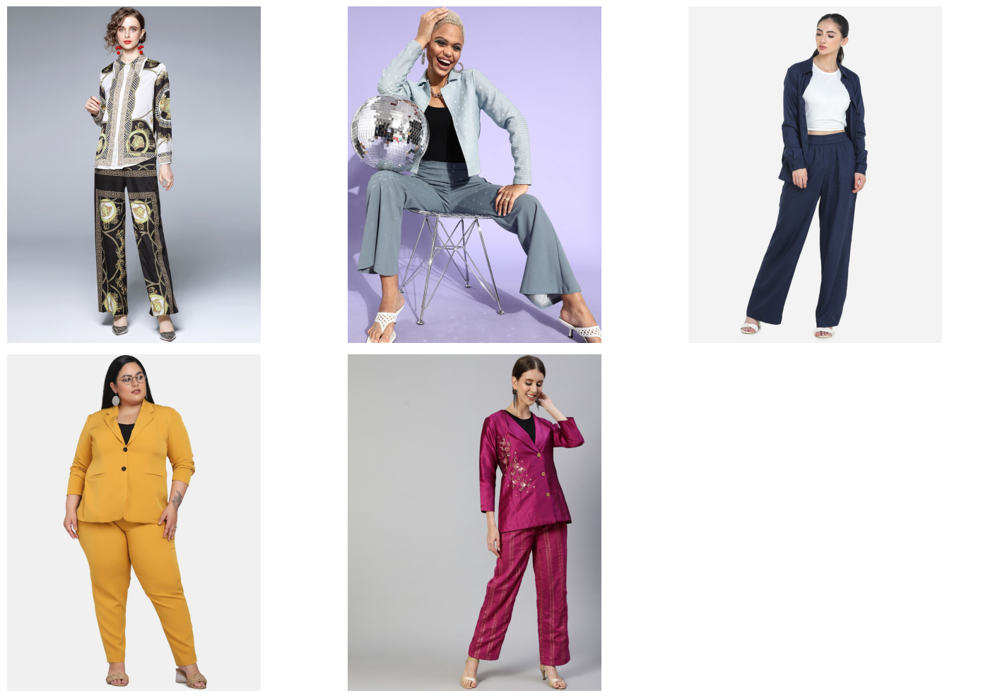

-------------------------------------------------------



dict_items([('ids', [['18529894', '16002984', '15572592', '18686350', '15764214']]), ('distances', [[0.3251029849052429, 0.33150267601013184, 0.3340718746185303, 0.3345572054386139, 0.33473411202430725]]), ('metadatas', [[{'Brand': 'JC Collection', 'Colour': 'Black', 'Description': "This Co-ords consists of Shirt and Trousers<br>Black and white printed Shirt ,has a shirt collar, long sleeves<br>Black and white printed Trousers ,has a slip-on closureTop fabric: Polyester<br>Bottom fabric: Polyester<br>Dry cleanThe model (height 5'8) is wearing a size M", 'Name': 'JC Collection Women Black & White Printed Shirt with Trousers', 'Price_INR': 5999.0, 'Product_attributes': "{'Add-Ons': 'NA', 'Bottom Closure': 'Slip-On', 'Bottom Fabric': 'Polyester', 'Bottom Pattern': 'Printed', 'Bottom Type': 'Trousers', 'Character': 'NA', 'Lining': 'NA', 'Neck': 'Shirt Collar', 'Number of Pockets': 'NA', 'Occasion': 'Casual', 'Sleeve Length': 'Long Sleeves', 'Sustainable': 'Regular', 'Top Fabric': 'Polyeste

In [94]:
#Get from colection first


# Query the fashion collection to retrieve relevant fashion items based on the user query
results = fashion_collection.query(
    query_texts=query,  # User query provided as input
    n_results=5  # Number of results to retrieve, in this case, the top 3 most relevant results
)


import matplotlib.pyplot as plt
import os
from PIL import Image

# Assuming you have already obtained the search results in the variable 'results'

# Extract the IDs of the fashion items from the search results
item_ids = results['ids'][0]  # Assuming the IDs are stored as the first element of the list

# Calculate the number of images
num_images = len(item_ids)

# Define the number of columns for the grid layout
num_cols = 3

# Calculate the number of rows needed based on the number of images and number of columns
num_rows = (num_images + num_cols - 1) // num_cols

# Set up the plot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows*5))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Display the images along with metadata
for i, item_id in enumerate(item_ids):
    # Construct the path to the image file
    image_path = os.path.join(images_folder_path, str(item_id) + '.jpg')

    # Check if the image file exists
    if os.path.exists(image_path):
        # Open and display the image
        img = Image.open(image_path)
        axes[i].imshow(img)
        axes[i].axis('off')
    else:
        axes[i].axis('off')
        axes[i].text(0.5, 0.5, f"Image not found for item ID: {item_id}",
                     fontsize=12, ha='center', va='center')

# Hide any remaining empty subplots
for j in range(num_images, num_rows * num_cols):
    axes[j].axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


print("-------------------------------------------------------\n")
# Extract and display the items retrieved from the search operation
results.items()

### Search Layer+Cache

In [95]:
# Implementing Cache in Semantic Search

# Set a threshold for cache search
threshold = 0.2

ids = []
documents = []
distances = []
metadatas = []
results_df = pd.DataFrame()

# Check if the distance is greater than the threshold, if so, return results from the main collection
if cache_results['distances'][0] == [] or cache_results['distances'][0][0] > threshold:
    # Query the collection against the user query and return the results
    results = fashion_collection.query(
        query_texts=query,
        n_results=5
    )

    # Store the query in cache_collection as a document with respect to ChromaDB for future reference
    # Store retrieved text, ids, distances, and metadatas in cache_collection as metadatas, so they can be fetched easily if a query indeed matches to a query in cache
    Keys = []
    Values = []

    for key, val in results.items():
        if val is None:
            continue
        for i in range(len(val[0])):  # Iterate over the actual length of val
            Keys.append(str(key) + str(i))
            if len(val[0]) > i:  # Check if the current index exists in val
                Values.append(str(val[0][i]))

    cache_collection.add(
        documents=[query],
        ids=[query],
        metadatas=dict(zip(Keys, Values))
    )

    # Print message indicating the results are found in the main collection
    print("Not found in cache. Found in the main collection.")

    # Construct a DataFrame from the query results
    result_dict = {'Metadatas': results['metadatas'][0], 'Documents': results['documents'][0], 'Distances': results['distances'][0], "IDs": results["ids"][0]}
    results_df = pd.DataFrame.from_dict(result_dict)


# If the distance is less than the threshold, return results from the cache
elif cache_results['distances'][0][0] <= threshold and cache_results['ids']:
    cache_result_dict = cache_results['metadatas'][0][0]

    # Loop through each inner list and then through the dictionary
    for key, value in cache_result_dict.items():
        if 'ids' in key:
            ids.append(value)
        elif 'documents' in key:
            documents.append(value)
        elif 'distances' in key:
            distances.append(value)
        elif 'metadatas' in key:
            metadatas.append(value)

    # Print message indicating the results are found in the cache
    print("Found in cache!")

    # Create a DataFrame from the cached results
    results_df = pd.DataFrame({
        'IDs': ids,
        'Documents': documents,
        'Distances': distances,
        'Metadatas': metadatas
    })
else:
    # Print message indicating no valid results found in cache
    print("No valid results found in cache!")

Not found in cache. Found in the main collection.


In [96]:
#This query has been inserted in cache for future search.Validate this by seeing content of cache

cache_results = cache_collection.query(
    query_texts=query,  # User query
    n_results=5  # Number of results to retrieve
)
cache_results

Number of requested results 5 is greater than number of elements in index 4, updating n_results = 4


{'ids': [['Looking for formals for office.Searching for trousers, coat and shirt',
   'Some yellow dress for indian marriage Haldi Ceremony',
   'a orange summer dress or kurta to wear over blue denim jeans .',
   'i want Adidas or Puma sports wear for gym.It should be of best quality and light weight']],
 'distances': [[0.0,
   0.41425886395114975,
   0.4323501210638788,
   0.4522703784362157]],
 'metadatas': [[{'distances0': '0.3251029849052429',
    'distances1': '0.33150267601013184',
    'distances2': '0.3340718746185303',
    'distances3': '0.3345572054386139',
    'distances4': '0.33473411202430725',
    'documents0': "This Co-ords consists of Shirt and Trousers<br>Black and white printed Shirt ,has a shirt collar, long sleeves<br>Black and white printed Trousers ,has a slip-on closureTop fabric: Polyester<br>Bottom fabric: Polyester<br>Dry cleanThe model (height 5'8) is wearing a size M",
    'documents1': "This clothing set consists of Coat and Trousers<br>Blue self design fro

Query: 
Looking for formals for office.Searching for trousers, coat and shirt


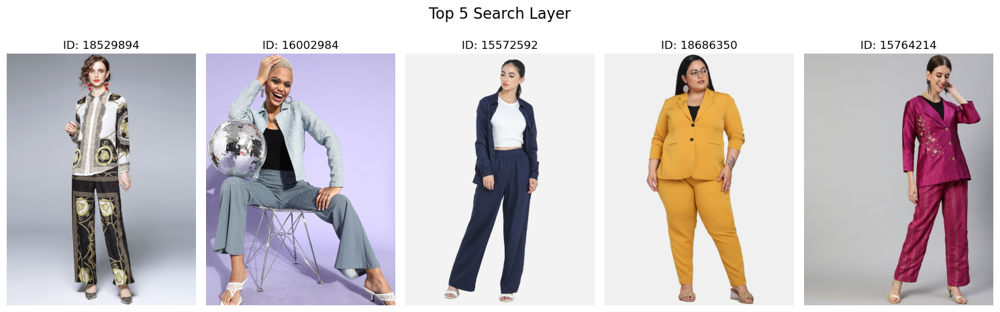

,Metadatas,Documents,Distances,IDs
0,"{'Brand': 'JC Collection', 'Colour': 'Black', ...",This Co-ords consists of Shirt and Trousers<br...,0.325103,18529894
1,"{'Brand': 'Athena', 'Colour': 'Blue', 'Descrip...",This clothing set consists of Coat and Trouser...,0.331503,16002984
2,"{'Brand': 'DECHEN', 'Colour': 'Navy Blue', 'De...",This Co-ords set consists of Shirt and Trouser...,0.334072,15572592
3,"{'Brand': 'PowerSutra', 'Colour': 'Mustard', '...",This clothing set consists of Coat and Trouser...,0.334557,18686350
4,"{'Brand': 'Ishin', 'Colour': 'Purple', 'Descri...",This co-ords consists of Coat and Trousers <br...,0.334734,15764214


In [97]:
#Search Result in a Readable Format
def print_query_with_separator(prefix, query):
    # Print the prefix
    print(prefix)
    # Insert a newline character after every full stop
    query_with_newlines = query.replace(". ", ".\n")
    # Print the modified query
    print(query_with_newlines)

# Print the query with prefix and separator
print_query_with_separator("Query: ", query)

# Print the IDs from the results DataFrame
##print("IDs:")
#print(results_df['IDs'])


# Display images corresponding to the IDs side by side
num_images = len(results_df['IDs'])
fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

# Set the title of the plot as the user query
fig.suptitle("Top 5 Search Layer", fontsize=16)

for i, item_id in enumerate(results_df['IDs']):
    # Construct the path to the image file
    image_path = os.path.join(images_folder_path, str(item_id) + '.jpg')

    # Check if the image file exists
    if os.path.exists(image_path):
        # Open and display the image
        img = Image.open(image_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"ID: {item_id}")
    else:
        print(f"Image not found for item ID: {item_id}")

plt.tight_layout()
plt.show()

results_df

### Ranking With Cross Encoder

Re-ranking the results from a semantic search can sometimes significantly enhance the relevance of the retrieved results. This process typically involves using a cross-encoder to evaluate the relevance of each retrieved response in relation to the query. By passing the query and each response through the cross-encoder, a relevance score is assigned, allowing for a more accurate ranking of the results.

In [98]:
cross_encoder = CrossEncoder('cross-encoder/ms-marco-MiniLM-L-6-v2')

In [99]:
# Create input pairs for the cross encoder, consisting of each query paired with each response
cross_inputs = [[query, response] for response in results_df['Documents']]

# Generate cross-encoder scores for the input pairs
cross_rerank_scores = cross_encoder.predict(cross_inputs)

# Display the cross-encoder scores
cross_rerank_scores


array([-5.1614566, -4.958825 , -5.7325377, -4.474139 , -4.9048414],
      dtype=float32)

In [100]:
results_df['Reranked_scores'] = cross_rerank_scores

# Display the updated results DataFrame
results_df

,Metadatas,Documents,Distances,IDs,Reranked_scores
0,"{'Brand': 'JC Collection', 'Colour': 'Black', ...",This Co-ords consists of Shirt and Trousers<br...,0.325103,18529894,-5.161457
1,"{'Brand': 'Athena', 'Colour': 'Blue', 'Descrip...",This clothing set consists of Coat and Trouser...,0.331503,16002984,-4.958825
2,"{'Brand': 'DECHEN', 'Colour': 'Navy Blue', 'De...",This Co-ords set consists of Shirt and Trouser...,0.334072,15572592,-5.732538
3,"{'Brand': 'PowerSutra', 'Colour': 'Mustard', '...",This clothing set consists of Coat and Trouser...,0.334557,18686350,-4.474139
4,"{'Brand': 'Ishin', 'Colour': 'Purple', 'Descri...",This co-ords consists of Coat and Trousers <br...,0.334734,15764214,-4.904841


In [101]:
# Return the top 3 results from semantic search based on the Distance
top_3_semantic = results_df.sort_values(by='Distances', ascending=False)[:3]

# Display the top 3 semantic search results
top_3_semantic

,Metadatas,Documents,Distances,IDs,Reranked_scores
4,"{'Brand': 'Ishin', 'Colour': 'Purple', 'Descri...",This co-ords consists of Coat and Trousers <br...,0.334734,15764214,-4.904841
3,"{'Brand': 'PowerSutra', 'Colour': 'Mustard', '...",This clothing set consists of Coat and Trouser...,0.334557,18686350,-4.474139
2,"{'Brand': 'DECHEN', 'Colour': 'Navy Blue', 'De...",This Co-ords set consists of Shirt and Trouser...,0.334072,15572592,-5.732538


In [102]:
top_3_rerank = results_df.sort_values(by='Reranked_scores', ascending=False)
top_3_rerank

,Metadatas,Documents,Distances,IDs,Reranked_scores
3,"{'Brand': 'PowerSutra', 'Colour': 'Mustard', '...",This clothing set consists of Coat and Trouser...,0.334557,18686350,-4.474139
4,"{'Brand': 'Ishin', 'Colour': 'Purple', 'Descri...",This co-ords consists of Coat and Trousers <br...,0.334734,15764214,-4.904841
1,"{'Brand': 'Athena', 'Colour': 'Blue', 'Descrip...",This clothing set consists of Coat and Trouser...,0.331503,16002984,-4.958825
0,"{'Brand': 'JC Collection', 'Colour': 'Black', ...",This Co-ords consists of Shirt and Trousers<br...,0.325103,18529894,-5.161457
2,"{'Brand': 'DECHEN', 'Colour': 'Navy Blue', 'De...",This Co-ords set consists of Shirt and Trouser...,0.334072,15572592,-5.732538


In [103]:
top_3_RAG = top_3_rerank[["Documents", "Metadatas","IDs"]]
top_3_RAG

,Documents,Metadatas,IDs
3,This clothing set consists of Coat and Trouser...,"{'Brand': 'PowerSutra', 'Colour': 'Mustard', '...",18686350
4,This co-ords consists of Coat and Trousers <br...,"{'Brand': 'Ishin', 'Colour': 'Purple', 'Descri...",15764214
1,This clothing set consists of Coat and Trouser...,"{'Brand': 'Athena', 'Colour': 'Blue', 'Descrip...",16002984
0,This Co-ords consists of Shirt and Trousers<br...,"{'Brand': 'JC Collection', 'Colour': 'Black', ...",18529894
2,This Co-ords set consists of Shirt and Trouser...,"{'Brand': 'DECHEN', 'Colour': 'Navy Blue', 'De...",15572592


####  Retrieval Augmented Generation


Based on your query for formal office attire including trousers, coat, and shirt, here are the relevant fashion items from the dataset you provided:

1. **PowerSutra Mustard Coat and Trouser Set**
   - Brand: PowerSutra
   - Colour: Mustard
   - Description: This clothing set consists of a coat and trousers.

2. **Ishin Purple Coat and Trousers Co-ords**
   - Brand: Ishin
   - Colour: Purple
   - Description: This co-ords set includes a coat and trousers.

3. **DECHEN Navy Blue Shirt and Trouser Co-ords**
   - Brand: DECHEN
   - Colour: Navy Blue
   - Description: This co-ords set comprises of a shirt and trousers.

You can explore these fashion items from different brands to create a stylish formal office look with the perfect combination of trousers, coat, and shirt. For more detailed information such as pricing and availability, it is recommended to visit our website page.


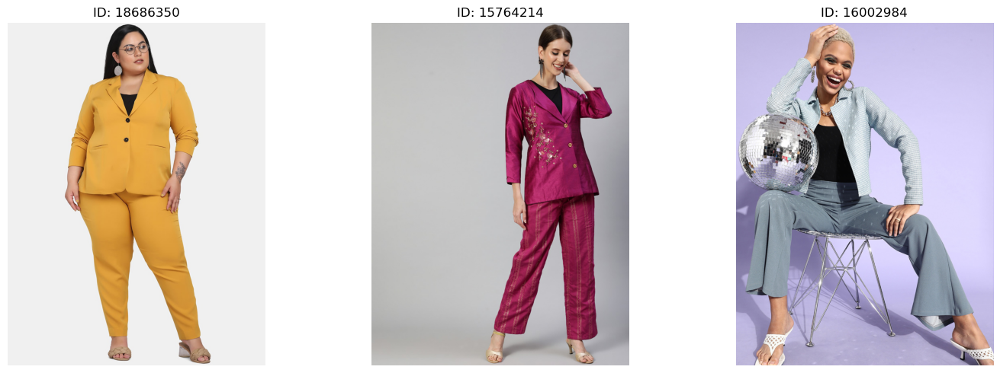

In [105]:
def generate_response_fashion(query, top_3_RAG):
    """
    Generate a response using GPT-3.5's ChatCompletion based on the user query and retrieved information.
    """
    messages = [
        {"role": "system", "content":  "You are a helpful AI assistant in the fashion domain, specialized in providing accurate answers to fashion-related queries."},
        {"role": "user", "content": f"""You have received a query from a user looking for fashion-related information. The query is: "{query}".
                                        Additionally, you have obtained the top 3 relevant results from the fashion dataset in the dataframe '{top_3_RAG}'.

                                        The 'Documents' column in this dataframe contains descriptions of fashion items, and the 'Metadatas' column contains additional information such as item name, brand.

                                        Your task is to use the information provided in '{top_3_RAG}' to generate a response to the query "{query}". Ensure that your response is informative and relevant to the user's query. Utilize the metadata to cite the relevant fashion items.

                                        Please adhere to the following guidelines:
                                        1. Provide accurate and relevant information based on the user query and the top 3 search results.
                                        2. You may use any relevant details from the dataframe to craft your response.
                                        3. If any of the fashion items contain tables or structured information, format and present it clearly.
                                        4. Use the metadata to cite the names, brands of the relevant fashion items.
                                        5. If you are unable to provide a complete answer, offer guidance on where the user can find further information within the cited fashion items.
                                        6. As a user-facing assistant, focus on delivering a direct and concise response without delving into technical details.
                                        7. Please note that detailed price and rating information might change from time to time. For more details,you should recommend to visit our website page.

                                        Your response should directly address the user's query and include citations for the referenced fashion items. Present the information in a well-organized and easily understandable format.
                                        """},
    ]

    response = openai.chat.completions.create(
        model="gpt-3.5-turbo",
        messages=messages
    )

    # Extracting p_ids directly from the 'IDs' column in top_3_RAG
    p_ids = top_3_RAG['IDs'].head(3).tolist()

    # Returning response and p_ids
    return response.choices[0].message.content, p_ids

# Generate response and p_ids based on the provided query and top_3_RAG DataFrame
response, p_ids = generate_response_fashion(query, top_3_RAG)

# Print the response
print(response)



# Display the images corresponding to the IDs obtained from the response side by side
num_images = len(p_ids)
fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

for i, item_id in enumerate(p_ids):
    # Construct the path to the image file
    image_path = os.path.join(images_folder_path, str(item_id) + '.jpg')

    # Check if the image file exists
    if os.path.exists(image_path):
        # Open and display the image
        img = Image.open(image_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"ID: {item_id}")
    else:
        print(f"Image not found for item ID: {item_id}")

plt.tight_layout()
plt.show()

In [ ]:
When comparing the results from both the search layer and the generation layer, it's clear that the output from the generation layer is more comprehensive and easier to understand. The search layer typically retrieves relevant information based on keyword matching or specific criteria, while the generation layer utilizes advanced AI models like GPT-3.5 to produce responses dynamically, taking context into account and providing detailed information relevant to the query.

The generation layer excels at understanding the context of a query and generating responses in natural language, making the information more informative and user-friendly. It can offer nuanced explanations, summaries, or even creative interpretations, resulting in responses that are not only accurate but also engaging and easy to read, thereby enhancing the overall user experience.

Moreover, the flexibility of the generation layer allows it to accommodate various query formats and deliver personalized responses tailored to individual user preferences and needs. This adaptability makes it an invaluable tool for tasks that require a deep understanding and effective communication of information.

In conclusion, while the search layer is effective at efficiently retrieving relevant data, the generation layer significantly improves the quality and clarity of the output, making it the preferred option for situations where detailed and accessible responses are crucial.